# Mileage Prediction

In this project we shall try to see how we can predict the mileage(miles per gallon) of a car. We shall see what are the factors tha t effect in measuring the mileage. There may be lot of factors to measure the Milage lets go through and find them.  

**Mileage** It is the number of miles or the average distance that a vehicle can travel on a specified quantity of fuel.  
Different Vehicles have different Mileage. It depends on deffernt measures and specifications of the car.  

Based on a research done by Suman Gautam (Illinois Wesleyan University, sgautam@iwu.edu), the vehicle type, fuel prices, CAFE standards, average vehicle weight, and engine horsepower are determinants in fuel economy.  

According to wikipedia  thermal efficiency (mechanical output to chemical energy in fuel) of petroleum engines is not the only factor in fuel economy. The design of automobile as a whole and usage pattern affects the fuel economy.  

Based on the studies of  Mobil Economy Run, the average fuel economy for new passenger car in the United States improved from 17 mpg (13.8 L/100 km) in 1978 to more than 22 mpg (10.7 L/100 km) in 1982. The average fuel economy for new 2017 model year cars, light trucks and SUVs in the United States was 24.9 mpgUS (9.4 L/100 km). 2019 model year cars (ex. EVs) classified as "midsize" by the US EPA ranged from 12 to 56 mpgUS (20 to 4.2 L/100 km). Due to environmental concerns caused by CO2 emissions, new EU regulations are being introduced to reduce the average emissions of cars sold beginning in 2012, to 130 g/km of CO2, equivalent to 4.5 L/100 km (52 mpgUS, 63 mpgimp) for a diesel-fueled car, and 5.0 L/100 km (47 mpgUS, 56 mpgimp) for a gasoline (petrol)-fueled car.  

Average speed of the vehicle may also effect the mileage.  The most recent study indicates greater fuel efficiency at higher speeds than earlier studies; for example, some vehicles achieve better fuel economy at 100 km/h (62 mph) rather than at 70 km/h (43 mph), although not their best economy, such as the 1994 Oldsmobile Cutlass Ciera with the LN2 2.2L engine, which has its best economy at 90 km/h (56 mph) (8.1 L/100 km (29 mpg‑US)), and gets better economy at 105 km/h (65 mph) than at 72 km/h (45 mph) (9.4 L/100 km (25 mpg‑US) vs 22 mpg‑US (11 L/100 km)). The proportion of driving on high speed roadways varies from 4% in Ireland to 41% in the Netherlands.  

Real-world fuel consumption can vary greatly as they can be affected by many factors that have little to do with the vehicle. Driving conditions – weather, traffic, temperature; driving style – hard braking, jackrabbit starts, and speeding; road conditions – paved vs gravel, smooth vs potholes; and things like carrying excess weight, roof racks, and fuel quality can all combine to dramatically increase fuel consumption.  

Faster speeds and acceleration, Air conditioner use, Colder outside temperatures these conditions also effect the fuel economy.

**So based on different researchs there are many factors to comsider while determining the Mileage of a vehicle. Some of them are :**
- How You drive
- Vehicle maintanence
- Fuel type used
- Accelaration of Vehicle
- Cylinders(Which is power unit of the engine)
- Weight of the car
- Extra weight(like luggage, passengers)
- Age of the vehicle
- Wether conditions(in which condition you drove the car)
- Horsepower of vehicle
- In which conditions you drive the car
- Engine Capacity(Displacement)  

**These are some factors that are considred which mileagee is determined.**  

![Alt Text](https://www.squawkfox.com/wp-content/uploads/2008/07/gas_mileage_calculator2.gif "Optional Title")

## Problem Statement

Predict the mileage of the car based on the data of the car given.  

We have data about cylinders, Displacement, Horsepower, Weight, Accleration, Midel Year, origin and name of the car. we need to predict the mileage of the car based on this data.  

#### Solution  

We use Machine Leaning to solve this problem. We use different ML algorithms such as Linear Regression, Decision Tree, KNN Regressor, SVM Regressor, Random Forest Regressor and etc..

#### Data Collection  

Data can be collected from various companies that are working or manufacturing car's. We can also get the data from the companies that do research on mileages of the cars. In United states there are some research going on the mileage of veiches. We can get the data from various researches and we can also conduct surveys for gathering the data.

##### Importing the Libraries to be used in the Project

In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as xp
from scipy.stats import f_oneway
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import ExtraTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso,Ridge
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings('ignore')

##### Load the data

In [125]:
data=pd.read_csv('auto-mpg.data',names=['MPG','Cylinders','Displacement','Horsepower','Weight','Acceleration','Model Year',
                                        'Origin'],na_values='?',comment='\t',skipinitialspace=True,sep=" ")
data=pd.concat((data,pd.read_csv('auto-mpg.data',sep="\t",names=[1,'car_names'],na_values='?',skipinitialspace=True)
                ['car_names']),axis=1)
data.head()

,MPG,Cylinders,Displacement,Horsepower,Weight,Acceleration,Model Year,Origin,car_names
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,ford torino


#### Explratory Data Analysis on the Data

In [126]:
data.head()

,MPG,Cylinders,Displacement,Horsepower,Weight,Acceleration,Model Year,Origin,car_names
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,ford torino


In [127]:
data.shape

(398, 9)

**Observation**  

- Data contains 398 instances and 9 Features.

In [128]:
data.columns

Index(['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
       'Acceleration', 'Model Year', 'Origin', 'car_names'],
      dtype='object')

**MPG(Miles per Gallon) :**  A measurement of fuel economy in automobiles. It is a conituous Feature as it is a measurement.

In [129]:
data['MPG'].dtype

dtype('float64')

**Observation**  
- It is of Float data type.
- It is a continuous feature.

**Cylinders :** The cylinder is the power unit of the engine. This is where fuel is burned and converted into mechanical energy that powers the vehicle. The number of cylinders in a typical car could be four, six or eight. It can take values of 3,4,5,6 and 8. It is a categorical Feature

In [130]:
data['Cylinders'].unique()

array([8, 4, 6, 3, 5], dtype=int64)

**Observation**  
- It is of Integer Data type
- It is a Categorical feature.

**Displacement :** The engine capacity, or displacement, of a car is the combined volume of all its cylinders. It is a measurement, so it is a continuous feature.

In [131]:
data['Displacement'].dtype

dtype('float64')

**Observation**  
- It is of float Data type.
- It is a continuous feature.

**Horsepower :** Horsepower (hp) is the metric used to indicate the power produced by a car's engine - the higher the number, the more power is sent to the wheels and, in theory, the faster it will go. It is a measurement, so it is a continuous Feature.

In [132]:
data['Horsepower'].dtype

dtype('float64')

**Observation**  
- It is of Float Data type.
- It is a continuous feature.

**Weight :** Vehicle weight is a measurement of wheeled motor vehicles; either an actual measured weight of the vehicle under defined conditions or a gross weight rating for its weight carrying capacity. It is a measurement, so it is a continuous feature.

In [133]:
data['Weight'].dtype

dtype('float64')

**Observation**  
- It is of Float Data type.
- It is a continuous feature.

**Acceleration :**  Acceleration is the rate of change of velocity as a function of time. It is a measurement, so it is a continuous feature.

In [134]:
data['Acceleration'].dtype

dtype('float64')

**Observation**  
- It is of Float Data type.
- It is a continuous feature.

**Model Year :** It the year in which car model is manufactured. As the data is collected from specific time period, It is categorical Feature.

In [135]:
data['Model Year'].unique()

array([70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82], dtype=int64)

**Observations**  
- The car models are from 1970's to 1982.
- It is a categorical features.

**Origin :** It is country where the car is manufactured.

In [136]:
data['Origin'].unique()

array([1, 3, 2], dtype=int64)

**Observations**
- The car's are from 3 Countries.
- It is a categorical Feature

**Car_names :** It is name of the car. It is unique of each car.  
- It has no significance in calculating the Mileage so we can remove this Feature.

In [137]:
data.drop('car_names',axis=1,inplace=True)

**Observations**
Continuous Features:  
- MPG
- Displacement
- Horsepower
- Weight
- Acleration  
Categorical Features:
- Cylinders
- Model Year
- Origin

In [138]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MPG           398 non-null    float64
 1   Cylinders     398 non-null    int64  
 2   Displacement  398 non-null    float64
 3   Horsepower    392 non-null    float64
 4   Weight        398 non-null    float64
 5   Acceleration  398 non-null    float64
 6   Model Year    398 non-null    int64  
 7   Origin        398 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 25.0 KB


**Observations**
- Some Features are atually a categorical Features but they are encoded into numerical.We can convert them into object data type for Data Exploration.

In [139]:
conti_cols=['Displacement', 'Horsepower', 'Weight','Acceleration']
categ_cols=['Cylinders', 'Model Year', 'Origin']

In [140]:
data['Cylinders']=data['Cylinders'].astype(object)
data['Model Year']=data['Model Year'].astype(object)
data['Origin']=data['Origin'].astype(object)

In [141]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MPG           398 non-null    float64
 1   Cylinders     398 non-null    object 
 2   Displacement  398 non-null    float64
 3   Horsepower    392 non-null    float64
 4   Weight        398 non-null    float64
 5   Acceleration  398 non-null    float64
 6   Model Year    398 non-null    object 
 7   Origin        398 non-null    object 
dtypes: float64(5), object(3)
memory usage: 25.0+ KB


**Observations**
- All Features except Horsepower has no missing valuess.
- We can fill the missing value with mean/median or remove them as there are only 6 missing values in it.

In [142]:
data.describe(include='float64')

,MPG,Displacement,Horsepower,Weight,Acceleration
count,398.000000,398.000000,392.000000,398.000000,398.000000
mean,23.514573,193.425879,104.469388,2970.424623,15.568090
std,7.815984,104.269838,38.491160,846.841774,2.757689
min,9.000000,68.000000,46.000000,1613.000000,8.000000
25%,17.500000,104.250000,75.000000,2223.750000,13.825000
50%,23.000000,148.500000,93.500000,2803.500000,15.500000
75%,29.000000,262.000000,126.000000,3608.000000,17.175000
max,46.600000,455.000000,230.000000,5140.000000,24.800000


**Observations**
- Average Mileage(MPG) is 23.5145
- Average Weight of a car is 2970.42
- Average Acceleration of car is 15.568
- Average Horse power of a car is 104.469
- Average Displacement(Capacity of Engine) is 193.425
- Maximum Mileage of car is 46.6
- Minimum Mileage of car is 9
- Maximum Displacement of car is 455
- Minimum Displacement of car is 68
- Maximum Hosre Power of car is 230
- Minimum Horse Power of car is 46
- Maximum Weight of car is 1613
- Minimum Weight of car is 5140
- Maximum Acceleration of car is 24.5
- Minimum Acceleration of car is 8

In [143]:
data.describe(include=object)

,Cylinders,Model Year,Origin
count,398,398,398
unique,5,13,3
top,4,73,1
freq,204,40,249


**Observations**
- Most of the cars have 4 cylinders
- Most of the cars origin from country '1'
- Most of the cars are manufactured in Year 1973.

**Missing Values**

In [144]:
data.isnull().sum()

MPG             0
Cylinders       0
Displacement    0
Horsepower      6
Weight          0
Acceleration    0
Model Year      0
Origin          0
dtype: int64

In [145]:
data.isnull().sum()*100/data.shape[0]

MPG             0.000000
Cylinders       0.000000
Displacement    0.000000
Horsepower      1.507538
Weight          0.000000
Acceleration    0.000000
Model Year      0.000000
Origin          0.000000
dtype: float64

<AxesSubplot:>

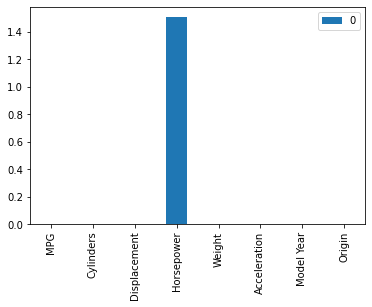

In [146]:
pd.DataFrame(data.isnull().sum()*100/data.shape[0]).plot(kind='bar',)

**Obsevations**
- Only HorsePower Feature has some(6) Missing values(i.e 1.4%).

**Displacement**

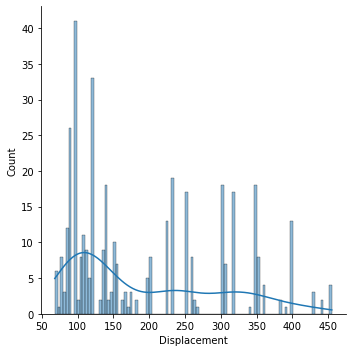

In [147]:
sns.displot(x=data['Displacement'],kde=True,bins=100)

In [148]:
xp.histogram(data_frame=data,x='Displacement',nbins=45)

In [149]:
xp.box(data_frame=data,x='Displacement')

**Observations**
- Most of the values are in rage 90-99.
- There are no outliers.

**HorsePower**

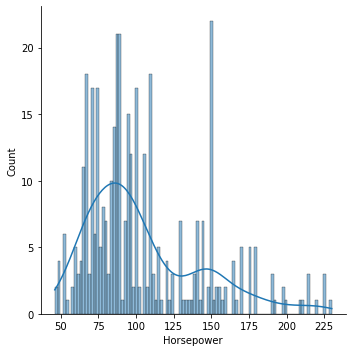

In [150]:
sns.displot(x=data['Horsepower'],kde=True,bins=100)

In [151]:
xp.histogram(data_frame=data,x='Horsepower')

In [152]:
xp.box(x=data['Horsepower'])

**Observations**
- Most of the values are in range 90-99
- There are few outliers 

**Weight**

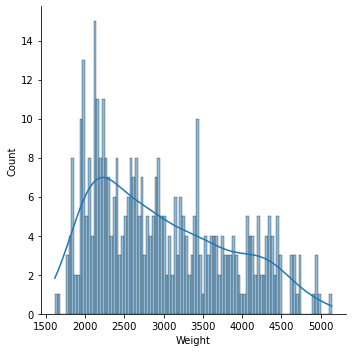

In [153]:
sns.displot(x=data['Weight'],kde=True,bins=100)

In [154]:
xp.histogram(x=data['Weight'],nbins=100)

In [155]:
xp.box(x=data['Weight'])

**Observations**
- There are no outliers.

**Acceleeration**

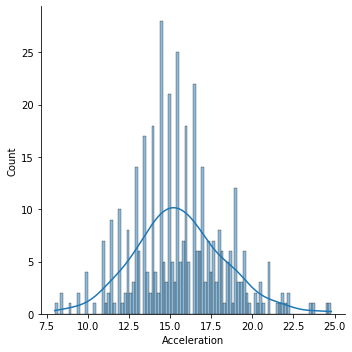

In [156]:
sns.displot(x=data['Acceleration'],kde=True,bins=100)

In [157]:
xp.histogram(x=data['Acceleration'])

In [158]:
xp.box(x=data['Acceleration'])

**Observations**
- There are Few outliers

**Cylinders**

In [159]:
xp.histogram(x=data['Cylinders'])

In [160]:
xp.pie(data_frame=data,names='Cylinders')

**Observations**
- 51.3% of cars have 4 cylinders.
- 0.754% of cars have 5 cylinders.

**Model Year**

In [161]:
xp.histogram(x=data['Model Year'])

In [162]:
xp.pie(data_frame=data,names='Model Year')

**Observations**
- Car are some what at same percentage every year.

**Origin**

In [163]:
xp.histogram(x=data['Origin'])

In [164]:
xp.pie(data_frame=data,names='Origin')

**Observations**
- 62.6% of the cars are manufactured in Country 1.

<AxesSubplot:xlabel='Displacement', ylabel='MPG'>

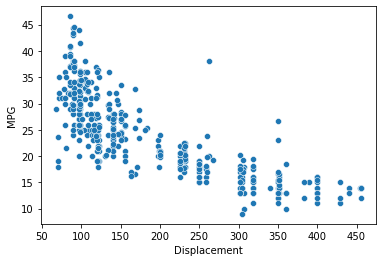

In [165]:
sns.scatterplot(y=data['MPG'],x=data['Displacement'])

**Observations**
- As the displacement increses MPG decreses.

In [166]:
xp.scatter(data_frame=data,x='Horsepower',y='MPG')

**Observations**
- As the Horsepower increases MPG decreses.

In [167]:
xp.scatter(data_frame=data,x='Weight',y='MPG')

**Observation**
- As the weight increases the MPG decreses.

In [168]:
xp.scatter(data_frame=data,x='Acceleration',y='MPG')

**Observation**
- As the acceleration increases MPG also increases.

<AxesSubplot:xlabel='Cylinders', ylabel='MPG'>

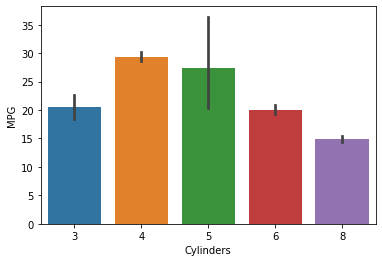

In [169]:
sns.barplot(y=data['MPG'],x=data['Cylinders'])

In [170]:
data.groupby('Cylinders')['MPG'].mean()

Cylinders
3    20.550000
4    29.286765
5    27.366667
6    19.985714
8    14.963107
Name: MPG, dtype: float64

**Observation**
- Car's with 4 Cylinders have highest average MPG(Mileage)

<AxesSubplot:xlabel='Model Year', ylabel='MPG'>

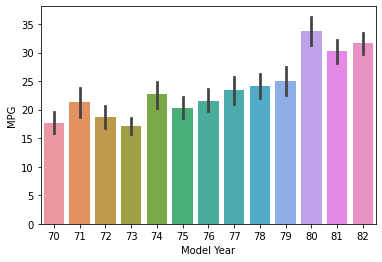

In [171]:
sns.barplot(data=data,y='MPG',x='Model Year')

In [172]:
data.groupby('Model Year')['MPG'].mean()

Model Year
70    17.689655
71    21.250000
72    18.714286
73    17.100000
74    22.703704
75    20.266667
76    21.573529
77    23.375000
78    24.061111
79    25.093103
80    33.696552
81    30.334483
82    31.709677
Name: MPG, dtype: float64

**Observation**
- In year 1980 car's manufactured have avergae Milage if 33.7

<AxesSubplot:xlabel='Origin', ylabel='MPG'>

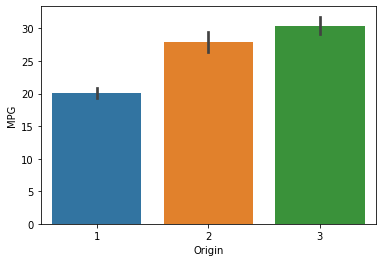

In [173]:
sns.barplot(data=data,x='Origin',y="MPG")

In [174]:
data.groupby('Origin')['MPG'].mean()

Origin
1    20.083534
2    27.891429
3    30.450633
Name: MPG, dtype: float64

**Observations**
- Car's that are manufactured in Country 3 have highest average MPG(Mileage) 30.45

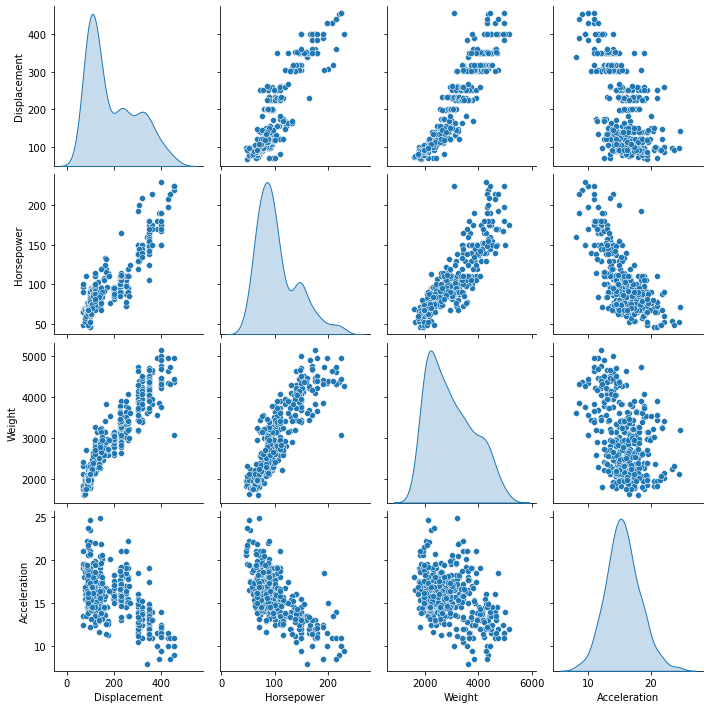

In [175]:
sns.pairplot(data=data[conti_cols], diag_kind="kde")

<AxesSubplot:>

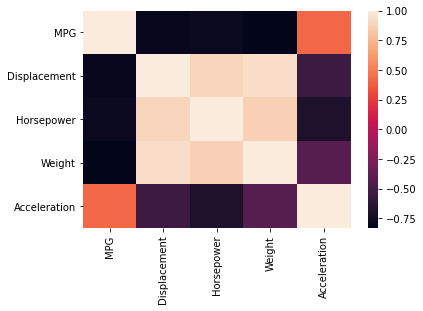

In [176]:
sns.heatmap(data.corr())

In [177]:
xp.imshow(data.corr())

In [178]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MPG           398 non-null    float64
 1   Cylinders     398 non-null    object 
 2   Displacement  398 non-null    float64
 3   Horsepower    392 non-null    float64
 4   Weight        398 non-null    float64
 5   Acceleration  398 non-null    float64
 6   Model Year    398 non-null    object 
 7   Origin        398 non-null    object 
dtypes: float64(5), object(3)
memory usage: 25.0+ KB


In [179]:
data.corr()

,MPG,Displacement,Horsepower,Weight,Acceleration
MPG,1.000000,-0.804203,-0.778427,-0.831741,0.420289
Displacement,-0.804203,1.000000,0.897257,0.932824,-0.543684
Horsepower,-0.778427,0.897257,1.000000,0.864538,-0.689196
Weight,-0.831741,0.932824,0.864538,1.000000,-0.417457
Acceleration,0.420289,-0.543684,-0.689196,-0.417457,1.000000


**Obsevations**
- Displacement, Horsepower, Weight, Acceleration are correlated with MPG.

In [180]:
for col in categ_cols:
    lis=pd.DataFrame(data.groupby(col))
    l=[]
    for i in range(0,lis.shape[0]):
        l.append(list(lis[1][i]['MPG']))
    if f_oneway(*l)[1]>0.05:
        print(col,"is not correlated with MPG")
    else:
        print(col,"is correlated with MPG")

Cylinders is correlated with MPG
Model Year is correlated with MPG
Origin is correlated with MPG


**Observation**
- Cylinders, Model Year, Origin are correlated to MPG.

**Data Preperation**  

We need to fill out if there are any missing values and scale the Continuous Features.

In [181]:
imputer=KNNImputer()
data=imputer.fit_transform(data)

In [182]:
data=pd.DataFrame(data,columns=['MPG','Cylinders','Displacement','Horsepower','Weight','Acceleration','Model Year',
                                        'Origin'])

In [183]:
data.isnull().sum()

MPG             0
Cylinders       0
Displacement    0
Horsepower      0
Weight          0
Acceleration    0
Model Year      0
Origin          0
dtype: int64

**Observations**
- Null values are imputed using KNNimputer.
- No missing values in the data.

In [184]:
scaler=StandardScaler()
for col in conti_cols:
    data[col]=scaler.fit_transform(np.array(data[col]).reshape(-1,1))
data.head()

,MPG,Cylinders,Displacement,Horsepower,Weight,Acceleration,Model Year,Origin
0,18.0,8.0,1.090604,0.674189,0.630870,-1.295498,70.0,1.0
1,15.0,8.0,1.503514,1.588038,0.854333,-1.477038,70.0,1.0
2,18.0,8.0,1.196232,1.196388,0.550470,-1.658577,70.0,1.0
3,16.0,8.0,1.061796,1.196388,0.546923,-1.295498,70.0,1.0
4,17.0,8.0,1.042591,0.935289,0.565841,-1.840117,70.0,1.0


**Observation**
- Data is scaled using standard Scaler and ready to train the model.

In [185]:
data.columns

Index(['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
       'Acceleration', 'Model Year', 'Origin'],
      dtype='object')

**Model Training**

In [ ]:
Y=data['MPG']
data.drop('MPG',axis=True,inplace=True)
X=data

In [186]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

**Linear Regression**

In [187]:
lin_reg=LinearRegression()
log=lin_reg.fit(X,Y)
abs(cross_val_score(log,X,Y, cv=5, verbose=1, scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished


3.0058575063382835

In [188]:
cross_val_score(lin_reg,X,Y, cv=5, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.5952809135597666

**Decision Tree Regressor**

In [189]:
DT=DecisionTreeRegressor()
abs(cross_val_score(DT,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished


2.931852564102564

In [190]:
cross_val_score(DT,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.5910407835226482

**Random Forest**

In [191]:
RF=RandomForestRegressor()
abs(cross_val_score(RF,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.9s finished


2.102474487179488

In [192]:
cross_val_score(RF,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.0s finished


0.7519603192204338

**Extra Tree Regressor**

In [193]:
ET=ExtraTreeRegressor()
abs(cross_val_score(ET,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


2.777814102564103

In [194]:
cross_val_score(ET,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.5277813332306727

**Adaptive Boosting**

In [195]:
AB=AdaBoostRegressor()
abs(cross_val_score(AB,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished


2.2487004405632924

In [196]:
cross_val_score(AB,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.2s finished


0.7163461643756998

**Gradient Boosting**

In [197]:
GB=GradientBoostingRegressor()
abs(cross_val_score(GB,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.2s finished


2.1253697372729885

In [198]:
cross_val_score(GB,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished


0.7542745818074788

**XG Boosting**

In [199]:
XG=XGBRegressor()
abs(cross_val_score(XG,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.8s finished


2.2957994722953208

In [200]:
cross_val_score(XG,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    3.3s finished


0.7100576765863822

**Light Gradient Boosting Machime**

In [201]:
LGBM=LGBMRegressor()
abs(cross_val_score(LGBM,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.4s finished


2.1056156583108545

In [202]:
cross_val_score(LGBM,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished


0.7508973969752482

**Cat Bossting**

In [203]:
CAT=CatBoostRegressor()
abs(cross_val_score(CAT,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Learning rate set to 0.032508
0:	learn: 7.6533985	total: 155ms	remaining: 2m 34s
1:	learn: 7.4703872	total: 159ms	remaining: 1m 19s
2:	learn: 7.2972943	total: 162ms	remaining: 53.8s
3:	learn: 7.1283374	total: 165ms	remaining: 41.2s
4:	learn: 6.9700587	total: 168ms	remaining: 33.5s
5:	learn: 6.8078633	total: 171ms	remaining: 28.3s
6:	learn: 6.6590345	total: 173ms	remaining: 24.6s
7:	learn: 6.5094573	total: 176ms	remaining: 21.8s
8:	learn: 6.3621498	total: 178ms	remaining: 19.6s
9:	learn: 6.2237812	total: 181ms	remaining: 17.9s
10:	learn: 6.0864324	total: 183ms	remaining: 16.5s
11:	learn: 5.9737786	total: 186ms	remaining: 15.3s
12:	learn: 5.8441536	total: 188ms	remaining: 14.3s
13:	learn: 5.7231679	total: 190ms	remaining: 13.4s
14:	learn: 5.6010282	total: 193ms	remaining: 12.7s
15:	learn: 5.4829120	total: 195ms	remaining: 12s
16:	learn: 5.3720325	total: 198ms	remaining: 11.4s
17:	learn: 5.2665352	total: 200ms	remaining: 10.9s
18:	learn: 5.1667365	total: 202ms	remaining: 10.4s
19:	learn: 

228:	learn: 1.8657894	total: 641ms	remaining: 2.16s
229:	learn: 1.8624820	total: 643ms	remaining: 2.15s
230:	learn: 1.8606050	total: 645ms	remaining: 2.15s
231:	learn: 1.8581919	total: 648ms	remaining: 2.14s
232:	learn: 1.8562954	total: 650ms	remaining: 2.14s
233:	learn: 1.8544335	total: 652ms	remaining: 2.13s
234:	learn: 1.8514414	total: 654ms	remaining: 2.13s
235:	learn: 1.8470086	total: 656ms	remaining: 2.12s
236:	learn: 1.8440670	total: 658ms	remaining: 2.12s
237:	learn: 1.8428348	total: 660ms	remaining: 2.11s
238:	learn: 1.8398325	total: 662ms	remaining: 2.11s
239:	learn: 1.8372028	total: 664ms	remaining: 2.1s
240:	learn: 1.8340837	total: 666ms	remaining: 2.1s
241:	learn: 1.8300673	total: 669ms	remaining: 2.09s
242:	learn: 1.8263731	total: 671ms	remaining: 2.09s
243:	learn: 1.8237381	total: 673ms	remaining: 2.08s
244:	learn: 1.8211259	total: 675ms	remaining: 2.08s
245:	learn: 1.8179225	total: 677ms	remaining: 2.08s
246:	learn: 1.8167301	total: 680ms	remaining: 2.07s
247:	learn: 1.

528:	learn: 1.2795545	total: 957ms	remaining: 852ms
529:	learn: 1.2777641	total: 958ms	remaining: 850ms
530:	learn: 1.2761307	total: 959ms	remaining: 847ms
531:	learn: 1.2759143	total: 960ms	remaining: 845ms
532:	learn: 1.2749171	total: 961ms	remaining: 842ms
533:	learn: 1.2747113	total: 962ms	remaining: 840ms
534:	learn: 1.2716158	total: 963ms	remaining: 837ms
535:	learn: 1.2712750	total: 964ms	remaining: 835ms
536:	learn: 1.2693385	total: 965ms	remaining: 832ms
537:	learn: 1.2678607	total: 966ms	remaining: 830ms
538:	learn: 1.2668152	total: 967ms	remaining: 827ms
539:	learn: 1.2657674	total: 968ms	remaining: 825ms
540:	learn: 1.2654831	total: 969ms	remaining: 822ms
541:	learn: 1.2650559	total: 970ms	remaining: 820ms
542:	learn: 1.2649349	total: 971ms	remaining: 817ms
543:	learn: 1.2628391	total: 972ms	remaining: 815ms
544:	learn: 1.2604768	total: 973ms	remaining: 812ms
545:	learn: 1.2592410	total: 974ms	remaining: 810ms
546:	learn: 1.2590529	total: 975ms	remaining: 807ms
547:	learn: 

693:	learn: 1.0720268	total: 1.11s	remaining: 492ms
694:	learn: 1.0711618	total: 1.12s	remaining: 490ms
695:	learn: 1.0707956	total: 1.12s	remaining: 488ms
696:	learn: 1.0694181	total: 1.12s	remaining: 486ms
697:	learn: 1.0679528	total: 1.12s	remaining: 484ms
698:	learn: 1.0675743	total: 1.12s	remaining: 482ms
699:	learn: 1.0670479	total: 1.12s	remaining: 481ms
700:	learn: 1.0662597	total: 1.12s	remaining: 479ms
701:	learn: 1.0658966	total: 1.12s	remaining: 477ms
702:	learn: 1.0645521	total: 1.12s	remaining: 475ms
703:	learn: 1.0626115	total: 1.13s	remaining: 473ms
704:	learn: 1.0608358	total: 1.13s	remaining: 471ms
705:	learn: 1.0604800	total: 1.13s	remaining: 469ms
706:	learn: 1.0593161	total: 1.13s	remaining: 468ms
707:	learn: 1.0580536	total: 1.13s	remaining: 466ms
708:	learn: 1.0579152	total: 1.13s	remaining: 464ms
709:	learn: 1.0560198	total: 1.13s	remaining: 462ms
710:	learn: 1.0552688	total: 1.13s	remaining: 460ms
711:	learn: 1.0527887	total: 1.13s	remaining: 458ms
712:	learn: 

858:	learn: 0.9128505	total: 1.27s	remaining: 209ms
859:	learn: 0.9125001	total: 1.28s	remaining: 208ms
860:	learn: 0.9124327	total: 1.28s	remaining: 206ms
861:	learn: 0.9116565	total: 1.28s	remaining: 205ms
862:	learn: 0.9101951	total: 1.28s	remaining: 203ms
863:	learn: 0.9091313	total: 1.28s	remaining: 201ms
864:	learn: 0.9085128	total: 1.28s	remaining: 200ms
865:	learn: 0.9073724	total: 1.28s	remaining: 198ms
866:	learn: 0.9072474	total: 1.28s	remaining: 197ms
867:	learn: 0.9064381	total: 1.28s	remaining: 195ms
868:	learn: 0.9059393	total: 1.28s	remaining: 194ms
869:	learn: 0.9050677	total: 1.28s	remaining: 192ms
870:	learn: 0.9047668	total: 1.29s	remaining: 191ms
871:	learn: 0.9043431	total: 1.29s	remaining: 189ms
872:	learn: 0.9033058	total: 1.29s	remaining: 187ms
873:	learn: 0.9027884	total: 1.29s	remaining: 186ms
874:	learn: 0.9019030	total: 1.29s	remaining: 184ms
875:	learn: 0.9010339	total: 1.29s	remaining: 183ms
876:	learn: 0.8993373	total: 1.29s	remaining: 181ms
877:	learn: 

146:	learn: 2.1727750	total: 155ms	remaining: 899ms
147:	learn: 2.1689593	total: 156ms	remaining: 897ms
148:	learn: 2.1646252	total: 157ms	remaining: 896ms
149:	learn: 2.1608726	total: 158ms	remaining: 895ms
150:	learn: 2.1572589	total: 159ms	remaining: 894ms
151:	learn: 2.1515282	total: 160ms	remaining: 892ms
152:	learn: 2.1510254	total: 160ms	remaining: 886ms
153:	learn: 2.1457292	total: 161ms	remaining: 885ms
154:	learn: 2.1422924	total: 162ms	remaining: 883ms
155:	learn: 2.1368390	total: 163ms	remaining: 882ms
156:	learn: 2.1324404	total: 164ms	remaining: 881ms
157:	learn: 2.1278064	total: 165ms	remaining: 879ms
158:	learn: 2.1221224	total: 166ms	remaining: 878ms
159:	learn: 2.1189517	total: 167ms	remaining: 876ms
160:	learn: 2.1153804	total: 168ms	remaining: 875ms
161:	learn: 2.1100718	total: 169ms	remaining: 873ms
162:	learn: 2.1097325	total: 169ms	remaining: 869ms
163:	learn: 2.1071529	total: 170ms	remaining: 868ms
164:	learn: 2.1004950	total: 171ms	remaining: 866ms
165:	learn: 

310:	learn: 1.6850589	total: 313ms	remaining: 693ms
311:	learn: 1.6820476	total: 314ms	remaining: 693ms
312:	learn: 1.6785784	total: 315ms	remaining: 692ms
313:	learn: 1.6781457	total: 316ms	remaining: 689ms
314:	learn: 1.6763924	total: 317ms	remaining: 688ms
315:	learn: 1.6758998	total: 318ms	remaining: 687ms
316:	learn: 1.6726257	total: 319ms	remaining: 686ms
317:	learn: 1.6717298	total: 320ms	remaining: 686ms
318:	learn: 1.6712568	total: 320ms	remaining: 684ms
319:	learn: 1.6706414	total: 321ms	remaining: 683ms
320:	learn: 1.6686386	total: 322ms	remaining: 682ms
321:	learn: 1.6655711	total: 323ms	remaining: 681ms
322:	learn: 1.6625396	total: 324ms	remaining: 680ms
323:	learn: 1.6604758	total: 325ms	remaining: 679ms
324:	learn: 1.6580590	total: 326ms	remaining: 678ms
325:	learn: 1.6569629	total: 327ms	remaining: 677ms
326:	learn: 1.6533448	total: 328ms	remaining: 676ms
327:	learn: 1.6498724	total: 329ms	remaining: 675ms
328:	learn: 1.6468086	total: 330ms	remaining: 674ms
329:	learn: 

476:	learn: 1.3382579	total: 637ms	remaining: 699ms
477:	learn: 1.3371351	total: 640ms	remaining: 698ms
478:	learn: 1.3351125	total: 642ms	remaining: 698ms
479:	learn: 1.3331714	total: 644ms	remaining: 697ms
480:	learn: 1.3315657	total: 646ms	remaining: 697ms
481:	learn: 1.3298642	total: 648ms	remaining: 696ms
482:	learn: 1.3276458	total: 650ms	remaining: 696ms
483:	learn: 1.3261792	total: 652ms	remaining: 695ms
484:	learn: 1.3251683	total: 654ms	remaining: 695ms
485:	learn: 1.3220541	total: 656ms	remaining: 694ms
486:	learn: 1.3218054	total: 658ms	remaining: 693ms
487:	learn: 1.3216402	total: 660ms	remaining: 693ms
488:	learn: 1.3199744	total: 662ms	remaining: 692ms
489:	learn: 1.3185288	total: 665ms	remaining: 692ms
490:	learn: 1.3165763	total: 667ms	remaining: 691ms
491:	learn: 1.3136747	total: 669ms	remaining: 691ms
492:	learn: 1.3122255	total: 671ms	remaining: 690ms
493:	learn: 1.3113622	total: 673ms	remaining: 689ms
494:	learn: 1.3096167	total: 675ms	remaining: 689ms
495:	learn: 

702:	learn: 1.0340360	total: 1.12s	remaining: 474ms
703:	learn: 1.0330517	total: 1.12s	remaining: 473ms
704:	learn: 1.0315133	total: 1.13s	remaining: 471ms
705:	learn: 1.0306376	total: 1.13s	remaining: 470ms
706:	learn: 1.0301631	total: 1.13s	remaining: 468ms
707:	learn: 1.0300035	total: 1.13s	remaining: 467ms
708:	learn: 1.0288670	total: 1.13s	remaining: 466ms
709:	learn: 1.0275881	total: 1.14s	remaining: 464ms
710:	learn: 1.0261431	total: 1.14s	remaining: 463ms
711:	learn: 1.0252534	total: 1.14s	remaining: 462ms
712:	learn: 1.0243258	total: 1.14s	remaining: 460ms
713:	learn: 1.0238796	total: 1.15s	remaining: 459ms
714:	learn: 1.0228859	total: 1.15s	remaining: 457ms
715:	learn: 1.0209601	total: 1.15s	remaining: 456ms
716:	learn: 1.0187176	total: 1.15s	remaining: 455ms
717:	learn: 1.0183219	total: 1.15s	remaining: 453ms
718:	learn: 1.0174999	total: 1.16s	remaining: 452ms
719:	learn: 1.0174507	total: 1.16s	remaining: 450ms
720:	learn: 1.0163234	total: 1.16s	remaining: 449ms
721:	learn: 

922:	learn: 0.8194534	total: 1.6s	remaining: 133ms
923:	learn: 0.8179731	total: 1.6s	remaining: 132ms
924:	learn: 0.8169997	total: 1.6s	remaining: 130ms
925:	learn: 0.8157256	total: 1.6s	remaining: 128ms
926:	learn: 0.8151882	total: 1.61s	remaining: 127ms
927:	learn: 0.8145441	total: 1.61s	remaining: 125ms
928:	learn: 0.8142985	total: 1.61s	remaining: 123ms
929:	learn: 0.8136547	total: 1.61s	remaining: 121ms
930:	learn: 0.8124784	total: 1.62s	remaining: 120ms
931:	learn: 0.8120962	total: 1.62s	remaining: 118ms
932:	learn: 0.8114562	total: 1.62s	remaining: 116ms
933:	learn: 0.8106148	total: 1.62s	remaining: 115ms
934:	learn: 0.8103001	total: 1.63s	remaining: 113ms
935:	learn: 0.8098924	total: 1.63s	remaining: 111ms
936:	learn: 0.8089686	total: 1.63s	remaining: 110ms
937:	learn: 0.8088664	total: 1.63s	remaining: 108ms
938:	learn: 0.8087656	total: 1.63s	remaining: 106ms
939:	learn: 0.8079986	total: 1.64s	remaining: 104ms
940:	learn: 0.8074239	total: 1.64s	remaining: 103ms
941:	learn: 0.80

140:	learn: 2.1498856	total: 307ms	remaining: 1.87s
141:	learn: 2.1467075	total: 309ms	remaining: 1.87s
142:	learn: 2.1438771	total: 311ms	remaining: 1.86s
143:	learn: 2.1405699	total: 313ms	remaining: 1.86s
144:	learn: 2.1379902	total: 315ms	remaining: 1.86s
145:	learn: 2.1352350	total: 318ms	remaining: 1.86s
146:	learn: 2.1316584	total: 320ms	remaining: 1.85s
147:	learn: 2.1300605	total: 322ms	remaining: 1.85s
148:	learn: 2.1255042	total: 324ms	remaining: 1.85s
149:	learn: 2.1233357	total: 326ms	remaining: 1.85s
150:	learn: 2.1211403	total: 328ms	remaining: 1.84s
151:	learn: 2.1179843	total: 330ms	remaining: 1.84s
152:	learn: 2.1148788	total: 332ms	remaining: 1.84s
153:	learn: 2.1095354	total: 335ms	remaining: 1.84s
154:	learn: 2.1048715	total: 337ms	remaining: 1.83s
155:	learn: 2.0988781	total: 339ms	remaining: 1.83s
156:	learn: 2.0940369	total: 341ms	remaining: 1.83s
157:	learn: 2.0900312	total: 343ms	remaining: 1.83s
158:	learn: 2.0865997	total: 345ms	remaining: 1.82s
159:	learn: 

357:	learn: 1.5233812	total: 776ms	remaining: 1.39s
358:	learn: 1.5189827	total: 778ms	remaining: 1.39s
359:	learn: 1.5167668	total: 780ms	remaining: 1.39s
360:	learn: 1.5138245	total: 783ms	remaining: 1.39s
361:	learn: 1.5124394	total: 785ms	remaining: 1.38s
362:	learn: 1.5112196	total: 787ms	remaining: 1.38s
363:	learn: 1.5097646	total: 789ms	remaining: 1.38s
364:	learn: 1.5083204	total: 791ms	remaining: 1.38s
365:	learn: 1.5051176	total: 794ms	remaining: 1.37s
366:	learn: 1.5027560	total: 796ms	remaining: 1.37s
367:	learn: 1.5003141	total: 798ms	remaining: 1.37s
368:	learn: 1.4988811	total: 800ms	remaining: 1.37s
369:	learn: 1.4968765	total: 802ms	remaining: 1.36s
370:	learn: 1.4942329	total: 804ms	remaining: 1.36s
371:	learn: 1.4923012	total: 806ms	remaining: 1.36s
372:	learn: 1.4885530	total: 808ms	remaining: 1.36s
373:	learn: 1.4867622	total: 810ms	remaining: 1.36s
374:	learn: 1.4852684	total: 813ms	remaining: 1.35s
375:	learn: 1.4847163	total: 815ms	remaining: 1.35s
376:	learn: 

577:	learn: 1.1449132	total: 1.25s	remaining: 910ms
578:	learn: 1.1429642	total: 1.25s	remaining: 908ms
579:	learn: 1.1402326	total: 1.25s	remaining: 905ms
580:	learn: 1.1399620	total: 1.25s	remaining: 903ms
581:	learn: 1.1393312	total: 1.25s	remaining: 901ms
582:	learn: 1.1381868	total: 1.26s	remaining: 899ms
583:	learn: 1.1372754	total: 1.26s	remaining: 897ms
584:	learn: 1.1366363	total: 1.26s	remaining: 895ms
585:	learn: 1.1365146	total: 1.26s	remaining: 892ms
586:	learn: 1.1353319	total: 1.27s	remaining: 891ms
587:	learn: 1.1341735	total: 1.27s	remaining: 889ms
588:	learn: 1.1339796	total: 1.27s	remaining: 886ms
589:	learn: 1.1325722	total: 1.27s	remaining: 884ms
590:	learn: 1.1293707	total: 1.27s	remaining: 881ms
591:	learn: 1.1280052	total: 1.27s	remaining: 878ms
592:	learn: 1.1264456	total: 1.27s	remaining: 876ms
593:	learn: 1.1247306	total: 1.28s	remaining: 873ms
594:	learn: 1.1244893	total: 1.28s	remaining: 870ms
595:	learn: 1.1239174	total: 1.28s	remaining: 867ms
596:	learn: 

874:	learn: 0.8340585	total: 1.55s	remaining: 222ms
875:	learn: 0.8332007	total: 1.55s	remaining: 220ms
876:	learn: 0.8321809	total: 1.55s	remaining: 218ms
877:	learn: 0.8318120	total: 1.56s	remaining: 216ms
878:	learn: 0.8306805	total: 1.56s	remaining: 214ms
879:	learn: 0.8306159	total: 1.56s	remaining: 213ms
880:	learn: 0.8305480	total: 1.56s	remaining: 211ms
881:	learn: 0.8300407	total: 1.56s	remaining: 209ms
882:	learn: 0.8296601	total: 1.56s	remaining: 207ms
883:	learn: 0.8288675	total: 1.56s	remaining: 205ms
884:	learn: 0.8283202	total: 1.56s	remaining: 203ms
885:	learn: 0.8282107	total: 1.56s	remaining: 201ms
886:	learn: 0.8270286	total: 1.56s	remaining: 199ms
887:	learn: 0.8262132	total: 1.57s	remaining: 198ms
888:	learn: 0.8252854	total: 1.57s	remaining: 196ms
889:	learn: 0.8248681	total: 1.57s	remaining: 194ms
890:	learn: 0.8235063	total: 1.57s	remaining: 192ms
891:	learn: 0.8228677	total: 1.57s	remaining: 190ms
892:	learn: 0.8224424	total: 1.57s	remaining: 188ms
893:	learn: 

142:	learn: 2.1770398	total: 154ms	remaining: 924ms
143:	learn: 2.1708772	total: 155ms	remaining: 922ms
144:	learn: 2.1660284	total: 156ms	remaining: 921ms
145:	learn: 2.1625192	total: 157ms	remaining: 919ms
146:	learn: 2.1535910	total: 158ms	remaining: 918ms
147:	learn: 2.1504079	total: 159ms	remaining: 916ms
148:	learn: 2.1470099	total: 160ms	remaining: 914ms
149:	learn: 2.1406631	total: 161ms	remaining: 912ms
150:	learn: 2.1353793	total: 162ms	remaining: 910ms
151:	learn: 2.1300789	total: 163ms	remaining: 908ms
152:	learn: 2.1268857	total: 163ms	remaining: 904ms
153:	learn: 2.1233393	total: 164ms	remaining: 902ms
154:	learn: 2.1187437	total: 165ms	remaining: 899ms
155:	learn: 2.1158015	total: 166ms	remaining: 897ms
156:	learn: 2.1122108	total: 167ms	remaining: 896ms
157:	learn: 2.1088267	total: 168ms	remaining: 894ms
158:	learn: 2.1010288	total: 169ms	remaining: 893ms
159:	learn: 2.0970759	total: 170ms	remaining: 891ms
160:	learn: 2.0937181	total: 171ms	remaining: 889ms
161:	learn: 

304:	learn: 1.6417146	total: 312ms	remaining: 712ms
305:	learn: 1.6398363	total: 313ms	remaining: 711ms
306:	learn: 1.6382254	total: 315ms	remaining: 710ms
307:	learn: 1.6350978	total: 316ms	remaining: 709ms
308:	learn: 1.6318198	total: 317ms	remaining: 708ms
309:	learn: 1.6297460	total: 318ms	remaining: 707ms
310:	learn: 1.6265028	total: 319ms	remaining: 706ms
311:	learn: 1.6236198	total: 320ms	remaining: 705ms
312:	learn: 1.6230884	total: 321ms	remaining: 704ms
313:	learn: 1.6211173	total: 322ms	remaining: 703ms
314:	learn: 1.6190576	total: 323ms	remaining: 702ms
315:	learn: 1.6187512	total: 324ms	remaining: 701ms
316:	learn: 1.6163272	total: 325ms	remaining: 700ms
317:	learn: 1.6138236	total: 326ms	remaining: 699ms
318:	learn: 1.6125380	total: 327ms	remaining: 698ms
319:	learn: 1.6103953	total: 328ms	remaining: 697ms
320:	learn: 1.6098310	total: 329ms	remaining: 696ms
321:	learn: 1.6057728	total: 330ms	remaining: 694ms
322:	learn: 1.6010900	total: 331ms	remaining: 693ms
323:	learn: 

462:	learn: 1.3498469	total: 472ms	remaining: 547ms
463:	learn: 1.3491208	total: 473ms	remaining: 546ms
464:	learn: 1.3481610	total: 474ms	remaining: 545ms
465:	learn: 1.3454022	total: 475ms	remaining: 544ms
466:	learn: 1.3430528	total: 476ms	remaining: 543ms
467:	learn: 1.3400895	total: 477ms	remaining: 543ms
468:	learn: 1.3382273	total: 478ms	remaining: 541ms
469:	learn: 1.3355067	total: 479ms	remaining: 540ms
470:	learn: 1.3348382	total: 480ms	remaining: 539ms
471:	learn: 1.3321640	total: 481ms	remaining: 538ms
472:	learn: 1.3312172	total: 482ms	remaining: 537ms
473:	learn: 1.3311000	total: 483ms	remaining: 536ms
474:	learn: 1.3301563	total: 484ms	remaining: 535ms
475:	learn: 1.3289283	total: 485ms	remaining: 534ms
476:	learn: 1.3277472	total: 486ms	remaining: 533ms
477:	learn: 1.3257772	total: 487ms	remaining: 532ms
478:	learn: 1.3244124	total: 488ms	remaining: 531ms
479:	learn: 1.3218384	total: 489ms	remaining: 530ms
480:	learn: 1.3210556	total: 490ms	remaining: 529ms
481:	learn: 

623:	learn: 1.1089237	total: 631ms	remaining: 380ms
624:	learn: 1.1063525	total: 632ms	remaining: 379ms
625:	learn: 1.1049346	total: 633ms	remaining: 378ms
626:	learn: 1.1026769	total: 634ms	remaining: 377ms
627:	learn: 1.1023746	total: 635ms	remaining: 376ms
628:	learn: 1.0998522	total: 636ms	remaining: 375ms
629:	learn: 1.0978294	total: 637ms	remaining: 374ms
630:	learn: 1.0969578	total: 638ms	remaining: 373ms
631:	learn: 1.0955874	total: 639ms	remaining: 372ms
632:	learn: 1.0950549	total: 640ms	remaining: 371ms
633:	learn: 1.0942710	total: 641ms	remaining: 370ms
634:	learn: 1.0928045	total: 642ms	remaining: 369ms
635:	learn: 1.0900347	total: 643ms	remaining: 368ms
636:	learn: 1.0890995	total: 644ms	remaining: 367ms
637:	learn: 1.0883937	total: 645ms	remaining: 366ms
638:	learn: 1.0859997	total: 646ms	remaining: 365ms
639:	learn: 1.0843238	total: 647ms	remaining: 364ms
640:	learn: 1.0819864	total: 648ms	remaining: 363ms
641:	learn: 1.0811325	total: 649ms	remaining: 362ms
642:	learn: 

783:	learn: 0.9292913	total: 789ms	remaining: 217ms
784:	learn: 0.9280003	total: 790ms	remaining: 216ms
785:	learn: 0.9272591	total: 791ms	remaining: 215ms
786:	learn: 0.9272172	total: 792ms	remaining: 214ms
787:	learn: 0.9261840	total: 793ms	remaining: 213ms
788:	learn: 0.9251006	total: 794ms	remaining: 212ms
789:	learn: 0.9239399	total: 795ms	remaining: 211ms
790:	learn: 0.9237155	total: 796ms	remaining: 210ms
791:	learn: 0.9226934	total: 797ms	remaining: 209ms
792:	learn: 0.9225834	total: 798ms	remaining: 208ms
793:	learn: 0.9209103	total: 799ms	remaining: 207ms
794:	learn: 0.9191938	total: 800ms	remaining: 206ms
795:	learn: 0.9176438	total: 801ms	remaining: 205ms
796:	learn: 0.9167044	total: 802ms	remaining: 204ms
797:	learn: 0.9154013	total: 803ms	remaining: 203ms
798:	learn: 0.9142374	total: 804ms	remaining: 202ms
799:	learn: 0.9130148	total: 805ms	remaining: 201ms
800:	learn: 0.9125717	total: 806ms	remaining: 200ms
801:	learn: 0.9104635	total: 807ms	remaining: 199ms
802:	learn: 

943:	learn: 0.7802160	total: 948ms	remaining: 56.2ms
944:	learn: 0.7793063	total: 949ms	remaining: 55.2ms
945:	learn: 0.7783331	total: 950ms	remaining: 54.2ms
946:	learn: 0.7771437	total: 951ms	remaining: 53.2ms
947:	learn: 0.7770541	total: 951ms	remaining: 52.2ms
948:	learn: 0.7763353	total: 953ms	remaining: 51.2ms
949:	learn: 0.7762957	total: 954ms	remaining: 50.2ms
950:	learn: 0.7751597	total: 954ms	remaining: 49.2ms
951:	learn: 0.7740198	total: 955ms	remaining: 48.2ms
952:	learn: 0.7731462	total: 956ms	remaining: 47.2ms
953:	learn: 0.7720043	total: 957ms	remaining: 46.2ms
954:	learn: 0.7712588	total: 958ms	remaining: 45.2ms
955:	learn: 0.7694759	total: 959ms	remaining: 44.1ms
956:	learn: 0.7689995	total: 960ms	remaining: 43.1ms
957:	learn: 0.7678325	total: 961ms	remaining: 42.1ms
958:	learn: 0.7666751	total: 962ms	remaining: 41.1ms
959:	learn: 0.7657632	total: 963ms	remaining: 40.1ms
960:	learn: 0.7656910	total: 964ms	remaining: 39.1ms
961:	learn: 0.7645372	total: 965ms	remaining: 

140:	learn: 2.1378354	total: 306ms	remaining: 1.86s
141:	learn: 2.1331819	total: 308ms	remaining: 1.86s
142:	learn: 2.1307939	total: 310ms	remaining: 1.85s
143:	learn: 2.1264278	total: 312ms	remaining: 1.85s
144:	learn: 2.1231614	total: 314ms	remaining: 1.85s
145:	learn: 2.1152502	total: 316ms	remaining: 1.85s
146:	learn: 2.1127827	total: 318ms	remaining: 1.84s
147:	learn: 2.1080751	total: 320ms	remaining: 1.84s
148:	learn: 2.1057702	total: 322ms	remaining: 1.84s
149:	learn: 2.1016188	total: 324ms	remaining: 1.84s
150:	learn: 2.0982363	total: 327ms	remaining: 1.84s
151:	learn: 2.0958441	total: 329ms	remaining: 1.83s
152:	learn: 2.0920258	total: 331ms	remaining: 1.83s
153:	learn: 2.0894733	total: 333ms	remaining: 1.83s
154:	learn: 2.0798661	total: 335ms	remaining: 1.82s
155:	learn: 2.0756986	total: 337ms	remaining: 1.82s
156:	learn: 2.0725525	total: 339ms	remaining: 1.82s
157:	learn: 2.0682327	total: 341ms	remaining: 1.82s
158:	learn: 2.0633408	total: 343ms	remaining: 1.82s
159:	learn: 

360:	learn: 1.5203399	total: 780ms	remaining: 1.38s
361:	learn: 1.5189023	total: 782ms	remaining: 1.38s
362:	learn: 1.5177544	total: 784ms	remaining: 1.38s
363:	learn: 1.5142259	total: 786ms	remaining: 1.37s
364:	learn: 1.5101704	total: 789ms	remaining: 1.37s
365:	learn: 1.5090814	total: 791ms	remaining: 1.37s
366:	learn: 1.5088182	total: 793ms	remaining: 1.37s
367:	learn: 1.5071064	total: 795ms	remaining: 1.36s
368:	learn: 1.5068469	total: 797ms	remaining: 1.36s
369:	learn: 1.5037954	total: 799ms	remaining: 1.36s
370:	learn: 1.5036350	total: 801ms	remaining: 1.36s
371:	learn: 1.5018051	total: 803ms	remaining: 1.36s
372:	learn: 1.5016866	total: 805ms	remaining: 1.35s
373:	learn: 1.4999307	total: 807ms	remaining: 1.35s
374:	learn: 1.4983802	total: 810ms	remaining: 1.35s
375:	learn: 1.4980121	total: 812ms	remaining: 1.35s
376:	learn: 1.4965151	total: 814ms	remaining: 1.34s
377:	learn: 1.4949242	total: 816ms	remaining: 1.34s
378:	learn: 1.4936402	total: 818ms	remaining: 1.34s
379:	learn: 

579:	learn: 1.1829386	total: 1.25s	remaining: 904ms
580:	learn: 1.1813239	total: 1.25s	remaining: 902ms
581:	learn: 1.1797456	total: 1.25s	remaining: 900ms
582:	learn: 1.1774627	total: 1.25s	remaining: 897ms
583:	learn: 1.1756484	total: 1.26s	remaining: 895ms
584:	learn: 1.1743874	total: 1.26s	remaining: 893ms
585:	learn: 1.1735298	total: 1.26s	remaining: 891ms
586:	learn: 1.1724129	total: 1.26s	remaining: 888ms
587:	learn: 1.1697675	total: 1.26s	remaining: 886ms
588:	learn: 1.1683708	total: 1.27s	remaining: 884ms
589:	learn: 1.1662570	total: 1.27s	remaining: 882ms
590:	learn: 1.1654595	total: 1.27s	remaining: 880ms
591:	learn: 1.1629849	total: 1.27s	remaining: 877ms
592:	learn: 1.1618087	total: 1.27s	remaining: 875ms
593:	learn: 1.1592543	total: 1.28s	remaining: 873ms
594:	learn: 1.1591383	total: 1.28s	remaining: 871ms
595:	learn: 1.1570138	total: 1.28s	remaining: 869ms
596:	learn: 1.1562907	total: 1.28s	remaining: 866ms
597:	learn: 1.1558841	total: 1.28s	remaining: 864ms
598:	learn: 

808:	learn: 0.9067284	total: 1.73s	remaining: 409ms
809:	learn: 0.9062515	total: 1.73s	remaining: 407ms
810:	learn: 0.9052328	total: 1.74s	remaining: 404ms
811:	learn: 0.9032611	total: 1.74s	remaining: 402ms
812:	learn: 0.9019800	total: 1.74s	remaining: 400ms
813:	learn: 0.9002369	total: 1.74s	remaining: 398ms
814:	learn: 0.8996115	total: 1.74s	remaining: 396ms
815:	learn: 0.8980932	total: 1.75s	remaining: 394ms
816:	learn: 0.8965460	total: 1.75s	remaining: 392ms
817:	learn: 0.8964621	total: 1.75s	remaining: 390ms
818:	learn: 0.8964096	total: 1.75s	remaining: 387ms
819:	learn: 0.8953359	total: 1.75s	remaining: 385ms
820:	learn: 0.8939031	total: 1.76s	remaining: 383ms
821:	learn: 0.8937354	total: 1.76s	remaining: 381ms
822:	learn: 0.8926512	total: 1.76s	remaining: 379ms
823:	learn: 0.8917715	total: 1.76s	remaining: 377ms
824:	learn: 0.8912609	total: 1.76s	remaining: 375ms
825:	learn: 0.8895711	total: 1.77s	remaining: 372ms
826:	learn: 0.8884786	total: 1.77s	remaining: 370ms
827:	learn: 

Learning rate set to 0.032508
0:	learn: 7.6984048	total: 1.24ms	remaining: 1.24s
1:	learn: 7.5095186	total: 2.49ms	remaining: 1.24s
2:	learn: 7.3336157	total: 3.72ms	remaining: 1.24s
3:	learn: 7.1618764	total: 4.99ms	remaining: 1.24s
4:	learn: 7.0028598	total: 6.09ms	remaining: 1.21s
5:	learn: 6.8347643	total: 7.06ms	remaining: 1.17s
6:	learn: 6.6864844	total: 8.07ms	remaining: 1.15s
7:	learn: 6.5303959	total: 9.03ms	remaining: 1.12s
8:	learn: 6.3844716	total: 9.99ms	remaining: 1.1s
9:	learn: 6.2520366	total: 11.1ms	remaining: 1.1s
10:	learn: 6.1255249	total: 12.1ms	remaining: 1.08s
11:	learn: 6.0140942	total: 13.1ms	remaining: 1.08s
12:	learn: 5.8864830	total: 14.1ms	remaining: 1.07s
13:	learn: 5.7641719	total: 15.2ms	remaining: 1.07s
14:	learn: 5.6428396	total: 16.4ms	remaining: 1.08s
15:	learn: 5.5232712	total: 17.5ms	remaining: 1.07s
16:	learn: 5.4130088	total: 18.6ms	remaining: 1.08s
17:	learn: 5.3070248	total: 19.7ms	remaining: 1.07s
18:	learn: 5.2011603	total: 20.7ms	remaining: 

307:	learn: 1.6663752	total: 302ms	remaining: 678ms
308:	learn: 1.6649188	total: 303ms	remaining: 677ms
309:	learn: 1.6638433	total: 304ms	remaining: 676ms
310:	learn: 1.6595156	total: 305ms	remaining: 675ms
311:	learn: 1.6578243	total: 306ms	remaining: 674ms
312:	learn: 1.6555944	total: 306ms	remaining: 673ms
313:	learn: 1.6532269	total: 307ms	remaining: 672ms
314:	learn: 1.6522863	total: 308ms	remaining: 670ms
315:	learn: 1.6505245	total: 309ms	remaining: 669ms
316:	learn: 1.6496058	total: 310ms	remaining: 668ms
317:	learn: 1.6469193	total: 311ms	remaining: 667ms
318:	learn: 1.6441986	total: 312ms	remaining: 666ms
319:	learn: 1.6424122	total: 313ms	remaining: 665ms
320:	learn: 1.6417972	total: 314ms	remaining: 664ms
321:	learn: 1.6381081	total: 315ms	remaining: 663ms
322:	learn: 1.6357460	total: 316ms	remaining: 662ms
323:	learn: 1.6341382	total: 317ms	remaining: 661ms
324:	learn: 1.6331805	total: 318ms	remaining: 660ms
325:	learn: 1.6287197	total: 319ms	remaining: 659ms
326:	learn: 

472:	learn: 1.3531109	total: 459ms	remaining: 511ms
473:	learn: 1.3500234	total: 460ms	remaining: 510ms
474:	learn: 1.3479856	total: 461ms	remaining: 510ms
475:	learn: 1.3455054	total: 462ms	remaining: 509ms
476:	learn: 1.3425537	total: 463ms	remaining: 508ms
477:	learn: 1.3420525	total: 464ms	remaining: 507ms
478:	learn: 1.3417402	total: 465ms	remaining: 506ms
479:	learn: 1.3392133	total: 466ms	remaining: 505ms
480:	learn: 1.3379221	total: 467ms	remaining: 504ms
481:	learn: 1.3357794	total: 468ms	remaining: 503ms
482:	learn: 1.3343683	total: 469ms	remaining: 502ms
483:	learn: 1.3322624	total: 470ms	remaining: 501ms
484:	learn: 1.3302375	total: 471ms	remaining: 500ms
485:	learn: 1.3283556	total: 472ms	remaining: 499ms
486:	learn: 1.3241869	total: 473ms	remaining: 498ms
487:	learn: 1.3228172	total: 474ms	remaining: 497ms
488:	learn: 1.3193819	total: 475ms	remaining: 496ms
489:	learn: 1.3165063	total: 475ms	remaining: 495ms
490:	learn: 1.3152921	total: 476ms	remaining: 494ms
491:	learn: 

636:	learn: 1.0887701	total: 617ms	remaining: 352ms
637:	learn: 1.0869120	total: 618ms	remaining: 351ms
638:	learn: 1.0855423	total: 619ms	remaining: 350ms
639:	learn: 1.0832671	total: 620ms	remaining: 349ms
640:	learn: 1.0827906	total: 621ms	remaining: 348ms
641:	learn: 1.0824125	total: 622ms	remaining: 347ms
642:	learn: 1.0810930	total: 623ms	remaining: 346ms
643:	learn: 1.0799006	total: 623ms	remaining: 345ms
644:	learn: 1.0776957	total: 624ms	remaining: 344ms
645:	learn: 1.0766569	total: 625ms	remaining: 343ms
646:	learn: 1.0756034	total: 626ms	remaining: 342ms
647:	learn: 1.0730220	total: 627ms	remaining: 341ms
648:	learn: 1.0724175	total: 629ms	remaining: 340ms
649:	learn: 1.0706890	total: 630ms	remaining: 339ms
650:	learn: 1.0697962	total: 631ms	remaining: 338ms
651:	learn: 1.0687471	total: 632ms	remaining: 337ms
652:	learn: 1.0667732	total: 633ms	remaining: 336ms
653:	learn: 1.0646694	total: 633ms	remaining: 335ms
654:	learn: 1.0639675	total: 634ms	remaining: 334ms
655:	learn: 

820:	learn: 0.8768240	total: 934ms	remaining: 204ms
821:	learn: 0.8762543	total: 936ms	remaining: 203ms
822:	learn: 0.8747400	total: 938ms	remaining: 202ms
823:	learn: 0.8728783	total: 940ms	remaining: 201ms
824:	learn: 0.8727427	total: 942ms	remaining: 200ms
825:	learn: 0.8718983	total: 944ms	remaining: 199ms
826:	learn: 0.8707285	total: 947ms	remaining: 198ms
827:	learn: 0.8701048	total: 949ms	remaining: 197ms
828:	learn: 0.8699472	total: 951ms	remaining: 196ms
829:	learn: 0.8686169	total: 953ms	remaining: 195ms
830:	learn: 0.8670229	total: 955ms	remaining: 194ms
831:	learn: 0.8668737	total: 957ms	remaining: 193ms
832:	learn: 0.8657758	total: 959ms	remaining: 192ms
833:	learn: 0.8656134	total: 961ms	remaining: 191ms
834:	learn: 0.8647558	total: 963ms	remaining: 190ms
835:	learn: 0.8635678	total: 965ms	remaining: 189ms
836:	learn: 0.8633341	total: 967ms	remaining: 188ms
837:	learn: 0.8625927	total: 970ms	remaining: 187ms
838:	learn: 0.8625217	total: 972ms	remaining: 186ms
839:	learn: 

Learning rate set to 0.032508
0:	learn: 7.7329095	total: 2.48ms	remaining: 2.48s
1:	learn: 7.5451102	total: 4.78ms	remaining: 2.38s
2:	learn: 7.3656234	total: 7.01ms	remaining: 2.33s
3:	learn: 7.1896469	total: 9.29ms	remaining: 2.31s
4:	learn: 7.0306385	total: 11.6ms	remaining: 2.31s
5:	learn: 6.8630587	total: 13.9ms	remaining: 2.31s
6:	learn: 6.7146553	total: 16.2ms	remaining: 2.29s
7:	learn: 6.5626333	total: 18.5ms	remaining: 2.29s
8:	learn: 6.4167538	total: 20.8ms	remaining: 2.29s
9:	learn: 6.2765536	total: 23.1ms	remaining: 2.29s
10:	learn: 6.1441762	total: 25.4ms	remaining: 2.28s
11:	learn: 6.0289527	total: 27.4ms	remaining: 2.26s
12:	learn: 5.8947553	total: 29.9ms	remaining: 2.27s
13:	learn: 5.7640364	total: 32.2ms	remaining: 2.27s
14:	learn: 5.6383907	total: 34.3ms	remaining: 2.25s
15:	learn: 5.5150092	total: 36.7ms	remaining: 2.26s
16:	learn: 5.3994965	total: 39.4ms	remaining: 2.28s
17:	learn: 5.2828861	total: 41.7ms	remaining: 2.27s
18:	learn: 5.1739347	total: 44ms	remaining: 

206:	learn: 1.8569675	total: 453ms	remaining: 1.73s
207:	learn: 1.8528461	total: 455ms	remaining: 1.73s
208:	learn: 1.8503218	total: 457ms	remaining: 1.73s
209:	learn: 1.8460717	total: 460ms	remaining: 1.73s
210:	learn: 1.8437348	total: 462ms	remaining: 1.73s
211:	learn: 1.8398144	total: 464ms	remaining: 1.72s
212:	learn: 1.8373900	total: 466ms	remaining: 1.72s
213:	learn: 1.8338912	total: 468ms	remaining: 1.72s
214:	learn: 1.8329318	total: 470ms	remaining: 1.72s
215:	learn: 1.8301287	total: 473ms	remaining: 1.72s
216:	learn: 1.8290226	total: 475ms	remaining: 1.71s
217:	learn: 1.8246998	total: 477ms	remaining: 1.71s
218:	learn: 1.8201611	total: 479ms	remaining: 1.71s
219:	learn: 1.8161543	total: 481ms	remaining: 1.7s
220:	learn: 1.8147973	total: 483ms	remaining: 1.7s
221:	learn: 1.8132441	total: 485ms	remaining: 1.7s
222:	learn: 1.8115257	total: 487ms	remaining: 1.7s
223:	learn: 1.8094942	total: 489ms	remaining: 1.69s
224:	learn: 1.8058847	total: 491ms	remaining: 1.69s
225:	learn: 1.80

425:	learn: 1.3669944	total: 918ms	remaining: 1.24s
426:	learn: 1.3646056	total: 920ms	remaining: 1.23s
427:	learn: 1.3641416	total: 922ms	remaining: 1.23s
428:	learn: 1.3626869	total: 924ms	remaining: 1.23s
429:	learn: 1.3600232	total: 927ms	remaining: 1.23s
430:	learn: 1.3561395	total: 929ms	remaining: 1.23s
431:	learn: 1.3550807	total: 931ms	remaining: 1.22s
432:	learn: 1.3540988	total: 933ms	remaining: 1.22s
433:	learn: 1.3524449	total: 935ms	remaining: 1.22s
434:	learn: 1.3516082	total: 937ms	remaining: 1.22s
435:	learn: 1.3506789	total: 940ms	remaining: 1.22s
436:	learn: 1.3499100	total: 942ms	remaining: 1.21s
437:	learn: 1.3457739	total: 944ms	remaining: 1.21s
438:	learn: 1.3438399	total: 946ms	remaining: 1.21s
439:	learn: 1.3427423	total: 948ms	remaining: 1.21s
440:	learn: 1.3421417	total: 950ms	remaining: 1.2s
441:	learn: 1.3413138	total: 952ms	remaining: 1.2s
442:	learn: 1.3402613	total: 955ms	remaining: 1.2s
443:	learn: 1.3395661	total: 957ms	remaining: 1.2s
444:	learn: 1.33

637:	learn: 1.0463084	total: 1.38s	remaining: 785ms
638:	learn: 1.0445200	total: 1.39s	remaining: 783ms
639:	learn: 1.0430646	total: 1.39s	remaining: 780ms
640:	learn: 1.0418664	total: 1.39s	remaining: 779ms
641:	learn: 1.0411917	total: 1.39s	remaining: 777ms
642:	learn: 1.0403487	total: 1.4s	remaining: 775ms
643:	learn: 1.0402524	total: 1.4s	remaining: 772ms
644:	learn: 1.0383721	total: 1.4s	remaining: 770ms
645:	learn: 1.0369779	total: 1.4s	remaining: 768ms
646:	learn: 1.0356289	total: 1.4s	remaining: 765ms
647:	learn: 1.0342234	total: 1.41s	remaining: 763ms
648:	learn: 1.0318260	total: 1.41s	remaining: 761ms
649:	learn: 1.0296205	total: 1.41s	remaining: 759ms
650:	learn: 1.0291396	total: 1.41s	remaining: 757ms
651:	learn: 1.0280905	total: 1.41s	remaining: 755ms
652:	learn: 1.0274412	total: 1.42s	remaining: 753ms
653:	learn: 1.0255761	total: 1.42s	remaining: 751ms
654:	learn: 1.0243056	total: 1.42s	remaining: 748ms
655:	learn: 1.0228969	total: 1.42s	remaining: 746ms
656:	learn: 1.020

838:	learn: 0.8328846	total: 1.84s	remaining: 354ms
839:	learn: 0.8325605	total: 1.85s	remaining: 352ms
840:	learn: 0.8316488	total: 1.85s	remaining: 350ms
841:	learn: 0.8305181	total: 1.85s	remaining: 347ms
842:	learn: 0.8298135	total: 1.85s	remaining: 345ms
843:	learn: 0.8293514	total: 1.85s	remaining: 343ms
844:	learn: 0.8284605	total: 1.86s	remaining: 341ms
845:	learn: 0.8279508	total: 1.86s	remaining: 339ms
846:	learn: 0.8278871	total: 1.86s	remaining: 336ms
847:	learn: 0.8268174	total: 1.86s	remaining: 334ms
848:	learn: 0.8263112	total: 1.87s	remaining: 332ms
849:	learn: 0.8249175	total: 1.87s	remaining: 330ms
850:	learn: 0.8246552	total: 1.87s	remaining: 328ms
851:	learn: 0.8239705	total: 1.87s	remaining: 326ms
852:	learn: 0.8222758	total: 1.88s	remaining: 323ms
853:	learn: 0.8212458	total: 1.88s	remaining: 321ms
854:	learn: 0.8212101	total: 1.88s	remaining: 319ms
855:	learn: 0.8204117	total: 1.88s	remaining: 317ms
856:	learn: 0.8202046	total: 1.88s	remaining: 314ms
857:	learn: 

Learning rate set to 0.032508
0:	learn: 7.6138897	total: 3.06ms	remaining: 3.06s
1:	learn: 7.4394712	total: 5.67ms	remaining: 2.83s
2:	learn: 7.2682602	total: 8.17ms	remaining: 2.72s
3:	learn: 7.1114806	total: 10.5ms	remaining: 2.62s
4:	learn: 6.9547506	total: 13.2ms	remaining: 2.62s
5:	learn: 6.7932768	total: 15.4ms	remaining: 2.56s
6:	learn: 6.6473425	total: 17.9ms	remaining: 2.54s
7:	learn: 6.4950474	total: 20.5ms	remaining: 2.54s
8:	learn: 6.3508787	total: 23ms	remaining: 2.54s
9:	learn: 6.2103933	total: 25.6ms	remaining: 2.53s
10:	learn: 6.0835464	total: 28.1ms	remaining: 2.52s
11:	learn: 5.9730801	total: 30.6ms	remaining: 2.52s
12:	learn: 5.8447721	total: 33.1ms	remaining: 2.51s
13:	learn: 5.7293958	total: 35.5ms	remaining: 2.5s
14:	learn: 5.6048140	total: 38ms	remaining: 2.5s
15:	learn: 5.4840135	total: 40.6ms	remaining: 2.5s
16:	learn: 5.3763178	total: 43.1ms	remaining: 2.49s
17:	learn: 5.2707237	total: 45.7ms	remaining: 2.49s
18:	learn: 5.1730501	total: 48.1ms	remaining: 2.48s

193:	learn: 1.8517843	total: 321ms	remaining: 1.33s
194:	learn: 1.8483517	total: 322ms	remaining: 1.33s
195:	learn: 1.8459804	total: 323ms	remaining: 1.32s
196:	learn: 1.8427399	total: 324ms	remaining: 1.32s
197:	learn: 1.8379686	total: 325ms	remaining: 1.31s
198:	learn: 1.8354089	total: 326ms	remaining: 1.31s
199:	learn: 1.8341490	total: 327ms	remaining: 1.31s
200:	learn: 1.8305250	total: 328ms	remaining: 1.3s
201:	learn: 1.8281006	total: 329ms	remaining: 1.3s
202:	learn: 1.8241080	total: 330ms	remaining: 1.29s
203:	learn: 1.8206379	total: 331ms	remaining: 1.29s
204:	learn: 1.8188022	total: 331ms	remaining: 1.28s
205:	learn: 1.8143982	total: 332ms	remaining: 1.28s
206:	learn: 1.8108198	total: 333ms	remaining: 1.28s
207:	learn: 1.8082012	total: 334ms	remaining: 1.27s
208:	learn: 1.8063835	total: 335ms	remaining: 1.27s
209:	learn: 1.8029947	total: 336ms	remaining: 1.26s
210:	learn: 1.8009031	total: 337ms	remaining: 1.26s
211:	learn: 1.7962251	total: 338ms	remaining: 1.26s
212:	learn: 1.

352:	learn: 1.4816413	total: 477ms	remaining: 874ms
353:	learn: 1.4785548	total: 478ms	remaining: 872ms
354:	learn: 1.4768935	total: 479ms	remaining: 870ms
355:	learn: 1.4754163	total: 480ms	remaining: 868ms
356:	learn: 1.4739003	total: 481ms	remaining: 867ms
357:	learn: 1.4689752	total: 482ms	remaining: 865ms
358:	learn: 1.4675972	total: 483ms	remaining: 863ms
359:	learn: 1.4645097	total: 484ms	remaining: 861ms
360:	learn: 1.4630708	total: 485ms	remaining: 859ms
361:	learn: 1.4600757	total: 486ms	remaining: 857ms
362:	learn: 1.4597967	total: 487ms	remaining: 855ms
363:	learn: 1.4576210	total: 488ms	remaining: 853ms
364:	learn: 1.4549926	total: 489ms	remaining: 851ms
365:	learn: 1.4518067	total: 490ms	remaining: 849ms
366:	learn: 1.4516357	total: 491ms	remaining: 847ms
367:	learn: 1.4500660	total: 492ms	remaining: 845ms
368:	learn: 1.4498131	total: 493ms	remaining: 843ms
369:	learn: 1.4465782	total: 494ms	remaining: 841ms
370:	learn: 1.4448506	total: 495ms	remaining: 839ms
371:	learn: 

515:	learn: 1.2165494	total: 635ms	remaining: 596ms
516:	learn: 1.2150131	total: 636ms	remaining: 594ms
517:	learn: 1.2140100	total: 637ms	remaining: 593ms
518:	learn: 1.2106692	total: 638ms	remaining: 592ms
519:	learn: 1.2085476	total: 639ms	remaining: 590ms
520:	learn: 1.2070787	total: 640ms	remaining: 589ms
521:	learn: 1.2053932	total: 641ms	remaining: 587ms
522:	learn: 1.2038567	total: 642ms	remaining: 586ms
523:	learn: 1.2031069	total: 643ms	remaining: 584ms
524:	learn: 1.2029039	total: 644ms	remaining: 583ms
525:	learn: 1.2015307	total: 645ms	remaining: 581ms
526:	learn: 1.1994451	total: 646ms	remaining: 580ms
527:	learn: 1.1984381	total: 647ms	remaining: 578ms
528:	learn: 1.1949287	total: 648ms	remaining: 577ms
529:	learn: 1.1947453	total: 649ms	remaining: 575ms
530:	learn: 1.1925635	total: 650ms	remaining: 574ms
531:	learn: 1.1924688	total: 651ms	remaining: 572ms
532:	learn: 1.1909118	total: 652ms	remaining: 571ms
533:	learn: 1.1891870	total: 653ms	remaining: 570ms
534:	learn: 

678:	learn: 1.0022073	total: 793ms	remaining: 375ms
679:	learn: 1.0002876	total: 794ms	remaining: 374ms
680:	learn: 0.9997525	total: 795ms	remaining: 372ms
681:	learn: 0.9984562	total: 796ms	remaining: 371ms
682:	learn: 0.9975739	total: 797ms	remaining: 370ms
683:	learn: 0.9966448	total: 798ms	remaining: 369ms
684:	learn: 0.9948480	total: 799ms	remaining: 367ms
685:	learn: 0.9936498	total: 800ms	remaining: 366ms
686:	learn: 0.9924718	total: 801ms	remaining: 365ms
687:	learn: 0.9917092	total: 802ms	remaining: 364ms
688:	learn: 0.9907568	total: 803ms	remaining: 362ms
689:	learn: 0.9903195	total: 804ms	remaining: 361ms
690:	learn: 0.9894126	total: 805ms	remaining: 360ms
691:	learn: 0.9887122	total: 806ms	remaining: 359ms
692:	learn: 0.9876252	total: 807ms	remaining: 357ms
693:	learn: 0.9864501	total: 808ms	remaining: 356ms
694:	learn: 0.9855491	total: 809ms	remaining: 355ms
695:	learn: 0.9843499	total: 810ms	remaining: 354ms
696:	learn: 0.9824447	total: 811ms	remaining: 352ms
697:	learn: 

842:	learn: 0.8459999	total: 951ms	remaining: 177ms
843:	learn: 0.8448218	total: 952ms	remaining: 176ms
844:	learn: 0.8434709	total: 953ms	remaining: 175ms
845:	learn: 0.8417830	total: 954ms	remaining: 174ms
846:	learn: 0.8411544	total: 955ms	remaining: 173ms
847:	learn: 0.8402502	total: 956ms	remaining: 171ms
848:	learn: 0.8396984	total: 957ms	remaining: 170ms
849:	learn: 0.8385258	total: 958ms	remaining: 169ms
850:	learn: 0.8375691	total: 959ms	remaining: 168ms
851:	learn: 0.8362991	total: 960ms	remaining: 167ms
852:	learn: 0.8361673	total: 961ms	remaining: 166ms
853:	learn: 0.8345734	total: 962ms	remaining: 165ms
854:	learn: 0.8335970	total: 963ms	remaining: 163ms
855:	learn: 0.8324345	total: 964ms	remaining: 162ms
856:	learn: 0.8323929	total: 965ms	remaining: 161ms
857:	learn: 0.8316463	total: 966ms	remaining: 160ms
858:	learn: 0.8300109	total: 967ms	remaining: 159ms
859:	learn: 0.8283439	total: 968ms	remaining: 158ms
860:	learn: 0.8277804	total: 969ms	remaining: 157ms
861:	learn: 

Learning rate set to 0.032524
0:	learn: 6.9875093	total: 4.93ms	remaining: 4.93s
1:	learn: 6.8320418	total: 9.38ms	remaining: 4.68s
2:	learn: 6.6780973	total: 13.1ms	remaining: 4.36s
3:	learn: 6.5385226	total: 16.7ms	remaining: 4.15s
4:	learn: 6.3912567	total: 19.3ms	remaining: 3.85s
5:	learn: 6.2386239	total: 21.6ms	remaining: 3.59s
6:	learn: 6.0999434	total: 23.9ms	remaining: 3.39s
7:	learn: 5.9652381	total: 26.2ms	remaining: 3.25s
8:	learn: 5.8360825	total: 28.6ms	remaining: 3.14s
9:	learn: 5.7198771	total: 30.8ms	remaining: 3.05s
10:	learn: 5.5951346	total: 33.2ms	remaining: 2.98s
11:	learn: 5.4823916	total: 35.5ms	remaining: 2.92s
12:	learn: 5.3692584	total: 37.7ms	remaining: 2.86s
13:	learn: 5.2568499	total: 40ms	remaining: 2.82s
14:	learn: 5.1483445	total: 42.4ms	remaining: 2.78s
15:	learn: 5.0379343	total: 44.7ms	remaining: 2.75s
16:	learn: 4.9314838	total: 47ms	remaining: 2.72s
17:	learn: 4.8284103	total: 49.4ms	remaining: 2.69s
18:	learn: 4.7316345	total: 51.8ms	remaining: 2.

219:	learn: 1.6840714	total: 473ms	remaining: 1.68s
220:	learn: 1.6819938	total: 475ms	remaining: 1.67s
221:	learn: 1.6797058	total: 477ms	remaining: 1.67s
222:	learn: 1.6787719	total: 479ms	remaining: 1.67s
223:	learn: 1.6770176	total: 481ms	remaining: 1.67s
224:	learn: 1.6753151	total: 483ms	remaining: 1.66s
225:	learn: 1.6714530	total: 485ms	remaining: 1.66s
226:	learn: 1.6678680	total: 487ms	remaining: 1.66s
227:	learn: 1.6659771	total: 489ms	remaining: 1.66s
228:	learn: 1.6638624	total: 492ms	remaining: 1.66s
229:	learn: 1.6623726	total: 494ms	remaining: 1.65s
230:	learn: 1.6606211	total: 496ms	remaining: 1.65s
231:	learn: 1.6595766	total: 498ms	remaining: 1.65s
232:	learn: 1.6583672	total: 500ms	remaining: 1.65s
233:	learn: 1.6569389	total: 502ms	remaining: 1.64s
234:	learn: 1.6551882	total: 504ms	remaining: 1.64s
235:	learn: 1.6541719	total: 506ms	remaining: 1.64s
236:	learn: 1.6532555	total: 508ms	remaining: 1.64s
237:	learn: 1.6517258	total: 510ms	remaining: 1.63s
238:	learn: 

442:	learn: 1.3353263	total: 946ms	remaining: 1.19s
443:	learn: 1.3352442	total: 948ms	remaining: 1.19s
444:	learn: 1.3343522	total: 950ms	remaining: 1.18s
445:	learn: 1.3329442	total: 952ms	remaining: 1.18s
446:	learn: 1.3286599	total: 954ms	remaining: 1.18s
447:	learn: 1.3267652	total: 956ms	remaining: 1.18s
448:	learn: 1.3246863	total: 958ms	remaining: 1.18s
449:	learn: 1.3245134	total: 960ms	remaining: 1.17s
450:	learn: 1.3227400	total: 963ms	remaining: 1.17s
451:	learn: 1.3211377	total: 965ms	remaining: 1.17s
452:	learn: 1.3186470	total: 967ms	remaining: 1.17s
453:	learn: 1.3151507	total: 969ms	remaining: 1.17s
454:	learn: 1.3124320	total: 972ms	remaining: 1.16s
455:	learn: 1.3099680	total: 974ms	remaining: 1.16s
456:	learn: 1.3068772	total: 976ms	remaining: 1.16s
457:	learn: 1.3053874	total: 978ms	remaining: 1.16s
458:	learn: 1.3051182	total: 980ms	remaining: 1.16s
459:	learn: 1.3041973	total: 982ms	remaining: 1.15s
460:	learn: 1.3026380	total: 985ms	remaining: 1.15s
461:	learn: 

663:	learn: 1.0545378	total: 1.42s	remaining: 717ms
664:	learn: 1.0532484	total: 1.42s	remaining: 715ms
665:	learn: 1.0531604	total: 1.42s	remaining: 713ms
666:	learn: 1.0519792	total: 1.42s	remaining: 711ms
667:	learn: 1.0494852	total: 1.43s	remaining: 708ms
668:	learn: 1.0486258	total: 1.43s	remaining: 706ms
669:	learn: 1.0482651	total: 1.43s	remaining: 704ms
670:	learn: 1.0471035	total: 1.43s	remaining: 702ms
671:	learn: 1.0470704	total: 1.43s	remaining: 700ms
672:	learn: 1.0446491	total: 1.44s	remaining: 698ms
673:	learn: 1.0434322	total: 1.44s	remaining: 696ms
674:	learn: 1.0421560	total: 1.44s	remaining: 694ms
675:	learn: 1.0408732	total: 1.44s	remaining: 692ms
676:	learn: 1.0408409	total: 1.45s	remaining: 690ms
677:	learn: 1.0397132	total: 1.45s	remaining: 687ms
678:	learn: 1.0385615	total: 1.45s	remaining: 685ms
679:	learn: 1.0370663	total: 1.45s	remaining: 683ms
680:	learn: 1.0346557	total: 1.45s	remaining: 681ms
681:	learn: 1.0345756	total: 1.46s	remaining: 679ms
682:	learn: 

909:	learn: 0.8276939	total: 1.73s	remaining: 171ms
910:	learn: 0.8259044	total: 1.73s	remaining: 169ms
911:	learn: 0.8249434	total: 1.73s	remaining: 167ms
912:	learn: 0.8243265	total: 1.73s	remaining: 165ms
913:	learn: 0.8238762	total: 1.73s	remaining: 163ms
914:	learn: 0.8227283	total: 1.73s	remaining: 161ms
915:	learn: 0.8218969	total: 1.73s	remaining: 159ms
916:	learn: 0.8214211	total: 1.73s	remaining: 157ms
917:	learn: 0.8197837	total: 1.73s	remaining: 155ms
918:	learn: 0.8190512	total: 1.74s	remaining: 153ms
919:	learn: 0.8179941	total: 1.74s	remaining: 151ms
920:	learn: 0.8168931	total: 1.74s	remaining: 149ms
921:	learn: 0.8163372	total: 1.74s	remaining: 147ms
922:	learn: 0.8154147	total: 1.74s	remaining: 145ms
923:	learn: 0.8143713	total: 1.74s	remaining: 143ms
924:	learn: 0.8131221	total: 1.74s	remaining: 141ms
925:	learn: 0.8130480	total: 1.74s	remaining: 139ms
926:	learn: 0.8128343	total: 1.74s	remaining: 137ms
927:	learn: 0.8117357	total: 1.74s	remaining: 135ms
928:	learn: 

145:	learn: 1.9328934	total: 147ms	remaining: 859ms
146:	learn: 1.9291857	total: 148ms	remaining: 858ms
147:	learn: 1.9252708	total: 149ms	remaining: 857ms
148:	learn: 1.9219249	total: 150ms	remaining: 856ms
149:	learn: 1.9198213	total: 151ms	remaining: 855ms
150:	learn: 1.9150652	total: 152ms	remaining: 854ms
151:	learn: 1.9112173	total: 153ms	remaining: 853ms
152:	learn: 1.9075565	total: 154ms	remaining: 852ms
153:	learn: 1.9014462	total: 155ms	remaining: 851ms
154:	learn: 1.8985070	total: 156ms	remaining: 851ms
155:	learn: 1.8944348	total: 157ms	remaining: 850ms
156:	learn: 1.8887583	total: 158ms	remaining: 850ms
157:	learn: 1.8823204	total: 159ms	remaining: 849ms
158:	learn: 1.8799700	total: 160ms	remaining: 846ms
159:	learn: 1.8772446	total: 161ms	remaining: 845ms
160:	learn: 1.8735703	total: 162ms	remaining: 844ms
161:	learn: 1.8704095	total: 163ms	remaining: 843ms
162:	learn: 1.8670817	total: 164ms	remaining: 843ms
163:	learn: 1.8627041	total: 165ms	remaining: 842ms
164:	learn: 

452:	learn: 1.2435439	total: 458ms	remaining: 553ms
453:	learn: 1.2408446	total: 459ms	remaining: 552ms
454:	learn: 1.2406639	total: 460ms	remaining: 551ms
455:	learn: 1.2403666	total: 461ms	remaining: 550ms
456:	learn: 1.2388704	total: 462ms	remaining: 549ms
457:	learn: 1.2355993	total: 463ms	remaining: 548ms
458:	learn: 1.2354728	total: 464ms	remaining: 547ms
459:	learn: 1.2322543	total: 466ms	remaining: 547ms
460:	learn: 1.2315984	total: 467ms	remaining: 546ms
461:	learn: 1.2287176	total: 468ms	remaining: 545ms
462:	learn: 1.2275885	total: 469ms	remaining: 543ms
463:	learn: 1.2264920	total: 470ms	remaining: 542ms
464:	learn: 1.2260815	total: 471ms	remaining: 541ms
465:	learn: 1.2259097	total: 471ms	remaining: 540ms
466:	learn: 1.2257341	total: 472ms	remaining: 539ms
467:	learn: 1.2244043	total: 473ms	remaining: 538ms
468:	learn: 1.2232466	total: 474ms	remaining: 537ms
469:	learn: 1.2214658	total: 475ms	remaining: 536ms
470:	learn: 1.2213021	total: 476ms	remaining: 535ms
471:	learn: 

759:	learn: 0.9160291	total: 768ms	remaining: 242ms
760:	learn: 0.9155290	total: 769ms	remaining: 241ms
761:	learn: 0.9134272	total: 770ms	remaining: 240ms
762:	learn: 0.9111799	total: 771ms	remaining: 239ms
763:	learn: 0.9110463	total: 772ms	remaining: 239ms
764:	learn: 0.9091766	total: 773ms	remaining: 238ms
765:	learn: 0.9081894	total: 774ms	remaining: 237ms
766:	learn: 0.9073230	total: 775ms	remaining: 236ms
767:	learn: 0.9050324	total: 776ms	remaining: 235ms
768:	learn: 0.9043063	total: 778ms	remaining: 234ms
769:	learn: 0.9035347	total: 779ms	remaining: 233ms
770:	learn: 0.9024083	total: 780ms	remaining: 232ms
771:	learn: 0.9013964	total: 781ms	remaining: 231ms
772:	learn: 0.9001784	total: 782ms	remaining: 230ms
773:	learn: 0.8988045	total: 783ms	remaining: 229ms
774:	learn: 0.8979496	total: 784ms	remaining: 228ms
775:	learn: 0.8978453	total: 785ms	remaining: 227ms
776:	learn: 0.8974396	total: 786ms	remaining: 226ms
777:	learn: 0.8964425	total: 787ms	remaining: 225ms
778:	learn: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   26.5s finished


1.9667185087379224

In [204]:
cross_val_score(CAT,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Learning rate set to 0.032508
0:	learn: 7.6533985	total: 2.78ms	remaining: 2.77s
1:	learn: 7.4703872	total: 5.35ms	remaining: 2.67s
2:	learn: 7.2972943	total: 7.83ms	remaining: 2.6s
3:	learn: 7.1283374	total: 10.3ms	remaining: 2.57s
4:	learn: 6.9700587	total: 12.8ms	remaining: 2.54s
5:	learn: 6.8078633	total: 15.9ms	remaining: 2.63s
6:	learn: 6.6590345	total: 18.2ms	remaining: 2.58s
7:	learn: 6.5094573	total: 20.8ms	remaining: 2.58s
8:	learn: 6.3621498	total: 23.5ms	remaining: 2.59s
9:	learn: 6.2237812	total: 26ms	remaining: 2.58s
10:	learn: 6.0864324	total: 29ms	remaining: 2.61s
11:	learn: 5.9737786	total: 31.7ms	remaining: 2.61s
12:	learn: 5.8441536	total: 34ms	remaining: 2.58s
13:	learn: 5.7231679	total: 36.3ms	remaining: 2.56s
14:	learn: 5.6010282	total: 38.7ms	remaining: 2.54s
15:	learn: 5.4829120	total: 41.1ms	remaining: 2.52s
16:	learn: 5.3720325	total: 43.4ms	remaining: 2.51s
17:	learn: 5.2665352	total: 45.3ms	remaining: 2.47s
18:	learn: 5.1667365	total: 47.6ms	remaining: 2.46s

217:	learn: 1.8966458	total: 472ms	remaining: 1.69s
218:	learn: 1.8943214	total: 474ms	remaining: 1.69s
219:	learn: 1.8908665	total: 476ms	remaining: 1.69s
220:	learn: 1.8885056	total: 478ms	remaining: 1.69s
221:	learn: 1.8855214	total: 481ms	remaining: 1.68s
222:	learn: 1.8844072	total: 483ms	remaining: 1.68s
223:	learn: 1.8806203	total: 485ms	remaining: 1.68s
224:	learn: 1.8789403	total: 487ms	remaining: 1.68s
225:	learn: 1.8760608	total: 489ms	remaining: 1.67s
226:	learn: 1.8737182	total: 491ms	remaining: 1.67s
227:	learn: 1.8697047	total: 493ms	remaining: 1.67s
228:	learn: 1.8657894	total: 495ms	remaining: 1.67s
229:	learn: 1.8624820	total: 497ms	remaining: 1.66s
230:	learn: 1.8606050	total: 499ms	remaining: 1.66s
231:	learn: 1.8581919	total: 502ms	remaining: 1.66s
232:	learn: 1.8562954	total: 504ms	remaining: 1.66s
233:	learn: 1.8544335	total: 506ms	remaining: 1.66s
234:	learn: 1.8514414	total: 508ms	remaining: 1.65s
235:	learn: 1.8470086	total: 510ms	remaining: 1.65s
236:	learn: 

448:	learn: 1.4060277	total: 954ms	remaining: 1.17s
449:	learn: 1.4025929	total: 956ms	remaining: 1.17s
450:	learn: 1.3988158	total: 958ms	remaining: 1.17s
451:	learn: 1.3963511	total: 960ms	remaining: 1.16s
452:	learn: 1.3953939	total: 962ms	remaining: 1.16s
453:	learn: 1.3944708	total: 965ms	remaining: 1.16s
454:	learn: 1.3938113	total: 967ms	remaining: 1.16s
455:	learn: 1.3915134	total: 969ms	remaining: 1.16s
456:	learn: 1.3891255	total: 971ms	remaining: 1.15s
457:	learn: 1.3877009	total: 973ms	remaining: 1.15s
458:	learn: 1.3853939	total: 975ms	remaining: 1.15s
459:	learn: 1.3837936	total: 977ms	remaining: 1.15s
460:	learn: 1.3823640	total: 979ms	remaining: 1.14s
461:	learn: 1.3805463	total: 981ms	remaining: 1.14s
462:	learn: 1.3785128	total: 983ms	remaining: 1.14s
463:	learn: 1.3769622	total: 985ms	remaining: 1.14s
464:	learn: 1.3756242	total: 987ms	remaining: 1.14s
465:	learn: 1.3748210	total: 989ms	remaining: 1.13s
466:	learn: 1.3722022	total: 992ms	remaining: 1.13s
467:	learn: 

674:	learn: 1.0931665	total: 1.43s	remaining: 690ms
675:	learn: 1.0930796	total: 1.44s	remaining: 688ms
676:	learn: 1.0928728	total: 1.44s	remaining: 686ms
677:	learn: 1.0912960	total: 1.44s	remaining: 684ms
678:	learn: 1.0888880	total: 1.44s	remaining: 682ms
679:	learn: 1.0888425	total: 1.45s	remaining: 680ms
680:	learn: 1.0877843	total: 1.45s	remaining: 678ms
681:	learn: 1.0865474	total: 1.45s	remaining: 676ms
682:	learn: 1.0848255	total: 1.45s	remaining: 674ms
683:	learn: 1.0846991	total: 1.45s	remaining: 672ms
684:	learn: 1.0845757	total: 1.46s	remaining: 670ms
685:	learn: 1.0842874	total: 1.46s	remaining: 668ms
686:	learn: 1.0822432	total: 1.46s	remaining: 666ms
687:	learn: 1.0798348	total: 1.46s	remaining: 664ms
688:	learn: 1.0782189	total: 1.47s	remaining: 662ms
689:	learn: 1.0778853	total: 1.47s	remaining: 659ms
690:	learn: 1.0769524	total: 1.47s	remaining: 657ms
691:	learn: 1.0754254	total: 1.47s	remaining: 655ms
692:	learn: 1.0724290	total: 1.47s	remaining: 653ms
693:	learn: 

894:	learn: 0.8807353	total: 1.91s	remaining: 224ms
895:	learn: 0.8793518	total: 1.91s	remaining: 222ms
896:	learn: 0.8782745	total: 1.92s	remaining: 220ms
897:	learn: 0.8774908	total: 1.92s	remaining: 218ms
898:	learn: 0.8770929	total: 1.92s	remaining: 216ms
899:	learn: 0.8752684	total: 1.92s	remaining: 214ms
900:	learn: 0.8743418	total: 1.92s	remaining: 211ms
901:	learn: 0.8729389	total: 1.93s	remaining: 209ms
902:	learn: 0.8727788	total: 1.93s	remaining: 207ms
903:	learn: 0.8720635	total: 1.93s	remaining: 205ms
904:	learn: 0.8702263	total: 1.93s	remaining: 203ms
905:	learn: 0.8690190	total: 1.93s	remaining: 201ms
906:	learn: 0.8672615	total: 1.94s	remaining: 199ms
907:	learn: 0.8662311	total: 1.94s	remaining: 196ms
908:	learn: 0.8650724	total: 1.94s	remaining: 194ms
909:	learn: 0.8649873	total: 1.94s	remaining: 192ms
910:	learn: 0.8639675	total: 1.94s	remaining: 190ms
911:	learn: 0.8637540	total: 1.95s	remaining: 188ms
912:	learn: 0.8636111	total: 1.95s	remaining: 186ms
913:	learn: 

67:	learn: 2.8072333	total: 154ms	remaining: 2.11s
68:	learn: 2.7913734	total: 156ms	remaining: 2.1s
69:	learn: 2.7712349	total: 158ms	remaining: 2.1s
70:	learn: 2.7572226	total: 160ms	remaining: 2.09s
71:	learn: 2.7399502	total: 162ms	remaining: 2.09s
72:	learn: 2.7277393	total: 164ms	remaining: 2.09s
73:	learn: 2.7133501	total: 166ms	remaining: 2.08s
74:	learn: 2.6980369	total: 168ms	remaining: 2.08s
75:	learn: 2.6806977	total: 170ms	remaining: 2.07s
76:	learn: 2.6654132	total: 173ms	remaining: 2.07s
77:	learn: 2.6532980	total: 175ms	remaining: 2.06s
78:	learn: 2.6421470	total: 177ms	remaining: 2.06s
79:	learn: 2.6286338	total: 179ms	remaining: 2.05s
80:	learn: 2.6169386	total: 181ms	remaining: 2.05s
81:	learn: 2.6036467	total: 183ms	remaining: 2.04s
82:	learn: 2.5909647	total: 185ms	remaining: 2.04s
83:	learn: 2.5816705	total: 187ms	remaining: 2.04s
84:	learn: 2.5706342	total: 189ms	remaining: 2.03s
85:	learn: 2.5597572	total: 191ms	remaining: 2.03s
86:	learn: 2.5504925	total: 192ms

298:	learn: 1.7131517	total: 626ms	remaining: 1.47s
299:	learn: 1.7117172	total: 628ms	remaining: 1.47s
300:	learn: 1.7074844	total: 630ms	remaining: 1.46s
301:	learn: 1.7039495	total: 632ms	remaining: 1.46s
302:	learn: 1.7025580	total: 635ms	remaining: 1.46s
303:	learn: 1.7002958	total: 636ms	remaining: 1.46s
304:	learn: 1.6968333	total: 639ms	remaining: 1.45s
305:	learn: 1.6950913	total: 641ms	remaining: 1.45s
306:	learn: 1.6920956	total: 643ms	remaining: 1.45s
307:	learn: 1.6888776	total: 645ms	remaining: 1.45s
308:	learn: 1.6883167	total: 647ms	remaining: 1.45s
309:	learn: 1.6856824	total: 649ms	remaining: 1.44s
310:	learn: 1.6850589	total: 651ms	remaining: 1.44s
311:	learn: 1.6820476	total: 653ms	remaining: 1.44s
312:	learn: 1.6785784	total: 655ms	remaining: 1.44s
313:	learn: 1.6781457	total: 656ms	remaining: 1.43s
314:	learn: 1.6763924	total: 658ms	remaining: 1.43s
315:	learn: 1.6758998	total: 660ms	remaining: 1.43s
316:	learn: 1.6726257	total: 662ms	remaining: 1.43s
317:	learn: 

527:	learn: 1.2660321	total: 1.11s	remaining: 989ms
528:	learn: 1.2636301	total: 1.11s	remaining: 987ms
529:	learn: 1.2617748	total: 1.11s	remaining: 986ms
530:	learn: 1.2580875	total: 1.11s	remaining: 984ms
531:	learn: 1.2579434	total: 1.11s	remaining: 982ms
532:	learn: 1.2567801	total: 1.12s	remaining: 980ms
533:	learn: 1.2542946	total: 1.12s	remaining: 978ms
534:	learn: 1.2522425	total: 1.12s	remaining: 976ms
535:	learn: 1.2506719	total: 1.12s	remaining: 974ms
536:	learn: 1.2505457	total: 1.13s	remaining: 971ms
537:	learn: 1.2495570	total: 1.13s	remaining: 969ms
538:	learn: 1.2481841	total: 1.13s	remaining: 967ms
539:	learn: 1.2474082	total: 1.13s	remaining: 965ms
540:	learn: 1.2464433	total: 1.14s	remaining: 963ms
541:	learn: 1.2442219	total: 1.14s	remaining: 961ms
542:	learn: 1.2429421	total: 1.14s	remaining: 959ms
543:	learn: 1.2425935	total: 1.14s	remaining: 957ms
544:	learn: 1.2414679	total: 1.14s	remaining: 955ms
545:	learn: 1.2389446	total: 1.15s	remaining: 953ms
546:	learn: 

748:	learn: 0.9850927	total: 1.59s	remaining: 532ms
749:	learn: 0.9835572	total: 1.59s	remaining: 530ms
750:	learn: 0.9833636	total: 1.59s	remaining: 528ms
751:	learn: 0.9832582	total: 1.59s	remaining: 526ms
752:	learn: 0.9819558	total: 1.6s	remaining: 524ms
753:	learn: 0.9810721	total: 1.6s	remaining: 521ms
754:	learn: 0.9800973	total: 1.6s	remaining: 519ms
755:	learn: 0.9788920	total: 1.6s	remaining: 517ms
756:	learn: 0.9786924	total: 1.6s	remaining: 515ms
757:	learn: 0.9778516	total: 1.61s	remaining: 513ms
758:	learn: 0.9765974	total: 1.61s	remaining: 511ms
759:	learn: 0.9753175	total: 1.61s	remaining: 509ms
760:	learn: 0.9746462	total: 1.61s	remaining: 507ms
761:	learn: 0.9737476	total: 1.61s	remaining: 505ms
762:	learn: 0.9712894	total: 1.62s	remaining: 503ms
763:	learn: 0.9681400	total: 1.62s	remaining: 500ms
764:	learn: 0.9663176	total: 1.62s	remaining: 498ms
765:	learn: 0.9649921	total: 1.62s	remaining: 496ms
766:	learn: 0.9629691	total: 1.63s	remaining: 494ms
767:	learn: 0.961

973:	learn: 0.7758137	total: 2.07s	remaining: 55.3ms
974:	learn: 0.7750195	total: 2.07s	remaining: 53.1ms
975:	learn: 0.7744481	total: 2.08s	remaining: 51ms
976:	learn: 0.7731459	total: 2.08s	remaining: 48.9ms
977:	learn: 0.7720449	total: 2.08s	remaining: 46.8ms
978:	learn: 0.7710945	total: 2.08s	remaining: 44.6ms
979:	learn: 0.7701218	total: 2.08s	remaining: 42.5ms
980:	learn: 0.7698372	total: 2.08s	remaining: 40.4ms
981:	learn: 0.7697948	total: 2.09s	remaining: 38.3ms
982:	learn: 0.7685653	total: 2.09s	remaining: 36.1ms
983:	learn: 0.7679034	total: 2.09s	remaining: 34ms
984:	learn: 0.7672991	total: 2.09s	remaining: 31.9ms
985:	learn: 0.7656789	total: 2.1s	remaining: 29.8ms
986:	learn: 0.7644517	total: 2.1s	remaining: 27.6ms
987:	learn: 0.7632867	total: 2.1s	remaining: 25.5ms
988:	learn: 0.7623433	total: 2.1s	remaining: 23.4ms
989:	learn: 0.7618492	total: 2.1s	remaining: 21.3ms
990:	learn: 0.7614608	total: 2.11s	remaining: 19.1ms
991:	learn: 0.7606624	total: 2.11s	remaining: 17ms
992:

143:	learn: 2.1405699	total: 149ms	remaining: 887ms
144:	learn: 2.1379902	total: 150ms	remaining: 886ms
145:	learn: 2.1352350	total: 151ms	remaining: 885ms
146:	learn: 2.1316584	total: 152ms	remaining: 883ms
147:	learn: 2.1300605	total: 153ms	remaining: 882ms
148:	learn: 2.1255042	total: 154ms	remaining: 881ms
149:	learn: 2.1233357	total: 155ms	remaining: 880ms
150:	learn: 2.1211403	total: 156ms	remaining: 878ms
151:	learn: 2.1179843	total: 157ms	remaining: 877ms
152:	learn: 2.1148788	total: 158ms	remaining: 875ms
153:	learn: 2.1095354	total: 159ms	remaining: 874ms
154:	learn: 2.1048715	total: 160ms	remaining: 872ms
155:	learn: 2.0988781	total: 161ms	remaining: 871ms
156:	learn: 2.0940369	total: 162ms	remaining: 869ms
157:	learn: 2.0900312	total: 163ms	remaining: 868ms
158:	learn: 2.0865997	total: 164ms	remaining: 867ms
159:	learn: 2.0808989	total: 165ms	remaining: 865ms
160:	learn: 2.0790880	total: 166ms	remaining: 864ms
161:	learn: 2.0744568	total: 167ms	remaining: 863ms
162:	learn: 

450:	learn: 1.3303815	total: 460ms	remaining: 560ms
451:	learn: 1.3295984	total: 462ms	remaining: 560ms
452:	learn: 1.3289316	total: 463ms	remaining: 559ms
453:	learn: 1.3279924	total: 464ms	remaining: 558ms
454:	learn: 1.3257164	total: 465ms	remaining: 557ms
455:	learn: 1.3231938	total: 466ms	remaining: 556ms
456:	learn: 1.3209082	total: 467ms	remaining: 555ms
457:	learn: 1.3190438	total: 468ms	remaining: 554ms
458:	learn: 1.3178565	total: 469ms	remaining: 553ms
459:	learn: 1.3168771	total: 470ms	remaining: 552ms
460:	learn: 1.3146778	total: 471ms	remaining: 551ms
461:	learn: 1.3126485	total: 472ms	remaining: 550ms
462:	learn: 1.3099350	total: 473ms	remaining: 549ms
463:	learn: 1.3084979	total: 474ms	remaining: 548ms
464:	learn: 1.3060444	total: 475ms	remaining: 547ms
465:	learn: 1.3019493	total: 476ms	remaining: 546ms
466:	learn: 1.3000409	total: 477ms	remaining: 545ms
467:	learn: 1.2975308	total: 478ms	remaining: 544ms
468:	learn: 1.2967434	total: 479ms	remaining: 543ms
469:	learn: 

759:	learn: 0.9431238	total: 771ms	remaining: 243ms
760:	learn: 0.9415151	total: 772ms	remaining: 242ms
761:	learn: 0.9407181	total: 773ms	remaining: 241ms
762:	learn: 0.9394111	total: 774ms	remaining: 240ms
763:	learn: 0.9378106	total: 775ms	remaining: 239ms
764:	learn: 0.9373278	total: 776ms	remaining: 238ms
765:	learn: 0.9360339	total: 777ms	remaining: 237ms
766:	learn: 0.9347455	total: 778ms	remaining: 236ms
767:	learn: 0.9333696	total: 779ms	remaining: 235ms
768:	learn: 0.9323598	total: 780ms	remaining: 234ms
769:	learn: 0.9314177	total: 781ms	remaining: 233ms
770:	learn: 0.9304359	total: 782ms	remaining: 232ms
771:	learn: 0.9283681	total: 783ms	remaining: 231ms
772:	learn: 0.9276116	total: 784ms	remaining: 230ms
773:	learn: 0.9264149	total: 785ms	remaining: 229ms
774:	learn: 0.9249656	total: 786ms	remaining: 228ms
775:	learn: 0.9235911	total: 787ms	remaining: 227ms
776:	learn: 0.9222743	total: 788ms	remaining: 226ms
777:	learn: 0.9206342	total: 789ms	remaining: 225ms
778:	learn: 

951:	learn: 0.7804032	total: 1.09s	remaining: 54.8ms
952:	learn: 0.7788166	total: 1.09s	remaining: 53.7ms
953:	learn: 0.7781171	total: 1.09s	remaining: 52.6ms
954:	learn: 0.7778784	total: 1.09s	remaining: 51.5ms
955:	learn: 0.7774500	total: 1.09s	remaining: 50.4ms
956:	learn: 0.7771652	total: 1.1s	remaining: 49.3ms
957:	learn: 0.7767119	total: 1.1s	remaining: 48.2ms
958:	learn: 0.7753528	total: 1.1s	remaining: 47.1ms
959:	learn: 0.7750373	total: 1.1s	remaining: 46ms
960:	learn: 0.7739192	total: 1.11s	remaining: 44.9ms
961:	learn: 0.7731526	total: 1.11s	remaining: 43.8ms
962:	learn: 0.7722678	total: 1.11s	remaining: 42.7ms
963:	learn: 0.7718537	total: 1.11s	remaining: 41.6ms
964:	learn: 0.7708600	total: 1.11s	remaining: 40.5ms
965:	learn: 0.7693288	total: 1.12s	remaining: 39.3ms
966:	learn: 0.7686145	total: 1.12s	remaining: 38.2ms
967:	learn: 0.7670471	total: 1.12s	remaining: 37.1ms
968:	learn: 0.7659331	total: 1.12s	remaining: 36ms
969:	learn: 0.7643875	total: 1.13s	remaining: 34.8ms
9

140:	learn: 2.1886104	total: 315ms	remaining: 1.92s
141:	learn: 2.1841059	total: 317ms	remaining: 1.92s
142:	learn: 2.1770398	total: 320ms	remaining: 1.92s
143:	learn: 2.1708772	total: 322ms	remaining: 1.91s
144:	learn: 2.1660284	total: 324ms	remaining: 1.91s
145:	learn: 2.1625192	total: 326ms	remaining: 1.91s
146:	learn: 2.1535910	total: 328ms	remaining: 1.9s
147:	learn: 2.1504079	total: 330ms	remaining: 1.9s
148:	learn: 2.1470099	total: 332ms	remaining: 1.9s
149:	learn: 2.1406631	total: 334ms	remaining: 1.89s
150:	learn: 2.1353793	total: 336ms	remaining: 1.89s
151:	learn: 2.1300789	total: 338ms	remaining: 1.89s
152:	learn: 2.1268857	total: 339ms	remaining: 1.88s
153:	learn: 2.1233393	total: 342ms	remaining: 1.88s
154:	learn: 2.1187437	total: 343ms	remaining: 1.87s
155:	learn: 2.1158015	total: 345ms	remaining: 1.87s
156:	learn: 2.1122108	total: 347ms	remaining: 1.86s
157:	learn: 2.1088267	total: 349ms	remaining: 1.86s
158:	learn: 2.1010288	total: 351ms	remaining: 1.86s
159:	learn: 2.0

360:	learn: 1.5065880	total: 787ms	remaining: 1.39s
361:	learn: 1.5039164	total: 789ms	remaining: 1.39s
362:	learn: 1.5032673	total: 791ms	remaining: 1.39s
363:	learn: 1.5015408	total: 793ms	remaining: 1.39s
364:	learn: 1.5001807	total: 795ms	remaining: 1.38s
365:	learn: 1.4978156	total: 797ms	remaining: 1.38s
366:	learn: 1.4971928	total: 800ms	remaining: 1.38s
367:	learn: 1.4968114	total: 802ms	remaining: 1.38s
368:	learn: 1.4960916	total: 804ms	remaining: 1.37s
369:	learn: 1.4939632	total: 806ms	remaining: 1.37s
370:	learn: 1.4901643	total: 808ms	remaining: 1.37s
371:	learn: 1.4872450	total: 811ms	remaining: 1.37s
372:	learn: 1.4860415	total: 813ms	remaining: 1.37s
373:	learn: 1.4847717	total: 815ms	remaining: 1.36s
374:	learn: 1.4817496	total: 817ms	remaining: 1.36s
375:	learn: 1.4805555	total: 819ms	remaining: 1.36s
376:	learn: 1.4792885	total: 821ms	remaining: 1.36s
377:	learn: 1.4777185	total: 823ms	remaining: 1.35s
378:	learn: 1.4768300	total: 826ms	remaining: 1.35s
379:	learn: 

583:	learn: 1.1765791	total: 1.27s	remaining: 905ms
584:	learn: 1.1744431	total: 1.27s	remaining: 903ms
585:	learn: 1.1725431	total: 1.27s	remaining: 901ms
586:	learn: 1.1706957	total: 1.28s	remaining: 898ms
587:	learn: 1.1705676	total: 1.28s	remaining: 896ms
588:	learn: 1.1669952	total: 1.28s	remaining: 894ms
589:	learn: 1.1648007	total: 1.28s	remaining: 892ms
590:	learn: 1.1637496	total: 1.28s	remaining: 890ms
591:	learn: 1.1619166	total: 1.29s	remaining: 888ms
592:	learn: 1.1611780	total: 1.29s	remaining: 885ms
593:	learn: 1.1583248	total: 1.29s	remaining: 883ms
594:	learn: 1.1549350	total: 1.29s	remaining: 881ms
595:	learn: 1.1522151	total: 1.3s	remaining: 879ms
596:	learn: 1.1516589	total: 1.3s	remaining: 877ms
597:	learn: 1.1493506	total: 1.3s	remaining: 875ms
598:	learn: 1.1468183	total: 1.3s	remaining: 873ms
599:	learn: 1.1467532	total: 1.3s	remaining: 870ms
600:	learn: 1.1458068	total: 1.31s	remaining: 868ms
601:	learn: 1.1457266	total: 1.31s	remaining: 866ms
602:	learn: 1.143

807:	learn: 0.9036791	total: 1.75s	remaining: 416ms
808:	learn: 0.9032296	total: 1.75s	remaining: 414ms
809:	learn: 0.9019392	total: 1.76s	remaining: 412ms
810:	learn: 0.9001749	total: 1.76s	remaining: 410ms
811:	learn: 0.8989301	total: 1.76s	remaining: 408ms
812:	learn: 0.8988746	total: 1.76s	remaining: 405ms
813:	learn: 0.8972069	total: 1.76s	remaining: 403ms
814:	learn: 0.8954545	total: 1.77s	remaining: 401ms
815:	learn: 0.8943863	total: 1.77s	remaining: 399ms
816:	learn: 0.8933897	total: 1.77s	remaining: 397ms
817:	learn: 0.8920491	total: 1.77s	remaining: 394ms
818:	learn: 0.8907987	total: 1.77s	remaining: 392ms
819:	learn: 0.8901742	total: 1.78s	remaining: 390ms
820:	learn: 0.8887882	total: 1.78s	remaining: 388ms
821:	learn: 0.8884574	total: 1.78s	remaining: 386ms
822:	learn: 0.8884024	total: 1.78s	remaining: 384ms
823:	learn: 0.8882882	total: 1.78s	remaining: 381ms
824:	learn: 0.8879842	total: 1.79s	remaining: 379ms
825:	learn: 0.8862062	total: 1.79s	remaining: 377ms
826:	learn: 

Learning rate set to 0.032508
0:	learn: 7.8638792	total: 2.62ms	remaining: 2.62s
1:	learn: 7.6775698	total: 5.12ms	remaining: 2.56s
2:	learn: 7.4875017	total: 7.64ms	remaining: 2.54s
3:	learn: 7.3139698	total: 10.1ms	remaining: 2.52s
4:	learn: 7.1480017	total: 12.6ms	remaining: 2.5s
5:	learn: 6.9735778	total: 14.9ms	remaining: 2.47s
6:	learn: 6.8208214	total: 17.2ms	remaining: 2.44s
7:	learn: 6.6643793	total: 19.6ms	remaining: 2.42s
8:	learn: 6.5140097	total: 21.9ms	remaining: 2.41s
9:	learn: 6.3694378	total: 24.3ms	remaining: 2.4s
10:	learn: 6.2288023	total: 26.7ms	remaining: 2.4s
11:	learn: 6.1132814	total: 29.1ms	remaining: 2.39s
12:	learn: 5.9764321	total: 31.4ms	remaining: 2.38s
13:	learn: 5.8472709	total: 33.9ms	remaining: 2.39s
14:	learn: 5.7214044	total: 36.3ms	remaining: 2.38s
15:	learn: 5.5984915	total: 38.7ms	remaining: 2.38s
16:	learn: 5.4848184	total: 41.1ms	remaining: 2.38s
17:	learn: 5.3674385	total: 43.6ms	remaining: 2.38s
18:	learn: 5.2579590	total: 46ms	remaining: 2.3

240:	learn: 1.7917180	total: 483ms	remaining: 1.52s
241:	learn: 1.7896069	total: 484ms	remaining: 1.51s
242:	learn: 1.7864852	total: 485ms	remaining: 1.51s
243:	learn: 1.7830472	total: 486ms	remaining: 1.5s
244:	learn: 1.7794600	total: 487ms	remaining: 1.5s
245:	learn: 1.7753431	total: 488ms	remaining: 1.5s
246:	learn: 1.7725675	total: 489ms	remaining: 1.49s
247:	learn: 1.7685571	total: 490ms	remaining: 1.49s
248:	learn: 1.7652010	total: 491ms	remaining: 1.48s
249:	learn: 1.7640428	total: 492ms	remaining: 1.48s
250:	learn: 1.7618604	total: 493ms	remaining: 1.47s
251:	learn: 1.7605453	total: 494ms	remaining: 1.47s
252:	learn: 1.7576728	total: 495ms	remaining: 1.46s
253:	learn: 1.7539286	total: 496ms	remaining: 1.46s
254:	learn: 1.7503360	total: 497ms	remaining: 1.45s
255:	learn: 1.7478417	total: 498ms	remaining: 1.45s
256:	learn: 1.7448033	total: 499ms	remaining: 1.44s
257:	learn: 1.7422387	total: 500ms	remaining: 1.44s
258:	learn: 1.7412079	total: 501ms	remaining: 1.43s
259:	learn: 1.7

403:	learn: 1.4378282	total: 641ms	remaining: 946ms
404:	learn: 1.4357849	total: 642ms	remaining: 944ms
405:	learn: 1.4346193	total: 643ms	remaining: 941ms
406:	learn: 1.4328468	total: 644ms	remaining: 939ms
407:	learn: 1.4313617	total: 645ms	remaining: 936ms
408:	learn: 1.4278961	total: 646ms	remaining: 934ms
409:	learn: 1.4251676	total: 647ms	remaining: 931ms
410:	learn: 1.4231510	total: 648ms	remaining: 929ms
411:	learn: 1.4224350	total: 649ms	remaining: 926ms
412:	learn: 1.4197081	total: 650ms	remaining: 924ms
413:	learn: 1.4156649	total: 651ms	remaining: 921ms
414:	learn: 1.4139865	total: 652ms	remaining: 919ms
415:	learn: 1.4129218	total: 653ms	remaining: 917ms
416:	learn: 1.4103675	total: 654ms	remaining: 914ms
417:	learn: 1.4087523	total: 655ms	remaining: 912ms
418:	learn: 1.4073464	total: 656ms	remaining: 910ms
419:	learn: 1.4049723	total: 657ms	remaining: 907ms
420:	learn: 1.4031249	total: 658ms	remaining: 905ms
421:	learn: 1.4015356	total: 659ms	remaining: 903ms
422:	learn: 

567:	learn: 1.2020842	total: 799ms	remaining: 608ms
568:	learn: 1.2019487	total: 800ms	remaining: 606ms
569:	learn: 1.2001953	total: 801ms	remaining: 604ms
570:	learn: 1.1990609	total: 802ms	remaining: 603ms
571:	learn: 1.1989760	total: 803ms	remaining: 601ms
572:	learn: 1.1984943	total: 804ms	remaining: 599ms
573:	learn: 1.1963692	total: 805ms	remaining: 597ms
574:	learn: 1.1944048	total: 806ms	remaining: 596ms
575:	learn: 1.1912759	total: 807ms	remaining: 594ms
576:	learn: 1.1890228	total: 808ms	remaining: 592ms
577:	learn: 1.1859933	total: 809ms	remaining: 590ms
578:	learn: 1.1842037	total: 810ms	remaining: 589ms
579:	learn: 1.1829386	total: 811ms	remaining: 587ms
580:	learn: 1.1813239	total: 812ms	remaining: 585ms
581:	learn: 1.1797456	total: 812ms	remaining: 584ms
582:	learn: 1.1774627	total: 813ms	remaining: 582ms
583:	learn: 1.1756484	total: 814ms	remaining: 580ms
584:	learn: 1.1743874	total: 815ms	remaining: 578ms
585:	learn: 1.1735298	total: 816ms	remaining: 577ms
586:	learn: 

733:	learn: 0.9819868	total: 957ms	remaining: 347ms
734:	learn: 0.9811603	total: 958ms	remaining: 345ms
735:	learn: 0.9796338	total: 959ms	remaining: 344ms
736:	learn: 0.9781605	total: 960ms	remaining: 343ms
737:	learn: 0.9772957	total: 961ms	remaining: 341ms
738:	learn: 0.9772138	total: 962ms	remaining: 340ms
739:	learn: 0.9768655	total: 963ms	remaining: 338ms
740:	learn: 0.9760547	total: 964ms	remaining: 337ms
741:	learn: 0.9753852	total: 965ms	remaining: 335ms
742:	learn: 0.9737066	total: 966ms	remaining: 334ms
743:	learn: 0.9718032	total: 966ms	remaining: 333ms
744:	learn: 0.9717086	total: 967ms	remaining: 331ms
745:	learn: 0.9702138	total: 968ms	remaining: 330ms
746:	learn: 0.9693410	total: 969ms	remaining: 328ms
747:	learn: 0.9682252	total: 970ms	remaining: 327ms
748:	learn: 0.9670377	total: 971ms	remaining: 325ms
749:	learn: 0.9669087	total: 972ms	remaining: 324ms
750:	learn: 0.9662509	total: 973ms	remaining: 323ms
751:	learn: 0.9649415	total: 974ms	remaining: 321ms
752:	learn: 

899:	learn: 0.8264581	total: 1.11s	remaining: 124ms
900:	learn: 0.8253608	total: 1.12s	remaining: 123ms
901:	learn: 0.8248223	total: 1.12s	remaining: 121ms
902:	learn: 0.8244565	total: 1.12s	remaining: 120ms
903:	learn: 0.8238524	total: 1.12s	remaining: 119ms
904:	learn: 0.8220804	total: 1.12s	remaining: 118ms
905:	learn: 0.8215262	total: 1.12s	remaining: 116ms
906:	learn: 0.8212526	total: 1.12s	remaining: 115ms
907:	learn: 0.8210190	total: 1.12s	remaining: 114ms
908:	learn: 0.8202643	total: 1.12s	remaining: 113ms
909:	learn: 0.8197695	total: 1.12s	remaining: 111ms
910:	learn: 0.8187829	total: 1.13s	remaining: 110ms
911:	learn: 0.8175503	total: 1.13s	remaining: 109ms
912:	learn: 0.8169448	total: 1.13s	remaining: 107ms
913:	learn: 0.8157423	total: 1.13s	remaining: 106ms
914:	learn: 0.8150078	total: 1.13s	remaining: 105ms
915:	learn: 0.8144646	total: 1.13s	remaining: 104ms
916:	learn: 0.8139467	total: 1.13s	remaining: 102ms
917:	learn: 0.8131188	total: 1.13s	remaining: 101ms
918:	learn: 

136:	learn: 2.2013189	total: 159ms	remaining: 1s
137:	learn: 2.1957447	total: 160ms	remaining: 997ms
138:	learn: 2.1907572	total: 161ms	remaining: 995ms
139:	learn: 2.1860607	total: 162ms	remaining: 993ms
140:	learn: 2.1807402	total: 162ms	remaining: 989ms
141:	learn: 2.1764114	total: 163ms	remaining: 987ms
142:	learn: 2.1707846	total: 164ms	remaining: 985ms
143:	learn: 2.1658985	total: 165ms	remaining: 983ms
144:	learn: 2.1617020	total: 166ms	remaining: 980ms
145:	learn: 2.1577230	total: 167ms	remaining: 978ms
146:	learn: 2.1549464	total: 168ms	remaining: 977ms
147:	learn: 2.1469004	total: 169ms	remaining: 974ms
148:	learn: 2.1423921	total: 170ms	remaining: 972ms
149:	learn: 2.1353651	total: 171ms	remaining: 970ms
150:	learn: 2.1328364	total: 172ms	remaining: 968ms
151:	learn: 2.1284355	total: 173ms	remaining: 966ms
152:	learn: 2.1251221	total: 174ms	remaining: 964ms
153:	learn: 2.1219640	total: 175ms	remaining: 962ms
154:	learn: 2.1162361	total: 176ms	remaining: 960ms
155:	learn: 2.1

297:	learn: 1.6941669	total: 317ms	remaining: 746ms
298:	learn: 1.6928739	total: 318ms	remaining: 745ms
299:	learn: 1.6890077	total: 319ms	remaining: 744ms
300:	learn: 1.6850727	total: 320ms	remaining: 743ms
301:	learn: 1.6836976	total: 321ms	remaining: 742ms
302:	learn: 1.6814460	total: 322ms	remaining: 741ms
303:	learn: 1.6785689	total: 323ms	remaining: 740ms
304:	learn: 1.6749383	total: 324ms	remaining: 738ms
305:	learn: 1.6725803	total: 325ms	remaining: 737ms
306:	learn: 1.6689112	total: 326ms	remaining: 736ms
307:	learn: 1.6663752	total: 327ms	remaining: 735ms
308:	learn: 1.6649188	total: 328ms	remaining: 733ms
309:	learn: 1.6638433	total: 329ms	remaining: 732ms
310:	learn: 1.6595156	total: 330ms	remaining: 731ms
311:	learn: 1.6578243	total: 331ms	remaining: 730ms
312:	learn: 1.6555944	total: 332ms	remaining: 729ms
313:	learn: 1.6532269	total: 333ms	remaining: 727ms
314:	learn: 1.6522863	total: 334ms	remaining: 726ms
315:	learn: 1.6505245	total: 335ms	remaining: 725ms
316:	learn: 

457:	learn: 1.3859015	total: 474ms	remaining: 561ms
458:	learn: 1.3828883	total: 475ms	remaining: 560ms
459:	learn: 1.3795091	total: 476ms	remaining: 559ms
460:	learn: 1.3774145	total: 477ms	remaining: 558ms
461:	learn: 1.3766647	total: 478ms	remaining: 557ms
462:	learn: 1.3720001	total: 479ms	remaining: 556ms
463:	learn: 1.3712283	total: 480ms	remaining: 555ms
464:	learn: 1.3697120	total: 481ms	remaining: 554ms
465:	learn: 1.3690309	total: 482ms	remaining: 553ms
466:	learn: 1.3680799	total: 483ms	remaining: 552ms
467:	learn: 1.3661927	total: 484ms	remaining: 551ms
468:	learn: 1.3626138	total: 485ms	remaining: 550ms
469:	learn: 1.3605675	total: 486ms	remaining: 548ms
470:	learn: 1.3580077	total: 487ms	remaining: 547ms
471:	learn: 1.3558858	total: 488ms	remaining: 546ms
472:	learn: 1.3531109	total: 489ms	remaining: 545ms
473:	learn: 1.3500234	total: 490ms	remaining: 544ms
474:	learn: 1.3479856	total: 491ms	remaining: 543ms
475:	learn: 1.3455054	total: 492ms	remaining: 542ms
476:	learn: 

618:	learn: 1.1075566	total: 633ms	remaining: 390ms
619:	learn: 1.1070200	total: 634ms	remaining: 389ms
620:	learn: 1.1056902	total: 635ms	remaining: 388ms
621:	learn: 1.1044871	total: 637ms	remaining: 387ms
622:	learn: 1.1041320	total: 638ms	remaining: 386ms
623:	learn: 1.1030612	total: 639ms	remaining: 385ms
624:	learn: 1.1010432	total: 640ms	remaining: 384ms
625:	learn: 1.1009116	total: 640ms	remaining: 383ms
626:	learn: 1.0997923	total: 641ms	remaining: 382ms
627:	learn: 1.0987886	total: 642ms	remaining: 381ms
628:	learn: 1.0967429	total: 643ms	remaining: 380ms
629:	learn: 1.0963711	total: 644ms	remaining: 378ms
630:	learn: 1.0951028	total: 645ms	remaining: 377ms
631:	learn: 1.0944416	total: 646ms	remaining: 376ms
632:	learn: 1.0932596	total: 647ms	remaining: 375ms
633:	learn: 1.0930834	total: 648ms	remaining: 374ms
634:	learn: 1.0911385	total: 649ms	remaining: 373ms
635:	learn: 1.0907933	total: 650ms	remaining: 372ms
636:	learn: 1.0887701	total: 651ms	remaining: 371ms
637:	learn: 

778:	learn: 0.9180762	total: 792ms	remaining: 225ms
779:	learn: 0.9172669	total: 793ms	remaining: 224ms
780:	learn: 0.9169598	total: 794ms	remaining: 223ms
781:	learn: 0.9154138	total: 795ms	remaining: 222ms
782:	learn: 0.9142180	total: 796ms	remaining: 221ms
783:	learn: 0.9141599	total: 797ms	remaining: 220ms
784:	learn: 0.9128224	total: 798ms	remaining: 219ms
785:	learn: 0.9115725	total: 799ms	remaining: 218ms
786:	learn: 0.9115121	total: 800ms	remaining: 217ms
787:	learn: 0.9106537	total: 801ms	remaining: 216ms
788:	learn: 0.9098764	total: 802ms	remaining: 215ms
789:	learn: 0.9086245	total: 803ms	remaining: 213ms
790:	learn: 0.9073157	total: 804ms	remaining: 212ms
791:	learn: 0.9072286	total: 805ms	remaining: 211ms
792:	learn: 0.9071242	total: 806ms	remaining: 210ms
793:	learn: 0.9070619	total: 807ms	remaining: 209ms
794:	learn: 0.9062677	total: 808ms	remaining: 208ms
795:	learn: 0.9058799	total: 809ms	remaining: 207ms
796:	learn: 0.9052221	total: 810ms	remaining: 206ms
797:	learn: 

Learning rate set to 0.032508
0:	learn: 7.7329095	total: 3.82ms	remaining: 3.81s
1:	learn: 7.5451102	total: 7.26ms	remaining: 3.62s
2:	learn: 7.3656234	total: 10.7ms	remaining: 3.55s
3:	learn: 7.1896469	total: 13.8ms	remaining: 3.43s
4:	learn: 7.0306385	total: 17.4ms	remaining: 3.46s
5:	learn: 6.8630587	total: 20.7ms	remaining: 3.43s
6:	learn: 6.7146553	total: 24.1ms	remaining: 3.42s
7:	learn: 6.5626333	total: 27.5ms	remaining: 3.41s
8:	learn: 6.4167538	total: 30.4ms	remaining: 3.35s
9:	learn: 6.2765536	total: 33.6ms	remaining: 3.33s
10:	learn: 6.1441762	total: 36.7ms	remaining: 3.3s
11:	learn: 6.0289527	total: 39.8ms	remaining: 3.27s
12:	learn: 5.8947553	total: 42.9ms	remaining: 3.26s
13:	learn: 5.7640364	total: 46ms	remaining: 3.24s
14:	learn: 5.6383907	total: 48.4ms	remaining: 3.18s
15:	learn: 5.5150092	total: 51ms	remaining: 3.14s
16:	learn: 5.3994965	total: 53.5ms	remaining: 3.09s
17:	learn: 5.2828861	total: 56ms	remaining: 3.05s
18:	learn: 5.1739347	total: 58.4ms	remaining: 3.02s

213:	learn: 1.8338912	total: 484ms	remaining: 1.78s
214:	learn: 1.8329318	total: 487ms	remaining: 1.78s
215:	learn: 1.8301287	total: 489ms	remaining: 1.77s
216:	learn: 1.8290226	total: 491ms	remaining: 1.77s
217:	learn: 1.8246998	total: 493ms	remaining: 1.77s
218:	learn: 1.8201611	total: 495ms	remaining: 1.77s
219:	learn: 1.8161543	total: 497ms	remaining: 1.76s
220:	learn: 1.8147973	total: 499ms	remaining: 1.76s
221:	learn: 1.8132441	total: 502ms	remaining: 1.76s
222:	learn: 1.8115257	total: 504ms	remaining: 1.75s
223:	learn: 1.8094942	total: 506ms	remaining: 1.75s
224:	learn: 1.8058847	total: 508ms	remaining: 1.75s
225:	learn: 1.8033156	total: 510ms	remaining: 1.75s
226:	learn: 1.7995307	total: 512ms	remaining: 1.74s
227:	learn: 1.7966903	total: 514ms	remaining: 1.74s
228:	learn: 1.7925472	total: 517ms	remaining: 1.74s
229:	learn: 1.7905360	total: 519ms	remaining: 1.74s
230:	learn: 1.7882278	total: 521ms	remaining: 1.73s
231:	learn: 1.7832466	total: 523ms	remaining: 1.73s
232:	learn: 

431:	learn: 1.3550807	total: 955ms	remaining: 1.25s
432:	learn: 1.3540988	total: 957ms	remaining: 1.25s
433:	learn: 1.3524449	total: 959ms	remaining: 1.25s
434:	learn: 1.3516082	total: 961ms	remaining: 1.25s
435:	learn: 1.3506789	total: 964ms	remaining: 1.25s
436:	learn: 1.3499100	total: 966ms	remaining: 1.24s
437:	learn: 1.3457739	total: 968ms	remaining: 1.24s
438:	learn: 1.3438399	total: 971ms	remaining: 1.24s
439:	learn: 1.3427423	total: 973ms	remaining: 1.24s
440:	learn: 1.3421417	total: 975ms	remaining: 1.24s
441:	learn: 1.3413138	total: 977ms	remaining: 1.23s
442:	learn: 1.3402613	total: 979ms	remaining: 1.23s
443:	learn: 1.3395661	total: 982ms	remaining: 1.23s
444:	learn: 1.3385278	total: 984ms	remaining: 1.23s
445:	learn: 1.3376516	total: 986ms	remaining: 1.22s
446:	learn: 1.3357227	total: 988ms	remaining: 1.22s
447:	learn: 1.3353471	total: 990ms	remaining: 1.22s
448:	learn: 1.3341138	total: 993ms	remaining: 1.22s
449:	learn: 1.3319776	total: 995ms	remaining: 1.22s
450:	learn: 

639:	learn: 1.0430646	total: 1.41s	remaining: 793ms
640:	learn: 1.0418664	total: 1.41s	remaining: 791ms
641:	learn: 1.0411917	total: 1.42s	remaining: 789ms
642:	learn: 1.0403487	total: 1.42s	remaining: 787ms
643:	learn: 1.0402524	total: 1.42s	remaining: 784ms
644:	learn: 1.0383721	total: 1.42s	remaining: 782ms
645:	learn: 1.0369779	total: 1.42s	remaining: 780ms
646:	learn: 1.0356289	total: 1.43s	remaining: 778ms
647:	learn: 1.0342234	total: 1.43s	remaining: 775ms
648:	learn: 1.0318260	total: 1.43s	remaining: 773ms
649:	learn: 1.0296205	total: 1.43s	remaining: 771ms
650:	learn: 1.0291396	total: 1.43s	remaining: 769ms
651:	learn: 1.0280905	total: 1.44s	remaining: 767ms
652:	learn: 1.0274412	total: 1.44s	remaining: 764ms
653:	learn: 1.0255761	total: 1.44s	remaining: 762ms
654:	learn: 1.0243056	total: 1.44s	remaining: 760ms
655:	learn: 1.0228969	total: 1.45s	remaining: 758ms
656:	learn: 1.0207165	total: 1.45s	remaining: 756ms
657:	learn: 1.0196903	total: 1.45s	remaining: 754ms
658:	learn: 

841:	learn: 0.8305181	total: 1.86s	remaining: 350ms
842:	learn: 0.8298135	total: 1.86s	remaining: 348ms
843:	learn: 0.8293514	total: 1.87s	remaining: 345ms
844:	learn: 0.8284605	total: 1.87s	remaining: 343ms
845:	learn: 0.8279508	total: 1.87s	remaining: 341ms
846:	learn: 0.8278871	total: 1.88s	remaining: 339ms
847:	learn: 0.8268174	total: 1.88s	remaining: 337ms
848:	learn: 0.8263112	total: 1.88s	remaining: 334ms
849:	learn: 0.8249175	total: 1.88s	remaining: 332ms
850:	learn: 0.8246552	total: 1.89s	remaining: 330ms
851:	learn: 0.8239705	total: 1.89s	remaining: 328ms
852:	learn: 0.8222758	total: 1.89s	remaining: 326ms
853:	learn: 0.8212458	total: 1.89s	remaining: 324ms
854:	learn: 0.8212101	total: 1.9s	remaining: 321ms
855:	learn: 0.8204117	total: 1.9s	remaining: 319ms
856:	learn: 0.8202046	total: 1.9s	remaining: 317ms
857:	learn: 0.8200646	total: 1.9s	remaining: 315ms
858:	learn: 0.8190889	total: 1.9s	remaining: 313ms
859:	learn: 0.8190463	total: 1.91s	remaining: 310ms
860:	learn: 0.817

Learning rate set to 0.032508
0:	learn: 7.6138897	total: 2.63ms	remaining: 2.63s
1:	learn: 7.4394712	total: 4.91ms	remaining: 2.45s
2:	learn: 7.2682602	total: 7.43ms	remaining: 2.47s
3:	learn: 7.1114806	total: 9.7ms	remaining: 2.41s
4:	learn: 6.9547506	total: 12.1ms	remaining: 2.4s
5:	learn: 6.7932768	total: 14.2ms	remaining: 2.35s
6:	learn: 6.6473425	total: 16.4ms	remaining: 2.32s
7:	learn: 6.4950474	total: 18.6ms	remaining: 2.31s
8:	learn: 6.3508787	total: 20.8ms	remaining: 2.29s
9:	learn: 6.2103933	total: 22.9ms	remaining: 2.27s
10:	learn: 6.0835464	total: 25ms	remaining: 2.25s
11:	learn: 5.9730801	total: 27.2ms	remaining: 2.24s
12:	learn: 5.8447721	total: 29.6ms	remaining: 2.25s
13:	learn: 5.7293958	total: 32.2ms	remaining: 2.26s
14:	learn: 5.6048140	total: 34.6ms	remaining: 2.27s
15:	learn: 5.4840135	total: 36.9ms	remaining: 2.27s
16:	learn: 5.3763178	total: 39.3ms	remaining: 2.27s
17:	learn: 5.2707237	total: 41.4ms	remaining: 2.26s
18:	learn: 5.1730501	total: 43.8ms	remaining: 2.

202:	learn: 1.8241080	total: 452ms	remaining: 1.77s
203:	learn: 1.8206379	total: 454ms	remaining: 1.77s
204:	learn: 1.8188022	total: 456ms	remaining: 1.77s
205:	learn: 1.8143982	total: 458ms	remaining: 1.76s
206:	learn: 1.8108198	total: 460ms	remaining: 1.76s
207:	learn: 1.8082012	total: 462ms	remaining: 1.76s
208:	learn: 1.8063835	total: 464ms	remaining: 1.76s
209:	learn: 1.8029947	total: 467ms	remaining: 1.75s
210:	learn: 1.8009031	total: 469ms	remaining: 1.75s
211:	learn: 1.7962251	total: 471ms	remaining: 1.75s
212:	learn: 1.7935992	total: 474ms	remaining: 1.75s
213:	learn: 1.7910165	total: 477ms	remaining: 1.75s
214:	learn: 1.7900929	total: 479ms	remaining: 1.75s
215:	learn: 1.7887068	total: 481ms	remaining: 1.75s
216:	learn: 1.7871322	total: 483ms	remaining: 1.74s
217:	learn: 1.7852557	total: 485ms	remaining: 1.74s
218:	learn: 1.7808477	total: 487ms	remaining: 1.74s
219:	learn: 1.7794199	total: 489ms	remaining: 1.73s
220:	learn: 1.7779359	total: 491ms	remaining: 1.73s
221:	learn: 

425:	learn: 1.3419857	total: 928ms	remaining: 1.25s
426:	learn: 1.3387339	total: 930ms	remaining: 1.25s
427:	learn: 1.3379926	total: 932ms	remaining: 1.25s
428:	learn: 1.3370705	total: 934ms	remaining: 1.24s
429:	learn: 1.3342505	total: 937ms	remaining: 1.24s
430:	learn: 1.3326717	total: 939ms	remaining: 1.24s
431:	learn: 1.3306034	total: 941ms	remaining: 1.24s
432:	learn: 1.3280359	total: 943ms	remaining: 1.23s
433:	learn: 1.3277723	total: 945ms	remaining: 1.23s
434:	learn: 1.3245998	total: 947ms	remaining: 1.23s
435:	learn: 1.3242700	total: 950ms	remaining: 1.23s
436:	learn: 1.3231270	total: 952ms	remaining: 1.23s
437:	learn: 1.3214175	total: 954ms	remaining: 1.22s
438:	learn: 1.3193642	total: 956ms	remaining: 1.22s
439:	learn: 1.3179714	total: 958ms	remaining: 1.22s
440:	learn: 1.3165129	total: 961ms	remaining: 1.22s
441:	learn: 1.3153381	total: 963ms	remaining: 1.22s
442:	learn: 1.3142821	total: 965ms	remaining: 1.21s
443:	learn: 1.3111853	total: 967ms	remaining: 1.21s
444:	learn: 

655:	learn: 1.0250929	total: 1.41s	remaining: 740ms
656:	learn: 1.0237757	total: 1.41s	remaining: 738ms
657:	learn: 1.0237235	total: 1.42s	remaining: 736ms
658:	learn: 1.0235307	total: 1.42s	remaining: 734ms
659:	learn: 1.0226357	total: 1.42s	remaining: 732ms
660:	learn: 1.0220090	total: 1.42s	remaining: 730ms
661:	learn: 1.0203023	total: 1.42s	remaining: 728ms
662:	learn: 1.0201295	total: 1.43s	remaining: 725ms
663:	learn: 1.0199604	total: 1.43s	remaining: 723ms
664:	learn: 1.0183199	total: 1.43s	remaining: 721ms
665:	learn: 1.0170048	total: 1.43s	remaining: 719ms
666:	learn: 1.0147328	total: 1.44s	remaining: 717ms
667:	learn: 1.0132261	total: 1.44s	remaining: 715ms
668:	learn: 1.0120431	total: 1.44s	remaining: 712ms
669:	learn: 1.0118468	total: 1.44s	remaining: 710ms
670:	learn: 1.0110248	total: 1.44s	remaining: 708ms
671:	learn: 1.0103782	total: 1.45s	remaining: 706ms
672:	learn: 1.0097379	total: 1.45s	remaining: 704ms
673:	learn: 1.0087757	total: 1.45s	remaining: 702ms
674:	learn: 

883:	learn: 0.8105581	total: 1.89s	remaining: 248ms
884:	learn: 0.8098980	total: 1.89s	remaining: 246ms
885:	learn: 0.8080691	total: 1.9s	remaining: 244ms
886:	learn: 0.8072057	total: 1.9s	remaining: 242ms
887:	learn: 0.8059253	total: 1.9s	remaining: 240ms
888:	learn: 0.8056220	total: 1.9s	remaining: 238ms
889:	learn: 0.8051271	total: 1.9s	remaining: 235ms
890:	learn: 0.8050522	total: 1.91s	remaining: 233ms
891:	learn: 0.8044814	total: 1.91s	remaining: 231ms
892:	learn: 0.8039455	total: 1.91s	remaining: 229ms
893:	learn: 0.8022426	total: 1.91s	remaining: 227ms
894:	learn: 0.8003624	total: 1.92s	remaining: 225ms
895:	learn: 0.7998743	total: 1.92s	remaining: 223ms
896:	learn: 0.7997263	total: 1.92s	remaining: 220ms
897:	learn: 0.7993625	total: 1.92s	remaining: 218ms
898:	learn: 0.7985233	total: 1.92s	remaining: 216ms
899:	learn: 0.7978590	total: 1.93s	remaining: 214ms
900:	learn: 0.7969716	total: 1.93s	remaining: 212ms
901:	learn: 0.7963068	total: 1.93s	remaining: 210ms
902:	learn: 0.795

64:	learn: 2.5912584	total: 154ms	remaining: 2.21s
65:	learn: 2.5725125	total: 156ms	remaining: 2.21s
66:	learn: 2.5534392	total: 159ms	remaining: 2.21s
67:	learn: 2.5365159	total: 161ms	remaining: 2.2s
68:	learn: 2.5202585	total: 162ms	remaining: 2.19s
69:	learn: 2.5063215	total: 164ms	remaining: 2.18s
70:	learn: 2.4913080	total: 166ms	remaining: 2.18s
71:	learn: 2.4754080	total: 168ms	remaining: 2.17s
72:	learn: 2.4582707	total: 171ms	remaining: 2.17s
73:	learn: 2.4431832	total: 173ms	remaining: 2.16s
74:	learn: 2.4270686	total: 175ms	remaining: 2.16s
75:	learn: 2.4111498	total: 177ms	remaining: 2.15s
76:	learn: 2.3961749	total: 179ms	remaining: 2.15s
77:	learn: 2.3846986	total: 181ms	remaining: 2.14s
78:	learn: 2.3710265	total: 183ms	remaining: 2.14s
79:	learn: 2.3605604	total: 186ms	remaining: 2.13s
80:	learn: 2.3472664	total: 188ms	remaining: 2.13s
81:	learn: 2.3367459	total: 190ms	remaining: 2.12s
82:	learn: 2.3254714	total: 192ms	remaining: 2.12s
83:	learn: 2.3117245	total: 194m

298:	learn: 1.5562091	total: 634ms	remaining: 1.49s
299:	learn: 1.5530526	total: 636ms	remaining: 1.48s
300:	learn: 1.5521602	total: 638ms	remaining: 1.48s
301:	learn: 1.5502081	total: 640ms	remaining: 1.48s
302:	learn: 1.5473856	total: 642ms	remaining: 1.48s
303:	learn: 1.5464280	total: 644ms	remaining: 1.48s
304:	learn: 1.5448943	total: 646ms	remaining: 1.47s
305:	learn: 1.5422908	total: 648ms	remaining: 1.47s
306:	learn: 1.5419955	total: 650ms	remaining: 1.47s
307:	learn: 1.5399788	total: 652ms	remaining: 1.47s
308:	learn: 1.5381942	total: 655ms	remaining: 1.46s
309:	learn: 1.5355976	total: 657ms	remaining: 1.46s
310:	learn: 1.5352675	total: 659ms	remaining: 1.46s
311:	learn: 1.5344899	total: 661ms	remaining: 1.46s
312:	learn: 1.5343137	total: 663ms	remaining: 1.45s
313:	learn: 1.5321466	total: 665ms	remaining: 1.45s
314:	learn: 1.5291575	total: 667ms	remaining: 1.45s
315:	learn: 1.5289275	total: 669ms	remaining: 1.45s
316:	learn: 1.5271668	total: 671ms	remaining: 1.45s
317:	learn: 

499:	learn: 1.2469174	total: 950ms	remaining: 950ms
500:	learn: 1.2468559	total: 951ms	remaining: 947ms
501:	learn: 1.2467063	total: 952ms	remaining: 945ms
502:	learn: 1.2453760	total: 953ms	remaining: 942ms
503:	learn: 1.2440111	total: 954ms	remaining: 939ms
504:	learn: 1.2433223	total: 955ms	remaining: 936ms
505:	learn: 1.2410506	total: 956ms	remaining: 933ms
506:	learn: 1.2391302	total: 957ms	remaining: 931ms
507:	learn: 1.2371941	total: 958ms	remaining: 928ms
508:	learn: 1.2371339	total: 959ms	remaining: 925ms
509:	learn: 1.2345666	total: 960ms	remaining: 922ms
510:	learn: 1.2322513	total: 961ms	remaining: 919ms
511:	learn: 1.2320783	total: 962ms	remaining: 916ms
512:	learn: 1.2319240	total: 963ms	remaining: 914ms
513:	learn: 1.2298503	total: 963ms	remaining: 911ms
514:	learn: 1.2278295	total: 964ms	remaining: 908ms
515:	learn: 1.2251433	total: 966ms	remaining: 906ms
516:	learn: 1.2234370	total: 967ms	remaining: 903ms
517:	learn: 1.2229688	total: 968ms	remaining: 900ms
518:	learn: 

663:	learn: 1.0545378	total: 1.11s	remaining: 561ms
664:	learn: 1.0532484	total: 1.11s	remaining: 559ms
665:	learn: 1.0531604	total: 1.11s	remaining: 557ms
666:	learn: 1.0519792	total: 1.11s	remaining: 555ms
667:	learn: 1.0494852	total: 1.11s	remaining: 553ms
668:	learn: 1.0486258	total: 1.11s	remaining: 551ms
669:	learn: 1.0482651	total: 1.11s	remaining: 549ms
670:	learn: 1.0471035	total: 1.11s	remaining: 547ms
671:	learn: 1.0470704	total: 1.12s	remaining: 545ms
672:	learn: 1.0446491	total: 1.12s	remaining: 543ms
673:	learn: 1.0434322	total: 1.12s	remaining: 541ms
674:	learn: 1.0421560	total: 1.12s	remaining: 539ms
675:	learn: 1.0408732	total: 1.12s	remaining: 537ms
676:	learn: 1.0408409	total: 1.12s	remaining: 535ms
677:	learn: 1.0397132	total: 1.12s	remaining: 533ms
678:	learn: 1.0385615	total: 1.12s	remaining: 531ms
679:	learn: 1.0370663	total: 1.12s	remaining: 529ms
680:	learn: 1.0346557	total: 1.13s	remaining: 527ms
681:	learn: 1.0345756	total: 1.13s	remaining: 525ms
682:	learn: 

828:	learn: 0.8964899	total: 1.26s	remaining: 261ms
829:	learn: 0.8960549	total: 1.27s	remaining: 259ms
830:	learn: 0.8953715	total: 1.27s	remaining: 258ms
831:	learn: 0.8947719	total: 1.27s	remaining: 256ms
832:	learn: 0.8933322	total: 1.27s	remaining: 255ms
833:	learn: 0.8921831	total: 1.27s	remaining: 253ms
834:	learn: 0.8911041	total: 1.27s	remaining: 251ms
835:	learn: 0.8910842	total: 1.27s	remaining: 250ms
836:	learn: 0.8910620	total: 1.27s	remaining: 248ms
837:	learn: 0.8905031	total: 1.27s	remaining: 246ms
838:	learn: 0.8900141	total: 1.27s	remaining: 245ms
839:	learn: 0.8894186	total: 1.28s	remaining: 243ms
840:	learn: 0.8879905	total: 1.28s	remaining: 242ms
841:	learn: 0.8868817	total: 1.28s	remaining: 240ms
842:	learn: 0.8863693	total: 1.28s	remaining: 238ms
843:	learn: 0.8857455	total: 1.28s	remaining: 237ms
844:	learn: 0.8849011	total: 1.28s	remaining: 235ms
845:	learn: 0.8840045	total: 1.28s	remaining: 233ms
846:	learn: 0.8829695	total: 1.28s	remaining: 232ms
847:	learn: 

994:	learn: 0.7557964	total: 1.42s	remaining: 7.16ms
995:	learn: 0.7553185	total: 1.43s	remaining: 5.72ms
996:	learn: 0.7549900	total: 1.43s	remaining: 4.29ms
997:	learn: 0.7543543	total: 1.43s	remaining: 2.86ms
998:	learn: 0.7536902	total: 1.43s	remaining: 1.43ms
999:	learn: 0.7522454	total: 1.43s	remaining: 0us
Learning rate set to 0.032524
0:	learn: 7.4595456	total: 1.3ms	remaining: 1.3s
1:	learn: 7.2885749	total: 2.73ms	remaining: 1.36s
2:	learn: 7.1163838	total: 3.93ms	remaining: 1.31s
3:	learn: 6.9481290	total: 5.07ms	remaining: 1.26s
4:	learn: 6.7934502	total: 6.13ms	remaining: 1.22s
5:	learn: 6.6293606	total: 7.2ms	remaining: 1.19s
6:	learn: 6.4809991	total: 8.33ms	remaining: 1.18s
7:	learn: 6.3341085	total: 9.44ms	remaining: 1.17s
8:	learn: 6.1916906	total: 10.5ms	remaining: 1.16s
9:	learn: 6.0534392	total: 11.7ms	remaining: 1.16s
10:	learn: 5.9243089	total: 12.7ms	remaining: 1.15s
11:	learn: 5.8100913	total: 13.8ms	remaining: 1.14s
12:	learn: 5.6814846	total: 14.9ms	remaining

298:	learn: 1.4901841	total: 305ms	remaining: 714ms
299:	learn: 1.4893788	total: 305ms	remaining: 713ms
300:	learn: 1.4872914	total: 306ms	remaining: 712ms
301:	learn: 1.4864873	total: 307ms	remaining: 710ms
302:	learn: 1.4842767	total: 308ms	remaining: 709ms
303:	learn: 1.4822811	total: 309ms	remaining: 708ms
304:	learn: 1.4780457	total: 310ms	remaining: 707ms
305:	learn: 1.4754178	total: 311ms	remaining: 706ms
306:	learn: 1.4734568	total: 312ms	remaining: 705ms
307:	learn: 1.4703117	total: 313ms	remaining: 704ms
308:	learn: 1.4672312	total: 314ms	remaining: 703ms
309:	learn: 1.4650832	total: 315ms	remaining: 702ms
310:	learn: 1.4642886	total: 316ms	remaining: 701ms
311:	learn: 1.4627036	total: 317ms	remaining: 700ms
312:	learn: 1.4620465	total: 318ms	remaining: 699ms
313:	learn: 1.4600202	total: 319ms	remaining: 698ms
314:	learn: 1.4586571	total: 320ms	remaining: 697ms
315:	learn: 1.4551059	total: 321ms	remaining: 696ms
316:	learn: 1.4524902	total: 322ms	remaining: 695ms
317:	learn: 

457:	learn: 1.2355993	total: 463ms	remaining: 548ms
458:	learn: 1.2354728	total: 464ms	remaining: 547ms
459:	learn: 1.2322543	total: 465ms	remaining: 546ms
460:	learn: 1.2315984	total: 466ms	remaining: 545ms
461:	learn: 1.2287176	total: 467ms	remaining: 544ms
462:	learn: 1.2275885	total: 468ms	remaining: 543ms
463:	learn: 1.2264920	total: 469ms	remaining: 542ms
464:	learn: 1.2260815	total: 470ms	remaining: 541ms
465:	learn: 1.2259097	total: 471ms	remaining: 539ms
466:	learn: 1.2257341	total: 472ms	remaining: 538ms
467:	learn: 1.2244043	total: 473ms	remaining: 537ms
468:	learn: 1.2232466	total: 474ms	remaining: 536ms
469:	learn: 1.2214658	total: 475ms	remaining: 535ms
470:	learn: 1.2213021	total: 476ms	remaining: 534ms
471:	learn: 1.2202490	total: 476ms	remaining: 533ms
472:	learn: 1.2190320	total: 477ms	remaining: 532ms
473:	learn: 1.2183270	total: 478ms	remaining: 531ms
474:	learn: 1.2168346	total: 479ms	remaining: 530ms
475:	learn: 1.2156091	total: 480ms	remaining: 529ms
476:	learn: 

620:	learn: 1.0511292	total: 621ms	remaining: 379ms
621:	learn: 1.0501846	total: 622ms	remaining: 378ms
622:	learn: 1.0495808	total: 623ms	remaining: 377ms
623:	learn: 1.0483169	total: 624ms	remaining: 376ms
624:	learn: 1.0471618	total: 625ms	remaining: 375ms
625:	learn: 1.0461538	total: 626ms	remaining: 374ms
626:	learn: 1.0443176	total: 627ms	remaining: 373ms
627:	learn: 1.0435931	total: 628ms	remaining: 372ms
628:	learn: 1.0428157	total: 629ms	remaining: 371ms
629:	learn: 1.0417554	total: 630ms	remaining: 370ms
630:	learn: 1.0415220	total: 631ms	remaining: 369ms
631:	learn: 1.0402389	total: 632ms	remaining: 368ms
632:	learn: 1.0394761	total: 633ms	remaining: 367ms
633:	learn: 1.0369284	total: 634ms	remaining: 366ms
634:	learn: 1.0365015	total: 635ms	remaining: 365ms
635:	learn: 1.0343827	total: 636ms	remaining: 364ms
636:	learn: 1.0328194	total: 637ms	remaining: 363ms
637:	learn: 1.0325108	total: 638ms	remaining: 362ms
638:	learn: 1.0299371	total: 639ms	remaining: 361ms
639:	learn: 

785:	learn: 0.8896325	total: 779ms	remaining: 212ms
786:	learn: 0.8885566	total: 780ms	remaining: 211ms
787:	learn: 0.8867822	total: 781ms	remaining: 210ms
788:	learn: 0.8856050	total: 781ms	remaining: 209ms
789:	learn: 0.8845309	total: 782ms	remaining: 208ms
790:	learn: 0.8844944	total: 783ms	remaining: 207ms
791:	learn: 0.8830423	total: 784ms	remaining: 206ms
792:	learn: 0.8824909	total: 785ms	remaining: 205ms
793:	learn: 0.8822042	total: 786ms	remaining: 204ms
794:	learn: 0.8809893	total: 787ms	remaining: 203ms
795:	learn: 0.8808481	total: 788ms	remaining: 202ms
796:	learn: 0.8793595	total: 789ms	remaining: 201ms
797:	learn: 0.8778935	total: 790ms	remaining: 200ms
798:	learn: 0.8770589	total: 791ms	remaining: 199ms
799:	learn: 0.8750231	total: 792ms	remaining: 198ms
800:	learn: 0.8737194	total: 793ms	remaining: 197ms
801:	learn: 0.8732071	total: 794ms	remaining: 196ms
802:	learn: 0.8720258	total: 795ms	remaining: 195ms
803:	learn: 0.8716314	total: 796ms	remaining: 194ms
804:	learn: 

978:	learn: 0.7376709	total: 1.1s	remaining: 23.6ms
979:	learn: 0.7370524	total: 1.1s	remaining: 22.5ms
980:	learn: 0.7360779	total: 1.1s	remaining: 21.4ms
981:	learn: 0.7349979	total: 1.1s	remaining: 20.3ms
982:	learn: 0.7346653	total: 1.11s	remaining: 19.2ms
983:	learn: 0.7346301	total: 1.11s	remaining: 18ms
984:	learn: 0.7340038	total: 1.11s	remaining: 16.9ms
985:	learn: 0.7334430	total: 1.11s	remaining: 15.8ms
986:	learn: 0.7333904	total: 1.12s	remaining: 14.7ms
987:	learn: 0.7327681	total: 1.12s	remaining: 13.6ms
988:	learn: 0.7317996	total: 1.12s	remaining: 12.5ms
989:	learn: 0.7306284	total: 1.12s	remaining: 11.3ms
990:	learn: 0.7301340	total: 1.13s	remaining: 10.2ms
991:	learn: 0.7296511	total: 1.13s	remaining: 9.09ms
992:	learn: 0.7282992	total: 1.13s	remaining: 7.96ms
993:	learn: 0.7272463	total: 1.13s	remaining: 6.83ms
994:	learn: 0.7271736	total: 1.13s	remaining: 5.7ms
995:	learn: 0.7265810	total: 1.14s	remaining: 4.56ms
996:	learn: 0.7262679	total: 1.14s	remaining: 3.42ms


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   24.5s finished


0.78498965438106

**Support Vector Machine**

In [205]:
SV=SVR()
abs(cross_val_score(SV,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished


6.049031618010206

In [206]:
cross_val_score(SV,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished


-0.5477937663856839

**KNN**

In [207]:
KNN=KNeighborsRegressor()
abs(cross_val_score(KNN,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


2.5035448717948716

In [208]:
cross_val_score(KNN,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.6758206103870094

**Lasso**

In [209]:
LA=Lasso()
abs(cross_val_score(LA,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


2.895313306326982

In [210]:
cross_val_score(LA,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.5856060469316233

**Ridge**

In [211]:
RD=Ridge()
abs(cross_val_score(RD,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


2.7420516007096754

In [212]:
cross_val_score(RD,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.6328191584824685

**Observations**
- CatBoosting has given highest accuracy when compared to other models without using Hpyperparameters(using Default Prameters).

**Hyperparameter Tunning**

In [213]:
param_grid=dict()
param_grid['depth']=[2,4,6,7]
param_grid['n_estimators']=[100,200,300,400]
param_grid['learning_rate']=[0.01,0.05,0.1,0.02]

In [214]:
Grid=GridSearchCV(CAT,param_grid=param_grid,cv=10,scoring="neg_mean_squared_error",return_train_score=True)
Grid.fit(X,Y)

0:	learn: 7.7884287	total: 803us	remaining: 79.5ms
1:	learn: 7.7378293	total: 1.76ms	remaining: 86.4ms
2:	learn: 7.6912227	total: 2.58ms	remaining: 83.4ms
3:	learn: 7.6476318	total: 3.43ms	remaining: 82.2ms
4:	learn: 7.6003441	total: 4.16ms	remaining: 79.1ms
5:	learn: 7.5513513	total: 4.9ms	remaining: 76.8ms
6:	learn: 7.5091714	total: 5.69ms	remaining: 75.6ms
7:	learn: 7.4651422	total: 6.45ms	remaining: 74.2ms
8:	learn: 7.4232898	total: 7.27ms	remaining: 73.5ms
9:	learn: 7.3811728	total: 8.05ms	remaining: 72.5ms
10:	learn: 7.3368351	total: 8.83ms	remaining: 71.5ms
11:	learn: 7.2954757	total: 9.57ms	remaining: 70.2ms
12:	learn: 7.2519819	total: 10.4ms	remaining: 69.3ms
13:	learn: 7.2096616	total: 11.1ms	remaining: 68.4ms
14:	learn: 7.1670734	total: 11.8ms	remaining: 67ms
15:	learn: 7.1230750	total: 12.6ms	remaining: 66.2ms
16:	learn: 7.0859318	total: 13.4ms	remaining: 65.3ms
17:	learn: 7.0435678	total: 14.2ms	remaining: 64.7ms
18:	learn: 7.0065957	total: 14.9ms	remaining: 63.5ms
19:	lea

0:	learn: 7.7611201	total: 856us	remaining: 84.8ms
1:	learn: 7.7098517	total: 1.86ms	remaining: 91.4ms
2:	learn: 7.6622025	total: 2.69ms	remaining: 87.2ms
3:	learn: 7.6172691	total: 3.57ms	remaining: 85.8ms
4:	learn: 7.5692201	total: 4.42ms	remaining: 84ms
5:	learn: 7.5192211	total: 5.23ms	remaining: 81.9ms
6:	learn: 7.4758756	total: 6.04ms	remaining: 80.2ms
7:	learn: 7.4302270	total: 6.86ms	remaining: 78.9ms
8:	learn: 7.3891270	total: 7.7ms	remaining: 77.9ms
9:	learn: 7.3452226	total: 8.61ms	remaining: 77.5ms
10:	learn: 7.3020376	total: 9.52ms	remaining: 77ms
11:	learn: 7.2622210	total: 10.3ms	remaining: 75.8ms
12:	learn: 7.2220022	total: 11.2ms	remaining: 74.7ms
13:	learn: 7.1767483	total: 11.9ms	remaining: 73.4ms
14:	learn: 7.1325646	total: 12.7ms	remaining: 71.7ms
15:	learn: 7.0922803	total: 13.5ms	remaining: 70.7ms
16:	learn: 7.0549615	total: 14.4ms	remaining: 70.1ms
17:	learn: 7.0136859	total: 15.2ms	remaining: 69.1ms
18:	learn: 6.9694073	total: 16ms	remaining: 68.2ms
19:	learn: 

0:	learn: 8.0095525	total: 948us	remaining: 93.9ms
1:	learn: 7.9559131	total: 1.99ms	remaining: 97.6ms
2:	learn: 7.9095577	total: 2.86ms	remaining: 92.4ms
3:	learn: 7.8622215	total: 3.66ms	remaining: 87.8ms
4:	learn: 7.8187534	total: 4.51ms	remaining: 85.7ms
5:	learn: 7.7656108	total: 5.27ms	remaining: 82.5ms
6:	learn: 7.7190620	total: 6.03ms	remaining: 80.1ms
7:	learn: 7.6726510	total: 6.81ms	remaining: 78.3ms
8:	learn: 7.6297013	total: 7.59ms	remaining: 76.8ms
9:	learn: 7.5855402	total: 8.36ms	remaining: 75.3ms
10:	learn: 7.5394437	total: 9.14ms	remaining: 74ms
11:	learn: 7.4983325	total: 9.91ms	remaining: 72.7ms
12:	learn: 7.4569879	total: 10.7ms	remaining: 71.7ms
13:	learn: 7.4107057	total: 11.4ms	remaining: 70.1ms
14:	learn: 7.3626277	total: 12.2ms	remaining: 69.1ms
15:	learn: 7.3221028	total: 13ms	remaining: 68.2ms
16:	learn: 7.2820419	total: 13.8ms	remaining: 67.3ms
17:	learn: 7.2377077	total: 14.5ms	remaining: 66ms
18:	learn: 7.1978253	total: 15.3ms	remaining: 65.2ms
19:	learn:

0:	learn: 7.8826925	total: 833us	remaining: 82.5ms
1:	learn: 7.8302956	total: 1.73ms	remaining: 84.9ms
2:	learn: 7.7859978	total: 2.53ms	remaining: 81.8ms
3:	learn: 7.7390043	total: 3.17ms	remaining: 76.1ms
4:	learn: 7.6957609	total: 4.01ms	remaining: 76.2ms
5:	learn: 7.6405847	total: 4.91ms	remaining: 76.9ms
6:	learn: 7.5890511	total: 5.59ms	remaining: 74.3ms
7:	learn: 7.5438352	total: 6.37ms	remaining: 73.2ms
8:	learn: 7.5002737	total: 7.21ms	remaining: 72.9ms
9:	learn: 7.4562358	total: 8.03ms	remaining: 72.3ms
10:	learn: 7.4148614	total: 8.79ms	remaining: 71.1ms
11:	learn: 7.3741836	total: 9.65ms	remaining: 70.8ms
12:	learn: 7.3330587	total: 10.3ms	remaining: 69.1ms
13:	learn: 7.2886452	total: 11ms	remaining: 67.6ms
14:	learn: 7.2400361	total: 11.7ms	remaining: 66.2ms
15:	learn: 7.1933781	total: 12.3ms	remaining: 64.6ms
16:	learn: 7.1516763	total: 13ms	remaining: 63.4ms
17:	learn: 7.1081884	total: 13.8ms	remaining: 62.8ms
18:	learn: 7.0628981	total: 14.7ms	remaining: 62.7ms
19:	lear

0:	learn: 7.1116583	total: 670us	remaining: 66.4ms
1:	learn: 7.0660121	total: 1.67ms	remaining: 81.7ms
2:	learn: 7.0226602	total: 2.43ms	remaining: 78.7ms
3:	learn: 6.9773834	total: 3.26ms	remaining: 78.2ms
4:	learn: 6.9347343	total: 4.14ms	remaining: 78.6ms
5:	learn: 6.8899685	total: 4.86ms	remaining: 76.2ms
6:	learn: 6.8487016	total: 5.58ms	remaining: 74.2ms
7:	learn: 6.8075487	total: 6.35ms	remaining: 73ms
8:	learn: 6.7667697	total: 7.24ms	remaining: 73.2ms
9:	learn: 6.7255885	total: 8.05ms	remaining: 72.5ms
10:	learn: 6.6893507	total: 8.9ms	remaining: 72ms
11:	learn: 6.6504977	total: 9.75ms	remaining: 71.5ms
12:	learn: 6.6092846	total: 10.7ms	remaining: 71.9ms
13:	learn: 6.5709527	total: 11.5ms	remaining: 70.6ms
14:	learn: 6.5302901	total: 12.4ms	remaining: 70.3ms
15:	learn: 6.4924666	total: 13.2ms	remaining: 69.5ms
16:	learn: 6.4554675	total: 14ms	remaining: 68.5ms
17:	learn: 6.4191348	total: 14.9ms	remaining: 68ms
18:	learn: 6.3827571	total: 15.8ms	remaining: 67.2ms
19:	learn: 6.

1:	learn: 7.7378293	total: 1.19ms	remaining: 118ms
2:	learn: 7.6912227	total: 1.67ms	remaining: 109ms
3:	learn: 7.6476318	total: 2.07ms	remaining: 101ms
4:	learn: 7.6003441	total: 2.47ms	remaining: 96.4ms
5:	learn: 7.5513513	total: 2.9ms	remaining: 93.9ms
6:	learn: 7.5091714	total: 3.32ms	remaining: 91.6ms
7:	learn: 7.4651422	total: 3.74ms	remaining: 89.7ms
8:	learn: 7.4232898	total: 4.07ms	remaining: 86.5ms
9:	learn: 7.3811728	total: 4.43ms	remaining: 84.1ms
10:	learn: 7.3368351	total: 4.75ms	remaining: 81.7ms
11:	learn: 7.2954757	total: 5.16ms	remaining: 80.9ms
12:	learn: 7.2519819	total: 5.5ms	remaining: 79.1ms
13:	learn: 7.2096616	total: 5.84ms	remaining: 77.6ms
14:	learn: 7.1670734	total: 6.17ms	remaining: 76.1ms
15:	learn: 7.1230750	total: 6.59ms	remaining: 75.8ms
16:	learn: 7.0859318	total: 6.92ms	remaining: 74.5ms
17:	learn: 7.0435678	total: 7.26ms	remaining: 73.4ms
18:	learn: 7.0065957	total: 7.71ms	remaining: 73.5ms
19:	learn: 6.9632510	total: 8.18ms	remaining: 73.6ms
20:	lea

0:	learn: 7.7679942	total: 1.69ms	remaining: 337ms
1:	learn: 7.7164423	total: 3.67ms	remaining: 363ms
2:	learn: 7.6704922	total: 5.45ms	remaining: 358ms
3:	learn: 7.6203576	total: 7.12ms	remaining: 349ms
4:	learn: 7.5721773	total: 8.69ms	remaining: 339ms
5:	learn: 7.5228489	total: 10.4ms	remaining: 335ms
6:	learn: 7.4800426	total: 12ms	remaining: 331ms
7:	learn: 7.4348745	total: 13.8ms	remaining: 331ms
8:	learn: 7.3943023	total: 15.4ms	remaining: 327ms
9:	learn: 7.3508131	total: 16.7ms	remaining: 318ms
10:	learn: 7.3105643	total: 17.7ms	remaining: 305ms
11:	learn: 7.2691314	total: 18.7ms	remaining: 293ms
12:	learn: 7.2292797	total: 19.7ms	remaining: 283ms
13:	learn: 7.1873572	total: 20.4ms	remaining: 272ms
14:	learn: 7.1428699	total: 21.2ms	remaining: 262ms
15:	learn: 7.0982891	total: 21.9ms	remaining: 252ms
16:	learn: 7.0610902	total: 22.8ms	remaining: 245ms
17:	learn: 7.0185448	total: 23.5ms	remaining: 237ms
18:	learn: 6.9802281	total: 24.1ms	remaining: 230ms
19:	learn: 6.9383056	tot

0:	learn: 7.7611201	total: 372us	remaining: 74.1ms
1:	learn: 7.7098517	total: 990us	remaining: 98ms
2:	learn: 7.6622025	total: 1.34ms	remaining: 87.9ms
3:	learn: 7.6172691	total: 1.67ms	remaining: 82ms
4:	learn: 7.5692201	total: 2.03ms	remaining: 79.2ms
5:	learn: 7.5192211	total: 2.43ms	remaining: 78.6ms
6:	learn: 7.4758756	total: 2.78ms	remaining: 76.8ms
7:	learn: 7.4302270	total: 3.12ms	remaining: 75ms
8:	learn: 7.3891270	total: 3.46ms	remaining: 73.5ms
9:	learn: 7.3452226	total: 3.89ms	remaining: 73.9ms
10:	learn: 7.3020376	total: 4.34ms	remaining: 74.5ms
11:	learn: 7.2622210	total: 4.76ms	remaining: 74.6ms
12:	learn: 7.2220022	total: 5.19ms	remaining: 74.7ms
13:	learn: 7.1767483	total: 5.67ms	remaining: 75.3ms
14:	learn: 7.1325646	total: 6.08ms	remaining: 75ms
15:	learn: 7.0922803	total: 6.5ms	remaining: 74.8ms
16:	learn: 7.0549615	total: 6.87ms	remaining: 74ms
17:	learn: 7.0136859	total: 7.24ms	remaining: 73.2ms
18:	learn: 6.9694073	total: 7.58ms	remaining: 72.2ms
19:	learn: 6.926

0:	learn: 7.8636836	total: 1.05ms	remaining: 209ms
1:	learn: 7.8118900	total: 2.5ms	remaining: 247ms
2:	learn: 7.7668006	total: 3.71ms	remaining: 243ms
3:	learn: 7.7217409	total: 4.64ms	remaining: 227ms
4:	learn: 7.6735341	total: 6ms	remaining: 234ms
5:	learn: 7.6236465	total: 7.6ms	remaining: 246ms
6:	learn: 7.5808431	total: 8.72ms	remaining: 241ms
7:	learn: 7.5368491	total: 9.62ms	remaining: 231ms
8:	learn: 7.4965651	total: 10.5ms	remaining: 224ms
9:	learn: 7.4533763	total: 11.5ms	remaining: 219ms
10:	learn: 7.4077900	total: 12.4ms	remaining: 213ms
11:	learn: 7.3687861	total: 13.2ms	remaining: 206ms
12:	learn: 7.3295488	total: 14ms	remaining: 201ms
13:	learn: 7.2859071	total: 14.8ms	remaining: 197ms
14:	learn: 7.2393396	total: 15.5ms	remaining: 192ms
15:	learn: 7.1947049	total: 16.2ms	remaining: 187ms
16:	learn: 7.1566510	total: 16.8ms	remaining: 181ms
17:	learn: 7.1144049	total: 17.4ms	remaining: 176ms
18:	learn: 7.0763515	total: 18ms	remaining: 171ms
19:	learn: 7.0320446	total: 18.

0:	learn: 8.0095525	total: 411us	remaining: 81.9ms
1:	learn: 7.9559131	total: 1.1ms	remaining: 109ms
2:	learn: 7.9095577	total: 1.57ms	remaining: 103ms
3:	learn: 7.8622215	total: 2.02ms	remaining: 98.9ms
4:	learn: 7.8187534	total: 2.5ms	remaining: 97.4ms
5:	learn: 7.7656108	total: 2.92ms	remaining: 94.3ms
6:	learn: 7.7190620	total: 3.36ms	remaining: 92.7ms
7:	learn: 7.6726510	total: 3.85ms	remaining: 92.4ms
8:	learn: 7.6297013	total: 4.33ms	remaining: 91.8ms
9:	learn: 7.5855402	total: 4.79ms	remaining: 91ms
10:	learn: 7.5394437	total: 5.2ms	remaining: 89.3ms
11:	learn: 7.4983325	total: 5.65ms	remaining: 88.6ms
12:	learn: 7.4569879	total: 6.13ms	remaining: 88.2ms
13:	learn: 7.4107057	total: 6.62ms	remaining: 87.9ms
14:	learn: 7.3626277	total: 7.03ms	remaining: 86.7ms
15:	learn: 7.3221028	total: 7.5ms	remaining: 86.3ms
16:	learn: 7.2820419	total: 7.98ms	remaining: 85.9ms
17:	learn: 7.2377077	total: 8.47ms	remaining: 85.6ms
18:	learn: 7.1978253	total: 8.95ms	remaining: 85.3ms
19:	learn: 7

0:	learn: 7.8422348	total: 440us	remaining: 87.7ms
1:	learn: 7.7907114	total: 1.13ms	remaining: 112ms
2:	learn: 7.7467875	total: 1.61ms	remaining: 106ms
3:	learn: 7.7020898	total: 1.94ms	remaining: 95.3ms
4:	learn: 7.6577435	total: 2.38ms	remaining: 92.9ms
5:	learn: 7.6068635	total: 2.84ms	remaining: 91.9ms
6:	learn: 7.5644188	total: 3.32ms	remaining: 91.5ms
7:	learn: 7.5213316	total: 3.78ms	remaining: 90.8ms
8:	learn: 7.4806807	total: 4.24ms	remaining: 90.1ms
9:	learn: 7.4391090	total: 4.72ms	remaining: 89.6ms
10:	learn: 7.4001205	total: 5.09ms	remaining: 87.5ms
11:	learn: 7.3617766	total: 5.55ms	remaining: 86.9ms
12:	learn: 7.3229296	total: 6.02ms	remaining: 86.6ms
13:	learn: 7.2794724	total: 6.5ms	remaining: 86.4ms
14:	learn: 7.2391274	total: 6.95ms	remaining: 85.7ms
15:	learn: 7.1982612	total: 7.42ms	remaining: 85.4ms
16:	learn: 7.1581969	total: 8.35ms	remaining: 89.9ms
17:	learn: 7.1167838	total: 8.76ms	remaining: 88.5ms
18:	learn: 7.0791411	total: 9.13ms	remaining: 87ms
19:	learn

0:	learn: 7.8826925	total: 458us	remaining: 91.3ms
1:	learn: 7.8302956	total: 1.09ms	remaining: 108ms
2:	learn: 7.7859978	total: 1.55ms	remaining: 102ms
3:	learn: 7.7390043	total: 1.93ms	remaining: 94.6ms
4:	learn: 7.6957609	total: 2.37ms	remaining: 92.6ms
5:	learn: 7.6405847	total: 2.81ms	remaining: 90.9ms
6:	learn: 7.5890511	total: 3.24ms	remaining: 89.4ms
7:	learn: 7.5438352	total: 3.68ms	remaining: 88.3ms
8:	learn: 7.5002737	total: 4.05ms	remaining: 86ms
9:	learn: 7.4562358	total: 4.46ms	remaining: 84.8ms
10:	learn: 7.4148614	total: 4.89ms	remaining: 84ms
11:	learn: 7.3741836	total: 5.33ms	remaining: 83.5ms
12:	learn: 7.3330587	total: 5.74ms	remaining: 82.6ms
13:	learn: 7.2886452	total: 6.16ms	remaining: 81.8ms
14:	learn: 7.2400361	total: 6.57ms	remaining: 81.1ms
15:	learn: 7.1933781	total: 7.1ms	remaining: 81.6ms
16:	learn: 7.1516763	total: 7.44ms	remaining: 80.1ms
17:	learn: 7.1081884	total: 7.8ms	remaining: 78.9ms
18:	learn: 7.0628981	total: 8.29ms	remaining: 79ms
19:	learn: 7.0

0:	learn: 7.7534812	total: 477us	remaining: 95ms
1:	learn: 7.7026314	total: 1.08ms	remaining: 107ms
2:	learn: 7.6577732	total: 1.57ms	remaining: 103ms
3:	learn: 7.6118386	total: 2.02ms	remaining: 99.2ms
4:	learn: 7.5633635	total: 2.48ms	remaining: 96.8ms
5:	learn: 7.5204287	total: 2.96ms	remaining: 95.8ms
6:	learn: 7.4745947	total: 3.46ms	remaining: 95.3ms
7:	learn: 7.4309612	total: 3.89ms	remaining: 93.4ms
8:	learn: 7.3907000	total: 4.33ms	remaining: 91.9ms
9:	learn: 7.3476495	total: 4.77ms	remaining: 90.6ms
10:	learn: 7.3060026	total: 5.14ms	remaining: 88.4ms
11:	learn: 7.2665426	total: 5.57ms	remaining: 87.2ms
12:	learn: 7.2265989	total: 5.92ms	remaining: 85.1ms
13:	learn: 7.1826181	total: 6.26ms	remaining: 83.2ms
14:	learn: 7.1370108	total: 6.64ms	remaining: 81.9ms
15:	learn: 7.0904674	total: 6.97ms	remaining: 80.2ms
16:	learn: 7.0514901	total: 7.36ms	remaining: 79.2ms
17:	learn: 7.0116694	total: 7.68ms	remaining: 77.7ms
18:	learn: 6.9665798	total: 8.01ms	remaining: 76.3ms
19:	lear

0:	learn: 7.1116583	total: 464us	remaining: 92.5ms
1:	learn: 7.0660121	total: 1.05ms	remaining: 105ms
2:	learn: 7.0226602	total: 1.49ms	remaining: 98.2ms
3:	learn: 6.9773834	total: 1.93ms	remaining: 94.4ms
4:	learn: 6.9347343	total: 2.4ms	remaining: 93.5ms
5:	learn: 6.8899685	total: 2.81ms	remaining: 90.8ms
6:	learn: 6.8487016	total: 3.23ms	remaining: 89ms
7:	learn: 6.8075487	total: 3.6ms	remaining: 86.4ms
8:	learn: 6.7667697	total: 4.06ms	remaining: 86.1ms
9:	learn: 6.7255885	total: 4.51ms	remaining: 85.7ms
10:	learn: 6.6893507	total: 4.98ms	remaining: 85.5ms
11:	learn: 6.6504977	total: 5.42ms	remaining: 84.9ms
12:	learn: 6.6092846	total: 5.85ms	remaining: 84.1ms
13:	learn: 6.5709527	total: 6.31ms	remaining: 83.8ms
14:	learn: 6.5302901	total: 6.74ms	remaining: 83.1ms
15:	learn: 6.4924666	total: 7.17ms	remaining: 82.5ms
16:	learn: 6.4554675	total: 7.59ms	remaining: 81.7ms
17:	learn: 6.4191348	total: 8.02ms	remaining: 81.1ms
18:	learn: 6.3827571	total: 8.46ms	remaining: 80.6ms
19:	learn

0:	learn: 7.5972640	total: 532us	remaining: 106ms
1:	learn: 7.5452676	total: 948us	remaining: 93.9ms
2:	learn: 7.4988250	total: 1.34ms	remaining: 87.9ms
3:	learn: 7.4530181	total: 1.72ms	remaining: 84.5ms
4:	learn: 7.4050257	total: 2.22ms	remaining: 86.7ms
5:	learn: 7.3548801	total: 2.67ms	remaining: 86.2ms
6:	learn: 7.3089973	total: 3.04ms	remaining: 83.9ms
7:	learn: 7.2633027	total: 3.44ms	remaining: 82.7ms
8:	learn: 7.2167616	total: 3.8ms	remaining: 80.6ms
9:	learn: 7.1735751	total: 4.3ms	remaining: 81.7ms
10:	learn: 7.1323533	total: 4.7ms	remaining: 80.7ms
11:	learn: 7.0895105	total: 5.13ms	remaining: 80.4ms
12:	learn: 7.0490768	total: 5.49ms	remaining: 79ms
13:	learn: 7.0072691	total: 5.96ms	remaining: 79.2ms
14:	learn: 6.9620659	total: 6.29ms	remaining: 77.6ms
15:	learn: 6.9189568	total: 6.63ms	remaining: 76.2ms
16:	learn: 6.8829681	total: 7.11ms	remaining: 76.6ms
17:	learn: 6.8414709	total: 7.5ms	remaining: 75.8ms
18:	learn: 6.7996490	total: 8.12ms	remaining: 77.3ms
19:	learn: 6

0:	learn: 7.7884287	total: 1.27ms	remaining: 380ms
1:	learn: 7.7378293	total: 2.3ms	remaining: 342ms
2:	learn: 7.6912227	total: 3.11ms	remaining: 308ms
3:	learn: 7.6476318	total: 3.9ms	remaining: 289ms
4:	learn: 7.6003441	total: 4.63ms	remaining: 273ms
5:	learn: 7.5513513	total: 5.58ms	remaining: 273ms
6:	learn: 7.5091714	total: 6.5ms	remaining: 272ms
7:	learn: 7.4651422	total: 7.21ms	remaining: 263ms
8:	learn: 7.4232898	total: 7.89ms	remaining: 255ms
9:	learn: 7.3811728	total: 8.82ms	remaining: 256ms
10:	learn: 7.3368351	total: 9.63ms	remaining: 253ms
11:	learn: 7.2954757	total: 10.5ms	remaining: 253ms
12:	learn: 7.2519819	total: 11.4ms	remaining: 251ms
13:	learn: 7.2096616	total: 12.2ms	remaining: 250ms
14:	learn: 7.1670734	total: 13.1ms	remaining: 249ms
15:	learn: 7.1230750	total: 14ms	remaining: 248ms
16:	learn: 7.0859318	total: 15ms	remaining: 250ms
17:	learn: 7.0435678	total: 15.8ms	remaining: 247ms
18:	learn: 7.0065957	total: 16.6ms	remaining: 245ms
19:	learn: 6.9632510	total: 1

0:	learn: 7.7679942	total: 863us	remaining: 258ms
1:	learn: 7.7164423	total: 1.86ms	remaining: 277ms
2:	learn: 7.6704922	total: 2.72ms	remaining: 269ms
3:	learn: 7.6203576	total: 3.49ms	remaining: 259ms
4:	learn: 7.5721773	total: 4.36ms	remaining: 257ms
5:	learn: 7.5228489	total: 5.12ms	remaining: 251ms
6:	learn: 7.4800426	total: 5.98ms	remaining: 250ms
7:	learn: 7.4348745	total: 6.64ms	remaining: 242ms
8:	learn: 7.3943023	total: 7.5ms	remaining: 242ms
9:	learn: 7.3508131	total: 8.33ms	remaining: 242ms
10:	learn: 7.3105643	total: 9.13ms	remaining: 240ms
11:	learn: 7.2691314	total: 9.76ms	remaining: 234ms
12:	learn: 7.2292797	total: 10.6ms	remaining: 233ms
13:	learn: 7.1873572	total: 11.2ms	remaining: 229ms
14:	learn: 7.1428699	total: 12ms	remaining: 228ms
15:	learn: 7.0982891	total: 12.7ms	remaining: 226ms
16:	learn: 7.0610902	total: 13.4ms	remaining: 224ms
17:	learn: 7.0185448	total: 14.3ms	remaining: 224ms
18:	learn: 6.9802281	total: 15.1ms	remaining: 223ms
19:	learn: 6.9383056	total

166:	learn: 3.6861948	total: 123ms	remaining: 97.7ms
167:	learn: 3.6789547	total: 123ms	remaining: 96.8ms
168:	learn: 3.6681430	total: 124ms	remaining: 96ms
169:	learn: 3.6579193	total: 125ms	remaining: 95.3ms
170:	learn: 3.6505311	total: 125ms	remaining: 94.5ms
171:	learn: 3.6424870	total: 126ms	remaining: 93.8ms
172:	learn: 3.6345865	total: 127ms	remaining: 93.1ms
173:	learn: 3.6263726	total: 128ms	remaining: 92.5ms
174:	learn: 3.6185979	total: 128ms	remaining: 91.7ms
175:	learn: 3.6089127	total: 129ms	remaining: 90.9ms
176:	learn: 3.6013731	total: 130ms	remaining: 90.1ms
177:	learn: 3.5909426	total: 130ms	remaining: 89.4ms
178:	learn: 3.5814855	total: 131ms	remaining: 88.6ms
179:	learn: 3.5730363	total: 132ms	remaining: 87.8ms
180:	learn: 3.5640472	total: 132ms	remaining: 87.1ms
181:	learn: 3.5545545	total: 133ms	remaining: 86.3ms
182:	learn: 3.5462257	total: 134ms	remaining: 85.5ms
183:	learn: 3.5388063	total: 134ms	remaining: 84.7ms
184:	learn: 3.5284639	total: 135ms	remaining: 83

165:	learn: 3.6835659	total: 119ms	remaining: 96.2ms
166:	learn: 3.6719088	total: 120ms	remaining: 95.5ms
167:	learn: 3.6647769	total: 121ms	remaining: 94.7ms
168:	learn: 3.6539652	total: 121ms	remaining: 94ms
169:	learn: 3.6436108	total: 122ms	remaining: 93.2ms
170:	learn: 3.6364758	total: 123ms	remaining: 92.5ms
171:	learn: 3.6283017	total: 123ms	remaining: 91.7ms
172:	learn: 3.6217610	total: 124ms	remaining: 91ms
173:	learn: 3.6135677	total: 125ms	remaining: 90.3ms
174:	learn: 3.6045257	total: 125ms	remaining: 89.5ms
175:	learn: 3.5947307	total: 126ms	remaining: 88.8ms
176:	learn: 3.5870500	total: 127ms	remaining: 88ms
177:	learn: 3.5788610	total: 127ms	remaining: 87.3ms
178:	learn: 3.5690970	total: 128ms	remaining: 86.6ms
179:	learn: 3.5606009	total: 129ms	remaining: 85.8ms
180:	learn: 3.5511363	total: 129ms	remaining: 85.1ms
181:	learn: 3.5417740	total: 130ms	remaining: 84.3ms
182:	learn: 3.5337179	total: 131ms	remaining: 83.6ms
183:	learn: 3.5260023	total: 131ms	remaining: 82.8ms

189:	learn: 3.5030226	total: 137ms	remaining: 79.5ms
190:	learn: 3.4939305	total: 138ms	remaining: 78.9ms
191:	learn: 3.4856569	total: 139ms	remaining: 78.1ms
192:	learn: 3.4776283	total: 140ms	remaining: 77.4ms
193:	learn: 3.4713102	total: 140ms	remaining: 76.6ms
194:	learn: 3.4634607	total: 141ms	remaining: 75.9ms
195:	learn: 3.4540198	total: 142ms	remaining: 75.2ms
196:	learn: 3.4485248	total: 142ms	remaining: 74.5ms
197:	learn: 3.4400573	total: 143ms	remaining: 73.8ms
198:	learn: 3.4316461	total: 144ms	remaining: 73ms
199:	learn: 3.4237943	total: 145ms	remaining: 72.3ms
200:	learn: 3.4165999	total: 145ms	remaining: 71.6ms
201:	learn: 3.4090406	total: 146ms	remaining: 70.8ms
202:	learn: 3.4013027	total: 147ms	remaining: 70ms
203:	learn: 3.3946340	total: 147ms	remaining: 69.3ms
204:	learn: 3.3872544	total: 148ms	remaining: 68.5ms
205:	learn: 3.3822465	total: 149ms	remaining: 67.8ms
206:	learn: 3.3743317	total: 149ms	remaining: 67.1ms
207:	learn: 3.3702263	total: 150ms	remaining: 66.3

192:	learn: 3.4525314	total: 142ms	remaining: 78.9ms
193:	learn: 3.4458152	total: 143ms	remaining: 78ms
194:	learn: 3.4375850	total: 143ms	remaining: 77.2ms
195:	learn: 3.4273868	total: 144ms	remaining: 76.6ms
196:	learn: 3.4208551	total: 145ms	remaining: 75.8ms
197:	learn: 3.4114773	total: 146ms	remaining: 75ms
198:	learn: 3.4024440	total: 146ms	remaining: 74.2ms
199:	learn: 3.3945396	total: 147ms	remaining: 73.4ms
200:	learn: 3.3883452	total: 147ms	remaining: 72.5ms
201:	learn: 3.3807027	total: 148ms	remaining: 71.8ms
202:	learn: 3.3726367	total: 148ms	remaining: 71ms
203:	learn: 3.3664686	total: 149ms	remaining: 70.2ms
204:	learn: 3.3587847	total: 150ms	remaining: 69.5ms
205:	learn: 3.3510215	total: 151ms	remaining: 68.7ms
206:	learn: 3.3432768	total: 151ms	remaining: 67.9ms
207:	learn: 3.3365052	total: 152ms	remaining: 67.1ms
208:	learn: 3.3295007	total: 152ms	remaining: 66.3ms
209:	learn: 3.3224833	total: 153ms	remaining: 65.5ms
210:	learn: 3.3147021	total: 154ms	remaining: 64.8ms

0:	learn: 7.8826925	total: 582us	remaining: 174ms
1:	learn: 7.8302956	total: 1.14ms	remaining: 170ms
2:	learn: 7.7859978	total: 1.64ms	remaining: 162ms
3:	learn: 7.7390043	total: 2.14ms	remaining: 158ms
4:	learn: 7.6957609	total: 2.91ms	remaining: 172ms
5:	learn: 7.6405847	total: 3.26ms	remaining: 160ms
6:	learn: 7.5890511	total: 3.77ms	remaining: 158ms
7:	learn: 7.5438352	total: 4.25ms	remaining: 155ms
8:	learn: 7.5002737	total: 4.74ms	remaining: 153ms
9:	learn: 7.4562358	total: 5.19ms	remaining: 150ms
10:	learn: 7.4148614	total: 5.62ms	remaining: 148ms
11:	learn: 7.3741836	total: 6.07ms	remaining: 146ms
12:	learn: 7.3330587	total: 6.52ms	remaining: 144ms
13:	learn: 7.2886452	total: 7ms	remaining: 143ms
14:	learn: 7.2400361	total: 7.44ms	remaining: 141ms
15:	learn: 7.1933781	total: 7.9ms	remaining: 140ms
16:	learn: 7.1516763	total: 8.35ms	remaining: 139ms
17:	learn: 7.1081884	total: 8.68ms	remaining: 136ms
18:	learn: 7.0628981	total: 9.11ms	remaining: 135ms
19:	learn: 7.0210743	total:

0:	learn: 7.7534812	total: 446us	remaining: 134ms
1:	learn: 7.7026314	total: 967us	remaining: 144ms
2:	learn: 7.6577732	total: 1.42ms	remaining: 141ms
3:	learn: 7.6118386	total: 1.83ms	remaining: 135ms
4:	learn: 7.5633635	total: 2.3ms	remaining: 136ms
5:	learn: 7.5204287	total: 2.64ms	remaining: 129ms
6:	learn: 7.4745947	total: 3.02ms	remaining: 126ms
7:	learn: 7.4309612	total: 3.35ms	remaining: 122ms
8:	learn: 7.3907000	total: 3.69ms	remaining: 119ms
9:	learn: 7.3476495	total: 4.02ms	remaining: 117ms
10:	learn: 7.3060026	total: 4.38ms	remaining: 115ms
11:	learn: 7.2665426	total: 4.75ms	remaining: 114ms
12:	learn: 7.2265989	total: 5.12ms	remaining: 113ms
13:	learn: 7.1826181	total: 5.46ms	remaining: 112ms
14:	learn: 7.1370108	total: 5.96ms	remaining: 113ms
15:	learn: 7.0904674	total: 6.33ms	remaining: 112ms
16:	learn: 7.0514901	total: 6.81ms	remaining: 113ms
17:	learn: 7.0116694	total: 7.17ms	remaining: 112ms
18:	learn: 6.9665798	total: 7.5ms	remaining: 111ms
19:	learn: 6.9288951	total

0:	learn: 7.1116583	total: 488us	remaining: 146ms
1:	learn: 7.0660121	total: 1.07ms	remaining: 160ms
2:	learn: 7.0226602	total: 1.51ms	remaining: 150ms
3:	learn: 6.9773834	total: 1.94ms	remaining: 144ms
4:	learn: 6.9347343	total: 2.38ms	remaining: 141ms
5:	learn: 6.8899685	total: 2.81ms	remaining: 137ms
6:	learn: 6.8487016	total: 3.26ms	remaining: 136ms
7:	learn: 6.8075487	total: 3.69ms	remaining: 135ms
8:	learn: 6.7667697	total: 4.12ms	remaining: 133ms
9:	learn: 6.7255885	total: 4.6ms	remaining: 133ms
10:	learn: 6.6893507	total: 5.09ms	remaining: 134ms
11:	learn: 6.6504977	total: 5.44ms	remaining: 131ms
12:	learn: 6.6092846	total: 5.91ms	remaining: 130ms
13:	learn: 6.5709527	total: 6.37ms	remaining: 130ms
14:	learn: 6.5302901	total: 6.81ms	remaining: 129ms
15:	learn: 6.4924666	total: 7.23ms	remaining: 128ms
16:	learn: 6.4554675	total: 7.6ms	remaining: 127ms
17:	learn: 6.4191348	total: 8.06ms	remaining: 126ms
18:	learn: 6.3827571	total: 8.49ms	remaining: 126ms
19:	learn: 6.3450208	tota

0:	learn: 7.5972640	total: 486us	remaining: 145ms
1:	learn: 7.5452676	total: 1.15ms	remaining: 172ms
2:	learn: 7.4988250	total: 1.72ms	remaining: 170ms
3:	learn: 7.4530181	total: 2.21ms	remaining: 163ms
4:	learn: 7.4050257	total: 2.63ms	remaining: 155ms
5:	learn: 7.3548801	total: 3.08ms	remaining: 151ms
6:	learn: 7.3089973	total: 3.7ms	remaining: 155ms
7:	learn: 7.2633027	total: 4.18ms	remaining: 153ms
8:	learn: 7.2167616	total: 4.54ms	remaining: 147ms
9:	learn: 7.1735751	total: 4.94ms	remaining: 143ms
10:	learn: 7.1323533	total: 5.34ms	remaining: 140ms
11:	learn: 7.0895105	total: 5.75ms	remaining: 138ms
12:	learn: 7.0490768	total: 6.15ms	remaining: 136ms
13:	learn: 7.0072691	total: 6.61ms	remaining: 135ms
14:	learn: 6.9620659	total: 6.96ms	remaining: 132ms
15:	learn: 6.9189568	total: 7.29ms	remaining: 129ms
16:	learn: 6.8829681	total: 7.68ms	remaining: 128ms
17:	learn: 6.8414709	total: 8.21ms	remaining: 129ms
18:	learn: 6.7996490	total: 8.56ms	remaining: 127ms
19:	learn: 6.7609860	tot

0:	learn: 7.7884287	total: 600us	remaining: 239ms
1:	learn: 7.7378293	total: 1.32ms	remaining: 262ms
2:	learn: 7.6912227	total: 1.9ms	remaining: 252ms
3:	learn: 7.6476318	total: 2.43ms	remaining: 240ms
4:	learn: 7.6003441	total: 2.98ms	remaining: 235ms
5:	learn: 7.5513513	total: 3.51ms	remaining: 231ms
6:	learn: 7.5091714	total: 4.08ms	remaining: 229ms
7:	learn: 7.4651422	total: 4.67ms	remaining: 229ms
8:	learn: 7.4232898	total: 5.24ms	remaining: 228ms
9:	learn: 7.3811728	total: 5.77ms	remaining: 225ms
10:	learn: 7.3368351	total: 6.32ms	remaining: 223ms
11:	learn: 7.2954757	total: 6.8ms	remaining: 220ms
12:	learn: 7.2519819	total: 7.43ms	remaining: 221ms
13:	learn: 7.2096616	total: 7.97ms	remaining: 220ms
14:	learn: 7.1670734	total: 8.51ms	remaining: 218ms
15:	learn: 7.1230750	total: 9.11ms	remaining: 219ms
16:	learn: 7.0859318	total: 9.8ms	remaining: 221ms
17:	learn: 7.0435678	total: 10.4ms	remaining: 221ms
18:	learn: 7.0065957	total: 11ms	remaining: 220ms
19:	learn: 6.9632510	total: 

336:	learn: 2.8581423	total: 126ms	remaining: 23.6ms
337:	learn: 2.8556320	total: 126ms	remaining: 23.2ms
338:	learn: 2.8538979	total: 127ms	remaining: 22.8ms
339:	learn: 2.8513639	total: 127ms	remaining: 22.4ms
340:	learn: 2.8506598	total: 127ms	remaining: 22ms
341:	learn: 2.8481796	total: 128ms	remaining: 21.7ms
342:	learn: 2.8470846	total: 128ms	remaining: 21.3ms
343:	learn: 2.8454006	total: 128ms	remaining: 20.9ms
344:	learn: 2.8437975	total: 129ms	remaining: 20.5ms
345:	learn: 2.8428668	total: 129ms	remaining: 20.1ms
346:	learn: 2.8405163	total: 129ms	remaining: 19.8ms
347:	learn: 2.8384171	total: 130ms	remaining: 19.4ms
348:	learn: 2.8360647	total: 130ms	remaining: 19ms
349:	learn: 2.8342745	total: 130ms	remaining: 18.6ms
350:	learn: 2.8319094	total: 131ms	remaining: 18.2ms
351:	learn: 2.8302185	total: 131ms	remaining: 17.8ms
352:	learn: 2.8286617	total: 131ms	remaining: 17.5ms
353:	learn: 2.8279848	total: 131ms	remaining: 17.1ms
354:	learn: 2.8261504	total: 132ms	remaining: 16.7

309:	learn: 2.9343518	total: 112ms	remaining: 32.4ms
310:	learn: 2.9317557	total: 112ms	remaining: 32ms
311:	learn: 2.9289631	total: 112ms	remaining: 31.7ms
312:	learn: 2.9266653	total: 113ms	remaining: 31.3ms
313:	learn: 2.9239257	total: 113ms	remaining: 30.9ms
314:	learn: 2.9209341	total: 113ms	remaining: 30.5ms
315:	learn: 2.9186087	total: 113ms	remaining: 30.2ms
316:	learn: 2.9161178	total: 114ms	remaining: 29.8ms
317:	learn: 2.9139014	total: 114ms	remaining: 29.4ms
318:	learn: 2.9116363	total: 114ms	remaining: 29.1ms
319:	learn: 2.9101952	total: 115ms	remaining: 28.7ms
320:	learn: 2.9074652	total: 115ms	remaining: 28.3ms
321:	learn: 2.9052650	total: 115ms	remaining: 28ms
322:	learn: 2.9039609	total: 116ms	remaining: 27.6ms
323:	learn: 2.9019312	total: 116ms	remaining: 27.2ms
324:	learn: 2.9006058	total: 116ms	remaining: 26.8ms
325:	learn: 2.8987248	total: 117ms	remaining: 26.5ms
326:	learn: 2.8962663	total: 117ms	remaining: 26.1ms
327:	learn: 2.8946280	total: 117ms	remaining: 25.8

318:	learn: 2.8924398	total: 119ms	remaining: 30.2ms
319:	learn: 2.8905368	total: 119ms	remaining: 29.9ms
320:	learn: 2.8877669	total: 120ms	remaining: 29.5ms
321:	learn: 2.8852527	total: 120ms	remaining: 29.1ms
322:	learn: 2.8839939	total: 120ms	remaining: 28.7ms
323:	learn: 2.8818790	total: 121ms	remaining: 28.3ms
324:	learn: 2.8800444	total: 121ms	remaining: 28ms
325:	learn: 2.8783881	total: 122ms	remaining: 27.6ms
326:	learn: 2.8762527	total: 122ms	remaining: 27.2ms
327:	learn: 2.8743395	total: 122ms	remaining: 26.8ms
328:	learn: 2.8726533	total: 123ms	remaining: 26.4ms
329:	learn: 2.8705842	total: 123ms	remaining: 26.1ms
330:	learn: 2.8688958	total: 123ms	remaining: 25.7ms
331:	learn: 2.8675081	total: 123ms	remaining: 25.3ms
332:	learn: 2.8653378	total: 124ms	remaining: 24.9ms
333:	learn: 2.8644413	total: 124ms	remaining: 24.5ms
334:	learn: 2.8618030	total: 124ms	remaining: 24.1ms
335:	learn: 2.8593111	total: 125ms	remaining: 23.8ms
336:	learn: 2.8576866	total: 125ms	remaining: 23

299:	learn: 2.9646404	total: 104ms	remaining: 34.7ms
300:	learn: 2.9619027	total: 105ms	remaining: 34.4ms
301:	learn: 2.9583075	total: 105ms	remaining: 34ms
302:	learn: 2.9564221	total: 105ms	remaining: 33.7ms
303:	learn: 2.9535898	total: 106ms	remaining: 33.3ms
304:	learn: 2.9512782	total: 106ms	remaining: 33ms
305:	learn: 2.9490772	total: 106ms	remaining: 32.6ms
306:	learn: 2.9463362	total: 107ms	remaining: 32.3ms
307:	learn: 2.9443463	total: 107ms	remaining: 31.9ms
308:	learn: 2.9422154	total: 107ms	remaining: 31.6ms
309:	learn: 2.9393877	total: 108ms	remaining: 31.2ms
310:	learn: 2.9378160	total: 108ms	remaining: 30.9ms
311:	learn: 2.9355019	total: 108ms	remaining: 30.6ms
312:	learn: 2.9334984	total: 109ms	remaining: 30.2ms
313:	learn: 2.9315207	total: 109ms	remaining: 29.9ms
314:	learn: 2.9293112	total: 109ms	remaining: 29.5ms
315:	learn: 2.9268816	total: 110ms	remaining: 29.1ms
316:	learn: 2.9251533	total: 110ms	remaining: 28.8ms
317:	learn: 2.9230199	total: 110ms	remaining: 28.4

319:	learn: 2.8822149	total: 108ms	remaining: 26.9ms
320:	learn: 2.8797214	total: 108ms	remaining: 26.6ms
321:	learn: 2.8773788	total: 108ms	remaining: 26.2ms
322:	learn: 2.8761419	total: 109ms	remaining: 25.9ms
323:	learn: 2.8739549	total: 109ms	remaining: 25.6ms
324:	learn: 2.8719279	total: 109ms	remaining: 25.3ms
325:	learn: 2.8704441	total: 110ms	remaining: 24.9ms
326:	learn: 2.8664645	total: 110ms	remaining: 24.6ms
327:	learn: 2.8648524	total: 111ms	remaining: 24.3ms
328:	learn: 2.8629041	total: 111ms	remaining: 23.9ms
329:	learn: 2.8611375	total: 111ms	remaining: 23.6ms
330:	learn: 2.8593993	total: 112ms	remaining: 23.3ms
331:	learn: 2.8569612	total: 112ms	remaining: 22.9ms
332:	learn: 2.8548061	total: 112ms	remaining: 22.6ms
333:	learn: 2.8522896	total: 113ms	remaining: 22.2ms
334:	learn: 2.8505518	total: 113ms	remaining: 21.9ms
335:	learn: 2.8480458	total: 113ms	remaining: 21.6ms
336:	learn: 2.8458129	total: 114ms	remaining: 21.2ms
337:	learn: 2.8440391	total: 114ms	remaining: 

345:	learn: 2.8674061	total: 119ms	remaining: 18.6ms
346:	learn: 2.8660418	total: 119ms	remaining: 18.2ms
347:	learn: 2.8639092	total: 120ms	remaining: 17.9ms
348:	learn: 2.8617404	total: 120ms	remaining: 17.5ms
349:	learn: 2.8603182	total: 120ms	remaining: 17.2ms
350:	learn: 2.8583942	total: 121ms	remaining: 16.8ms
351:	learn: 2.8565569	total: 121ms	remaining: 16.5ms
352:	learn: 2.8555304	total: 121ms	remaining: 16.1ms
353:	learn: 2.8531637	total: 122ms	remaining: 15.8ms
354:	learn: 2.8514398	total: 122ms	remaining: 15.5ms
355:	learn: 2.8504273	total: 122ms	remaining: 15.1ms
356:	learn: 2.8494387	total: 123ms	remaining: 14.8ms
357:	learn: 2.8479313	total: 123ms	remaining: 14.4ms
358:	learn: 2.8461026	total: 123ms	remaining: 14.1ms
359:	learn: 2.8445808	total: 124ms	remaining: 13.7ms
360:	learn: 2.8433612	total: 124ms	remaining: 13.4ms
361:	learn: 2.8417370	total: 124ms	remaining: 13ms
362:	learn: 2.8404149	total: 125ms	remaining: 12.7ms
363:	learn: 2.8389357	total: 125ms	remaining: 12

167:	learn: 3.5969076	total: 128ms	remaining: 177ms
168:	learn: 3.5875029	total: 129ms	remaining: 176ms
169:	learn: 3.5767740	total: 129ms	remaining: 175ms
170:	learn: 3.5692243	total: 130ms	remaining: 174ms
171:	learn: 3.5595977	total: 131ms	remaining: 173ms
172:	learn: 3.5527559	total: 131ms	remaining: 172ms
173:	learn: 3.5418501	total: 132ms	remaining: 171ms
174:	learn: 3.5311355	total: 133ms	remaining: 171ms
175:	learn: 3.5230891	total: 133ms	remaining: 170ms
176:	learn: 3.5111229	total: 134ms	remaining: 169ms
177:	learn: 3.5002870	total: 135ms	remaining: 168ms
178:	learn: 3.4909386	total: 135ms	remaining: 167ms
179:	learn: 3.4845043	total: 136ms	remaining: 166ms
180:	learn: 3.4739024	total: 136ms	remaining: 165ms
181:	learn: 3.4634789	total: 137ms	remaining: 164ms
182:	learn: 3.4543079	total: 138ms	remaining: 163ms
183:	learn: 3.4462087	total: 138ms	remaining: 162ms
184:	learn: 3.4356662	total: 139ms	remaining: 161ms
185:	learn: 3.4294373	total: 140ms	remaining: 161ms
186:	learn: 

358:	learn: 2.7488936	total: 253ms	remaining: 28.9ms
359:	learn: 2.7471634	total: 253ms	remaining: 28.1ms
360:	learn: 2.7463873	total: 254ms	remaining: 27.4ms
361:	learn: 2.7447070	total: 255ms	remaining: 26.7ms
362:	learn: 2.7431996	total: 255ms	remaining: 26ms
363:	learn: 2.7413595	total: 256ms	remaining: 25.3ms
364:	learn: 2.7391206	total: 257ms	remaining: 24.6ms
365:	learn: 2.7374577	total: 257ms	remaining: 23.9ms
366:	learn: 2.7361559	total: 258ms	remaining: 23.2ms
367:	learn: 2.7347744	total: 258ms	remaining: 22.5ms
368:	learn: 2.7334547	total: 259ms	remaining: 21.8ms
369:	learn: 2.7323884	total: 260ms	remaining: 21.1ms
370:	learn: 2.7311300	total: 261ms	remaining: 20.4ms
371:	learn: 2.7295136	total: 261ms	remaining: 19.7ms
372:	learn: 2.7280977	total: 262ms	remaining: 19ms
373:	learn: 2.7265266	total: 263ms	remaining: 18.3ms
374:	learn: 2.7250763	total: 263ms	remaining: 17.6ms
375:	learn: 2.7228470	total: 264ms	remaining: 16.9ms
376:	learn: 2.7211531	total: 265ms	remaining: 16.2

183:	learn: 3.4855119	total: 134ms	remaining: 157ms
184:	learn: 3.4749223	total: 134ms	remaining: 156ms
185:	learn: 3.4684141	total: 135ms	remaining: 155ms
186:	learn: 3.4589901	total: 136ms	remaining: 155ms
187:	learn: 3.4488081	total: 136ms	remaining: 154ms
188:	learn: 3.4410958	total: 137ms	remaining: 153ms
189:	learn: 3.4318481	total: 138ms	remaining: 152ms
190:	learn: 3.4231747	total: 139ms	remaining: 152ms
191:	learn: 3.4141260	total: 139ms	remaining: 151ms
192:	learn: 3.4063763	total: 140ms	remaining: 150ms
193:	learn: 3.3993700	total: 141ms	remaining: 149ms
194:	learn: 3.3896420	total: 141ms	remaining: 149ms
195:	learn: 3.3802374	total: 142ms	remaining: 148ms
196:	learn: 3.3732217	total: 143ms	remaining: 147ms
197:	learn: 3.3651945	total: 143ms	remaining: 146ms
198:	learn: 3.3569289	total: 144ms	remaining: 146ms
199:	learn: 3.3494280	total: 145ms	remaining: 145ms
200:	learn: 3.3436637	total: 145ms	remaining: 144ms
201:	learn: 3.3358785	total: 146ms	remaining: 143ms
202:	learn: 

377:	learn: 2.7416927	total: 261ms	remaining: 15.2ms
378:	learn: 2.7402039	total: 262ms	remaining: 14.5ms
379:	learn: 2.7382001	total: 263ms	remaining: 13.8ms
380:	learn: 2.7367737	total: 263ms	remaining: 13.1ms
381:	learn: 2.7347893	total: 264ms	remaining: 12.4ms
382:	learn: 2.7333629	total: 265ms	remaining: 11.7ms
383:	learn: 2.7324326	total: 265ms	remaining: 11ms
384:	learn: 2.7313668	total: 266ms	remaining: 10.4ms
385:	learn: 2.7294291	total: 266ms	remaining: 9.66ms
386:	learn: 2.7282228	total: 267ms	remaining: 8.97ms
387:	learn: 2.7272760	total: 268ms	remaining: 8.28ms
388:	learn: 2.7255783	total: 268ms	remaining: 7.59ms
389:	learn: 2.7237046	total: 269ms	remaining: 6.9ms
390:	learn: 2.7222897	total: 270ms	remaining: 6.21ms
391:	learn: 2.7209811	total: 270ms	remaining: 5.52ms
392:	learn: 2.7195903	total: 271ms	remaining: 4.83ms
393:	learn: 2.7182813	total: 272ms	remaining: 4.14ms
394:	learn: 2.7165615	total: 272ms	remaining: 3.45ms
395:	learn: 2.7153386	total: 273ms	remaining: 2.7

169:	learn: 3.3656688	total: 133ms	remaining: 181ms
170:	learn: 3.3569473	total: 134ms	remaining: 180ms
171:	learn: 3.3476420	total: 135ms	remaining: 179ms
172:	learn: 3.3399425	total: 136ms	remaining: 178ms
173:	learn: 3.3291822	total: 136ms	remaining: 177ms
174:	learn: 3.3201039	total: 137ms	remaining: 176ms
175:	learn: 3.3113061	total: 138ms	remaining: 175ms
176:	learn: 3.3046792	total: 138ms	remaining: 174ms
177:	learn: 3.2942491	total: 139ms	remaining: 173ms
178:	learn: 3.2867699	total: 140ms	remaining: 172ms
179:	learn: 3.2781513	total: 140ms	remaining: 171ms
180:	learn: 3.2691611	total: 141ms	remaining: 171ms
181:	learn: 3.2592682	total: 142ms	remaining: 170ms
182:	learn: 3.2517795	total: 142ms	remaining: 169ms
183:	learn: 3.2444722	total: 143ms	remaining: 168ms
184:	learn: 3.2353561	total: 144ms	remaining: 167ms
185:	learn: 3.2291022	total: 144ms	remaining: 166ms
186:	learn: 3.2206288	total: 145ms	remaining: 165ms
187:	learn: 3.2104284	total: 146ms	remaining: 164ms
188:	learn: 

379:	learn: 2.5188588	total: 267ms	remaining: 14ms
380:	learn: 2.5177838	total: 267ms	remaining: 13.3ms
381:	learn: 2.5171978	total: 267ms	remaining: 12.6ms
382:	learn: 2.5155226	total: 268ms	remaining: 11.9ms
383:	learn: 2.5138931	total: 268ms	remaining: 11.2ms
384:	learn: 2.5132490	total: 268ms	remaining: 10.4ms
385:	learn: 2.5120254	total: 269ms	remaining: 9.74ms
386:	learn: 2.5109522	total: 269ms	remaining: 9.03ms
387:	learn: 2.5101705	total: 269ms	remaining: 8.32ms
388:	learn: 2.5086629	total: 270ms	remaining: 7.62ms
389:	learn: 2.5073287	total: 270ms	remaining: 6.92ms
390:	learn: 2.5059480	total: 270ms	remaining: 6.22ms
391:	learn: 2.5043349	total: 271ms	remaining: 5.52ms
392:	learn: 2.5031871	total: 271ms	remaining: 4.83ms
393:	learn: 2.5020856	total: 271ms	remaining: 4.13ms
394:	learn: 2.5003519	total: 272ms	remaining: 3.44ms
395:	learn: 2.4995363	total: 272ms	remaining: 2.75ms
396:	learn: 2.4979143	total: 272ms	remaining: 2.06ms
397:	learn: 2.4967981	total: 273ms	remaining: 1.

313:	learn: 2.7087291	total: 134ms	remaining: 36.7ms
314:	learn: 2.7065873	total: 135ms	remaining: 36.3ms
315:	learn: 2.7042147	total: 135ms	remaining: 35.8ms
316:	learn: 2.7017824	total: 135ms	remaining: 35.4ms
317:	learn: 2.6992854	total: 135ms	remaining: 34.9ms
318:	learn: 2.6970709	total: 136ms	remaining: 34.5ms
319:	learn: 2.6949855	total: 136ms	remaining: 34ms
320:	learn: 2.6924236	total: 136ms	remaining: 33.5ms
321:	learn: 2.6900136	total: 137ms	remaining: 33.1ms
322:	learn: 2.6888367	total: 137ms	remaining: 32.6ms
323:	learn: 2.6863643	total: 137ms	remaining: 32.2ms
324:	learn: 2.6840576	total: 137ms	remaining: 31.7ms
325:	learn: 2.6816783	total: 138ms	remaining: 31.3ms
326:	learn: 2.6780390	total: 138ms	remaining: 30.8ms
327:	learn: 2.6761270	total: 138ms	remaining: 30.4ms
328:	learn: 2.6742924	total: 139ms	remaining: 29.9ms
329:	learn: 2.6724867	total: 139ms	remaining: 29.5ms
330:	learn: 2.6705008	total: 139ms	remaining: 29ms
331:	learn: 2.6677373	total: 140ms	remaining: 28.6

0:	learn: 7.5898881	total: 444us	remaining: 44ms
1:	learn: 7.3439854	total: 985us	remaining: 48.3ms
2:	learn: 7.1374741	total: 1.34ms	remaining: 43.4ms
3:	learn: 6.9380923	total: 1.74ms	remaining: 41.7ms
4:	learn: 6.7398591	total: 2.1ms	remaining: 39.9ms
5:	learn: 6.5358819	total: 2.46ms	remaining: 38.5ms
6:	learn: 6.3748034	total: 2.81ms	remaining: 37.4ms
7:	learn: 6.2094368	total: 3.17ms	remaining: 36.5ms
8:	learn: 6.0594005	total: 3.51ms	remaining: 35.5ms
9:	learn: 5.8911605	total: 3.88ms	remaining: 34.9ms
10:	learn: 5.7479133	total: 4.22ms	remaining: 34.2ms
11:	learn: 5.6270765	total: 4.56ms	remaining: 33.5ms
12:	learn: 5.5190432	total: 4.92ms	remaining: 32.9ms
13:	learn: 5.3964724	total: 5.23ms	remaining: 32.2ms
14:	learn: 5.2719756	total: 5.61ms	remaining: 31.8ms
15:	learn: 5.1474345	total: 5.93ms	remaining: 31.2ms
16:	learn: 5.0177168	total: 6.29ms	remaining: 30.7ms
17:	learn: 4.8796141	total: 6.59ms	remaining: 30ms
18:	learn: 4.7698301	total: 6.95ms	remaining: 29.6ms
19:	learn:

0:	learn: 7.6832707	total: 438us	remaining: 43.4ms
1:	learn: 7.4366801	total: 1.02ms	remaining: 50.1ms
2:	learn: 7.2344470	total: 1.44ms	remaining: 46.7ms
3:	learn: 7.0352297	total: 1.78ms	remaining: 42.7ms
4:	learn: 6.8366054	total: 2.12ms	remaining: 40.3ms
5:	learn: 6.6419339	total: 2.48ms	remaining: 38.8ms
6:	learn: 6.4417259	total: 2.82ms	remaining: 37.5ms
7:	learn: 6.2814901	total: 3.27ms	remaining: 37.6ms
8:	learn: 6.1471239	total: 3.64ms	remaining: 36.8ms
9:	learn: 5.9832814	total: 3.99ms	remaining: 35.9ms
10:	learn: 5.8158812	total: 4.33ms	remaining: 35ms
11:	learn: 5.6905359	total: 4.69ms	remaining: 34.4ms
12:	learn: 5.5560364	total: 5.02ms	remaining: 33.6ms
13:	learn: 5.4329654	total: 5.53ms	remaining: 34ms
14:	learn: 5.3002069	total: 5.89ms	remaining: 33.4ms
15:	learn: 5.1773878	total: 6.26ms	remaining: 32.9ms
16:	learn: 5.0561688	total: 6.6ms	remaining: 32.2ms
17:	learn: 4.9180247	total: 7.02ms	remaining: 32ms
18:	learn: 4.8092411	total: 7.36ms	remaining: 31.4ms
19:	learn: 

0:	learn: 7.6628618	total: 530us	remaining: 52.6ms
1:	learn: 7.4182640	total: 1.26ms	remaining: 61.9ms
2:	learn: 7.2218945	total: 1.74ms	remaining: 56.3ms
3:	learn: 6.9999173	total: 2.19ms	remaining: 52.5ms
4:	learn: 6.8038550	total: 2.66ms	remaining: 50.6ms
5:	learn: 6.6183708	total: 3.11ms	remaining: 48.7ms
6:	learn: 6.4490900	total: 3.58ms	remaining: 47.5ms
7:	learn: 6.2973877	total: 4.07ms	remaining: 46.9ms
8:	learn: 6.1593832	total: 4.54ms	remaining: 45.9ms
9:	learn: 5.9964315	total: 5ms	remaining: 45ms
10:	learn: 5.8315897	total: 5.44ms	remaining: 44ms
11:	learn: 5.7091943	total: 5.87ms	remaining: 43.1ms
12:	learn: 5.5767530	total: 6.22ms	remaining: 41.7ms
13:	learn: 5.4553306	total: 6.7ms	remaining: 41.2ms
14:	learn: 5.3200028	total: 7.17ms	remaining: 40.7ms
15:	learn: 5.2016388	total: 7.63ms	remaining: 40.1ms
16:	learn: 5.0662623	total: 8.1ms	remaining: 39.5ms
17:	learn: 4.9227278	total: 8.57ms	remaining: 39ms
18:	learn: 4.8062407	total: 8.99ms	remaining: 38.3ms
19:	learn: 4.69

0:	learn: 7.5705353	total: 539us	remaining: 53.4ms
1:	learn: 7.3288229	total: 994us	remaining: 48.7ms
2:	learn: 7.1278962	total: 1.4ms	remaining: 45.4ms
3:	learn: 6.9288735	total: 1.83ms	remaining: 44ms
4:	learn: 6.7286422	total: 2.2ms	remaining: 41.7ms
5:	learn: 6.5279523	total: 2.67ms	remaining: 41.8ms
6:	learn: 6.3542752	total: 3.12ms	remaining: 41.4ms
7:	learn: 6.1992604	total: 3.6ms	remaining: 41.4ms
8:	learn: 6.0669077	total: 4.05ms	remaining: 41ms
9:	learn: 5.8959046	total: 4.5ms	remaining: 40.5ms
10:	learn: 5.7297857	total: 4.97ms	remaining: 40.2ms
11:	learn: 5.6071893	total: 5.43ms	remaining: 39.8ms
12:	learn: 5.4683763	total: 5.85ms	remaining: 39.2ms
13:	learn: 5.3363747	total: 6.29ms	remaining: 38.6ms
14:	learn: 5.2096847	total: 6.81ms	remaining: 38.6ms
15:	learn: 5.0792919	total: 7.34ms	remaining: 38.5ms
16:	learn: 4.9618495	total: 7.87ms	remaining: 38.4ms
17:	learn: 4.8650056	total: 8.38ms	remaining: 38.2ms
18:	learn: 4.7531074	total: 8.9ms	remaining: 37.9ms
19:	learn: 4.6

0:	learn: 7.4134027	total: 896us	remaining: 88.8ms
1:	learn: 7.1661485	total: 1.73ms	remaining: 84.8ms
2:	learn: 6.9572927	total: 2.58ms	remaining: 83.4ms
3:	learn: 6.7397878	total: 3.31ms	remaining: 79.5ms
4:	learn: 6.5346449	total: 4.04ms	remaining: 76.7ms
5:	learn: 6.3306818	total: 4.8ms	remaining: 75.3ms
6:	learn: 6.1516114	total: 5.59ms	remaining: 74.3ms
7:	learn: 5.9750582	total: 6.34ms	remaining: 72.9ms
8:	learn: 5.8070040	total: 7.14ms	remaining: 72.2ms
9:	learn: 5.6635310	total: 7.96ms	remaining: 71.6ms
10:	learn: 5.4955417	total: 8.76ms	remaining: 70.9ms
11:	learn: 5.3798382	total: 9.49ms	remaining: 69.6ms
12:	learn: 5.2496701	total: 10.2ms	remaining: 68ms
13:	learn: 5.1317317	total: 10.8ms	remaining: 66.6ms
14:	learn: 4.9954261	total: 11.5ms	remaining: 65.1ms
15:	learn: 4.8765674	total: 12.3ms	remaining: 64.4ms
16:	learn: 4.7616988	total: 13ms	remaining: 63.3ms
17:	learn: 4.6566343	total: 13.7ms	remaining: 62.2ms
18:	learn: 4.5450151	total: 14.3ms	remaining: 61.1ms
19:	learn

169:	learn: 2.4786060	total: 127ms	remaining: 22.5ms
170:	learn: 2.4736285	total: 128ms	remaining: 21.7ms
171:	learn: 2.4690861	total: 129ms	remaining: 20.9ms
172:	learn: 2.4678598	total: 129ms	remaining: 20.2ms
173:	learn: 2.4660635	total: 130ms	remaining: 19.4ms
174:	learn: 2.4651586	total: 130ms	remaining: 18.6ms
175:	learn: 2.4635701	total: 131ms	remaining: 17.9ms
176:	learn: 2.4624304	total: 132ms	remaining: 17.1ms
177:	learn: 2.4604149	total: 132ms	remaining: 16.3ms
178:	learn: 2.4599264	total: 133ms	remaining: 15.6ms
179:	learn: 2.4592177	total: 133ms	remaining: 14.8ms
180:	learn: 2.4553685	total: 134ms	remaining: 14.1ms
181:	learn: 2.4540866	total: 135ms	remaining: 13.3ms
182:	learn: 2.4502870	total: 135ms	remaining: 12.6ms
183:	learn: 2.4497160	total: 136ms	remaining: 11.8ms
184:	learn: 2.4472046	total: 137ms	remaining: 11.1ms
185:	learn: 2.4429906	total: 137ms	remaining: 10.3ms
186:	learn: 2.4418377	total: 138ms	remaining: 9.59ms
187:	learn: 2.4378524	total: 138ms	remaining: 

0:	learn: 7.5793505	total: 442us	remaining: 88ms
1:	learn: 7.3358328	total: 827us	remaining: 81.9ms
2:	learn: 7.1332938	total: 1.26ms	remaining: 83.1ms
3:	learn: 6.9307571	total: 1.7ms	remaining: 83.3ms
4:	learn: 6.7329440	total: 2.01ms	remaining: 78.6ms
5:	learn: 6.5282480	total: 2.38ms	remaining: 76.8ms
6:	learn: 6.3631392	total: 2.72ms	remaining: 75ms
7:	learn: 6.1984823	total: 3.15ms	remaining: 75.6ms
8:	learn: 6.0591555	total: 3.49ms	remaining: 74.1ms
9:	learn: 5.9103196	total: 3.83ms	remaining: 72.7ms
10:	learn: 5.7796728	total: 4.19ms	remaining: 72.1ms
11:	learn: 5.6558804	total: 4.51ms	remaining: 70.7ms
12:	learn: 5.5027824	total: 4.87ms	remaining: 70.1ms
13:	learn: 5.3771558	total: 5.21ms	remaining: 69.3ms
14:	learn: 5.2488523	total: 5.55ms	remaining: 68.5ms
15:	learn: 5.1233093	total: 5.98ms	remaining: 68.8ms
16:	learn: 4.9920718	total: 6.42ms	remaining: 69.1ms
17:	learn: 4.8895186	total: 6.85ms	remaining: 69.2ms
18:	learn: 4.7786251	total: 7.18ms	remaining: 68.4ms
19:	learn:

0:	learn: 7.6832707	total: 512us	remaining: 102ms
1:	learn: 7.4366801	total: 1.18ms	remaining: 117ms
2:	learn: 7.2344470	total: 1.62ms	remaining: 106ms
3:	learn: 7.0352297	total: 1.99ms	remaining: 97.3ms
4:	learn: 6.8366054	total: 2.41ms	remaining: 93.9ms
5:	learn: 6.6419339	total: 2.76ms	remaining: 89.1ms
6:	learn: 6.4417259	total: 3.05ms	remaining: 84.1ms
7:	learn: 6.2814901	total: 3.35ms	remaining: 80.4ms
8:	learn: 6.1471239	total: 3.67ms	remaining: 78ms
9:	learn: 5.9832814	total: 4.02ms	remaining: 76.5ms
10:	learn: 5.8158812	total: 4.34ms	remaining: 74.6ms
11:	learn: 5.6905359	total: 4.63ms	remaining: 72.6ms
12:	learn: 5.5560364	total: 4.95ms	remaining: 71.3ms
13:	learn: 5.4329654	total: 5.29ms	remaining: 70.3ms
14:	learn: 5.3002069	total: 5.66ms	remaining: 69.8ms
15:	learn: 5.1773878	total: 6.12ms	remaining: 70.4ms
16:	learn: 5.0561688	total: 6.45ms	remaining: 69.5ms
17:	learn: 4.9180247	total: 6.78ms	remaining: 68.5ms
18:	learn: 4.8092411	total: 7.21ms	remaining: 68.7ms
19:	learn

0:	learn: 7.8178486	total: 472us	remaining: 94.1ms
1:	learn: 7.5951702	total: 982us	remaining: 97.2ms
2:	learn: 7.3845346	total: 1.34ms	remaining: 88.2ms
3:	learn: 7.1727781	total: 1.68ms	remaining: 82.5ms
4:	learn: 6.9661021	total: 2.05ms	remaining: 80.1ms
5:	learn: 6.7401972	total: 2.4ms	remaining: 77.5ms
6:	learn: 6.5629248	total: 2.73ms	remaining: 75.2ms
7:	learn: 6.3925761	total: 3.08ms	remaining: 74ms
8:	learn: 6.2180500	total: 3.4ms	remaining: 72.2ms
9:	learn: 6.0537299	total: 3.73ms	remaining: 70.8ms
10:	learn: 5.8893623	total: 4.06ms	remaining: 69.7ms
11:	learn: 5.7581112	total: 4.38ms	remaining: 68.6ms
12:	learn: 5.6129956	total: 4.71ms	remaining: 67.7ms
13:	learn: 5.4819083	total: 5.04ms	remaining: 67ms
14:	learn: 5.3470505	total: 5.37ms	remaining: 66.2ms
15:	learn: 5.2187615	total: 5.7ms	remaining: 65.6ms
16:	learn: 5.0789329	total: 6.05ms	remaining: 65.1ms
17:	learn: 4.9316595	total: 6.38ms	remaining: 64.5ms
18:	learn: 4.8126278	total: 6.72ms	remaining: 64ms
19:	learn: 4.7

0:	learn: 7.6628618	total: 1.73ms	remaining: 344ms
1:	learn: 7.4182640	total: 4.1ms	remaining: 406ms
2:	learn: 7.2218945	total: 5.98ms	remaining: 393ms
3:	learn: 6.9999173	total: 7.77ms	remaining: 381ms
4:	learn: 6.8038550	total: 9.35ms	remaining: 365ms
5:	learn: 6.6183708	total: 10.5ms	remaining: 340ms
6:	learn: 6.4490900	total: 11.7ms	remaining: 323ms
7:	learn: 6.2973877	total: 12.9ms	remaining: 311ms
8:	learn: 6.1593832	total: 13.9ms	remaining: 294ms
9:	learn: 5.9964315	total: 14.7ms	remaining: 279ms
10:	learn: 5.8315897	total: 15.5ms	remaining: 266ms
11:	learn: 5.7091943	total: 16.4ms	remaining: 257ms
12:	learn: 5.5767530	total: 17.1ms	remaining: 247ms
13:	learn: 5.4553306	total: 17.8ms	remaining: 237ms
14:	learn: 5.3200028	total: 18.5ms	remaining: 228ms
15:	learn: 5.2016388	total: 19.2ms	remaining: 221ms
16:	learn: 5.0662623	total: 19.9ms	remaining: 215ms
17:	learn: 4.9227278	total: 20.6ms	remaining: 208ms
18:	learn: 4.8062407	total: 21.1ms	remaining: 201ms
19:	learn: 4.6970113	to

0:	learn: 7.6931070	total: 987us	remaining: 196ms
1:	learn: 7.4445755	total: 2.14ms	remaining: 212ms
2:	learn: 7.2381987	total: 2.52ms	remaining: 165ms
3:	learn: 7.0331900	total: 3.14ms	remaining: 154ms
4:	learn: 6.8353204	total: 3.44ms	remaining: 134ms
5:	learn: 6.6142408	total: 3.78ms	remaining: 122ms
6:	learn: 6.4078625	total: 4.08ms	remaining: 113ms
7:	learn: 6.2468131	total: 4.45ms	remaining: 107ms
8:	learn: 6.1001951	total: 4.76ms	remaining: 101ms
9:	learn: 5.9252567	total: 5.1ms	remaining: 97ms
10:	learn: 5.7882025	total: 5.55ms	remaining: 95.3ms
11:	learn: 5.6637000	total: 5.88ms	remaining: 92.1ms
12:	learn: 5.5249445	total: 6.21ms	remaining: 89.4ms
13:	learn: 5.3933885	total: 6.65ms	remaining: 88.4ms
14:	learn: 5.2522256	total: 7.12ms	remaining: 87.8ms
15:	learn: 5.1494879	total: 7.53ms	remaining: 86.6ms
16:	learn: 4.9983584	total: 7.87ms	remaining: 84.8ms
17:	learn: 4.8710184	total: 8.33ms	remaining: 84.2ms
18:	learn: 4.7572045	total: 8.65ms	remaining: 82.4ms
19:	learn: 4.660

0:	learn: 7.5705353	total: 500us	remaining: 99.6ms
1:	learn: 7.3288229	total: 1.02ms	remaining: 101ms
2:	learn: 7.1278962	total: 1.48ms	remaining: 97ms
3:	learn: 6.9288735	total: 1.87ms	remaining: 91.5ms
4:	learn: 6.7286422	total: 2.4ms	remaining: 93.5ms
5:	learn: 6.5279523	total: 2.83ms	remaining: 91.6ms
6:	learn: 6.3542752	total: 3.4ms	remaining: 93.9ms
7:	learn: 6.1992604	total: 3.88ms	remaining: 93.2ms
8:	learn: 6.0669077	total: 4.35ms	remaining: 92.4ms
9:	learn: 5.8959046	total: 4.74ms	remaining: 90.1ms
10:	learn: 5.7297857	total: 5.27ms	remaining: 90.6ms
11:	learn: 5.6071893	total: 5.78ms	remaining: 90.5ms
12:	learn: 5.4683763	total: 6.22ms	remaining: 89.5ms
13:	learn: 5.3363747	total: 6.76ms	remaining: 89.9ms
14:	learn: 5.2096847	total: 7.19ms	remaining: 88.7ms
15:	learn: 5.0792919	total: 7.59ms	remaining: 87.2ms
16:	learn: 4.9618495	total: 8ms	remaining: 86.2ms
17:	learn: 4.8650056	total: 8.37ms	remaining: 84.6ms
18:	learn: 4.7531074	total: 8.72ms	remaining: 83ms
19:	learn: 4.6

0:	learn: 6.9395621	total: 529us	remaining: 105ms
1:	learn: 6.7229350	total: 1.32ms	remaining: 131ms
2:	learn: 6.5285469	total: 1.78ms	remaining: 117ms
3:	learn: 6.3289106	total: 2.22ms	remaining: 109ms
4:	learn: 6.1505176	total: 2.64ms	remaining: 103ms
5:	learn: 5.9650729	total: 3ms	remaining: 96.9ms
6:	learn: 5.8056349	total: 3.37ms	remaining: 92.9ms
7:	learn: 5.6602163	total: 3.75ms	remaining: 90.1ms
8:	learn: 5.5203893	total: 4.14ms	remaining: 87.8ms
9:	learn: 5.3854793	total: 4.53ms	remaining: 86ms
10:	learn: 5.2511257	total: 4.95ms	remaining: 85.1ms
11:	learn: 5.1354347	total: 5.41ms	remaining: 84.7ms
12:	learn: 5.0035184	total: 5.83ms	remaining: 83.8ms
13:	learn: 4.8934605	total: 6.26ms	remaining: 83.1ms
14:	learn: 4.7808573	total: 6.69ms	remaining: 82.6ms
15:	learn: 4.6675242	total: 7.09ms	remaining: 81.5ms
16:	learn: 4.5758207	total: 7.53ms	remaining: 81ms
17:	learn: 4.4676646	total: 7.88ms	remaining: 79.7ms
18:	learn: 4.3733854	total: 8.21ms	remaining: 78.3ms
19:	learn: 4.280

0:	learn: 7.4134027	total: 625us	remaining: 124ms
1:	learn: 7.1661485	total: 1.12ms	remaining: 111ms
2:	learn: 6.9572927	total: 1.66ms	remaining: 109ms
3:	learn: 6.7397878	total: 2.06ms	remaining: 101ms
4:	learn: 6.5346449	total: 2.52ms	remaining: 98.2ms
5:	learn: 6.3306818	total: 2.91ms	remaining: 94.1ms
6:	learn: 6.1516114	total: 3.27ms	remaining: 90.1ms
7:	learn: 5.9750582	total: 3.66ms	remaining: 87.9ms
8:	learn: 5.8070040	total: 4.15ms	remaining: 88.1ms
9:	learn: 5.6635310	total: 4.72ms	remaining: 89.8ms
10:	learn: 5.4955417	total: 5.1ms	remaining: 87.6ms
11:	learn: 5.3798382	total: 5.49ms	remaining: 86ms
12:	learn: 5.2496701	total: 5.83ms	remaining: 83.9ms
13:	learn: 5.1317317	total: 6.19ms	remaining: 82.2ms
14:	learn: 4.9954261	total: 6.54ms	remaining: 80.6ms
15:	learn: 4.8765674	total: 6.93ms	remaining: 79.7ms
16:	learn: 4.7616988	total: 7.36ms	remaining: 79.3ms
17:	learn: 4.6566343	total: 7.82ms	remaining: 79ms
18:	learn: 4.5450151	total: 8.18ms	remaining: 77.9ms
19:	learn: 4.

0:	learn: 7.6126710	total: 1.17ms	remaining: 350ms
1:	learn: 7.3723891	total: 2.22ms	remaining: 330ms
2:	learn: 7.1623971	total: 3.15ms	remaining: 312ms
3:	learn: 6.9640894	total: 4.09ms	remaining: 303ms
4:	learn: 6.7694403	total: 4.99ms	remaining: 294ms
5:	learn: 6.5898614	total: 5.81ms	remaining: 285ms
6:	learn: 6.4242162	total: 6.66ms	remaining: 279ms
7:	learn: 6.2710123	total: 7.4ms	remaining: 270ms
8:	learn: 6.1133501	total: 8.22ms	remaining: 266ms
9:	learn: 5.9529025	total: 8.96ms	remaining: 260ms
10:	learn: 5.7861919	total: 9.74ms	remaining: 256ms
11:	learn: 5.6645853	total: 10.3ms	remaining: 247ms
12:	learn: 5.5335242	total: 10.9ms	remaining: 240ms
13:	learn: 5.4174621	total: 11.3ms	remaining: 232ms
14:	learn: 5.2714694	total: 11.8ms	remaining: 224ms
15:	learn: 5.1463549	total: 12.4ms	remaining: 220ms
16:	learn: 5.0088662	total: 13ms	remaining: 216ms
17:	learn: 4.8777750	total: 13.5ms	remaining: 212ms
18:	learn: 4.7746905	total: 14ms	remaining: 208ms
19:	learn: 4.6793555	total:

0:	learn: 7.5898881	total: 491us	remaining: 147ms
1:	learn: 7.3439854	total: 985us	remaining: 147ms
2:	learn: 7.1374741	total: 1.4ms	remaining: 139ms
3:	learn: 6.9380923	total: 1.72ms	remaining: 127ms
4:	learn: 6.7398591	total: 2.05ms	remaining: 121ms
5:	learn: 6.5358819	total: 2.36ms	remaining: 115ms
6:	learn: 6.3748034	total: 2.71ms	remaining: 113ms
7:	learn: 6.2094368	total: 3.02ms	remaining: 110ms
8:	learn: 6.0594005	total: 3.34ms	remaining: 108ms
9:	learn: 5.8911605	total: 3.7ms	remaining: 107ms
10:	learn: 5.7479133	total: 4.09ms	remaining: 107ms
11:	learn: 5.6270765	total: 4.58ms	remaining: 110ms
12:	learn: 5.5190432	total: 5.04ms	remaining: 111ms
13:	learn: 5.3964724	total: 5.38ms	remaining: 110ms
14:	learn: 5.2719756	total: 5.71ms	remaining: 109ms
15:	learn: 5.1474345	total: 6.09ms	remaining: 108ms
16:	learn: 5.0177168	total: 6.42ms	remaining: 107ms
17:	learn: 4.8796141	total: 6.75ms	remaining: 106ms
18:	learn: 4.7698301	total: 7.11ms	remaining: 105ms
19:	learn: 4.6845347	total

0:	learn: 7.5793505	total: 465us	remaining: 139ms
1:	learn: 7.3358328	total: 1.1ms	remaining: 164ms
2:	learn: 7.1332938	total: 1.55ms	remaining: 153ms
3:	learn: 6.9307571	total: 2ms	remaining: 148ms
4:	learn: 6.7329440	total: 2.39ms	remaining: 141ms
5:	learn: 6.5282480	total: 2.77ms	remaining: 136ms
6:	learn: 6.3631392	total: 3.12ms	remaining: 131ms
7:	learn: 6.1984823	total: 3.48ms	remaining: 127ms
8:	learn: 6.0591555	total: 3.86ms	remaining: 125ms
9:	learn: 5.9103196	total: 4.28ms	remaining: 124ms
10:	learn: 5.7796728	total: 4.65ms	remaining: 122ms
11:	learn: 5.6558804	total: 5.01ms	remaining: 120ms
12:	learn: 5.5027824	total: 5.33ms	remaining: 118ms
13:	learn: 5.3771558	total: 5.66ms	remaining: 116ms
14:	learn: 5.2488523	total: 6.13ms	remaining: 117ms
15:	learn: 5.1233093	total: 6.45ms	remaining: 114ms
16:	learn: 4.9920718	total: 6.89ms	remaining: 115ms
17:	learn: 4.8895186	total: 7.24ms	remaining: 113ms
18:	learn: 4.7786251	total: 7.77ms	remaining: 115ms
19:	learn: 4.6703214	total:

0:	learn: 7.6832707	total: 408us	remaining: 122ms
1:	learn: 7.4366801	total: 883us	remaining: 132ms
2:	learn: 7.2344470	total: 1.2ms	remaining: 119ms
3:	learn: 7.0352297	total: 1.55ms	remaining: 115ms
4:	learn: 6.8366054	total: 1.88ms	remaining: 111ms
5:	learn: 6.6419339	total: 2.19ms	remaining: 107ms
6:	learn: 6.4417259	total: 2.59ms	remaining: 109ms
7:	learn: 6.2814901	total: 2.93ms	remaining: 107ms
8:	learn: 6.1471239	total: 3.23ms	remaining: 105ms
9:	learn: 5.9832814	total: 3.56ms	remaining: 103ms
10:	learn: 5.8158812	total: 4.01ms	remaining: 105ms
11:	learn: 5.6905359	total: 4.44ms	remaining: 107ms
12:	learn: 5.5560364	total: 4.78ms	remaining: 105ms
13:	learn: 5.4329654	total: 5.11ms	remaining: 104ms
14:	learn: 5.3002069	total: 5.45ms	remaining: 104ms
15:	learn: 5.1773878	total: 5.75ms	remaining: 102ms
16:	learn: 5.0561688	total: 6.07ms	remaining: 101ms
17:	learn: 4.9180247	total: 6.4ms	remaining: 100ms
18:	learn: 4.8092411	total: 6.73ms	remaining: 99.6ms
19:	learn: 4.7055872	tota

0:	learn: 7.8178486	total: 540us	remaining: 162ms
1:	learn: 7.5951702	total: 1.39ms	remaining: 207ms
2:	learn: 7.3845346	total: 2ms	remaining: 198ms
3:	learn: 7.1727781	total: 2.53ms	remaining: 187ms
4:	learn: 6.9661021	total: 3.03ms	remaining: 179ms
5:	learn: 6.7401972	total: 3.52ms	remaining: 172ms
6:	learn: 6.5629248	total: 4ms	remaining: 168ms
7:	learn: 6.3925761	total: 4.6ms	remaining: 168ms
8:	learn: 6.2180500	total: 5.15ms	remaining: 166ms
9:	learn: 6.0537299	total: 5.65ms	remaining: 164ms
10:	learn: 5.8893623	total: 6.18ms	remaining: 163ms
11:	learn: 5.7581112	total: 6.8ms	remaining: 163ms
12:	learn: 5.6129956	total: 7.37ms	remaining: 163ms
13:	learn: 5.4819083	total: 7.89ms	remaining: 161ms
14:	learn: 5.3470505	total: 8.37ms	remaining: 159ms
15:	learn: 5.2187615	total: 8.84ms	remaining: 157ms
16:	learn: 5.0789329	total: 9.37ms	remaining: 156ms
17:	learn: 4.9316595	total: 9.9ms	remaining: 155ms
18:	learn: 4.8126278	total: 10.5ms	remaining: 155ms
19:	learn: 4.7170314	total: 11ms

0:	learn: 7.6628618	total: 1.58ms	remaining: 472ms
1:	learn: 7.4182640	total: 3.67ms	remaining: 547ms
2:	learn: 7.2218945	total: 5.42ms	remaining: 537ms
3:	learn: 6.9999173	total: 6.84ms	remaining: 507ms
4:	learn: 6.8038550	total: 7.93ms	remaining: 468ms
5:	learn: 6.6183708	total: 9.03ms	remaining: 443ms
6:	learn: 6.4490900	total: 10.2ms	remaining: 425ms
7:	learn: 6.2973877	total: 10.9ms	remaining: 399ms
8:	learn: 6.1593832	total: 11.8ms	remaining: 380ms
9:	learn: 5.9964315	total: 12.5ms	remaining: 362ms
10:	learn: 5.8315897	total: 13.3ms	remaining: 350ms
11:	learn: 5.7091943	total: 14.1ms	remaining: 339ms
12:	learn: 5.5767530	total: 14.8ms	remaining: 327ms
13:	learn: 5.4553306	total: 15.4ms	remaining: 314ms
14:	learn: 5.3200028	total: 15.9ms	remaining: 303ms
15:	learn: 5.2016388	total: 16.7ms	remaining: 296ms
16:	learn: 5.0662623	total: 17.3ms	remaining: 288ms
17:	learn: 4.9227278	total: 17.9ms	remaining: 281ms
18:	learn: 4.8062407	total: 18.5ms	remaining: 274ms
19:	learn: 4.6970113	t

0:	learn: 7.6931070	total: 421us	remaining: 126ms
1:	learn: 7.4445755	total: 1.01ms	remaining: 150ms
2:	learn: 7.2381987	total: 1.37ms	remaining: 136ms
3:	learn: 7.0331900	total: 1.75ms	remaining: 129ms
4:	learn: 6.8353204	total: 2.1ms	remaining: 124ms
5:	learn: 6.6142408	total: 2.48ms	remaining: 122ms
6:	learn: 6.4078625	total: 2.81ms	remaining: 118ms
7:	learn: 6.2468131	total: 3.14ms	remaining: 115ms
8:	learn: 6.1001951	total: 3.48ms	remaining: 112ms
9:	learn: 5.9252567	total: 3.81ms	remaining: 111ms
10:	learn: 5.7882025	total: 4.15ms	remaining: 109ms
11:	learn: 5.6637000	total: 4.47ms	remaining: 107ms
12:	learn: 5.5249445	total: 4.85ms	remaining: 107ms
13:	learn: 5.3933885	total: 5.31ms	remaining: 109ms
14:	learn: 5.2522256	total: 5.77ms	remaining: 110ms
15:	learn: 5.1494879	total: 6.14ms	remaining: 109ms
16:	learn: 4.9983584	total: 6.51ms	remaining: 108ms
17:	learn: 4.8710184	total: 6.96ms	remaining: 109ms
18:	learn: 4.7572045	total: 7.4ms	remaining: 110ms
19:	learn: 4.6606896	tota

0:	learn: 7.5705353	total: 518us	remaining: 155ms
1:	learn: 7.3288229	total: 1.03ms	remaining: 154ms
2:	learn: 7.1278962	total: 1.47ms	remaining: 145ms
3:	learn: 6.9288735	total: 1.88ms	remaining: 139ms
4:	learn: 6.7286422	total: 2.29ms	remaining: 135ms
5:	learn: 6.5279523	total: 2.69ms	remaining: 132ms
6:	learn: 6.3542752	total: 3.26ms	remaining: 136ms
7:	learn: 6.1992604	total: 3.7ms	remaining: 135ms
8:	learn: 6.0669077	total: 4.18ms	remaining: 135ms
9:	learn: 5.8959046	total: 4.59ms	remaining: 133ms
10:	learn: 5.7297857	total: 5.12ms	remaining: 134ms
11:	learn: 5.6071893	total: 5.6ms	remaining: 134ms
12:	learn: 5.4683763	total: 6.07ms	remaining: 134ms
13:	learn: 5.3363747	total: 6.49ms	remaining: 133ms
14:	learn: 5.2096847	total: 6.96ms	remaining: 132ms
15:	learn: 5.0792919	total: 7.45ms	remaining: 132ms
16:	learn: 4.9618495	total: 7.93ms	remaining: 132ms
17:	learn: 4.8650056	total: 8.39ms	remaining: 132ms
18:	learn: 4.7531074	total: 8.87ms	remaining: 131ms
19:	learn: 4.6549502	tota

298:	learn: 2.1647302	total: 110ms	remaining: 368us
299:	learn: 2.1639869	total: 110ms	remaining: 0us
0:	learn: 6.9395621	total: 470us	remaining: 141ms
1:	learn: 6.7229350	total: 997us	remaining: 149ms
2:	learn: 6.5285469	total: 1.46ms	remaining: 145ms
3:	learn: 6.3289106	total: 1.91ms	remaining: 141ms
4:	learn: 6.1505176	total: 2.37ms	remaining: 140ms
5:	learn: 5.9650729	total: 2.82ms	remaining: 138ms
6:	learn: 5.8056349	total: 3.21ms	remaining: 135ms
7:	learn: 5.6602163	total: 3.57ms	remaining: 130ms
8:	learn: 5.5203893	total: 3.95ms	remaining: 128ms
9:	learn: 5.3854793	total: 4.44ms	remaining: 129ms
10:	learn: 5.2511257	total: 4.88ms	remaining: 128ms
11:	learn: 5.1354347	total: 5.22ms	remaining: 125ms
12:	learn: 5.0035184	total: 5.56ms	remaining: 123ms
13:	learn: 4.8934605	total: 5.92ms	remaining: 121ms
14:	learn: 4.7808573	total: 6.38ms	remaining: 121ms
15:	learn: 4.6675242	total: 6.7ms	remaining: 119ms
16:	learn: 4.5758207	total: 7.31ms	remaining: 122ms
17:	learn: 4.4676646	total:

0:	learn: 7.4134027	total: 465us	remaining: 139ms
1:	learn: 7.1661485	total: 1.09ms	remaining: 162ms
2:	learn: 6.9572927	total: 1.56ms	remaining: 154ms
3:	learn: 6.7397878	total: 2.02ms	remaining: 150ms
4:	learn: 6.5346449	total: 2.51ms	remaining: 148ms
5:	learn: 6.3306818	total: 2.96ms	remaining: 145ms
6:	learn: 6.1516114	total: 3.43ms	remaining: 143ms
7:	learn: 5.9750582	total: 3.8ms	remaining: 139ms
8:	learn: 5.8070040	total: 4.29ms	remaining: 139ms
9:	learn: 5.6635310	total: 4.72ms	remaining: 137ms
10:	learn: 5.4955417	total: 5.32ms	remaining: 140ms
11:	learn: 5.3798382	total: 5.89ms	remaining: 141ms
12:	learn: 5.2496701	total: 6.26ms	remaining: 138ms
13:	learn: 5.1317317	total: 6.75ms	remaining: 138ms
14:	learn: 4.9954261	total: 7.2ms	remaining: 137ms
15:	learn: 4.8765674	total: 7.63ms	remaining: 135ms
16:	learn: 4.7616988	total: 8.09ms	remaining: 135ms
17:	learn: 4.6566343	total: 8.52ms	remaining: 133ms
18:	learn: 4.5450151	total: 8.95ms	remaining: 132ms
19:	learn: 4.4521719	tota

0:	learn: 7.6126710	total: 432us	remaining: 172ms
1:	learn: 7.3723891	total: 965us	remaining: 192ms
2:	learn: 7.1623971	total: 1.28ms	remaining: 170ms
3:	learn: 6.9640894	total: 1.71ms	remaining: 169ms
4:	learn: 6.7694403	total: 2.02ms	remaining: 160ms
5:	learn: 6.5898614	total: 2.45ms	remaining: 161ms
6:	learn: 6.4242162	total: 2.79ms	remaining: 157ms
7:	learn: 6.2710123	total: 3.09ms	remaining: 152ms
8:	learn: 6.1133501	total: 3.4ms	remaining: 148ms
9:	learn: 5.9529025	total: 3.74ms	remaining: 146ms
10:	learn: 5.7861919	total: 4.14ms	remaining: 147ms
11:	learn: 5.6645853	total: 4.47ms	remaining: 144ms
12:	learn: 5.5335242	total: 4.82ms	remaining: 144ms
13:	learn: 5.4174621	total: 5.14ms	remaining: 142ms
14:	learn: 5.2714694	total: 5.43ms	remaining: 139ms
15:	learn: 5.1463549	total: 5.87ms	remaining: 141ms
16:	learn: 5.0088662	total: 6.18ms	remaining: 139ms
17:	learn: 4.8777750	total: 6.5ms	remaining: 138ms
18:	learn: 4.7746905	total: 6.81ms	remaining: 137ms
19:	learn: 4.6793555	total

0:	learn: 7.5898881	total: 1.9ms	remaining: 757ms
1:	learn: 7.3439854	total: 3.97ms	remaining: 790ms
2:	learn: 7.1374741	total: 5.52ms	remaining: 730ms
3:	learn: 6.9380923	total: 6.74ms	remaining: 668ms
4:	learn: 6.7398591	total: 7.78ms	remaining: 615ms
5:	learn: 6.5358819	total: 8.71ms	remaining: 572ms
6:	learn: 6.3748034	total: 9.49ms	remaining: 533ms
7:	learn: 6.2094368	total: 10.5ms	remaining: 512ms
8:	learn: 6.0594005	total: 11.1ms	remaining: 484ms
9:	learn: 5.8911605	total: 11.7ms	remaining: 458ms
10:	learn: 5.7479133	total: 12.5ms	remaining: 442ms
11:	learn: 5.6270765	total: 13.1ms	remaining: 424ms
12:	learn: 5.5190432	total: 13.9ms	remaining: 414ms
13:	learn: 5.3964724	total: 14.5ms	remaining: 399ms
14:	learn: 5.2719756	total: 14.9ms	remaining: 384ms
15:	learn: 5.1474345	total: 15.7ms	remaining: 376ms
16:	learn: 5.0177168	total: 16.3ms	remaining: 367ms
17:	learn: 4.8796141	total: 17.1ms	remaining: 364ms
18:	learn: 4.7698301	total: 17.8ms	remaining: 356ms
19:	learn: 4.6845347	to

325:	learn: 2.2274684	total: 125ms	remaining: 28.4ms
326:	learn: 2.2262885	total: 126ms	remaining: 28ms
327:	learn: 2.2261521	total: 126ms	remaining: 27.7ms
328:	learn: 2.2239799	total: 126ms	remaining: 27.3ms
329:	learn: 2.2218711	total: 127ms	remaining: 26.9ms
330:	learn: 2.2217414	total: 127ms	remaining: 26.5ms
331:	learn: 2.2208832	total: 127ms	remaining: 26.1ms
332:	learn: 2.2202268	total: 128ms	remaining: 25.7ms
333:	learn: 2.2196411	total: 128ms	remaining: 25.3ms
334:	learn: 2.2195226	total: 128ms	remaining: 24.9ms
335:	learn: 2.2181364	total: 129ms	remaining: 24.5ms
336:	learn: 2.2174113	total: 129ms	remaining: 24.1ms
337:	learn: 2.2168790	total: 129ms	remaining: 23.7ms
338:	learn: 2.2151760	total: 130ms	remaining: 23.3ms
339:	learn: 2.2140781	total: 130ms	remaining: 22.9ms
340:	learn: 2.2111552	total: 130ms	remaining: 22.5ms
341:	learn: 2.2092784	total: 130ms	remaining: 22.1ms
342:	learn: 2.2086502	total: 131ms	remaining: 21.7ms
343:	learn: 2.2085381	total: 131ms	remaining: 21

325:	learn: 2.1701885	total: 116ms	remaining: 26.3ms
326:	learn: 2.1690395	total: 116ms	remaining: 26ms
327:	learn: 2.1687771	total: 117ms	remaining: 25.6ms
328:	learn: 2.1671643	total: 117ms	remaining: 25.3ms
329:	learn: 2.1652869	total: 117ms	remaining: 24.9ms
330:	learn: 2.1649430	total: 118ms	remaining: 24.5ms
331:	learn: 2.1639546	total: 118ms	remaining: 24.2ms
332:	learn: 2.1618634	total: 118ms	remaining: 23.8ms
333:	learn: 2.1599384	total: 119ms	remaining: 23.4ms
334:	learn: 2.1596838	total: 119ms	remaining: 23.1ms
335:	learn: 2.1575543	total: 119ms	remaining: 22.7ms
336:	learn: 2.1570022	total: 120ms	remaining: 22.4ms
337:	learn: 2.1567828	total: 120ms	remaining: 22ms
338:	learn: 2.1552156	total: 120ms	remaining: 21.6ms
339:	learn: 2.1536629	total: 120ms	remaining: 21.3ms
340:	learn: 2.1507654	total: 121ms	remaining: 20.9ms
341:	learn: 2.1487274	total: 121ms	remaining: 20.5ms
342:	learn: 2.1473030	total: 121ms	remaining: 20.2ms
343:	learn: 2.1470562	total: 122ms	remaining: 19.8

322:	learn: 2.1910976	total: 113ms	remaining: 27ms
323:	learn: 2.1905844	total: 113ms	remaining: 26.6ms
324:	learn: 2.1878539	total: 114ms	remaining: 26.2ms
325:	learn: 2.1860424	total: 114ms	remaining: 25.9ms
326:	learn: 2.1856102	total: 114ms	remaining: 25.5ms
327:	learn: 2.1840769	total: 115ms	remaining: 25.2ms
328:	learn: 2.1825704	total: 115ms	remaining: 24.8ms
329:	learn: 2.1821697	total: 115ms	remaining: 24.5ms
330:	learn: 2.1819480	total: 116ms	remaining: 24.1ms
331:	learn: 2.1814244	total: 116ms	remaining: 23.8ms
332:	learn: 2.1805135	total: 116ms	remaining: 23.4ms
333:	learn: 2.1800271	total: 117ms	remaining: 23ms
334:	learn: 2.1789816	total: 117ms	remaining: 22.7ms
335:	learn: 2.1785099	total: 117ms	remaining: 22.3ms
336:	learn: 2.1768529	total: 118ms	remaining: 22ms
337:	learn: 2.1752395	total: 118ms	remaining: 21.6ms
338:	learn: 2.1747852	total: 118ms	remaining: 21.3ms
339:	learn: 2.1744347	total: 119ms	remaining: 20.9ms
340:	learn: 2.1728630	total: 119ms	remaining: 20.6ms

365:	learn: 2.1062611	total: 131ms	remaining: 12.2ms
366:	learn: 2.1036619	total: 132ms	remaining: 11.8ms
367:	learn: 2.1026028	total: 132ms	remaining: 11.5ms
368:	learn: 2.1021288	total: 132ms	remaining: 11.1ms
369:	learn: 2.1003964	total: 132ms	remaining: 10.7ms
370:	learn: 2.0993794	total: 133ms	remaining: 10.4ms
371:	learn: 2.0974032	total: 133ms	remaining: 10ms
372:	learn: 2.0968628	total: 133ms	remaining: 9.65ms
373:	learn: 2.0963859	total: 134ms	remaining: 9.29ms
374:	learn: 2.0960707	total: 134ms	remaining: 8.93ms
375:	learn: 2.0943780	total: 134ms	remaining: 8.57ms
376:	learn: 2.0942481	total: 135ms	remaining: 8.21ms
377:	learn: 2.0934192	total: 135ms	remaining: 7.85ms
378:	learn: 2.0926763	total: 135ms	remaining: 7.49ms
379:	learn: 2.0911054	total: 136ms	remaining: 7.13ms
380:	learn: 2.0905878	total: 136ms	remaining: 6.78ms
381:	learn: 2.0898379	total: 136ms	remaining: 6.42ms
382:	learn: 2.0881792	total: 137ms	remaining: 6.06ms
383:	learn: 2.0876074	total: 137ms	remaining: 5.

155:	learn: 2.5448917	total: 124ms	remaining: 194ms
156:	learn: 2.5442712	total: 125ms	remaining: 193ms
157:	learn: 2.5425687	total: 125ms	remaining: 192ms
158:	learn: 2.5405978	total: 126ms	remaining: 191ms
159:	learn: 2.5393257	total: 127ms	remaining: 190ms
160:	learn: 2.5346501	total: 128ms	remaining: 189ms
161:	learn: 2.5340413	total: 128ms	remaining: 188ms
162:	learn: 2.5310532	total: 129ms	remaining: 188ms
163:	learn: 2.5302560	total: 130ms	remaining: 187ms
164:	learn: 2.5289833	total: 130ms	remaining: 186ms
165:	learn: 2.5280902	total: 131ms	remaining: 185ms
166:	learn: 2.5266490	total: 132ms	remaining: 184ms
167:	learn: 2.5247938	total: 133ms	remaining: 183ms
168:	learn: 2.5242318	total: 133ms	remaining: 182ms
169:	learn: 2.5214258	total: 134ms	remaining: 181ms
170:	learn: 2.5166743	total: 135ms	remaining: 180ms
171:	learn: 2.5141493	total: 135ms	remaining: 179ms
172:	learn: 2.5114788	total: 136ms	remaining: 178ms
173:	learn: 2.5099404	total: 137ms	remaining: 177ms
174:	learn: 

330:	learn: 2.2122696	total: 243ms	remaining: 50.6ms
331:	learn: 2.2087268	total: 244ms	remaining: 49.9ms
332:	learn: 2.2079305	total: 244ms	remaining: 49.2ms
333:	learn: 2.2061125	total: 245ms	remaining: 48.4ms
334:	learn: 2.2046151	total: 246ms	remaining: 47.7ms
335:	learn: 2.2042969	total: 247ms	remaining: 47ms
336:	learn: 2.2034388	total: 248ms	remaining: 46.3ms
337:	learn: 2.2018130	total: 248ms	remaining: 45.6ms
338:	learn: 2.2015751	total: 249ms	remaining: 44.9ms
339:	learn: 2.2001620	total: 250ms	remaining: 44.1ms
340:	learn: 2.1985766	total: 251ms	remaining: 43.4ms
341:	learn: 2.1969217	total: 251ms	remaining: 42.6ms
342:	learn: 2.1948767	total: 252ms	remaining: 41.9ms
343:	learn: 2.1933273	total: 253ms	remaining: 41.1ms
344:	learn: 2.1920273	total: 254ms	remaining: 40.4ms
345:	learn: 2.1910684	total: 254ms	remaining: 39.7ms
346:	learn: 2.1895575	total: 255ms	remaining: 38.9ms
347:	learn: 2.1880592	total: 256ms	remaining: 38.2ms
348:	learn: 2.1860907	total: 257ms	remaining: 37

192:	learn: 2.3515552	total: 143ms	remaining: 153ms
193:	learn: 2.3500625	total: 143ms	remaining: 152ms
194:	learn: 2.3482988	total: 144ms	remaining: 151ms
195:	learn: 2.3457576	total: 144ms	remaining: 150ms
196:	learn: 2.3444067	total: 145ms	remaining: 150ms
197:	learn: 2.3427158	total: 146ms	remaining: 149ms
198:	learn: 2.3421640	total: 146ms	remaining: 148ms
199:	learn: 2.3400204	total: 147ms	remaining: 147ms
200:	learn: 2.3388181	total: 148ms	remaining: 146ms
201:	learn: 2.3373305	total: 148ms	remaining: 145ms
202:	learn: 2.3362029	total: 149ms	remaining: 144ms
203:	learn: 2.3349433	total: 149ms	remaining: 144ms
204:	learn: 2.3326566	total: 150ms	remaining: 143ms
205:	learn: 2.3299332	total: 151ms	remaining: 142ms
206:	learn: 2.3288368	total: 151ms	remaining: 141ms
207:	learn: 2.3275255	total: 152ms	remaining: 140ms
208:	learn: 2.3249554	total: 153ms	remaining: 140ms
209:	learn: 2.3227423	total: 154ms	remaining: 139ms
210:	learn: 2.3210923	total: 154ms	remaining: 138ms
211:	learn: 

399:	learn: 2.0397982	total: 287ms	remaining: 0us
0:	learn: 7.5705353	total: 577us	remaining: 230ms
1:	learn: 7.3288229	total: 1.33ms	remaining: 265ms
2:	learn: 7.1278962	total: 1.81ms	remaining: 239ms
3:	learn: 6.9288735	total: 2.24ms	remaining: 222ms
4:	learn: 6.7286422	total: 2.66ms	remaining: 210ms
5:	learn: 6.5279523	total: 3.14ms	remaining: 206ms
6:	learn: 6.3542752	total: 3.62ms	remaining: 203ms
7:	learn: 6.1992604	total: 4.04ms	remaining: 198ms
8:	learn: 6.0669077	total: 4.42ms	remaining: 192ms
9:	learn: 5.8959046	total: 4.81ms	remaining: 188ms
10:	learn: 5.7297857	total: 5.23ms	remaining: 185ms
11:	learn: 5.6071893	total: 5.59ms	remaining: 181ms
12:	learn: 5.4683763	total: 5.98ms	remaining: 178ms
13:	learn: 5.3363747	total: 6.38ms	remaining: 176ms
14:	learn: 5.2096847	total: 6.78ms	remaining: 174ms
15:	learn: 5.0792919	total: 7.26ms	remaining: 174ms
16:	learn: 4.9618495	total: 7.63ms	remaining: 172ms
17:	learn: 4.8650056	total: 8.1ms	remaining: 172ms
18:	learn: 4.7531074	total

369:	learn: 2.0827946	total: 125ms	remaining: 10.2ms
370:	learn: 2.0799540	total: 126ms	remaining: 9.84ms
371:	learn: 2.0781195	total: 126ms	remaining: 9.49ms
372:	learn: 2.0779386	total: 126ms	remaining: 9.15ms
373:	learn: 2.0767032	total: 127ms	remaining: 8.81ms
374:	learn: 2.0757384	total: 127ms	remaining: 8.47ms
375:	learn: 2.0735679	total: 127ms	remaining: 8.13ms
376:	learn: 2.0715956	total: 128ms	remaining: 7.79ms
377:	learn: 2.0688589	total: 128ms	remaining: 7.45ms
378:	learn: 2.0670408	total: 128ms	remaining: 7.11ms
379:	learn: 2.0658954	total: 129ms	remaining: 6.77ms
380:	learn: 2.0657077	total: 129ms	remaining: 6.43ms
381:	learn: 2.0655249	total: 129ms	remaining: 6.09ms
382:	learn: 2.0633885	total: 130ms	remaining: 5.75ms
383:	learn: 2.0613839	total: 130ms	remaining: 5.41ms
384:	learn: 2.0607872	total: 130ms	remaining: 5.07ms
385:	learn: 2.0596999	total: 131ms	remaining: 4.73ms
386:	learn: 2.0587782	total: 131ms	remaining: 4.39ms
387:	learn: 2.0585970	total: 131ms	remaining: 

264:	learn: 2.0688754	total: 93.8ms	remaining: 47.8ms
265:	learn: 2.0657790	total: 95.9ms	remaining: 48.3ms
266:	learn: 2.0624580	total: 97.7ms	remaining: 48.7ms
267:	learn: 2.0587929	total: 99.5ms	remaining: 49ms
268:	learn: 2.0585239	total: 101ms	remaining: 49.4ms
269:	learn: 2.0561235	total: 103ms	remaining: 49.6ms
270:	learn: 2.0557981	total: 105ms	remaining: 49.9ms
271:	learn: 2.0550657	total: 106ms	remaining: 49.9ms
272:	learn: 2.0543610	total: 107ms	remaining: 49.9ms
273:	learn: 2.0508884	total: 108ms	remaining: 49.9ms
274:	learn: 2.0487953	total: 109ms	remaining: 49.6ms
275:	learn: 2.0484893	total: 110ms	remaining: 49.4ms
276:	learn: 2.0471470	total: 111ms	remaining: 49.3ms
277:	learn: 2.0451598	total: 112ms	remaining: 49.1ms
278:	learn: 2.0421069	total: 113ms	remaining: 48.8ms
279:	learn: 2.0388280	total: 113ms	remaining: 48.5ms
280:	learn: 2.0360361	total: 114ms	remaining: 48.3ms
281:	learn: 2.0358305	total: 115ms	remaining: 48ms
282:	learn: 2.0327927	total: 115ms	remaining: 

351:	learn: 1.9117970	total: 123ms	remaining: 16.8ms
352:	learn: 1.9109602	total: 123ms	remaining: 16.4ms
353:	learn: 1.9098565	total: 124ms	remaining: 16.1ms
354:	learn: 1.9092708	total: 124ms	remaining: 15.7ms
355:	learn: 1.9082011	total: 124ms	remaining: 15.4ms
356:	learn: 1.9073258	total: 125ms	remaining: 15ms
357:	learn: 1.9066519	total: 125ms	remaining: 14.7ms
358:	learn: 1.9057961	total: 125ms	remaining: 14.3ms
359:	learn: 1.9049487	total: 126ms	remaining: 14ms
360:	learn: 1.9033893	total: 126ms	remaining: 13.6ms
361:	learn: 1.9030536	total: 126ms	remaining: 13.3ms
362:	learn: 1.9015429	total: 127ms	remaining: 12.9ms
363:	learn: 1.9001073	total: 127ms	remaining: 12.5ms
364:	learn: 1.8985959	total: 127ms	remaining: 12.2ms
365:	learn: 1.8976264	total: 128ms	remaining: 11.8ms
366:	learn: 1.8965029	total: 128ms	remaining: 11.5ms
367:	learn: 1.8955274	total: 128ms	remaining: 11.1ms
368:	learn: 1.8953155	total: 128ms	remaining: 10.8ms
369:	learn: 1.8945742	total: 129ms	remaining: 10.4

0:	learn: 7.3566084	total: 427us	remaining: 42.3ms
1:	learn: 6.9481581	total: 1.14ms	remaining: 56.1ms
2:	learn: 6.5878950	total: 1.59ms	remaining: 51.3ms
3:	learn: 6.2424230	total: 1.96ms	remaining: 47.1ms
4:	learn: 5.9337235	total: 2.32ms	remaining: 44ms
5:	learn: 5.5921688	total: 2.72ms	remaining: 42.7ms
6:	learn: 5.3593264	total: 3.07ms	remaining: 40.8ms
7:	learn: 5.1229917	total: 3.39ms	remaining: 39ms
8:	learn: 4.9537988	total: 3.71ms	remaining: 37.5ms
9:	learn: 4.7503199	total: 4.1ms	remaining: 36.9ms
10:	learn: 4.5431502	total: 4.47ms	remaining: 36.2ms
11:	learn: 4.4154506	total: 4.84ms	remaining: 35.5ms
12:	learn: 4.2389253	total: 5.17ms	remaining: 34.6ms
13:	learn: 4.1110642	total: 5.47ms	remaining: 33.6ms
14:	learn: 3.9751400	total: 5.94ms	remaining: 33.6ms
15:	learn: 3.8435628	total: 6.37ms	remaining: 33.4ms
16:	learn: 3.7283935	total: 6.71ms	remaining: 32.7ms
17:	learn: 3.6013772	total: 7.25ms	remaining: 33ms
18:	learn: 3.5174466	total: 7.6ms	remaining: 32.4ms
19:	learn: 3

0:	learn: 7.5827927	total: 542us	remaining: 53.7ms
1:	learn: 7.1610139	total: 1.16ms	remaining: 56.7ms
2:	learn: 6.7925449	total: 1.58ms	remaining: 51ms
3:	learn: 6.3767844	total: 1.96ms	remaining: 47ms
4:	learn: 6.0569210	total: 2.43ms	remaining: 46.1ms
5:	learn: 5.7598869	total: 2.88ms	remaining: 45.1ms
6:	learn: 5.5299052	total: 3.36ms	remaining: 44.7ms
7:	learn: 5.3129820	total: 3.79ms	remaining: 43.6ms
8:	learn: 5.0543862	total: 4.21ms	remaining: 42.5ms
9:	learn: 4.8148674	total: 4.72ms	remaining: 42.5ms
10:	learn: 4.5940989	total: 5.21ms	remaining: 42.1ms
11:	learn: 4.4409855	total: 5.72ms	remaining: 41.9ms
12:	learn: 4.2564688	total: 6.06ms	remaining: 40.6ms
13:	learn: 4.0938248	total: 6.42ms	remaining: 39.5ms
14:	learn: 3.9545122	total: 6.84ms	remaining: 38.8ms
15:	learn: 3.8022353	total: 7.26ms	remaining: 38.1ms
16:	learn: 3.6872068	total: 7.6ms	remaining: 37.1ms
17:	learn: 3.5548053	total: 8.02ms	remaining: 36.5ms
18:	learn: 3.4706518	total: 8.46ms	remaining: 36.1ms
19:	learn

0:	learn: 7.4606161	total: 506us	remaining: 50.1ms
1:	learn: 6.9972567	total: 1.14ms	remaining: 55.7ms
2:	learn: 6.6411739	total: 1.58ms	remaining: 51.1ms
3:	learn: 6.2556636	total: 2.04ms	remaining: 49ms
4:	learn: 5.9546256	total: 2.52ms	remaining: 48ms
5:	learn: 5.6106087	total: 3ms	remaining: 47.1ms
6:	learn: 5.2946021	total: 3.46ms	remaining: 46ms
7:	learn: 5.0764401	total: 3.91ms	remaining: 45ms
8:	learn: 4.9017788	total: 4.31ms	remaining: 43.6ms
9:	learn: 4.6517267	total: 4.76ms	remaining: 42.9ms
10:	learn: 4.4565139	total: 5.21ms	remaining: 42.2ms
11:	learn: 4.3058446	total: 5.67ms	remaining: 41.6ms
12:	learn: 4.1571260	total: 6.11ms	remaining: 40.9ms
13:	learn: 3.9846543	total: 6.56ms	remaining: 40.3ms
14:	learn: 3.8342278	total: 6.93ms	remaining: 39.3ms
15:	learn: 3.6883865	total: 7.37ms	remaining: 38.7ms
16:	learn: 3.5618938	total: 7.75ms	remaining: 37.9ms
17:	learn: 3.4769443	total: 8.2ms	remaining: 37.3ms
18:	learn: 3.3905315	total: 8.62ms	remaining: 36.7ms
19:	learn: 3.317

0:	learn: 6.7284681	total: 732us	remaining: 72.5ms
1:	learn: 6.3242972	total: 1.61ms	remaining: 79ms
2:	learn: 5.9890089	total: 2.15ms	remaining: 69.5ms
3:	learn: 5.6511602	total: 2.81ms	remaining: 67.4ms
4:	learn: 5.3783540	total: 3.48ms	remaining: 66.1ms
5:	learn: 5.1200886	total: 4.1ms	remaining: 64.3ms
6:	learn: 4.9041893	total: 4.76ms	remaining: 63.3ms
7:	learn: 4.7026551	total: 5.41ms	remaining: 62.2ms
8:	learn: 4.5407478	total: 5.85ms	remaining: 59.1ms
9:	learn: 4.3785709	total: 6.25ms	remaining: 56.3ms
10:	learn: 4.1589094	total: 6.68ms	remaining: 54.1ms
11:	learn: 4.0473262	total: 7.14ms	remaining: 52.4ms
12:	learn: 3.9180887	total: 7.6ms	remaining: 50.9ms
13:	learn: 3.7577573	total: 7.97ms	remaining: 48.9ms
14:	learn: 3.6269432	total: 8.42ms	remaining: 47.7ms
15:	learn: 3.5034957	total: 8.84ms	remaining: 46.4ms
16:	learn: 3.4160076	total: 9.16ms	remaining: 44.7ms
17:	learn: 3.3054142	total: 9.48ms	remaining: 43.2ms
18:	learn: 3.2261379	total: 9.94ms	remaining: 42.4ms
19:	lear

0:	learn: 7.3975126	total: 1.78ms	remaining: 355ms
1:	learn: 7.0095481	total: 3.65ms	remaining: 362ms
2:	learn: 6.6347933	total: 5.34ms	remaining: 351ms
3:	learn: 6.3005707	total: 7.01ms	remaining: 343ms
4:	learn: 5.9808346	total: 8.62ms	remaining: 336ms
5:	learn: 5.6568770	total: 10.1ms	remaining: 325ms
6:	learn: 5.3593957	total: 12ms	remaining: 330ms
7:	learn: 5.1304044	total: 12.9ms	remaining: 308ms
8:	learn: 4.9277949	total: 13.7ms	remaining: 290ms
9:	learn: 4.7071663	total: 14.7ms	remaining: 280ms
10:	learn: 4.4831591	total: 15.6ms	remaining: 269ms
11:	learn: 4.3622782	total: 16.3ms	remaining: 255ms
12:	learn: 4.2242864	total: 17ms	remaining: 245ms
13:	learn: 4.0479802	total: 17.7ms	remaining: 235ms
14:	learn: 3.9064474	total: 18.6ms	remaining: 229ms
15:	learn: 3.7671920	total: 19.2ms	remaining: 221ms
16:	learn: 3.6575539	total: 19.9ms	remaining: 214ms
17:	learn: 3.5454579	total: 20.4ms	remaining: 207ms
18:	learn: 3.4696418	total: 21.1ms	remaining: 201ms
19:	learn: 3.3923555	total

0:	learn: 7.3717656	total: 2.05ms	remaining: 408ms
1:	learn: 6.9098097	total: 4.45ms	remaining: 440ms
2:	learn: 6.5525666	total: 6.55ms	remaining: 430ms
3:	learn: 6.2215898	total: 8.52ms	remaining: 418ms
4:	learn: 5.9193973	total: 10.4ms	remaining: 404ms
5:	learn: 5.5778471	total: 11.6ms	remaining: 374ms
6:	learn: 5.3396122	total: 12.8ms	remaining: 353ms
7:	learn: 5.1325903	total: 13.9ms	remaining: 334ms
8:	learn: 4.9815708	total: 14.9ms	remaining: 316ms
9:	learn: 4.7698682	total: 15.9ms	remaining: 301ms
10:	learn: 4.5645857	total: 16.7ms	remaining: 288ms
11:	learn: 4.4538920	total: 17.6ms	remaining: 276ms
12:	learn: 4.2699909	total: 18.5ms	remaining: 266ms
13:	learn: 4.1088725	total: 19.2ms	remaining: 255ms
14:	learn: 3.9723632	total: 20ms	remaining: 247ms
15:	learn: 3.8572056	total: 20.7ms	remaining: 239ms
16:	learn: 3.7505602	total: 21.4ms	remaining: 230ms
17:	learn: 3.6276860	total: 22ms	remaining: 223ms
18:	learn: 3.5433912	total: 22.7ms	remaining: 216ms
19:	learn: 3.4776520	total

0:	learn: 7.3566084	total: 525us	remaining: 105ms
1:	learn: 6.9481581	total: 1.19ms	remaining: 118ms
2:	learn: 6.5878950	total: 1.7ms	remaining: 112ms
3:	learn: 6.2424230	total: 2.19ms	remaining: 107ms
4:	learn: 5.9337235	total: 2.69ms	remaining: 105ms
5:	learn: 5.5921688	total: 3.09ms	remaining: 99.8ms
6:	learn: 5.3593264	total: 3.56ms	remaining: 98.1ms
7:	learn: 5.1229917	total: 3.98ms	remaining: 95.6ms
8:	learn: 4.9537988	total: 4.48ms	remaining: 95.1ms
9:	learn: 4.7503199	total: 4.88ms	remaining: 92.8ms
10:	learn: 4.5431502	total: 5.35ms	remaining: 92ms
11:	learn: 4.4154506	total: 5.82ms	remaining: 91.2ms
12:	learn: 4.2389253	total: 6.19ms	remaining: 89.1ms
13:	learn: 4.1110642	total: 6.68ms	remaining: 88.7ms
14:	learn: 3.9751400	total: 7.13ms	remaining: 87.9ms
15:	learn: 3.8435628	total: 7.56ms	remaining: 86.9ms
16:	learn: 3.7283935	total: 8.03ms	remaining: 86.4ms
17:	learn: 3.6013772	total: 8.51ms	remaining: 86ms
18:	learn: 3.5174466	total: 8.97ms	remaining: 85.4ms
19:	learn: 3.4

0:	learn: 7.4622920	total: 546us	remaining: 109ms
1:	learn: 7.0001381	total: 1.21ms	remaining: 119ms
2:	learn: 6.6510947	total: 1.75ms	remaining: 115ms
3:	learn: 6.2644425	total: 2.21ms	remaining: 108ms
4:	learn: 5.9449569	total: 2.68ms	remaining: 105ms
5:	learn: 5.6022089	total: 3.17ms	remaining: 102ms
6:	learn: 5.3016025	total: 3.61ms	remaining: 99.6ms
7:	learn: 5.0880652	total: 4.07ms	remaining: 97.7ms
8:	learn: 4.9249732	total: 4.57ms	remaining: 97ms
9:	learn: 4.6947263	total: 5.07ms	remaining: 96.3ms
10:	learn: 4.4898378	total: 5.47ms	remaining: 94ms
11:	learn: 4.3314353	total: 5.94ms	remaining: 93ms
12:	learn: 4.1777273	total: 6.4ms	remaining: 92ms
13:	learn: 4.0174724	total: 6.86ms	remaining: 91.1ms
14:	learn: 3.8886372	total: 7.3ms	remaining: 90ms
15:	learn: 3.7561894	total: 7.76ms	remaining: 89.3ms
16:	learn: 3.6499603	total: 8.24ms	remaining: 88.7ms
17:	learn: 3.5354042	total: 8.59ms	remaining: 86.9ms
18:	learn: 3.4654383	total: 9.04ms	remaining: 86.1ms
19:	learn: 3.3809483	t

0:	learn: 7.5827927	total: 647us	remaining: 129ms
1:	learn: 7.1610139	total: 1.26ms	remaining: 125ms
2:	learn: 6.7925449	total: 1.74ms	remaining: 114ms
3:	learn: 6.3767844	total: 2.19ms	remaining: 108ms
4:	learn: 6.0569210	total: 2.66ms	remaining: 104ms
5:	learn: 5.7598869	total: 3.09ms	remaining: 99.9ms
6:	learn: 5.5299052	total: 3.56ms	remaining: 98ms
7:	learn: 5.3129820	total: 4.03ms	remaining: 96.8ms
8:	learn: 5.0543862	total: 4.61ms	remaining: 97.9ms
9:	learn: 4.8148674	total: 5ms	remaining: 95.1ms
10:	learn: 4.5940989	total: 5.47ms	remaining: 94ms
11:	learn: 4.4409855	total: 5.91ms	remaining: 92.6ms
12:	learn: 4.2564688	total: 6.38ms	remaining: 91.7ms
13:	learn: 4.0938248	total: 6.84ms	remaining: 90.8ms
14:	learn: 3.9545122	total: 7.27ms	remaining: 89.7ms
15:	learn: 3.8022353	total: 7.67ms	remaining: 88.2ms
16:	learn: 3.6872068	total: 8.13ms	remaining: 87.6ms
17:	learn: 3.5548053	total: 8.58ms	remaining: 86.8ms
18:	learn: 3.4706518	total: 8.92ms	remaining: 85ms
19:	learn: 3.40251

0:	learn: 7.4432035	total: 526us	remaining: 105ms
1:	learn: 6.9865791	total: 1.11ms	remaining: 110ms
2:	learn: 6.6491887	total: 1.56ms	remaining: 103ms
3:	learn: 6.2670894	total: 2.02ms	remaining: 98.8ms
4:	learn: 5.9453457	total: 2.45ms	remaining: 95.7ms
5:	learn: 5.5951657	total: 2.84ms	remaining: 91.8ms
6:	learn: 5.2962505	total: 3.29ms	remaining: 90.9ms
7:	learn: 5.1014555	total: 3.72ms	remaining: 89.4ms
8:	learn: 4.8747396	total: 4.15ms	remaining: 88ms
9:	learn: 4.6687237	total: 4.58ms	remaining: 87ms
10:	learn: 4.4526762	total: 4.99ms	remaining: 85.8ms
11:	learn: 4.2981708	total: 5.43ms	remaining: 85.1ms
12:	learn: 4.1508059	total: 5.85ms	remaining: 84.1ms
13:	learn: 4.0006167	total: 6.3ms	remaining: 83.7ms
14:	learn: 3.8683019	total: 6.71ms	remaining: 82.7ms
15:	learn: 3.7305675	total: 7.09ms	remaining: 81.6ms
16:	learn: 3.6252250	total: 7.51ms	remaining: 80.8ms
17:	learn: 3.5153685	total: 7.92ms	remaining: 80.1ms
18:	learn: 3.4372895	total: 8.26ms	remaining: 78.7ms
19:	learn: 3

0:	learn: 7.4606161	total: 505us	remaining: 101ms
1:	learn: 6.9972567	total: 1.18ms	remaining: 117ms
2:	learn: 6.6411739	total: 1.53ms	remaining: 101ms
3:	learn: 6.2556636	total: 1.95ms	remaining: 95.5ms
4:	learn: 5.9546256	total: 2.32ms	remaining: 90.6ms
5:	learn: 5.6106087	total: 2.66ms	remaining: 86.1ms
6:	learn: 5.2946021	total: 3.01ms	remaining: 82.9ms
7:	learn: 5.0764401	total: 3.35ms	remaining: 80.5ms
8:	learn: 4.9017788	total: 3.71ms	remaining: 78.7ms
9:	learn: 4.6517267	total: 4.05ms	remaining: 77ms
10:	learn: 4.4565139	total: 4.41ms	remaining: 75.7ms
11:	learn: 4.3058446	total: 4.85ms	remaining: 76ms
12:	learn: 4.1571260	total: 5.31ms	remaining: 76.3ms
13:	learn: 3.9846543	total: 5.66ms	remaining: 75.3ms
14:	learn: 3.8342278	total: 6.01ms	remaining: 74.2ms
15:	learn: 3.6883865	total: 6.35ms	remaining: 73ms
16:	learn: 3.5618938	total: 6.69ms	remaining: 72ms
17:	learn: 3.4769443	total: 7.13ms	remaining: 72.1ms
18:	learn: 3.3905315	total: 7.47ms	remaining: 71.1ms
19:	learn: 3.31

0:	learn: 7.3463012	total: 422us	remaining: 84.1ms
1:	learn: 6.9453931	total: 999us	remaining: 99ms
2:	learn: 6.5890185	total: 1.41ms	remaining: 92.4ms
3:	learn: 6.2214642	total: 1.73ms	remaining: 84.7ms
4:	learn: 5.8788026	total: 2.15ms	remaining: 83.9ms
5:	learn: 5.5739271	total: 2.57ms	remaining: 83.2ms
6:	learn: 5.2822817	total: 2.88ms	remaining: 79.5ms
7:	learn: 5.0733616	total: 3.3ms	remaining: 79.2ms
8:	learn: 4.8929522	total: 3.62ms	remaining: 76.9ms
9:	learn: 4.6750645	total: 4.03ms	remaining: 76.5ms
10:	learn: 4.4435944	total: 4.46ms	remaining: 76.6ms
11:	learn: 4.3146295	total: 4.77ms	remaining: 74.8ms
12:	learn: 4.1040412	total: 5.08ms	remaining: 73.2ms
13:	learn: 3.9455410	total: 5.44ms	remaining: 72.3ms
14:	learn: 3.8166356	total: 5.78ms	remaining: 71.3ms
15:	learn: 3.6660771	total: 6.11ms	remaining: 70.3ms
16:	learn: 3.5549431	total: 6.47ms	remaining: 69.6ms
17:	learn: 3.4654422	total: 6.83ms	remaining: 69.1ms
18:	learn: 3.3808990	total: 7.19ms	remaining: 68.5ms
19:	lear

0:	learn: 6.7284681	total: 507us	remaining: 101ms
1:	learn: 6.3242972	total: 1.14ms	remaining: 113ms
2:	learn: 5.9890089	total: 1.63ms	remaining: 107ms
3:	learn: 5.6511602	total: 2.19ms	remaining: 107ms
4:	learn: 5.3783540	total: 2.67ms	remaining: 104ms
5:	learn: 5.1200886	total: 3.12ms	remaining: 101ms
6:	learn: 4.9041893	total: 3.61ms	remaining: 99.5ms
7:	learn: 4.7026551	total: 4.1ms	remaining: 98.3ms
8:	learn: 4.5407478	total: 4.43ms	remaining: 94ms
9:	learn: 4.3785709	total: 4.83ms	remaining: 91.8ms
10:	learn: 4.1589094	total: 5.25ms	remaining: 90.2ms
11:	learn: 4.0473262	total: 5.59ms	remaining: 87.6ms
12:	learn: 3.9180887	total: 5.91ms	remaining: 84.9ms
13:	learn: 3.7577573	total: 6.23ms	remaining: 82.8ms
14:	learn: 3.6269432	total: 6.55ms	remaining: 80.8ms
15:	learn: 3.5034957	total: 6.88ms	remaining: 79.1ms
16:	learn: 3.4160076	total: 7.21ms	remaining: 77.6ms
17:	learn: 3.3054142	total: 7.55ms	remaining: 76.3ms
18:	learn: 3.2261379	total: 7.9ms	remaining: 75.3ms
19:	learn: 3.1

0:	learn: 7.1878957	total: 439us	remaining: 87.5ms
1:	learn: 6.7253023	total: 1.06ms	remaining: 105ms
2:	learn: 6.3677917	total: 1.55ms	remaining: 102ms
3:	learn: 5.9974233	total: 2.04ms	remaining: 99.9ms
4:	learn: 5.6813814	total: 2.53ms	remaining: 98.8ms
5:	learn: 5.3823291	total: 2.99ms	remaining: 96.7ms
6:	learn: 5.0910829	total: 3.38ms	remaining: 93.1ms
7:	learn: 4.8495684	total: 3.86ms	remaining: 92.7ms
8:	learn: 4.6597764	total: 4.36ms	remaining: 92.6ms
9:	learn: 4.4586807	total: 4.84ms	remaining: 92ms
10:	learn: 4.2654826	total: 5.31ms	remaining: 91.2ms
11:	learn: 4.1228640	total: 5.8ms	remaining: 90.9ms
12:	learn: 3.9865879	total: 6.19ms	remaining: 89.1ms
13:	learn: 3.8796331	total: 6.67ms	remaining: 88.6ms
14:	learn: 3.7136866	total: 7.14ms	remaining: 88.1ms
15:	learn: 3.5737796	total: 7.62ms	remaining: 87.7ms
16:	learn: 3.4575269	total: 8.1ms	remaining: 87.2ms
17:	learn: 3.3751867	total: 8.57ms	remaining: 86.6ms
18:	learn: 3.2810938	total: 9.05ms	remaining: 86.2ms
19:	learn:

0:	learn: 7.3975126	total: 409us	remaining: 123ms
1:	learn: 7.0095481	total: 903us	remaining: 135ms
2:	learn: 6.6347933	total: 1.31ms	remaining: 130ms
3:	learn: 6.3005707	total: 1.7ms	remaining: 126ms
4:	learn: 5.9808346	total: 2.14ms	remaining: 126ms
5:	learn: 5.6568770	total: 2.54ms	remaining: 124ms
6:	learn: 5.3593957	total: 2.87ms	remaining: 120ms
7:	learn: 5.1304044	total: 3.19ms	remaining: 117ms
8:	learn: 4.9277949	total: 3.54ms	remaining: 115ms
9:	learn: 4.7071663	total: 3.97ms	remaining: 115ms
10:	learn: 4.4831591	total: 4.43ms	remaining: 116ms
11:	learn: 4.3622782	total: 4.84ms	remaining: 116ms
12:	learn: 4.2242864	total: 5.31ms	remaining: 117ms
13:	learn: 4.0479802	total: 5.75ms	remaining: 117ms
14:	learn: 3.9064474	total: 6.1ms	remaining: 116ms
15:	learn: 3.7671920	total: 6.53ms	remaining: 116ms
16:	learn: 3.6575539	total: 6.97ms	remaining: 116ms
17:	learn: 3.5454579	total: 7.36ms	remaining: 115ms
18:	learn: 3.4696418	total: 7.83ms	remaining: 116ms
19:	learn: 3.3923555	total

0:	learn: 7.3717656	total: 487us	remaining: 146ms
1:	learn: 6.9098097	total: 872us	remaining: 130ms
2:	learn: 6.5525666	total: 1.37ms	remaining: 135ms
3:	learn: 6.2215898	total: 1.96ms	remaining: 145ms
4:	learn: 5.9193973	total: 2.31ms	remaining: 136ms
5:	learn: 5.5778471	total: 2.72ms	remaining: 133ms
6:	learn: 5.3396122	total: 3.07ms	remaining: 129ms
7:	learn: 5.1325903	total: 3.58ms	remaining: 131ms
8:	learn: 4.9815708	total: 3.99ms	remaining: 129ms
9:	learn: 4.7698682	total: 4.44ms	remaining: 129ms
10:	learn: 4.5645857	total: 4.82ms	remaining: 127ms
11:	learn: 4.4538920	total: 5.27ms	remaining: 126ms
12:	learn: 4.2699909	total: 5.66ms	remaining: 125ms
13:	learn: 4.1088725	total: 6.13ms	remaining: 125ms
14:	learn: 3.9723632	total: 6.48ms	remaining: 123ms
15:	learn: 3.8572056	total: 6.89ms	remaining: 122ms
16:	learn: 3.7505602	total: 7.35ms	remaining: 122ms
17:	learn: 3.6276860	total: 7.68ms	remaining: 120ms
18:	learn: 3.5433912	total: 8.16ms	remaining: 121ms
19:	learn: 3.4776520	tot

0:	learn: 7.3566084	total: 550us	remaining: 165ms
1:	learn: 6.9481581	total: 1.05ms	remaining: 157ms
2:	learn: 6.5878950	total: 1.46ms	remaining: 145ms
3:	learn: 6.2424230	total: 1.89ms	remaining: 140ms
4:	learn: 5.9337235	total: 2.29ms	remaining: 135ms
5:	learn: 5.5921688	total: 2.65ms	remaining: 130ms
6:	learn: 5.3593264	total: 3.03ms	remaining: 127ms
7:	learn: 5.1229917	total: 3.47ms	remaining: 127ms
8:	learn: 4.9537988	total: 4.26ms	remaining: 138ms
9:	learn: 4.7503199	total: 4.69ms	remaining: 136ms
10:	learn: 4.5431502	total: 5.27ms	remaining: 138ms
11:	learn: 4.4154506	total: 7.55ms	remaining: 181ms
12:	learn: 4.2389253	total: 9.26ms	remaining: 204ms
13:	learn: 4.1110642	total: 10.1ms	remaining: 206ms
14:	learn: 3.9751400	total: 10.6ms	remaining: 202ms
15:	learn: 3.8435628	total: 11.1ms	remaining: 197ms
16:	learn: 3.7283935	total: 11.6ms	remaining: 193ms
17:	learn: 3.6013772	total: 11.9ms	remaining: 187ms
18:	learn: 3.5174466	total: 12.4ms	remaining: 183ms
19:	learn: 3.4282525	to

0:	learn: 7.4622920	total: 496us	remaining: 148ms
1:	learn: 7.0001381	total: 1.07ms	remaining: 159ms
2:	learn: 6.6510947	total: 1.55ms	remaining: 153ms
3:	learn: 6.2644425	total: 2.04ms	remaining: 151ms
4:	learn: 5.9449569	total: 2.42ms	remaining: 143ms
5:	learn: 5.6022089	total: 2.85ms	remaining: 139ms
6:	learn: 5.3016025	total: 3.27ms	remaining: 137ms
7:	learn: 5.0880652	total: 3.7ms	remaining: 135ms
8:	learn: 4.9249732	total: 4.16ms	remaining: 134ms
9:	learn: 4.6947263	total: 4.62ms	remaining: 134ms
10:	learn: 4.4898378	total: 5.01ms	remaining: 132ms
11:	learn: 4.3314353	total: 5.45ms	remaining: 131ms
12:	learn: 4.1777273	total: 5.85ms	remaining: 129ms
13:	learn: 4.0174724	total: 6.29ms	remaining: 129ms
14:	learn: 3.8886372	total: 6.71ms	remaining: 128ms
15:	learn: 3.7561894	total: 7.08ms	remaining: 126ms
16:	learn: 3.6499603	total: 7.47ms	remaining: 124ms
17:	learn: 3.5354042	total: 7.84ms	remaining: 123ms
18:	learn: 3.4654383	total: 8.17ms	remaining: 121ms
19:	learn: 3.3809483	tot

0:	learn: 7.5827927	total: 527us	remaining: 158ms
1:	learn: 7.1610139	total: 891us	remaining: 133ms
2:	learn: 6.7925449	total: 1.24ms	remaining: 123ms
3:	learn: 6.3767844	total: 1.62ms	remaining: 120ms
4:	learn: 6.0569210	total: 2.01ms	remaining: 119ms
5:	learn: 5.7598869	total: 2.34ms	remaining: 115ms
6:	learn: 5.5299052	total: 2.7ms	remaining: 113ms
7:	learn: 5.3129820	total: 3.03ms	remaining: 111ms
8:	learn: 5.0543862	total: 3.38ms	remaining: 109ms
9:	learn: 4.8148674	total: 3.73ms	remaining: 108ms
10:	learn: 4.5940989	total: 4.13ms	remaining: 108ms
11:	learn: 4.4409855	total: 4.47ms	remaining: 107ms
12:	learn: 4.2564688	total: 4.81ms	remaining: 106ms
13:	learn: 4.0938248	total: 5.25ms	remaining: 107ms
14:	learn: 3.9545122	total: 5.68ms	remaining: 108ms
15:	learn: 3.8022353	total: 6.12ms	remaining: 109ms
16:	learn: 3.6872068	total: 6.56ms	remaining: 109ms
17:	learn: 3.5548053	total: 6.98ms	remaining: 109ms
18:	learn: 3.4706518	total: 7.41ms	remaining: 110ms
19:	learn: 3.4025145	tota

0:	learn: 7.4432035	total: 1.16ms	remaining: 345ms
1:	learn: 6.9865791	total: 2.7ms	remaining: 402ms
2:	learn: 6.6491887	total: 4.2ms	remaining: 416ms
3:	learn: 6.2670894	total: 5.62ms	remaining: 416ms
4:	learn: 5.9453457	total: 6.45ms	remaining: 380ms
5:	learn: 5.5951657	total: 7.35ms	remaining: 360ms
6:	learn: 5.2962505	total: 8.16ms	remaining: 342ms
7:	learn: 5.1014555	total: 9.36ms	remaining: 342ms
8:	learn: 4.8747396	total: 10.1ms	remaining: 327ms
9:	learn: 4.6687237	total: 10.9ms	remaining: 315ms
10:	learn: 4.4526762	total: 11.5ms	remaining: 303ms
11:	learn: 4.2981708	total: 12.2ms	remaining: 293ms
12:	learn: 4.1508059	total: 12.9ms	remaining: 285ms
13:	learn: 4.0006167	total: 13.6ms	remaining: 278ms
14:	learn: 3.8683019	total: 14.2ms	remaining: 270ms
15:	learn: 3.7305675	total: 14.8ms	remaining: 263ms
16:	learn: 3.6252250	total: 15.4ms	remaining: 257ms
17:	learn: 3.5153685	total: 16ms	remaining: 251ms
18:	learn: 3.4372895	total: 16.6ms	remaining: 245ms
19:	learn: 3.3779921	total

0:	learn: 7.4606161	total: 1.46ms	remaining: 436ms
1:	learn: 6.9972567	total: 3.02ms	remaining: 451ms
2:	learn: 6.6411739	total: 4.48ms	remaining: 444ms
3:	learn: 6.2556636	total: 5.96ms	remaining: 441ms
4:	learn: 5.9546256	total: 7.29ms	remaining: 430ms
5:	learn: 5.6106087	total: 8.61ms	remaining: 422ms
6:	learn: 5.2946021	total: 9.55ms	remaining: 400ms
7:	learn: 5.0764401	total: 10.6ms	remaining: 388ms
8:	learn: 4.9017788	total: 11.8ms	remaining: 381ms
9:	learn: 4.6517267	total: 12.8ms	remaining: 370ms
10:	learn: 4.4565139	total: 13.7ms	remaining: 361ms
11:	learn: 4.3058446	total: 14.7ms	remaining: 352ms
12:	learn: 4.1571260	total: 15.5ms	remaining: 341ms
13:	learn: 3.9846543	total: 16.2ms	remaining: 330ms
14:	learn: 3.8342278	total: 16.8ms	remaining: 319ms
15:	learn: 3.6883865	total: 17.4ms	remaining: 309ms
16:	learn: 3.5618938	total: 18.1ms	remaining: 301ms
17:	learn: 3.4769443	total: 18.7ms	remaining: 292ms
18:	learn: 3.3905315	total: 19.3ms	remaining: 285ms
19:	learn: 3.3176234	t

0:	learn: 7.3463012	total: 621us	remaining: 186ms
1:	learn: 6.9453931	total: 1.5ms	remaining: 223ms
2:	learn: 6.5890185	total: 2.09ms	remaining: 207ms
3:	learn: 6.2214642	total: 2.72ms	remaining: 202ms
4:	learn: 5.8788026	total: 3.48ms	remaining: 205ms
5:	learn: 5.5739271	total: 4.22ms	remaining: 207ms
6:	learn: 5.2822817	total: 4.9ms	remaining: 205ms
7:	learn: 5.0733616	total: 5.57ms	remaining: 203ms
8:	learn: 4.8929522	total: 6.26ms	remaining: 203ms
9:	learn: 4.6750645	total: 7.02ms	remaining: 204ms
10:	learn: 4.4435944	total: 7.73ms	remaining: 203ms
11:	learn: 4.3146295	total: 8.43ms	remaining: 202ms
12:	learn: 4.1040412	total: 9.11ms	remaining: 201ms
13:	learn: 3.9455410	total: 9.86ms	remaining: 201ms
14:	learn: 3.8166356	total: 10.6ms	remaining: 202ms
15:	learn: 3.6660771	total: 11.3ms	remaining: 201ms
16:	learn: 3.5549431	total: 12.1ms	remaining: 202ms
17:	learn: 3.4654422	total: 12.9ms	remaining: 201ms
18:	learn: 3.3808990	total: 13.6ms	remaining: 201ms
19:	learn: 3.3004612	tota

0:	learn: 6.7284681	total: 1.53ms	remaining: 457ms
1:	learn: 6.3242972	total: 3.33ms	remaining: 497ms
2:	learn: 5.9890089	total: 5.53ms	remaining: 547ms
3:	learn: 5.6511602	total: 6.88ms	remaining: 509ms
4:	learn: 5.3783540	total: 8.48ms	remaining: 500ms
5:	learn: 5.1200886	total: 10.2ms	remaining: 500ms
6:	learn: 4.9041893	total: 11.8ms	remaining: 493ms
7:	learn: 4.7026551	total: 13.1ms	remaining: 478ms
8:	learn: 4.5407478	total: 14.8ms	remaining: 478ms
9:	learn: 4.3785709	total: 16.3ms	remaining: 472ms
10:	learn: 4.1589094	total: 17.1ms	remaining: 449ms
11:	learn: 4.0473262	total: 18.1ms	remaining: 434ms
12:	learn: 3.9180887	total: 19.3ms	remaining: 425ms
13:	learn: 3.7577573	total: 19.9ms	remaining: 408ms
14:	learn: 3.6269432	total: 20.5ms	remaining: 390ms
15:	learn: 3.5034957	total: 21.3ms	remaining: 378ms
16:	learn: 3.4160076	total: 22.1ms	remaining: 367ms
17:	learn: 3.3054142	total: 22.7ms	remaining: 355ms
18:	learn: 3.2261379	total: 23.3ms	remaining: 345ms
19:	learn: 3.1590292	t

0:	learn: 7.1878957	total: 1.1ms	remaining: 329ms
1:	learn: 6.7253023	total: 2.47ms	remaining: 368ms
2:	learn: 6.3677917	total: 3.51ms	remaining: 348ms
3:	learn: 5.9974233	total: 4.58ms	remaining: 339ms
4:	learn: 5.6813814	total: 5.7ms	remaining: 336ms
5:	learn: 5.3823291	total: 6.99ms	remaining: 342ms
6:	learn: 5.0910829	total: 8.12ms	remaining: 340ms
7:	learn: 4.8495684	total: 9.04ms	remaining: 330ms
8:	learn: 4.6597764	total: 10.2ms	remaining: 329ms
9:	learn: 4.4586807	total: 11.2ms	remaining: 326ms
10:	learn: 4.2654826	total: 12.1ms	remaining: 318ms
11:	learn: 4.1228640	total: 12.9ms	remaining: 310ms
12:	learn: 3.9865879	total: 13.8ms	remaining: 304ms
13:	learn: 3.8796331	total: 14.6ms	remaining: 299ms
14:	learn: 3.7136866	total: 15.4ms	remaining: 293ms
15:	learn: 3.5737796	total: 16ms	remaining: 285ms
16:	learn: 3.4575269	total: 16.7ms	remaining: 278ms
17:	learn: 3.3751867	total: 17.4ms	remaining: 272ms
18:	learn: 3.2810938	total: 18.2ms	remaining: 269ms
19:	learn: 3.2149476	total

0:	learn: 7.3975126	total: 1.89ms	remaining: 756ms
1:	learn: 7.0095481	total: 4.07ms	remaining: 810ms
2:	learn: 6.6347933	total: 6.01ms	remaining: 796ms
3:	learn: 6.3005707	total: 7.49ms	remaining: 742ms
4:	learn: 5.9808346	total: 8.02ms	remaining: 634ms
5:	learn: 5.6568770	total: 8.47ms	remaining: 556ms
6:	learn: 5.3593957	total: 8.92ms	remaining: 501ms
7:	learn: 5.1304044	total: 9.39ms	remaining: 460ms
8:	learn: 4.9277949	total: 9.83ms	remaining: 427ms
9:	learn: 4.7071663	total: 10.3ms	remaining: 402ms
10:	learn: 4.4831591	total: 10.7ms	remaining: 379ms
11:	learn: 4.3622782	total: 11.2ms	remaining: 362ms
12:	learn: 4.2242864	total: 11.7ms	remaining: 349ms
13:	learn: 4.0479802	total: 12.2ms	remaining: 336ms
14:	learn: 3.9064474	total: 12.6ms	remaining: 325ms
15:	learn: 3.7671920	total: 13.2ms	remaining: 316ms
16:	learn: 3.6575539	total: 13.7ms	remaining: 308ms
17:	learn: 3.5454579	total: 14ms	remaining: 298ms
18:	learn: 3.4696418	total: 14.5ms	remaining: 290ms
19:	learn: 3.3923555	tot

397:	learn: 1.7839560	total: 148ms	remaining: 743us
398:	learn: 1.7825135	total: 148ms	remaining: 371us
399:	learn: 1.7822384	total: 149ms	remaining: 0us
0:	learn: 7.3717656	total: 422us	remaining: 168ms
1:	learn: 6.9098097	total: 930us	remaining: 185ms
2:	learn: 6.5525666	total: 1.29ms	remaining: 171ms
3:	learn: 6.2215898	total: 1.64ms	remaining: 163ms
4:	learn: 5.9193973	total: 2.01ms	remaining: 159ms
5:	learn: 5.5778471	total: 2.32ms	remaining: 152ms
6:	learn: 5.3396122	total: 2.7ms	remaining: 152ms
7:	learn: 5.1325903	total: 3ms	remaining: 147ms
8:	learn: 4.9815708	total: 3.35ms	remaining: 146ms
9:	learn: 4.7698682	total: 3.71ms	remaining: 145ms
10:	learn: 4.5645857	total: 4.17ms	remaining: 147ms
11:	learn: 4.4538920	total: 4.61ms	remaining: 149ms
12:	learn: 4.2699909	total: 5.02ms	remaining: 149ms
13:	learn: 4.1088725	total: 5.47ms	remaining: 151ms
14:	learn: 3.9723632	total: 5.89ms	remaining: 151ms
15:	learn: 3.8572056	total: 6.36ms	remaining: 153ms
16:	learn: 3.7505602	total: 6.

375:	learn: 1.8435245	total: 133ms	remaining: 8.51ms
376:	learn: 1.8412912	total: 134ms	remaining: 8.15ms
377:	learn: 1.8392884	total: 134ms	remaining: 7.79ms
378:	learn: 1.8369117	total: 134ms	remaining: 7.44ms
379:	learn: 1.8356121	total: 135ms	remaining: 7.08ms
380:	learn: 1.8334031	total: 135ms	remaining: 6.73ms
381:	learn: 1.8318137	total: 135ms	remaining: 6.37ms
382:	learn: 1.8292101	total: 136ms	remaining: 6.02ms
383:	learn: 1.8255832	total: 136ms	remaining: 5.66ms
384:	learn: 1.8231516	total: 136ms	remaining: 5.31ms
385:	learn: 1.8217095	total: 137ms	remaining: 4.95ms
386:	learn: 1.8198652	total: 137ms	remaining: 4.6ms
387:	learn: 1.8172818	total: 137ms	remaining: 4.24ms
388:	learn: 1.8156691	total: 138ms	remaining: 3.89ms
389:	learn: 1.8138242	total: 138ms	remaining: 3.53ms
390:	learn: 1.8135009	total: 138ms	remaining: 3.18ms
391:	learn: 1.8112041	total: 138ms	remaining: 2.83ms
392:	learn: 1.8098564	total: 139ms	remaining: 2.47ms
393:	learn: 1.8084884	total: 139ms	remaining: 2

346:	learn: 1.8253921	total: 121ms	remaining: 18.5ms
347:	learn: 1.8249224	total: 121ms	remaining: 18.1ms
348:	learn: 1.8228005	total: 122ms	remaining: 17.8ms
349:	learn: 1.8218110	total: 122ms	remaining: 17.4ms
350:	learn: 1.8203924	total: 122ms	remaining: 17.1ms
351:	learn: 1.8198199	total: 123ms	remaining: 16.7ms
352:	learn: 1.8195103	total: 123ms	remaining: 16.4ms
353:	learn: 1.8183853	total: 123ms	remaining: 16ms
354:	learn: 1.8180702	total: 124ms	remaining: 15.7ms
355:	learn: 1.8177825	total: 124ms	remaining: 15.3ms
356:	learn: 1.8175413	total: 124ms	remaining: 15ms
357:	learn: 1.8169274	total: 124ms	remaining: 14.6ms
358:	learn: 1.8164052	total: 125ms	remaining: 14.2ms
359:	learn: 1.8155852	total: 125ms	remaining: 13.9ms
360:	learn: 1.8139201	total: 125ms	remaining: 13.5ms
361:	learn: 1.8136356	total: 126ms	remaining: 13.2ms
362:	learn: 1.8125646	total: 126ms	remaining: 12.9ms
363:	learn: 1.8122987	total: 126ms	remaining: 12.5ms
364:	learn: 1.8113444	total: 127ms	remaining: 12.2

390:	learn: 1.7439859	total: 127ms	remaining: 2.92ms
391:	learn: 1.7435192	total: 127ms	remaining: 2.59ms
392:	learn: 1.7431148	total: 127ms	remaining: 2.27ms
393:	learn: 1.7410257	total: 128ms	remaining: 1.94ms
394:	learn: 1.7402915	total: 128ms	remaining: 1.62ms
395:	learn: 1.7385815	total: 128ms	remaining: 1.29ms
396:	learn: 1.7369713	total: 129ms	remaining: 971us
397:	learn: 1.7360908	total: 129ms	remaining: 647us
398:	learn: 1.7341424	total: 129ms	remaining: 323us
399:	learn: 1.7318586	total: 129ms	remaining: 0us
0:	learn: 7.5827927	total: 1.07ms	remaining: 429ms
1:	learn: 7.1610139	total: 2.21ms	remaining: 440ms
2:	learn: 6.7925449	total: 3.11ms	remaining: 412ms
3:	learn: 6.3767844	total: 3.94ms	remaining: 391ms
4:	learn: 6.0569210	total: 4.75ms	remaining: 375ms
5:	learn: 5.7598869	total: 5.64ms	remaining: 371ms
6:	learn: 5.5299052	total: 6.48ms	remaining: 364ms
7:	learn: 5.3129820	total: 7.28ms	remaining: 357ms
8:	learn: 5.0543862	total: 8.15ms	remaining: 354ms
9:	learn: 4.81486

186:	learn: 2.1402624	total: 144ms	remaining: 165ms
187:	learn: 2.1378433	total: 145ms	remaining: 164ms
188:	learn: 2.1352590	total: 146ms	remaining: 163ms
189:	learn: 2.1332569	total: 147ms	remaining: 162ms
190:	learn: 2.1297606	total: 148ms	remaining: 162ms
191:	learn: 2.1270741	total: 148ms	remaining: 161ms
192:	learn: 2.1247134	total: 149ms	remaining: 160ms
193:	learn: 2.1197223	total: 150ms	remaining: 159ms
194:	learn: 2.1153917	total: 150ms	remaining: 158ms
195:	learn: 2.1146870	total: 151ms	remaining: 157ms
196:	learn: 2.1120215	total: 152ms	remaining: 156ms
197:	learn: 2.1116743	total: 152ms	remaining: 156ms
198:	learn: 2.1101690	total: 153ms	remaining: 155ms
199:	learn: 2.1042351	total: 154ms	remaining: 154ms
200:	learn: 2.1039889	total: 155ms	remaining: 153ms
201:	learn: 2.0985753	total: 155ms	remaining: 152ms
202:	learn: 2.0978181	total: 156ms	remaining: 151ms
203:	learn: 2.0932975	total: 157ms	remaining: 151ms
204:	learn: 2.0892076	total: 158ms	remaining: 150ms
205:	learn: 

384:	learn: 1.7766703	total: 288ms	remaining: 11.2ms
385:	learn: 1.7757248	total: 289ms	remaining: 10.5ms
386:	learn: 1.7749072	total: 289ms	remaining: 9.72ms
387:	learn: 1.7733362	total: 290ms	remaining: 8.97ms
388:	learn: 1.7718595	total: 291ms	remaining: 8.22ms
389:	learn: 1.7713206	total: 291ms	remaining: 7.47ms
390:	learn: 1.7705665	total: 292ms	remaining: 6.72ms
391:	learn: 1.7695658	total: 293ms	remaining: 5.97ms
392:	learn: 1.7686823	total: 293ms	remaining: 5.22ms
393:	learn: 1.7676776	total: 294ms	remaining: 4.47ms
394:	learn: 1.7654270	total: 294ms	remaining: 3.73ms
395:	learn: 1.7635744	total: 295ms	remaining: 2.98ms
396:	learn: 1.7617872	total: 296ms	remaining: 2.23ms
397:	learn: 1.7596942	total: 296ms	remaining: 1.49ms
398:	learn: 1.7553277	total: 297ms	remaining: 743us
399:	learn: 1.7536463	total: 298ms	remaining: 0us
0:	learn: 7.4432035	total: 891us	remaining: 356ms
1:	learn: 6.9865791	total: 1.64ms	remaining: 327ms
2:	learn: 6.6491887	total: 2.53ms	remaining: 335ms
3:	l

228:	learn: 2.0478820	total: 133ms	remaining: 99.2ms
229:	learn: 2.0458013	total: 133ms	remaining: 98.5ms
230:	learn: 2.0448678	total: 134ms	remaining: 97.7ms
231:	learn: 2.0428127	total: 134ms	remaining: 97ms
232:	learn: 2.0407457	total: 134ms	remaining: 96.3ms
233:	learn: 2.0379076	total: 135ms	remaining: 95.5ms
234:	learn: 2.0362262	total: 135ms	remaining: 94.7ms
235:	learn: 2.0316477	total: 135ms	remaining: 94ms
236:	learn: 2.0312206	total: 136ms	remaining: 93.2ms
237:	learn: 2.0278682	total: 136ms	remaining: 92.5ms
238:	learn: 2.0242076	total: 136ms	remaining: 91.7ms
239:	learn: 2.0224599	total: 137ms	remaining: 91ms
240:	learn: 2.0220410	total: 137ms	remaining: 90.3ms
241:	learn: 2.0216645	total: 137ms	remaining: 89.5ms
242:	learn: 2.0208819	total: 137ms	remaining: 88.8ms
243:	learn: 2.0179659	total: 138ms	remaining: 88.1ms
244:	learn: 2.0164798	total: 138ms	remaining: 87.4ms
245:	learn: 2.0160924	total: 138ms	remaining: 86.7ms
246:	learn: 2.0130143	total: 139ms	remaining: 85.9ms

0:	learn: 7.4606161	total: 1.64ms	remaining: 656ms
1:	learn: 6.9972567	total: 3.63ms	remaining: 723ms
2:	learn: 6.6411739	total: 5.44ms	remaining: 720ms
3:	learn: 6.2556636	total: 6.73ms	remaining: 666ms
4:	learn: 5.9546256	total: 7.95ms	remaining: 628ms
5:	learn: 5.6106087	total: 9.11ms	remaining: 598ms
6:	learn: 5.2946021	total: 10ms	remaining: 562ms
7:	learn: 5.0764401	total: 10.8ms	remaining: 531ms
8:	learn: 4.9017788	total: 11.6ms	remaining: 506ms
9:	learn: 4.6517267	total: 12.4ms	remaining: 484ms
10:	learn: 4.4565139	total: 13.2ms	remaining: 468ms
11:	learn: 4.3058446	total: 13.9ms	remaining: 450ms
12:	learn: 4.1571260	total: 14.6ms	remaining: 434ms
13:	learn: 3.9846543	total: 15.2ms	remaining: 419ms
14:	learn: 3.8342278	total: 15.9ms	remaining: 407ms
15:	learn: 3.6883865	total: 16.6ms	remaining: 398ms
16:	learn: 3.5618938	total: 17.3ms	remaining: 389ms
17:	learn: 3.4769443	total: 17.9ms	remaining: 379ms
18:	learn: 3.3905315	total: 18.4ms	remaining: 369ms
19:	learn: 3.3176234	tot

362:	learn: 1.7216816	total: 142ms	remaining: 14.5ms
363:	learn: 1.7196915	total: 142ms	remaining: 14.1ms
364:	learn: 1.7183555	total: 143ms	remaining: 13.7ms
365:	learn: 1.7174722	total: 143ms	remaining: 13.3ms
366:	learn: 1.7161393	total: 143ms	remaining: 12.9ms
367:	learn: 1.7141960	total: 144ms	remaining: 12.5ms
368:	learn: 1.7133619	total: 144ms	remaining: 12.1ms
369:	learn: 1.7115574	total: 144ms	remaining: 11.7ms
370:	learn: 1.7103088	total: 145ms	remaining: 11.3ms
371:	learn: 1.7095926	total: 145ms	remaining: 10.9ms
372:	learn: 1.7087785	total: 145ms	remaining: 10.5ms
373:	learn: 1.7082833	total: 146ms	remaining: 10.1ms
374:	learn: 1.7064920	total: 146ms	remaining: 9.73ms
375:	learn: 1.7045256	total: 146ms	remaining: 9.34ms
376:	learn: 1.7043783	total: 147ms	remaining: 8.94ms
377:	learn: 1.7034861	total: 147ms	remaining: 8.55ms
378:	learn: 1.7014113	total: 147ms	remaining: 8.16ms
379:	learn: 1.7011145	total: 148ms	remaining: 7.77ms
380:	learn: 1.7003379	total: 148ms	remaining: 

372:	learn: 1.7219295	total: 122ms	remaining: 8.86ms
373:	learn: 1.7216075	total: 123ms	remaining: 8.53ms
374:	learn: 1.7212157	total: 123ms	remaining: 8.2ms
375:	learn: 1.7194349	total: 123ms	remaining: 7.87ms
376:	learn: 1.7191513	total: 124ms	remaining: 7.54ms
377:	learn: 1.7180207	total: 124ms	remaining: 7.21ms
378:	learn: 1.7162001	total: 124ms	remaining: 6.88ms
379:	learn: 1.7145397	total: 124ms	remaining: 6.55ms
380:	learn: 1.7131864	total: 125ms	remaining: 6.22ms
381:	learn: 1.7116257	total: 125ms	remaining: 5.9ms
382:	learn: 1.7107147	total: 125ms	remaining: 5.57ms
383:	learn: 1.7079321	total: 126ms	remaining: 5.24ms
384:	learn: 1.7059190	total: 126ms	remaining: 4.91ms
385:	learn: 1.7047856	total: 126ms	remaining: 4.59ms
386:	learn: 1.7026692	total: 127ms	remaining: 4.26ms
387:	learn: 1.7015548	total: 127ms	remaining: 3.93ms
388:	learn: 1.6985315	total: 127ms	remaining: 3.6ms
389:	learn: 1.6972858	total: 128ms	remaining: 3.27ms
390:	learn: 1.6948388	total: 128ms	remaining: 2.9

298:	learn: 1.7384555	total: 129ms	remaining: 43.5ms
299:	learn: 1.7380211	total: 129ms	remaining: 43ms
300:	learn: 1.7362635	total: 129ms	remaining: 42.6ms
301:	learn: 1.7327030	total: 130ms	remaining: 42.1ms
302:	learn: 1.7314925	total: 130ms	remaining: 41.7ms
303:	learn: 1.7300246	total: 131ms	remaining: 41.2ms
304:	learn: 1.7296114	total: 131ms	remaining: 40.8ms
305:	learn: 1.7292241	total: 131ms	remaining: 40.3ms
306:	learn: 1.7281994	total: 132ms	remaining: 39.8ms
307:	learn: 1.7258818	total: 132ms	remaining: 39.4ms
308:	learn: 1.7245217	total: 132ms	remaining: 38.9ms
309:	learn: 1.7237760	total: 133ms	remaining: 38.5ms
310:	learn: 1.7234028	total: 133ms	remaining: 38.1ms
311:	learn: 1.7230485	total: 133ms	remaining: 37.6ms
312:	learn: 1.7224612	total: 134ms	remaining: 37.2ms
313:	learn: 1.7214797	total: 134ms	remaining: 36.7ms
314:	learn: 1.7175864	total: 134ms	remaining: 36.3ms
315:	learn: 1.7170446	total: 135ms	remaining: 35.8ms
316:	learn: 1.7168261	total: 135ms	remaining: 35

343:	learn: 1.6979293	total: 129ms	remaining: 21ms
344:	learn: 1.6976788	total: 130ms	remaining: 20.6ms
345:	learn: 1.6974157	total: 130ms	remaining: 20.3ms
346:	learn: 1.6970878	total: 130ms	remaining: 19.9ms
347:	learn: 1.6958397	total: 131ms	remaining: 19.5ms
348:	learn: 1.6957312	total: 131ms	remaining: 19.1ms
349:	learn: 1.6942657	total: 131ms	remaining: 18.8ms
350:	learn: 1.6940512	total: 132ms	remaining: 18.4ms
351:	learn: 1.6933939	total: 132ms	remaining: 18ms
352:	learn: 1.6907746	total: 132ms	remaining: 17.6ms
353:	learn: 1.6890938	total: 133ms	remaining: 17.2ms
354:	learn: 1.6889747	total: 133ms	remaining: 16.8ms
355:	learn: 1.6875272	total: 133ms	remaining: 16.5ms
356:	learn: 1.6861668	total: 133ms	remaining: 16.1ms
357:	learn: 1.6855420	total: 134ms	remaining: 15.7ms
358:	learn: 1.6846226	total: 134ms	remaining: 15.3ms
359:	learn: 1.6829593	total: 134ms	remaining: 14.9ms
360:	learn: 1.6810473	total: 135ms	remaining: 14.5ms
361:	learn: 1.6805746	total: 135ms	remaining: 14.2

0:	learn: 7.7231808	total: 392us	remaining: 38.9ms
1:	learn: 7.6212596	total: 762us	remaining: 37.4ms
2:	learn: 7.5317121	total: 1.11ms	remaining: 36.1ms
3:	learn: 7.4448492	total: 1.5ms	remaining: 35.9ms
4:	learn: 7.3530793	total: 1.93ms	remaining: 36.6ms
5:	learn: 7.2582526	total: 2.35ms	remaining: 36.8ms
6:	learn: 7.1791598	total: 2.68ms	remaining: 35.6ms
7:	learn: 7.0982879	total: 3.01ms	remaining: 34.6ms
8:	learn: 7.0117440	total: 3.36ms	remaining: 34ms
9:	learn: 6.9329935	total: 3.73ms	remaining: 33.5ms
10:	learn: 6.8606327	total: 4.11ms	remaining: 33.3ms
11:	learn: 6.7885130	total: 4.51ms	remaining: 33.1ms
12:	learn: 6.7202970	total: 4.87ms	remaining: 32.6ms
13:	learn: 6.6488037	total: 5.22ms	remaining: 32.1ms
14:	learn: 6.5704339	total: 5.58ms	remaining: 31.6ms
15:	learn: 6.4937290	total: 5.91ms	remaining: 31ms
16:	learn: 6.4301197	total: 6.25ms	remaining: 30.5ms
17:	learn: 6.3596554	total: 6.57ms	remaining: 29.9ms
18:	learn: 6.2854428	total: 6.89ms	remaining: 29.4ms
19:	learn:

0:	learn: 7.8182918	total: 466us	remaining: 46.2ms
1:	learn: 7.7159409	total: 999us	remaining: 49ms
2:	learn: 7.6281160	total: 1.34ms	remaining: 43.2ms
3:	learn: 7.5241109	total: 1.8ms	remaining: 43.2ms
4:	learn: 7.4319204	total: 2.14ms	remaining: 40.7ms
5:	learn: 7.3370897	total: 2.52ms	remaining: 39.5ms
6:	learn: 7.2529867	total: 2.84ms	remaining: 37.8ms
7:	learn: 7.1717948	total: 3.19ms	remaining: 36.6ms
8:	learn: 7.0983264	total: 3.54ms	remaining: 35.8ms
9:	learn: 7.0195619	total: 3.87ms	remaining: 34.9ms
10:	learn: 6.9361745	total: 4.24ms	remaining: 34.3ms
11:	learn: 6.8680234	total: 4.58ms	remaining: 33.6ms
12:	learn: 6.7917670	total: 4.88ms	remaining: 32.7ms
13:	learn: 6.7161946	total: 5.48ms	remaining: 33.7ms
14:	learn: 6.6429229	total: 5.84ms	remaining: 33.1ms
15:	learn: 6.5654421	total: 6.25ms	remaining: 32.8ms
16:	learn: 6.4976238	total: 6.62ms	remaining: 32.3ms
17:	learn: 6.4257442	total: 7.06ms	remaining: 32.2ms
18:	learn: 6.3536529	total: 7.38ms	remaining: 31.4ms
19:	lear

0:	learn: 7.7971016	total: 466us	remaining: 46.2ms
1:	learn: 7.6953559	total: 937us	remaining: 46ms
2:	learn: 7.6074191	total: 1.39ms	remaining: 44.9ms
3:	learn: 7.5216496	total: 1.7ms	remaining: 40.8ms
4:	learn: 7.4374806	total: 2.03ms	remaining: 38.6ms
5:	learn: 7.3401894	total: 2.36ms	remaining: 37ms
6:	learn: 7.2477913	total: 2.72ms	remaining: 36.2ms
7:	learn: 7.1688690	total: 3.03ms	remaining: 34.8ms
8:	learn: 7.0952883	total: 3.36ms	remaining: 34ms
9:	learn: 7.0211387	total: 3.68ms	remaining: 33.1ms
10:	learn: 6.9401295	total: 4.05ms	remaining: 32.7ms
11:	learn: 6.8729696	total: 4.43ms	remaining: 32.5ms
12:	learn: 6.8059140	total: 4.96ms	remaining: 33.2ms
13:	learn: 6.7309995	total: 5.34ms	remaining: 32.8ms
14:	learn: 6.6594136	total: 5.68ms	remaining: 32.2ms
15:	learn: 6.5833528	total: 6.17ms	remaining: 32.4ms
16:	learn: 6.5141386	total: 6.63ms	remaining: 32.4ms
17:	learn: 6.4412367	total: 7.08ms	remaining: 32.3ms
18:	learn: 6.3652108	total: 7.53ms	remaining: 32.1ms
19:	learn: 6

0:	learn: 7.7074622	total: 805us	remaining: 79.8ms
1:	learn: 7.6070152	total: 1.86ms	remaining: 91.2ms
2:	learn: 7.5196687	total: 2.61ms	remaining: 84.4ms
3:	learn: 7.4309486	total: 3.36ms	remaining: 80.7ms
4:	learn: 7.3383913	total: 4.16ms	remaining: 79ms
5:	learn: 7.2463505	total: 5ms	remaining: 78.4ms
6:	learn: 7.1604281	total: 5.74ms	remaining: 76.3ms
7:	learn: 7.0798785	total: 6.57ms	remaining: 75.6ms
8:	learn: 7.0069055	total: 7.32ms	remaining: 74.1ms
9:	learn: 6.9289118	total: 8.26ms	remaining: 74.3ms
10:	learn: 6.8534715	total: 9.09ms	remaining: 73.6ms
11:	learn: 6.7800861	total: 10.1ms	remaining: 73.9ms
12:	learn: 6.7112069	total: 10.8ms	remaining: 72.5ms
13:	learn: 6.6356980	total: 11.9ms	remaining: 73.2ms
14:	learn: 6.5555739	total: 12.9ms	remaining: 72.9ms
15:	learn: 6.4747627	total: 13.6ms	remaining: 71.2ms
16:	learn: 6.4058296	total: 14.5ms	remaining: 70.6ms
17:	learn: 6.3255211	total: 15.3ms	remaining: 69.5ms
18:	learn: 6.2498178	total: 16ms	remaining: 68.2ms
19:	learn: 

0:	learn: 7.5510246	total: 1.75ms	remaining: 173ms
1:	learn: 7.4483030	total: 3.68ms	remaining: 180ms
2:	learn: 7.3577860	total: 5.53ms	remaining: 179ms
3:	learn: 7.2694348	total: 7.09ms	remaining: 170ms
4:	learn: 7.1753148	total: 8.86ms	remaining: 168ms
5:	learn: 7.0802391	total: 10.6ms	remaining: 166ms
6:	learn: 6.9938848	total: 12.4ms	remaining: 165ms
7:	learn: 6.9126240	total: 14.2ms	remaining: 163ms
8:	learn: 6.8377215	total: 15.6ms	remaining: 158ms
9:	learn: 6.7595247	total: 17.4ms	remaining: 156ms
10:	learn: 6.6862282	total: 18.8ms	remaining: 152ms
11:	learn: 6.6106829	total: 19.9ms	remaining: 146ms
12:	learn: 6.5317922	total: 21ms	remaining: 141ms
13:	learn: 6.4574724	total: 22.1ms	remaining: 136ms
14:	learn: 6.3777341	total: 23.3ms	remaining: 132ms
15:	learn: 6.3057653	total: 24.2ms	remaining: 127ms
16:	learn: 6.2415906	total: 25.3ms	remaining: 124ms
17:	learn: 6.1746662	total: 26.8ms	remaining: 122ms
18:	learn: 6.1060331	total: 28ms	remaining: 119ms
19:	learn: 6.0390845	total

177:	learn: 2.8212557	total: 139ms	remaining: 17.1ms
178:	learn: 2.8178165	total: 139ms	remaining: 16.3ms
179:	learn: 2.8154720	total: 140ms	remaining: 15.6ms
180:	learn: 2.8125211	total: 141ms	remaining: 14.8ms
181:	learn: 2.8082712	total: 141ms	remaining: 14ms
182:	learn: 2.8054435	total: 142ms	remaining: 13.2ms
183:	learn: 2.8011807	total: 143ms	remaining: 12.4ms
184:	learn: 2.7974986	total: 143ms	remaining: 11.6ms
185:	learn: 2.7943583	total: 144ms	remaining: 10.8ms
186:	learn: 2.7905218	total: 145ms	remaining: 10.1ms
187:	learn: 2.7874914	total: 145ms	remaining: 9.28ms
188:	learn: 2.7844801	total: 146ms	remaining: 8.52ms
189:	learn: 2.7804679	total: 147ms	remaining: 7.74ms
190:	learn: 2.7776533	total: 148ms	remaining: 6.98ms
191:	learn: 2.7752198	total: 149ms	remaining: 6.2ms
192:	learn: 2.7725982	total: 149ms	remaining: 5.42ms
193:	learn: 2.7707371	total: 150ms	remaining: 4.64ms
194:	learn: 2.7687033	total: 151ms	remaining: 3.86ms
195:	learn: 2.7651520	total: 151ms	remaining: 3.0

0:	learn: 7.7153936	total: 2.03ms	remaining: 405ms
1:	learn: 7.6141383	total: 4.47ms	remaining: 442ms
2:	learn: 7.5261952	total: 6.38ms	remaining: 419ms
3:	learn: 7.4397544	total: 8.28ms	remaining: 406ms
4:	learn: 7.3481620	total: 10.1ms	remaining: 396ms
5:	learn: 7.2524415	total: 12.2ms	remaining: 394ms
6:	learn: 7.1716271	total: 13.8ms	remaining: 379ms
7:	learn: 7.0875446	total: 15.3ms	remaining: 368ms
8:	learn: 7.0015170	total: 17.2ms	remaining: 364ms
9:	learn: 6.9218374	total: 19.1ms	remaining: 364ms
10:	learn: 6.8444255	total: 21.5ms	remaining: 370ms
11:	learn: 6.7705185	total: 23.3ms	remaining: 365ms
12:	learn: 6.6933071	total: 25.3ms	remaining: 363ms
13:	learn: 6.6148365	total: 27ms	remaining: 359ms
14:	learn: 6.5370877	total: 28.6ms	remaining: 353ms
15:	learn: 6.4610845	total: 30.2ms	remaining: 348ms
16:	learn: 6.3940790	total: 31.7ms	remaining: 341ms
17:	learn: 6.3245229	total: 32.9ms	remaining: 333ms
18:	learn: 6.2498473	total: 34.5ms	remaining: 328ms
19:	learn: 6.1800090	tot

0:	learn: 7.8182918	total: 1.43ms	remaining: 285ms
1:	learn: 7.7159409	total: 3.14ms	remaining: 311ms
2:	learn: 7.6281160	total: 4.67ms	remaining: 307ms
3:	learn: 7.5241109	total: 6.09ms	remaining: 298ms
4:	learn: 7.4319204	total: 7.45ms	remaining: 291ms
5:	learn: 7.3370897	total: 8.97ms	remaining: 290ms
6:	learn: 7.2529867	total: 10.5ms	remaining: 289ms
7:	learn: 7.1717948	total: 11.8ms	remaining: 282ms
8:	learn: 7.0983264	total: 13.1ms	remaining: 277ms
9:	learn: 7.0195619	total: 14.6ms	remaining: 278ms
10:	learn: 6.9361745	total: 16ms	remaining: 276ms
11:	learn: 6.8680234	total: 17.3ms	remaining: 271ms
12:	learn: 6.7917670	total: 18.7ms	remaining: 269ms
13:	learn: 6.7161946	total: 20ms	remaining: 265ms
14:	learn: 6.6429229	total: 21.6ms	remaining: 267ms
15:	learn: 6.5654421	total: 22.8ms	remaining: 263ms
16:	learn: 6.4976238	total: 23.8ms	remaining: 256ms
17:	learn: 6.4257442	total: 24.7ms	remaining: 250ms
18:	learn: 6.3536529	total: 25.6ms	remaining: 244ms
19:	learn: 6.2903769	total

0:	learn: 7.9613362	total: 369us	remaining: 73.5ms
1:	learn: 7.8554026	total: 878us	remaining: 87ms
2:	learn: 7.7651198	total: 1.21ms	remaining: 79.7ms
3:	learn: 7.6739985	total: 1.56ms	remaining: 76.5ms
4:	learn: 7.5917343	total: 1.94ms	remaining: 75.8ms
5:	learn: 7.4899381	total: 2.28ms	remaining: 73.7ms
6:	learn: 7.4026333	total: 2.61ms	remaining: 72.1ms
7:	learn: 7.3167972	total: 2.92ms	remaining: 70.2ms
8:	learn: 7.2389119	total: 3.25ms	remaining: 69.1ms
9:	learn: 7.1577226	total: 3.59ms	remaining: 68.2ms
10:	learn: 7.0737828	total: 3.92ms	remaining: 67.4ms
11:	learn: 7.0020642	total: 4.34ms	remaining: 68ms
12:	learn: 6.9307660	total: 4.75ms	remaining: 68.4ms
13:	learn: 6.8502841	total: 5.08ms	remaining: 67.5ms
14:	learn: 6.7649260	total: 5.43ms	remaining: 66.9ms
15:	learn: 6.6833343	total: 5.83ms	remaining: 67ms
16:	learn: 6.6115512	total: 6.15ms	remaining: 66.2ms
17:	learn: 6.5409672	total: 6.47ms	remaining: 65.4ms
18:	learn: 6.4621111	total: 6.83ms	remaining: 65.1ms
19:	learn: 

0:	learn: 7.7971016	total: 551us	remaining: 110ms
1:	learn: 7.6953559	total: 1.23ms	remaining: 122ms
2:	learn: 7.6074191	total: 1.78ms	remaining: 117ms
3:	learn: 7.5216496	total: 2.25ms	remaining: 110ms
4:	learn: 7.4374806	total: 2.62ms	remaining: 102ms
5:	learn: 7.3401894	total: 3ms	remaining: 96.9ms
6:	learn: 7.2477913	total: 3.45ms	remaining: 95.1ms
7:	learn: 7.1688690	total: 3.96ms	remaining: 95.1ms
8:	learn: 7.0952883	total: 4.63ms	remaining: 98.2ms
9:	learn: 7.0211387	total: 5.17ms	remaining: 98.3ms
10:	learn: 6.9401295	total: 6.06ms	remaining: 104ms
11:	learn: 6.8729696	total: 6.58ms	remaining: 103ms
12:	learn: 6.8059140	total: 7.12ms	remaining: 102ms
13:	learn: 6.7309995	total: 7.53ms	remaining: 100ms
14:	learn: 6.6594136	total: 7.89ms	remaining: 97.3ms
15:	learn: 6.5833528	total: 8.27ms	remaining: 95.1ms
16:	learn: 6.5141386	total: 8.7ms	remaining: 93.6ms
17:	learn: 6.4412367	total: 9.2ms	remaining: 93ms
18:	learn: 6.3652108	total: 9.65ms	remaining: 92ms
19:	learn: 6.2975122	t

0:	learn: 7.8350111	total: 571us	remaining: 114ms
1:	learn: 7.7315612	total: 1.24ms	remaining: 123ms
2:	learn: 7.6453476	total: 1.71ms	remaining: 112ms
3:	learn: 7.5548657	total: 2.19ms	remaining: 107ms
4:	learn: 7.4730322	total: 2.69ms	remaining: 105ms
5:	learn: 7.3710890	total: 3.19ms	remaining: 103ms
6:	learn: 7.2898100	total: 3.68ms	remaining: 102ms
7:	learn: 7.2038986	total: 4.2ms	remaining: 101ms
8:	learn: 7.1249696	total: 4.69ms	remaining: 99.5ms
9:	learn: 7.0463790	total: 5.18ms	remaining: 98.4ms
10:	learn: 6.9739006	total: 5.68ms	remaining: 97.7ms
11:	learn: 6.9035984	total: 6.09ms	remaining: 95.5ms
12:	learn: 6.8333951	total: 6.5ms	remaining: 93.6ms
13:	learn: 6.7571208	total: 7.01ms	remaining: 93.2ms
14:	learn: 6.6704798	total: 7.51ms	remaining: 92.7ms
15:	learn: 6.5902719	total: 8ms	remaining: 92ms
16:	learn: 6.5159033	total: 8.52ms	remaining: 91.7ms
17:	learn: 6.4416621	total: 8.97ms	remaining: 90.7ms
18:	learn: 6.3663058	total: 9.46ms	remaining: 90.1ms
19:	learn: 6.301715

0:	learn: 7.7074622	total: 469us	remaining: 93.5ms
1:	learn: 7.6070152	total: 1.1ms	remaining: 109ms
2:	learn: 7.5196687	total: 1.56ms	remaining: 103ms
3:	learn: 7.4309486	total: 2.04ms	remaining: 99.8ms
4:	learn: 7.3383913	total: 2.52ms	remaining: 98.3ms
5:	learn: 7.2463505	total: 2.99ms	remaining: 96.6ms
6:	learn: 7.1604281	total: 3.44ms	remaining: 95ms
7:	learn: 7.0798785	total: 3.91ms	remaining: 93.9ms
8:	learn: 7.0069055	total: 4.37ms	remaining: 92.6ms
9:	learn: 6.9289118	total: 4.84ms	remaining: 91.9ms
10:	learn: 6.8534715	total: 5.29ms	remaining: 90.9ms
11:	learn: 6.7800861	total: 5.74ms	remaining: 89.9ms
12:	learn: 6.7112069	total: 6.16ms	remaining: 88.7ms
13:	learn: 6.6356980	total: 6.64ms	remaining: 88.2ms
14:	learn: 6.5555739	total: 7.07ms	remaining: 87.2ms
15:	learn: 6.4747627	total: 7.51ms	remaining: 86.4ms
16:	learn: 6.4058296	total: 7.85ms	remaining: 84.5ms
17:	learn: 6.3255211	total: 8.22ms	remaining: 83.2ms
18:	learn: 6.2498178	total: 8.66ms	remaining: 82.5ms
19:	learn

0:	learn: 7.0683788	total: 496us	remaining: 98.9ms
1:	learn: 6.9782455	total: 1.06ms	remaining: 105ms
2:	learn: 6.8938091	total: 1.45ms	remaining: 95ms
3:	learn: 6.8125400	total: 1.93ms	remaining: 94.6ms
4:	learn: 6.7312811	total: 2.37ms	remaining: 92.5ms
5:	learn: 6.6457390	total: 2.74ms	remaining: 88.6ms
6:	learn: 6.5684674	total: 3.1ms	remaining: 85.6ms
7:	learn: 6.4928763	total: 3.66ms	remaining: 87.9ms
8:	learn: 6.4261538	total: 4.05ms	remaining: 85.9ms
9:	learn: 6.3518125	total: 4.55ms	remaining: 86.4ms
10:	learn: 6.2879014	total: 4.96ms	remaining: 85.3ms
11:	learn: 6.2198641	total: 5.43ms	remaining: 85ms
12:	learn: 6.1464544	total: 5.79ms	remaining: 83.2ms
13:	learn: 6.0792331	total: 6.22ms	remaining: 82.6ms
14:	learn: 6.0162168	total: 6.68ms	remaining: 82.4ms
15:	learn: 5.9493671	total: 7.04ms	remaining: 81ms
16:	learn: 5.8922300	total: 7.38ms	remaining: 79.5ms
17:	learn: 5.8198688	total: 7.83ms	remaining: 79.2ms
18:	learn: 5.7584408	total: 8.25ms	remaining: 78.6ms
19:	learn: 5

0:	learn: 7.5510246	total: 552us	remaining: 110ms
1:	learn: 7.4483030	total: 1.17ms	remaining: 116ms
2:	learn: 7.3577860	total: 1.56ms	remaining: 103ms
3:	learn: 7.2694348	total: 2.03ms	remaining: 99.6ms
4:	learn: 7.1753148	total: 2.52ms	remaining: 98.1ms
5:	learn: 7.0802391	total: 2.96ms	remaining: 95.6ms
6:	learn: 6.9938848	total: 3.41ms	remaining: 94ms
7:	learn: 6.9126240	total: 3.89ms	remaining: 93.4ms
8:	learn: 6.8377215	total: 4.4ms	remaining: 93.4ms
9:	learn: 6.7595247	total: 4.83ms	remaining: 91.8ms
10:	learn: 6.6862282	total: 5.22ms	remaining: 89.7ms
11:	learn: 6.6106829	total: 5.66ms	remaining: 88.7ms
12:	learn: 6.5317922	total: 6.27ms	remaining: 90.2ms
13:	learn: 6.4574724	total: 6.71ms	remaining: 89.1ms
14:	learn: 6.3777341	total: 7.16ms	remaining: 88.3ms
15:	learn: 6.3057653	total: 7.66ms	remaining: 88.1ms
16:	learn: 6.2415906	total: 8.11ms	remaining: 87.3ms
17:	learn: 6.1746662	total: 8.6ms	remaining: 86.9ms
18:	learn: 6.1060331	total: 8.94ms	remaining: 85.2ms
19:	learn: 

0:	learn: 7.7442004	total: 850us	remaining: 254ms
1:	learn: 7.6442724	total: 1.97ms	remaining: 293ms
2:	learn: 7.5533944	total: 2.77ms	remaining: 274ms
3:	learn: 7.4695259	total: 3.5ms	remaining: 259ms
4:	learn: 7.3793892	total: 4.29ms	remaining: 253ms
5:	learn: 7.2856064	total: 5.13ms	remaining: 251ms
6:	learn: 7.2016730	total: 5.89ms	remaining: 247ms
7:	learn: 7.1202846	total: 6.75ms	remaining: 247ms
8:	learn: 7.0356843	total: 7.51ms	remaining: 243ms
9:	learn: 6.9590493	total: 8.24ms	remaining: 239ms
10:	learn: 6.8765420	total: 9.07ms	remaining: 238ms
11:	learn: 6.8036491	total: 9.81ms	remaining: 235ms
12:	learn: 6.7274266	total: 10.6ms	remaining: 234ms
13:	learn: 6.6538719	total: 11.4ms	remaining: 233ms
14:	learn: 6.5736263	total: 12.2ms	remaining: 231ms
15:	learn: 6.4976797	total: 12.9ms	remaining: 229ms
16:	learn: 6.4313863	total: 13.8ms	remaining: 229ms
17:	learn: 6.3600551	total: 14.6ms	remaining: 228ms
18:	learn: 6.2887844	total: 15.4ms	remaining: 227ms
19:	learn: 6.2242503	tot

187:	learn: 2.7874914	total: 139ms	remaining: 82.9ms
188:	learn: 2.7844801	total: 140ms	remaining: 82.1ms
189:	learn: 2.7804679	total: 140ms	remaining: 81.3ms
190:	learn: 2.7776533	total: 141ms	remaining: 80.5ms
191:	learn: 2.7752198	total: 142ms	remaining: 79.7ms
192:	learn: 2.7725982	total: 142ms	remaining: 79ms
193:	learn: 2.7707371	total: 143ms	remaining: 78.2ms
194:	learn: 2.7687033	total: 144ms	remaining: 77.5ms
195:	learn: 2.7651520	total: 145ms	remaining: 76.7ms
196:	learn: 2.7626150	total: 145ms	remaining: 75.9ms
197:	learn: 2.7587454	total: 146ms	remaining: 75.1ms
198:	learn: 2.7568166	total: 146ms	remaining: 74.3ms
199:	learn: 2.7548392	total: 147ms	remaining: 73.5ms
200:	learn: 2.7530684	total: 148ms	remaining: 72.8ms
201:	learn: 2.7517193	total: 148ms	remaining: 72ms
202:	learn: 2.7483753	total: 149ms	remaining: 71.2ms
203:	learn: 2.7467467	total: 150ms	remaining: 70.4ms
204:	learn: 2.7434711	total: 150ms	remaining: 69.7ms
205:	learn: 2.7423105	total: 151ms	remaining: 68.9

162:	learn: 2.8878330	total: 134ms	remaining: 113ms
163:	learn: 2.8843039	total: 135ms	remaining: 112ms
164:	learn: 2.8808278	total: 136ms	remaining: 111ms
165:	learn: 2.8758078	total: 136ms	remaining: 110ms
166:	learn: 2.8731121	total: 137ms	remaining: 109ms
167:	learn: 2.8704477	total: 138ms	remaining: 108ms
168:	learn: 2.8665870	total: 138ms	remaining: 107ms
169:	learn: 2.8616125	total: 139ms	remaining: 106ms
170:	learn: 2.8590773	total: 139ms	remaining: 105ms
171:	learn: 2.8562803	total: 140ms	remaining: 104ms
172:	learn: 2.8537444	total: 141ms	remaining: 103ms
173:	learn: 2.8489662	total: 141ms	remaining: 102ms
174:	learn: 2.8458238	total: 142ms	remaining: 101ms
175:	learn: 2.8415770	total: 143ms	remaining: 101ms
176:	learn: 2.8376049	total: 143ms	remaining: 99.6ms
177:	learn: 2.8349329	total: 144ms	remaining: 98.6ms
178:	learn: 2.8318447	total: 144ms	remaining: 97.7ms
179:	learn: 2.8295944	total: 145ms	remaining: 96.7ms
180:	learn: 2.8276562	total: 146ms	remaining: 95.8ms
181:	le

183:	learn: 2.7854917	total: 136ms	remaining: 86ms
184:	learn: 2.7819080	total: 137ms	remaining: 85.2ms
185:	learn: 2.7787969	total: 138ms	remaining: 84.4ms
186:	learn: 2.7750782	total: 138ms	remaining: 83.6ms
187:	learn: 2.7721533	total: 139ms	remaining: 82.8ms
188:	learn: 2.7677300	total: 140ms	remaining: 82.1ms
189:	learn: 2.7638045	total: 140ms	remaining: 81.3ms
190:	learn: 2.7606485	total: 141ms	remaining: 80.5ms
191:	learn: 2.7572862	total: 142ms	remaining: 79.7ms
192:	learn: 2.7551063	total: 143ms	remaining: 79ms
193:	learn: 2.7519391	total: 143ms	remaining: 78.2ms
194:	learn: 2.7499660	total: 144ms	remaining: 77.4ms
195:	learn: 2.7466824	total: 144ms	remaining: 76.7ms
196:	learn: 2.7442591	total: 145ms	remaining: 75.9ms
197:	learn: 2.7411201	total: 146ms	remaining: 75.1ms
198:	learn: 2.7392723	total: 147ms	remaining: 74.4ms
199:	learn: 2.7369914	total: 147ms	remaining: 73.6ms
200:	learn: 2.7351852	total: 148ms	remaining: 72.9ms
201:	learn: 2.7344621	total: 149ms	remaining: 72.1

174:	learn: 2.8290224	total: 143ms	remaining: 102ms
175:	learn: 2.8269760	total: 143ms	remaining: 101ms
176:	learn: 2.8227690	total: 144ms	remaining: 100ms
177:	learn: 2.8195508	total: 145ms	remaining: 99.2ms
178:	learn: 2.8160882	total: 145ms	remaining: 98.2ms
179:	learn: 2.8126012	total: 146ms	remaining: 97.3ms
180:	learn: 2.8100274	total: 147ms	remaining: 96.3ms
181:	learn: 2.8068247	total: 147ms	remaining: 95.4ms
182:	learn: 2.8043075	total: 148ms	remaining: 94.5ms
183:	learn: 2.8022221	total: 148ms	remaining: 93.5ms
184:	learn: 2.7988143	total: 149ms	remaining: 92.7ms
185:	learn: 2.7956659	total: 150ms	remaining: 91.7ms
186:	learn: 2.7915503	total: 151ms	remaining: 91ms
187:	learn: 2.7889308	total: 151ms	remaining: 90.1ms
188:	learn: 2.7854635	total: 152ms	remaining: 89.2ms
189:	learn: 2.7826743	total: 152ms	remaining: 88.2ms
190:	learn: 2.7794347	total: 153ms	remaining: 87.3ms
191:	learn: 2.7769753	total: 153ms	remaining: 86.3ms
192:	learn: 2.7743635	total: 154ms	remaining: 85.4m

0:	learn: 7.7971016	total: 580us	remaining: 174ms
1:	learn: 7.6953559	total: 1.4ms	remaining: 208ms
2:	learn: 7.6074191	total: 1.97ms	remaining: 195ms
3:	learn: 7.5216496	total: 2.65ms	remaining: 196ms
4:	learn: 7.4374806	total: 3.31ms	remaining: 195ms
5:	learn: 7.3401894	total: 3.89ms	remaining: 191ms
6:	learn: 7.2477913	total: 4.38ms	remaining: 183ms
7:	learn: 7.1688690	total: 4.94ms	remaining: 180ms
8:	learn: 7.0952883	total: 5.52ms	remaining: 178ms
9:	learn: 7.0211387	total: 6.04ms	remaining: 175ms
10:	learn: 6.9401295	total: 6.57ms	remaining: 173ms
11:	learn: 6.8729696	total: 7.12ms	remaining: 171ms
12:	learn: 6.8059140	total: 7.66ms	remaining: 169ms
13:	learn: 6.7309995	total: 8.21ms	remaining: 168ms
14:	learn: 6.6594136	total: 8.81ms	remaining: 167ms
15:	learn: 6.5833528	total: 9.4ms	remaining: 167ms
16:	learn: 6.5141386	total: 9.97ms	remaining: 166ms
17:	learn: 6.4412367	total: 10.5ms	remaining: 165ms
18:	learn: 6.3652108	total: 11.2ms	remaining: 165ms
19:	learn: 6.2975122	tota

0:	learn: 7.8350111	total: 429us	remaining: 128ms
1:	learn: 7.7315612	total: 966us	remaining: 144ms
2:	learn: 7.6453476	total: 1.31ms	remaining: 130ms
3:	learn: 7.5548657	total: 1.66ms	remaining: 123ms
4:	learn: 7.4730322	total: 2.02ms	remaining: 119ms
5:	learn: 7.3710890	total: 2.4ms	remaining: 117ms
6:	learn: 7.2898100	total: 2.74ms	remaining: 115ms
7:	learn: 7.2038986	total: 3.07ms	remaining: 112ms
8:	learn: 7.1249696	total: 3.41ms	remaining: 110ms
9:	learn: 7.0463790	total: 3.84ms	remaining: 111ms
10:	learn: 6.9739006	total: 4.25ms	remaining: 112ms
11:	learn: 6.9035984	total: 4.6ms	remaining: 110ms
12:	learn: 6.8333951	total: 4.98ms	remaining: 110ms
13:	learn: 6.7571208	total: 5.32ms	remaining: 109ms
14:	learn: 6.6704798	total: 5.75ms	remaining: 109ms
15:	learn: 6.5902719	total: 6.11ms	remaining: 108ms
16:	learn: 6.5159033	total: 6.57ms	remaining: 109ms
17:	learn: 6.4416621	total: 6.95ms	remaining: 109ms
18:	learn: 6.3663058	total: 7.27ms	remaining: 108ms
19:	learn: 6.3017158	total

0:	learn: 7.7074622	total: 511us	remaining: 153ms
1:	learn: 7.6070152	total: 1.03ms	remaining: 154ms
2:	learn: 7.5196687	total: 1.6ms	remaining: 159ms
3:	learn: 7.4309486	total: 2.06ms	remaining: 153ms
4:	learn: 7.3383913	total: 2.49ms	remaining: 147ms
5:	learn: 7.2463505	total: 2.97ms	remaining: 146ms
6:	learn: 7.1604281	total: 3.42ms	remaining: 143ms
7:	learn: 7.0798785	total: 3.87ms	remaining: 141ms
8:	learn: 7.0069055	total: 4.37ms	remaining: 141ms
9:	learn: 6.9289118	total: 4.87ms	remaining: 141ms
10:	learn: 6.8534715	total: 5.33ms	remaining: 140ms
11:	learn: 6.7800861	total: 5.81ms	remaining: 139ms
12:	learn: 6.7112069	total: 6.25ms	remaining: 138ms
13:	learn: 6.6356980	total: 6.7ms	remaining: 137ms
14:	learn: 6.5555739	total: 7.19ms	remaining: 137ms
15:	learn: 6.4747627	total: 7.64ms	remaining: 136ms
16:	learn: 6.4058296	total: 8.1ms	remaining: 135ms
17:	learn: 6.3255211	total: 8.51ms	remaining: 133ms
18:	learn: 6.2498178	total: 9ms	remaining: 133ms
19:	learn: 6.1847077	total: 9

0:	learn: 7.0683788	total: 517us	remaining: 155ms
1:	learn: 6.9782455	total: 993us	remaining: 148ms
2:	learn: 6.8938091	total: 1.35ms	remaining: 134ms
3:	learn: 6.8125400	total: 1.81ms	remaining: 134ms
4:	learn: 6.7312811	total: 2.27ms	remaining: 134ms
5:	learn: 6.6457390	total: 2.71ms	remaining: 133ms
6:	learn: 6.5684674	total: 3.12ms	remaining: 131ms
7:	learn: 6.4928763	total: 3.56ms	remaining: 130ms
8:	learn: 6.4261538	total: 4.01ms	remaining: 130ms
9:	learn: 6.3518125	total: 4.44ms	remaining: 129ms
10:	learn: 6.2879014	total: 4.9ms	remaining: 129ms
11:	learn: 6.2198641	total: 5.31ms	remaining: 127ms
12:	learn: 6.1464544	total: 5.71ms	remaining: 126ms
13:	learn: 6.0792331	total: 6.13ms	remaining: 125ms
14:	learn: 6.0162168	total: 6.54ms	remaining: 124ms
15:	learn: 5.9493671	total: 6.95ms	remaining: 123ms
16:	learn: 5.8922300	total: 7.35ms	remaining: 122ms
17:	learn: 5.8198688	total: 7.73ms	remaining: 121ms
18:	learn: 5.7584408	total: 8.13ms	remaining: 120ms
19:	learn: 5.6998595	tota

0:	learn: 7.5510246	total: 518us	remaining: 155ms
1:	learn: 7.4483030	total: 1.19ms	remaining: 177ms
2:	learn: 7.3577860	total: 1.68ms	remaining: 166ms
3:	learn: 7.2694348	total: 2.17ms	remaining: 160ms
4:	learn: 7.1753148	total: 2.64ms	remaining: 156ms
5:	learn: 7.0802391	total: 3.14ms	remaining: 154ms
6:	learn: 6.9938848	total: 3.61ms	remaining: 151ms
7:	learn: 6.9126240	total: 4.07ms	remaining: 149ms
8:	learn: 6.8377215	total: 4.51ms	remaining: 146ms
9:	learn: 6.7595247	total: 5ms	remaining: 145ms
10:	learn: 6.6862282	total: 5.46ms	remaining: 143ms
11:	learn: 6.6106829	total: 5.95ms	remaining: 143ms
12:	learn: 6.5317922	total: 6.4ms	remaining: 141ms
13:	learn: 6.4574724	total: 6.85ms	remaining: 140ms
14:	learn: 6.3777341	total: 7.32ms	remaining: 139ms
15:	learn: 6.3057653	total: 7.77ms	remaining: 138ms
16:	learn: 6.2415906	total: 8.17ms	remaining: 136ms
17:	learn: 6.1746662	total: 8.62ms	remaining: 135ms
18:	learn: 6.1060331	total: 9.02ms	remaining: 133ms
19:	learn: 6.0390845	total:

0:	learn: 7.7442004	total: 936us	remaining: 374ms
1:	learn: 7.6442724	total: 1.8ms	remaining: 358ms
2:	learn: 7.5533944	total: 2.56ms	remaining: 339ms
3:	learn: 7.4695259	total: 3.33ms	remaining: 330ms
4:	learn: 7.3793892	total: 4.01ms	remaining: 317ms
5:	learn: 7.2856064	total: 4.76ms	remaining: 313ms
6:	learn: 7.2016730	total: 5.58ms	remaining: 313ms
7:	learn: 7.1202846	total: 6.51ms	remaining: 319ms
8:	learn: 7.0356843	total: 7.42ms	remaining: 322ms
9:	learn: 6.9590493	total: 8.2ms	remaining: 320ms
10:	learn: 6.8765420	total: 8.91ms	remaining: 315ms
11:	learn: 6.8036491	total: 9.55ms	remaining: 309ms
12:	learn: 6.7274266	total: 10.2ms	remaining: 303ms
13:	learn: 6.6538719	total: 10.8ms	remaining: 299ms
14:	learn: 6.5736263	total: 11.6ms	remaining: 298ms
15:	learn: 6.4976797	total: 12.8ms	remaining: 306ms
16:	learn: 6.4313863	total: 14.7ms	remaining: 332ms
17:	learn: 6.3600551	total: 15.5ms	remaining: 329ms
18:	learn: 6.2887844	total: 16.4ms	remaining: 329ms
19:	learn: 6.2242503	tota

310:	learn: 2.5695566	total: 230ms	remaining: 66ms
311:	learn: 2.5685553	total: 231ms	remaining: 65.2ms
312:	learn: 2.5672071	total: 232ms	remaining: 64.5ms
313:	learn: 2.5656536	total: 233ms	remaining: 63.8ms
314:	learn: 2.5641373	total: 234ms	remaining: 63ms
315:	learn: 2.5633624	total: 234ms	remaining: 62.3ms
316:	learn: 2.5624916	total: 235ms	remaining: 61.5ms
317:	learn: 2.5613264	total: 236ms	remaining: 60.7ms
318:	learn: 2.5606201	total: 236ms	remaining: 60ms
319:	learn: 2.5596227	total: 237ms	remaining: 59.2ms
320:	learn: 2.5577230	total: 238ms	remaining: 58.5ms
321:	learn: 2.5562558	total: 238ms	remaining: 57.7ms
322:	learn: 2.5554214	total: 239ms	remaining: 57ms
323:	learn: 2.5538604	total: 240ms	remaining: 56.2ms
324:	learn: 2.5529199	total: 240ms	remaining: 55.5ms
325:	learn: 2.5524300	total: 241ms	remaining: 54.7ms
326:	learn: 2.5518166	total: 242ms	remaining: 53.9ms
327:	learn: 2.5507833	total: 242ms	remaining: 53.2ms
328:	learn: 2.5498311	total: 243ms	remaining: 52.5ms
3

142:	learn: 2.9866246	total: 112ms	remaining: 201ms
143:	learn: 2.9816044	total: 112ms	remaining: 200ms
144:	learn: 2.9773174	total: 113ms	remaining: 199ms
145:	learn: 2.9726415	total: 114ms	remaining: 198ms
146:	learn: 2.9674565	total: 115ms	remaining: 198ms
147:	learn: 2.9641959	total: 116ms	remaining: 197ms
148:	learn: 2.9598359	total: 116ms	remaining: 196ms
149:	learn: 2.9536794	total: 117ms	remaining: 195ms
150:	learn: 2.9500071	total: 118ms	remaining: 194ms
151:	learn: 2.9435975	total: 119ms	remaining: 193ms
152:	learn: 2.9376664	total: 119ms	remaining: 192ms
153:	learn: 2.9318564	total: 120ms	remaining: 192ms
154:	learn: 2.9273200	total: 121ms	remaining: 191ms
155:	learn: 2.9228848	total: 122ms	remaining: 190ms
156:	learn: 2.9174925	total: 122ms	remaining: 189ms
157:	learn: 2.9126515	total: 123ms	remaining: 188ms
158:	learn: 2.9079942	total: 124ms	remaining: 187ms
159:	learn: 2.9040143	total: 124ms	remaining: 187ms
160:	learn: 2.8987432	total: 125ms	remaining: 186ms
161:	learn: 

313:	learn: 2.6104553	total: 229ms	remaining: 62.7ms
314:	learn: 2.6084847	total: 230ms	remaining: 62ms
315:	learn: 2.6074067	total: 230ms	remaining: 61.3ms
316:	learn: 2.6068717	total: 231ms	remaining: 60.5ms
317:	learn: 2.6050322	total: 232ms	remaining: 59.8ms
318:	learn: 2.6036352	total: 233ms	remaining: 59ms
319:	learn: 2.6026495	total: 233ms	remaining: 58.3ms
320:	learn: 2.6012618	total: 234ms	remaining: 57.6ms
321:	learn: 2.6006311	total: 235ms	remaining: 56.9ms
322:	learn: 2.6000474	total: 235ms	remaining: 56.1ms
323:	learn: 2.5982219	total: 236ms	remaining: 55.4ms
324:	learn: 2.5974252	total: 237ms	remaining: 54.7ms
325:	learn: 2.5958920	total: 238ms	remaining: 53.9ms
326:	learn: 2.5951953	total: 238ms	remaining: 53.2ms
327:	learn: 2.5935949	total: 239ms	remaining: 52.4ms
328:	learn: 2.5925503	total: 240ms	remaining: 51.7ms
329:	learn: 2.5919014	total: 240ms	remaining: 50.9ms
330:	learn: 2.5909959	total: 241ms	remaining: 50.2ms
331:	learn: 2.5885327	total: 242ms	remaining: 49.5

164:	learn: 2.8533403	total: 121ms	remaining: 173ms
165:	learn: 2.8485871	total: 122ms	remaining: 172ms
166:	learn: 2.8458693	total: 123ms	remaining: 171ms
167:	learn: 2.8427027	total: 124ms	remaining: 171ms
168:	learn: 2.8394748	total: 125ms	remaining: 170ms
169:	learn: 2.8342286	total: 125ms	remaining: 170ms
170:	learn: 2.8312931	total: 126ms	remaining: 169ms
171:	learn: 2.8287938	total: 127ms	remaining: 168ms
172:	learn: 2.8260373	total: 128ms	remaining: 167ms
173:	learn: 2.8209865	total: 128ms	remaining: 167ms
174:	learn: 2.8180861	total: 129ms	remaining: 166ms
175:	learn: 2.8144802	total: 130ms	remaining: 165ms
176:	learn: 2.8105075	total: 130ms	remaining: 164ms
177:	learn: 2.8078535	total: 131ms	remaining: 163ms
178:	learn: 2.8032365	total: 131ms	remaining: 162ms
179:	learn: 2.7988985	total: 132ms	remaining: 161ms
180:	learn: 2.7960347	total: 133ms	remaining: 161ms
181:	learn: 2.7915085	total: 134ms	remaining: 160ms
182:	learn: 2.7886476	total: 135ms	remaining: 160ms
183:	learn: 

337:	learn: 2.5396943	total: 241ms	remaining: 44.2ms
338:	learn: 2.5389874	total: 241ms	remaining: 43.4ms
339:	learn: 2.5384598	total: 242ms	remaining: 42.7ms
340:	learn: 2.5375212	total: 243ms	remaining: 42ms
341:	learn: 2.5359105	total: 244ms	remaining: 41.3ms
342:	learn: 2.5341620	total: 244ms	remaining: 40.6ms
343:	learn: 2.5336098	total: 245ms	remaining: 39.9ms
344:	learn: 2.5325458	total: 246ms	remaining: 39.2ms
345:	learn: 2.5318517	total: 246ms	remaining: 38.4ms
346:	learn: 2.5307075	total: 247ms	remaining: 37.7ms
347:	learn: 2.5303355	total: 247ms	remaining: 37ms
348:	learn: 2.5286237	total: 248ms	remaining: 36.3ms
349:	learn: 2.5280896	total: 249ms	remaining: 35.5ms
350:	learn: 2.5272453	total: 249ms	remaining: 34.8ms
351:	learn: 2.5265970	total: 250ms	remaining: 34.1ms
352:	learn: 2.5251065	total: 251ms	remaining: 33.4ms
353:	learn: 2.5246249	total: 251ms	remaining: 32.6ms
354:	learn: 2.5242268	total: 252ms	remaining: 31.9ms
355:	learn: 2.5232103	total: 253ms	remaining: 31.2

194:	learn: 2.7703494	total: 144ms	remaining: 152ms
195:	learn: 2.7672229	total: 145ms	remaining: 151ms
196:	learn: 2.7644157	total: 146ms	remaining: 150ms
197:	learn: 2.7615014	total: 146ms	remaining: 149ms
198:	learn: 2.7592739	total: 147ms	remaining: 148ms
199:	learn: 2.7556732	total: 147ms	remaining: 147ms
200:	learn: 2.7529746	total: 148ms	remaining: 147ms
201:	learn: 2.7488128	total: 149ms	remaining: 146ms
202:	learn: 2.7458351	total: 150ms	remaining: 145ms
203:	learn: 2.7440178	total: 151ms	remaining: 145ms
204:	learn: 2.7414634	total: 151ms	remaining: 144ms
205:	learn: 2.7381810	total: 152ms	remaining: 143ms
206:	learn: 2.7361541	total: 153ms	remaining: 142ms
207:	learn: 2.7335246	total: 153ms	remaining: 141ms
208:	learn: 2.7309786	total: 154ms	remaining: 141ms
209:	learn: 2.7290453	total: 154ms	remaining: 140ms
210:	learn: 2.7269782	total: 155ms	remaining: 139ms
211:	learn: 2.7238169	total: 156ms	remaining: 138ms
212:	learn: 2.7222354	total: 156ms	remaining: 137ms
213:	learn: 

398:	learn: 2.4751375	total: 278ms	remaining: 697us
399:	learn: 2.4741708	total: 279ms	remaining: 0us
0:	learn: 7.9613362	total: 1.27ms	remaining: 507ms
1:	learn: 7.8554026	total: 2.84ms	remaining: 565ms
2:	learn: 7.7651198	total: 4.02ms	remaining: 532ms
3:	learn: 7.6739985	total: 5.18ms	remaining: 513ms
4:	learn: 7.5917343	total: 6.27ms	remaining: 496ms
5:	learn: 7.4899381	total: 7.55ms	remaining: 496ms
6:	learn: 7.4026333	total: 8.65ms	remaining: 485ms
7:	learn: 7.3167972	total: 9.7ms	remaining: 475ms
8:	learn: 7.2389119	total: 10.8ms	remaining: 470ms
9:	learn: 7.1577226	total: 11.9ms	remaining: 464ms
10:	learn: 7.0737828	total: 13.2ms	remaining: 468ms
11:	learn: 7.0020642	total: 14.2ms	remaining: 459ms
12:	learn: 6.9307660	total: 15.1ms	remaining: 449ms
13:	learn: 6.8502841	total: 16ms	remaining: 440ms
14:	learn: 6.7649260	total: 16.8ms	remaining: 432ms
15:	learn: 6.6833343	total: 17.5ms	remaining: 421ms
16:	learn: 6.6115512	total: 18.3ms	remaining: 413ms
17:	learn: 6.5409672	total:

337:	learn: 2.5110022	total: 143ms	remaining: 26.1ms
338:	learn: 2.5096617	total: 143ms	remaining: 25.7ms
339:	learn: 2.5091345	total: 143ms	remaining: 25.3ms
340:	learn: 2.5080550	total: 144ms	remaining: 24.8ms
341:	learn: 2.5071006	total: 144ms	remaining: 24.4ms
342:	learn: 2.5053190	total: 144ms	remaining: 24ms
343:	learn: 2.5036913	total: 145ms	remaining: 23.5ms
344:	learn: 2.5024753	total: 145ms	remaining: 23.1ms
345:	learn: 2.5017647	total: 145ms	remaining: 22.6ms
346:	learn: 2.5007370	total: 145ms	remaining: 22.2ms
347:	learn: 2.4997148	total: 146ms	remaining: 21.8ms
348:	learn: 2.4989529	total: 146ms	remaining: 21.3ms
349:	learn: 2.4979707	total: 146ms	remaining: 20.9ms
350:	learn: 2.4973996	total: 147ms	remaining: 20.5ms
351:	learn: 2.4964002	total: 147ms	remaining: 20ms
352:	learn: 2.4956748	total: 147ms	remaining: 19.6ms
353:	learn: 2.4948156	total: 148ms	remaining: 19.2ms
354:	learn: 2.4924336	total: 148ms	remaining: 18.7ms
355:	learn: 2.4910651	total: 148ms	remaining: 18.3

381:	learn: 2.5130954	total: 135ms	remaining: 6.34ms
382:	learn: 2.5124606	total: 135ms	remaining: 5.99ms
383:	learn: 2.5120197	total: 135ms	remaining: 5.63ms
384:	learn: 2.5115461	total: 136ms	remaining: 5.28ms
385:	learn: 2.5099605	total: 136ms	remaining: 4.93ms
386:	learn: 2.5089122	total: 136ms	remaining: 4.57ms
387:	learn: 2.5075384	total: 136ms	remaining: 4.22ms
388:	learn: 2.5064391	total: 137ms	remaining: 3.87ms
389:	learn: 2.5055178	total: 137ms	remaining: 3.51ms
390:	learn: 2.5051205	total: 137ms	remaining: 3.16ms
391:	learn: 2.5041064	total: 138ms	remaining: 2.81ms
392:	learn: 2.5035528	total: 138ms	remaining: 2.46ms
393:	learn: 2.5031138	total: 138ms	remaining: 2.1ms
394:	learn: 2.5020066	total: 139ms	remaining: 1.75ms
395:	learn: 2.5012054	total: 139ms	remaining: 1.4ms
396:	learn: 2.4995748	total: 139ms	remaining: 1.05ms
397:	learn: 2.4986070	total: 139ms	remaining: 700us
398:	learn: 2.4983004	total: 140ms	remaining: 350us
399:	learn: 2.4979570	total: 140ms	remaining: 0us


363:	learn: 2.4592460	total: 128ms	remaining: 12.7ms
364:	learn: 2.4574048	total: 128ms	remaining: 12.3ms
365:	learn: 2.4568482	total: 129ms	remaining: 12ms
366:	learn: 2.4554757	total: 129ms	remaining: 11.6ms
367:	learn: 2.4549869	total: 129ms	remaining: 11.3ms
368:	learn: 2.4541456	total: 130ms	remaining: 10.9ms
369:	learn: 2.4532244	total: 130ms	remaining: 10.5ms
370:	learn: 2.4524660	total: 130ms	remaining: 10.2ms
371:	learn: 2.4511015	total: 131ms	remaining: 9.83ms
372:	learn: 2.4502792	total: 131ms	remaining: 9.48ms
373:	learn: 2.4495174	total: 131ms	remaining: 9.14ms
374:	learn: 2.4482330	total: 132ms	remaining: 8.78ms
375:	learn: 2.4477349	total: 132ms	remaining: 8.43ms
376:	learn: 2.4457839	total: 132ms	remaining: 8.07ms
377:	learn: 2.4449525	total: 133ms	remaining: 7.72ms
378:	learn: 2.4437674	total: 133ms	remaining: 7.36ms
379:	learn: 2.4429939	total: 133ms	remaining: 7.01ms
380:	learn: 2.4423370	total: 133ms	remaining: 6.65ms
381:	learn: 2.4411765	total: 134ms	remaining: 6.

0:	learn: 7.0683788	total: 796us	remaining: 318ms
1:	learn: 6.9782455	total: 1.7ms	remaining: 338ms
2:	learn: 6.8938091	total: 2.46ms	remaining: 326ms
3:	learn: 6.8125400	total: 3.21ms	remaining: 318ms
4:	learn: 6.7312811	total: 3.9ms	remaining: 308ms
5:	learn: 6.6457390	total: 4.66ms	remaining: 306ms
6:	learn: 6.5684674	total: 5.37ms	remaining: 302ms
7:	learn: 6.4928763	total: 6.09ms	remaining: 299ms
8:	learn: 6.4261538	total: 6.8ms	remaining: 296ms
9:	learn: 6.3518125	total: 7.48ms	remaining: 292ms
10:	learn: 6.2879014	total: 8.18ms	remaining: 289ms
11:	learn: 6.2198641	total: 8.88ms	remaining: 287ms
12:	learn: 6.1464544	total: 9.56ms	remaining: 285ms
13:	learn: 6.0792331	total: 10.3ms	remaining: 283ms
14:	learn: 6.0162168	total: 11ms	remaining: 283ms
15:	learn: 5.9493671	total: 11.8ms	remaining: 284ms
16:	learn: 5.8922300	total: 12.6ms	remaining: 285ms
17:	learn: 5.8198688	total: 13.3ms	remaining: 283ms
18:	learn: 5.7584408	total: 13.9ms	remaining: 278ms
19:	learn: 5.6998595	total: 

0:	learn: 7.5510246	total: 1.44ms	remaining: 574ms
1:	learn: 7.4483030	total: 2.99ms	remaining: 595ms
2:	learn: 7.3577860	total: 4.2ms	remaining: 556ms
3:	learn: 7.2694348	total: 5.36ms	remaining: 531ms
4:	learn: 7.1753148	total: 6.75ms	remaining: 533ms
5:	learn: 7.0802391	total: 8.22ms	remaining: 540ms
6:	learn: 6.9938848	total: 9.5ms	remaining: 533ms
7:	learn: 6.9126240	total: 10.8ms	remaining: 529ms
8:	learn: 6.8377215	total: 11.8ms	remaining: 514ms
9:	learn: 6.7595247	total: 12.7ms	remaining: 494ms
10:	learn: 6.6862282	total: 13.7ms	remaining: 485ms
11:	learn: 6.6106829	total: 14.6ms	remaining: 472ms
12:	learn: 6.5317922	total: 15.4ms	remaining: 460ms
13:	learn: 6.4574724	total: 16.1ms	remaining: 443ms
14:	learn: 6.3777341	total: 17ms	remaining: 435ms
15:	learn: 6.3057653	total: 17.7ms	remaining: 424ms
16:	learn: 6.2415906	total: 18.5ms	remaining: 416ms
17:	learn: 6.1746662	total: 19.1ms	remaining: 404ms
18:	learn: 6.1060331	total: 19.7ms	remaining: 395ms
19:	learn: 6.0390845	total

319:	learn: 2.2997454	total: 127ms	remaining: 31.8ms
320:	learn: 2.2988670	total: 128ms	remaining: 31.4ms
321:	learn: 2.2971765	total: 128ms	remaining: 31ms
322:	learn: 2.2962633	total: 128ms	remaining: 30.6ms
323:	learn: 2.2937215	total: 129ms	remaining: 30.2ms
324:	learn: 2.2928665	total: 129ms	remaining: 29.8ms
325:	learn: 2.2896535	total: 129ms	remaining: 29.4ms
326:	learn: 2.2886411	total: 130ms	remaining: 29ms
327:	learn: 2.2875848	total: 130ms	remaining: 28.5ms
328:	learn: 2.2863356	total: 130ms	remaining: 28.1ms
329:	learn: 2.2851875	total: 131ms	remaining: 27.7ms
330:	learn: 2.2844030	total: 131ms	remaining: 27.3ms
331:	learn: 2.2830110	total: 131ms	remaining: 26.9ms
332:	learn: 2.2818664	total: 132ms	remaining: 26.5ms
333:	learn: 2.2808767	total: 132ms	remaining: 26.1ms
334:	learn: 2.2798177	total: 132ms	remaining: 25.7ms
335:	learn: 2.2787819	total: 133ms	remaining: 25.2ms
336:	learn: 2.2772015	total: 133ms	remaining: 24.8ms
337:	learn: 2.2750713	total: 133ms	remaining: 24.4

0:	learn: 7.7578325	total: 1.62ms	remaining: 160ms
1:	learn: 7.7085368	total: 3.69ms	remaining: 181ms
2:	learn: 7.6565836	total: 5.15ms	remaining: 166ms
3:	learn: 7.6026092	total: 6.74ms	remaining: 162ms
4:	learn: 7.5489654	total: 8.24ms	remaining: 157ms
5:	learn: 7.5063995	total: 9.59ms	remaining: 150ms
6:	learn: 7.4538687	total: 10.8ms	remaining: 143ms
7:	learn: 7.3996423	total: 11.9ms	remaining: 137ms
8:	learn: 7.3527119	total: 13.1ms	remaining: 132ms
9:	learn: 7.3013023	total: 14.1ms	remaining: 127ms
10:	learn: 7.2468398	total: 15.1ms	remaining: 122ms
11:	learn: 7.2004023	total: 16ms	remaining: 118ms
12:	learn: 7.1530355	total: 17ms	remaining: 114ms
13:	learn: 7.1064430	total: 17.8ms	remaining: 109ms
14:	learn: 7.0620185	total: 18.6ms	remaining: 105ms
15:	learn: 7.0181029	total: 19.4ms	remaining: 102ms
16:	learn: 6.9723199	total: 20.2ms	remaining: 98.7ms
17:	learn: 6.9249087	total: 21.1ms	remaining: 96.1ms
18:	learn: 6.8773079	total: 21.8ms	remaining: 93ms
19:	learn: 6.8280045	tota

0:	learn: 7.8540713	total: 913us	remaining: 90.4ms
1:	learn: 7.8006425	total: 1.86ms	remaining: 91.3ms
2:	learn: 7.7488248	total: 2.6ms	remaining: 84.2ms
3:	learn: 7.6952464	total: 3.32ms	remaining: 79.6ms
4:	learn: 7.6404834	total: 4.06ms	remaining: 77.1ms
5:	learn: 7.5947936	total: 4.8ms	remaining: 75.2ms
6:	learn: 7.5398675	total: 5.57ms	remaining: 74ms
7:	learn: 7.4846205	total: 6.22ms	remaining: 71.6ms
8:	learn: 7.4414123	total: 6.9ms	remaining: 69.7ms
9:	learn: 7.3892613	total: 7.57ms	remaining: 68.1ms
10:	learn: 7.3396937	total: 8.19ms	remaining: 66.3ms
11:	learn: 7.2928928	total: 8.86ms	remaining: 65ms
12:	learn: 7.2449730	total: 9.55ms	remaining: 63.9ms
13:	learn: 7.1935655	total: 10.2ms	remaining: 62.7ms
14:	learn: 7.1519941	total: 10.9ms	remaining: 61.9ms
15:	learn: 7.1020315	total: 11.7ms	remaining: 61.4ms
16:	learn: 7.0571933	total: 12.3ms	remaining: 60.2ms
17:	learn: 7.0076800	total: 12.9ms	remaining: 58.9ms
18:	learn: 6.9581853	total: 13.5ms	remaining: 57.7ms
19:	learn: 

0:	learn: 7.8315388	total: 802us	remaining: 79.4ms
1:	learn: 7.7801065	total: 1.85ms	remaining: 90.9ms
2:	learn: 7.7311010	total: 2.64ms	remaining: 85.4ms
3:	learn: 7.6759325	total: 3.49ms	remaining: 83.8ms
4:	learn: 7.6208773	total: 4.37ms	remaining: 83ms
5:	learn: 7.5781491	total: 5.18ms	remaining: 81.1ms
6:	learn: 7.5249090	total: 6.03ms	remaining: 80.1ms
7:	learn: 7.4696492	total: 6.93ms	remaining: 79.7ms
8:	learn: 7.4250423	total: 7.73ms	remaining: 78.2ms
9:	learn: 7.3735003	total: 8.56ms	remaining: 77ms
10:	learn: 7.3253610	total: 9.31ms	remaining: 75.3ms
11:	learn: 7.2735450	total: 10.2ms	remaining: 74.4ms
12:	learn: 7.2251654	total: 11ms	remaining: 73.9ms
13:	learn: 7.1749108	total: 11.9ms	remaining: 72.9ms
14:	learn: 7.1348121	total: 12.7ms	remaining: 72ms
15:	learn: 7.0906294	total: 13.4ms	remaining: 70.4ms
16:	learn: 7.0412648	total: 14.2ms	remaining: 69.1ms
17:	learn: 6.9934430	total: 14.9ms	remaining: 68ms
18:	learn: 6.9441026	total: 15.7ms	remaining: 66.8ms
19:	learn: 6.8

0:	learn: 7.7444845	total: 658us	remaining: 65.2ms
1:	learn: 7.6920707	total: 1.43ms	remaining: 69.8ms
2:	learn: 7.6405812	total: 2ms	remaining: 64.6ms
3:	learn: 7.5859644	total: 2.66ms	remaining: 63.8ms
4:	learn: 7.5320506	total: 3.21ms	remaining: 61ms
5:	learn: 7.4858809	total: 3.73ms	remaining: 58.4ms
6:	learn: 7.4334838	total: 4.29ms	remaining: 57ms
7:	learn: 7.3799912	total: 4.92ms	remaining: 56.5ms
8:	learn: 7.3342171	total: 5.54ms	remaining: 56.1ms
9:	learn: 7.2845073	total: 6.16ms	remaining: 55.4ms
10:	learn: 7.2302587	total: 6.72ms	remaining: 54.4ms
11:	learn: 7.1780129	total: 7.53ms	remaining: 55.2ms
12:	learn: 7.1309768	total: 8.2ms	remaining: 54.9ms
13:	learn: 7.0787628	total: 8.74ms	remaining: 53.7ms
14:	learn: 7.0383101	total: 9.33ms	remaining: 52.9ms
15:	learn: 6.9943315	total: 9.91ms	remaining: 52.1ms
16:	learn: 6.9442183	total: 10.6ms	remaining: 51.6ms
17:	learn: 6.8962503	total: 11.2ms	remaining: 51.2ms
18:	learn: 6.8466068	total: 11.9ms	remaining: 50.6ms
19:	learn: 6

0:	learn: 7.5885131	total: 702us	remaining: 69.5ms
1:	learn: 7.5352422	total: 1.56ms	remaining: 76.6ms
2:	learn: 7.4834233	total: 2.29ms	remaining: 73.9ms
3:	learn: 7.4298156	total: 3.02ms	remaining: 72.6ms
4:	learn: 7.3765656	total: 3.69ms	remaining: 70.2ms
5:	learn: 7.3289736	total: 4.36ms	remaining: 68.2ms
6:	learn: 7.2785165	total: 5.04ms	remaining: 66.9ms
7:	learn: 7.2301700	total: 5.76ms	remaining: 66.3ms
8:	learn: 7.1850441	total: 6.41ms	remaining: 64.9ms
9:	learn: 7.1384728	total: 7.07ms	remaining: 63.6ms
10:	learn: 7.0894275	total: 7.74ms	remaining: 62.6ms
11:	learn: 7.0454966	total: 8.4ms	remaining: 61.6ms
12:	learn: 6.9992015	total: 9.06ms	remaining: 60.6ms
13:	learn: 6.9524214	total: 9.69ms	remaining: 59.5ms
14:	learn: 6.9116008	total: 10.3ms	remaining: 58.3ms
15:	learn: 6.8627728	total: 11ms	remaining: 57.6ms
16:	learn: 6.8143296	total: 11.5ms	remaining: 56.4ms
17:	learn: 6.7656641	total: 12.2ms	remaining: 55.6ms
18:	learn: 6.7168149	total: 12.7ms	remaining: 54.3ms
19:	lea

0:	learn: 7.7578325	total: 632us	remaining: 126ms
1:	learn: 7.7085368	total: 1.53ms	remaining: 152ms
2:	learn: 7.6565836	total: 2.3ms	remaining: 151ms
3:	learn: 7.6026092	total: 3.19ms	remaining: 156ms
4:	learn: 7.5489654	total: 4.17ms	remaining: 162ms
5:	learn: 7.5063995	total: 4.91ms	remaining: 159ms
6:	learn: 7.4538687	total: 5.6ms	remaining: 154ms
7:	learn: 7.3996423	total: 6.24ms	remaining: 150ms
8:	learn: 7.3527119	total: 6.94ms	remaining: 147ms
9:	learn: 7.3013023	total: 7.63ms	remaining: 145ms
10:	learn: 7.2468398	total: 8.27ms	remaining: 142ms
11:	learn: 7.2004023	total: 8.92ms	remaining: 140ms
12:	learn: 7.1530355	total: 9.57ms	remaining: 138ms
13:	learn: 7.1064430	total: 10.2ms	remaining: 135ms
14:	learn: 7.0620185	total: 10.9ms	remaining: 134ms
15:	learn: 7.0181029	total: 11.5ms	remaining: 133ms
16:	learn: 6.9723199	total: 12.2ms	remaining: 131ms
17:	learn: 6.9249087	total: 12.8ms	remaining: 129ms
18:	learn: 6.8773079	total: 13.4ms	remaining: 128ms
19:	learn: 6.8280045	tota

0:	learn: 7.7537433	total: 800us	remaining: 159ms
1:	learn: 7.6977354	total: 1.7ms	remaining: 168ms
2:	learn: 7.6444386	total: 2.52ms	remaining: 165ms
3:	learn: 7.5903011	total: 3.18ms	remaining: 156ms
4:	learn: 7.5369041	total: 4ms	remaining: 156ms
5:	learn: 7.4909192	total: 4.72ms	remaining: 153ms
6:	learn: 7.4391446	total: 5.42ms	remaining: 149ms
7:	learn: 7.3850023	total: 6.15ms	remaining: 148ms
8:	learn: 7.3385368	total: 6.94ms	remaining: 147ms
9:	learn: 7.2880934	total: 7.66ms	remaining: 146ms
10:	learn: 7.2338576	total: 8.35ms	remaining: 143ms
11:	learn: 7.1870857	total: 9.04ms	remaining: 142ms
12:	learn: 7.1395377	total: 9.79ms	remaining: 141ms
13:	learn: 7.0920922	total: 10.5ms	remaining: 140ms
14:	learn: 7.0474593	total: 11.2ms	remaining: 139ms
15:	learn: 7.0031073	total: 11.9ms	remaining: 137ms
16:	learn: 6.9593249	total: 12.5ms	remaining: 135ms
17:	learn: 6.9125065	total: 13.2ms	remaining: 134ms
18:	learn: 6.8689241	total: 13.8ms	remaining: 132ms
19:	learn: 6.8239063	total:

0:	learn: 7.8540713	total: 824us	remaining: 164ms
1:	learn: 7.8006425	total: 1.75ms	remaining: 173ms
2:	learn: 7.7488248	total: 2.56ms	remaining: 168ms
3:	learn: 7.6952464	total: 3.3ms	remaining: 162ms
4:	learn: 7.6404834	total: 4.01ms	remaining: 156ms
5:	learn: 7.5947936	total: 4.74ms	remaining: 153ms
6:	learn: 7.5398675	total: 5.46ms	remaining: 151ms
7:	learn: 7.4846205	total: 6.17ms	remaining: 148ms
8:	learn: 7.4414123	total: 6.9ms	remaining: 147ms
9:	learn: 7.3892613	total: 7.59ms	remaining: 144ms
10:	learn: 7.3396937	total: 8.29ms	remaining: 142ms
11:	learn: 7.2928928	total: 8.97ms	remaining: 141ms
12:	learn: 7.2449730	total: 9.76ms	remaining: 140ms
13:	learn: 7.1935655	total: 10.5ms	remaining: 140ms
14:	learn: 7.1519941	total: 11.1ms	remaining: 137ms
15:	learn: 7.1020315	total: 11.8ms	remaining: 135ms
16:	learn: 7.0571933	total: 12.4ms	remaining: 133ms
17:	learn: 7.0076800	total: 12.9ms	remaining: 130ms
18:	learn: 6.9581853	total: 13.5ms	remaining: 128ms
19:	learn: 6.9123821	tota

0:	learn: 8.0003058	total: 812us	remaining: 162ms
1:	learn: 7.9461889	total: 1.81ms	remaining: 179ms
2:	learn: 7.8930470	total: 2.54ms	remaining: 167ms
3:	learn: 7.8365858	total: 3.26ms	remaining: 160ms
4:	learn: 7.7802553	total: 4.05ms	remaining: 158ms
5:	learn: 7.7346124	total: 4.82ms	remaining: 156ms
6:	learn: 7.6797732	total: 5.53ms	remaining: 153ms
7:	learn: 7.6222119	total: 6.15ms	remaining: 148ms
8:	learn: 7.5764707	total: 6.76ms	remaining: 144ms
9:	learn: 7.5229982	total: 7.33ms	remaining: 139ms
10:	learn: 7.4652538	total: 8.01ms	remaining: 138ms
11:	learn: 7.4168964	total: 8.55ms	remaining: 134ms
12:	learn: 7.3670367	total: 9.28ms	remaining: 133ms
13:	learn: 7.3148278	total: 9.82ms	remaining: 131ms
14:	learn: 7.2702497	total: 10.5ms	remaining: 130ms
15:	learn: 7.2189738	total: 11.1ms	remaining: 127ms
16:	learn: 7.1674745	total: 11.7ms	remaining: 126ms
17:	learn: 7.1163205	total: 12.3ms	remaining: 124ms
18:	learn: 7.0645686	total: 12.8ms	remaining: 122ms
19:	learn: 7.0178146	to

0:	learn: 7.8315388	total: 810us	remaining: 161ms
1:	learn: 7.7801065	total: 1.69ms	remaining: 167ms
2:	learn: 7.7311010	total: 2.34ms	remaining: 154ms
3:	learn: 7.6759325	total: 3.13ms	remaining: 153ms
4:	learn: 7.6208773	total: 3.86ms	remaining: 151ms
5:	learn: 7.5781491	total: 4.6ms	remaining: 149ms
6:	learn: 7.5249090	total: 5.24ms	remaining: 145ms
7:	learn: 7.4696492	total: 5.99ms	remaining: 144ms
8:	learn: 7.4250423	total: 6.67ms	remaining: 142ms
9:	learn: 7.3735003	total: 7.33ms	remaining: 139ms
10:	learn: 7.3253610	total: 8.08ms	remaining: 139ms
11:	learn: 7.2735450	total: 8.76ms	remaining: 137ms
12:	learn: 7.2251654	total: 9.32ms	remaining: 134ms
13:	learn: 7.1749108	total: 9.97ms	remaining: 132ms
14:	learn: 7.1348121	total: 10.6ms	remaining: 131ms
15:	learn: 7.0906294	total: 11.3ms	remaining: 129ms
16:	learn: 7.0412648	total: 11.9ms	remaining: 128ms
17:	learn: 6.9934430	total: 12.5ms	remaining: 126ms
18:	learn: 6.9441026	total: 13ms	remaining: 124ms
19:	learn: 6.8994958	total

0:	learn: 7.8718714	total: 842us	remaining: 168ms
1:	learn: 7.8192854	total: 1.71ms	remaining: 169ms
2:	learn: 7.7661585	total: 2.46ms	remaining: 162ms
3:	learn: 7.7094838	total: 3.17ms	remaining: 155ms
4:	learn: 7.6518192	total: 3.83ms	remaining: 149ms
5:	learn: 7.6071255	total: 4.54ms	remaining: 147ms
6:	learn: 7.5537602	total: 5.41ms	remaining: 149ms
7:	learn: 7.4977785	total: 6.09ms	remaining: 146ms
8:	learn: 7.4523080	total: 6.8ms	remaining: 144ms
9:	learn: 7.3977314	total: 7.46ms	remaining: 142ms
10:	learn: 7.3479209	total: 8.14ms	remaining: 140ms
11:	learn: 7.2947890	total: 8.79ms	remaining: 138ms
12:	learn: 7.2451091	total: 9.41ms	remaining: 135ms
13:	learn: 7.1954592	total: 10ms	remaining: 134ms
14:	learn: 7.1492181	total: 10.7ms	remaining: 132ms
15:	learn: 7.1077416	total: 11.4ms	remaining: 131ms
16:	learn: 7.0593444	total: 12ms	remaining: 129ms
17:	learn: 7.0102966	total: 12.6ms	remaining: 127ms
18:	learn: 6.9583957	total: 13.3ms	remaining: 126ms
19:	learn: 6.9102263	total: 

170:	learn: 3.2557042	total: 143ms	remaining: 24.2ms
171:	learn: 3.2462955	total: 144ms	remaining: 23.4ms
172:	learn: 3.2360756	total: 145ms	remaining: 22.7ms
173:	learn: 3.2263153	total: 146ms	remaining: 21.9ms
174:	learn: 3.2173014	total: 147ms	remaining: 21ms
175:	learn: 3.2078331	total: 148ms	remaining: 20.2ms
176:	learn: 3.1997198	total: 149ms	remaining: 19.4ms
177:	learn: 3.1903529	total: 150ms	remaining: 18.6ms
178:	learn: 3.1809973	total: 151ms	remaining: 17.8ms
179:	learn: 3.1712997	total: 152ms	remaining: 16.9ms
180:	learn: 3.1635203	total: 153ms	remaining: 16.1ms
181:	learn: 3.1551166	total: 155ms	remaining: 15.3ms
182:	learn: 3.1482221	total: 156ms	remaining: 14.5ms
183:	learn: 3.1400672	total: 157ms	remaining: 13.6ms
184:	learn: 3.1314911	total: 158ms	remaining: 12.8ms
185:	learn: 3.1235058	total: 159ms	remaining: 12ms
186:	learn: 3.1153432	total: 160ms	remaining: 11.1ms
187:	learn: 3.1069826	total: 161ms	remaining: 10.3ms
188:	learn: 3.0981443	total: 162ms	remaining: 9.43

128:	learn: 3.7652369	total: 158ms	remaining: 86.8ms
129:	learn: 3.7499429	total: 159ms	remaining: 85.6ms
130:	learn: 3.7340656	total: 161ms	remaining: 84.6ms
131:	learn: 3.7211618	total: 162ms	remaining: 83.5ms
132:	learn: 3.7106406	total: 164ms	remaining: 82.4ms
133:	learn: 3.6984361	total: 165ms	remaining: 81.4ms
134:	learn: 3.6831990	total: 166ms	remaining: 80.1ms
135:	learn: 3.6686881	total: 168ms	remaining: 79ms
136:	learn: 3.6545370	total: 169ms	remaining: 77.9ms
137:	learn: 3.6414122	total: 171ms	remaining: 76.7ms
138:	learn: 3.6268940	total: 172ms	remaining: 75.5ms
139:	learn: 3.6133882	total: 174ms	remaining: 74.4ms
140:	learn: 3.5986963	total: 175ms	remaining: 73.3ms
141:	learn: 3.5843435	total: 177ms	remaining: 72.1ms
142:	learn: 3.5714617	total: 178ms	remaining: 71ms
143:	learn: 3.5615421	total: 180ms	remaining: 69.8ms
144:	learn: 3.5494847	total: 181ms	remaining: 68.6ms
145:	learn: 3.5387763	total: 182ms	remaining: 67.5ms
146:	learn: 3.5257569	total: 184ms	remaining: 66.3

116:	learn: 3.6886273	total: 151ms	remaining: 107ms
117:	learn: 3.6723205	total: 152ms	remaining: 106ms
118:	learn: 3.6547422	total: 153ms	remaining: 104ms
119:	learn: 3.6386971	total: 154ms	remaining: 103ms
120:	learn: 3.6254820	total: 155ms	remaining: 101ms
121:	learn: 3.6113267	total: 157ms	remaining: 100ms
122:	learn: 3.5983155	total: 158ms	remaining: 98.7ms
123:	learn: 3.5817969	total: 159ms	remaining: 97.3ms
124:	learn: 3.5683050	total: 160ms	remaining: 96ms
125:	learn: 3.5520097	total: 161ms	remaining: 94.7ms
126:	learn: 3.5414084	total: 162ms	remaining: 93.3ms
127:	learn: 3.5252762	total: 163ms	remaining: 91.9ms
128:	learn: 3.5122348	total: 165ms	remaining: 90.7ms
129:	learn: 3.4981211	total: 166ms	remaining: 89.3ms
130:	learn: 3.4864816	total: 167ms	remaining: 88ms
131:	learn: 3.4739494	total: 168ms	remaining: 86.7ms
132:	learn: 3.4609439	total: 170ms	remaining: 85.4ms
133:	learn: 3.4488330	total: 171ms	remaining: 84ms
134:	learn: 3.4345704	total: 172ms	remaining: 82.7ms
135:	

123:	learn: 3.7087101	total: 147ms	remaining: 90ms
124:	learn: 3.6926779	total: 148ms	remaining: 88.8ms
125:	learn: 3.6755337	total: 149ms	remaining: 87.6ms
126:	learn: 3.6636147	total: 150ms	remaining: 86.3ms
127:	learn: 3.6484077	total: 151ms	remaining: 85.2ms
128:	learn: 3.6321425	total: 152ms	remaining: 83.9ms
129:	learn: 3.6169503	total: 154ms	remaining: 82.7ms
130:	learn: 3.6024920	total: 155ms	remaining: 81.5ms
131:	learn: 3.5868647	total: 156ms	remaining: 80.3ms
132:	learn: 3.5726155	total: 157ms	remaining: 79.1ms
133:	learn: 3.5591240	total: 158ms	remaining: 77.9ms
134:	learn: 3.5463460	total: 159ms	remaining: 76.7ms
135:	learn: 3.5315716	total: 160ms	remaining: 75.5ms
136:	learn: 3.5173457	total: 161ms	remaining: 74.3ms
137:	learn: 3.5050970	total: 163ms	remaining: 73ms
138:	learn: 3.4904920	total: 164ms	remaining: 71.8ms
139:	learn: 3.4761202	total: 165ms	remaining: 70.6ms
140:	learn: 3.4626366	total: 166ms	remaining: 69.3ms
141:	learn: 3.4499616	total: 167ms	remaining: 68.1

119:	learn: 3.9456418	total: 154ms	remaining: 232ms
120:	learn: 3.9307344	total: 156ms	remaining: 230ms
121:	learn: 3.9157877	total: 157ms	remaining: 228ms
122:	learn: 3.8998216	total: 158ms	remaining: 227ms
123:	learn: 3.8830287	total: 159ms	remaining: 225ms
124:	learn: 3.8667163	total: 160ms	remaining: 224ms
125:	learn: 3.8498920	total: 161ms	remaining: 222ms
126:	learn: 3.8366408	total: 162ms	remaining: 221ms
127:	learn: 3.8201446	total: 163ms	remaining: 219ms
128:	learn: 3.8054602	total: 164ms	remaining: 218ms
129:	learn: 3.7900607	total: 166ms	remaining: 217ms
130:	learn: 3.7749154	total: 167ms	remaining: 215ms
131:	learn: 3.7596078	total: 168ms	remaining: 214ms
132:	learn: 3.7441131	total: 169ms	remaining: 212ms
133:	learn: 3.7297068	total: 170ms	remaining: 211ms
134:	learn: 3.7161707	total: 171ms	remaining: 209ms
135:	learn: 3.7013136	total: 172ms	remaining: 207ms
136:	learn: 3.6876800	total: 173ms	remaining: 206ms
137:	learn: 3.6731769	total: 175ms	remaining: 205ms
138:	learn: 

0:	learn: 7.7578325	total: 1.38ms	remaining: 413ms
1:	learn: 7.7085368	total: 2.91ms	remaining: 434ms
2:	learn: 7.6565836	total: 4.26ms	remaining: 422ms
3:	learn: 7.6026092	total: 5.55ms	remaining: 411ms
4:	learn: 7.5489654	total: 6.74ms	remaining: 397ms
5:	learn: 7.5063995	total: 7.95ms	remaining: 390ms
6:	learn: 7.4538687	total: 9.23ms	remaining: 386ms
7:	learn: 7.3996423	total: 10.6ms	remaining: 386ms
8:	learn: 7.3527119	total: 11.9ms	remaining: 383ms
9:	learn: 7.3013023	total: 12.9ms	remaining: 376ms
10:	learn: 7.2468398	total: 14.1ms	remaining: 371ms
11:	learn: 7.2004023	total: 15.3ms	remaining: 368ms
12:	learn: 7.1530355	total: 16.6ms	remaining: 367ms
13:	learn: 7.1064430	total: 17.8ms	remaining: 365ms
14:	learn: 7.0620185	total: 19ms	remaining: 362ms
15:	learn: 7.0181029	total: 20.2ms	remaining: 359ms
16:	learn: 6.9723199	total: 21.5ms	remaining: 357ms
17:	learn: 6.9249087	total: 22.7ms	remaining: 355ms
18:	learn: 6.8773079	total: 23.7ms	remaining: 350ms
19:	learn: 6.8280045	tot

178:	learn: 3.2353238	total: 145ms	remaining: 98.1ms
179:	learn: 3.2262824	total: 146ms	remaining: 97.1ms
180:	learn: 3.2194197	total: 146ms	remaining: 96.1ms
181:	learn: 3.2110650	total: 147ms	remaining: 95.1ms
182:	learn: 3.2054043	total: 147ms	remaining: 94.1ms
183:	learn: 3.1967245	total: 148ms	remaining: 93.2ms
184:	learn: 3.1896532	total: 148ms	remaining: 92.3ms
185:	learn: 3.1807575	total: 149ms	remaining: 91.3ms
186:	learn: 3.1721235	total: 150ms	remaining: 90.4ms
187:	learn: 3.1643298	total: 150ms	remaining: 89.4ms
188:	learn: 3.1561394	total: 151ms	remaining: 88.4ms
189:	learn: 3.1482390	total: 151ms	remaining: 87.5ms
190:	learn: 3.1408029	total: 152ms	remaining: 86.5ms
191:	learn: 3.1344485	total: 152ms	remaining: 85.6ms
192:	learn: 3.1271184	total: 153ms	remaining: 84.7ms
193:	learn: 3.1196209	total: 153ms	remaining: 83.8ms
194:	learn: 3.1118314	total: 154ms	remaining: 82.8ms
195:	learn: 3.1059372	total: 154ms	remaining: 81.9ms
196:	learn: 3.0990850	total: 155ms	remaining: 

266:	learn: 2.7430500	total: 148ms	remaining: 18.3ms
267:	learn: 2.7401258	total: 149ms	remaining: 17.8ms
268:	learn: 2.7379006	total: 149ms	remaining: 17.2ms
269:	learn: 2.7348322	total: 150ms	remaining: 16.7ms
270:	learn: 2.7329413	total: 151ms	remaining: 16.1ms
271:	learn: 2.7311004	total: 151ms	remaining: 15.5ms
272:	learn: 2.7276992	total: 152ms	remaining: 15ms
273:	learn: 2.7255686	total: 152ms	remaining: 14.4ms
274:	learn: 2.7219896	total: 153ms	remaining: 13.9ms
275:	learn: 2.7195711	total: 153ms	remaining: 13.3ms
276:	learn: 2.7157554	total: 154ms	remaining: 12.8ms
277:	learn: 2.7124510	total: 154ms	remaining: 12.2ms
278:	learn: 2.7093075	total: 155ms	remaining: 11.6ms
279:	learn: 2.7053111	total: 155ms	remaining: 11.1ms
280:	learn: 2.7030721	total: 156ms	remaining: 10.5ms
281:	learn: 2.6998636	total: 156ms	remaining: 9.98ms
282:	learn: 2.6971325	total: 157ms	remaining: 9.42ms
283:	learn: 2.6954148	total: 157ms	remaining: 8.87ms
284:	learn: 2.6927301	total: 158ms	remaining: 8.

255:	learn: 2.8212488	total: 146ms	remaining: 25.1ms
256:	learn: 2.8174083	total: 147ms	remaining: 24.6ms
257:	learn: 2.8143502	total: 147ms	remaining: 24ms
258:	learn: 2.8102796	total: 148ms	remaining: 23.4ms
259:	learn: 2.8077640	total: 148ms	remaining: 22.8ms
260:	learn: 2.8040676	total: 149ms	remaining: 22.2ms
261:	learn: 2.7997311	total: 149ms	remaining: 21.6ms
262:	learn: 2.7962521	total: 150ms	remaining: 21.1ms
263:	learn: 2.7921436	total: 150ms	remaining: 20.5ms
264:	learn: 2.7884568	total: 151ms	remaining: 19.9ms
265:	learn: 2.7850842	total: 151ms	remaining: 19.3ms
266:	learn: 2.7826322	total: 152ms	remaining: 18.8ms
267:	learn: 2.7798790	total: 152ms	remaining: 18.2ms
268:	learn: 2.7773265	total: 153ms	remaining: 17.6ms
269:	learn: 2.7729409	total: 153ms	remaining: 17ms
270:	learn: 2.7699279	total: 154ms	remaining: 16.5ms
271:	learn: 2.7671870	total: 154ms	remaining: 15.9ms
272:	learn: 2.7645160	total: 155ms	remaining: 15.3ms
273:	learn: 2.7620371	total: 155ms	remaining: 14.7

246:	learn: 2.8321497	total: 135ms	remaining: 29ms
247:	learn: 2.8265283	total: 136ms	remaining: 28.5ms
248:	learn: 2.8233616	total: 136ms	remaining: 27.9ms
249:	learn: 2.8190429	total: 137ms	remaining: 27.4ms
250:	learn: 2.8154750	total: 137ms	remaining: 26.8ms
251:	learn: 2.8123438	total: 138ms	remaining: 26.2ms
252:	learn: 2.8084779	total: 138ms	remaining: 25.7ms
253:	learn: 2.8047359	total: 139ms	remaining: 25.1ms
254:	learn: 2.8009223	total: 139ms	remaining: 24.6ms
255:	learn: 2.7972977	total: 140ms	remaining: 24ms
256:	learn: 2.7931271	total: 140ms	remaining: 23.5ms
257:	learn: 2.7889098	total: 141ms	remaining: 23ms
258:	learn: 2.7850264	total: 142ms	remaining: 22.4ms
259:	learn: 2.7825880	total: 142ms	remaining: 21.9ms
260:	learn: 2.7780562	total: 143ms	remaining: 21.3ms
261:	learn: 2.7744916	total: 143ms	remaining: 20.8ms
262:	learn: 2.7705648	total: 144ms	remaining: 20.2ms
263:	learn: 2.7658374	total: 144ms	remaining: 19.7ms
264:	learn: 2.7624620	total: 145ms	remaining: 19.1ms

116:	learn: 4.0033155	total: 144ms	remaining: 225ms
117:	learn: 3.9847429	total: 145ms	remaining: 224ms
118:	learn: 3.9679478	total: 147ms	remaining: 223ms
119:	learn: 3.9513259	total: 148ms	remaining: 222ms
120:	learn: 3.9366549	total: 149ms	remaining: 220ms
121:	learn: 3.9213464	total: 150ms	remaining: 219ms
122:	learn: 3.9057883	total: 151ms	remaining: 217ms
123:	learn: 3.8891603	total: 152ms	remaining: 216ms
124:	learn: 3.8742323	total: 153ms	remaining: 215ms
125:	learn: 3.8577962	total: 154ms	remaining: 213ms
126:	learn: 3.8443313	total: 156ms	remaining: 212ms
127:	learn: 3.8304235	total: 157ms	remaining: 211ms
128:	learn: 3.8162486	total: 158ms	remaining: 209ms
129:	learn: 3.8022560	total: 159ms	remaining: 208ms
130:	learn: 3.7876778	total: 160ms	remaining: 207ms
131:	learn: 3.7722795	total: 161ms	remaining: 205ms
132:	learn: 3.7586124	total: 162ms	remaining: 204ms
133:	learn: 3.7457740	total: 163ms	remaining: 202ms
134:	learn: 3.7304775	total: 165ms	remaining: 201ms
135:	learn: 

0:	learn: 7.8718714	total: 1.41ms	remaining: 422ms
1:	learn: 7.8192854	total: 2.64ms	remaining: 393ms
2:	learn: 7.7661585	total: 3.9ms	remaining: 386ms
3:	learn: 7.7094838	total: 5.08ms	remaining: 376ms
4:	learn: 7.6518192	total: 6.33ms	remaining: 374ms
5:	learn: 7.6071255	total: 7.47ms	remaining: 366ms
6:	learn: 7.5537602	total: 8.75ms	remaining: 366ms
7:	learn: 7.4977785	total: 10ms	remaining: 366ms
8:	learn: 7.4523080	total: 11.2ms	remaining: 362ms
9:	learn: 7.3977314	total: 12.4ms	remaining: 359ms
10:	learn: 7.3479209	total: 13.7ms	remaining: 360ms
11:	learn: 7.2947890	total: 15.1ms	remaining: 363ms
12:	learn: 7.2451091	total: 16.4ms	remaining: 362ms
13:	learn: 7.1954592	total: 17.6ms	remaining: 360ms
14:	learn: 7.1492181	total: 18.9ms	remaining: 359ms
15:	learn: 7.1077416	total: 20.9ms	remaining: 370ms
16:	learn: 7.0593444	total: 22.3ms	remaining: 371ms
17:	learn: 7.0102966	total: 23.6ms	remaining: 370ms
18:	learn: 6.9583957	total: 25ms	remaining: 370ms
19:	learn: 6.9102263	total:

191:	learn: 3.0747757	total: 253ms	remaining: 142ms
192:	learn: 3.0662712	total: 254ms	remaining: 141ms
193:	learn: 3.0590971	total: 255ms	remaining: 140ms
194:	learn: 3.0513765	total: 257ms	remaining: 138ms
195:	learn: 3.0441789	total: 258ms	remaining: 137ms
196:	learn: 3.0381800	total: 259ms	remaining: 135ms
197:	learn: 3.0306444	total: 260ms	remaining: 134ms
198:	learn: 3.0231182	total: 261ms	remaining: 133ms
199:	learn: 3.0157027	total: 263ms	remaining: 131ms
200:	learn: 3.0087983	total: 264ms	remaining: 130ms
201:	learn: 3.0025215	total: 265ms	remaining: 129ms
202:	learn: 2.9967806	total: 266ms	remaining: 127ms
203:	learn: 2.9894174	total: 268ms	remaining: 126ms
204:	learn: 2.9832750	total: 269ms	remaining: 125ms
205:	learn: 2.9761872	total: 270ms	remaining: 123ms
206:	learn: 2.9702716	total: 271ms	remaining: 122ms
207:	learn: 2.9637728	total: 273ms	remaining: 121ms
208:	learn: 2.9589282	total: 274ms	remaining: 119ms
209:	learn: 2.9525405	total: 275ms	remaining: 118ms
210:	learn: 

109:	learn: 4.0942253	total: 144ms	remaining: 249ms
110:	learn: 4.0743757	total: 145ms	remaining: 247ms
111:	learn: 4.0559189	total: 146ms	remaining: 245ms
112:	learn: 4.0375884	total: 147ms	remaining: 244ms
113:	learn: 4.0199719	total: 148ms	remaining: 242ms
114:	learn: 4.0027342	total: 149ms	remaining: 240ms
115:	learn: 3.9841485	total: 151ms	remaining: 239ms
116:	learn: 3.9663726	total: 152ms	remaining: 237ms
117:	learn: 3.9475190	total: 153ms	remaining: 236ms
118:	learn: 3.9288557	total: 154ms	remaining: 234ms
119:	learn: 3.9104847	total: 155ms	remaining: 233ms
120:	learn: 3.8942489	total: 156ms	remaining: 231ms
121:	learn: 3.8759817	total: 157ms	remaining: 229ms
122:	learn: 3.8592801	total: 158ms	remaining: 228ms
123:	learn: 3.8426527	total: 159ms	remaining: 226ms
124:	learn: 3.8276864	total: 161ms	remaining: 225ms
125:	learn: 3.8110017	total: 162ms	remaining: 223ms
126:	learn: 3.7967966	total: 163ms	remaining: 222ms
127:	learn: 3.7806323	total: 164ms	remaining: 220ms
128:	learn: 

0:	learn: 7.1044709	total: 1.38ms	remaining: 413ms
1:	learn: 7.0567906	total: 3.01ms	remaining: 449ms
2:	learn: 7.0081234	total: 4.36ms	remaining: 431ms
3:	learn: 6.9577676	total: 5.8ms	remaining: 429ms
4:	learn: 6.9091406	total: 7.16ms	remaining: 423ms
5:	learn: 6.8669559	total: 8.54ms	remaining: 419ms
6:	learn: 6.8177007	total: 9.71ms	remaining: 406ms
7:	learn: 6.7680401	total: 10.8ms	remaining: 396ms
8:	learn: 6.7243550	total: 12ms	remaining: 388ms
9:	learn: 6.6792969	total: 13.1ms	remaining: 380ms
10:	learn: 6.6355867	total: 14.3ms	remaining: 374ms
11:	learn: 6.5928001	total: 15.5ms	remaining: 372ms
12:	learn: 6.5505094	total: 16.8ms	remaining: 371ms
13:	learn: 6.5078768	total: 18ms	remaining: 367ms
14:	learn: 6.4688804	total: 19.4ms	remaining: 368ms
15:	learn: 6.4283429	total: 20.4ms	remaining: 363ms
16:	learn: 6.3861156	total: 22.2ms	remaining: 369ms
17:	learn: 6.3425373	total: 23.4ms	remaining: 367ms
18:	learn: 6.2978669	total: 24.7ms	remaining: 365ms
19:	learn: 6.2569125	total:

243:	learn: 2.5830171	total: 282ms	remaining: 64.7ms
244:	learn: 2.5792939	total: 284ms	remaining: 63.6ms
245:	learn: 2.5748078	total: 285ms	remaining: 62.5ms
246:	learn: 2.5705749	total: 286ms	remaining: 61.3ms
247:	learn: 2.5667341	total: 287ms	remaining: 60.2ms
248:	learn: 2.5638658	total: 289ms	remaining: 59.1ms
249:	learn: 2.5592953	total: 290ms	remaining: 57.9ms
250:	learn: 2.5559337	total: 291ms	remaining: 56.8ms
251:	learn: 2.5531821	total: 292ms	remaining: 55.6ms
252:	learn: 2.5487788	total: 293ms	remaining: 54.4ms
253:	learn: 2.5455141	total: 294ms	remaining: 53.3ms
254:	learn: 2.5417161	total: 296ms	remaining: 52.2ms
255:	learn: 2.5377629	total: 297ms	remaining: 51ms
256:	learn: 2.5343141	total: 298ms	remaining: 49.9ms
257:	learn: 2.5298220	total: 299ms	remaining: 48.7ms
258:	learn: 2.5255544	total: 301ms	remaining: 47.7ms
259:	learn: 2.5231483	total: 303ms	remaining: 46.6ms
260:	learn: 2.5190018	total: 304ms	remaining: 45.4ms
261:	learn: 2.5154138	total: 305ms	remaining: 44

132:	learn: 3.5726155	total: 1.02s	remaining: 1.28s
133:	learn: 3.5591240	total: 1.02s	remaining: 1.27s
134:	learn: 3.5463460	total: 1.02s	remaining: 1.25s
135:	learn: 3.5315716	total: 1.03s	remaining: 1.24s
136:	learn: 3.5173457	total: 1.03s	remaining: 1.22s
137:	learn: 3.5050970	total: 1.03s	remaining: 1.21s
138:	learn: 3.4904920	total: 1.03s	remaining: 1.19s
139:	learn: 3.4761202	total: 1.03s	remaining: 1.18s
140:	learn: 3.4626366	total: 1.03s	remaining: 1.16s
141:	learn: 3.4499616	total: 1.03s	remaining: 1.15s
142:	learn: 3.4379231	total: 1.03s	remaining: 1.14s
143:	learn: 3.4265271	total: 1.04s	remaining: 1.12s
144:	learn: 3.4135910	total: 1.04s	remaining: 1.11s
145:	learn: 3.4020218	total: 1.04s	remaining: 1.09s
146:	learn: 3.3890894	total: 1.04s	remaining: 1.08s
147:	learn: 3.3769345	total: 1.04s	remaining: 1.07s
148:	learn: 3.3653144	total: 1.04s	remaining: 1.05s
149:	learn: 3.3526995	total: 1.04s	remaining: 1.04s
150:	learn: 3.3397663	total: 1.04s	remaining: 1.03s
151:	learn: 

0:	learn: 7.7749219	total: 1.34ms	remaining: 533ms
1:	learn: 7.7180362	total: 2.86ms	remaining: 568ms
2:	learn: 7.6656283	total: 4.62ms	remaining: 611ms
3:	learn: 7.6125470	total: 6ms	remaining: 594ms
4:	learn: 7.5591228	total: 7.49ms	remaining: 592ms
5:	learn: 7.5137926	total: 8.92ms	remaining: 586ms
6:	learn: 7.4613686	total: 10.3ms	remaining: 581ms
7:	learn: 7.4076332	total: 11.5ms	remaining: 565ms
8:	learn: 7.3621344	total: 12.7ms	remaining: 554ms
9:	learn: 7.3106173	total: 14ms	remaining: 546ms
10:	learn: 7.2562738	total: 15.2ms	remaining: 537ms
11:	learn: 7.2126919	total: 16.5ms	remaining: 535ms
12:	learn: 7.1656634	total: 18.2ms	remaining: 543ms
13:	learn: 7.1193877	total: 19.8ms	remaining: 546ms
14:	learn: 7.0754943	total: 21.3ms	remaining: 546ms
15:	learn: 7.0261849	total: 22.8ms	remaining: 546ms
16:	learn: 6.9815276	total: 24ms	remaining: 541ms
17:	learn: 6.9331647	total: 25.2ms	remaining: 534ms
18:	learn: 6.8843421	total: 26.4ms	remaining: 530ms
19:	learn: 6.8342288	total: 2

229:	learn: 2.9012555	total: 309ms	remaining: 229ms
230:	learn: 2.8963472	total: 311ms	remaining: 227ms
231:	learn: 2.8927425	total: 312ms	remaining: 226ms
232:	learn: 2.8880650	total: 313ms	remaining: 225ms
233:	learn: 2.8830855	total: 315ms	remaining: 223ms
234:	learn: 2.8791082	total: 316ms	remaining: 222ms
235:	learn: 2.8755934	total: 317ms	remaining: 220ms
236:	learn: 2.8707350	total: 318ms	remaining: 219ms
237:	learn: 2.8660826	total: 320ms	remaining: 218ms
238:	learn: 2.8608752	total: 321ms	remaining: 216ms
239:	learn: 2.8566449	total: 322ms	remaining: 215ms
240:	learn: 2.8508827	total: 324ms	remaining: 214ms
241:	learn: 2.8467474	total: 325ms	remaining: 212ms
242:	learn: 2.8423303	total: 326ms	remaining: 211ms
243:	learn: 2.8378671	total: 327ms	remaining: 209ms
244:	learn: 2.8343199	total: 328ms	remaining: 208ms
245:	learn: 2.8298990	total: 330ms	remaining: 206ms
246:	learn: 2.8261197	total: 331ms	remaining: 205ms
247:	learn: 2.8225347	total: 332ms	remaining: 204ms
248:	learn: 

0:	learn: 7.7578325	total: 1.36ms	remaining: 544ms
1:	learn: 7.7085368	total: 3.2ms	remaining: 637ms
2:	learn: 7.6565836	total: 4.38ms	remaining: 580ms
3:	learn: 7.6026092	total: 5.89ms	remaining: 583ms
4:	learn: 7.5489654	total: 7.15ms	remaining: 565ms
5:	learn: 7.5063995	total: 8.27ms	remaining: 543ms
6:	learn: 7.4538687	total: 9.6ms	remaining: 539ms
7:	learn: 7.3996423	total: 11ms	remaining: 538ms
8:	learn: 7.3527119	total: 12.4ms	remaining: 540ms
9:	learn: 7.3013023	total: 13.8ms	remaining: 537ms
10:	learn: 7.2468398	total: 15ms	remaining: 532ms
11:	learn: 7.2004023	total: 16.5ms	remaining: 533ms
12:	learn: 7.1530355	total: 17.8ms	remaining: 529ms
13:	learn: 7.1064430	total: 19.1ms	remaining: 526ms
14:	learn: 7.0620185	total: 20.4ms	remaining: 524ms
15:	learn: 7.0181029	total: 21.8ms	remaining: 523ms
16:	learn: 6.9723199	total: 23ms	remaining: 519ms
17:	learn: 6.9249087	total: 24.2ms	remaining: 513ms
18:	learn: 6.8773079	total: 25.4ms	remaining: 509ms
19:	learn: 6.8280045	total: 26

245:	learn: 2.8403783	total: 302ms	remaining: 189ms
246:	learn: 2.8368048	total: 304ms	remaining: 188ms
247:	learn: 2.8336354	total: 305ms	remaining: 187ms
248:	learn: 2.8280229	total: 306ms	remaining: 185ms
249:	learn: 2.8239807	total: 307ms	remaining: 184ms
250:	learn: 2.8206316	total: 308ms	remaining: 183ms
251:	learn: 2.8178304	total: 309ms	remaining: 182ms
252:	learn: 2.8140401	total: 310ms	remaining: 180ms
253:	learn: 2.8105871	total: 312ms	remaining: 179ms
254:	learn: 2.8075131	total: 313ms	remaining: 178ms
255:	learn: 2.8032760	total: 314ms	remaining: 177ms
256:	learn: 2.7995181	total: 315ms	remaining: 175ms
257:	learn: 2.7957840	total: 316ms	remaining: 174ms
258:	learn: 2.7920056	total: 317ms	remaining: 173ms
259:	learn: 2.7895116	total: 319ms	remaining: 172ms
260:	learn: 2.7851335	total: 320ms	remaining: 170ms
261:	learn: 2.7807382	total: 321ms	remaining: 169ms
262:	learn: 2.7763436	total: 322ms	remaining: 168ms
263:	learn: 2.7717960	total: 323ms	remaining: 167ms
264:	learn: 

84:	learn: 4.6032145	total: 160ms	remaining: 594ms
85:	learn: 4.5795138	total: 162ms	remaining: 591ms
86:	learn: 4.5557386	total: 163ms	remaining: 587ms
87:	learn: 4.5349088	total: 165ms	remaining: 583ms
88:	learn: 4.5123598	total: 166ms	remaining: 579ms
89:	learn: 4.4887447	total: 167ms	remaining: 576ms
90:	learn: 4.4644945	total: 168ms	remaining: 572ms
91:	learn: 4.4412632	total: 170ms	remaining: 568ms
92:	learn: 4.4225349	total: 171ms	remaining: 565ms
93:	learn: 4.4039690	total: 172ms	remaining: 561ms
94:	learn: 4.3806887	total: 174ms	remaining: 558ms
95:	learn: 4.3602377	total: 175ms	remaining: 553ms
96:	learn: 4.3389950	total: 176ms	remaining: 550ms
97:	learn: 4.3167504	total: 177ms	remaining: 546ms
98:	learn: 4.2947286	total: 178ms	remaining: 542ms
99:	learn: 4.2735024	total: 180ms	remaining: 539ms
100:	learn: 4.2548826	total: 181ms	remaining: 535ms
101:	learn: 4.2340075	total: 182ms	remaining: 532ms
102:	learn: 4.2141438	total: 184ms	remaining: 529ms
103:	learn: 4.1930932	total:

327:	learn: 2.5925670	total: 465ms	remaining: 102ms
328:	learn: 2.5908635	total: 466ms	remaining: 101ms
329:	learn: 2.5887192	total: 467ms	remaining: 99.2ms
330:	learn: 2.5859712	total: 469ms	remaining: 97.7ms
331:	learn: 2.5844819	total: 470ms	remaining: 96.3ms
332:	learn: 2.5818890	total: 471ms	remaining: 94.8ms
333:	learn: 2.5802453	total: 472ms	remaining: 93.3ms
334:	learn: 2.5774663	total: 474ms	remaining: 91.9ms
335:	learn: 2.5757913	total: 475ms	remaining: 90.5ms
336:	learn: 2.5745323	total: 477ms	remaining: 89.1ms
337:	learn: 2.5725987	total: 478ms	remaining: 87.7ms
338:	learn: 2.5703887	total: 480ms	remaining: 86.3ms
339:	learn: 2.5671144	total: 481ms	remaining: 84.8ms
340:	learn: 2.5654742	total: 482ms	remaining: 83.4ms
341:	learn: 2.5623840	total: 483ms	remaining: 81.9ms
342:	learn: 2.5601882	total: 484ms	remaining: 80.4ms
343:	learn: 2.5581519	total: 486ms	remaining: 79ms
344:	learn: 2.5558684	total: 487ms	remaining: 77.6ms
345:	learn: 2.5530933	total: 488ms	remaining: 76.2

123:	learn: 3.9151518	total: 154ms	remaining: 342ms
124:	learn: 3.8998023	total: 155ms	remaining: 342ms
125:	learn: 3.8826576	total: 156ms	remaining: 340ms
126:	learn: 3.8676507	total: 158ms	remaining: 339ms
127:	learn: 3.8517459	total: 159ms	remaining: 338ms
128:	learn: 3.8367725	total: 160ms	remaining: 337ms
129:	learn: 3.8209515	total: 161ms	remaining: 335ms
130:	learn: 3.8052588	total: 163ms	remaining: 334ms
131:	learn: 3.7923616	total: 164ms	remaining: 333ms
132:	learn: 3.7818339	total: 165ms	remaining: 332ms
133:	learn: 3.7669666	total: 167ms	remaining: 331ms
134:	learn: 3.7527193	total: 168ms	remaining: 329ms
135:	learn: 3.7365784	total: 169ms	remaining: 328ms
136:	learn: 3.7222050	total: 170ms	remaining: 327ms
137:	learn: 3.7085653	total: 171ms	remaining: 325ms
138:	learn: 3.6960405	total: 173ms	remaining: 324ms
139:	learn: 3.6819480	total: 174ms	remaining: 323ms
140:	learn: 3.6680094	total: 175ms	remaining: 321ms
141:	learn: 3.6530228	total: 176ms	remaining: 320ms
142:	learn: 

382:	learn: 2.5261581	total: 443ms	remaining: 19.7ms
383:	learn: 2.5243677	total: 445ms	remaining: 18.5ms
384:	learn: 2.5229901	total: 446ms	remaining: 17.4ms
385:	learn: 2.5220894	total: 447ms	remaining: 16.2ms
386:	learn: 2.5206901	total: 448ms	remaining: 15ms
387:	learn: 2.5192994	total: 449ms	remaining: 13.9ms
388:	learn: 2.5181830	total: 450ms	remaining: 12.7ms
389:	learn: 2.5168232	total: 451ms	remaining: 11.6ms
390:	learn: 2.5155566	total: 452ms	remaining: 10.4ms
391:	learn: 2.5138555	total: 453ms	remaining: 9.25ms
392:	learn: 2.5125162	total: 454ms	remaining: 8.09ms
393:	learn: 2.5114009	total: 456ms	remaining: 6.94ms
394:	learn: 2.5103862	total: 457ms	remaining: 5.78ms
395:	learn: 2.5085033	total: 458ms	remaining: 4.62ms
396:	learn: 2.5060787	total: 459ms	remaining: 3.46ms
397:	learn: 2.5043300	total: 460ms	remaining: 2.31ms
398:	learn: 2.5029661	total: 461ms	remaining: 1.15ms
399:	learn: 2.5016078	total: 462ms	remaining: 0us
0:	learn: 8.0003058	total: 1.42ms	remaining: 568ms


240:	learn: 2.8557833	total: 284ms	remaining: 187ms
241:	learn: 2.8520570	total: 285ms	remaining: 186ms
242:	learn: 2.8479612	total: 286ms	remaining: 185ms
243:	learn: 2.8442613	total: 287ms	remaining: 184ms
244:	learn: 2.8406730	total: 288ms	remaining: 182ms
245:	learn: 2.8359795	total: 289ms	remaining: 181ms
246:	learn: 2.8321497	total: 290ms	remaining: 180ms
247:	learn: 2.8265283	total: 291ms	remaining: 178ms
248:	learn: 2.8233616	total: 292ms	remaining: 177ms
249:	learn: 2.8190429	total: 293ms	remaining: 176ms
250:	learn: 2.8154750	total: 294ms	remaining: 175ms
251:	learn: 2.8123438	total: 296ms	remaining: 174ms
252:	learn: 2.8084779	total: 297ms	remaining: 172ms
253:	learn: 2.8047359	total: 298ms	remaining: 171ms
254:	learn: 2.8009223	total: 299ms	remaining: 170ms
255:	learn: 2.7972977	total: 300ms	remaining: 169ms
256:	learn: 2.7931271	total: 301ms	remaining: 168ms
257:	learn: 2.7889098	total: 302ms	remaining: 166ms
258:	learn: 2.7850264	total: 303ms	remaining: 165ms
259:	learn: 

0:	learn: 7.8315388	total: 1.44ms	remaining: 573ms
1:	learn: 7.7801065	total: 2.55ms	remaining: 508ms
2:	learn: 7.7311010	total: 3.86ms	remaining: 511ms
3:	learn: 7.6759325	total: 5.15ms	remaining: 510ms
4:	learn: 7.6208773	total: 6.57ms	remaining: 519ms
5:	learn: 7.5781491	total: 7.89ms	remaining: 518ms
6:	learn: 7.5249090	total: 9.2ms	remaining: 516ms
7:	learn: 7.4696492	total: 10.5ms	remaining: 513ms
8:	learn: 7.4250423	total: 11.9ms	remaining: 517ms
9:	learn: 7.3735003	total: 13.2ms	remaining: 513ms
10:	learn: 7.3253610	total: 14.5ms	remaining: 512ms
11:	learn: 7.2735450	total: 15.7ms	remaining: 507ms
12:	learn: 7.2251654	total: 17.2ms	remaining: 511ms
13:	learn: 7.1749108	total: 18.4ms	remaining: 509ms
14:	learn: 7.1348121	total: 19.9ms	remaining: 512ms
15:	learn: 7.0906294	total: 21.4ms	remaining: 514ms
16:	learn: 7.0412648	total: 22.7ms	remaining: 511ms
17:	learn: 6.9934430	total: 24ms	remaining: 509ms
18:	learn: 6.9441026	total: 25.4ms	remaining: 509ms
19:	learn: 6.8994958	tota

244:	learn: 2.8612429	total: 294ms	remaining: 186ms
245:	learn: 2.8571506	total: 296ms	remaining: 185ms
246:	learn: 2.8526378	total: 297ms	remaining: 184ms
247:	learn: 2.8478976	total: 298ms	remaining: 183ms
248:	learn: 2.8448730	total: 299ms	remaining: 181ms
249:	learn: 2.8408040	total: 300ms	remaining: 180ms
250:	learn: 2.8378334	total: 301ms	remaining: 179ms
251:	learn: 2.8346964	total: 302ms	remaining: 178ms
252:	learn: 2.8309817	total: 304ms	remaining: 176ms
253:	learn: 2.8276701	total: 305ms	remaining: 175ms
254:	learn: 2.8246268	total: 306ms	remaining: 174ms
255:	learn: 2.8209441	total: 307ms	remaining: 173ms
256:	learn: 2.8175649	total: 308ms	remaining: 171ms
257:	learn: 2.8143020	total: 309ms	remaining: 170ms
258:	learn: 2.8104396	total: 310ms	remaining: 169ms
259:	learn: 2.8078667	total: 311ms	remaining: 167ms
260:	learn: 2.8037721	total: 312ms	remaining: 166ms
261:	learn: 2.7998245	total: 313ms	remaining: 165ms
262:	learn: 2.7961259	total: 314ms	remaining: 164ms
263:	learn: 

122:	learn: 3.8623183	total: 160ms	remaining: 361ms
123:	learn: 3.8452247	total: 162ms	remaining: 360ms
124:	learn: 3.8301026	total: 163ms	remaining: 358ms
125:	learn: 3.8140009	total: 164ms	remaining: 357ms
126:	learn: 3.7980464	total: 165ms	remaining: 356ms
127:	learn: 3.7805423	total: 167ms	remaining: 354ms
128:	learn: 3.7654558	total: 168ms	remaining: 353ms
129:	learn: 3.7491108	total: 169ms	remaining: 351ms
130:	learn: 3.7337352	total: 170ms	remaining: 350ms
131:	learn: 3.7209375	total: 172ms	remaining: 348ms
132:	learn: 3.7076332	total: 173ms	remaining: 347ms
133:	learn: 3.6949383	total: 174ms	remaining: 345ms
134:	learn: 3.6800958	total: 175ms	remaining: 344ms
135:	learn: 3.6649912	total: 177ms	remaining: 343ms
136:	learn: 3.6500708	total: 178ms	remaining: 341ms
137:	learn: 3.6347567	total: 179ms	remaining: 340ms
138:	learn: 3.6208434	total: 180ms	remaining: 338ms
139:	learn: 3.6085252	total: 181ms	remaining: 337ms
140:	learn: 3.5945032	total: 183ms	remaining: 335ms
141:	learn: 

369:	learn: 2.4723849	total: 455ms	remaining: 36.9ms
370:	learn: 2.4704147	total: 456ms	remaining: 35.6ms
371:	learn: 2.4688406	total: 457ms	remaining: 34.4ms
372:	learn: 2.4680762	total: 458ms	remaining: 33.2ms
373:	learn: 2.4658472	total: 460ms	remaining: 32ms
374:	learn: 2.4643453	total: 461ms	remaining: 30.7ms
375:	learn: 2.4630272	total: 462ms	remaining: 29.5ms
376:	learn: 2.4614117	total: 463ms	remaining: 28.3ms
377:	learn: 2.4600741	total: 464ms	remaining: 27ms
378:	learn: 2.4588540	total: 465ms	remaining: 25.8ms
379:	learn: 2.4572052	total: 467ms	remaining: 24.6ms
380:	learn: 2.4559184	total: 468ms	remaining: 23.3ms
381:	learn: 2.4543921	total: 469ms	remaining: 22.1ms
382:	learn: 2.4527942	total: 470ms	remaining: 20.9ms
383:	learn: 2.4514521	total: 471ms	remaining: 19.6ms
384:	learn: 2.4502754	total: 472ms	remaining: 18.4ms
385:	learn: 2.4493542	total: 474ms	remaining: 17.2ms
386:	learn: 2.4475125	total: 475ms	remaining: 15.9ms
387:	learn: 2.4460299	total: 476ms	remaining: 14.7

199:	learn: 3.0247482	total: 270ms	remaining: 270ms
200:	learn: 3.0180005	total: 271ms	remaining: 269ms
201:	learn: 3.0106990	total: 273ms	remaining: 267ms
202:	learn: 3.0051733	total: 273ms	remaining: 265ms
203:	learn: 2.9989713	total: 275ms	remaining: 264ms
204:	learn: 2.9923128	total: 276ms	remaining: 262ms
205:	learn: 2.9847066	total: 277ms	remaining: 261ms
206:	learn: 2.9775242	total: 278ms	remaining: 260ms
207:	learn: 2.9700988	total: 282ms	remaining: 260ms
208:	learn: 2.9642384	total: 283ms	remaining: 259ms
209:	learn: 2.9578426	total: 284ms	remaining: 257ms
210:	learn: 2.9518879	total: 285ms	remaining: 255ms
211:	learn: 2.9457886	total: 286ms	remaining: 254ms
212:	learn: 2.9393186	total: 288ms	remaining: 252ms
213:	learn: 2.9332073	total: 289ms	remaining: 251ms
214:	learn: 2.9266061	total: 292ms	remaining: 251ms
215:	learn: 2.9220275	total: 294ms	remaining: 250ms
216:	learn: 2.9165284	total: 296ms	remaining: 249ms
217:	learn: 2.9104263	total: 298ms	remaining: 248ms
218:	learn: 

0:	learn: 7.1044709	total: 1.3ms	remaining: 520ms
1:	learn: 7.0567906	total: 2.79ms	remaining: 556ms
2:	learn: 7.0081234	total: 4.02ms	remaining: 533ms
3:	learn: 6.9577676	total: 5.17ms	remaining: 512ms
4:	learn: 6.9091406	total: 6.64ms	remaining: 525ms
5:	learn: 6.8669559	total: 8.12ms	remaining: 533ms
6:	learn: 6.8177007	total: 9.43ms	remaining: 529ms
7:	learn: 6.7680401	total: 10.8ms	remaining: 530ms
8:	learn: 6.7243550	total: 12ms	remaining: 521ms
9:	learn: 6.6792969	total: 13.2ms	remaining: 516ms
10:	learn: 6.6355867	total: 14.6ms	remaining: 517ms
11:	learn: 6.5928001	total: 15.9ms	remaining: 513ms
12:	learn: 6.5505094	total: 17.1ms	remaining: 509ms
13:	learn: 6.5078768	total: 18.4ms	remaining: 507ms
14:	learn: 6.4688804	total: 19.7ms	remaining: 506ms
15:	learn: 6.4283429	total: 21.3ms	remaining: 511ms
16:	learn: 6.3861156	total: 22.5ms	remaining: 506ms
17:	learn: 6.3425373	total: 23.5ms	remaining: 499ms
18:	learn: 6.2978669	total: 24.8ms	remaining: 497ms
19:	learn: 6.2569125	tota

219:	learn: 2.6968982	total: 288ms	remaining: 235ms
220:	learn: 2.6912422	total: 289ms	remaining: 234ms
221:	learn: 2.6857399	total: 290ms	remaining: 233ms
222:	learn: 2.6800122	total: 293ms	remaining: 232ms
223:	learn: 2.6745918	total: 294ms	remaining: 231ms
224:	learn: 2.6699368	total: 295ms	remaining: 230ms
225:	learn: 2.6645553	total: 296ms	remaining: 228ms
226:	learn: 2.6599089	total: 298ms	remaining: 227ms
227:	learn: 2.6557228	total: 299ms	remaining: 225ms
228:	learn: 2.6506579	total: 300ms	remaining: 224ms
229:	learn: 2.6457867	total: 301ms	remaining: 222ms
230:	learn: 2.6414525	total: 302ms	remaining: 221ms
231:	learn: 2.6364164	total: 304ms	remaining: 220ms
232:	learn: 2.6317211	total: 305ms	remaining: 219ms
233:	learn: 2.6270723	total: 306ms	remaining: 217ms
234:	learn: 2.6234136	total: 307ms	remaining: 216ms
235:	learn: 2.6188337	total: 308ms	remaining: 214ms
236:	learn: 2.6140904	total: 309ms	remaining: 213ms
237:	learn: 2.6092093	total: 311ms	remaining: 212ms
238:	learn: 

0:	learn: 7.5885131	total: 1.2ms	remaining: 478ms
1:	learn: 7.5352422	total: 2.72ms	remaining: 541ms
2:	learn: 7.4834233	total: 3.77ms	remaining: 498ms
3:	learn: 7.4298156	total: 5.04ms	remaining: 500ms
4:	learn: 7.3765656	total: 6.4ms	remaining: 506ms
5:	learn: 7.3289736	total: 7.73ms	remaining: 508ms
6:	learn: 7.2785165	total: 9.12ms	remaining: 512ms
7:	learn: 7.2301700	total: 10.6ms	remaining: 521ms
8:	learn: 7.1850441	total: 12.4ms	remaining: 538ms
9:	learn: 7.1384728	total: 13.9ms	remaining: 542ms
10:	learn: 7.0894275	total: 15.1ms	remaining: 534ms
11:	learn: 7.0454966	total: 16.3ms	remaining: 529ms
12:	learn: 6.9992015	total: 17.7ms	remaining: 528ms
13:	learn: 6.9524214	total: 19.1ms	remaining: 526ms
14:	learn: 6.9116008	total: 20.3ms	remaining: 522ms
15:	learn: 6.8627728	total: 21.9ms	remaining: 525ms
16:	learn: 6.8143296	total: 23.9ms	remaining: 539ms
17:	learn: 6.7656641	total: 25.3ms	remaining: 536ms
18:	learn: 6.7168149	total: 26.5ms	remaining: 531ms
19:	learn: 6.6747142	tot

210:	learn: 2.8260981	total: 274ms	remaining: 245ms
211:	learn: 2.8193071	total: 275ms	remaining: 244ms
212:	learn: 2.8128585	total: 277ms	remaining: 243ms
213:	learn: 2.8066334	total: 278ms	remaining: 242ms
214:	learn: 2.7999649	total: 280ms	remaining: 241ms
215:	learn: 2.7953938	total: 281ms	remaining: 239ms
216:	learn: 2.7896803	total: 282ms	remaining: 238ms
217:	learn: 2.7834293	total: 283ms	remaining: 236ms
218:	learn: 2.7778825	total: 284ms	remaining: 235ms
219:	learn: 2.7728514	total: 285ms	remaining: 233ms
220:	learn: 2.7679775	total: 287ms	remaining: 232ms
221:	learn: 2.7613999	total: 288ms	remaining: 231ms
222:	learn: 2.7557878	total: 289ms	remaining: 229ms
223:	learn: 2.7500621	total: 290ms	remaining: 228ms
224:	learn: 2.7445968	total: 292ms	remaining: 227ms
225:	learn: 2.7390145	total: 293ms	remaining: 226ms
226:	learn: 2.7339719	total: 294ms	remaining: 224ms
227:	learn: 2.7285849	total: 295ms	remaining: 223ms
228:	learn: 2.7243856	total: 297ms	remaining: 221ms
229:	learn: 

0:	learn: 7.5445318	total: 2ms	remaining: 198ms
1:	learn: 7.2724735	total: 3.62ms	remaining: 177ms
2:	learn: 7.0307819	total: 5.21ms	remaining: 169ms
3:	learn: 6.7971643	total: 6.97ms	remaining: 167ms
4:	learn: 6.5712056	total: 8.47ms	remaining: 161ms
5:	learn: 6.3867018	total: 10.4ms	remaining: 163ms
6:	learn: 6.1657946	total: 12.3ms	remaining: 164ms
7:	learn: 5.9603107	total: 14.4ms	remaining: 165ms
8:	learn: 5.7983510	total: 16.4ms	remaining: 166ms
9:	learn: 5.6204269	total: 26.2ms	remaining: 235ms
10:	learn: 5.4355546	total: 27.8ms	remaining: 225ms
11:	learn: 5.2759825	total: 29.3ms	remaining: 215ms
12:	learn: 5.1370210	total: 30.9ms	remaining: 207ms
13:	learn: 4.9918548	total: 32.3ms	remaining: 199ms
14:	learn: 4.8663506	total: 33.8ms	remaining: 191ms
15:	learn: 4.7338693	total: 35.6ms	remaining: 187ms
16:	learn: 4.6171104	total: 37ms	remaining: 181ms
17:	learn: 4.4977656	total: 38.5ms	remaining: 176ms
18:	learn: 4.3719905	total: 40.2ms	remaining: 171ms
19:	learn: 4.2649755	total:

92:	learn: 2.4643158	total: 134ms	remaining: 10.1ms
93:	learn: 2.4575289	total: 142ms	remaining: 9.04ms
94:	learn: 2.4528051	total: 146ms	remaining: 7.69ms
95:	learn: 2.4479793	total: 148ms	remaining: 6.17ms
96:	learn: 2.4432315	total: 150ms	remaining: 4.64ms
97:	learn: 2.4367225	total: 151ms	remaining: 3.09ms
98:	learn: 2.4327191	total: 153ms	remaining: 1.54ms
99:	learn: 2.4261456	total: 154ms	remaining: 0us
0:	learn: 7.5421820	total: 1.8ms	remaining: 178ms
1:	learn: 7.2726284	total: 3.1ms	remaining: 152ms
2:	learn: 7.0297213	total: 4.42ms	remaining: 143ms
3:	learn: 6.7898416	total: 5.72ms	remaining: 137ms
4:	learn: 6.5626793	total: 7ms	remaining: 133ms
5:	learn: 6.3802528	total: 8.19ms	remaining: 128ms
6:	learn: 6.1789223	total: 9.49ms	remaining: 126ms
7:	learn: 5.9729546	total: 10.8ms	remaining: 124ms
8:	learn: 5.8028335	total: 12.2ms	remaining: 123ms
9:	learn: 5.6206960	total: 13.8ms	remaining: 124ms
10:	learn: 5.4351173	total: 15.1ms	remaining: 122ms
11:	learn: 5.2913617	total: 16

74:	learn: 2.5294448	total: 139ms	remaining: 46.2ms
75:	learn: 2.5200974	total: 140ms	remaining: 44.2ms
76:	learn: 2.5106087	total: 141ms	remaining: 42.3ms
77:	learn: 2.5059390	total: 143ms	remaining: 40.4ms
78:	learn: 2.5020159	total: 145ms	remaining: 38.5ms
79:	learn: 2.4960169	total: 146ms	remaining: 36.6ms
80:	learn: 2.4900903	total: 148ms	remaining: 34.7ms
81:	learn: 2.4838121	total: 149ms	remaining: 32.8ms
82:	learn: 2.4772514	total: 151ms	remaining: 30.9ms
83:	learn: 2.4700451	total: 153ms	remaining: 29.1ms
84:	learn: 2.4647934	total: 154ms	remaining: 27.2ms
85:	learn: 2.4598698	total: 156ms	remaining: 25.3ms
86:	learn: 2.4509775	total: 157ms	remaining: 23.4ms
87:	learn: 2.4465662	total: 158ms	remaining: 21.6ms
88:	learn: 2.4381495	total: 160ms	remaining: 19.8ms
89:	learn: 2.4340087	total: 161ms	remaining: 17.9ms
90:	learn: 2.4307870	total: 163ms	remaining: 16.1ms
91:	learn: 2.4250816	total: 164ms	remaining: 14.3ms
92:	learn: 2.4195021	total: 166ms	remaining: 12.5ms
93:	learn: 2

0:	learn: 7.6384713	total: 1.27ms	remaining: 126ms
1:	learn: 7.3870481	total: 2.73ms	remaining: 134ms
2:	learn: 7.1593689	total: 3.98ms	remaining: 129ms
3:	learn: 6.9086095	total: 5.2ms	remaining: 125ms
4:	learn: 6.6633101	total: 6.58ms	remaining: 125ms
5:	learn: 6.4876401	total: 7.8ms	remaining: 122ms
6:	learn: 6.2782809	total: 9.08ms	remaining: 121ms
7:	learn: 6.0681482	total: 10.3ms	remaining: 118ms
8:	learn: 5.8911087	total: 11.6ms	remaining: 118ms
9:	learn: 5.6980854	total: 13ms	remaining: 117ms
10:	learn: 5.5097404	total: 14.2ms	remaining: 115ms
11:	learn: 5.3425978	total: 15.5ms	remaining: 114ms
12:	learn: 5.1941967	total: 16.7ms	remaining: 112ms
13:	learn: 5.0527043	total: 17.9ms	remaining: 110ms
14:	learn: 4.9238495	total: 19.3ms	remaining: 109ms
15:	learn: 4.7814348	total: 20.5ms	remaining: 108ms
16:	learn: 4.6716130	total: 21.8ms	remaining: 107ms
17:	learn: 4.5446734	total: 23.2ms	remaining: 106ms
18:	learn: 4.4149238	total: 24.4ms	remaining: 104ms
19:	learn: 4.2948213	total

89:	learn: 2.3357222	total: 145ms	remaining: 16.1ms
90:	learn: 2.3307464	total: 146ms	remaining: 14.5ms
91:	learn: 2.3255980	total: 148ms	remaining: 12.8ms
92:	learn: 2.3175409	total: 149ms	remaining: 11.2ms
93:	learn: 2.3120690	total: 150ms	remaining: 9.6ms
94:	learn: 2.3037615	total: 152ms	remaining: 7.98ms
95:	learn: 2.2955082	total: 153ms	remaining: 6.39ms
96:	learn: 2.2914291	total: 154ms	remaining: 4.78ms
97:	learn: 2.2872290	total: 156ms	remaining: 3.18ms
98:	learn: 2.2835762	total: 157ms	remaining: 1.58ms
99:	learn: 2.2788118	total: 158ms	remaining: 0us
0:	learn: 6.9032684	total: 2.85ms	remaining: 282ms
1:	learn: 6.6820612	total: 5.98ms	remaining: 293ms
2:	learn: 6.4651566	total: 9.15ms	remaining: 296ms
3:	learn: 6.2402816	total: 12.2ms	remaining: 293ms
4:	learn: 6.0343207	total: 14.6ms	remaining: 278ms
5:	learn: 5.8651712	total: 17.3ms	remaining: 271ms
6:	learn: 5.6686030	total: 19.8ms	remaining: 264ms
7:	learn: 5.4846205	total: 22.9ms	remaining: 264ms
8:	learn: 5.3321699	tota

0:	learn: 7.5445318	total: 1.35ms	remaining: 268ms
1:	learn: 7.2724735	total: 2.77ms	remaining: 274ms
2:	learn: 7.0307819	total: 4.24ms	remaining: 279ms
3:	learn: 6.7971643	total: 5.75ms	remaining: 282ms
4:	learn: 6.5712056	total: 7.1ms	remaining: 277ms
5:	learn: 6.3867018	total: 8.17ms	remaining: 264ms
6:	learn: 6.1657946	total: 9.29ms	remaining: 256ms
7:	learn: 5.9603107	total: 10.6ms	remaining: 254ms
8:	learn: 5.7983510	total: 11.9ms	remaining: 254ms
9:	learn: 5.6204269	total: 13.3ms	remaining: 253ms
10:	learn: 5.4355546	total: 14.4ms	remaining: 248ms
11:	learn: 5.2759825	total: 15.5ms	remaining: 243ms
12:	learn: 5.1370210	total: 16.8ms	remaining: 242ms
13:	learn: 4.9918548	total: 18.1ms	remaining: 240ms
14:	learn: 4.8663506	total: 19.3ms	remaining: 238ms
15:	learn: 4.7338693	total: 20.6ms	remaining: 237ms
16:	learn: 4.6171104	total: 21.9ms	remaining: 236ms
17:	learn: 4.4977656	total: 23ms	remaining: 233ms
18:	learn: 4.3719905	total: 24.3ms	remaining: 232ms
19:	learn: 4.2649755	tota

0:	learn: 7.5386425	total: 1.34ms	remaining: 268ms
1:	learn: 7.3040531	total: 2.82ms	remaining: 279ms
2:	learn: 7.0641812	total: 4.22ms	remaining: 277ms
3:	learn: 6.8246362	total: 5.62ms	remaining: 275ms
4:	learn: 6.5966791	total: 6.86ms	remaining: 268ms
5:	learn: 6.4273412	total: 8.22ms	remaining: 266ms
6:	learn: 6.2182187	total: 9.53ms	remaining: 263ms
7:	learn: 6.0125087	total: 10.9ms	remaining: 260ms
8:	learn: 5.8481049	total: 12.2ms	remaining: 258ms
9:	learn: 5.6675669	total: 13.5ms	remaining: 257ms
10:	learn: 5.4812166	total: 14.8ms	remaining: 254ms
11:	learn: 5.3368097	total: 16.2ms	remaining: 254ms
12:	learn: 5.1954830	total: 17.5ms	remaining: 252ms
13:	learn: 5.0593272	total: 19ms	remaining: 253ms
14:	learn: 4.9314955	total: 20.3ms	remaining: 250ms
15:	learn: 4.7931680	total: 21.5ms	remaining: 247ms
16:	learn: 4.6777213	total: 23.3ms	remaining: 251ms
17:	learn: 4.5605628	total: 25ms	remaining: 252ms
18:	learn: 4.4431937	total: 26.5ms	remaining: 252ms
19:	learn: 4.3277632	total

0:	learn: 7.5421820	total: 1.48ms	remaining: 294ms
1:	learn: 7.2726284	total: 3.1ms	remaining: 307ms
2:	learn: 7.0297213	total: 4.54ms	remaining: 298ms
3:	learn: 6.7898416	total: 5.98ms	remaining: 293ms
4:	learn: 6.5626793	total: 7.38ms	remaining: 288ms
5:	learn: 6.3802528	total: 8.91ms	remaining: 288ms
6:	learn: 6.1789223	total: 10.2ms	remaining: 283ms
7:	learn: 5.9729546	total: 11.6ms	remaining: 277ms
8:	learn: 5.8028335	total: 12.8ms	remaining: 271ms
9:	learn: 5.6206960	total: 14.1ms	remaining: 269ms
10:	learn: 5.4351173	total: 15.7ms	remaining: 270ms
11:	learn: 5.2913617	total: 17.1ms	remaining: 268ms
12:	learn: 5.1471289	total: 18.4ms	remaining: 265ms
13:	learn: 4.9965148	total: 19.7ms	remaining: 261ms
14:	learn: 4.8794827	total: 20.9ms	remaining: 258ms
15:	learn: 4.7446492	total: 22.4ms	remaining: 257ms
16:	learn: 4.6094941	total: 23.7ms	remaining: 255ms
17:	learn: 4.4973869	total: 24.9ms	remaining: 252ms
18:	learn: 4.3835282	total: 26.2ms	remaining: 249ms
19:	learn: 4.2686247	to

0:	learn: 7.6348075	total: 1.26ms	remaining: 250ms
1:	learn: 7.3786501	total: 2.73ms	remaining: 270ms
2:	learn: 7.1416048	total: 3.95ms	remaining: 259ms
3:	learn: 6.9058994	total: 5.19ms	remaining: 254ms
4:	learn: 6.6745935	total: 6.52ms	remaining: 254ms
5:	learn: 6.4921548	total: 7.81ms	remaining: 253ms
6:	learn: 6.2617102	total: 9.17ms	remaining: 253ms
7:	learn: 6.0474092	total: 10.4ms	remaining: 249ms
8:	learn: 5.8565941	total: 11.7ms	remaining: 249ms
9:	learn: 5.6759577	total: 13.1ms	remaining: 248ms
10:	learn: 5.4917738	total: 14.4ms	remaining: 247ms
11:	learn: 5.3344891	total: 15.6ms	remaining: 244ms
12:	learn: 5.1753590	total: 17ms	remaining: 244ms
13:	learn: 5.0319001	total: 18.4ms	remaining: 244ms
14:	learn: 4.9090967	total: 19.8ms	remaining: 244ms
15:	learn: 4.7743853	total: 21ms	remaining: 242ms
16:	learn: 4.6649221	total: 22.4ms	remaining: 241ms
17:	learn: 4.5460423	total: 23.4ms	remaining: 237ms
18:	learn: 4.4223088	total: 24.7ms	remaining: 235ms
19:	learn: 4.3167767	total

0:	learn: 7.7711777	total: 2.4ms	remaining: 477ms
1:	learn: 7.5121607	total: 5.1ms	remaining: 505ms
2:	learn: 7.2724994	total: 7.59ms	remaining: 499ms
3:	learn: 7.0224166	total: 10ms	remaining: 492ms
4:	learn: 6.7831852	total: 12.3ms	remaining: 479ms
5:	learn: 6.5930436	total: 14.5ms	remaining: 468ms
6:	learn: 6.3768826	total: 16.7ms	remaining: 461ms
7:	learn: 6.1565871	total: 19ms	remaining: 456ms
8:	learn: 5.9838238	total: 21.3ms	remaining: 452ms
9:	learn: 5.7963129	total: 23.5ms	remaining: 446ms
10:	learn: 5.5979583	total: 25.2ms	remaining: 434ms
11:	learn: 5.4293288	total: 27.1ms	remaining: 425ms
12:	learn: 5.2798554	total: 29.7ms	remaining: 427ms
13:	learn: 5.1245252	total: 32ms	remaining: 425ms
14:	learn: 5.0140838	total: 34ms	remaining: 419ms
15:	learn: 4.8726310	total: 35.9ms	remaining: 413ms
16:	learn: 4.7557509	total: 38.1ms	remaining: 410ms
17:	learn: 4.6309624	total: 39.8ms	remaining: 403ms
18:	learn: 4.5031393	total: 41.7ms	remaining: 397ms
19:	learn: 4.3764033	total: 43.4

0:	learn: 7.6089305	total: 1.27ms	remaining: 253ms
1:	learn: 7.3605734	total: 2.63ms	remaining: 261ms
2:	learn: 7.1342550	total: 3.91ms	remaining: 257ms
3:	learn: 6.8899546	total: 5.3ms	remaining: 260ms
4:	learn: 6.6565723	total: 6.67ms	remaining: 260ms
5:	learn: 6.4891604	total: 8.03ms	remaining: 260ms
6:	learn: 6.2800165	total: 9.42ms	remaining: 260ms
7:	learn: 6.0695946	total: 10.8ms	remaining: 260ms
8:	learn: 5.8758952	total: 12.3ms	remaining: 260ms
9:	learn: 5.6939345	total: 13.5ms	remaining: 256ms
10:	learn: 5.5082833	total: 14.7ms	remaining: 253ms
11:	learn: 5.3458088	total: 16.1ms	remaining: 252ms
12:	learn: 5.2022623	total: 17.3ms	remaining: 249ms
13:	learn: 5.0587069	total: 18.7ms	remaining: 249ms
14:	learn: 4.9502929	total: 20ms	remaining: 247ms
15:	learn: 4.8042249	total: 21.3ms	remaining: 245ms
16:	learn: 4.6824961	total: 22.5ms	remaining: 242ms
17:	learn: 4.5645367	total: 23.8ms	remaining: 241ms
18:	learn: 4.4421044	total: 25.2ms	remaining: 240ms
19:	learn: 4.3236561	tota

0:	learn: 7.6384713	total: 1.48ms	remaining: 295ms
1:	learn: 7.3870481	total: 3.15ms	remaining: 312ms
2:	learn: 7.1593689	total: 4.54ms	remaining: 298ms
3:	learn: 6.9086095	total: 5.92ms	remaining: 290ms
4:	learn: 6.6633101	total: 7.17ms	remaining: 280ms
5:	learn: 6.4876401	total: 8.44ms	remaining: 273ms
6:	learn: 6.2782809	total: 9.92ms	remaining: 274ms
7:	learn: 6.0681482	total: 11.1ms	remaining: 267ms
8:	learn: 5.8911087	total: 12.4ms	remaining: 263ms
9:	learn: 5.6980854	total: 13.8ms	remaining: 262ms
10:	learn: 5.5097404	total: 15.1ms	remaining: 260ms
11:	learn: 5.3425978	total: 16.4ms	remaining: 257ms
12:	learn: 5.1941967	total: 17.7ms	remaining: 255ms
13:	learn: 5.0527043	total: 19ms	remaining: 252ms
14:	learn: 4.9238495	total: 20.2ms	remaining: 249ms
15:	learn: 4.7814348	total: 21.6ms	remaining: 249ms
16:	learn: 4.6716130	total: 22.8ms	remaining: 246ms
17:	learn: 4.5446734	total: 24.1ms	remaining: 244ms
18:	learn: 4.4149238	total: 25.3ms	remaining: 241ms
19:	learn: 4.2948213	tot

0:	learn: 7.5251506	total: 2.98ms	remaining: 592ms
1:	learn: 7.2741504	total: 6ms	remaining: 594ms
2:	learn: 7.0502943	total: 8.9ms	remaining: 585ms
3:	learn: 6.8082806	total: 11.9ms	remaining: 581ms
4:	learn: 6.5805647	total: 13.9ms	remaining: 541ms
5:	learn: 6.4086789	total: 15.7ms	remaining: 507ms
6:	learn: 6.2025249	total: 17.1ms	remaining: 473ms
7:	learn: 5.9954513	total: 18.5ms	remaining: 444ms
8:	learn: 5.8326104	total: 19.8ms	remaining: 421ms
9:	learn: 5.6652784	total: 21.3ms	remaining: 404ms
10:	learn: 5.4771918	total: 22.5ms	remaining: 387ms
11:	learn: 5.3050118	total: 23.8ms	remaining: 372ms
12:	learn: 5.1566251	total: 25ms	remaining: 360ms
13:	learn: 5.0051077	total: 26.3ms	remaining: 349ms
14:	learn: 4.8744904	total: 27.7ms	remaining: 341ms
15:	learn: 4.7440358	total: 29ms	remaining: 333ms
16:	learn: 4.6285535	total: 30.3ms	remaining: 326ms
17:	learn: 4.5114098	total: 31.5ms	remaining: 318ms
18:	learn: 4.3895668	total: 32.8ms	remaining: 313ms
19:	learn: 4.2762449	total: 34

0:	learn: 6.9032684	total: 2.78ms	remaining: 553ms
1:	learn: 6.6820612	total: 5.78ms	remaining: 572ms
2:	learn: 6.4651566	total: 8.67ms	remaining: 569ms
3:	learn: 6.2402816	total: 11.4ms	remaining: 558ms
4:	learn: 6.0343207	total: 14.4ms	remaining: 562ms
5:	learn: 5.8651712	total: 17.2ms	remaining: 558ms
6:	learn: 5.6686030	total: 20.2ms	remaining: 556ms
7:	learn: 5.4846205	total: 23.1ms	remaining: 555ms
8:	learn: 5.3321699	total: 25.7ms	remaining: 545ms
9:	learn: 5.1714271	total: 28.4ms	remaining: 539ms
10:	learn: 5.0119065	total: 31.2ms	remaining: 536ms
11:	learn: 4.8827867	total: 33.8ms	remaining: 529ms
12:	learn: 4.7541892	total: 36.4ms	remaining: 523ms
13:	learn: 4.6186602	total: 38.8ms	remaining: 515ms
14:	learn: 4.5159246	total: 40.9ms	remaining: 505ms
15:	learn: 4.4034514	total: 43.3ms	remaining: 498ms
16:	learn: 4.2934459	total: 45.4ms	remaining: 489ms
17:	learn: 4.1865201	total: 47.5ms	remaining: 481ms
18:	learn: 4.0743097	total: 49.8ms	remaining: 474ms
19:	learn: 3.9709832	t

0:	learn: 7.3692069	total: 1.64ms	remaining: 327ms
1:	learn: 7.1139344	total: 3.41ms	remaining: 337ms
2:	learn: 6.8773783	total: 4.55ms	remaining: 299ms
3:	learn: 6.6295143	total: 5.64ms	remaining: 276ms
4:	learn: 6.4038759	total: 6.81ms	remaining: 266ms
5:	learn: 6.2128622	total: 8.04ms	remaining: 260ms
6:	learn: 6.0033267	total: 9.62ms	remaining: 265ms
7:	learn: 5.8040083	total: 10.8ms	remaining: 260ms
8:	learn: 5.6368638	total: 12ms	remaining: 254ms
9:	learn: 5.4551809	total: 13.1ms	remaining: 249ms
10:	learn: 5.2838332	total: 14.5ms	remaining: 249ms
11:	learn: 5.1188048	total: 15.7ms	remaining: 246ms
12:	learn: 4.9797364	total: 17ms	remaining: 245ms
13:	learn: 4.8348449	total: 18.4ms	remaining: 244ms
14:	learn: 4.7274126	total: 19.6ms	remaining: 241ms
15:	learn: 4.5954999	total: 20.9ms	remaining: 240ms
16:	learn: 4.4805527	total: 22.1ms	remaining: 238ms
17:	learn: 4.3618013	total: 23.5ms	remaining: 238ms
18:	learn: 4.2465358	total: 25ms	remaining: 238ms
19:	learn: 4.1505930	total: 

0:	learn: 7.5445318	total: 2.2ms	remaining: 659ms
1:	learn: 7.2724735	total: 4.35ms	remaining: 648ms
2:	learn: 7.0307819	total: 6.58ms	remaining: 651ms
3:	learn: 6.7971643	total: 9.03ms	remaining: 668ms
4:	learn: 6.5712056	total: 11.1ms	remaining: 653ms
5:	learn: 6.3867018	total: 13.4ms	remaining: 656ms
6:	learn: 6.1657946	total: 15.7ms	remaining: 659ms
7:	learn: 5.9603107	total: 17.9ms	remaining: 653ms
8:	learn: 5.7983510	total: 20.3ms	remaining: 655ms
9:	learn: 5.6204269	total: 22.8ms	remaining: 661ms
10:	learn: 5.4355546	total: 25ms	remaining: 656ms
11:	learn: 5.2759825	total: 27.1ms	remaining: 650ms
12:	learn: 5.1370210	total: 29.4ms	remaining: 650ms
13:	learn: 4.9918548	total: 31.8ms	remaining: 650ms
14:	learn: 4.8663506	total: 34.1ms	remaining: 648ms
15:	learn: 4.7338693	total: 36.1ms	remaining: 642ms
16:	learn: 4.6171104	total: 38ms	remaining: 633ms
17:	learn: 4.4977656	total: 40.1ms	remaining: 628ms
18:	learn: 4.3719905	total: 42.2ms	remaining: 624ms
19:	learn: 4.2649755	total:

209:	learn: 1.9590464	total: 293ms	remaining: 125ms
210:	learn: 1.9528371	total: 294ms	remaining: 124ms
211:	learn: 1.9487644	total: 295ms	remaining: 122ms
212:	learn: 1.9461244	total: 296ms	remaining: 121ms
213:	learn: 1.9432584	total: 297ms	remaining: 119ms
214:	learn: 1.9408195	total: 298ms	remaining: 118ms
215:	learn: 1.9395264	total: 299ms	remaining: 116ms
216:	learn: 1.9371480	total: 300ms	remaining: 115ms
217:	learn: 1.9365454	total: 301ms	remaining: 113ms
218:	learn: 1.9310826	total: 303ms	remaining: 112ms
219:	learn: 1.9289706	total: 304ms	remaining: 110ms
220:	learn: 1.9272041	total: 305ms	remaining: 109ms
221:	learn: 1.9251229	total: 306ms	remaining: 107ms
222:	learn: 1.9232918	total: 307ms	remaining: 106ms
223:	learn: 1.9216475	total: 308ms	remaining: 105ms
224:	learn: 1.9185527	total: 309ms	remaining: 103ms
225:	learn: 1.9153895	total: 310ms	remaining: 102ms
226:	learn: 1.9129017	total: 312ms	remaining: 100ms
227:	learn: 1.9106304	total: 313ms	remaining: 98.8ms
228:	learn:

114:	learn: 2.3517814	total: 150ms	remaining: 241ms
115:	learn: 2.3488160	total: 151ms	remaining: 240ms
116:	learn: 2.3438955	total: 152ms	remaining: 238ms
117:	learn: 2.3397254	total: 153ms	remaining: 237ms
118:	learn: 2.3378903	total: 155ms	remaining: 235ms
119:	learn: 2.3363557	total: 156ms	remaining: 234ms
120:	learn: 2.3337337	total: 157ms	remaining: 232ms
121:	learn: 2.3290296	total: 158ms	remaining: 231ms
122:	learn: 2.3265784	total: 159ms	remaining: 229ms
123:	learn: 2.3217941	total: 160ms	remaining: 228ms
124:	learn: 2.3183897	total: 161ms	remaining: 226ms
125:	learn: 2.3108939	total: 162ms	remaining: 224ms
126:	learn: 2.3074219	total: 164ms	remaining: 223ms
127:	learn: 2.3051209	total: 165ms	remaining: 221ms
128:	learn: 2.3011011	total: 166ms	remaining: 220ms
129:	learn: 2.2948425	total: 168ms	remaining: 219ms
130:	learn: 2.2904139	total: 169ms	remaining: 218ms
131:	learn: 2.2853832	total: 170ms	remaining: 216ms
132:	learn: 2.2829545	total: 171ms	remaining: 215ms
133:	learn: 

0:	learn: 7.5421820	total: 1.41ms	remaining: 422ms
1:	learn: 7.2726284	total: 2.75ms	remaining: 410ms
2:	learn: 7.0297213	total: 4.2ms	remaining: 415ms
3:	learn: 6.7898416	total: 5.47ms	remaining: 405ms
4:	learn: 6.5626793	total: 6.91ms	remaining: 408ms
5:	learn: 6.3802528	total: 8.34ms	remaining: 408ms
6:	learn: 6.1789223	total: 9.76ms	remaining: 408ms
7:	learn: 5.9729546	total: 11.2ms	remaining: 410ms
8:	learn: 5.8028335	total: 12.7ms	remaining: 409ms
9:	learn: 5.6206960	total: 14ms	remaining: 406ms
10:	learn: 5.4351173	total: 15.3ms	remaining: 403ms
11:	learn: 5.2913617	total: 16.7ms	remaining: 400ms
12:	learn: 5.1471289	total: 17.9ms	remaining: 396ms
13:	learn: 4.9965148	total: 19.3ms	remaining: 394ms
14:	learn: 4.8794827	total: 20.6ms	remaining: 392ms
15:	learn: 4.7446492	total: 22ms	remaining: 390ms
16:	learn: 4.6094941	total: 23.3ms	remaining: 389ms
17:	learn: 4.4973869	total: 24.8ms	remaining: 388ms
18:	learn: 4.3835282	total: 26ms	remaining: 385ms
19:	learn: 4.2686247	total: 2

240:	learn: 1.8717586	total: 310ms	remaining: 75.8ms
241:	learn: 1.8709302	total: 311ms	remaining: 74.5ms
242:	learn: 1.8671866	total: 312ms	remaining: 73.2ms
243:	learn: 1.8647375	total: 313ms	remaining: 71.9ms
244:	learn: 1.8640894	total: 315ms	remaining: 70.7ms
245:	learn: 1.8607519	total: 316ms	remaining: 69.4ms
246:	learn: 1.8574344	total: 318ms	remaining: 68.1ms
247:	learn: 1.8553236	total: 319ms	remaining: 66.8ms
248:	learn: 1.8530978	total: 320ms	remaining: 65.6ms
249:	learn: 1.8509120	total: 322ms	remaining: 64.3ms
250:	learn: 1.8472374	total: 323ms	remaining: 63.1ms
251:	learn: 1.8448949	total: 324ms	remaining: 61.7ms
252:	learn: 1.8441614	total: 325ms	remaining: 60.4ms
253:	learn: 1.8403360	total: 326ms	remaining: 59.1ms
254:	learn: 1.8371062	total: 328ms	remaining: 57.8ms
255:	learn: 1.8347203	total: 329ms	remaining: 56.6ms
256:	learn: 1.8322803	total: 330ms	remaining: 55.3ms
257:	learn: 1.8304436	total: 332ms	remaining: 54ms
258:	learn: 1.8283374	total: 333ms	remaining: 52

113:	learn: 2.3084886	total: 140ms	remaining: 228ms
114:	learn: 2.3047307	total: 141ms	remaining: 227ms
115:	learn: 2.3015373	total: 142ms	remaining: 226ms
116:	learn: 2.2968497	total: 143ms	remaining: 224ms
117:	learn: 2.2884931	total: 145ms	remaining: 223ms
118:	learn: 2.2843517	total: 146ms	remaining: 222ms
119:	learn: 2.2768040	total: 147ms	remaining: 220ms
120:	learn: 2.2737938	total: 148ms	remaining: 219ms
121:	learn: 2.2685795	total: 149ms	remaining: 218ms
122:	learn: 2.2625914	total: 150ms	remaining: 216ms
123:	learn: 2.2608108	total: 151ms	remaining: 215ms
124:	learn: 2.2575319	total: 153ms	remaining: 214ms
125:	learn: 2.2511797	total: 154ms	remaining: 212ms
126:	learn: 2.2450741	total: 155ms	remaining: 211ms
127:	learn: 2.2423757	total: 156ms	remaining: 210ms
128:	learn: 2.2400025	total: 157ms	remaining: 208ms
129:	learn: 2.2335053	total: 158ms	remaining: 207ms
130:	learn: 2.2290748	total: 159ms	remaining: 206ms
131:	learn: 2.2247640	total: 160ms	remaining: 204ms
132:	learn: 

0:	learn: 7.7711777	total: 1.85ms	remaining: 553ms
1:	learn: 7.5121607	total: 3.7ms	remaining: 551ms
2:	learn: 7.2724994	total: 5.66ms	remaining: 560ms
3:	learn: 7.0224166	total: 7.51ms	remaining: 556ms
4:	learn: 6.7831852	total: 9.64ms	remaining: 569ms
5:	learn: 6.5930436	total: 11.5ms	remaining: 564ms
6:	learn: 6.3768826	total: 13.3ms	remaining: 558ms
7:	learn: 6.1565871	total: 15ms	remaining: 548ms
8:	learn: 5.9838238	total: 16.9ms	remaining: 547ms
9:	learn: 5.7963129	total: 18.9ms	remaining: 548ms
10:	learn: 5.5979583	total: 20.9ms	remaining: 548ms
11:	learn: 5.4293288	total: 22.7ms	remaining: 545ms
12:	learn: 5.2798554	total: 24.8ms	remaining: 548ms
13:	learn: 5.1245252	total: 26.8ms	remaining: 548ms
14:	learn: 5.0140838	total: 28.1ms	remaining: 535ms
15:	learn: 4.8726310	total: 29.6ms	remaining: 526ms
16:	learn: 4.7557509	total: 31ms	remaining: 517ms
17:	learn: 4.6309624	total: 32.4ms	remaining: 508ms
18:	learn: 4.5031393	total: 33.7ms	remaining: 499ms
19:	learn: 4.3764033	total:

215:	learn: 1.8983257	total: 290ms	remaining: 113ms
216:	learn: 1.8944324	total: 292ms	remaining: 112ms
217:	learn: 1.8907924	total: 293ms	remaining: 110ms
218:	learn: 1.8880378	total: 294ms	remaining: 109ms
219:	learn: 1.8857407	total: 295ms	remaining: 107ms
220:	learn: 1.8845667	total: 296ms	remaining: 106ms
221:	learn: 1.8815227	total: 298ms	remaining: 105ms
222:	learn: 1.8789583	total: 299ms	remaining: 103ms
223:	learn: 1.8769242	total: 300ms	remaining: 102ms
224:	learn: 1.8764724	total: 301ms	remaining: 100ms
225:	learn: 1.8757849	total: 303ms	remaining: 99ms
226:	learn: 1.8737448	total: 304ms	remaining: 97.7ms
227:	learn: 1.8704730	total: 305ms	remaining: 96.3ms
228:	learn: 1.8701254	total: 306ms	remaining: 94.9ms
229:	learn: 1.8659961	total: 307ms	remaining: 93.6ms
230:	learn: 1.8633776	total: 309ms	remaining: 92.2ms
231:	learn: 1.8568599	total: 310ms	remaining: 90.8ms
232:	learn: 1.8550052	total: 311ms	remaining: 89.5ms
233:	learn: 1.8527365	total: 312ms	remaining: 88.1ms
234:	

110:	learn: 2.3239321	total: 158ms	remaining: 269ms
111:	learn: 2.3191523	total: 160ms	remaining: 268ms
112:	learn: 2.3147442	total: 161ms	remaining: 266ms
113:	learn: 2.3095973	total: 162ms	remaining: 265ms
114:	learn: 2.3047061	total: 164ms	remaining: 263ms
115:	learn: 2.2999481	total: 165ms	remaining: 262ms
116:	learn: 2.2958430	total: 166ms	remaining: 260ms
117:	learn: 2.2900653	total: 167ms	remaining: 258ms
118:	learn: 2.2837631	total: 169ms	remaining: 256ms
119:	learn: 2.2804216	total: 170ms	remaining: 255ms
120:	learn: 2.2782431	total: 171ms	remaining: 253ms
121:	learn: 2.2725620	total: 172ms	remaining: 251ms
122:	learn: 2.2691025	total: 173ms	remaining: 250ms
123:	learn: 2.2658656	total: 175ms	remaining: 248ms
124:	learn: 2.2602317	total: 176ms	remaining: 246ms
125:	learn: 2.2573464	total: 177ms	remaining: 245ms
126:	learn: 2.2507243	total: 179ms	remaining: 243ms
127:	learn: 2.2476796	total: 180ms	remaining: 242ms
128:	learn: 2.2453031	total: 181ms	remaining: 240ms
129:	learn: 

0:	learn: 7.6384713	total: 2.21ms	remaining: 660ms
1:	learn: 7.3870481	total: 5.07ms	remaining: 755ms
2:	learn: 7.1593689	total: 7.32ms	remaining: 724ms
3:	learn: 6.9086095	total: 9.56ms	remaining: 707ms
4:	learn: 6.6633101	total: 11.9ms	remaining: 703ms
5:	learn: 6.4876401	total: 14.2ms	remaining: 696ms
6:	learn: 6.2782809	total: 16.5ms	remaining: 689ms
7:	learn: 6.0681482	total: 19.1ms	remaining: 699ms
8:	learn: 5.8911087	total: 21.3ms	remaining: 688ms
9:	learn: 5.6980854	total: 23.7ms	remaining: 686ms
10:	learn: 5.5097404	total: 26.3ms	remaining: 690ms
11:	learn: 5.3425978	total: 28.4ms	remaining: 683ms
12:	learn: 5.1941967	total: 30.4ms	remaining: 671ms
13:	learn: 5.0527043	total: 32.7ms	remaining: 669ms
14:	learn: 4.9238495	total: 34.9ms	remaining: 664ms
15:	learn: 4.7814348	total: 37.1ms	remaining: 659ms
16:	learn: 4.6716130	total: 39ms	remaining: 649ms
17:	learn: 4.5446734	total: 41.2ms	remaining: 645ms
18:	learn: 4.4149238	total: 43.5ms	remaining: 644ms
19:	learn: 4.2948213	tot

224:	learn: 1.8490987	total: 296ms	remaining: 98.7ms
225:	learn: 1.8442464	total: 297ms	remaining: 97.3ms
226:	learn: 1.8427700	total: 298ms	remaining: 95.9ms
227:	learn: 1.8403131	total: 299ms	remaining: 94.6ms
228:	learn: 1.8381161	total: 301ms	remaining: 93.2ms
229:	learn: 1.8360764	total: 302ms	remaining: 91.9ms
230:	learn: 1.8337941	total: 303ms	remaining: 90.5ms
231:	learn: 1.8316760	total: 304ms	remaining: 89.1ms
232:	learn: 1.8279438	total: 305ms	remaining: 87.8ms
233:	learn: 1.8259922	total: 306ms	remaining: 86.4ms
234:	learn: 1.8242238	total: 307ms	remaining: 85ms
235:	learn: 1.8220957	total: 309ms	remaining: 83.7ms
236:	learn: 1.8169939	total: 310ms	remaining: 82.3ms
237:	learn: 1.8151071	total: 311ms	remaining: 81ms
238:	learn: 1.8098222	total: 312ms	remaining: 79.6ms
239:	learn: 1.8052924	total: 313ms	remaining: 78.3ms
240:	learn: 1.8011711	total: 315ms	remaining: 77ms
241:	learn: 1.7989628	total: 316ms	remaining: 75.6ms
242:	learn: 1.7942784	total: 317ms	remaining: 74.3ms

111:	learn: 2.2188144	total: 140ms	remaining: 235ms
112:	learn: 2.2166302	total: 141ms	remaining: 233ms
113:	learn: 2.2081456	total: 142ms	remaining: 232ms
114:	learn: 2.2044622	total: 143ms	remaining: 231ms
115:	learn: 2.1998706	total: 144ms	remaining: 229ms
116:	learn: 2.1929499	total: 146ms	remaining: 228ms
117:	learn: 2.1894980	total: 147ms	remaining: 226ms
118:	learn: 2.1804939	total: 148ms	remaining: 225ms
119:	learn: 2.1769747	total: 149ms	remaining: 224ms
120:	learn: 2.1751128	total: 150ms	remaining: 222ms
121:	learn: 2.1689814	total: 151ms	remaining: 221ms
122:	learn: 2.1660025	total: 153ms	remaining: 219ms
123:	learn: 2.1601368	total: 154ms	remaining: 218ms
124:	learn: 2.1574590	total: 155ms	remaining: 217ms
125:	learn: 2.1507145	total: 156ms	remaining: 215ms
126:	learn: 2.1484309	total: 157ms	remaining: 214ms
127:	learn: 2.1453896	total: 158ms	remaining: 212ms
128:	learn: 2.1432017	total: 159ms	remaining: 211ms
129:	learn: 2.1400286	total: 160ms	remaining: 210ms
130:	learn: 

0:	learn: 6.9032684	total: 1.33ms	remaining: 397ms
1:	learn: 6.6820612	total: 2.63ms	remaining: 392ms
2:	learn: 6.4651566	total: 3.99ms	remaining: 395ms
3:	learn: 6.2402816	total: 5.2ms	remaining: 385ms
4:	learn: 6.0343207	total: 6.47ms	remaining: 382ms
5:	learn: 5.8651712	total: 7.71ms	remaining: 378ms
6:	learn: 5.6686030	total: 9.12ms	remaining: 382ms
7:	learn: 5.4846205	total: 10.7ms	remaining: 389ms
8:	learn: 5.3321699	total: 11.9ms	remaining: 385ms
9:	learn: 5.1714271	total: 13.3ms	remaining: 384ms
10:	learn: 5.0119065	total: 14.6ms	remaining: 385ms
11:	learn: 4.8827867	total: 15.9ms	remaining: 381ms
12:	learn: 4.7541892	total: 17.2ms	remaining: 379ms
13:	learn: 4.6186602	total: 18.3ms	remaining: 373ms
14:	learn: 4.5159246	total: 19.5ms	remaining: 371ms
15:	learn: 4.4034514	total: 20.9ms	remaining: 371ms
16:	learn: 4.2934459	total: 22.4ms	remaining: 373ms
17:	learn: 4.1865201	total: 23.6ms	remaining: 370ms
18:	learn: 4.0743097	total: 24.8ms	remaining: 367ms
19:	learn: 3.9709832	to

229:	learn: 1.7313848	total: 286ms	remaining: 87ms
230:	learn: 1.7287633	total: 287ms	remaining: 85.8ms
231:	learn: 1.7272055	total: 288ms	remaining: 84.5ms
232:	learn: 1.7237270	total: 289ms	remaining: 83.2ms
233:	learn: 1.7217956	total: 291ms	remaining: 82ms
234:	learn: 1.7211013	total: 291ms	remaining: 80.6ms
235:	learn: 1.7195684	total: 293ms	remaining: 79.3ms
236:	learn: 1.7156193	total: 294ms	remaining: 78.1ms
237:	learn: 1.7140986	total: 295ms	remaining: 76.8ms
238:	learn: 1.7138154	total: 296ms	remaining: 75.5ms
239:	learn: 1.7135409	total: 297ms	remaining: 74.2ms
240:	learn: 1.7129168	total: 298ms	remaining: 72.9ms
241:	learn: 1.7126448	total: 299ms	remaining: 71.7ms
242:	learn: 1.7119688	total: 300ms	remaining: 70.4ms
243:	learn: 1.7078268	total: 301ms	remaining: 69.1ms
244:	learn: 1.7075637	total: 302ms	remaining: 67.9ms
245:	learn: 1.7053998	total: 303ms	remaining: 66.6ms
246:	learn: 1.7028732	total: 305ms	remaining: 65.3ms
247:	learn: 1.7026175	total: 306ms	remaining: 64.1

108:	learn: 2.0734977	total: 144ms	remaining: 252ms
109:	learn: 2.0663894	total: 145ms	remaining: 251ms
110:	learn: 2.0592872	total: 147ms	remaining: 250ms
111:	learn: 2.0539821	total: 148ms	remaining: 248ms
112:	learn: 2.0509680	total: 149ms	remaining: 247ms
113:	learn: 2.0469956	total: 151ms	remaining: 246ms
114:	learn: 2.0421371	total: 152ms	remaining: 244ms
115:	learn: 2.0412854	total: 153ms	remaining: 243ms
116:	learn: 2.0375534	total: 154ms	remaining: 242ms
117:	learn: 2.0334155	total: 156ms	remaining: 240ms
118:	learn: 2.0257165	total: 157ms	remaining: 239ms
119:	learn: 2.0216274	total: 158ms	remaining: 238ms
120:	learn: 2.0182140	total: 160ms	remaining: 236ms
121:	learn: 2.0141856	total: 161ms	remaining: 235ms
122:	learn: 2.0116461	total: 162ms	remaining: 233ms
123:	learn: 2.0081104	total: 163ms	remaining: 232ms
124:	learn: 2.0045278	total: 164ms	remaining: 230ms
125:	learn: 2.0006931	total: 166ms	remaining: 229ms
126:	learn: 1.9978974	total: 167ms	remaining: 227ms
127:	learn: 

0:	learn: 7.5445318	total: 2.13ms	remaining: 849ms
1:	learn: 7.2724735	total: 4.64ms	remaining: 923ms
2:	learn: 7.0307819	total: 6.71ms	remaining: 888ms
3:	learn: 6.7971643	total: 8.94ms	remaining: 885ms
4:	learn: 6.5712056	total: 11.3ms	remaining: 890ms
5:	learn: 6.3867018	total: 13.5ms	remaining: 889ms
6:	learn: 6.1657946	total: 15.5ms	remaining: 873ms
7:	learn: 5.9603107	total: 17.6ms	remaining: 861ms
8:	learn: 5.7983510	total: 19.7ms	remaining: 854ms
9:	learn: 5.6204269	total: 21.7ms	remaining: 848ms
10:	learn: 5.4355546	total: 23.9ms	remaining: 844ms
11:	learn: 5.2759825	total: 25.9ms	remaining: 838ms
12:	learn: 5.1370210	total: 27.3ms	remaining: 812ms
13:	learn: 4.9918548	total: 28.5ms	remaining: 786ms
14:	learn: 4.8663506	total: 30ms	remaining: 770ms
15:	learn: 4.7338693	total: 31.3ms	remaining: 751ms
16:	learn: 4.6171104	total: 32.9ms	remaining: 742ms
17:	learn: 4.4977656	total: 34.3ms	remaining: 727ms
18:	learn: 4.3719905	total: 35.5ms	remaining: 712ms
19:	learn: 4.2649755	tot

236:	learn: 1.8882433	total: 304ms	remaining: 209ms
237:	learn: 1.8862618	total: 305ms	remaining: 208ms
238:	learn: 1.8856726	total: 307ms	remaining: 207ms
239:	learn: 1.8813908	total: 308ms	remaining: 205ms
240:	learn: 1.8758453	total: 309ms	remaining: 204ms
241:	learn: 1.8740855	total: 311ms	remaining: 203ms
242:	learn: 1.8676076	total: 312ms	remaining: 201ms
243:	learn: 1.8641093	total: 313ms	remaining: 200ms
244:	learn: 1.8602303	total: 314ms	remaining: 199ms
245:	learn: 1.8582253	total: 315ms	remaining: 197ms
246:	learn: 1.8565137	total: 317ms	remaining: 196ms
247:	learn: 1.8534882	total: 318ms	remaining: 195ms
248:	learn: 1.8485141	total: 319ms	remaining: 193ms
249:	learn: 1.8482406	total: 320ms	remaining: 192ms
250:	learn: 1.8442448	total: 321ms	remaining: 191ms
251:	learn: 1.8402591	total: 322ms	remaining: 189ms
252:	learn: 1.8399652	total: 323ms	remaining: 188ms
253:	learn: 1.8379209	total: 325ms	remaining: 187ms
254:	learn: 1.8335298	total: 326ms	remaining: 185ms
255:	learn: 

0:	learn: 7.5386425	total: 1.39ms	remaining: 556ms
1:	learn: 7.3040531	total: 3.5ms	remaining: 696ms
2:	learn: 7.0641812	total: 5.15ms	remaining: 681ms
3:	learn: 6.8246362	total: 6.64ms	remaining: 657ms
4:	learn: 6.5966791	total: 8.09ms	remaining: 639ms
5:	learn: 6.4273412	total: 9.48ms	remaining: 623ms
6:	learn: 6.2182187	total: 10.8ms	remaining: 608ms
7:	learn: 6.0125087	total: 12ms	remaining: 588ms
8:	learn: 5.8481049	total: 13.2ms	remaining: 572ms
9:	learn: 5.6675669	total: 14.6ms	remaining: 570ms
10:	learn: 5.4812166	total: 15.7ms	remaining: 555ms
11:	learn: 5.3368097	total: 17.1ms	remaining: 551ms
12:	learn: 5.1954830	total: 18.4ms	remaining: 549ms
13:	learn: 5.0593272	total: 19.7ms	remaining: 542ms
14:	learn: 4.9314955	total: 20.9ms	remaining: 536ms
15:	learn: 4.7931680	total: 22.2ms	remaining: 532ms
16:	learn: 4.6777213	total: 23.4ms	remaining: 528ms
17:	learn: 4.5605628	total: 24.8ms	remaining: 526ms
18:	learn: 4.4431937	total: 26.3ms	remaining: 527ms
19:	learn: 4.3277632	tota

235:	learn: 1.9105110	total: 306ms	remaining: 213ms
236:	learn: 1.9063019	total: 308ms	remaining: 212ms
237:	learn: 1.9039946	total: 309ms	remaining: 210ms
238:	learn: 1.9012565	total: 310ms	remaining: 209ms
239:	learn: 1.8988036	total: 311ms	remaining: 208ms
240:	learn: 1.8953976	total: 313ms	remaining: 206ms
241:	learn: 1.8940454	total: 314ms	remaining: 205ms
242:	learn: 1.8925564	total: 315ms	remaining: 204ms
243:	learn: 1.8883479	total: 317ms	remaining: 202ms
244:	learn: 1.8863704	total: 318ms	remaining: 201ms
245:	learn: 1.8845270	total: 319ms	remaining: 200ms
246:	learn: 1.8820779	total: 320ms	remaining: 198ms
247:	learn: 1.8786208	total: 321ms	remaining: 197ms
248:	learn: 1.8759762	total: 322ms	remaining: 195ms
249:	learn: 1.8717660	total: 323ms	remaining: 194ms
250:	learn: 1.8678697	total: 324ms	remaining: 193ms
251:	learn: 1.8656577	total: 326ms	remaining: 191ms
252:	learn: 1.8620518	total: 327ms	remaining: 190ms
253:	learn: 1.8588482	total: 328ms	remaining: 188ms
254:	learn: 

0:	learn: 7.5421820	total: 1.41ms	remaining: 563ms
1:	learn: 7.2726284	total: 3.05ms	remaining: 607ms
2:	learn: 7.0297213	total: 4.65ms	remaining: 615ms
3:	learn: 6.7898416	total: 6.1ms	remaining: 604ms
4:	learn: 6.5626793	total: 7.79ms	remaining: 616ms
5:	learn: 6.3802528	total: 9.04ms	remaining: 594ms
6:	learn: 6.1789223	total: 10.3ms	remaining: 576ms
7:	learn: 5.9729546	total: 11.4ms	remaining: 558ms
8:	learn: 5.8028335	total: 12.8ms	remaining: 554ms
9:	learn: 5.6206960	total: 14.2ms	remaining: 554ms
10:	learn: 5.4351173	total: 15.6ms	remaining: 551ms
11:	learn: 5.2913617	total: 16.8ms	remaining: 542ms
12:	learn: 5.1471289	total: 18.1ms	remaining: 538ms
13:	learn: 4.9965148	total: 19.6ms	remaining: 540ms
14:	learn: 4.8794827	total: 20.9ms	remaining: 537ms
15:	learn: 4.7446492	total: 22.3ms	remaining: 536ms
16:	learn: 4.6094941	total: 23.8ms	remaining: 535ms
17:	learn: 4.4973869	total: 25.1ms	remaining: 534ms
18:	learn: 4.3835282	total: 26.5ms	remaining: 532ms
19:	learn: 4.2686247	to

219:	learn: 1.9311258	total: 281ms	remaining: 230ms
220:	learn: 1.9298204	total: 282ms	remaining: 228ms
221:	learn: 1.9281801	total: 283ms	remaining: 227ms
222:	learn: 1.9253631	total: 285ms	remaining: 226ms
223:	learn: 1.9244218	total: 286ms	remaining: 225ms
224:	learn: 1.9196398	total: 287ms	remaining: 223ms
225:	learn: 1.9189734	total: 288ms	remaining: 222ms
226:	learn: 1.9151026	total: 289ms	remaining: 221ms
227:	learn: 1.9147431	total: 291ms	remaining: 219ms
228:	learn: 1.9140535	total: 292ms	remaining: 218ms
229:	learn: 1.9069861	total: 293ms	remaining: 216ms
230:	learn: 1.9053693	total: 294ms	remaining: 215ms
231:	learn: 1.9014935	total: 295ms	remaining: 214ms
232:	learn: 1.8990166	total: 296ms	remaining: 212ms
233:	learn: 1.8953380	total: 297ms	remaining: 211ms
234:	learn: 1.8914014	total: 299ms	remaining: 210ms
235:	learn: 1.8878067	total: 300ms	remaining: 208ms
236:	learn: 1.8862626	total: 301ms	remaining: 207ms
237:	learn: 1.8830049	total: 302ms	remaining: 205ms
238:	learn: 

0:	learn: 7.6348075	total: 2.07ms	remaining: 826ms
1:	learn: 7.3786501	total: 4.07ms	remaining: 810ms
2:	learn: 7.1416048	total: 5.91ms	remaining: 782ms
3:	learn: 6.9058994	total: 7.49ms	remaining: 742ms
4:	learn: 6.6745935	total: 9.58ms	remaining: 757ms
5:	learn: 6.4921548	total: 11.2ms	remaining: 738ms
6:	learn: 6.2617102	total: 12.9ms	remaining: 725ms
7:	learn: 6.0474092	total: 14.6ms	remaining: 714ms
8:	learn: 5.8565941	total: 16.1ms	remaining: 701ms
9:	learn: 5.6759577	total: 17.9ms	remaining: 699ms
10:	learn: 5.4917738	total: 19.6ms	remaining: 692ms
11:	learn: 5.3344891	total: 21.1ms	remaining: 683ms
12:	learn: 5.1753590	total: 22.8ms	remaining: 680ms
13:	learn: 5.0319001	total: 24.5ms	remaining: 676ms
14:	learn: 4.9090967	total: 26.9ms	remaining: 690ms
15:	learn: 4.7743853	total: 28.8ms	remaining: 690ms
16:	learn: 4.6649221	total: 30.4ms	remaining: 686ms
17:	learn: 4.5460423	total: 32.6ms	remaining: 693ms
18:	learn: 4.4223088	total: 34.5ms	remaining: 692ms
19:	learn: 4.3167767	t

222:	learn: 1.9061192	total: 305ms	remaining: 242ms
223:	learn: 1.9005077	total: 306ms	remaining: 240ms
224:	learn: 1.8980075	total: 307ms	remaining: 239ms
225:	learn: 1.8954563	total: 308ms	remaining: 237ms
226:	learn: 1.8921477	total: 309ms	remaining: 236ms
227:	learn: 1.8899218	total: 310ms	remaining: 234ms
228:	learn: 1.8861664	total: 311ms	remaining: 233ms
229:	learn: 1.8842868	total: 312ms	remaining: 231ms
230:	learn: 1.8813156	total: 313ms	remaining: 229ms
231:	learn: 1.8761381	total: 315ms	remaining: 228ms
232:	learn: 1.8715555	total: 316ms	remaining: 226ms
233:	learn: 1.8680114	total: 317ms	remaining: 225ms
234:	learn: 1.8648571	total: 318ms	remaining: 223ms
235:	learn: 1.8609061	total: 319ms	remaining: 222ms
236:	learn: 1.8574185	total: 320ms	remaining: 220ms
237:	learn: 1.8554810	total: 321ms	remaining: 218ms
238:	learn: 1.8512700	total: 322ms	remaining: 217ms
239:	learn: 1.8491897	total: 323ms	remaining: 215ms
240:	learn: 1.8486752	total: 324ms	remaining: 214ms
241:	learn: 

0:	learn: 7.7711777	total: 2.91ms	remaining: 1.16s
1:	learn: 7.5121607	total: 5.37ms	remaining: 1.07s
2:	learn: 7.2724994	total: 8.05ms	remaining: 1.06s
3:	learn: 7.0224166	total: 9.99ms	remaining: 989ms
4:	learn: 6.7831852	total: 11.9ms	remaining: 939ms
5:	learn: 6.5930436	total: 13.7ms	remaining: 899ms
6:	learn: 6.3768826	total: 15.4ms	remaining: 864ms
7:	learn: 6.1565871	total: 16.6ms	remaining: 814ms
8:	learn: 5.9838238	total: 17.8ms	remaining: 773ms
9:	learn: 5.7963129	total: 19ms	remaining: 743ms
10:	learn: 5.5979583	total: 20.4ms	remaining: 720ms
11:	learn: 5.4293288	total: 21.9ms	remaining: 708ms
12:	learn: 5.2798554	total: 23.3ms	remaining: 693ms
13:	learn: 5.1245252	total: 24.6ms	remaining: 678ms
14:	learn: 5.0140838	total: 25.8ms	remaining: 661ms
15:	learn: 4.8726310	total: 26.9ms	remaining: 646ms
16:	learn: 4.7557509	total: 28.2ms	remaining: 636ms
17:	learn: 4.6309624	total: 29.5ms	remaining: 627ms
18:	learn: 4.5031393	total: 30.8ms	remaining: 617ms
19:	learn: 4.3764033	tot

237:	learn: 1.8418946	total: 301ms	remaining: 205ms
238:	learn: 1.8366788	total: 302ms	remaining: 203ms
239:	learn: 1.8346790	total: 303ms	remaining: 202ms
240:	learn: 1.8322717	total: 308ms	remaining: 203ms
241:	learn: 1.8283933	total: 310ms	remaining: 202ms
242:	learn: 1.8262648	total: 312ms	remaining: 202ms
243:	learn: 1.8243481	total: 317ms	remaining: 203ms
244:	learn: 1.8239661	total: 318ms	remaining: 201ms
245:	learn: 1.8219594	total: 319ms	remaining: 200ms
246:	learn: 1.8192334	total: 320ms	remaining: 198ms
247:	learn: 1.8153523	total: 321ms	remaining: 197ms
248:	learn: 1.8117501	total: 323ms	remaining: 196ms
249:	learn: 1.8091318	total: 324ms	remaining: 194ms
250:	learn: 1.8065214	total: 325ms	remaining: 193ms
251:	learn: 1.8008162	total: 326ms	remaining: 191ms
252:	learn: 1.7960404	total: 327ms	remaining: 190ms
253:	learn: 1.7939565	total: 328ms	remaining: 189ms
254:	learn: 1.7919876	total: 329ms	remaining: 187ms
255:	learn: 1.7899707	total: 331ms	remaining: 186ms
256:	learn: 

0:	learn: 7.6089305	total: 3.06ms	remaining: 1.22s
1:	learn: 7.3605734	total: 6.23ms	remaining: 1.24s
2:	learn: 7.1342550	total: 8.99ms	remaining: 1.19s
3:	learn: 6.8899546	total: 11.6ms	remaining: 1.15s
4:	learn: 6.6565723	total: 14.7ms	remaining: 1.16s
5:	learn: 6.4891604	total: 16.4ms	remaining: 1.08s
6:	learn: 6.2800165	total: 18.1ms	remaining: 1.01s
7:	learn: 6.0695946	total: 19.4ms	remaining: 952ms
8:	learn: 5.8758952	total: 20.8ms	remaining: 903ms
9:	learn: 5.6939345	total: 22.6ms	remaining: 882ms
10:	learn: 5.5082833	total: 24.2ms	remaining: 855ms
11:	learn: 5.3458088	total: 25.8ms	remaining: 833ms
12:	learn: 5.2022623	total: 27.3ms	remaining: 813ms
13:	learn: 5.0587069	total: 28.7ms	remaining: 791ms
14:	learn: 4.9502929	total: 29.8ms	remaining: 766ms
15:	learn: 4.8042249	total: 31.2ms	remaining: 749ms
16:	learn: 4.6824961	total: 32.4ms	remaining: 731ms
17:	learn: 4.5645367	total: 33.6ms	remaining: 713ms
18:	learn: 4.4421044	total: 34.7ms	remaining: 696ms
19:	learn: 4.3236561	t

235:	learn: 1.8805421	total: 300ms	remaining: 208ms
236:	learn: 1.8736939	total: 301ms	remaining: 207ms
237:	learn: 1.8711100	total: 302ms	remaining: 206ms
238:	learn: 1.8653825	total: 303ms	remaining: 204ms
239:	learn: 1.8624101	total: 305ms	remaining: 203ms
240:	learn: 1.8605000	total: 306ms	remaining: 202ms
241:	learn: 1.8563398	total: 307ms	remaining: 200ms
242:	learn: 1.8543343	total: 308ms	remaining: 199ms
243:	learn: 1.8529450	total: 309ms	remaining: 198ms
244:	learn: 1.8523848	total: 310ms	remaining: 196ms
245:	learn: 1.8505449	total: 311ms	remaining: 195ms
246:	learn: 1.8479623	total: 313ms	remaining: 194ms
247:	learn: 1.8422258	total: 314ms	remaining: 192ms
248:	learn: 1.8384238	total: 315ms	remaining: 191ms
249:	learn: 1.8368157	total: 316ms	remaining: 190ms
250:	learn: 1.8350695	total: 317ms	remaining: 188ms
251:	learn: 1.8312064	total: 318ms	remaining: 187ms
252:	learn: 1.8292973	total: 319ms	remaining: 186ms
253:	learn: 1.8272110	total: 320ms	remaining: 184ms
254:	learn: 

0:	learn: 7.6384713	total: 1.95ms	remaining: 776ms
1:	learn: 7.3870481	total: 3.43ms	remaining: 683ms
2:	learn: 7.1593689	total: 4.77ms	remaining: 632ms
3:	learn: 6.9086095	total: 6.11ms	remaining: 605ms
4:	learn: 6.6633101	total: 7.73ms	remaining: 611ms
5:	learn: 6.4876401	total: 9.22ms	remaining: 606ms
6:	learn: 6.2782809	total: 10.6ms	remaining: 593ms
7:	learn: 6.0681482	total: 12.9ms	remaining: 631ms
8:	learn: 5.8911087	total: 15.1ms	remaining: 658ms
9:	learn: 5.6980854	total: 16.7ms	remaining: 651ms
10:	learn: 5.5097404	total: 19.3ms	remaining: 684ms
11:	learn: 5.3425978	total: 21.2ms	remaining: 686ms
12:	learn: 5.1941967	total: 23.1ms	remaining: 689ms
13:	learn: 5.0527043	total: 24.8ms	remaining: 684ms
14:	learn: 4.9238495	total: 27.4ms	remaining: 703ms
15:	learn: 4.7814348	total: 29.1ms	remaining: 698ms
16:	learn: 4.6716130	total: 31.4ms	remaining: 707ms
17:	learn: 4.5446734	total: 33.1ms	remaining: 703ms
18:	learn: 4.4149238	total: 35.2ms	remaining: 707ms
19:	learn: 4.2948213	t

160:	learn: 2.0509677	total: 270ms	remaining: 400ms
161:	learn: 2.0470030	total: 271ms	remaining: 398ms
162:	learn: 2.0450741	total: 272ms	remaining: 396ms
163:	learn: 2.0429477	total: 273ms	remaining: 393ms
164:	learn: 2.0391992	total: 275ms	remaining: 391ms
165:	learn: 2.0354279	total: 276ms	remaining: 389ms
166:	learn: 2.0347891	total: 277ms	remaining: 386ms
167:	learn: 2.0331255	total: 278ms	remaining: 384ms
168:	learn: 2.0293929	total: 280ms	remaining: 382ms
169:	learn: 2.0271284	total: 281ms	remaining: 380ms
170:	learn: 2.0184869	total: 282ms	remaining: 378ms
171:	learn: 2.0178140	total: 283ms	remaining: 375ms
172:	learn: 2.0171670	total: 284ms	remaining: 373ms
173:	learn: 2.0132881	total: 285ms	remaining: 371ms
174:	learn: 2.0109877	total: 287ms	remaining: 368ms
175:	learn: 2.0075914	total: 288ms	remaining: 366ms
176:	learn: 2.0053805	total: 289ms	remaining: 364ms
177:	learn: 1.9991080	total: 290ms	remaining: 361ms
178:	learn: 1.9965567	total: 291ms	remaining: 360ms
179:	learn: 

383:	learn: 1.4890046	total: 546ms	remaining: 22.7ms
384:	learn: 1.4875299	total: 547ms	remaining: 21.3ms
385:	learn: 1.4847968	total: 549ms	remaining: 19.9ms
386:	learn: 1.4821215	total: 550ms	remaining: 18.5ms
387:	learn: 1.4810391	total: 551ms	remaining: 17ms
388:	learn: 1.4808263	total: 552ms	remaining: 15.6ms
389:	learn: 1.4796729	total: 553ms	remaining: 14.2ms
390:	learn: 1.4770589	total: 554ms	remaining: 12.8ms
391:	learn: 1.4739185	total: 556ms	remaining: 11.3ms
392:	learn: 1.4715864	total: 557ms	remaining: 9.91ms
393:	learn: 1.4694584	total: 558ms	remaining: 8.49ms
394:	learn: 1.4686621	total: 559ms	remaining: 7.08ms
395:	learn: 1.4644947	total: 560ms	remaining: 5.66ms
396:	learn: 1.4631151	total: 561ms	remaining: 4.24ms
397:	learn: 1.4619058	total: 563ms	remaining: 2.83ms
398:	learn: 1.4599953	total: 564ms	remaining: 1.41ms
399:	learn: 1.4585788	total: 565ms	remaining: 0us
0:	learn: 7.5251506	total: 1.54ms	remaining: 616ms
1:	learn: 7.2741504	total: 4.25ms	remaining: 846ms
2:

165:	learn: 2.0160265	total: 228ms	remaining: 322ms
166:	learn: 2.0137688	total: 231ms	remaining: 323ms
167:	learn: 2.0108952	total: 235ms	remaining: 324ms
168:	learn: 2.0103204	total: 238ms	remaining: 326ms
169:	learn: 2.0039930	total: 241ms	remaining: 326ms
170:	learn: 1.9984444	total: 244ms	remaining: 326ms
171:	learn: 1.9931228	total: 246ms	remaining: 326ms
172:	learn: 1.9916888	total: 249ms	remaining: 326ms
173:	learn: 1.9867748	total: 252ms	remaining: 327ms
174:	learn: 1.9840873	total: 255ms	remaining: 328ms
175:	learn: 1.9808422	total: 257ms	remaining: 327ms
176:	learn: 1.9780973	total: 260ms	remaining: 327ms
177:	learn: 1.9754009	total: 265ms	remaining: 330ms
178:	learn: 1.9749764	total: 268ms	remaining: 330ms
179:	learn: 1.9722187	total: 270ms	remaining: 330ms
180:	learn: 1.9696544	total: 274ms	remaining: 331ms
181:	learn: 1.9654036	total: 277ms	remaining: 332ms
182:	learn: 1.9644293	total: 279ms	remaining: 331ms
183:	learn: 1.9628356	total: 282ms	remaining: 331ms
184:	learn: 

348:	learn: 1.5621216	total: 502ms	remaining: 73.4ms
349:	learn: 1.5610670	total: 504ms	remaining: 71.9ms
350:	learn: 1.5606926	total: 505ms	remaining: 70.5ms
351:	learn: 1.5572594	total: 506ms	remaining: 69ms
352:	learn: 1.5523930	total: 507ms	remaining: 67.5ms
353:	learn: 1.5515440	total: 508ms	remaining: 66ms
354:	learn: 1.5489958	total: 509ms	remaining: 64.6ms
355:	learn: 1.5483211	total: 511ms	remaining: 63.1ms
356:	learn: 1.5462607	total: 512ms	remaining: 61.6ms
357:	learn: 1.5452700	total: 513ms	remaining: 60.2ms
358:	learn: 1.5445825	total: 514ms	remaining: 58.7ms
359:	learn: 1.5437258	total: 515ms	remaining: 57.3ms
360:	learn: 1.5411634	total: 517ms	remaining: 55.8ms
361:	learn: 1.5393255	total: 518ms	remaining: 54.4ms
362:	learn: 1.5378701	total: 519ms	remaining: 52.9ms
363:	learn: 1.5361315	total: 520ms	remaining: 51.5ms
364:	learn: 1.5344893	total: 521ms	remaining: 50ms
365:	learn: 1.5331976	total: 523ms	remaining: 48.5ms
366:	learn: 1.5312679	total: 524ms	remaining: 47.1ms

115:	learn: 2.0486428	total: 151ms	remaining: 369ms
116:	learn: 2.0436124	total: 152ms	remaining: 369ms
117:	learn: 2.0385333	total: 154ms	remaining: 367ms
118:	learn: 2.0344464	total: 155ms	remaining: 366ms
119:	learn: 2.0336081	total: 157ms	remaining: 365ms
120:	learn: 2.0308277	total: 158ms	remaining: 364ms
121:	learn: 2.0265108	total: 159ms	remaining: 363ms
122:	learn: 2.0222149	total: 161ms	remaining: 362ms
123:	learn: 2.0210956	total: 162ms	remaining: 361ms
124:	learn: 2.0184195	total: 163ms	remaining: 359ms
125:	learn: 2.0151931	total: 164ms	remaining: 358ms
126:	learn: 2.0117811	total: 166ms	remaining: 356ms
127:	learn: 2.0104173	total: 167ms	remaining: 355ms
128:	learn: 2.0083170	total: 168ms	remaining: 354ms
129:	learn: 2.0063247	total: 170ms	remaining: 352ms
130:	learn: 2.0019746	total: 171ms	remaining: 351ms
131:	learn: 1.9989166	total: 172ms	remaining: 350ms
132:	learn: 1.9941453	total: 174ms	remaining: 349ms
133:	learn: 1.9905557	total: 175ms	remaining: 347ms
134:	learn: 

362:	learn: 1.4781605	total: 449ms	remaining: 45.7ms
363:	learn: 1.4769018	total: 450ms	remaining: 44.5ms
364:	learn: 1.4754460	total: 451ms	remaining: 43.2ms
365:	learn: 1.4729240	total: 452ms	remaining: 42ms
366:	learn: 1.4710562	total: 453ms	remaining: 40.8ms
367:	learn: 1.4692907	total: 454ms	remaining: 39.5ms
368:	learn: 1.4675829	total: 455ms	remaining: 38.3ms
369:	learn: 1.4654594	total: 457ms	remaining: 37ms
370:	learn: 1.4650101	total: 458ms	remaining: 35.8ms
371:	learn: 1.4620791	total: 459ms	remaining: 34.5ms
372:	learn: 1.4588351	total: 460ms	remaining: 33.3ms
373:	learn: 1.4577668	total: 461ms	remaining: 32.1ms
374:	learn: 1.4550410	total: 462ms	remaining: 30.8ms
375:	learn: 1.4520914	total: 464ms	remaining: 29.6ms
376:	learn: 1.4520060	total: 465ms	remaining: 28.4ms
377:	learn: 1.4487105	total: 466ms	remaining: 27.1ms
378:	learn: 1.4471093	total: 467ms	remaining: 25.9ms
379:	learn: 1.4454289	total: 469ms	remaining: 24.7ms
380:	learn: 1.4453403	total: 470ms	remaining: 23.4

195:	learn: 1.7539431	total: 275ms	remaining: 286ms
196:	learn: 1.7502085	total: 276ms	remaining: 284ms
197:	learn: 1.7469649	total: 277ms	remaining: 282ms
198:	learn: 1.7426100	total: 278ms	remaining: 281ms
199:	learn: 1.7419015	total: 279ms	remaining: 279ms
200:	learn: 1.7404332	total: 280ms	remaining: 277ms
201:	learn: 1.7373033	total: 281ms	remaining: 275ms
202:	learn: 1.7336299	total: 282ms	remaining: 274ms
203:	learn: 1.7328768	total: 283ms	remaining: 272ms
204:	learn: 1.7326283	total: 284ms	remaining: 270ms
205:	learn: 1.7295639	total: 285ms	remaining: 269ms
206:	learn: 1.7280825	total: 286ms	remaining: 267ms
207:	learn: 1.7267433	total: 287ms	remaining: 265ms
208:	learn: 1.7265135	total: 288ms	remaining: 264ms
209:	learn: 1.7254163	total: 289ms	remaining: 262ms
210:	learn: 1.7206424	total: 290ms	remaining: 260ms
211:	learn: 1.7171259	total: 292ms	remaining: 259ms
212:	learn: 1.7150782	total: 293ms	remaining: 257ms
213:	learn: 1.7134355	total: 294ms	remaining: 255ms
214:	learn: 

0:	learn: 7.2596987	total: 1.51ms	remaining: 150ms
1:	learn: 6.8006246	total: 3.09ms	remaining: 151ms
2:	learn: 6.3699179	total: 4.42ms	remaining: 143ms
3:	learn: 5.9755796	total: 5.72ms	remaining: 137ms
4:	learn: 5.6133572	total: 7.43ms	remaining: 141ms
5:	learn: 5.3451727	total: 8.69ms	remaining: 136ms
6:	learn: 5.0142572	total: 9.91ms	remaining: 132ms
7:	learn: 4.7225422	total: 11.3ms	remaining: 130ms
8:	learn: 4.5149196	total: 12.7ms	remaining: 128ms
9:	learn: 4.2886012	total: 14ms	remaining: 126ms
10:	learn: 4.0999744	total: 15.3ms	remaining: 124ms
11:	learn: 3.9335525	total: 16.7ms	remaining: 122ms
12:	learn: 3.7724536	total: 17.9ms	remaining: 120ms
13:	learn: 3.6304215	total: 19.1ms	remaining: 117ms
14:	learn: 3.5167736	total: 20.4ms	remaining: 116ms
15:	learn: 3.3942425	total: 21.7ms	remaining: 114ms
16:	learn: 3.3174291	total: 23ms	remaining: 112ms
17:	learn: 3.2222639	total: 24.1ms	remaining: 110ms
18:	learn: 3.1414933	total: 25.3ms	remaining: 108ms
19:	learn: 3.0635507	total

0:	learn: 7.2815589	total: 1.38ms	remaining: 137ms
1:	learn: 6.8606049	total: 2.93ms	remaining: 143ms
2:	learn: 6.4345673	total: 4.4ms	remaining: 142ms
3:	learn: 6.0129274	total: 6.01ms	remaining: 144ms
4:	learn: 5.6358156	total: 7.18ms	remaining: 136ms
5:	learn: 5.3554301	total: 8.42ms	remaining: 132ms
6:	learn: 5.0243878	total: 9.65ms	remaining: 128ms
7:	learn: 4.7337113	total: 11.3ms	remaining: 130ms
8:	learn: 4.5012736	total: 13.1ms	remaining: 133ms
9:	learn: 4.2801537	total: 15.1ms	remaining: 136ms
10:	learn: 4.0848600	total: 16.3ms	remaining: 132ms
11:	learn: 3.9028282	total: 17.8ms	remaining: 130ms
12:	learn: 3.7657529	total: 19.2ms	remaining: 128ms
13:	learn: 3.6396227	total: 20.8ms	remaining: 128ms
14:	learn: 3.5188775	total: 22.1ms	remaining: 125ms
15:	learn: 3.3896899	total: 23.3ms	remaining: 122ms
16:	learn: 3.3019397	total: 24.5ms	remaining: 120ms
17:	learn: 3.2204124	total: 25.7ms	remaining: 117ms
18:	learn: 3.1260834	total: 27ms	remaining: 115ms
19:	learn: 3.0442588	tota

0:	learn: 7.4883395	total: 3.46ms	remaining: 343ms
1:	learn: 6.9992444	total: 6.9ms	remaining: 338ms
2:	learn: 6.5706336	total: 10.3ms	remaining: 333ms
3:	learn: 6.1465019	total: 13.4ms	remaining: 323ms
4:	learn: 5.7660845	total: 17.4ms	remaining: 331ms
5:	learn: 5.4755622	total: 19.4ms	remaining: 304ms
6:	learn: 5.1388551	total: 21.5ms	remaining: 286ms
7:	learn: 4.8325386	total: 23.4ms	remaining: 269ms
8:	learn: 4.5835029	total: 24.7ms	remaining: 250ms
9:	learn: 4.3429035	total: 26.4ms	remaining: 238ms
10:	learn: 4.1173993	total: 27.9ms	remaining: 226ms
11:	learn: 3.9367225	total: 29.3ms	remaining: 215ms
12:	learn: 3.7705255	total: 30.6ms	remaining: 205ms
13:	learn: 3.6304395	total: 32ms	remaining: 196ms
14:	learn: 3.5310869	total: 33.4ms	remaining: 189ms
15:	learn: 3.4027468	total: 35.3ms	remaining: 185ms
16:	learn: 3.3027772	total: 36.5ms	remaining: 178ms
17:	learn: 3.2148050	total: 37.8ms	remaining: 172ms
18:	learn: 3.1295388	total: 39.3ms	remaining: 167ms
19:	learn: 3.0600512	tota

0:	learn: 7.3499919	total: 3.72ms	remaining: 369ms
1:	learn: 6.8760431	total: 6.95ms	remaining: 341ms
2:	learn: 6.4716764	total: 11.3ms	remaining: 365ms
3:	learn: 6.0459666	total: 13.8ms	remaining: 330ms
4:	learn: 5.6516232	total: 16.8ms	remaining: 319ms
5:	learn: 5.3801044	total: 19.6ms	remaining: 306ms
6:	learn: 5.0628668	total: 22.8ms	remaining: 303ms
7:	learn: 4.7665410	total: 25.5ms	remaining: 293ms
8:	learn: 4.4948828	total: 28.4ms	remaining: 287ms
9:	learn: 4.2582403	total: 31.3ms	remaining: 282ms
10:	learn: 4.0420351	total: 34.6ms	remaining: 280ms
11:	learn: 3.8632720	total: 37.3ms	remaining: 273ms
12:	learn: 3.6924305	total: 40.3ms	remaining: 270ms
13:	learn: 3.5731115	total: 43.8ms	remaining: 269ms
14:	learn: 3.4553151	total: 46.1ms	remaining: 261ms
15:	learn: 3.3320266	total: 48.5ms	remaining: 255ms
16:	learn: 3.2226310	total: 51.3ms	remaining: 250ms
17:	learn: 3.1356632	total: 53.8ms	remaining: 245ms
18:	learn: 3.0545738	total: 56.6ms	remaining: 241ms
19:	learn: 2.9911442	t

0:	learn: 6.6549725	total: 1.4ms	remaining: 138ms
1:	learn: 6.2203846	total: 2.79ms	remaining: 137ms
2:	learn: 5.8330634	total: 4.12ms	remaining: 133ms
3:	learn: 5.4476798	total: 5.42ms	remaining: 130ms
4:	learn: 5.1205577	total: 6.69ms	remaining: 127ms
5:	learn: 4.8564385	total: 8.17ms	remaining: 128ms
6:	learn: 4.5615988	total: 9.54ms	remaining: 127ms
7:	learn: 4.3111272	total: 10.7ms	remaining: 123ms
8:	learn: 4.1267012	total: 12ms	remaining: 121ms
9:	learn: 3.9179900	total: 13.3ms	remaining: 120ms
10:	learn: 3.7262182	total: 14.5ms	remaining: 118ms
11:	learn: 3.5887517	total: 15.8ms	remaining: 116ms
12:	learn: 3.4481526	total: 17.1ms	remaining: 114ms
13:	learn: 3.3165595	total: 18.4ms	remaining: 113ms
14:	learn: 3.2163568	total: 19.6ms	remaining: 111ms
15:	learn: 3.1099018	total: 20.9ms	remaining: 110ms
16:	learn: 3.0234283	total: 22.1ms	remaining: 108ms
17:	learn: 2.9377642	total: 23.3ms	remaining: 106ms
18:	learn: 2.8489901	total: 24.4ms	remaining: 104ms
19:	learn: 2.7966186	tota

0:	learn: 7.2596987	total: 1.53ms	remaining: 304ms
1:	learn: 6.8006246	total: 2.97ms	remaining: 294ms
2:	learn: 6.3699179	total: 4.2ms	remaining: 276ms
3:	learn: 5.9755796	total: 5.44ms	remaining: 267ms
4:	learn: 5.6133572	total: 6.89ms	remaining: 269ms
5:	learn: 5.3451727	total: 8.3ms	remaining: 268ms
6:	learn: 5.0142572	total: 9.7ms	remaining: 267ms
7:	learn: 4.7225422	total: 10.9ms	remaining: 261ms
8:	learn: 4.5149196	total: 12.1ms	remaining: 256ms
9:	learn: 4.2886012	total: 13.2ms	remaining: 251ms
10:	learn: 4.0999744	total: 14.5ms	remaining: 249ms
11:	learn: 3.9335525	total: 15.7ms	remaining: 245ms
12:	learn: 3.7724536	total: 17ms	remaining: 244ms
13:	learn: 3.6304215	total: 18.5ms	remaining: 245ms
14:	learn: 3.5167736	total: 19.9ms	remaining: 245ms
15:	learn: 3.3942425	total: 21.4ms	remaining: 246ms
16:	learn: 3.3174291	total: 22.6ms	remaining: 243ms
17:	learn: 3.2222639	total: 24.2ms	remaining: 245ms
18:	learn: 3.1414933	total: 25.3ms	remaining: 241ms
19:	learn: 3.0635507	total:

0:	learn: 7.2681717	total: 1.37ms	remaining: 273ms
1:	learn: 6.8134823	total: 2.86ms	remaining: 283ms
2:	learn: 6.3764782	total: 4.08ms	remaining: 268ms
3:	learn: 5.9689064	total: 5.3ms	remaining: 260ms
4:	learn: 5.6013115	total: 6.66ms	remaining: 260ms
5:	learn: 5.3175616	total: 8.02ms	remaining: 259ms
6:	learn: 4.9978819	total: 9.5ms	remaining: 262ms
7:	learn: 4.7208174	total: 10.8ms	remaining: 260ms
8:	learn: 4.4904363	total: 12ms	remaining: 255ms
9:	learn: 4.2734388	total: 13.4ms	remaining: 255ms
10:	learn: 4.0523944	total: 14.5ms	remaining: 250ms
11:	learn: 3.9192563	total: 15.8ms	remaining: 247ms
12:	learn: 3.7761661	total: 17.4ms	remaining: 250ms
13:	learn: 3.6449249	total: 18.9ms	remaining: 251ms
14:	learn: 3.5369305	total: 20.4ms	remaining: 251ms
15:	learn: 3.4201114	total: 21.7ms	remaining: 250ms
16:	learn: 3.3229473	total: 23.4ms	remaining: 252ms
17:	learn: 3.2442666	total: 24.6ms	remaining: 249ms
18:	learn: 3.1629077	total: 26ms	remaining: 248ms
19:	learn: 3.0799060	total: 

0:	learn: 7.2815589	total: 2.55ms	remaining: 508ms
1:	learn: 6.8606049	total: 4.97ms	remaining: 492ms
2:	learn: 6.4345673	total: 6.95ms	remaining: 456ms
3:	learn: 6.0129274	total: 9.28ms	remaining: 455ms
4:	learn: 5.6358156	total: 11.5ms	remaining: 449ms
5:	learn: 5.3554301	total: 13.1ms	remaining: 425ms
6:	learn: 5.0243878	total: 15.1ms	remaining: 416ms
7:	learn: 4.7337113	total: 16.8ms	remaining: 402ms
8:	learn: 4.5012736	total: 18.1ms	remaining: 384ms
9:	learn: 4.2801537	total: 19.5ms	remaining: 371ms
10:	learn: 4.0848600	total: 20.9ms	remaining: 359ms
11:	learn: 3.9028282	total: 22.1ms	remaining: 346ms
12:	learn: 3.7657529	total: 23.4ms	remaining: 337ms
13:	learn: 3.6396227	total: 24.9ms	remaining: 331ms
14:	learn: 3.5188775	total: 26.4ms	remaining: 325ms
15:	learn: 3.3896899	total: 27.7ms	remaining: 319ms
16:	learn: 3.3019397	total: 29.1ms	remaining: 314ms
17:	learn: 3.2204124	total: 30.4ms	remaining: 308ms
18:	learn: 3.1260834	total: 31.8ms	remaining: 303ms
19:	learn: 3.0442588	t

0:	learn: 7.3643553	total: 2.76ms	remaining: 549ms
1:	learn: 6.8796154	total: 5.58ms	remaining: 553ms
2:	learn: 6.4587635	total: 8.18ms	remaining: 537ms
3:	learn: 6.0619716	total: 11ms	remaining: 541ms
4:	learn: 5.6939661	total: 13.2ms	remaining: 515ms
5:	learn: 5.4145150	total: 16ms	remaining: 516ms
6:	learn: 5.0734439	total: 18.5ms	remaining: 509ms
7:	learn: 4.7811551	total: 21.1ms	remaining: 506ms
8:	learn: 4.5423807	total: 23.8ms	remaining: 504ms
9:	learn: 4.3173600	total: 26.4ms	remaining: 502ms
10:	learn: 4.1018520	total: 29.2ms	remaining: 501ms
11:	learn: 3.9302971	total: 31.6ms	remaining: 494ms
12:	learn: 3.7724404	total: 33.7ms	remaining: 485ms
13:	learn: 3.6378301	total: 35.8ms	remaining: 476ms
14:	learn: 3.5212174	total: 38.1ms	remaining: 469ms
15:	learn: 3.3947039	total: 40.4ms	remaining: 465ms
16:	learn: 3.2986809	total: 42.7ms	remaining: 459ms
17:	learn: 3.2089266	total: 44.8ms	remaining: 453ms
18:	learn: 3.1220233	total: 46.9ms	remaining: 447ms
19:	learn: 3.0468960	total

0:	learn: 7.4883395	total: 3.28ms	remaining: 652ms
1:	learn: 6.9992444	total: 7.11ms	remaining: 704ms
2:	learn: 6.5706336	total: 10.7ms	remaining: 702ms
3:	learn: 6.1465019	total: 13.5ms	remaining: 664ms
4:	learn: 5.7660845	total: 16.3ms	remaining: 634ms
5:	learn: 5.4755622	total: 19.3ms	remaining: 624ms
6:	learn: 5.1388551	total: 21.6ms	remaining: 596ms
7:	learn: 4.8325386	total: 24.7ms	remaining: 593ms
8:	learn: 4.5835029	total: 27.6ms	remaining: 586ms
9:	learn: 4.3429035	total: 30.3ms	remaining: 576ms
10:	learn: 4.1173993	total: 33.3ms	remaining: 572ms
11:	learn: 3.9367225	total: 35.8ms	remaining: 560ms
12:	learn: 3.7705255	total: 38.8ms	remaining: 558ms
13:	learn: 3.6304395	total: 41.2ms	remaining: 548ms
14:	learn: 3.5310869	total: 44.1ms	remaining: 544ms
15:	learn: 3.4027468	total: 46.9ms	remaining: 539ms
16:	learn: 3.3027772	total: 49.9ms	remaining: 537ms
17:	learn: 3.2148050	total: 52.7ms	remaining: 533ms
18:	learn: 3.1295388	total: 55.7ms	remaining: 530ms
19:	learn: 3.0600512	t

166:	learn: 1.6437068	total: 317ms	remaining: 62.7ms
167:	learn: 1.6412449	total: 318ms	remaining: 60.6ms
168:	learn: 1.6349627	total: 319ms	remaining: 58.6ms
169:	learn: 1.6325472	total: 321ms	remaining: 56.6ms
170:	learn: 1.6266900	total: 322ms	remaining: 54.6ms
171:	learn: 1.6264246	total: 323ms	remaining: 52.6ms
172:	learn: 1.6250355	total: 324ms	remaining: 50.6ms
173:	learn: 1.6227027	total: 326ms	remaining: 48.6ms
174:	learn: 1.6194106	total: 327ms	remaining: 46.7ms
175:	learn: 1.6163420	total: 328ms	remaining: 44.7ms
176:	learn: 1.6075108	total: 329ms	remaining: 42.7ms
177:	learn: 1.6013373	total: 330ms	remaining: 40.8ms
178:	learn: 1.5995181	total: 331ms	remaining: 38.9ms
179:	learn: 1.5949343	total: 333ms	remaining: 37ms
180:	learn: 1.5929034	total: 334ms	remaining: 35.1ms
181:	learn: 1.5919909	total: 335ms	remaining: 33.1ms
182:	learn: 1.5843812	total: 336ms	remaining: 31.3ms
183:	learn: 1.5840441	total: 338ms	remaining: 29.4ms
184:	learn: 1.5799220	total: 339ms	remaining: 27

193:	learn: 1.5443966	total: 261ms	remaining: 8.07ms
194:	learn: 1.5385148	total: 262ms	remaining: 6.72ms
195:	learn: 1.5368200	total: 264ms	remaining: 5.38ms
196:	learn: 1.5288464	total: 265ms	remaining: 4.04ms
197:	learn: 1.5258405	total: 266ms	remaining: 2.69ms
198:	learn: 1.5253183	total: 267ms	remaining: 1.34ms
199:	learn: 1.5240525	total: 269ms	remaining: 0us
0:	learn: 7.3499919	total: 1.36ms	remaining: 271ms
1:	learn: 6.8760431	total: 2.9ms	remaining: 287ms
2:	learn: 6.4716764	total: 4.26ms	remaining: 280ms
3:	learn: 6.0459666	total: 5.73ms	remaining: 281ms
4:	learn: 5.6516232	total: 6.94ms	remaining: 271ms
5:	learn: 5.3801044	total: 8.21ms	remaining: 265ms
6:	learn: 5.0628668	total: 9.39ms	remaining: 259ms
7:	learn: 4.7665410	total: 10.9ms	remaining: 261ms
8:	learn: 4.4948828	total: 12.6ms	remaining: 267ms
9:	learn: 4.2582403	total: 13.9ms	remaining: 264ms
10:	learn: 4.0420351	total: 15ms	remaining: 257ms
11:	learn: 3.8632720	total: 16.1ms	remaining: 253ms
12:	learn: 3.6924305	

0:	learn: 7.2545175	total: 2.56ms	remaining: 509ms
1:	learn: 6.7802798	total: 5.46ms	remaining: 541ms
2:	learn: 6.3870811	total: 8.1ms	remaining: 532ms
3:	learn: 5.9697238	total: 10.4ms	remaining: 508ms
4:	learn: 5.6014721	total: 12.7ms	remaining: 495ms
5:	learn: 5.3153272	total: 15ms	remaining: 486ms
6:	learn: 4.9772926	total: 17.4ms	remaining: 480ms
7:	learn: 4.6950327	total: 19.6ms	remaining: 471ms
8:	learn: 4.4457597	total: 21.8ms	remaining: 464ms
9:	learn: 4.2259055	total: 24.2ms	remaining: 459ms
10:	learn: 4.0081415	total: 26.2ms	remaining: 451ms
11:	learn: 3.8370963	total: 28.2ms	remaining: 442ms
12:	learn: 3.6799698	total: 30.1ms	remaining: 433ms
13:	learn: 3.5433853	total: 31.4ms	remaining: 418ms
14:	learn: 3.4395531	total: 32.9ms	remaining: 406ms
15:	learn: 3.3340183	total: 34.4ms	remaining: 396ms
16:	learn: 3.2460017	total: 35.8ms	remaining: 386ms
17:	learn: 3.1650249	total: 37.2ms	remaining: 376ms
18:	learn: 3.0806653	total: 38.5ms	remaining: 367ms
19:	learn: 3.0168005	tota

169:	learn: 1.6468820	total: 239ms	remaining: 42.2ms
170:	learn: 1.6394214	total: 242ms	remaining: 41.1ms
171:	learn: 1.6368281	total: 245ms	remaining: 39.9ms
172:	learn: 1.6344738	total: 247ms	remaining: 38.6ms
173:	learn: 1.6322002	total: 250ms	remaining: 37.3ms
174:	learn: 1.6276338	total: 253ms	remaining: 36.1ms
175:	learn: 1.6265381	total: 255ms	remaining: 34.8ms
176:	learn: 1.6208653	total: 257ms	remaining: 33.4ms
177:	learn: 1.6160891	total: 260ms	remaining: 32.1ms
178:	learn: 1.6131594	total: 262ms	remaining: 30.7ms
179:	learn: 1.5982120	total: 264ms	remaining: 29.4ms
180:	learn: 1.5942992	total: 267ms	remaining: 28ms
181:	learn: 1.5903070	total: 269ms	remaining: 26.6ms
182:	learn: 1.5875426	total: 271ms	remaining: 25.1ms
183:	learn: 1.5746957	total: 273ms	remaining: 23.7ms
184:	learn: 1.5696095	total: 275ms	remaining: 22.3ms
185:	learn: 1.5629302	total: 277ms	remaining: 20.8ms
186:	learn: 1.5573711	total: 279ms	remaining: 19.4ms
187:	learn: 1.5557966	total: 281ms	remaining: 17

0:	learn: 7.0983785	total: 1.26ms	remaining: 251ms
1:	learn: 6.6156594	total: 2.84ms	remaining: 281ms
2:	learn: 6.1968135	total: 4.24ms	remaining: 278ms
3:	learn: 5.7717964	total: 5.62ms	remaining: 276ms
4:	learn: 5.4113349	total: 7ms	remaining: 273ms
5:	learn: 5.1276249	total: 8.31ms	remaining: 269ms
6:	learn: 4.8098595	total: 9.67ms	remaining: 267ms
7:	learn: 4.5370415	total: 10.9ms	remaining: 262ms
8:	learn: 4.2982123	total: 12.3ms	remaining: 260ms
9:	learn: 4.0802007	total: 13.6ms	remaining: 258ms
10:	learn: 3.8804296	total: 14.9ms	remaining: 256ms
11:	learn: 3.7315350	total: 16.2ms	remaining: 254ms
12:	learn: 3.5920855	total: 17.4ms	remaining: 251ms
13:	learn: 3.4569369	total: 18.6ms	remaining: 248ms
14:	learn: 3.3489139	total: 19.9ms	remaining: 246ms
15:	learn: 3.2444061	total: 21.2ms	remaining: 244ms
16:	learn: 3.1592278	total: 22.5ms	remaining: 242ms
17:	learn: 3.0755854	total: 23.9ms	remaining: 242ms
18:	learn: 2.9911159	total: 25.1ms	remaining: 239ms
19:	learn: 2.9145380	tota

0:	learn: 7.2596987	total: 1.66ms	remaining: 495ms
1:	learn: 6.8006246	total: 2.87ms	remaining: 427ms
2:	learn: 6.3699179	total: 3.92ms	remaining: 388ms
3:	learn: 5.9755796	total: 5.32ms	remaining: 394ms
4:	learn: 5.6133572	total: 6.7ms	remaining: 395ms
5:	learn: 5.3451727	total: 7.84ms	remaining: 384ms
6:	learn: 5.0142572	total: 9.25ms	remaining: 387ms
7:	learn: 4.7225422	total: 10.5ms	remaining: 382ms
8:	learn: 4.5149196	total: 11.7ms	remaining: 380ms
9:	learn: 4.2886012	total: 13.3ms	remaining: 386ms
10:	learn: 4.0999744	total: 14.8ms	remaining: 388ms
11:	learn: 3.9335525	total: 16ms	remaining: 385ms
12:	learn: 3.7724536	total: 17.4ms	remaining: 385ms
13:	learn: 3.6304215	total: 18.7ms	remaining: 382ms
14:	learn: 3.5167736	total: 19.7ms	remaining: 375ms
15:	learn: 3.3942425	total: 21ms	remaining: 373ms
16:	learn: 3.3174291	total: 22.3ms	remaining: 372ms
17:	learn: 3.2222639	total: 23.5ms	remaining: 369ms
18:	learn: 3.1414933	total: 24.8ms	remaining: 367ms
19:	learn: 3.0635507	total:

235:	learn: 1.4211850	total: 282ms	remaining: 76.6ms
236:	learn: 1.4151476	total: 284ms	remaining: 75.4ms
237:	learn: 1.4129258	total: 285ms	remaining: 74.2ms
238:	learn: 1.4111737	total: 286ms	remaining: 73ms
239:	learn: 1.4107672	total: 287ms	remaining: 71.8ms
240:	learn: 1.4064126	total: 288ms	remaining: 70.6ms
241:	learn: 1.4048887	total: 290ms	remaining: 69.4ms
242:	learn: 1.4001384	total: 291ms	remaining: 68.2ms
243:	learn: 1.3973615	total: 292ms	remaining: 67ms
244:	learn: 1.3940924	total: 293ms	remaining: 65.8ms
245:	learn: 1.3923302	total: 294ms	remaining: 64.5ms
246:	learn: 1.3885905	total: 295ms	remaining: 63.3ms
247:	learn: 1.3884014	total: 296ms	remaining: 62.1ms
248:	learn: 1.3855895	total: 297ms	remaining: 60.9ms
249:	learn: 1.3829117	total: 299ms	remaining: 59.7ms
250:	learn: 1.3781445	total: 300ms	remaining: 58.5ms
251:	learn: 1.3765039	total: 301ms	remaining: 57.3ms
252:	learn: 1.3754772	total: 302ms	remaining: 56.1ms
253:	learn: 1.3726900	total: 303ms	remaining: 54.9

124:	learn: 1.8529483	total: 162ms	remaining: 227ms
125:	learn: 1.8431043	total: 163ms	remaining: 226ms
126:	learn: 1.8354270	total: 165ms	remaining: 224ms
127:	learn: 1.8311847	total: 166ms	remaining: 223ms
128:	learn: 1.8240570	total: 167ms	remaining: 222ms
129:	learn: 1.8192504	total: 169ms	remaining: 220ms
130:	learn: 1.8157789	total: 170ms	remaining: 219ms
131:	learn: 1.8098670	total: 171ms	remaining: 218ms
132:	learn: 1.8039656	total: 172ms	remaining: 216ms
133:	learn: 1.8018728	total: 174ms	remaining: 215ms
134:	learn: 1.7995523	total: 175ms	remaining: 214ms
135:	learn: 1.7977798	total: 176ms	remaining: 212ms
136:	learn: 1.7942653	total: 177ms	remaining: 211ms
137:	learn: 1.7918113	total: 178ms	remaining: 209ms
138:	learn: 1.7904704	total: 180ms	remaining: 208ms
139:	learn: 1.7857535	total: 181ms	remaining: 207ms
140:	learn: 1.7793132	total: 182ms	remaining: 205ms
141:	learn: 1.7736703	total: 183ms	remaining: 204ms
142:	learn: 1.7685835	total: 184ms	remaining: 202ms
143:	learn: 

0:	learn: 7.2815589	total: 1.4ms	remaining: 419ms
1:	learn: 6.8606049	total: 3.08ms	remaining: 459ms
2:	learn: 6.4345673	total: 4.41ms	remaining: 437ms
3:	learn: 6.0129274	total: 5.74ms	remaining: 425ms
4:	learn: 5.6358156	total: 7.05ms	remaining: 416ms
5:	learn: 5.3554301	total: 8.36ms	remaining: 409ms
6:	learn: 5.0243878	total: 9.57ms	remaining: 401ms
7:	learn: 4.7337113	total: 11ms	remaining: 401ms
8:	learn: 4.5012736	total: 12.3ms	remaining: 398ms
9:	learn: 4.2801537	total: 13.7ms	remaining: 397ms
10:	learn: 4.0848600	total: 15.1ms	remaining: 397ms
11:	learn: 3.9028282	total: 16.5ms	remaining: 395ms
12:	learn: 3.7657529	total: 17.8ms	remaining: 392ms
13:	learn: 3.6396227	total: 19.1ms	remaining: 390ms
14:	learn: 3.5188775	total: 20.3ms	remaining: 386ms
15:	learn: 3.3896899	total: 21.7ms	remaining: 386ms
16:	learn: 3.3019397	total: 23ms	remaining: 384ms
17:	learn: 3.2204124	total: 24.4ms	remaining: 382ms
18:	learn: 3.1260834	total: 25.7ms	remaining: 380ms
19:	learn: 3.0442588	total:

233:	learn: 1.3695911	total: 287ms	remaining: 81.1ms
234:	learn: 1.3645572	total: 289ms	remaining: 79.8ms
235:	learn: 1.3628229	total: 290ms	remaining: 78.5ms
236:	learn: 1.3613205	total: 291ms	remaining: 77.3ms
237:	learn: 1.3579496	total: 292ms	remaining: 76.1ms
238:	learn: 1.3536064	total: 293ms	remaining: 74.8ms
239:	learn: 1.3500370	total: 294ms	remaining: 73.6ms
240:	learn: 1.3485025	total: 295ms	remaining: 72.3ms
241:	learn: 1.3472005	total: 297ms	remaining: 71.1ms
242:	learn: 1.3437706	total: 298ms	remaining: 69.8ms
243:	learn: 1.3419510	total: 299ms	remaining: 68.6ms
244:	learn: 1.3395558	total: 300ms	remaining: 67.4ms
245:	learn: 1.3381283	total: 301ms	remaining: 66.1ms
246:	learn: 1.3342792	total: 302ms	remaining: 64.9ms
247:	learn: 1.3304959	total: 304ms	remaining: 63.6ms
248:	learn: 1.3277132	total: 305ms	remaining: 62.4ms
249:	learn: 1.3239593	total: 306ms	remaining: 61.1ms
250:	learn: 1.3221283	total: 307ms	remaining: 59.9ms
251:	learn: 1.3199844	total: 308ms	remaining: 

108:	learn: 1.9048261	total: 144ms	remaining: 253ms
109:	learn: 1.8945619	total: 146ms	remaining: 252ms
110:	learn: 1.8899614	total: 147ms	remaining: 250ms
111:	learn: 1.8820176	total: 148ms	remaining: 249ms
112:	learn: 1.8781589	total: 150ms	remaining: 248ms
113:	learn: 1.8704887	total: 151ms	remaining: 246ms
114:	learn: 1.8596657	total: 152ms	remaining: 245ms
115:	learn: 1.8523640	total: 154ms	remaining: 244ms
116:	learn: 1.8474930	total: 155ms	remaining: 242ms
117:	learn: 1.8429134	total: 156ms	remaining: 240ms
118:	learn: 1.8376783	total: 157ms	remaining: 239ms
119:	learn: 1.8286476	total: 158ms	remaining: 237ms
120:	learn: 1.8229957	total: 159ms	remaining: 236ms
121:	learn: 1.8177700	total: 160ms	remaining: 234ms
122:	learn: 1.8096916	total: 162ms	remaining: 232ms
123:	learn: 1.8045920	total: 163ms	remaining: 231ms
124:	learn: 1.7987908	total: 164ms	remaining: 230ms
125:	learn: 1.7948734	total: 165ms	remaining: 228ms
126:	learn: 1.7943251	total: 166ms	remaining: 227ms
127:	learn: 

0:	learn: 7.4883395	total: 1.26ms	remaining: 377ms
1:	learn: 6.9992444	total: 2.83ms	remaining: 421ms
2:	learn: 6.5706336	total: 4.27ms	remaining: 423ms
3:	learn: 6.1465019	total: 5.6ms	remaining: 414ms
4:	learn: 5.7660845	total: 6.97ms	remaining: 411ms
5:	learn: 5.4755622	total: 8.24ms	remaining: 404ms
6:	learn: 5.1388551	total: 9.51ms	remaining: 398ms
7:	learn: 4.8325386	total: 10.6ms	remaining: 388ms
8:	learn: 4.5835029	total: 11.9ms	remaining: 386ms
9:	learn: 4.3429035	total: 13.4ms	remaining: 389ms
10:	learn: 4.1173993	total: 14.8ms	remaining: 390ms
11:	learn: 3.9367225	total: 16ms	remaining: 384ms
12:	learn: 3.7705255	total: 17.4ms	remaining: 384ms
13:	learn: 3.6304395	total: 18.5ms	remaining: 379ms
14:	learn: 3.5310869	total: 20ms	remaining: 380ms
15:	learn: 3.4027468	total: 21.3ms	remaining: 377ms
16:	learn: 3.3027772	total: 22.8ms	remaining: 379ms
17:	learn: 3.2148050	total: 24.2ms	remaining: 379ms
18:	learn: 3.1295388	total: 25.4ms	remaining: 376ms
19:	learn: 3.0600512	total:

235:	learn: 1.4281856	total: 287ms	remaining: 77.7ms
236:	learn: 1.4233235	total: 288ms	remaining: 76.5ms
237:	learn: 1.4206289	total: 289ms	remaining: 75.3ms
238:	learn: 1.4150852	total: 290ms	remaining: 74ms
239:	learn: 1.4090182	total: 292ms	remaining: 72.9ms
240:	learn: 1.4030530	total: 293ms	remaining: 71.7ms
241:	learn: 1.3991617	total: 294ms	remaining: 70.5ms
242:	learn: 1.3952597	total: 295ms	remaining: 69.3ms
243:	learn: 1.3920878	total: 297ms	remaining: 68.1ms
244:	learn: 1.3899175	total: 298ms	remaining: 66.9ms
245:	learn: 1.3845154	total: 299ms	remaining: 65.7ms
246:	learn: 1.3799722	total: 301ms	remaining: 64.5ms
247:	learn: 1.3758486	total: 302ms	remaining: 63.3ms
248:	learn: 1.3718856	total: 303ms	remaining: 62.1ms
249:	learn: 1.3702799	total: 304ms	remaining: 60.8ms
250:	learn: 1.3656208	total: 305ms	remaining: 59.6ms
251:	learn: 1.3640784	total: 307ms	remaining: 58.4ms
252:	learn: 1.3599444	total: 308ms	remaining: 57.2ms
253:	learn: 1.3568940	total: 309ms	remaining: 56

107:	learn: 1.9271092	total: 150ms	remaining: 266ms
108:	learn: 1.9254674	total: 151ms	remaining: 265ms
109:	learn: 1.9135806	total: 152ms	remaining: 263ms
110:	learn: 1.9087503	total: 154ms	remaining: 261ms
111:	learn: 1.9027077	total: 155ms	remaining: 260ms
112:	learn: 1.8962561	total: 156ms	remaining: 258ms
113:	learn: 1.8887633	total: 157ms	remaining: 257ms
114:	learn: 1.8838315	total: 158ms	remaining: 255ms
115:	learn: 1.8801861	total: 160ms	remaining: 253ms
116:	learn: 1.8747700	total: 161ms	remaining: 252ms
117:	learn: 1.8720488	total: 162ms	remaining: 250ms
118:	learn: 1.8683648	total: 163ms	remaining: 249ms
119:	learn: 1.8645885	total: 165ms	remaining: 247ms
120:	learn: 1.8627186	total: 166ms	remaining: 245ms
121:	learn: 1.8597909	total: 167ms	remaining: 244ms
122:	learn: 1.8582466	total: 168ms	remaining: 242ms
123:	learn: 1.8516557	total: 169ms	remaining: 241ms
124:	learn: 1.8436824	total: 171ms	remaining: 239ms
125:	learn: 1.8346353	total: 172ms	remaining: 237ms
126:	learn: 

0:	learn: 7.3499919	total: 1.38ms	remaining: 414ms
1:	learn: 6.8760431	total: 2.98ms	remaining: 443ms
2:	learn: 6.4716764	total: 4.33ms	remaining: 428ms
3:	learn: 6.0459666	total: 5.85ms	remaining: 433ms
4:	learn: 5.6516232	total: 7.35ms	remaining: 434ms
5:	learn: 5.3801044	total: 8.88ms	remaining: 435ms
6:	learn: 5.0628668	total: 10.3ms	remaining: 431ms
7:	learn: 4.7665410	total: 11.8ms	remaining: 429ms
8:	learn: 4.4948828	total: 13.1ms	remaining: 424ms
9:	learn: 4.2582403	total: 14.5ms	remaining: 421ms
10:	learn: 4.0420351	total: 16ms	remaining: 421ms
11:	learn: 3.8632720	total: 17.4ms	remaining: 417ms
12:	learn: 3.6924305	total: 18.8ms	remaining: 415ms
13:	learn: 3.5731115	total: 20ms	remaining: 409ms
14:	learn: 3.4553151	total: 21.2ms	remaining: 403ms
15:	learn: 3.3320266	total: 22.6ms	remaining: 400ms
16:	learn: 3.2226310	total: 23.8ms	remaining: 396ms
17:	learn: 3.1356632	total: 25.4ms	remaining: 399ms
18:	learn: 3.0545738	total: 26.9ms	remaining: 398ms
19:	learn: 2.9911442	total

223:	learn: 1.3935425	total: 289ms	remaining: 98.1ms
224:	learn: 1.3884781	total: 291ms	remaining: 96.9ms
225:	learn: 1.3870614	total: 292ms	remaining: 95.5ms
226:	learn: 1.3826412	total: 293ms	remaining: 94.2ms
227:	learn: 1.3812591	total: 294ms	remaining: 92.9ms
228:	learn: 1.3793636	total: 296ms	remaining: 91.7ms
229:	learn: 1.3756432	total: 297ms	remaining: 90.3ms
230:	learn: 1.3721485	total: 298ms	remaining: 89.1ms
231:	learn: 1.3684515	total: 300ms	remaining: 87.8ms
232:	learn: 1.3638191	total: 301ms	remaining: 86.5ms
233:	learn: 1.3586404	total: 302ms	remaining: 85.2ms
234:	learn: 1.3548008	total: 303ms	remaining: 83.9ms
235:	learn: 1.3514111	total: 305ms	remaining: 82.6ms
236:	learn: 1.3472831	total: 306ms	remaining: 81.3ms
237:	learn: 1.3439090	total: 307ms	remaining: 80ms
238:	learn: 1.3415616	total: 308ms	remaining: 78.7ms
239:	learn: 1.3390286	total: 310ms	remaining: 77.4ms
240:	learn: 1.3374894	total: 311ms	remaining: 76.1ms
241:	learn: 1.3338174	total: 312ms	remaining: 74

104:	learn: 1.9516784	total: 132ms	remaining: 245ms
105:	learn: 1.9508984	total: 133ms	remaining: 244ms
106:	learn: 1.9495562	total: 135ms	remaining: 243ms
107:	learn: 1.9459238	total: 136ms	remaining: 242ms
108:	learn: 1.9414396	total: 137ms	remaining: 241ms
109:	learn: 1.9373945	total: 139ms	remaining: 239ms
110:	learn: 1.9329701	total: 140ms	remaining: 238ms
111:	learn: 1.9224234	total: 141ms	remaining: 237ms
112:	learn: 1.9178790	total: 142ms	remaining: 236ms
113:	learn: 1.9171837	total: 144ms	remaining: 234ms
114:	learn: 1.9090499	total: 145ms	remaining: 233ms
115:	learn: 1.9037970	total: 146ms	remaining: 232ms
116:	learn: 1.8948386	total: 147ms	remaining: 230ms
117:	learn: 1.8860645	total: 148ms	remaining: 229ms
118:	learn: 1.8814738	total: 150ms	remaining: 228ms
119:	learn: 1.8722197	total: 151ms	remaining: 226ms
120:	learn: 1.8681664	total: 152ms	remaining: 225ms
121:	learn: 1.8595091	total: 153ms	remaining: 223ms
122:	learn: 1.8477115	total: 154ms	remaining: 222ms
123:	learn: 

0:	learn: 6.6549725	total: 2.31ms	remaining: 691ms
1:	learn: 6.2203846	total: 3.71ms	remaining: 552ms
2:	learn: 5.8330634	total: 4.9ms	remaining: 485ms
3:	learn: 5.4476798	total: 6.43ms	remaining: 476ms
4:	learn: 5.1205577	total: 7.61ms	remaining: 449ms
5:	learn: 4.8564385	total: 8.98ms	remaining: 440ms
6:	learn: 4.5615988	total: 10.2ms	remaining: 429ms
7:	learn: 4.3111272	total: 11.6ms	remaining: 423ms
8:	learn: 4.1267012	total: 12.9ms	remaining: 416ms
9:	learn: 3.9179900	total: 14.1ms	remaining: 408ms
10:	learn: 3.7262182	total: 15.3ms	remaining: 402ms
11:	learn: 3.5887517	total: 16.5ms	remaining: 395ms
12:	learn: 3.4481526	total: 17.9ms	remaining: 395ms
13:	learn: 3.3165595	total: 19.4ms	remaining: 395ms
14:	learn: 3.2163568	total: 20.6ms	remaining: 392ms
15:	learn: 3.1099018	total: 21.8ms	remaining: 387ms
16:	learn: 3.0234283	total: 23.2ms	remaining: 387ms
17:	learn: 2.9377642	total: 24.5ms	remaining: 383ms
18:	learn: 2.8489901	total: 25.8ms	remaining: 382ms
19:	learn: 2.7966186	to

216:	learn: 1.3708374	total: 260ms	remaining: 99.6ms
217:	learn: 1.3701627	total: 261ms	remaining: 98.3ms
218:	learn: 1.3657968	total: 263ms	remaining: 97.1ms
219:	learn: 1.3640813	total: 264ms	remaining: 96ms
220:	learn: 1.3600954	total: 265ms	remaining: 94.8ms
221:	learn: 1.3574483	total: 266ms	remaining: 93.6ms
222:	learn: 1.3572653	total: 267ms	remaining: 92.3ms
223:	learn: 1.3541204	total: 269ms	remaining: 91.1ms
224:	learn: 1.3530853	total: 270ms	remaining: 89.9ms
225:	learn: 1.3529200	total: 271ms	remaining: 88.7ms
226:	learn: 1.3493514	total: 272ms	remaining: 87.4ms
227:	learn: 1.3472522	total: 273ms	remaining: 86.2ms
228:	learn: 1.3466036	total: 274ms	remaining: 84.9ms
229:	learn: 1.3437303	total: 275ms	remaining: 83.7ms
230:	learn: 1.3399391	total: 276ms	remaining: 82.5ms
231:	learn: 1.3355454	total: 277ms	remaining: 81.3ms
232:	learn: 1.3353783	total: 278ms	remaining: 80.1ms
233:	learn: 1.3306991	total: 280ms	remaining: 78.8ms
234:	learn: 1.3267273	total: 281ms	remaining: 77

114:	learn: 1.6872633	total: 142ms	remaining: 228ms
115:	learn: 1.6837383	total: 143ms	remaining: 227ms
116:	learn: 1.6827453	total: 144ms	remaining: 226ms
117:	learn: 1.6750044	total: 146ms	remaining: 225ms
118:	learn: 1.6729205	total: 147ms	remaining: 223ms
119:	learn: 1.6692323	total: 148ms	remaining: 222ms
120:	learn: 1.6681485	total: 149ms	remaining: 221ms
121:	learn: 1.6635847	total: 150ms	remaining: 219ms
122:	learn: 1.6615567	total: 152ms	remaining: 218ms
123:	learn: 1.6566587	total: 153ms	remaining: 217ms
124:	learn: 1.6543415	total: 154ms	remaining: 216ms
125:	learn: 1.6513299	total: 156ms	remaining: 215ms
126:	learn: 1.6439031	total: 157ms	remaining: 214ms
127:	learn: 1.6369234	total: 158ms	remaining: 213ms
128:	learn: 1.6334184	total: 159ms	remaining: 211ms
129:	learn: 1.6255062	total: 161ms	remaining: 210ms
130:	learn: 1.6217175	total: 162ms	remaining: 209ms
131:	learn: 1.6151139	total: 163ms	remaining: 208ms
132:	learn: 1.6123840	total: 165ms	remaining: 207ms
133:	learn: 

0:	learn: 7.2596987	total: 2.75ms	remaining: 1.1s
1:	learn: 6.8006246	total: 5.57ms	remaining: 1.11s
2:	learn: 6.3699179	total: 8.15ms	remaining: 1.08s
3:	learn: 5.9755796	total: 10.4ms	remaining: 1.03s
4:	learn: 5.6133572	total: 12.8ms	remaining: 1.01s
5:	learn: 5.3451727	total: 15ms	remaining: 986ms
6:	learn: 5.0142572	total: 17.5ms	remaining: 984ms
7:	learn: 4.7225422	total: 19.9ms	remaining: 973ms
8:	learn: 4.5149196	total: 21.5ms	remaining: 932ms
9:	learn: 4.2886012	total: 23ms	remaining: 898ms
10:	learn: 4.0999744	total: 24.6ms	remaining: 869ms
11:	learn: 3.9335525	total: 25.9ms	remaining: 838ms
12:	learn: 3.7724536	total: 27.3ms	remaining: 812ms
13:	learn: 3.6304215	total: 28.5ms	remaining: 787ms
14:	learn: 3.5167736	total: 29.8ms	remaining: 765ms
15:	learn: 3.3942425	total: 31ms	remaining: 745ms
16:	learn: 3.3174291	total: 32.4ms	remaining: 730ms
17:	learn: 3.2222639	total: 33.8ms	remaining: 717ms
18:	learn: 3.1414933	total: 35.1ms	remaining: 705ms
19:	learn: 3.0635507	total: 3

166:	learn: 1.6178007	total: 224ms	remaining: 313ms
167:	learn: 1.6143981	total: 226ms	remaining: 312ms
168:	learn: 1.6121901	total: 227ms	remaining: 310ms
169:	learn: 1.6113898	total: 228ms	remaining: 309ms
170:	learn: 1.6063468	total: 230ms	remaining: 308ms
171:	learn: 1.6018957	total: 231ms	remaining: 306ms
172:	learn: 1.5986766	total: 232ms	remaining: 305ms
173:	learn: 1.5981102	total: 234ms	remaining: 303ms
174:	learn: 1.5940014	total: 235ms	remaining: 302ms
175:	learn: 1.5903606	total: 236ms	remaining: 301ms
176:	learn: 1.5869869	total: 238ms	remaining: 299ms
177:	learn: 1.5814393	total: 239ms	remaining: 298ms
178:	learn: 1.5783597	total: 240ms	remaining: 296ms
179:	learn: 1.5717300	total: 241ms	remaining: 295ms
180:	learn: 1.5682888	total: 243ms	remaining: 294ms
181:	learn: 1.5600007	total: 244ms	remaining: 292ms
182:	learn: 1.5565684	total: 245ms	remaining: 291ms
183:	learn: 1.5527184	total: 246ms	remaining: 289ms
184:	learn: 1.5470230	total: 248ms	remaining: 288ms
185:	learn: 

0:	learn: 7.2681717	total: 2.02ms	remaining: 808ms
1:	learn: 6.8134823	total: 3.92ms	remaining: 780ms
2:	learn: 6.3764782	total: 5.73ms	remaining: 758ms
3:	learn: 5.9689064	total: 7.51ms	remaining: 744ms
4:	learn: 5.6013115	total: 9.56ms	remaining: 756ms
5:	learn: 5.3175616	total: 11.5ms	remaining: 756ms
6:	learn: 4.9978819	total: 13.2ms	remaining: 739ms
7:	learn: 4.7208174	total: 15ms	remaining: 734ms
8:	learn: 4.4904363	total: 16.3ms	remaining: 708ms
9:	learn: 4.2734388	total: 17.9ms	remaining: 698ms
10:	learn: 4.0523944	total: 19.5ms	remaining: 690ms
11:	learn: 3.9192563	total: 21.1ms	remaining: 681ms
12:	learn: 3.7761661	total: 22.3ms	remaining: 665ms
13:	learn: 3.6449249	total: 23.7ms	remaining: 653ms
14:	learn: 3.5369305	total: 25ms	remaining: 641ms
15:	learn: 3.4201114	total: 26.3ms	remaining: 631ms
16:	learn: 3.3229473	total: 27.7ms	remaining: 624ms
17:	learn: 3.2442666	total: 29.2ms	remaining: 619ms
18:	learn: 3.1629077	total: 30.5ms	remaining: 611ms
19:	learn: 3.0799060	total

222:	learn: 1.4776191	total: 281ms	remaining: 223ms
223:	learn: 1.4772833	total: 282ms	remaining: 222ms
224:	learn: 1.4762914	total: 283ms	remaining: 220ms
225:	learn: 1.4745805	total: 284ms	remaining: 219ms
226:	learn: 1.4693027	total: 285ms	remaining: 217ms
227:	learn: 1.4668732	total: 286ms	remaining: 216ms
228:	learn: 1.4640643	total: 287ms	remaining: 215ms
229:	learn: 1.4595845	total: 289ms	remaining: 213ms
230:	learn: 1.4555551	total: 290ms	remaining: 212ms
231:	learn: 1.4529847	total: 291ms	remaining: 211ms
232:	learn: 1.4510122	total: 292ms	remaining: 209ms
233:	learn: 1.4497940	total: 293ms	remaining: 208ms
234:	learn: 1.4462484	total: 294ms	remaining: 207ms
235:	learn: 1.4418816	total: 296ms	remaining: 205ms
236:	learn: 1.4389548	total: 297ms	remaining: 204ms
237:	learn: 1.4358334	total: 298ms	remaining: 203ms
238:	learn: 1.4329065	total: 299ms	remaining: 201ms
239:	learn: 1.4326513	total: 300ms	remaining: 200ms
240:	learn: 1.4317012	total: 301ms	remaining: 199ms
241:	learn: 

0:	learn: 7.2815589	total: 1.31ms	remaining: 524ms
1:	learn: 6.8606049	total: 2.79ms	remaining: 555ms
2:	learn: 6.4345673	total: 4ms	remaining: 529ms
3:	learn: 6.0129274	total: 5.28ms	remaining: 523ms
4:	learn: 5.6358156	total: 6.6ms	remaining: 521ms
5:	learn: 5.3554301	total: 7.83ms	remaining: 514ms
6:	learn: 5.0243878	total: 9.21ms	remaining: 517ms
7:	learn: 4.7337113	total: 10.2ms	remaining: 502ms
8:	learn: 4.5012736	total: 11.6ms	remaining: 503ms
9:	learn: 4.2801537	total: 12.8ms	remaining: 501ms
10:	learn: 4.0848600	total: 14.1ms	remaining: 497ms
11:	learn: 3.9028282	total: 15.4ms	remaining: 497ms
12:	learn: 3.7657529	total: 16.6ms	remaining: 493ms
13:	learn: 3.6396227	total: 17.9ms	remaining: 493ms
14:	learn: 3.5188775	total: 19.1ms	remaining: 489ms
15:	learn: 3.3896899	total: 20.3ms	remaining: 486ms
16:	learn: 3.3019397	total: 21.5ms	remaining: 484ms
17:	learn: 3.2204124	total: 22.8ms	remaining: 483ms
18:	learn: 3.1260834	total: 24ms	remaining: 481ms
19:	learn: 3.0442588	total: 

241:	learn: 1.3472005	total: 293ms	remaining: 191ms
242:	learn: 1.3437706	total: 294ms	remaining: 190ms
243:	learn: 1.3419510	total: 295ms	remaining: 189ms
244:	learn: 1.3395558	total: 296ms	remaining: 188ms
245:	learn: 1.3381283	total: 298ms	remaining: 186ms
246:	learn: 1.3342792	total: 299ms	remaining: 185ms
247:	learn: 1.3304959	total: 301ms	remaining: 184ms
248:	learn: 1.3277132	total: 302ms	remaining: 183ms
249:	learn: 1.3239593	total: 303ms	remaining: 182ms
250:	learn: 1.3221283	total: 305ms	remaining: 181ms
251:	learn: 1.3199844	total: 306ms	remaining: 180ms
252:	learn: 1.3173022	total: 308ms	remaining: 179ms
253:	learn: 1.3159221	total: 310ms	remaining: 178ms
254:	learn: 1.3146308	total: 311ms	remaining: 177ms
255:	learn: 1.3109822	total: 312ms	remaining: 176ms
256:	learn: 1.3094026	total: 314ms	remaining: 175ms
257:	learn: 1.3091993	total: 315ms	remaining: 174ms
258:	learn: 1.3066445	total: 317ms	remaining: 173ms
259:	learn: 1.3028873	total: 318ms	remaining: 171ms
260:	learn: 

0:	learn: 7.3643553	total: 1.59ms	remaining: 634ms
1:	learn: 6.8796154	total: 2.97ms	remaining: 591ms
2:	learn: 6.4587635	total: 5.08ms	remaining: 672ms
3:	learn: 6.0619716	total: 6.68ms	remaining: 662ms
4:	learn: 5.6939661	total: 8.44ms	remaining: 667ms
5:	learn: 5.4145150	total: 9.92ms	remaining: 651ms
6:	learn: 5.0734439	total: 11.2ms	remaining: 628ms
7:	learn: 4.7811551	total: 12.7ms	remaining: 620ms
8:	learn: 4.5423807	total: 14.2ms	remaining: 616ms
9:	learn: 4.3173600	total: 15.8ms	remaining: 615ms
10:	learn: 4.1018520	total: 18.1ms	remaining: 641ms
11:	learn: 3.9302971	total: 20.4ms	remaining: 658ms
12:	learn: 3.7724404	total: 21.9ms	remaining: 651ms
13:	learn: 3.6378301	total: 23.1ms	remaining: 637ms
14:	learn: 3.5212174	total: 24.5ms	remaining: 629ms
15:	learn: 3.3947039	total: 25.9ms	remaining: 622ms
16:	learn: 3.2986809	total: 27.3ms	remaining: 616ms
17:	learn: 3.2089266	total: 29.3ms	remaining: 622ms
18:	learn: 3.1220233	total: 30.5ms	remaining: 612ms
19:	learn: 3.0468960	t

214:	learn: 1.4427072	total: 276ms	remaining: 237ms
215:	learn: 1.4375054	total: 277ms	remaining: 236ms
216:	learn: 1.4353171	total: 279ms	remaining: 235ms
217:	learn: 1.4332797	total: 280ms	remaining: 234ms
218:	learn: 1.4306255	total: 281ms	remaining: 233ms
219:	learn: 1.4292328	total: 283ms	remaining: 231ms
220:	learn: 1.4254686	total: 284ms	remaining: 230ms
221:	learn: 1.4218444	total: 285ms	remaining: 229ms
222:	learn: 1.4189104	total: 287ms	remaining: 228ms
223:	learn: 1.4146694	total: 288ms	remaining: 226ms
224:	learn: 1.4138051	total: 289ms	remaining: 225ms
225:	learn: 1.4093209	total: 290ms	remaining: 224ms
226:	learn: 1.4077035	total: 292ms	remaining: 222ms
227:	learn: 1.4053242	total: 293ms	remaining: 221ms
228:	learn: 1.4036094	total: 294ms	remaining: 219ms
229:	learn: 1.3996087	total: 295ms	remaining: 218ms
230:	learn: 1.3965801	total: 296ms	remaining: 217ms
231:	learn: 1.3961910	total: 298ms	remaining: 216ms
232:	learn: 1.3921709	total: 300ms	remaining: 215ms
233:	learn: 

0:	learn: 7.4883395	total: 1.44ms	remaining: 576ms
1:	learn: 6.9992444	total: 3.19ms	remaining: 636ms
2:	learn: 6.5706336	total: 4.66ms	remaining: 616ms
3:	learn: 6.1465019	total: 6.01ms	remaining: 595ms
4:	learn: 5.7660845	total: 7.43ms	remaining: 587ms
5:	learn: 5.4755622	total: 8.87ms	remaining: 582ms
6:	learn: 5.1388551	total: 10.2ms	remaining: 574ms
7:	learn: 4.8325386	total: 11.3ms	remaining: 555ms
8:	learn: 4.5835029	total: 12.7ms	remaining: 552ms
9:	learn: 4.3429035	total: 14.1ms	remaining: 549ms
10:	learn: 4.1173993	total: 15.4ms	remaining: 543ms
11:	learn: 3.9367225	total: 16.9ms	remaining: 547ms
12:	learn: 3.7705255	total: 18.5ms	remaining: 551ms
13:	learn: 3.6304395	total: 20ms	remaining: 550ms
14:	learn: 3.5310869	total: 21.2ms	remaining: 545ms
15:	learn: 3.4027468	total: 22.4ms	remaining: 538ms
16:	learn: 3.3027772	total: 23.5ms	remaining: 530ms
17:	learn: 3.2148050	total: 25ms	remaining: 531ms
18:	learn: 3.1295388	total: 26.4ms	remaining: 530ms
19:	learn: 3.0600512	total

223:	learn: 1.4569050	total: 269ms	remaining: 212ms
224:	learn: 1.4565254	total: 270ms	remaining: 210ms
225:	learn: 1.4534844	total: 272ms	remaining: 209ms
226:	learn: 1.4505204	total: 273ms	remaining: 208ms
227:	learn: 1.4486760	total: 274ms	remaining: 207ms
228:	learn: 1.4481918	total: 275ms	remaining: 205ms
229:	learn: 1.4418827	total: 276ms	remaining: 204ms
230:	learn: 1.4373978	total: 277ms	remaining: 203ms
231:	learn: 1.4360485	total: 279ms	remaining: 202ms
232:	learn: 1.4358817	total: 280ms	remaining: 200ms
233:	learn: 1.4342083	total: 281ms	remaining: 199ms
234:	learn: 1.4308176	total: 282ms	remaining: 198ms
235:	learn: 1.4281856	total: 283ms	remaining: 197ms
236:	learn: 1.4233235	total: 284ms	remaining: 196ms
237:	learn: 1.4206289	total: 286ms	remaining: 194ms
238:	learn: 1.4150852	total: 287ms	remaining: 193ms
239:	learn: 1.4090182	total: 288ms	remaining: 192ms
240:	learn: 1.4030530	total: 289ms	remaining: 191ms
241:	learn: 1.3991617	total: 290ms	remaining: 189ms
242:	learn: 

0:	learn: 7.3342039	total: 2.41ms	remaining: 961ms
1:	learn: 6.8649662	total: 4.74ms	remaining: 942ms
2:	learn: 6.4024237	total: 6.54ms	remaining: 866ms
3:	learn: 5.9921532	total: 7.85ms	remaining: 778ms
4:	learn: 5.6211325	total: 9.22ms	remaining: 728ms
5:	learn: 5.3511937	total: 10.7ms	remaining: 702ms
6:	learn: 5.0382558	total: 12ms	remaining: 676ms
7:	learn: 4.7514821	total: 13.4ms	remaining: 657ms
8:	learn: 4.5231722	total: 14.8ms	remaining: 641ms
9:	learn: 4.2965438	total: 16.1ms	remaining: 627ms
10:	learn: 4.0843650	total: 17.4ms	remaining: 615ms
11:	learn: 3.9143933	total: 18.6ms	remaining: 601ms
12:	learn: 3.7609099	total: 19.8ms	remaining: 590ms
13:	learn: 3.6253386	total: 21.2ms	remaining: 584ms
14:	learn: 3.5146020	total: 22.6ms	remaining: 579ms
15:	learn: 3.3959599	total: 23.8ms	remaining: 571ms
16:	learn: 3.3192466	total: 25.3ms	remaining: 570ms
17:	learn: 3.2388570	total: 26.6ms	remaining: 565ms
18:	learn: 3.1482280	total: 27.9ms	remaining: 559ms
19:	learn: 3.0912160	tot

241:	learn: 1.3925051	total: 303ms	remaining: 198ms
242:	learn: 1.3901860	total: 304ms	remaining: 196ms
243:	learn: 1.3867074	total: 305ms	remaining: 195ms
244:	learn: 1.3833252	total: 306ms	remaining: 194ms
245:	learn: 1.3794678	total: 307ms	remaining: 192ms
246:	learn: 1.3749669	total: 309ms	remaining: 191ms
247:	learn: 1.3683776	total: 310ms	remaining: 190ms
248:	learn: 1.3653053	total: 311ms	remaining: 188ms
249:	learn: 1.3643646	total: 312ms	remaining: 187ms
250:	learn: 1.3638383	total: 313ms	remaining: 186ms
251:	learn: 1.3608268	total: 314ms	remaining: 184ms
252:	learn: 1.3527150	total: 315ms	remaining: 183ms
253:	learn: 1.3482016	total: 316ms	remaining: 182ms
254:	learn: 1.3469376	total: 317ms	remaining: 181ms
255:	learn: 1.3460984	total: 319ms	remaining: 179ms
256:	learn: 1.3425464	total: 320ms	remaining: 178ms
257:	learn: 1.3373621	total: 321ms	remaining: 177ms
258:	learn: 1.3315094	total: 322ms	remaining: 175ms
259:	learn: 1.3289080	total: 323ms	remaining: 174ms
260:	learn: 

0:	learn: 7.3499919	total: 1.82ms	remaining: 728ms
1:	learn: 6.8760431	total: 3.32ms	remaining: 660ms
2:	learn: 6.4716764	total: 5.04ms	remaining: 667ms
3:	learn: 6.0459666	total: 6.74ms	remaining: 668ms
4:	learn: 5.6516232	total: 8.32ms	remaining: 657ms
5:	learn: 5.3801044	total: 9.78ms	remaining: 642ms
6:	learn: 5.0628668	total: 11.2ms	remaining: 631ms
7:	learn: 4.7665410	total: 13.1ms	remaining: 642ms
8:	learn: 4.4948828	total: 14.8ms	remaining: 644ms
9:	learn: 4.2582403	total: 16.4ms	remaining: 641ms
10:	learn: 4.0420351	total: 18.3ms	remaining: 647ms
11:	learn: 3.8632720	total: 20.3ms	remaining: 656ms
12:	learn: 3.6924305	total: 22.1ms	remaining: 657ms
13:	learn: 3.5731115	total: 23.6ms	remaining: 650ms
14:	learn: 3.4553151	total: 25.4ms	remaining: 651ms
15:	learn: 3.3320266	total: 27.1ms	remaining: 651ms
16:	learn: 3.2226310	total: 28.8ms	remaining: 649ms
17:	learn: 3.1356632	total: 30.6ms	remaining: 650ms
18:	learn: 3.0545738	total: 32.4ms	remaining: 649ms
19:	learn: 2.9911442	t

226:	learn: 1.3826412	total: 299ms	remaining: 228ms
227:	learn: 1.3812591	total: 300ms	remaining: 226ms
228:	learn: 1.3793636	total: 301ms	remaining: 225ms
229:	learn: 1.3756432	total: 302ms	remaining: 223ms
230:	learn: 1.3721485	total: 303ms	remaining: 222ms
231:	learn: 1.3684515	total: 304ms	remaining: 220ms
232:	learn: 1.3638191	total: 305ms	remaining: 219ms
233:	learn: 1.3586404	total: 307ms	remaining: 217ms
234:	learn: 1.3548008	total: 308ms	remaining: 216ms
235:	learn: 1.3514111	total: 309ms	remaining: 214ms
236:	learn: 1.3472831	total: 310ms	remaining: 213ms
237:	learn: 1.3439090	total: 311ms	remaining: 212ms
238:	learn: 1.3415616	total: 312ms	remaining: 210ms
239:	learn: 1.3390286	total: 313ms	remaining: 209ms
240:	learn: 1.3374894	total: 314ms	remaining: 207ms
241:	learn: 1.3338174	total: 315ms	remaining: 206ms
242:	learn: 1.3322054	total: 317ms	remaining: 204ms
243:	learn: 1.3286379	total: 318ms	remaining: 203ms
244:	learn: 1.3274021	total: 319ms	remaining: 202ms
245:	learn: 

0:	learn: 7.2545175	total: 2.04ms	remaining: 815ms
1:	learn: 6.7802798	total: 4.61ms	remaining: 916ms
2:	learn: 6.3870811	total: 6.14ms	remaining: 813ms
3:	learn: 5.9697238	total: 7.58ms	remaining: 751ms
4:	learn: 5.6014721	total: 9.35ms	remaining: 738ms
5:	learn: 5.3153272	total: 10.6ms	remaining: 695ms
6:	learn: 4.9772926	total: 12.1ms	remaining: 679ms
7:	learn: 4.6950327	total: 13.5ms	remaining: 660ms
8:	learn: 4.4457597	total: 14.8ms	remaining: 643ms
9:	learn: 4.2259055	total: 16.2ms	remaining: 632ms
10:	learn: 4.0081415	total: 17.7ms	remaining: 626ms
11:	learn: 3.8370963	total: 19.2ms	remaining: 622ms
12:	learn: 3.6799698	total: 20.4ms	remaining: 608ms
13:	learn: 3.5433853	total: 21.8ms	remaining: 600ms
14:	learn: 3.4395531	total: 23.1ms	remaining: 592ms
15:	learn: 3.3340183	total: 24.5ms	remaining: 588ms
16:	learn: 3.2460017	total: 26ms	remaining: 586ms
17:	learn: 3.1650249	total: 27.4ms	remaining: 581ms
18:	learn: 3.0806653	total: 28.8ms	remaining: 577ms
19:	learn: 3.0168005	tot

236:	learn: 1.3941175	total: 303ms	remaining: 208ms
237:	learn: 1.3924823	total: 304ms	remaining: 207ms
238:	learn: 1.3907953	total: 305ms	remaining: 206ms
239:	learn: 1.3875896	total: 306ms	remaining: 204ms
240:	learn: 1.3815004	total: 308ms	remaining: 203ms
241:	learn: 1.3800413	total: 309ms	remaining: 202ms
242:	learn: 1.3780072	total: 310ms	remaining: 200ms
243:	learn: 1.3697374	total: 311ms	remaining: 199ms
244:	learn: 1.3694231	total: 312ms	remaining: 198ms
245:	learn: 1.3678164	total: 314ms	remaining: 196ms
246:	learn: 1.3651404	total: 315ms	remaining: 195ms
247:	learn: 1.3623035	total: 316ms	remaining: 194ms
248:	learn: 1.3588654	total: 317ms	remaining: 192ms
249:	learn: 1.3555323	total: 318ms	remaining: 191ms
250:	learn: 1.3506105	total: 320ms	remaining: 190ms
251:	learn: 1.3460318	total: 321ms	remaining: 188ms
252:	learn: 1.3430302	total: 322ms	remaining: 187ms
253:	learn: 1.3359421	total: 323ms	remaining: 186ms
254:	learn: 1.3337631	total: 324ms	remaining: 184ms
255:	learn: 

0:	learn: 6.6549725	total: 3.19ms	remaining: 1.27s
1:	learn: 6.2203846	total: 5.24ms	remaining: 1.04s
2:	learn: 5.8330634	total: 7.28ms	remaining: 964ms
3:	learn: 5.4476798	total: 9.25ms	remaining: 916ms
4:	learn: 5.1205577	total: 11ms	remaining: 869ms
5:	learn: 4.8564385	total: 13.2ms	remaining: 867ms
6:	learn: 4.5615988	total: 15.7ms	remaining: 882ms
7:	learn: 4.3111272	total: 17.5ms	remaining: 859ms
8:	learn: 4.1267012	total: 19.3ms	remaining: 837ms
9:	learn: 3.9179900	total: 21.2ms	remaining: 826ms
10:	learn: 3.7262182	total: 23.2ms	remaining: 821ms
11:	learn: 3.5887517	total: 25ms	remaining: 810ms
12:	learn: 3.4481526	total: 27.8ms	remaining: 826ms
13:	learn: 3.3165595	total: 29.9ms	remaining: 824ms
14:	learn: 3.2163568	total: 32.3ms	remaining: 829ms
15:	learn: 3.1099018	total: 34.2ms	remaining: 821ms
16:	learn: 3.0234283	total: 36.3ms	remaining: 817ms
17:	learn: 2.9377642	total: 38.3ms	remaining: 813ms
18:	learn: 2.8489901	total: 40.9ms	remaining: 819ms
19:	learn: 2.7966186	total

216:	learn: 1.3708374	total: 307ms	remaining: 259ms
217:	learn: 1.3701627	total: 308ms	remaining: 257ms
218:	learn: 1.3657968	total: 309ms	remaining: 255ms
219:	learn: 1.3640813	total: 310ms	remaining: 254ms
220:	learn: 1.3600954	total: 311ms	remaining: 252ms
221:	learn: 1.3574483	total: 312ms	remaining: 250ms
222:	learn: 1.3572653	total: 313ms	remaining: 249ms
223:	learn: 1.3541204	total: 314ms	remaining: 247ms
224:	learn: 1.3530853	total: 316ms	remaining: 245ms
225:	learn: 1.3529200	total: 317ms	remaining: 244ms
226:	learn: 1.3493514	total: 318ms	remaining: 242ms
227:	learn: 1.3472522	total: 319ms	remaining: 241ms
228:	learn: 1.3466036	total: 320ms	remaining: 239ms
229:	learn: 1.3437303	total: 321ms	remaining: 237ms
230:	learn: 1.3399391	total: 322ms	remaining: 236ms
231:	learn: 1.3355454	total: 323ms	remaining: 234ms
232:	learn: 1.3353783	total: 325ms	remaining: 233ms
233:	learn: 1.3306991	total: 326ms	remaining: 231ms
234:	learn: 1.3267273	total: 327ms	remaining: 230ms
235:	learn: 

0:	learn: 7.0983785	total: 2.18ms	remaining: 869ms
1:	learn: 6.6156594	total: 4.4ms	remaining: 876ms
2:	learn: 6.1968135	total: 6.66ms	remaining: 881ms
3:	learn: 5.7717964	total: 9.13ms	remaining: 904ms
4:	learn: 5.4113349	total: 11.4ms	remaining: 903ms
5:	learn: 5.1276249	total: 13.4ms	remaining: 881ms
6:	learn: 4.8098595	total: 15.7ms	remaining: 882ms
7:	learn: 4.5370415	total: 17.2ms	remaining: 842ms
8:	learn: 4.2982123	total: 18.7ms	remaining: 811ms
9:	learn: 4.0802007	total: 20.1ms	remaining: 784ms
10:	learn: 3.8804296	total: 21.4ms	remaining: 756ms
11:	learn: 3.7315350	total: 22.9ms	remaining: 739ms
12:	learn: 3.5920855	total: 24.2ms	remaining: 721ms
13:	learn: 3.4569369	total: 25.6ms	remaining: 705ms
14:	learn: 3.3489139	total: 26.9ms	remaining: 690ms
15:	learn: 3.2444061	total: 28.4ms	remaining: 682ms
16:	learn: 3.1592278	total: 29.6ms	remaining: 666ms
17:	learn: 3.0755854	total: 30.6ms	remaining: 650ms
18:	learn: 2.9911159	total: 31.8ms	remaining: 638ms
19:	learn: 2.9145380	to

233:	learn: 1.3066477	total: 296ms	remaining: 210ms
234:	learn: 1.3063057	total: 297ms	remaining: 209ms
235:	learn: 1.3010644	total: 298ms	remaining: 207ms
236:	learn: 1.3007208	total: 299ms	remaining: 206ms
237:	learn: 1.2949922	total: 300ms	remaining: 204ms
238:	learn: 1.2910684	total: 302ms	remaining: 203ms
239:	learn: 1.2887462	total: 303ms	remaining: 202ms
240:	learn: 1.2859508	total: 304ms	remaining: 200ms
241:	learn: 1.2813608	total: 305ms	remaining: 199ms
242:	learn: 1.2765516	total: 306ms	remaining: 198ms
243:	learn: 1.2761021	total: 307ms	remaining: 196ms
244:	learn: 1.2739313	total: 308ms	remaining: 195ms
245:	learn: 1.2711336	total: 310ms	remaining: 194ms
246:	learn: 1.2693789	total: 311ms	remaining: 192ms
247:	learn: 1.2681390	total: 312ms	remaining: 191ms
248:	learn: 1.2641500	total: 313ms	remaining: 190ms
249:	learn: 1.2609729	total: 314ms	remaining: 188ms
250:	learn: 1.2590228	total: 315ms	remaining: 187ms
251:	learn: 1.2555623	total: 316ms	remaining: 186ms
252:	learn: 

0:	learn: 7.7171266	total: 1.38ms	remaining: 136ms
1:	learn: 7.6045880	total: 2.88ms	remaining: 141ms
2:	learn: 7.5018288	total: 4.24ms	remaining: 137ms
3:	learn: 7.3989194	total: 5.64ms	remaining: 135ms
4:	learn: 7.2963396	total: 6.87ms	remaining: 130ms
5:	learn: 7.2119516	total: 8.07ms	remaining: 126ms
6:	learn: 7.1130476	total: 9.34ms	remaining: 124ms
7:	learn: 7.0124877	total: 10.6ms	remaining: 122ms
8:	learn: 6.9288857	total: 11.8ms	remaining: 120ms
9:	learn: 6.8344220	total: 13.1ms	remaining: 118ms
10:	learn: 6.7353366	total: 14.4ms	remaining: 117ms
11:	learn: 6.6541890	total: 15.8ms	remaining: 116ms
12:	learn: 6.5710321	total: 17ms	remaining: 114ms
13:	learn: 6.4900825	total: 18.3ms	remaining: 113ms
14:	learn: 6.4143039	total: 19.6ms	remaining: 111ms
15:	learn: 6.3291911	total: 20.9ms	remaining: 110ms
16:	learn: 6.2537018	total: 22.2ms	remaining: 109ms
17:	learn: 6.1719272	total: 23.4ms	remaining: 107ms
18:	learn: 6.0869785	total: 24.9ms	remaining: 106ms
19:	learn: 6.0056729	tot

99:	learn: 3.1023654	total: 131ms	remaining: 0us
0:	learn: 7.7006117	total: 1.44ms	remaining: 142ms
1:	learn: 7.5896925	total: 2.7ms	remaining: 132ms
2:	learn: 7.4854742	total: 4.38ms	remaining: 142ms
3:	learn: 7.3803282	total: 5.75ms	remaining: 138ms
4:	learn: 7.2776451	total: 7.02ms	remaining: 133ms
5:	learn: 7.1906914	total: 8.44ms	remaining: 132ms
6:	learn: 7.0914079	total: 9.65ms	remaining: 128ms
7:	learn: 6.9901407	total: 11.1ms	remaining: 127ms
8:	learn: 6.9049956	total: 12.2ms	remaining: 123ms
9:	learn: 6.8127876	total: 13.7ms	remaining: 123ms
10:	learn: 6.7138420	total: 15.7ms	remaining: 127ms
11:	learn: 6.6306310	total: 17.4ms	remaining: 127ms
12:	learn: 6.5464403	total: 18.7ms	remaining: 125ms
13:	learn: 6.4635205	total: 19.9ms	remaining: 123ms
14:	learn: 6.3936071	total: 21.2ms	remaining: 120ms
15:	learn: 6.3072438	total: 22.7ms	remaining: 119ms
16:	learn: 6.2337790	total: 24.1ms	remaining: 118ms
17:	learn: 6.1550854	total: 25.5ms	remaining: 116ms
18:	learn: 6.0724922	total

83:	learn: 3.3662725	total: 152ms	remaining: 28.9ms
84:	learn: 3.3445334	total: 153ms	remaining: 27ms
85:	learn: 3.3233139	total: 154ms	remaining: 25.1ms
86:	learn: 3.3057496	total: 156ms	remaining: 23.2ms
87:	learn: 3.2855132	total: 157ms	remaining: 21.4ms
88:	learn: 3.2665038	total: 158ms	remaining: 19.6ms
89:	learn: 3.2482627	total: 159ms	remaining: 17.7ms
90:	learn: 3.2331922	total: 161ms	remaining: 15.9ms
91:	learn: 3.2141228	total: 162ms	remaining: 14.1ms
92:	learn: 3.1983246	total: 163ms	remaining: 12.3ms
93:	learn: 3.1812000	total: 164ms	remaining: 10.5ms
94:	learn: 3.1700620	total: 166ms	remaining: 8.72ms
95:	learn: 3.1558070	total: 167ms	remaining: 6.95ms
96:	learn: 3.1390032	total: 168ms	remaining: 5.2ms
97:	learn: 3.1254114	total: 170ms	remaining: 3.46ms
98:	learn: 3.1115278	total: 171ms	remaining: 1.73ms
99:	learn: 3.0973117	total: 172ms	remaining: 0us
0:	learn: 7.9427993	total: 3.75ms	remaining: 371ms
1:	learn: 7.8350616	total: 6.6ms	remaining: 323ms
2:	learn: 7.7311648	t

0:	learn: 7.8133163	total: 3.3ms	remaining: 327ms
1:	learn: 7.7092932	total: 7.29ms	remaining: 357ms
2:	learn: 7.6053414	total: 9.54ms	remaining: 309ms
3:	learn: 7.4953813	total: 11.8ms	remaining: 283ms
4:	learn: 7.3846000	total: 13.5ms	remaining: 257ms
5:	learn: 7.3002885	total: 15.1ms	remaining: 237ms
6:	learn: 7.1996679	total: 16.4ms	remaining: 218ms
7:	learn: 7.1025268	total: 17.5ms	remaining: 201ms
8:	learn: 7.0131585	total: 18.7ms	remaining: 189ms
9:	learn: 6.9128343	total: 20.1ms	remaining: 181ms
10:	learn: 6.8117189	total: 21.3ms	remaining: 173ms
11:	learn: 6.7152920	total: 22.8ms	remaining: 167ms
12:	learn: 6.6274296	total: 24.2ms	remaining: 162ms
13:	learn: 6.5403062	total: 25.6ms	remaining: 157ms
14:	learn: 6.4679691	total: 26.9ms	remaining: 152ms
15:	learn: 6.3981813	total: 28.4ms	remaining: 149ms
16:	learn: 6.3215195	total: 29.7ms	remaining: 145ms
17:	learn: 6.2388826	total: 31.1ms	remaining: 142ms
18:	learn: 6.1508336	total: 32.3ms	remaining: 138ms
19:	learn: 6.0707239	to

96:	learn: 3.0558361	total: 126ms	remaining: 3.89ms
97:	learn: 3.0407586	total: 127ms	remaining: 2.59ms
98:	learn: 3.0258072	total: 128ms	remaining: 1.3ms
99:	learn: 3.0108025	total: 130ms	remaining: 0us
0:	learn: 7.0539686	total: 1.39ms	remaining: 137ms
1:	learn: 6.9624261	total: 2.94ms	remaining: 144ms
2:	learn: 6.8696468	total: 4.26ms	remaining: 138ms
3:	learn: 6.7716352	total: 5.42ms	remaining: 130ms
4:	learn: 6.6781641	total: 7.27ms	remaining: 138ms
5:	learn: 6.6030969	total: 8.92ms	remaining: 140ms
6:	learn: 6.5092848	total: 10.3ms	remaining: 136ms
7:	learn: 6.4163410	total: 11.6ms	remaining: 133ms
8:	learn: 6.3411592	total: 12.9ms	remaining: 131ms
9:	learn: 6.2584570	total: 14.4ms	remaining: 130ms
10:	learn: 6.1809186	total: 15.7ms	remaining: 127ms
11:	learn: 6.1075949	total: 16.9ms	remaining: 124ms
12:	learn: 6.0325059	total: 18.6ms	remaining: 125ms
13:	learn: 5.9510915	total: 20.3ms	remaining: 125ms
14:	learn: 5.8842112	total: 21.6ms	remaining: 122ms
15:	learn: 5.8151414	total

91:	learn: 3.0080258	total: 120ms	remaining: 10.4ms
92:	learn: 2.9911982	total: 121ms	remaining: 9.14ms
93:	learn: 2.9757109	total: 123ms	remaining: 7.83ms
94:	learn: 2.9602391	total: 124ms	remaining: 6.52ms
95:	learn: 2.9450664	total: 125ms	remaining: 5.21ms
96:	learn: 2.9296974	total: 126ms	remaining: 3.91ms
97:	learn: 2.9145570	total: 128ms	remaining: 2.61ms
98:	learn: 2.9006208	total: 129ms	remaining: 1.3ms
99:	learn: 2.8878301	total: 130ms	remaining: 0us
0:	learn: 7.7171266	total: 1.32ms	remaining: 263ms
1:	learn: 7.6045880	total: 2.71ms	remaining: 268ms
2:	learn: 7.5018288	total: 4.21ms	remaining: 277ms
3:	learn: 7.3989194	total: 5.64ms	remaining: 277ms
4:	learn: 7.2963396	total: 7.03ms	remaining: 274ms
5:	learn: 7.2119516	total: 8.44ms	remaining: 273ms
6:	learn: 7.1130476	total: 9.57ms	remaining: 264ms
7:	learn: 7.0124877	total: 10.8ms	remaining: 260ms
8:	learn: 6.9288857	total: 12ms	remaining: 255ms
9:	learn: 6.8344220	total: 13.2ms	remaining: 250ms
10:	learn: 6.7353366	total: 

0:	learn: 7.7028139	total: 1.33ms	remaining: 265ms
1:	learn: 7.6057961	total: 2.6ms	remaining: 258ms
2:	learn: 7.5041106	total: 3.65ms	remaining: 240ms
3:	learn: 7.3993743	total: 5.01ms	remaining: 246ms
4:	learn: 7.2964829	total: 6.42ms	remaining: 250ms
5:	learn: 7.2163163	total: 7.93ms	remaining: 256ms
6:	learn: 7.1171445	total: 9.46ms	remaining: 261ms
7:	learn: 7.0155209	total: 10.7ms	remaining: 257ms
8:	learn: 6.9295593	total: 11.9ms	remaining: 253ms
9:	learn: 6.8354097	total: 13.1ms	remaining: 249ms
10:	learn: 6.7357849	total: 14.4ms	remaining: 247ms
11:	learn: 6.6533048	total: 15.8ms	remaining: 247ms
12:	learn: 6.5699065	total: 17.3ms	remaining: 249ms
13:	learn: 6.4884033	total: 18.6ms	remaining: 247ms
14:	learn: 6.4192005	total: 19.8ms	remaining: 245ms
15:	learn: 6.3445245	total: 21ms	remaining: 241ms
16:	learn: 6.2670182	total: 22.2ms	remaining: 239ms
17:	learn: 6.1870938	total: 23.5ms	remaining: 238ms
18:	learn: 6.1045218	total: 24.8ms	remaining: 236ms
19:	learn: 6.0253362	tota

0:	learn: 7.7006117	total: 1.74ms	remaining: 346ms
1:	learn: 7.5896925	total: 3.17ms	remaining: 313ms
2:	learn: 7.4854742	total: 4.67ms	remaining: 307ms
3:	learn: 7.3803282	total: 5.87ms	remaining: 287ms
4:	learn: 7.2776451	total: 7.09ms	remaining: 277ms
5:	learn: 7.1906914	total: 8.33ms	remaining: 269ms
6:	learn: 7.0914079	total: 9.72ms	remaining: 268ms
7:	learn: 6.9901407	total: 10.9ms	remaining: 261ms
8:	learn: 6.9049956	total: 12.2ms	remaining: 258ms
9:	learn: 6.8127876	total: 13.5ms	remaining: 257ms
10:	learn: 6.7138420	total: 14.9ms	remaining: 255ms
11:	learn: 6.6306310	total: 16.1ms	remaining: 252ms
12:	learn: 6.5464403	total: 17.5ms	remaining: 251ms
13:	learn: 6.4635205	total: 18.8ms	remaining: 249ms
14:	learn: 6.3936071	total: 20.1ms	remaining: 248ms
15:	learn: 6.3072438	total: 21.6ms	remaining: 248ms
16:	learn: 6.2337790	total: 22.8ms	remaining: 246ms
17:	learn: 6.1550854	total: 24ms	remaining: 243ms
18:	learn: 6.0724922	total: 25.4ms	remaining: 242ms
19:	learn: 5.9895921	tot

0:	learn: 7.7990270	total: 1.64ms	remaining: 327ms
1:	learn: 7.6932666	total: 3.25ms	remaining: 321ms
2:	learn: 7.5957651	total: 4.62ms	remaining: 303ms
3:	learn: 7.4918209	total: 5.99ms	remaining: 293ms
4:	learn: 7.3866625	total: 7.14ms	remaining: 278ms
5:	learn: 7.3003446	total: 8.53ms	remaining: 276ms
6:	learn: 7.1953743	total: 9.85ms	remaining: 272ms
7:	learn: 7.0917923	total: 11.2ms	remaining: 269ms
8:	learn: 7.0106650	total: 12.5ms	remaining: 266ms
9:	learn: 6.9148570	total: 14ms	remaining: 266ms
10:	learn: 6.8135615	total: 15.4ms	remaining: 264ms
11:	learn: 6.7300771	total: 16.6ms	remaining: 260ms
12:	learn: 6.6448810	total: 17.9ms	remaining: 258ms
13:	learn: 6.5540925	total: 19.2ms	remaining: 256ms
14:	learn: 6.4838349	total: 20.7ms	remaining: 255ms
15:	learn: 6.3973044	total: 22ms	remaining: 254ms
16:	learn: 6.3236936	total: 23.4ms	remaining: 252ms
17:	learn: 6.2397304	total: 24.8ms	remaining: 251ms
18:	learn: 6.1526765	total: 26.1ms	remaining: 248ms
19:	learn: 6.0713544	total

0:	learn: 7.9427993	total: 1.41ms	remaining: 281ms
1:	learn: 7.8350616	total: 3.26ms	remaining: 323ms
2:	learn: 7.7311648	total: 4.82ms	remaining: 317ms
3:	learn: 7.6214757	total: 6.18ms	remaining: 303ms
4:	learn: 7.5132292	total: 7.64ms	remaining: 298ms
5:	learn: 7.4228616	total: 9.1ms	remaining: 294ms
6:	learn: 7.3193098	total: 10.3ms	remaining: 285ms
7:	learn: 7.2114363	total: 11.8ms	remaining: 283ms
8:	learn: 7.1278316	total: 13.2ms	remaining: 280ms
9:	learn: 7.0296632	total: 14.4ms	remaining: 274ms
10:	learn: 6.9241443	total: 15.8ms	remaining: 272ms
11:	learn: 6.8207242	total: 17.2ms	remaining: 269ms
12:	learn: 6.7324875	total: 18.6ms	remaining: 267ms
13:	learn: 6.6394562	total: 20.1ms	remaining: 267ms
14:	learn: 6.5684199	total: 21.5ms	remaining: 265ms
15:	learn: 6.4802578	total: 23ms	remaining: 265ms
16:	learn: 6.4012321	total: 24.3ms	remaining: 261ms
17:	learn: 6.3202931	total: 25.6ms	remaining: 259ms
18:	learn: 6.2330515	total: 27.1ms	remaining: 258ms
19:	learn: 6.1552966	tota

0:	learn: 7.7756646	total: 2.58ms	remaining: 515ms
1:	learn: 7.6738985	total: 5.7ms	remaining: 564ms
2:	learn: 7.5770265	total: 8.22ms	remaining: 540ms
3:	learn: 7.4698966	total: 11.3ms	remaining: 555ms
4:	learn: 7.3640812	total: 14.3ms	remaining: 558ms
5:	learn: 7.2835441	total: 16.9ms	remaining: 548ms
6:	learn: 7.1831861	total: 19.4ms	remaining: 534ms
7:	learn: 7.0797979	total: 21.6ms	remaining: 519ms
8:	learn: 6.9836543	total: 23.3ms	remaining: 494ms
9:	learn: 6.8893090	total: 24.9ms	remaining: 472ms
10:	learn: 6.7895893	total: 26.4ms	remaining: 453ms
11:	learn: 6.7072019	total: 27.9ms	remaining: 436ms
12:	learn: 6.6218090	total: 29.2ms	remaining: 419ms
13:	learn: 6.5360241	total: 30.4ms	remaining: 404ms
14:	learn: 6.4630587	total: 31.8ms	remaining: 392ms
15:	learn: 6.3875323	total: 33.3ms	remaining: 383ms
16:	learn: 6.3124544	total: 34.4ms	remaining: 370ms
17:	learn: 6.2319643	total: 35.6ms	remaining: 360ms
18:	learn: 6.1470188	total: 36.9ms	remaining: 352ms
19:	learn: 6.0624353	to

0:	learn: 7.8133163	total: 1.36ms	remaining: 272ms
1:	learn: 7.7092932	total: 2.66ms	remaining: 264ms
2:	learn: 7.6053414	total: 3.8ms	remaining: 250ms
3:	learn: 7.4953813	total: 5.18ms	remaining: 254ms
4:	learn: 7.3846000	total: 6.34ms	remaining: 247ms
5:	learn: 7.3002885	total: 7.62ms	remaining: 246ms
6:	learn: 7.1996679	total: 8.83ms	remaining: 243ms
7:	learn: 7.1025268	total: 10ms	remaining: 240ms
8:	learn: 7.0131585	total: 11.4ms	remaining: 243ms
9:	learn: 6.9128343	total: 12.8ms	remaining: 243ms
10:	learn: 6.8117189	total: 14.1ms	remaining: 241ms
11:	learn: 6.7152920	total: 15.3ms	remaining: 240ms
12:	learn: 6.6274296	total: 16.6ms	remaining: 239ms
13:	learn: 6.5403062	total: 18ms	remaining: 240ms
14:	learn: 6.4679691	total: 19.6ms	remaining: 241ms
15:	learn: 6.3981813	total: 20.9ms	remaining: 240ms
16:	learn: 6.3215195	total: 22.1ms	remaining: 238ms
17:	learn: 6.2388826	total: 23.3ms	remaining: 236ms
18:	learn: 6.1508336	total: 24.7ms	remaining: 235ms
19:	learn: 6.0707239	total:

0:	learn: 7.6894288	total: 1.32ms	remaining: 263ms
1:	learn: 7.5857069	total: 3.02ms	remaining: 299ms
2:	learn: 7.4898388	total: 4.39ms	remaining: 289ms
3:	learn: 7.3837655	total: 5.65ms	remaining: 277ms
4:	learn: 7.2802515	total: 7.07ms	remaining: 276ms
5:	learn: 7.1977280	total: 8.31ms	remaining: 269ms
6:	learn: 7.0989113	total: 9.57ms	remaining: 264ms
7:	learn: 6.9987529	total: 10.8ms	remaining: 259ms
8:	learn: 6.9143497	total: 12.2ms	remaining: 258ms
9:	learn: 6.8280306	total: 13.5ms	remaining: 256ms
10:	learn: 6.7285700	total: 14.8ms	remaining: 254ms
11:	learn: 6.6338069	total: 16.1ms	remaining: 252ms
12:	learn: 6.5506510	total: 17.4ms	remaining: 251ms
13:	learn: 6.4580931	total: 18.7ms	remaining: 248ms
14:	learn: 6.3886468	total: 19.9ms	remaining: 246ms
15:	learn: 6.3050275	total: 21.4ms	remaining: 246ms
16:	learn: 6.2309825	total: 22.7ms	remaining: 245ms
17:	learn: 6.1500037	total: 24ms	remaining: 243ms
18:	learn: 6.0652956	total: 25.2ms	remaining: 241ms
19:	learn: 5.9882768	tot

0:	learn: 7.0539686	total: 1.34ms	remaining: 267ms
1:	learn: 6.9624261	total: 2.8ms	remaining: 278ms
2:	learn: 6.8696468	total: 3.9ms	remaining: 256ms
3:	learn: 6.7716352	total: 5.42ms	remaining: 266ms
4:	learn: 6.6781641	total: 6.66ms	remaining: 260ms
5:	learn: 6.6030969	total: 7.95ms	remaining: 257ms
6:	learn: 6.5092848	total: 9.21ms	remaining: 254ms
7:	learn: 6.4163410	total: 10.6ms	remaining: 253ms
8:	learn: 6.3411592	total: 11.7ms	remaining: 248ms
9:	learn: 6.2584570	total: 13ms	remaining: 247ms
10:	learn: 6.1809186	total: 14.2ms	remaining: 245ms
11:	learn: 6.1075949	total: 15.4ms	remaining: 241ms
12:	learn: 6.0325059	total: 16.6ms	remaining: 239ms
13:	learn: 5.9510915	total: 18.3ms	remaining: 243ms
14:	learn: 5.8842112	total: 19.4ms	remaining: 239ms
15:	learn: 5.8151414	total: 20.7ms	remaining: 238ms
16:	learn: 5.7418489	total: 22.2ms	remaining: 238ms
17:	learn: 5.6681156	total: 23.5ms	remaining: 238ms
18:	learn: 5.5917851	total: 25ms	remaining: 239ms
19:	learn: 5.5220790	total: 

0:	learn: 7.5334790	total: 1.38ms	remaining: 275ms
1:	learn: 7.4280439	total: 3.09ms	remaining: 306ms
2:	learn: 7.3266871	total: 4.7ms	remaining: 309ms
3:	learn: 7.2226878	total: 6.41ms	remaining: 314ms
4:	learn: 7.1204842	total: 7.89ms	remaining: 308ms
5:	learn: 7.0301757	total: 9.44ms	remaining: 305ms
6:	learn: 6.9319215	total: 10.6ms	remaining: 291ms
7:	learn: 6.8337466	total: 11.9ms	remaining: 286ms
8:	learn: 6.7509696	total: 13.3ms	remaining: 282ms
9:	learn: 6.6598499	total: 14.5ms	remaining: 276ms
10:	learn: 6.5704752	total: 15.7ms	remaining: 270ms
11:	learn: 6.4918018	total: 17ms	remaining: 266ms
12:	learn: 6.4094606	total: 18.3ms	remaining: 263ms
13:	learn: 6.3229783	total: 19.6ms	remaining: 260ms
14:	learn: 6.2531052	total: 20.8ms	remaining: 256ms
15:	learn: 6.1717929	total: 22.1ms	remaining: 254ms
16:	learn: 6.0906885	total: 23.6ms	remaining: 255ms
17:	learn: 6.0086514	total: 24.9ms	remaining: 252ms
18:	learn: 5.9258044	total: 26.2ms	remaining: 249ms
19:	learn: 5.8455723	tota

174:	learn: 2.3413968	total: 220ms	remaining: 31.4ms
175:	learn: 2.3375284	total: 222ms	remaining: 30.3ms
176:	learn: 2.3355939	total: 225ms	remaining: 29.2ms
177:	learn: 2.3307804	total: 227ms	remaining: 28.1ms
178:	learn: 2.3248493	total: 229ms	remaining: 26.8ms
179:	learn: 2.3214501	total: 231ms	remaining: 25.6ms
180:	learn: 2.3179158	total: 233ms	remaining: 24.4ms
181:	learn: 2.3152443	total: 235ms	remaining: 23.2ms
182:	learn: 2.3101985	total: 237ms	remaining: 22ms
183:	learn: 2.3055370	total: 239ms	remaining: 20.7ms
184:	learn: 2.3012740	total: 241ms	remaining: 19.5ms
185:	learn: 2.2976524	total: 242ms	remaining: 18.2ms
186:	learn: 2.2934628	total: 244ms	remaining: 17ms
187:	learn: 2.2900717	total: 246ms	remaining: 15.7ms
188:	learn: 2.2878504	total: 248ms	remaining: 14.4ms
189:	learn: 2.2855469	total: 250ms	remaining: 13.1ms
190:	learn: 2.2819671	total: 251ms	remaining: 11.8ms
191:	learn: 2.2792820	total: 253ms	remaining: 10.5ms
192:	learn: 2.2752967	total: 255ms	remaining: 9.24

226:	learn: 2.4170891	total: 300ms	remaining: 96.6ms
227:	learn: 2.4153792	total: 301ms	remaining: 95.2ms
228:	learn: 2.4128252	total: 303ms	remaining: 93.8ms
229:	learn: 2.4102105	total: 304ms	remaining: 92.4ms
230:	learn: 2.4087282	total: 305ms	remaining: 91.2ms
231:	learn: 2.4064780	total: 306ms	remaining: 89.8ms
232:	learn: 2.4033868	total: 307ms	remaining: 88.4ms
233:	learn: 2.3998751	total: 308ms	remaining: 87ms
234:	learn: 2.3971380	total: 310ms	remaining: 85.6ms
235:	learn: 2.3951590	total: 311ms	remaining: 84.2ms
236:	learn: 2.3930616	total: 312ms	remaining: 82.9ms
237:	learn: 2.3913829	total: 313ms	remaining: 81.5ms
238:	learn: 2.3899845	total: 314ms	remaining: 80.1ms
239:	learn: 2.3883990	total: 315ms	remaining: 78.7ms
240:	learn: 2.3872039	total: 316ms	remaining: 77.4ms
241:	learn: 2.3850994	total: 317ms	remaining: 76ms
242:	learn: 2.3823771	total: 318ms	remaining: 74.6ms
243:	learn: 2.3780805	total: 319ms	remaining: 73.2ms
244:	learn: 2.3749703	total: 320ms	remaining: 71.9

108:	learn: 2.9920074	total: 153ms	remaining: 269ms
109:	learn: 2.9808891	total: 155ms	remaining: 267ms
110:	learn: 2.9708564	total: 156ms	remaining: 265ms
111:	learn: 2.9633104	total: 157ms	remaining: 263ms
112:	learn: 2.9525831	total: 158ms	remaining: 262ms
113:	learn: 2.9419222	total: 159ms	remaining: 260ms
114:	learn: 2.9324883	total: 160ms	remaining: 258ms
115:	learn: 2.9237871	total: 162ms	remaining: 257ms
116:	learn: 2.9139195	total: 163ms	remaining: 255ms
117:	learn: 2.9047155	total: 164ms	remaining: 253ms
118:	learn: 2.8945399	total: 165ms	remaining: 252ms
119:	learn: 2.8881745	total: 167ms	remaining: 250ms
120:	learn: 2.8814999	total: 168ms	remaining: 248ms
121:	learn: 2.8727073	total: 169ms	remaining: 247ms
122:	learn: 2.8640383	total: 170ms	remaining: 245ms
123:	learn: 2.8576923	total: 172ms	remaining: 243ms
124:	learn: 2.8513284	total: 173ms	remaining: 242ms
125:	learn: 2.8438260	total: 174ms	remaining: 240ms
126:	learn: 2.8367167	total: 175ms	remaining: 239ms
127:	learn: 

0:	learn: 7.7006117	total: 1.57ms	remaining: 470ms
1:	learn: 7.5896925	total: 2.88ms	remaining: 429ms
2:	learn: 7.4854742	total: 4.19ms	remaining: 415ms
3:	learn: 7.3803282	total: 5.55ms	remaining: 411ms
4:	learn: 7.2776451	total: 6.78ms	remaining: 400ms
5:	learn: 7.1906914	total: 7.95ms	remaining: 390ms
6:	learn: 7.0914079	total: 9.38ms	remaining: 393ms
7:	learn: 6.9901407	total: 10.8ms	remaining: 394ms
8:	learn: 6.9049956	total: 12ms	remaining: 389ms
9:	learn: 6.8127876	total: 13.5ms	remaining: 390ms
10:	learn: 6.7138420	total: 14.6ms	remaining: 385ms
11:	learn: 6.6306310	total: 15.8ms	remaining: 380ms
12:	learn: 6.5464403	total: 17.3ms	remaining: 382ms
13:	learn: 6.4635205	total: 18.8ms	remaining: 383ms
14:	learn: 6.3936071	total: 20ms	remaining: 380ms
15:	learn: 6.3072438	total: 21.5ms	remaining: 382ms
16:	learn: 6.2337790	total: 22.9ms	remaining: 382ms
17:	learn: 6.1550854	total: 24.4ms	remaining: 382ms
18:	learn: 6.0724922	total: 25.8ms	remaining: 382ms
19:	learn: 5.9895921	total

236:	learn: 2.3582983	total: 285ms	remaining: 75.8ms
237:	learn: 2.3566640	total: 286ms	remaining: 74.5ms
238:	learn: 2.3551483	total: 287ms	remaining: 73.3ms
239:	learn: 2.3541841	total: 288ms	remaining: 72.1ms
240:	learn: 2.3530424	total: 289ms	remaining: 70.9ms
241:	learn: 2.3501611	total: 291ms	remaining: 69.6ms
242:	learn: 2.3471709	total: 292ms	remaining: 68.4ms
243:	learn: 2.3444902	total: 293ms	remaining: 67.2ms
244:	learn: 2.3428930	total: 294ms	remaining: 65.9ms
245:	learn: 2.3413957	total: 295ms	remaining: 64.7ms
246:	learn: 2.3401299	total: 296ms	remaining: 63.5ms
247:	learn: 2.3380590	total: 297ms	remaining: 62.3ms
248:	learn: 2.3364290	total: 298ms	remaining: 61.1ms
249:	learn: 2.3347199	total: 299ms	remaining: 59.8ms
250:	learn: 2.3318018	total: 300ms	remaining: 58.6ms
251:	learn: 2.3299568	total: 301ms	remaining: 57.4ms
252:	learn: 2.3272793	total: 302ms	remaining: 56.2ms
253:	learn: 2.3256488	total: 304ms	remaining: 55ms
254:	learn: 2.3238341	total: 305ms	remaining: 53

111:	learn: 2.9590283	total: 141ms	remaining: 237ms
112:	learn: 2.9491298	total: 142ms	remaining: 235ms
113:	learn: 2.9405383	total: 143ms	remaining: 234ms
114:	learn: 2.9314220	total: 145ms	remaining: 233ms
115:	learn: 2.9214267	total: 146ms	remaining: 231ms
116:	learn: 2.9150679	total: 147ms	remaining: 230ms
117:	learn: 2.9067956	total: 148ms	remaining: 229ms
118:	learn: 2.8970928	total: 150ms	remaining: 228ms
119:	learn: 2.8885234	total: 151ms	remaining: 227ms
120:	learn: 2.8792903	total: 152ms	remaining: 225ms
121:	learn: 2.8710556	total: 154ms	remaining: 224ms
122:	learn: 2.8634432	total: 155ms	remaining: 223ms
123:	learn: 2.8547856	total: 156ms	remaining: 222ms
124:	learn: 2.8459237	total: 157ms	remaining: 220ms
125:	learn: 2.8389327	total: 159ms	remaining: 219ms
126:	learn: 2.8313401	total: 160ms	remaining: 218ms
127:	learn: 2.8233468	total: 161ms	remaining: 216ms
128:	learn: 2.8150623	total: 162ms	remaining: 215ms
129:	learn: 2.8074064	total: 163ms	remaining: 213ms
130:	learn: 

0:	learn: 7.9427993	total: 1.22ms	remaining: 366ms
1:	learn: 7.8350616	total: 2.89ms	remaining: 431ms
2:	learn: 7.7311648	total: 4.18ms	remaining: 414ms
3:	learn: 7.6214757	total: 6.16ms	remaining: 456ms
4:	learn: 7.5132292	total: 7.6ms	remaining: 448ms
5:	learn: 7.4228616	total: 8.95ms	remaining: 438ms
6:	learn: 7.3193098	total: 10.3ms	remaining: 433ms
7:	learn: 7.2114363	total: 11.8ms	remaining: 430ms
8:	learn: 7.1278316	total: 13.1ms	remaining: 424ms
9:	learn: 7.0296632	total: 14.5ms	remaining: 422ms
10:	learn: 6.9241443	total: 15.6ms	remaining: 411ms
11:	learn: 6.8207242	total: 16.9ms	remaining: 406ms
12:	learn: 6.7324875	total: 18.3ms	remaining: 405ms
13:	learn: 6.6394562	total: 19.7ms	remaining: 402ms
14:	learn: 6.5684199	total: 20.9ms	remaining: 397ms
15:	learn: 6.4802578	total: 22.2ms	remaining: 395ms
16:	learn: 6.4012321	total: 23.6ms	remaining: 393ms
17:	learn: 6.3202931	total: 24.8ms	remaining: 388ms
18:	learn: 6.2330515	total: 26.1ms	remaining: 386ms
19:	learn: 6.1552966	to

232:	learn: 2.3777155	total: 284ms	remaining: 81.6ms
233:	learn: 2.3758054	total: 285ms	remaining: 80.4ms
234:	learn: 2.3739537	total: 286ms	remaining: 79.1ms
235:	learn: 2.3717774	total: 288ms	remaining: 78ms
236:	learn: 2.3683808	total: 289ms	remaining: 76.7ms
237:	learn: 2.3667722	total: 290ms	remaining: 75.5ms
238:	learn: 2.3651486	total: 291ms	remaining: 74.3ms
239:	learn: 2.3625282	total: 292ms	remaining: 73.1ms
240:	learn: 2.3598238	total: 294ms	remaining: 71.9ms
241:	learn: 2.3563342	total: 295ms	remaining: 70.7ms
242:	learn: 2.3535716	total: 296ms	remaining: 69.5ms
243:	learn: 2.3506269	total: 297ms	remaining: 68.3ms
244:	learn: 2.3484038	total: 298ms	remaining: 67ms
245:	learn: 2.3456072	total: 300ms	remaining: 65.8ms
246:	learn: 2.3437296	total: 301ms	remaining: 64.6ms
247:	learn: 2.3425071	total: 302ms	remaining: 63.4ms
248:	learn: 2.3405727	total: 303ms	remaining: 62.1ms
249:	learn: 2.3389027	total: 305ms	remaining: 60.9ms
250:	learn: 2.3374683	total: 306ms	remaining: 59.7

99:	learn: 3.1136515	total: 133ms	remaining: 266ms
100:	learn: 3.1013959	total: 134ms	remaining: 265ms
101:	learn: 3.0877656	total: 136ms	remaining: 264ms
102:	learn: 3.0777639	total: 137ms	remaining: 262ms
103:	learn: 3.0665446	total: 138ms	remaining: 261ms
104:	learn: 3.0538982	total: 140ms	remaining: 259ms
105:	learn: 3.0418020	total: 141ms	remaining: 258ms
106:	learn: 3.0303440	total: 142ms	remaining: 256ms
107:	learn: 3.0185326	total: 143ms	remaining: 254ms
108:	learn: 3.0077086	total: 144ms	remaining: 253ms
109:	learn: 2.9965395	total: 146ms	remaining: 252ms
110:	learn: 2.9864433	total: 147ms	remaining: 250ms
111:	learn: 2.9780013	total: 148ms	remaining: 248ms
112:	learn: 2.9675282	total: 149ms	remaining: 247ms
113:	learn: 2.9580404	total: 150ms	remaining: 245ms
114:	learn: 2.9498907	total: 152ms	remaining: 244ms
115:	learn: 2.9410676	total: 153ms	remaining: 242ms
116:	learn: 2.9315290	total: 154ms	remaining: 240ms
117:	learn: 2.9214659	total: 155ms	remaining: 239ms
118:	learn: 2

0:	learn: 7.8133163	total: 3.58ms	remaining: 1.07s
1:	learn: 7.7092932	total: 6.37ms	remaining: 950ms
2:	learn: 7.6053414	total: 9.56ms	remaining: 946ms
3:	learn: 7.4953813	total: 13.2ms	remaining: 974ms
4:	learn: 7.3846000	total: 16.1ms	remaining: 951ms
5:	learn: 7.3002885	total: 18.2ms	remaining: 894ms
6:	learn: 7.1996679	total: 20.3ms	remaining: 851ms
7:	learn: 7.1025268	total: 21.6ms	remaining: 789ms
8:	learn: 7.0131585	total: 23.2ms	remaining: 749ms
9:	learn: 6.9128343	total: 25.5ms	remaining: 741ms
10:	learn: 6.8117189	total: 26.8ms	remaining: 703ms
11:	learn: 6.7152920	total: 28.3ms	remaining: 679ms
12:	learn: 6.6274296	total: 29.7ms	remaining: 656ms
13:	learn: 6.5403062	total: 31ms	remaining: 632ms
14:	learn: 6.4679691	total: 32.6ms	remaining: 619ms
15:	learn: 6.3981813	total: 33.9ms	remaining: 602ms
16:	learn: 6.3215195	total: 35.3ms	remaining: 588ms
17:	learn: 6.2388826	total: 36.6ms	remaining: 573ms
18:	learn: 6.1508336	total: 37.7ms	remaining: 558ms
19:	learn: 6.0707239	tot

275:	learn: 2.2390092	total: 426ms	remaining: 37ms
276:	learn: 2.2380098	total: 427ms	remaining: 35.5ms
277:	learn: 2.2369273	total: 428ms	remaining: 33.9ms
278:	learn: 2.2355854	total: 429ms	remaining: 32.3ms
279:	learn: 2.2342426	total: 431ms	remaining: 30.8ms
280:	learn: 2.2327360	total: 432ms	remaining: 29.2ms
281:	learn: 2.2309036	total: 433ms	remaining: 27.6ms
282:	learn: 2.2292334	total: 434ms	remaining: 26.1ms
283:	learn: 2.2285998	total: 436ms	remaining: 24.5ms
284:	learn: 2.2275161	total: 437ms	remaining: 23ms
285:	learn: 2.2256981	total: 438ms	remaining: 21.4ms
286:	learn: 2.2244311	total: 439ms	remaining: 19.9ms
287:	learn: 2.2223189	total: 441ms	remaining: 18.4ms
288:	learn: 2.2194458	total: 442ms	remaining: 16.8ms
289:	learn: 2.2171779	total: 443ms	remaining: 15.3ms
290:	learn: 2.2157780	total: 444ms	remaining: 13.7ms
291:	learn: 2.2124115	total: 445ms	remaining: 12.2ms
292:	learn: 2.2104302	total: 446ms	remaining: 10.7ms
293:	learn: 2.2096417	total: 447ms	remaining: 9.12

212:	learn: 2.3798088	total: 275ms	remaining: 112ms
213:	learn: 2.3773575	total: 276ms	remaining: 111ms
214:	learn: 2.3752966	total: 278ms	remaining: 110ms
215:	learn: 2.3744105	total: 279ms	remaining: 108ms
216:	learn: 2.3717963	total: 280ms	remaining: 107ms
217:	learn: 2.3694609	total: 281ms	remaining: 106ms
218:	learn: 2.3656697	total: 283ms	remaining: 105ms
219:	learn: 2.3625904	total: 284ms	remaining: 103ms
220:	learn: 2.3610246	total: 285ms	remaining: 102ms
221:	learn: 2.3590468	total: 286ms	remaining: 101ms
222:	learn: 2.3560192	total: 288ms	remaining: 99.4ms
223:	learn: 2.3528437	total: 291ms	remaining: 98.6ms
224:	learn: 2.3511262	total: 292ms	remaining: 97.4ms
225:	learn: 2.3495119	total: 294ms	remaining: 96.2ms
226:	learn: 2.3466206	total: 295ms	remaining: 94.8ms
227:	learn: 2.3441648	total: 296ms	remaining: 93.6ms
228:	learn: 2.3409881	total: 298ms	remaining: 92.5ms
229:	learn: 2.3394174	total: 300ms	remaining: 91.2ms
230:	learn: 2.3376276	total: 302ms	remaining: 90.3ms
231

110:	learn: 2.6608930	total: 137ms	remaining: 234ms
111:	learn: 2.6498108	total: 138ms	remaining: 232ms
112:	learn: 2.6399939	total: 139ms	remaining: 231ms
113:	learn: 2.6312157	total: 141ms	remaining: 229ms
114:	learn: 2.6214347	total: 142ms	remaining: 228ms
115:	learn: 2.6119995	total: 143ms	remaining: 227ms
116:	learn: 2.6045661	total: 144ms	remaining: 226ms
117:	learn: 2.5965329	total: 145ms	remaining: 224ms
118:	learn: 2.5851340	total: 147ms	remaining: 223ms
119:	learn: 2.5766570	total: 148ms	remaining: 222ms
120:	learn: 2.5684375	total: 149ms	remaining: 221ms
121:	learn: 2.5614775	total: 150ms	remaining: 219ms
122:	learn: 2.5537317	total: 152ms	remaining: 218ms
123:	learn: 2.5457250	total: 153ms	remaining: 217ms
124:	learn: 2.5367924	total: 154ms	remaining: 215ms
125:	learn: 2.5301319	total: 155ms	remaining: 214ms
126:	learn: 2.5213736	total: 157ms	remaining: 213ms
127:	learn: 2.5125317	total: 158ms	remaining: 212ms
128:	learn: 2.5061976	total: 159ms	remaining: 211ms
129:	learn: 

0:	learn: 7.5334790	total: 2.13ms	remaining: 638ms
1:	learn: 7.4280439	total: 4.52ms	remaining: 673ms
2:	learn: 7.3266871	total: 6.98ms	remaining: 691ms
3:	learn: 7.2226878	total: 9.24ms	remaining: 684ms
4:	learn: 7.1204842	total: 11.5ms	remaining: 679ms
5:	learn: 7.0301757	total: 13.9ms	remaining: 679ms
6:	learn: 6.9319215	total: 16.5ms	remaining: 689ms
7:	learn: 6.8337466	total: 18.5ms	remaining: 676ms
8:	learn: 6.7509696	total: 20.2ms	remaining: 654ms
9:	learn: 6.6598499	total: 21.6ms	remaining: 627ms
10:	learn: 6.5704752	total: 22.9ms	remaining: 603ms
11:	learn: 6.4918018	total: 24.3ms	remaining: 584ms
12:	learn: 6.4094606	total: 25.5ms	remaining: 562ms
13:	learn: 6.3229783	total: 26.7ms	remaining: 546ms
14:	learn: 6.2531052	total: 28ms	remaining: 533ms
15:	learn: 6.1717929	total: 29.3ms	remaining: 519ms
16:	learn: 6.0906885	total: 30.7ms	remaining: 510ms
17:	learn: 6.0086514	total: 32ms	remaining: 501ms
18:	learn: 5.9258044	total: 33.3ms	remaining: 492ms
19:	learn: 5.8455723	total

213:	learn: 2.2125656	total: 309ms	remaining: 124ms
214:	learn: 2.2092475	total: 311ms	remaining: 123ms
215:	learn: 2.2054874	total: 312ms	remaining: 121ms
216:	learn: 2.2031883	total: 313ms	remaining: 120ms
217:	learn: 2.2021854	total: 315ms	remaining: 118ms
218:	learn: 2.1998235	total: 316ms	remaining: 117ms
219:	learn: 2.1981949	total: 317ms	remaining: 115ms
220:	learn: 2.1959264	total: 318ms	remaining: 114ms
221:	learn: 2.1936364	total: 319ms	remaining: 112ms
222:	learn: 2.1915550	total: 321ms	remaining: 111ms
223:	learn: 2.1888728	total: 322ms	remaining: 109ms
224:	learn: 2.1867556	total: 323ms	remaining: 108ms
225:	learn: 2.1833487	total: 324ms	remaining: 106ms
226:	learn: 2.1818534	total: 325ms	remaining: 105ms
227:	learn: 2.1770093	total: 327ms	remaining: 103ms
228:	learn: 2.1752528	total: 328ms	remaining: 102ms
229:	learn: 2.1721126	total: 329ms	remaining: 100ms
230:	learn: 2.1712727	total: 330ms	remaining: 98.7ms
231:	learn: 2.1698010	total: 331ms	remaining: 97.1ms
232:	learn

112:	learn: 2.9353121	total: 155ms	remaining: 395ms
113:	learn: 2.9269277	total: 157ms	remaining: 394ms
114:	learn: 2.9197181	total: 158ms	remaining: 392ms
115:	learn: 2.9129995	total: 160ms	remaining: 391ms
116:	learn: 2.9030540	total: 161ms	remaining: 390ms
117:	learn: 2.8935530	total: 162ms	remaining: 388ms
118:	learn: 2.8836389	total: 164ms	remaining: 386ms
119:	learn: 2.8736519	total: 165ms	remaining: 384ms
120:	learn: 2.8666481	total: 166ms	remaining: 383ms
121:	learn: 2.8586882	total: 167ms	remaining: 382ms
122:	learn: 2.8513888	total: 169ms	remaining: 380ms
123:	learn: 2.8436996	total: 170ms	remaining: 378ms
124:	learn: 2.8358444	total: 171ms	remaining: 376ms
125:	learn: 2.8275176	total: 172ms	remaining: 375ms
126:	learn: 2.8200530	total: 173ms	remaining: 373ms
127:	learn: 2.8116014	total: 175ms	remaining: 371ms
128:	learn: 2.8045691	total: 176ms	remaining: 370ms
129:	learn: 2.7978300	total: 178ms	remaining: 369ms
130:	learn: 2.7902435	total: 179ms	remaining: 367ms
131:	learn: 

363:	learn: 2.1544440	total: 463ms	remaining: 45.8ms
364:	learn: 2.1534865	total: 465ms	remaining: 44.5ms
365:	learn: 2.1512208	total: 466ms	remaining: 43.3ms
366:	learn: 2.1507189	total: 467ms	remaining: 42ms
367:	learn: 2.1501056	total: 468ms	remaining: 40.7ms
368:	learn: 2.1493356	total: 469ms	remaining: 39.4ms
369:	learn: 2.1489299	total: 470ms	remaining: 38.1ms
370:	learn: 2.1475692	total: 472ms	remaining: 36.9ms
371:	learn: 2.1444242	total: 473ms	remaining: 35.6ms
372:	learn: 2.1430336	total: 474ms	remaining: 34.3ms
373:	learn: 2.1418881	total: 475ms	remaining: 33ms
374:	learn: 2.1414027	total: 476ms	remaining: 31.8ms
375:	learn: 2.1402466	total: 477ms	remaining: 30.5ms
376:	learn: 2.1381600	total: 478ms	remaining: 29.2ms
377:	learn: 2.1373958	total: 479ms	remaining: 27.9ms
378:	learn: 2.1367906	total: 481ms	remaining: 26.6ms
379:	learn: 2.1353127	total: 482ms	remaining: 25.4ms
380:	learn: 2.1349364	total: 483ms	remaining: 24.1ms
381:	learn: 2.1322785	total: 484ms	remaining: 22.8

209:	learn: 2.4940757	total: 273ms	remaining: 247ms
210:	learn: 2.4927019	total: 274ms	remaining: 246ms
211:	learn: 2.4905408	total: 276ms	remaining: 244ms
212:	learn: 2.4889234	total: 277ms	remaining: 243ms
213:	learn: 2.4875274	total: 278ms	remaining: 242ms
214:	learn: 2.4862518	total: 279ms	remaining: 240ms
215:	learn: 2.4850325	total: 280ms	remaining: 239ms
216:	learn: 2.4817442	total: 281ms	remaining: 237ms
217:	learn: 2.4795208	total: 283ms	remaining: 236ms
218:	learn: 2.4762720	total: 284ms	remaining: 235ms
219:	learn: 2.4738667	total: 285ms	remaining: 233ms
220:	learn: 2.4723812	total: 286ms	remaining: 232ms
221:	learn: 2.4698107	total: 287ms	remaining: 230ms
222:	learn: 2.4666982	total: 289ms	remaining: 229ms
223:	learn: 2.4636266	total: 290ms	remaining: 228ms
224:	learn: 2.4618104	total: 291ms	remaining: 226ms
225:	learn: 2.4594573	total: 292ms	remaining: 225ms
226:	learn: 2.4571982	total: 293ms	remaining: 224ms
227:	learn: 2.4544564	total: 295ms	remaining: 222ms
228:	learn: 

0:	learn: 7.7006117	total: 3.02ms	remaining: 1.21s
1:	learn: 7.5896925	total: 6.3ms	remaining: 1.25s
2:	learn: 7.4854742	total: 9.52ms	remaining: 1.26s
3:	learn: 7.3803282	total: 12.4ms	remaining: 1.23s
4:	learn: 7.2776451	total: 15.3ms	remaining: 1.21s
5:	learn: 7.1906914	total: 18.5ms	remaining: 1.21s
6:	learn: 7.0914079	total: 21.5ms	remaining: 1.21s
7:	learn: 6.9901407	total: 24.2ms	remaining: 1.19s
8:	learn: 6.9049956	total: 27.1ms	remaining: 1.18s
9:	learn: 6.8127876	total: 29.8ms	remaining: 1.16s
10:	learn: 6.7138420	total: 32.4ms	remaining: 1.15s
11:	learn: 6.6306310	total: 34.7ms	remaining: 1.12s
12:	learn: 6.5464403	total: 37.3ms	remaining: 1.11s
13:	learn: 6.4635205	total: 39.9ms	remaining: 1.1s
14:	learn: 6.3936071	total: 42.3ms	remaining: 1.08s
15:	learn: 6.3072438	total: 44.3ms	remaining: 1.06s
16:	learn: 6.2337790	total: 46.7ms	remaining: 1.05s
17:	learn: 6.1550854	total: 48.8ms	remaining: 1.03s
18:	learn: 6.0724922	total: 50.9ms	remaining: 1.02s
19:	learn: 5.9895921	tot

209:	learn: 2.4251307	total: 303ms	remaining: 275ms
210:	learn: 2.4226194	total: 305ms	remaining: 273ms
211:	learn: 2.4204190	total: 306ms	remaining: 271ms
212:	learn: 2.4195058	total: 307ms	remaining: 270ms
213:	learn: 2.4176642	total: 308ms	remaining: 268ms
214:	learn: 2.4156798	total: 309ms	remaining: 266ms
215:	learn: 2.4141620	total: 311ms	remaining: 265ms
216:	learn: 2.4123803	total: 312ms	remaining: 263ms
217:	learn: 2.4102124	total: 313ms	remaining: 261ms
218:	learn: 2.4072843	total: 314ms	remaining: 260ms
219:	learn: 2.4017116	total: 315ms	remaining: 258ms
220:	learn: 2.3995426	total: 316ms	remaining: 256ms
221:	learn: 2.3966343	total: 317ms	remaining: 255ms
222:	learn: 2.3919325	total: 319ms	remaining: 253ms
223:	learn: 2.3891752	total: 320ms	remaining: 251ms
224:	learn: 2.3878763	total: 321ms	remaining: 250ms
225:	learn: 2.3862708	total: 322ms	remaining: 248ms
226:	learn: 2.3815553	total: 323ms	remaining: 246ms
227:	learn: 2.3791534	total: 325ms	remaining: 245ms
228:	learn: 

0:	learn: 7.7990270	total: 1.57ms	remaining: 626ms
1:	learn: 7.6932666	total: 3.21ms	remaining: 640ms
2:	learn: 7.5957651	total: 4.52ms	remaining: 598ms
3:	learn: 7.4918209	total: 5.73ms	remaining: 567ms
4:	learn: 7.3866625	total: 6.88ms	remaining: 543ms
5:	learn: 7.3003446	total: 8.2ms	remaining: 539ms
6:	learn: 7.1953743	total: 9.54ms	remaining: 536ms
7:	learn: 7.0917923	total: 10.8ms	remaining: 531ms
8:	learn: 7.0106650	total: 12.3ms	remaining: 535ms
9:	learn: 6.9148570	total: 13.7ms	remaining: 533ms
10:	learn: 6.8135615	total: 15.1ms	remaining: 533ms
11:	learn: 6.7300771	total: 16.4ms	remaining: 530ms
12:	learn: 6.6448810	total: 17.7ms	remaining: 526ms
13:	learn: 6.5540925	total: 18.9ms	remaining: 522ms
14:	learn: 6.4838349	total: 20.2ms	remaining: 519ms
15:	learn: 6.3973044	total: 21.9ms	remaining: 525ms
16:	learn: 6.3236936	total: 23.1ms	remaining: 521ms
17:	learn: 6.2397304	total: 24.6ms	remaining: 522ms
18:	learn: 6.1526765	total: 26ms	remaining: 522ms
19:	learn: 6.0713544	tota

226:	learn: 2.4266377	total: 277ms	remaining: 211ms
227:	learn: 2.4245900	total: 278ms	remaining: 210ms
228:	learn: 2.4227776	total: 279ms	remaining: 209ms
229:	learn: 2.4194874	total: 280ms	remaining: 207ms
230:	learn: 2.4171291	total: 282ms	remaining: 206ms
231:	learn: 2.4150895	total: 283ms	remaining: 205ms
232:	learn: 2.4117960	total: 284ms	remaining: 203ms
233:	learn: 2.4083346	total: 285ms	remaining: 202ms
234:	learn: 2.4050069	total: 286ms	remaining: 201ms
235:	learn: 2.4029303	total: 287ms	remaining: 199ms
236:	learn: 2.4009039	total: 288ms	remaining: 198ms
237:	learn: 2.3982667	total: 289ms	remaining: 197ms
238:	learn: 2.3969737	total: 290ms	remaining: 196ms
239:	learn: 2.3942743	total: 292ms	remaining: 194ms
240:	learn: 2.3928118	total: 293ms	remaining: 193ms
241:	learn: 2.3899715	total: 294ms	remaining: 192ms
242:	learn: 2.3873438	total: 295ms	remaining: 191ms
243:	learn: 2.3845237	total: 296ms	remaining: 189ms
244:	learn: 2.3817812	total: 297ms	remaining: 188ms
245:	learn: 

0:	learn: 7.9427993	total: 1.34ms	remaining: 535ms
1:	learn: 7.8350616	total: 2.71ms	remaining: 539ms
2:	learn: 7.7311648	total: 3.95ms	remaining: 523ms
3:	learn: 7.6214757	total: 5.28ms	remaining: 523ms
4:	learn: 7.5132292	total: 6.6ms	remaining: 521ms
5:	learn: 7.4228616	total: 8.02ms	remaining: 527ms
6:	learn: 7.3193098	total: 9.43ms	remaining: 530ms
7:	learn: 7.2114363	total: 10.8ms	remaining: 529ms
8:	learn: 7.1278316	total: 12.2ms	remaining: 529ms
9:	learn: 7.0296632	total: 13.6ms	remaining: 532ms
10:	learn: 6.9241443	total: 14.8ms	remaining: 524ms
11:	learn: 6.8207242	total: 15.9ms	remaining: 515ms
12:	learn: 6.7324875	total: 17.3ms	remaining: 515ms
13:	learn: 6.6394562	total: 18.5ms	remaining: 511ms
14:	learn: 6.5684199	total: 19.8ms	remaining: 507ms
15:	learn: 6.4802578	total: 21.1ms	remaining: 506ms
16:	learn: 6.4012321	total: 22.3ms	remaining: 503ms
17:	learn: 6.3202931	total: 23.6ms	remaining: 500ms
18:	learn: 6.2330515	total: 24.9ms	remaining: 499ms
19:	learn: 6.1552966	to

234:	learn: 2.3739537	total: 283ms	remaining: 199ms
235:	learn: 2.3717774	total: 285ms	remaining: 198ms
236:	learn: 2.3683808	total: 286ms	remaining: 197ms
237:	learn: 2.3667722	total: 287ms	remaining: 195ms
238:	learn: 2.3651486	total: 288ms	remaining: 194ms
239:	learn: 2.3625282	total: 289ms	remaining: 193ms
240:	learn: 2.3598238	total: 290ms	remaining: 192ms
241:	learn: 2.3563342	total: 292ms	remaining: 190ms
242:	learn: 2.3535716	total: 293ms	remaining: 189ms
243:	learn: 2.3506269	total: 294ms	remaining: 188ms
244:	learn: 2.3484038	total: 295ms	remaining: 187ms
245:	learn: 2.3456072	total: 296ms	remaining: 185ms
246:	learn: 2.3437296	total: 297ms	remaining: 184ms
247:	learn: 2.3425071	total: 298ms	remaining: 183ms
248:	learn: 2.3405727	total: 299ms	remaining: 182ms
249:	learn: 2.3389027	total: 301ms	remaining: 180ms
250:	learn: 2.3374683	total: 302ms	remaining: 179ms
251:	learn: 2.3358546	total: 303ms	remaining: 178ms
252:	learn: 2.3295458	total: 304ms	remaining: 177ms
253:	learn: 

0:	learn: 7.7756646	total: 1.34ms	remaining: 537ms
1:	learn: 7.6738985	total: 2.75ms	remaining: 547ms
2:	learn: 7.5770265	total: 4.34ms	remaining: 574ms
3:	learn: 7.4698966	total: 5.45ms	remaining: 540ms
4:	learn: 7.3640812	total: 6.93ms	remaining: 547ms
5:	learn: 7.2835441	total: 8.31ms	remaining: 545ms
6:	learn: 7.1831861	total: 9.63ms	remaining: 541ms
7:	learn: 7.0797979	total: 10.8ms	remaining: 531ms
8:	learn: 6.9836543	total: 12.1ms	remaining: 526ms
9:	learn: 6.8893090	total: 13.5ms	remaining: 527ms
10:	learn: 6.7895893	total: 14.9ms	remaining: 527ms
11:	learn: 6.7072019	total: 16.2ms	remaining: 525ms
12:	learn: 6.6218090	total: 17.7ms	remaining: 527ms
13:	learn: 6.5360241	total: 18.9ms	remaining: 520ms
14:	learn: 6.4630587	total: 20.2ms	remaining: 519ms
15:	learn: 6.3875323	total: 21.3ms	remaining: 512ms
16:	learn: 6.3124544	total: 22.6ms	remaining: 508ms
17:	learn: 6.2319643	total: 24ms	remaining: 510ms
18:	learn: 6.1470188	total: 25.3ms	remaining: 507ms
19:	learn: 6.0624353	tot

229:	learn: 2.4592359	total: 285ms	remaining: 211ms
230:	learn: 2.4570690	total: 286ms	remaining: 209ms
231:	learn: 2.4543953	total: 287ms	remaining: 208ms
232:	learn: 2.4530538	total: 289ms	remaining: 207ms
233:	learn: 2.4510169	total: 290ms	remaining: 206ms
234:	learn: 2.4484266	total: 291ms	remaining: 204ms
235:	learn: 2.4462576	total: 292ms	remaining: 203ms
236:	learn: 2.4427099	total: 293ms	remaining: 202ms
237:	learn: 2.4391823	total: 294ms	remaining: 200ms
238:	learn: 2.4371698	total: 296ms	remaining: 199ms
239:	learn: 2.4342778	total: 297ms	remaining: 198ms
240:	learn: 2.4327937	total: 298ms	remaining: 197ms
241:	learn: 2.4301024	total: 300ms	remaining: 196ms
242:	learn: 2.4277295	total: 301ms	remaining: 194ms
243:	learn: 2.4256348	total: 302ms	remaining: 193ms
244:	learn: 2.4234489	total: 303ms	remaining: 192ms
245:	learn: 2.4211915	total: 305ms	remaining: 191ms
246:	learn: 2.4188186	total: 306ms	remaining: 190ms
247:	learn: 2.4152916	total: 308ms	remaining: 189ms
248:	learn: 

0:	learn: 7.8133163	total: 1.38ms	remaining: 552ms
1:	learn: 7.7092932	total: 3.06ms	remaining: 608ms
2:	learn: 7.6053414	total: 4.58ms	remaining: 607ms
3:	learn: 7.4953813	total: 5.97ms	remaining: 591ms
4:	learn: 7.3846000	total: 7.45ms	remaining: 589ms
5:	learn: 7.3002885	total: 8.94ms	remaining: 587ms
6:	learn: 7.1996679	total: 10.2ms	remaining: 575ms
7:	learn: 7.1025268	total: 11.7ms	remaining: 574ms
8:	learn: 7.0131585	total: 13ms	remaining: 566ms
9:	learn: 6.9128343	total: 14.4ms	remaining: 563ms
10:	learn: 6.8117189	total: 15.9ms	remaining: 563ms
11:	learn: 6.7152920	total: 17.2ms	remaining: 556ms
12:	learn: 6.6274296	total: 18.8ms	remaining: 559ms
13:	learn: 6.5403062	total: 20.3ms	remaining: 560ms
14:	learn: 6.4679691	total: 21.9ms	remaining: 562ms
15:	learn: 6.3981813	total: 23.3ms	remaining: 559ms
16:	learn: 6.3215195	total: 24.7ms	remaining: 556ms
17:	learn: 6.2388826	total: 26.3ms	remaining: 557ms
18:	learn: 6.1508336	total: 27.5ms	remaining: 552ms
19:	learn: 6.0707239	tot

226:	learn: 2.3361434	total: 298ms	remaining: 227ms
227:	learn: 2.3343159	total: 300ms	remaining: 226ms
228:	learn: 2.3329051	total: 301ms	remaining: 225ms
229:	learn: 2.3315383	total: 302ms	remaining: 223ms
230:	learn: 2.3303781	total: 303ms	remaining: 222ms
231:	learn: 2.3283313	total: 305ms	remaining: 221ms
232:	learn: 2.3252013	total: 306ms	remaining: 219ms
233:	learn: 2.3226218	total: 307ms	remaining: 218ms
234:	learn: 2.3203977	total: 308ms	remaining: 217ms
235:	learn: 2.3187242	total: 310ms	remaining: 215ms
236:	learn: 2.3172849	total: 311ms	remaining: 214ms
237:	learn: 2.3152596	total: 312ms	remaining: 213ms
238:	learn: 2.3139354	total: 314ms	remaining: 211ms
239:	learn: 2.3130744	total: 315ms	remaining: 210ms
240:	learn: 2.3102238	total: 316ms	remaining: 209ms
241:	learn: 2.3072214	total: 317ms	remaining: 207ms
242:	learn: 2.3047450	total: 319ms	remaining: 206ms
243:	learn: 2.3009202	total: 320ms	remaining: 204ms
244:	learn: 2.2986681	total: 321ms	remaining: 203ms
245:	learn: 

0:	learn: 7.6894288	total: 1.26ms	remaining: 503ms
1:	learn: 7.5857069	total: 2.77ms	remaining: 551ms
2:	learn: 7.4898388	total: 4.14ms	remaining: 548ms
3:	learn: 7.3837655	total: 5.94ms	remaining: 588ms
4:	learn: 7.2802515	total: 7.17ms	remaining: 566ms
5:	learn: 7.1977280	total: 8.51ms	remaining: 559ms
6:	learn: 7.0989113	total: 9.63ms	remaining: 541ms
7:	learn: 6.9987529	total: 10.9ms	remaining: 535ms
8:	learn: 6.9143497	total: 12.1ms	remaining: 524ms
9:	learn: 6.8280306	total: 13.4ms	remaining: 524ms
10:	learn: 6.7285700	total: 14.7ms	remaining: 519ms
11:	learn: 6.6338069	total: 16ms	remaining: 518ms
12:	learn: 6.5506510	total: 17.5ms	remaining: 520ms
13:	learn: 6.4580931	total: 18.9ms	remaining: 521ms
14:	learn: 6.3886468	total: 20.3ms	remaining: 520ms
15:	learn: 6.3050275	total: 21.6ms	remaining: 519ms
16:	learn: 6.2309825	total: 22.9ms	remaining: 517ms
17:	learn: 6.1500037	total: 24.2ms	remaining: 514ms
18:	learn: 6.0652956	total: 25.5ms	remaining: 512ms
19:	learn: 5.9882768	tot

232:	learn: 2.3347228	total: 287ms	remaining: 205ms
233:	learn: 2.3333060	total: 288ms	remaining: 204ms
234:	learn: 2.3312849	total: 289ms	remaining: 203ms
235:	learn: 2.3281282	total: 290ms	remaining: 202ms
236:	learn: 2.3249788	total: 291ms	remaining: 200ms
237:	learn: 2.3237918	total: 292ms	remaining: 199ms
238:	learn: 2.3224637	total: 293ms	remaining: 198ms
239:	learn: 2.3212167	total: 295ms	remaining: 196ms
240:	learn: 2.3193702	total: 296ms	remaining: 195ms
241:	learn: 2.3174037	total: 297ms	remaining: 194ms
242:	learn: 2.3146887	total: 298ms	remaining: 193ms
243:	learn: 2.3114085	total: 299ms	remaining: 191ms
244:	learn: 2.3085172	total: 300ms	remaining: 190ms
245:	learn: 2.3073273	total: 301ms	remaining: 189ms
246:	learn: 2.3059870	total: 303ms	remaining: 188ms
247:	learn: 2.3034390	total: 304ms	remaining: 187ms
248:	learn: 2.3016625	total: 306ms	remaining: 185ms
249:	learn: 2.2995155	total: 307ms	remaining: 184ms
250:	learn: 2.2951014	total: 308ms	remaining: 183ms
251:	learn: 

0:	learn: 7.0539686	total: 1.36ms	remaining: 543ms
1:	learn: 6.9624261	total: 2.9ms	remaining: 578ms
2:	learn: 6.8696468	total: 4.29ms	remaining: 567ms
3:	learn: 6.7716352	total: 5.57ms	remaining: 551ms
4:	learn: 6.6781641	total: 7.21ms	remaining: 570ms
5:	learn: 6.6030969	total: 8.44ms	remaining: 554ms
6:	learn: 6.5092848	total: 9.83ms	remaining: 552ms
7:	learn: 6.4163410	total: 11.1ms	remaining: 546ms
8:	learn: 6.3411592	total: 12.3ms	remaining: 532ms
9:	learn: 6.2584570	total: 13.6ms	remaining: 530ms
10:	learn: 6.1809186	total: 15ms	remaining: 529ms
11:	learn: 6.1075949	total: 16.2ms	remaining: 524ms
12:	learn: 6.0325059	total: 17.5ms	remaining: 520ms
13:	learn: 5.9510915	total: 18.7ms	remaining: 517ms
14:	learn: 5.8842112	total: 20ms	remaining: 514ms
15:	learn: 5.8151414	total: 21.4ms	remaining: 513ms
16:	learn: 5.7418489	total: 22.9ms	remaining: 515ms
17:	learn: 5.6681156	total: 24.2ms	remaining: 513ms
18:	learn: 5.5917851	total: 25.5ms	remaining: 512ms
19:	learn: 5.5220790	total:

241:	learn: 2.1207999	total: 302ms	remaining: 197ms
242:	learn: 2.1186900	total: 303ms	remaining: 196ms
243:	learn: 2.1170018	total: 304ms	remaining: 194ms
244:	learn: 2.1162277	total: 305ms	remaining: 193ms
245:	learn: 2.1139805	total: 307ms	remaining: 192ms
246:	learn: 2.1121873	total: 308ms	remaining: 191ms
247:	learn: 2.1096206	total: 309ms	remaining: 189ms
248:	learn: 2.1086113	total: 310ms	remaining: 188ms
249:	learn: 2.1078780	total: 311ms	remaining: 187ms
250:	learn: 2.1045123	total: 312ms	remaining: 185ms
251:	learn: 2.1022141	total: 313ms	remaining: 184ms
252:	learn: 2.1010164	total: 314ms	remaining: 183ms
253:	learn: 2.0976999	total: 316ms	remaining: 181ms
254:	learn: 2.0962454	total: 317ms	remaining: 180ms
255:	learn: 2.0938189	total: 318ms	remaining: 179ms
256:	learn: 2.0914253	total: 319ms	remaining: 178ms
257:	learn: 2.0883403	total: 320ms	remaining: 176ms
258:	learn: 2.0849598	total: 322ms	remaining: 175ms
259:	learn: 2.0841460	total: 323ms	remaining: 174ms
260:	learn: 

0:	learn: 7.5334790	total: 1.35ms	remaining: 538ms
1:	learn: 7.4280439	total: 2.99ms	remaining: 595ms
2:	learn: 7.3266871	total: 4.39ms	remaining: 581ms
3:	learn: 7.2226878	total: 5.8ms	remaining: 574ms
4:	learn: 7.1204842	total: 7.11ms	remaining: 561ms
5:	learn: 7.0301757	total: 8.43ms	remaining: 554ms
6:	learn: 6.9319215	total: 9.67ms	remaining: 543ms
7:	learn: 6.8337466	total: 11.1ms	remaining: 542ms
8:	learn: 6.7509696	total: 12.4ms	remaining: 538ms
9:	learn: 6.6598499	total: 13.6ms	remaining: 531ms
10:	learn: 6.5704752	total: 15ms	remaining: 530ms
11:	learn: 6.4918018	total: 16.2ms	remaining: 522ms
12:	learn: 6.4094606	total: 17.6ms	remaining: 525ms
13:	learn: 6.3229783	total: 18.7ms	remaining: 517ms
14:	learn: 6.2531052	total: 20ms	remaining: 514ms
15:	learn: 6.1717929	total: 21.2ms	remaining: 510ms
16:	learn: 6.0906885	total: 22.4ms	remaining: 504ms
17:	learn: 6.0086514	total: 23.5ms	remaining: 499ms
18:	learn: 5.9258044	total: 24.9ms	remaining: 499ms
19:	learn: 5.8455723	total:

233:	learn: 2.1635584	total: 287ms	remaining: 204ms
234:	learn: 2.1599835	total: 288ms	remaining: 203ms
235:	learn: 2.1572091	total: 290ms	remaining: 201ms
236:	learn: 2.1548788	total: 291ms	remaining: 200ms
237:	learn: 2.1532665	total: 292ms	remaining: 199ms
238:	learn: 2.1524331	total: 293ms	remaining: 198ms
239:	learn: 2.1510324	total: 295ms	remaining: 196ms
240:	learn: 2.1483940	total: 296ms	remaining: 195ms
241:	learn: 2.1475085	total: 297ms	remaining: 194ms
242:	learn: 2.1436736	total: 298ms	remaining: 193ms
243:	learn: 2.1417526	total: 300ms	remaining: 192ms
244:	learn: 2.1396401	total: 301ms	remaining: 190ms
245:	learn: 2.1376302	total: 302ms	remaining: 189ms
246:	learn: 2.1353624	total: 303ms	remaining: 188ms
247:	learn: 2.1334728	total: 304ms	remaining: 187ms
248:	learn: 2.1325147	total: 306ms	remaining: 185ms
249:	learn: 2.1296416	total: 307ms	remaining: 184ms
250:	learn: 2.1275142	total: 308ms	remaining: 183ms
251:	learn: 2.1233382	total: 309ms	remaining: 182ms
252:	learn: 

0:	learn: 7.7775148	total: 2.71ms	remaining: 268ms
1:	learn: 7.7198464	total: 5.34ms	remaining: 262ms
2:	learn: 7.6640940	total: 7.5ms	remaining: 243ms
3:	learn: 7.6118713	total: 9.49ms	remaining: 228ms
4:	learn: 7.5569824	total: 11.8ms	remaining: 224ms
5:	learn: 7.5013917	total: 14ms	remaining: 219ms
6:	learn: 7.4490070	total: 16.3ms	remaining: 217ms
7:	learn: 7.3957000	total: 18.5ms	remaining: 213ms
8:	learn: 7.3427141	total: 21ms	remaining: 212ms
9:	learn: 7.2885577	total: 23.2ms	remaining: 208ms
10:	learn: 7.2348778	total: 25.4ms	remaining: 206ms
11:	learn: 7.1921400	total: 27.7ms	remaining: 203ms
12:	learn: 7.1399706	total: 30.1ms	remaining: 201ms
13:	learn: 7.0895295	total: 32.4ms	remaining: 199ms
14:	learn: 7.0407590	total: 34.5ms	remaining: 195ms
15:	learn: 6.9906459	total: 36.6ms	remaining: 192ms
16:	learn: 6.9411578	total: 39ms	remaining: 190ms
17:	learn: 6.8909823	total: 41.2ms	remaining: 188ms
18:	learn: 6.8462048	total: 43.5ms	remaining: 186ms
19:	learn: 6.7978812	total: 4

71:	learn: 4.8988581	total: 160ms	remaining: 62ms
72:	learn: 4.8706950	total: 162ms	remaining: 60ms
73:	learn: 4.8473699	total: 165ms	remaining: 57.9ms
74:	learn: 4.8210907	total: 168ms	remaining: 55.9ms
75:	learn: 4.7945903	total: 170ms	remaining: 53.8ms
76:	learn: 4.7711071	total: 173ms	remaining: 51.6ms
77:	learn: 4.7437936	total: 175ms	remaining: 49.4ms
78:	learn: 4.7191829	total: 178ms	remaining: 47.2ms
79:	learn: 4.6930254	total: 180ms	remaining: 45ms
80:	learn: 4.6678917	total: 182ms	remaining: 42.7ms
81:	learn: 4.6450297	total: 185ms	remaining: 40.5ms
82:	learn: 4.6205096	total: 187ms	remaining: 38.2ms
83:	learn: 4.5950570	total: 189ms	remaining: 36ms
84:	learn: 4.5717672	total: 191ms	remaining: 33.8ms
85:	learn: 4.5485226	total: 194ms	remaining: 31.6ms
86:	learn: 4.5232137	total: 197ms	remaining: 29.4ms
87:	learn: 4.5033205	total: 199ms	remaining: 27.1ms
88:	learn: 4.4782820	total: 201ms	remaining: 24.9ms
89:	learn: 4.4574781	total: 204ms	remaining: 22.6ms
90:	learn: 4.4334928

70:	learn: 4.9635470	total: 164ms	remaining: 67.1ms
71:	learn: 4.9342588	total: 167ms	remaining: 64.8ms
72:	learn: 4.9061573	total: 169ms	remaining: 62.4ms
73:	learn: 4.8782908	total: 171ms	remaining: 60.1ms
74:	learn: 4.8507128	total: 173ms	remaining: 57.8ms
75:	learn: 4.8266356	total: 176ms	remaining: 55.4ms
76:	learn: 4.8024247	total: 178ms	remaining: 53.1ms
77:	learn: 4.7761709	total: 180ms	remaining: 50.7ms
78:	learn: 4.7519931	total: 183ms	remaining: 48.7ms
79:	learn: 4.7247512	total: 185ms	remaining: 46.4ms
80:	learn: 4.7004772	total: 188ms	remaining: 44.1ms
81:	learn: 4.6768951	total: 191ms	remaining: 41.8ms
82:	learn: 4.6508557	total: 193ms	remaining: 39.5ms
83:	learn: 4.6255141	total: 195ms	remaining: 37.2ms
84:	learn: 4.6004970	total: 197ms	remaining: 34.8ms
85:	learn: 4.5765118	total: 200ms	remaining: 32.5ms
86:	learn: 4.5508438	total: 202ms	remaining: 30.2ms
87:	learn: 4.5292229	total: 204ms	remaining: 27.8ms
88:	learn: 4.5085209	total: 206ms	remaining: 25.5ms
89:	learn: 4

65:	learn: 5.0952256	total: 174ms	remaining: 89.6ms
66:	learn: 5.0648769	total: 176ms	remaining: 86.8ms
67:	learn: 5.0380627	total: 178ms	remaining: 83.9ms
68:	learn: 5.0085724	total: 180ms	remaining: 81ms
69:	learn: 4.9782913	total: 182ms	remaining: 78.2ms
70:	learn: 4.9483643	total: 185ms	remaining: 75.4ms
71:	learn: 4.9184363	total: 187ms	remaining: 72.7ms
72:	learn: 4.8910115	total: 189ms	remaining: 69.9ms
73:	learn: 4.8639247	total: 191ms	remaining: 67.2ms
74:	learn: 4.8366390	total: 193ms	remaining: 64.4ms
75:	learn: 4.8113700	total: 196ms	remaining: 61.8ms
76:	learn: 4.7877307	total: 198ms	remaining: 59.1ms
77:	learn: 4.7612731	total: 200ms	remaining: 56.5ms
78:	learn: 4.7371278	total: 202ms	remaining: 53.8ms
79:	learn: 4.7113772	total: 205ms	remaining: 51.2ms
80:	learn: 4.6867977	total: 207ms	remaining: 48.6ms
81:	learn: 4.6587056	total: 209ms	remaining: 46ms
82:	learn: 4.6324494	total: 212ms	remaining: 43.4ms
83:	learn: 4.6079739	total: 214ms	remaining: 40.8ms
84:	learn: 4.582

63:	learn: 5.1040885	total: 162ms	remaining: 91ms
64:	learn: 5.0714994	total: 164ms	remaining: 88.3ms
65:	learn: 5.0395014	total: 166ms	remaining: 85.6ms
66:	learn: 5.0093922	total: 168ms	remaining: 82.6ms
67:	learn: 4.9783959	total: 170ms	remaining: 79.9ms
68:	learn: 4.9505751	total: 172ms	remaining: 77.2ms
69:	learn: 4.9208984	total: 174ms	remaining: 74.5ms
70:	learn: 4.8902259	total: 176ms	remaining: 71.9ms
71:	learn: 4.8602620	total: 178ms	remaining: 69.3ms
72:	learn: 4.8344750	total: 180ms	remaining: 66.5ms
73:	learn: 4.8071954	total: 182ms	remaining: 64ms
74:	learn: 4.7805631	total: 184ms	remaining: 61.4ms
75:	learn: 4.7553786	total: 186ms	remaining: 58.9ms
76:	learn: 4.7313180	total: 189ms	remaining: 56.3ms
77:	learn: 4.7048963	total: 191ms	remaining: 53.8ms
78:	learn: 4.6804460	total: 193ms	remaining: 51.3ms
79:	learn: 4.6535514	total: 195ms	remaining: 48.8ms
80:	learn: 4.6267304	total: 198ms	remaining: 46.4ms
81:	learn: 4.6017214	total: 200ms	remaining: 43.9ms
82:	learn: 4.576

68:	learn: 4.7906745	total: 157ms	remaining: 70.5ms
69:	learn: 4.7628207	total: 159ms	remaining: 68.3ms
70:	learn: 4.7332274	total: 162ms	remaining: 66.1ms
71:	learn: 4.7033924	total: 164ms	remaining: 63.8ms
72:	learn: 4.6764472	total: 166ms	remaining: 61.3ms
73:	learn: 4.6494756	total: 168ms	remaining: 59ms
74:	learn: 4.6220864	total: 170ms	remaining: 56.7ms
75:	learn: 4.5965452	total: 172ms	remaining: 54.4ms
76:	learn: 4.5728747	total: 174ms	remaining: 52.1ms
77:	learn: 4.5450406	total: 176ms	remaining: 49.8ms
78:	learn: 4.5208359	total: 179ms	remaining: 47.5ms
79:	learn: 4.4951453	total: 181ms	remaining: 45.3ms
80:	learn: 4.4689437	total: 183ms	remaining: 43ms
81:	learn: 4.4436272	total: 185ms	remaining: 40.7ms
82:	learn: 4.4194857	total: 188ms	remaining: 38.4ms
83:	learn: 4.3961815	total: 190ms	remaining: 36.1ms
84:	learn: 4.3721643	total: 192ms	remaining: 33.9ms
85:	learn: 4.3500156	total: 194ms	remaining: 31.6ms
86:	learn: 4.3252296	total: 197ms	remaining: 29.4ms
87:	learn: 4.303

135:	learn: 3.6025485	total: 304ms	remaining: 143ms
136:	learn: 3.5885828	total: 307ms	remaining: 141ms
137:	learn: 3.5738843	total: 309ms	remaining: 139ms
138:	learn: 3.5590521	total: 311ms	remaining: 137ms
139:	learn: 3.5442888	total: 313ms	remaining: 134ms
140:	learn: 3.5303394	total: 315ms	remaining: 132ms
141:	learn: 3.5166989	total: 317ms	remaining: 130ms
142:	learn: 3.5042341	total: 320ms	remaining: 127ms
143:	learn: 3.4916339	total: 322ms	remaining: 125ms
144:	learn: 3.4785296	total: 324ms	remaining: 123ms
145:	learn: 3.4649851	total: 326ms	remaining: 121ms
146:	learn: 3.4522745	total: 328ms	remaining: 118ms
147:	learn: 3.4381764	total: 330ms	remaining: 116ms
148:	learn: 3.4251757	total: 332ms	remaining: 114ms
149:	learn: 3.4126103	total: 335ms	remaining: 112ms
150:	learn: 3.3996639	total: 337ms	remaining: 109ms
151:	learn: 3.3877353	total: 339ms	remaining: 107ms
152:	learn: 3.3749310	total: 341ms	remaining: 105ms
153:	learn: 3.3626834	total: 343ms	remaining: 102ms
154:	learn: 

121:	learn: 3.8251874	total: 463ms	remaining: 296ms
122:	learn: 3.8092351	total: 466ms	remaining: 292ms
123:	learn: 3.7949071	total: 470ms	remaining: 288ms
124:	learn: 3.7811003	total: 474ms	remaining: 285ms
125:	learn: 3.7636842	total: 478ms	remaining: 280ms
126:	learn: 3.7462061	total: 486ms	remaining: 279ms
127:	learn: 3.7310568	total: 489ms	remaining: 275ms
128:	learn: 3.7164470	total: 493ms	remaining: 271ms
129:	learn: 3.7003897	total: 496ms	remaining: 267ms
130:	learn: 3.6846425	total: 501ms	remaining: 264ms
131:	learn: 3.6691273	total: 505ms	remaining: 260ms
132:	learn: 3.6543736	total: 508ms	remaining: 256ms
133:	learn: 3.6392867	total: 514ms	remaining: 253ms
134:	learn: 3.6240027	total: 517ms	remaining: 249ms
135:	learn: 3.6088826	total: 521ms	remaining: 245ms
136:	learn: 3.5947649	total: 524ms	remaining: 241ms
137:	learn: 3.5817227	total: 526ms	remaining: 236ms
138:	learn: 3.5676340	total: 529ms	remaining: 232ms
139:	learn: 3.5542540	total: 531ms	remaining: 228ms
140:	learn: 

114:	learn: 3.9274186	total: 307ms	remaining: 227ms
115:	learn: 3.9090955	total: 308ms	remaining: 223ms
116:	learn: 3.8903687	total: 310ms	remaining: 220ms
117:	learn: 3.8725094	total: 312ms	remaining: 217ms
118:	learn: 3.8549470	total: 314ms	remaining: 214ms
119:	learn: 3.8363214	total: 317ms	remaining: 211ms
120:	learn: 3.8189892	total: 319ms	remaining: 208ms
121:	learn: 3.8009651	total: 321ms	remaining: 205ms
122:	learn: 3.7840926	total: 323ms	remaining: 202ms
123:	learn: 3.7666161	total: 325ms	remaining: 199ms
124:	learn: 3.7508990	total: 327ms	remaining: 196ms
125:	learn: 3.7372829	total: 329ms	remaining: 193ms
126:	learn: 3.7208174	total: 333ms	remaining: 191ms
127:	learn: 3.7034623	total: 335ms	remaining: 188ms
128:	learn: 3.6865801	total: 337ms	remaining: 185ms
129:	learn: 3.6700995	total: 339ms	remaining: 183ms
130:	learn: 3.6548610	total: 341ms	remaining: 180ms
131:	learn: 3.6400203	total: 344ms	remaining: 177ms
132:	learn: 3.6259704	total: 346ms	remaining: 174ms
133:	learn: 

87:	learn: 4.5292229	total: 321ms	remaining: 408ms
88:	learn: 4.5085209	total: 327ms	remaining: 407ms
89:	learn: 4.4837070	total: 330ms	remaining: 404ms
90:	learn: 4.4599777	total: 333ms	remaining: 399ms
91:	learn: 4.4396007	total: 335ms	remaining: 393ms
92:	learn: 4.4159672	total: 338ms	remaining: 388ms
93:	learn: 4.3924875	total: 340ms	remaining: 383ms
94:	learn: 4.3690638	total: 342ms	remaining: 378ms
95:	learn: 4.3446678	total: 344ms	remaining: 372ms
96:	learn: 4.3258639	total: 345ms	remaining: 367ms
97:	learn: 4.3043432	total: 348ms	remaining: 362ms
98:	learn: 4.2815829	total: 350ms	remaining: 357ms
99:	learn: 4.2659517	total: 351ms	remaining: 351ms
100:	learn: 4.2434596	total: 353ms	remaining: 346ms
101:	learn: 4.2209003	total: 356ms	remaining: 342ms
102:	learn: 4.1984685	total: 359ms	remaining: 338ms
103:	learn: 4.1778232	total: 362ms	remaining: 334ms
104:	learn: 4.1585339	total: 365ms	remaining: 330ms
105:	learn: 4.1372730	total: 369ms	remaining: 327ms
106:	learn: 4.1187933	tot

86:	learn: 4.5896044	total: 304ms	remaining: 395ms
87:	learn: 4.5644880	total: 308ms	remaining: 392ms
88:	learn: 4.5397123	total: 313ms	remaining: 390ms
89:	learn: 4.5140162	total: 317ms	remaining: 387ms
90:	learn: 4.4879081	total: 320ms	remaining: 384ms
91:	learn: 4.4623230	total: 324ms	remaining: 380ms
92:	learn: 4.4390368	total: 328ms	remaining: 377ms
93:	learn: 4.4150130	total: 331ms	remaining: 373ms
94:	learn: 4.3903231	total: 334ms	remaining: 369ms
95:	learn: 4.3662122	total: 343ms	remaining: 372ms
96:	learn: 4.3470409	total: 348ms	remaining: 370ms
97:	learn: 4.3259693	total: 352ms	remaining: 367ms
98:	learn: 4.3050829	total: 358ms	remaining: 366ms
99:	learn: 4.2822275	total: 361ms	remaining: 361ms
100:	learn: 4.2600403	total: 364ms	remaining: 357ms
101:	learn: 4.2374080	total: 368ms	remaining: 354ms
102:	learn: 4.2142346	total: 370ms	remaining: 349ms
103:	learn: 4.1909281	total: 373ms	remaining: 345ms
104:	learn: 4.1693356	total: 376ms	remaining: 341ms
105:	learn: 4.1481421	tota

59:	learn: 5.2796915	total: 144ms	remaining: 335ms
60:	learn: 5.2512583	total: 146ms	remaining: 334ms
61:	learn: 5.2218268	total: 149ms	remaining: 331ms
62:	learn: 5.1913365	total: 151ms	remaining: 328ms
63:	learn: 5.1598203	total: 153ms	remaining: 326ms
64:	learn: 5.1268147	total: 156ms	remaining: 323ms
65:	learn: 5.0952256	total: 158ms	remaining: 320ms
66:	learn: 5.0648769	total: 160ms	remaining: 317ms
67:	learn: 5.0380627	total: 162ms	remaining: 314ms
68:	learn: 5.0085724	total: 164ms	remaining: 312ms
69:	learn: 4.9782913	total: 167ms	remaining: 309ms
70:	learn: 4.9483643	total: 169ms	remaining: 307ms
71:	learn: 4.9184363	total: 171ms	remaining: 304ms
72:	learn: 4.8910115	total: 173ms	remaining: 301ms
73:	learn: 4.8639247	total: 175ms	remaining: 299ms
74:	learn: 4.8366390	total: 177ms	remaining: 296ms
75:	learn: 4.8113700	total: 180ms	remaining: 293ms
76:	learn: 4.7877307	total: 182ms	remaining: 291ms
77:	learn: 4.7612731	total: 184ms	remaining: 288ms
78:	learn: 4.7371278	total: 186

69:	learn: 4.9541337	total: 161ms	remaining: 299ms
70:	learn: 4.9231557	total: 163ms	remaining: 297ms
71:	learn: 4.8938952	total: 166ms	remaining: 295ms
72:	learn: 4.8654265	total: 168ms	remaining: 292ms
73:	learn: 4.8364074	total: 170ms	remaining: 290ms
74:	learn: 4.8078539	total: 173ms	remaining: 288ms
75:	learn: 4.7834731	total: 175ms	remaining: 285ms
76:	learn: 4.7552417	total: 177ms	remaining: 283ms
77:	learn: 4.7271440	total: 179ms	remaining: 280ms
78:	learn: 4.7026019	total: 181ms	remaining: 278ms
79:	learn: 4.6751341	total: 184ms	remaining: 275ms
80:	learn: 4.6492961	total: 186ms	remaining: 273ms
81:	learn: 4.6236213	total: 188ms	remaining: 271ms
82:	learn: 4.5965008	total: 190ms	remaining: 268ms
83:	learn: 4.5700080	total: 193ms	remaining: 267ms
84:	learn: 4.5464887	total: 195ms	remaining: 264ms
85:	learn: 4.5227877	total: 198ms	remaining: 262ms
86:	learn: 4.4962173	total: 200ms	remaining: 260ms
87:	learn: 4.4755565	total: 202ms	remaining: 257ms
88:	learn: 4.4510007	total: 204

65:	learn: 5.0395014	total: 159ms	remaining: 322ms
66:	learn: 5.0093922	total: 161ms	remaining: 319ms
67:	learn: 4.9783959	total: 163ms	remaining: 316ms
68:	learn: 4.9505751	total: 165ms	remaining: 313ms
69:	learn: 4.9208984	total: 167ms	remaining: 310ms
70:	learn: 4.8902259	total: 169ms	remaining: 307ms
71:	learn: 4.8602620	total: 171ms	remaining: 305ms
72:	learn: 4.8344750	total: 173ms	remaining: 301ms
73:	learn: 4.8071954	total: 175ms	remaining: 299ms
74:	learn: 4.7805631	total: 178ms	remaining: 296ms
75:	learn: 4.7553786	total: 180ms	remaining: 293ms
76:	learn: 4.7313180	total: 182ms	remaining: 290ms
77:	learn: 4.7048963	total: 184ms	remaining: 288ms
78:	learn: 4.6804460	total: 186ms	remaining: 285ms
79:	learn: 4.6535514	total: 189ms	remaining: 283ms
80:	learn: 4.6267304	total: 191ms	remaining: 280ms
81:	learn: 4.6017214	total: 193ms	remaining: 278ms
82:	learn: 4.5764269	total: 195ms	remaining: 275ms
83:	learn: 4.5510167	total: 198ms	remaining: 273ms
84:	learn: 4.5253891	total: 200

55:	learn: 4.9303538	total: 155ms	remaining: 400ms
56:	learn: 4.8989460	total: 158ms	remaining: 396ms
57:	learn: 4.8672153	total: 160ms	remaining: 392ms
58:	learn: 4.8348520	total: 162ms	remaining: 388ms
59:	learn: 4.8028759	total: 165ms	remaining: 385ms
60:	learn: 4.7757365	total: 167ms	remaining: 381ms
61:	learn: 4.7498257	total: 170ms	remaining: 378ms
62:	learn: 4.7232463	total: 172ms	remaining: 374ms
63:	learn: 4.6953709	total: 174ms	remaining: 370ms
64:	learn: 4.6676921	total: 176ms	remaining: 366ms
65:	learn: 4.6392637	total: 178ms	remaining: 362ms
66:	learn: 4.6156534	total: 180ms	remaining: 357ms
67:	learn: 4.5891630	total: 182ms	remaining: 353ms
68:	learn: 4.5633954	total: 184ms	remaining: 349ms
69:	learn: 4.5368740	total: 186ms	remaining: 345ms
70:	learn: 4.5087675	total: 188ms	remaining: 341ms
71:	learn: 4.4850325	total: 190ms	remaining: 337ms
72:	learn: 4.4581441	total: 192ms	remaining: 334ms
73:	learn: 4.4328313	total: 194ms	remaining: 331ms
74:	learn: 4.4068347	total: 196

63:	learn: 4.9416311	total: 152ms	remaining: 324ms
64:	learn: 4.9092698	total: 155ms	remaining: 322ms
65:	learn: 4.8781957	total: 157ms	remaining: 319ms
66:	learn: 4.8483867	total: 159ms	remaining: 315ms
67:	learn: 4.8183999	total: 161ms	remaining: 312ms
68:	learn: 4.7906745	total: 163ms	remaining: 310ms
69:	learn: 4.7628207	total: 165ms	remaining: 307ms
70:	learn: 4.7332274	total: 168ms	remaining: 305ms
71:	learn: 4.7033924	total: 170ms	remaining: 302ms
72:	learn: 4.6764472	total: 171ms	remaining: 298ms
73:	learn: 4.6494756	total: 174ms	remaining: 295ms
74:	learn: 4.6220864	total: 176ms	remaining: 293ms
75:	learn: 4.5965452	total: 178ms	remaining: 291ms
76:	learn: 4.5728747	total: 181ms	remaining: 289ms
77:	learn: 4.5450406	total: 183ms	remaining: 286ms
78:	learn: 4.5208359	total: 185ms	remaining: 284ms
79:	learn: 4.4951453	total: 187ms	remaining: 281ms
80:	learn: 4.4689437	total: 189ms	remaining: 278ms
81:	learn: 4.4436272	total: 192ms	remaining: 276ms
82:	learn: 4.4194857	total: 194

60:	learn: 5.2252634	total: 163ms	remaining: 638ms
61:	learn: 5.1950758	total: 165ms	remaining: 633ms
62:	learn: 5.1647970	total: 167ms	remaining: 630ms
63:	learn: 5.1367183	total: 169ms	remaining: 625ms
64:	learn: 5.1078163	total: 171ms	remaining: 618ms
65:	learn: 5.0781140	total: 173ms	remaining: 614ms
66:	learn: 5.0481106	total: 175ms	remaining: 609ms
67:	learn: 5.0171188	total: 178ms	remaining: 606ms
68:	learn: 4.9883855	total: 180ms	remaining: 602ms
69:	learn: 4.9582329	total: 182ms	remaining: 598ms
70:	learn: 4.9295414	total: 184ms	remaining: 594ms
71:	learn: 4.9009040	total: 186ms	remaining: 590ms
72:	learn: 4.8714751	total: 188ms	remaining: 586ms
73:	learn: 4.8454131	total: 191ms	remaining: 582ms
74:	learn: 4.8181969	total: 193ms	remaining: 579ms
75:	learn: 4.7947149	total: 195ms	remaining: 575ms
76:	learn: 4.7668212	total: 197ms	remaining: 571ms
77:	learn: 4.7406479	total: 199ms	remaining: 567ms
78:	learn: 4.7166462	total: 201ms	remaining: 563ms
79:	learn: 4.6900459	total: 204

271:	learn: 2.5667850	total: 627ms	remaining: 64.5ms
272:	learn: 2.5633742	total: 629ms	remaining: 62.2ms
273:	learn: 2.5605923	total: 631ms	remaining: 59.9ms
274:	learn: 2.5563503	total: 633ms	remaining: 57.5ms
275:	learn: 2.5523290	total: 635ms	remaining: 55.2ms
276:	learn: 2.5486445	total: 637ms	remaining: 52.9ms
277:	learn: 2.5450078	total: 639ms	remaining: 50.6ms
278:	learn: 2.5415878	total: 641ms	remaining: 48.3ms
279:	learn: 2.5382590	total: 643ms	remaining: 46ms
280:	learn: 2.5346739	total: 645ms	remaining: 43.6ms
281:	learn: 2.5302508	total: 647ms	remaining: 41.3ms
282:	learn: 2.5272712	total: 649ms	remaining: 39ms
283:	learn: 2.5237285	total: 652ms	remaining: 36.7ms
284:	learn: 2.5215034	total: 654ms	remaining: 34.4ms
285:	learn: 2.5176871	total: 656ms	remaining: 32.1ms
286:	learn: 2.5143287	total: 658ms	remaining: 29.8ms
287:	learn: 2.5106293	total: 660ms	remaining: 27.5ms
288:	learn: 2.5073509	total: 662ms	remaining: 25.2ms
289:	learn: 2.5043044	total: 664ms	remaining: 22.9

193:	learn: 2.9985006	total: 457ms	remaining: 250ms
194:	learn: 2.9911157	total: 459ms	remaining: 247ms
195:	learn: 2.9821171	total: 462ms	remaining: 245ms
196:	learn: 2.9751366	total: 464ms	remaining: 243ms
197:	learn: 2.9673495	total: 466ms	remaining: 240ms
198:	learn: 2.9601797	total: 468ms	remaining: 238ms
199:	learn: 2.9528642	total: 470ms	remaining: 235ms
200:	learn: 2.9445968	total: 473ms	remaining: 233ms
201:	learn: 2.9370516	total: 475ms	remaining: 230ms
202:	learn: 2.9319021	total: 477ms	remaining: 228ms
203:	learn: 2.9251917	total: 479ms	remaining: 225ms
204:	learn: 2.9183254	total: 481ms	remaining: 223ms
205:	learn: 2.9118917	total: 483ms	remaining: 221ms
206:	learn: 2.9059229	total: 486ms	remaining: 218ms
207:	learn: 2.8992875	total: 488ms	remaining: 216ms
208:	learn: 2.8917665	total: 490ms	remaining: 213ms
209:	learn: 2.8861728	total: 492ms	remaining: 211ms
210:	learn: 2.8796569	total: 494ms	remaining: 209ms
211:	learn: 2.8735914	total: 496ms	remaining: 206ms
212:	learn: 

52:	learn: 5.4806878	total: 160ms	remaining: 747ms
53:	learn: 5.4472979	total: 163ms	remaining: 741ms
54:	learn: 5.4130729	total: 165ms	remaining: 735ms
55:	learn: 5.3777067	total: 167ms	remaining: 729ms
56:	learn: 5.3448204	total: 169ms	remaining: 722ms
57:	learn: 5.3105681	total: 172ms	remaining: 716ms
58:	learn: 5.2790302	total: 174ms	remaining: 710ms
59:	learn: 5.2454797	total: 176ms	remaining: 704ms
60:	learn: 5.2145432	total: 178ms	remaining: 699ms
61:	learn: 5.1878638	total: 179ms	remaining: 688ms
62:	learn: 5.1566786	total: 181ms	remaining: 682ms
63:	learn: 5.1276483	total: 184ms	remaining: 677ms
64:	learn: 5.0998700	total: 186ms	remaining: 672ms
65:	learn: 5.0697087	total: 189ms	remaining: 669ms
66:	learn: 5.0389066	total: 191ms	remaining: 663ms
67:	learn: 5.0098375	total: 193ms	remaining: 658ms
68:	learn: 4.9797911	total: 194ms	remaining: 650ms
69:	learn: 4.9487936	total: 196ms	remaining: 645ms
70:	learn: 4.9233213	total: 198ms	remaining: 640ms
71:	learn: 4.8936620	total: 201

240:	learn: 2.6838366	total: 614ms	remaining: 150ms
241:	learn: 2.6778435	total: 616ms	remaining: 148ms
242:	learn: 2.6734695	total: 618ms	remaining: 145ms
243:	learn: 2.6694642	total: 620ms	remaining: 142ms
244:	learn: 2.6648237	total: 622ms	remaining: 140ms
245:	learn: 2.6610500	total: 624ms	remaining: 137ms
246:	learn: 2.6578651	total: 626ms	remaining: 134ms
247:	learn: 2.6534683	total: 628ms	remaining: 132ms
248:	learn: 2.6494994	total: 631ms	remaining: 129ms
249:	learn: 2.6454645	total: 633ms	remaining: 127ms
250:	learn: 2.6415192	total: 635ms	remaining: 124ms
251:	learn: 2.6366010	total: 637ms	remaining: 121ms
252:	learn: 2.6328318	total: 639ms	remaining: 119ms
253:	learn: 2.6288820	total: 641ms	remaining: 116ms
254:	learn: 2.6245868	total: 644ms	remaining: 114ms
255:	learn: 2.6200261	total: 646ms	remaining: 111ms
256:	learn: 2.6161482	total: 648ms	remaining: 108ms
257:	learn: 2.6119735	total: 650ms	remaining: 106ms
258:	learn: 2.6071456	total: 652ms	remaining: 103ms
259:	learn: 

133:	learn: 3.6583463	total: 307ms	remaining: 380ms
134:	learn: 3.6423124	total: 309ms	remaining: 377ms
135:	learn: 3.6275316	total: 311ms	remaining: 375ms
136:	learn: 3.6135217	total: 313ms	remaining: 373ms
137:	learn: 3.5992017	total: 316ms	remaining: 371ms
138:	learn: 3.5843356	total: 318ms	remaining: 368ms
139:	learn: 3.5692000	total: 320ms	remaining: 366ms
140:	learn: 3.5561230	total: 322ms	remaining: 364ms
141:	learn: 3.5425046	total: 325ms	remaining: 361ms
142:	learn: 3.5288611	total: 327ms	remaining: 359ms
143:	learn: 3.5184662	total: 328ms	remaining: 356ms
144:	learn: 3.5047640	total: 331ms	remaining: 354ms
145:	learn: 3.4922225	total: 333ms	remaining: 351ms
146:	learn: 3.4791310	total: 335ms	remaining: 349ms
147:	learn: 3.4659319	total: 337ms	remaining: 346ms
148:	learn: 3.4553027	total: 339ms	remaining: 344ms
149:	learn: 3.4422014	total: 342ms	remaining: 342ms
150:	learn: 3.4294355	total: 344ms	remaining: 339ms
151:	learn: 3.4172493	total: 345ms	remaining: 336ms
152:	learn: 

0:	learn: 7.9981246	total: 2.83ms	remaining: 846ms
1:	learn: 7.9392992	total: 5.27ms	remaining: 786ms
2:	learn: 7.8780152	total: 7.78ms	remaining: 770ms
3:	learn: 7.8207714	total: 9.97ms	remaining: 738ms
4:	learn: 7.7648833	total: 12.1ms	remaining: 715ms
5:	learn: 7.7051067	total: 14.3ms	remaining: 700ms
6:	learn: 7.6529992	total: 16.4ms	remaining: 687ms
7:	learn: 7.5968974	total: 18.5ms	remaining: 676ms
8:	learn: 7.5419702	total: 21.2ms	remaining: 685ms
9:	learn: 7.4902013	total: 24.1ms	remaining: 700ms
10:	learn: 7.4357708	total: 26.5ms	remaining: 697ms
11:	learn: 7.3904866	total: 28.5ms	remaining: 685ms
12:	learn: 7.3370495	total: 30.8ms	remaining: 679ms
13:	learn: 7.2837809	total: 32.9ms	remaining: 672ms
14:	learn: 7.2308841	total: 35.2ms	remaining: 668ms
15:	learn: 7.1781865	total: 37.5ms	remaining: 666ms
16:	learn: 7.1263869	total: 39.7ms	remaining: 661ms
17:	learn: 7.0747661	total: 41.9ms	remaining: 657ms
18:	learn: 7.0267182	total: 44.5ms	remaining: 658ms
19:	learn: 6.9757722	t

208:	learn: 2.8808321	total: 463ms	remaining: 201ms
209:	learn: 2.8759698	total: 464ms	remaining: 199ms
210:	learn: 2.8690208	total: 466ms	remaining: 197ms
211:	learn: 2.8622394	total: 468ms	remaining: 194ms
212:	learn: 2.8560859	total: 471ms	remaining: 192ms
213:	learn: 2.8486455	total: 473ms	remaining: 190ms
214:	learn: 2.8413548	total: 476ms	remaining: 188ms
215:	learn: 2.8357323	total: 478ms	remaining: 186ms
216:	learn: 2.8305550	total: 480ms	remaining: 184ms
217:	learn: 2.8239051	total: 482ms	remaining: 181ms
218:	learn: 2.8184476	total: 484ms	remaining: 179ms
219:	learn: 2.8126897	total: 487ms	remaining: 177ms
220:	learn: 2.8067742	total: 489ms	remaining: 175ms
221:	learn: 2.8009394	total: 491ms	remaining: 172ms
222:	learn: 2.7955793	total: 493ms	remaining: 170ms
223:	learn: 2.7896357	total: 495ms	remaining: 168ms
224:	learn: 2.7839594	total: 498ms	remaining: 166ms
225:	learn: 2.7780483	total: 500ms	remaining: 164ms
226:	learn: 2.7731629	total: 502ms	remaining: 161ms
227:	learn: 

132:	learn: 3.6536383	total: 309ms	remaining: 389ms
133:	learn: 3.6389688	total: 312ms	remaining: 386ms
134:	learn: 3.6254887	total: 314ms	remaining: 384ms
135:	learn: 3.6120503	total: 315ms	remaining: 380ms
136:	learn: 3.5970311	total: 318ms	remaining: 378ms
137:	learn: 3.5827695	total: 321ms	remaining: 377ms
138:	learn: 3.5699158	total: 323ms	remaining: 374ms
139:	learn: 3.5556191	total: 326ms	remaining: 372ms
140:	learn: 3.5418594	total: 328ms	remaining: 370ms
141:	learn: 3.5283650	total: 330ms	remaining: 367ms
142:	learn: 3.5144640	total: 333ms	remaining: 366ms
143:	learn: 3.5019349	total: 336ms	remaining: 364ms
144:	learn: 3.4879336	total: 338ms	remaining: 361ms
145:	learn: 3.4743634	total: 341ms	remaining: 359ms
146:	learn: 3.4621349	total: 343ms	remaining: 357ms
147:	learn: 3.4505168	total: 346ms	remaining: 355ms
148:	learn: 3.4395972	total: 348ms	remaining: 353ms
149:	learn: 3.4273151	total: 351ms	remaining: 351ms
150:	learn: 3.4150354	total: 353ms	remaining: 348ms
151:	learn: 

0:	learn: 7.8696513	total: 2.65ms	remaining: 793ms
1:	learn: 7.8104034	total: 5.42ms	remaining: 807ms
2:	learn: 7.7526739	total: 7.83ms	remaining: 775ms
3:	learn: 7.6945748	total: 9.92ms	remaining: 734ms
4:	learn: 7.6376746	total: 12.2ms	remaining: 722ms
5:	learn: 7.5801593	total: 14.6ms	remaining: 714ms
6:	learn: 7.5275199	total: 17.2ms	remaining: 720ms
7:	learn: 7.4717028	total: 19.8ms	remaining: 722ms
8:	learn: 7.4183256	total: 22ms	remaining: 712ms
9:	learn: 7.3653943	total: 24.2ms	remaining: 703ms
10:	learn: 7.3118756	total: 26.4ms	remaining: 694ms
11:	learn: 7.2610711	total: 28.7ms	remaining: 689ms
12:	learn: 7.2076336	total: 31.5ms	remaining: 694ms
13:	learn: 7.1562734	total: 33.8ms	remaining: 690ms
14:	learn: 7.1037277	total: 36.1ms	remaining: 686ms
15:	learn: 7.0508746	total: 38.7ms	remaining: 686ms
16:	learn: 6.9999633	total: 41.2ms	remaining: 686ms
17:	learn: 6.9476838	total: 43.8ms	remaining: 686ms
18:	learn: 6.9013533	total: 46.3ms	remaining: 685ms
19:	learn: 6.8496136	tot

201:	learn: 2.8593506	total: 445ms	remaining: 216ms
202:	learn: 2.8523489	total: 448ms	remaining: 214ms
203:	learn: 2.8453560	total: 449ms	remaining: 211ms
204:	learn: 2.8391345	total: 451ms	remaining: 209ms
205:	learn: 2.8324783	total: 453ms	remaining: 207ms
206:	learn: 2.8247562	total: 456ms	remaining: 205ms
207:	learn: 2.8193088	total: 458ms	remaining: 203ms
208:	learn: 2.8130954	total: 460ms	remaining: 200ms
209:	learn: 2.8055331	total: 462ms	remaining: 198ms
210:	learn: 2.8006882	total: 465ms	remaining: 196ms
211:	learn: 2.7937927	total: 467ms	remaining: 194ms
212:	learn: 2.7870076	total: 469ms	remaining: 192ms
213:	learn: 2.7799647	total: 471ms	remaining: 189ms
214:	learn: 2.7737460	total: 473ms	remaining: 187ms
215:	learn: 2.7682996	total: 476ms	remaining: 185ms
216:	learn: 2.7618404	total: 478ms	remaining: 183ms
217:	learn: 2.7572086	total: 480ms	remaining: 181ms
218:	learn: 2.7512545	total: 483ms	remaining: 179ms
219:	learn: 2.7446100	total: 485ms	remaining: 176ms
220:	learn: 

63:	learn: 5.1040885	total: 151ms	remaining: 558ms
64:	learn: 5.0714994	total: 154ms	remaining: 556ms
65:	learn: 5.0395014	total: 157ms	remaining: 555ms
66:	learn: 5.0093922	total: 158ms	remaining: 551ms
67:	learn: 4.9783959	total: 161ms	remaining: 549ms
68:	learn: 4.9505751	total: 163ms	remaining: 547ms
69:	learn: 4.9208984	total: 166ms	remaining: 544ms
70:	learn: 4.8902259	total: 168ms	remaining: 542ms
71:	learn: 4.8602620	total: 171ms	remaining: 541ms
72:	learn: 4.8344750	total: 172ms	remaining: 536ms
73:	learn: 4.8071954	total: 175ms	remaining: 534ms
74:	learn: 4.7805631	total: 177ms	remaining: 531ms
75:	learn: 4.7553786	total: 179ms	remaining: 528ms
76:	learn: 4.7313180	total: 182ms	remaining: 527ms
77:	learn: 4.7048963	total: 185ms	remaining: 525ms
78:	learn: 4.6804460	total: 187ms	remaining: 523ms
79:	learn: 4.6535514	total: 189ms	remaining: 521ms
80:	learn: 4.6267304	total: 192ms	remaining: 518ms
81:	learn: 4.6017214	total: 194ms	remaining: 516ms
82:	learn: 4.5764269	total: 196

254:	learn: 2.5520113	total: 601ms	remaining: 106ms
255:	learn: 2.5484426	total: 603ms	remaining: 104ms
256:	learn: 2.5441547	total: 605ms	remaining: 101ms
257:	learn: 2.5391624	total: 607ms	remaining: 98.8ms
258:	learn: 2.5349790	total: 609ms	remaining: 96.5ms
259:	learn: 2.5319068	total: 612ms	remaining: 94.1ms
260:	learn: 2.5287228	total: 614ms	remaining: 91.7ms
261:	learn: 2.5256556	total: 616ms	remaining: 89.4ms
262:	learn: 2.5212995	total: 618ms	remaining: 87ms
263:	learn: 2.5173679	total: 620ms	remaining: 84.6ms
264:	learn: 2.5132004	total: 623ms	remaining: 82.2ms
265:	learn: 2.5094638	total: 625ms	remaining: 79.8ms
266:	learn: 2.5040116	total: 627ms	remaining: 77.5ms
267:	learn: 2.4998387	total: 629ms	remaining: 75.1ms
268:	learn: 2.4968455	total: 631ms	remaining: 72.8ms
269:	learn: 2.4929998	total: 633ms	remaining: 70.4ms
270:	learn: 2.4888699	total: 636ms	remaining: 68ms
271:	learn: 2.4849250	total: 638ms	remaining: 65.6ms
272:	learn: 2.4807221	total: 640ms	remaining: 63.3ms


145:	learn: 3.1507897	total: 312ms	remaining: 330ms
146:	learn: 3.1393131	total: 315ms	remaining: 328ms
147:	learn: 3.1262127	total: 317ms	remaining: 326ms
148:	learn: 3.1146012	total: 319ms	remaining: 324ms
149:	learn: 3.1034256	total: 321ms	remaining: 321ms
150:	learn: 3.0911740	total: 324ms	remaining: 319ms
151:	learn: 3.0798735	total: 326ms	remaining: 317ms
152:	learn: 3.0684253	total: 328ms	remaining: 315ms
153:	learn: 3.0561554	total: 330ms	remaining: 313ms
154:	learn: 3.0449122	total: 332ms	remaining: 311ms
155:	learn: 3.0349047	total: 334ms	remaining: 309ms
156:	learn: 3.0252610	total: 337ms	remaining: 307ms
157:	learn: 3.0145471	total: 339ms	remaining: 304ms
158:	learn: 3.0040822	total: 341ms	remaining: 302ms
159:	learn: 2.9942472	total: 343ms	remaining: 300ms
160:	learn: 2.9836999	total: 345ms	remaining: 298ms
161:	learn: 2.9740435	total: 347ms	remaining: 296ms
162:	learn: 2.9652136	total: 349ms	remaining: 294ms
163:	learn: 2.9543621	total: 352ms	remaining: 292ms
164:	learn: 

55:	learn: 5.1958869	total: 163ms	remaining: 709ms
56:	learn: 5.1633925	total: 165ms	remaining: 704ms
57:	learn: 5.1308737	total: 167ms	remaining: 698ms
58:	learn: 5.0975695	total: 169ms	remaining: 692ms
59:	learn: 5.0640803	total: 172ms	remaining: 686ms
60:	learn: 5.0319549	total: 174ms	remaining: 681ms
61:	learn: 5.0030192	total: 176ms	remaining: 676ms
62:	learn: 4.9728095	total: 178ms	remaining: 670ms
63:	learn: 4.9416311	total: 180ms	remaining: 665ms
64:	learn: 4.9092698	total: 183ms	remaining: 660ms
65:	learn: 4.8781957	total: 185ms	remaining: 655ms
66:	learn: 4.8483867	total: 186ms	remaining: 647ms
67:	learn: 4.8183999	total: 188ms	remaining: 642ms
68:	learn: 4.7906745	total: 190ms	remaining: 637ms
69:	learn: 4.7628207	total: 192ms	remaining: 632ms
70:	learn: 4.7332274	total: 195ms	remaining: 627ms
71:	learn: 4.7033924	total: 197ms	remaining: 624ms
72:	learn: 4.6764472	total: 199ms	remaining: 618ms
73:	learn: 4.6494756	total: 201ms	remaining: 613ms
74:	learn: 4.6220864	total: 203

279:	learn: 2.3243408	total: 638ms	remaining: 45.6ms
280:	learn: 2.3211429	total: 640ms	remaining: 43.3ms
281:	learn: 2.3183070	total: 642ms	remaining: 41ms
282:	learn: 2.3158144	total: 644ms	remaining: 38.7ms
283:	learn: 2.3111166	total: 646ms	remaining: 36.4ms
284:	learn: 2.3066682	total: 648ms	remaining: 34.1ms
285:	learn: 2.3036391	total: 650ms	remaining: 31.8ms
286:	learn: 2.3003556	total: 653ms	remaining: 29.6ms
287:	learn: 2.2973522	total: 655ms	remaining: 27.3ms
288:	learn: 2.2937735	total: 657ms	remaining: 25ms
289:	learn: 2.2887798	total: 659ms	remaining: 22.7ms
290:	learn: 2.2857789	total: 661ms	remaining: 20.4ms
291:	learn: 2.2822570	total: 663ms	remaining: 18.2ms
292:	learn: 2.2787774	total: 665ms	remaining: 15.9ms
293:	learn: 2.2748040	total: 667ms	remaining: 13.6ms
294:	learn: 2.2718508	total: 669ms	remaining: 11.3ms
295:	learn: 2.2685262	total: 671ms	remaining: 9.07ms
296:	learn: 2.2654628	total: 673ms	remaining: 6.8ms
297:	learn: 2.2617599	total: 675ms	remaining: 4.53m

140:	learn: 3.5303394	total: 313ms	remaining: 575ms
141:	learn: 3.5166989	total: 315ms	remaining: 573ms
142:	learn: 3.5042341	total: 317ms	remaining: 570ms
143:	learn: 3.4916339	total: 320ms	remaining: 568ms
144:	learn: 3.4785296	total: 322ms	remaining: 566ms
145:	learn: 3.4649851	total: 324ms	remaining: 563ms
146:	learn: 3.4522745	total: 326ms	remaining: 561ms
147:	learn: 3.4381764	total: 328ms	remaining: 558ms
148:	learn: 3.4251757	total: 330ms	remaining: 556ms
149:	learn: 3.4126103	total: 332ms	remaining: 553ms
150:	learn: 3.3996639	total: 334ms	remaining: 550ms
151:	learn: 3.3877353	total: 336ms	remaining: 548ms
152:	learn: 3.3749310	total: 338ms	remaining: 546ms
153:	learn: 3.3626834	total: 340ms	remaining: 543ms
154:	learn: 3.3502489	total: 342ms	remaining: 541ms
155:	learn: 3.3394431	total: 344ms	remaining: 539ms
156:	learn: 3.3289633	total: 346ms	remaining: 536ms
157:	learn: 3.3174724	total: 348ms	remaining: 534ms
158:	learn: 3.3076581	total: 351ms	remaining: 532ms
159:	learn: 

359:	learn: 2.3301574	total: 776ms	remaining: 86.2ms
360:	learn: 2.3286378	total: 778ms	remaining: 84ms
361:	learn: 2.3262482	total: 780ms	remaining: 81.9ms
362:	learn: 2.3244181	total: 783ms	remaining: 79.8ms
363:	learn: 2.3231612	total: 785ms	remaining: 77.6ms
364:	learn: 2.3215701	total: 787ms	remaining: 75.5ms
365:	learn: 2.3192478	total: 789ms	remaining: 73.3ms
366:	learn: 2.3177180	total: 791ms	remaining: 71.1ms
367:	learn: 2.3158371	total: 794ms	remaining: 69ms
368:	learn: 2.3138539	total: 796ms	remaining: 66.9ms
369:	learn: 2.3123456	total: 798ms	remaining: 64.7ms
370:	learn: 2.3105764	total: 800ms	remaining: 62.6ms
371:	learn: 2.3080276	total: 802ms	remaining: 60.4ms
372:	learn: 2.3068048	total: 805ms	remaining: 58.2ms
373:	learn: 2.3045057	total: 807ms	remaining: 56.1ms
374:	learn: 2.3032089	total: 809ms	remaining: 54ms
375:	learn: 2.3014505	total: 812ms	remaining: 51.8ms
376:	learn: 2.2999128	total: 814ms	remaining: 49.7ms
377:	learn: 2.2988300	total: 816ms	remaining: 47.5ms

135:	learn: 3.6088826	total: 309ms	remaining: 599ms
136:	learn: 3.5947649	total: 311ms	remaining: 597ms
137:	learn: 3.5817227	total: 313ms	remaining: 594ms
138:	learn: 3.5676340	total: 315ms	remaining: 592ms
139:	learn: 3.5542540	total: 317ms	remaining: 589ms
140:	learn: 3.5407360	total: 319ms	remaining: 587ms
141:	learn: 3.5267453	total: 322ms	remaining: 585ms
142:	learn: 3.5128766	total: 324ms	remaining: 582ms
143:	learn: 3.4994932	total: 326ms	remaining: 580ms
144:	learn: 3.4857438	total: 328ms	remaining: 577ms
145:	learn: 3.4734234	total: 330ms	remaining: 575ms
146:	learn: 3.4606177	total: 333ms	remaining: 572ms
147:	learn: 3.4482528	total: 335ms	remaining: 570ms
148:	learn: 3.4370039	total: 337ms	remaining: 567ms
149:	learn: 3.4239131	total: 339ms	remaining: 565ms
150:	learn: 3.4112242	total: 341ms	remaining: 562ms
151:	learn: 3.3995741	total: 343ms	remaining: 559ms
152:	learn: 3.3893539	total: 345ms	remaining: 556ms
153:	learn: 3.3780813	total: 347ms	remaining: 554ms
154:	learn: 

340:	learn: 2.3999123	total: 759ms	remaining: 131ms
341:	learn: 2.3976060	total: 761ms	remaining: 129ms
342:	learn: 2.3955017	total: 763ms	remaining: 127ms
343:	learn: 2.3936245	total: 765ms	remaining: 125ms
344:	learn: 2.3921617	total: 767ms	remaining: 122ms
345:	learn: 2.3898787	total: 770ms	remaining: 120ms
346:	learn: 2.3873826	total: 772ms	remaining: 118ms
347:	learn: 2.3852673	total: 774ms	remaining: 116ms
348:	learn: 2.3832456	total: 776ms	remaining: 113ms
349:	learn: 2.3813734	total: 778ms	remaining: 111ms
350:	learn: 2.3797704	total: 780ms	remaining: 109ms
351:	learn: 2.3774368	total: 782ms	remaining: 107ms
352:	learn: 2.3758257	total: 784ms	remaining: 104ms
353:	learn: 2.3738494	total: 787ms	remaining: 102ms
354:	learn: 2.3712543	total: 789ms	remaining: 100ms
355:	learn: 2.3688856	total: 791ms	remaining: 97.7ms
356:	learn: 2.3663984	total: 793ms	remaining: 95.5ms
357:	learn: 2.3640766	total: 795ms	remaining: 93.3ms
358:	learn: 2.3617568	total: 797ms	remaining: 91.1ms
359:	lea

147:	learn: 3.4265655	total: 320ms	remaining: 545ms
148:	learn: 3.4126563	total: 322ms	remaining: 543ms
149:	learn: 3.3995962	total: 325ms	remaining: 541ms
150:	learn: 3.3867544	total: 327ms	remaining: 539ms
151:	learn: 3.3747272	total: 329ms	remaining: 537ms
152:	learn: 3.3623765	total: 331ms	remaining: 535ms
153:	learn: 3.3513236	total: 334ms	remaining: 533ms
154:	learn: 3.3385682	total: 336ms	remaining: 531ms
155:	learn: 3.3260817	total: 338ms	remaining: 529ms
156:	learn: 3.3138428	total: 340ms	remaining: 527ms
157:	learn: 3.3021189	total: 342ms	remaining: 524ms
158:	learn: 3.2913429	total: 345ms	remaining: 523ms
159:	learn: 3.2793566	total: 347ms	remaining: 520ms
160:	learn: 3.2677210	total: 349ms	remaining: 518ms
161:	learn: 3.2562883	total: 351ms	remaining: 516ms
162:	learn: 3.2453941	total: 354ms	remaining: 514ms
163:	learn: 3.2348723	total: 356ms	remaining: 512ms
164:	learn: 3.2250511	total: 358ms	remaining: 510ms
165:	learn: 3.2147067	total: 360ms	remaining: 508ms
166:	learn: 

363:	learn: 2.3074956	total: 782ms	remaining: 77.3ms
364:	learn: 2.3055299	total: 784ms	remaining: 75.2ms
365:	learn: 2.3036047	total: 787ms	remaining: 73.1ms
366:	learn: 2.3019052	total: 790ms	remaining: 71ms
367:	learn: 2.3004743	total: 792ms	remaining: 68.8ms
368:	learn: 2.2980741	total: 794ms	remaining: 66.7ms
369:	learn: 2.2965269	total: 796ms	remaining: 64.6ms
370:	learn: 2.2947107	total: 799ms	remaining: 62.4ms
371:	learn: 2.2929213	total: 801ms	remaining: 60.3ms
372:	learn: 2.2915724	total: 803ms	remaining: 58.1ms
373:	learn: 2.2904504	total: 805ms	remaining: 55.9ms
374:	learn: 2.2887526	total: 807ms	remaining: 53.8ms
375:	learn: 2.2872472	total: 809ms	remaining: 51.6ms
376:	learn: 2.2856325	total: 811ms	remaining: 49.5ms
377:	learn: 2.2844432	total: 813ms	remaining: 47.3ms
378:	learn: 2.2817626	total: 816ms	remaining: 45.2ms
379:	learn: 2.2795998	total: 818ms	remaining: 43ms
380:	learn: 2.2765974	total: 820ms	remaining: 40.9ms
381:	learn: 2.2747243	total: 822ms	remaining: 38.7

138:	learn: 3.5843356	total: 321ms	remaining: 603ms
139:	learn: 3.5692000	total: 323ms	remaining: 601ms
140:	learn: 3.5561230	total: 326ms	remaining: 599ms
141:	learn: 3.5425046	total: 328ms	remaining: 596ms
142:	learn: 3.5288611	total: 330ms	remaining: 594ms
143:	learn: 3.5184662	total: 332ms	remaining: 590ms
144:	learn: 3.5047640	total: 334ms	remaining: 588ms
145:	learn: 3.4922225	total: 336ms	remaining: 585ms
146:	learn: 3.4791310	total: 339ms	remaining: 583ms
147:	learn: 3.4659319	total: 341ms	remaining: 581ms
148:	learn: 3.4553027	total: 343ms	remaining: 578ms
149:	learn: 3.4422014	total: 345ms	remaining: 576ms
150:	learn: 3.4294355	total: 348ms	remaining: 573ms
151:	learn: 3.4172493	total: 349ms	remaining: 570ms
152:	learn: 3.4048429	total: 351ms	remaining: 567ms
153:	learn: 3.3927374	total: 354ms	remaining: 565ms
154:	learn: 3.3811833	total: 356ms	remaining: 563ms
155:	learn: 3.3696680	total: 358ms	remaining: 560ms
156:	learn: 3.3575174	total: 360ms	remaining: 558ms
157:	learn: 

352:	learn: 2.3496678	total: 792ms	remaining: 105ms
353:	learn: 2.3467580	total: 794ms	remaining: 103ms
354:	learn: 2.3444492	total: 796ms	remaining: 101ms
355:	learn: 2.3425935	total: 799ms	remaining: 98.7ms
356:	learn: 2.3417185	total: 800ms	remaining: 96.4ms
357:	learn: 2.3410253	total: 801ms	remaining: 94ms
358:	learn: 2.3393934	total: 803ms	remaining: 91.7ms
359:	learn: 2.3383046	total: 806ms	remaining: 89.5ms
360:	learn: 2.3363174	total: 808ms	remaining: 87.3ms
361:	learn: 2.3342474	total: 810ms	remaining: 85ms
362:	learn: 2.3326876	total: 812ms	remaining: 82.8ms
363:	learn: 2.3309065	total: 814ms	remaining: 80.5ms
364:	learn: 2.3289067	total: 816ms	remaining: 78.3ms
365:	learn: 2.3265102	total: 819ms	remaining: 76.1ms
366:	learn: 2.3244785	total: 821ms	remaining: 73.8ms
367:	learn: 2.3213639	total: 823ms	remaining: 71.6ms
368:	learn: 2.3188595	total: 825ms	remaining: 69.3ms
369:	learn: 2.3174907	total: 828ms	remaining: 67.1ms
370:	learn: 2.3157422	total: 830ms	remaining: 64.9ms


124:	learn: 3.7869761	total: 322ms	remaining: 708ms
125:	learn: 3.7719660	total: 324ms	remaining: 704ms
126:	learn: 3.7548776	total: 326ms	remaining: 701ms
127:	learn: 3.7384189	total: 328ms	remaining: 698ms
128:	learn: 3.7214341	total: 330ms	remaining: 694ms
129:	learn: 3.7047682	total: 333ms	remaining: 691ms
130:	learn: 3.6889405	total: 335ms	remaining: 688ms
131:	learn: 3.6764665	total: 337ms	remaining: 684ms
132:	learn: 3.6607562	total: 340ms	remaining: 682ms
133:	learn: 3.6468789	total: 342ms	remaining: 678ms
134:	learn: 3.6332160	total: 344ms	remaining: 675ms
135:	learn: 3.6182645	total: 346ms	remaining: 671ms
136:	learn: 3.6034386	total: 348ms	remaining: 668ms
137:	learn: 3.5883403	total: 350ms	remaining: 664ms
138:	learn: 3.5742367	total: 352ms	remaining: 662ms
139:	learn: 3.5605257	total: 355ms	remaining: 659ms
140:	learn: 3.5470838	total: 357ms	remaining: 655ms
141:	learn: 3.5349943	total: 359ms	remaining: 652ms
142:	learn: 3.5224691	total: 361ms	remaining: 649ms
143:	learn: 

332:	learn: 2.3811943	total: 777ms	remaining: 156ms
333:	learn: 2.3784155	total: 779ms	remaining: 154ms
334:	learn: 2.3746057	total: 782ms	remaining: 152ms
335:	learn: 2.3705445	total: 784ms	remaining: 149ms
336:	learn: 2.3679244	total: 786ms	remaining: 147ms
337:	learn: 2.3648516	total: 788ms	remaining: 145ms
338:	learn: 2.3624737	total: 791ms	remaining: 142ms
339:	learn: 2.3591802	total: 793ms	remaining: 140ms
340:	learn: 2.3566020	total: 795ms	remaining: 138ms
341:	learn: 2.3530311	total: 797ms	remaining: 135ms
342:	learn: 2.3493079	total: 800ms	remaining: 133ms
343:	learn: 2.3469935	total: 802ms	remaining: 131ms
344:	learn: 2.3441425	total: 804ms	remaining: 128ms
345:	learn: 2.3421091	total: 806ms	remaining: 126ms
346:	learn: 2.3406597	total: 809ms	remaining: 124ms
347:	learn: 2.3383480	total: 811ms	remaining: 121ms
348:	learn: 2.3363488	total: 813ms	remaining: 119ms
349:	learn: 2.3345919	total: 815ms	remaining: 116ms
350:	learn: 2.3330231	total: 817ms	remaining: 114ms
351:	learn: 

135:	learn: 3.6120503	total: 309ms	remaining: 600ms
136:	learn: 3.5970311	total: 311ms	remaining: 598ms
137:	learn: 3.5827695	total: 314ms	remaining: 596ms
138:	learn: 3.5699158	total: 316ms	remaining: 593ms
139:	learn: 3.5556191	total: 318ms	remaining: 591ms
140:	learn: 3.5418594	total: 321ms	remaining: 589ms
141:	learn: 3.5283650	total: 323ms	remaining: 586ms
142:	learn: 3.5144640	total: 325ms	remaining: 583ms
143:	learn: 3.5019349	total: 327ms	remaining: 581ms
144:	learn: 3.4879336	total: 329ms	remaining: 579ms
145:	learn: 3.4743634	total: 331ms	remaining: 577ms
146:	learn: 3.4621349	total: 334ms	remaining: 574ms
147:	learn: 3.4505168	total: 336ms	remaining: 572ms
148:	learn: 3.4395972	total: 338ms	remaining: 569ms
149:	learn: 3.4273151	total: 340ms	remaining: 567ms
150:	learn: 3.4150354	total: 342ms	remaining: 564ms
151:	learn: 3.4029238	total: 344ms	remaining: 562ms
152:	learn: 3.3910239	total: 347ms	remaining: 559ms
153:	learn: 3.3781657	total: 349ms	remaining: 557ms
154:	learn: 

326:	learn: 2.4288696	total: 749ms	remaining: 167ms
327:	learn: 2.4260943	total: 751ms	remaining: 165ms
328:	learn: 2.4234827	total: 754ms	remaining: 163ms
329:	learn: 2.4222396	total: 755ms	remaining: 160ms
330:	learn: 2.4197086	total: 757ms	remaining: 158ms
331:	learn: 2.4158950	total: 759ms	remaining: 156ms
332:	learn: 2.4136580	total: 762ms	remaining: 153ms
333:	learn: 2.4107723	total: 764ms	remaining: 151ms
334:	learn: 2.4075586	total: 766ms	remaining: 149ms
335:	learn: 2.4041006	total: 768ms	remaining: 146ms
336:	learn: 2.4020574	total: 771ms	remaining: 144ms
337:	learn: 2.4001230	total: 773ms	remaining: 142ms
338:	learn: 2.3978774	total: 775ms	remaining: 139ms
339:	learn: 2.3971364	total: 776ms	remaining: 137ms
340:	learn: 2.3946716	total: 778ms	remaining: 135ms
341:	learn: 2.3925048	total: 781ms	remaining: 132ms
342:	learn: 2.3909784	total: 783ms	remaining: 130ms
343:	learn: 2.3888859	total: 785ms	remaining: 128ms
344:	learn: 2.3874717	total: 788ms	remaining: 126ms
345:	learn: 

137:	learn: 3.5141805	total: 309ms	remaining: 586ms
138:	learn: 3.4986192	total: 311ms	remaining: 584ms
139:	learn: 3.4837544	total: 313ms	remaining: 582ms
140:	learn: 3.4695928	total: 315ms	remaining: 580ms
141:	learn: 3.4556107	total: 318ms	remaining: 577ms
142:	learn: 3.4418926	total: 320ms	remaining: 575ms
143:	learn: 3.4316019	total: 321ms	remaining: 571ms
144:	learn: 3.4183354	total: 323ms	remaining: 568ms
145:	learn: 3.4046224	total: 325ms	remaining: 566ms
146:	learn: 3.3919458	total: 327ms	remaining: 564ms
147:	learn: 3.3780003	total: 330ms	remaining: 561ms
148:	learn: 3.3677210	total: 332ms	remaining: 559ms
149:	learn: 3.3548305	total: 334ms	remaining: 557ms
150:	learn: 3.3410483	total: 336ms	remaining: 554ms
151:	learn: 3.3290780	total: 338ms	remaining: 552ms
152:	learn: 3.3157462	total: 340ms	remaining: 550ms
153:	learn: 3.3038941	total: 343ms	remaining: 547ms
154:	learn: 3.2926053	total: 345ms	remaining: 546ms
155:	learn: 3.2817829	total: 347ms	remaining: 544ms
156:	learn: 

347:	learn: 2.2952026	total: 761ms	remaining: 114ms
348:	learn: 2.2927953	total: 764ms	remaining: 112ms
349:	learn: 2.2903939	total: 766ms	remaining: 109ms
350:	learn: 2.2882149	total: 768ms	remaining: 107ms
351:	learn: 2.2869533	total: 770ms	remaining: 105ms
352:	learn: 2.2855648	total: 772ms	remaining: 103ms
353:	learn: 2.2842660	total: 774ms	remaining: 101ms
354:	learn: 2.2814027	total: 776ms	remaining: 98.4ms
355:	learn: 2.2793319	total: 779ms	remaining: 96.2ms
356:	learn: 2.2778073	total: 781ms	remaining: 94ms
357:	learn: 2.2762729	total: 783ms	remaining: 91.9ms
358:	learn: 2.2744514	total: 785ms	remaining: 89.7ms
359:	learn: 2.2725135	total: 787ms	remaining: 87.5ms
360:	learn: 2.2697186	total: 790ms	remaining: 85.3ms
361:	learn: 2.2684637	total: 792ms	remaining: 83.1ms
362:	learn: 2.2665424	total: 794ms	remaining: 80.9ms
363:	learn: 2.2631009	total: 796ms	remaining: 78.7ms
364:	learn: 2.2617645	total: 798ms	remaining: 76.5ms
365:	learn: 2.2590991	total: 800ms	remaining: 74.3ms
36

147:	learn: 3.3744631	total: 314ms	remaining: 534ms
148:	learn: 3.3612912	total: 316ms	remaining: 532ms
149:	learn: 3.3486341	total: 318ms	remaining: 530ms
150:	learn: 3.3347277	total: 320ms	remaining: 528ms
151:	learn: 3.3228268	total: 322ms	remaining: 526ms
152:	learn: 3.3098411	total: 324ms	remaining: 524ms
153:	learn: 3.2977606	total: 326ms	remaining: 522ms
154:	learn: 3.2868160	total: 329ms	remaining: 519ms
155:	learn: 3.2746685	total: 331ms	remaining: 517ms
156:	learn: 3.2637686	total: 333ms	remaining: 515ms
157:	learn: 3.2516359	total: 335ms	remaining: 513ms
158:	learn: 3.2402985	total: 337ms	remaining: 510ms
159:	learn: 3.2285461	total: 339ms	remaining: 508ms
160:	learn: 3.2173521	total: 341ms	remaining: 506ms
161:	learn: 3.2075869	total: 343ms	remaining: 504ms
162:	learn: 3.1968491	total: 345ms	remaining: 502ms
163:	learn: 3.1855074	total: 347ms	remaining: 500ms
164:	learn: 3.1744015	total: 349ms	remaining: 498ms
165:	learn: 3.1642640	total: 352ms	remaining: 496ms
166:	learn: 

380:	learn: 2.1950946	total: 797ms	remaining: 39.8ms
381:	learn: 2.1923261	total: 799ms	remaining: 37.7ms
382:	learn: 2.1904372	total: 801ms	remaining: 35.6ms
383:	learn: 2.1877271	total: 803ms	remaining: 33.5ms
384:	learn: 2.1854818	total: 805ms	remaining: 31.4ms
385:	learn: 2.1836990	total: 807ms	remaining: 29.3ms
386:	learn: 2.1818162	total: 810ms	remaining: 27.2ms
387:	learn: 2.1798693	total: 812ms	remaining: 25.1ms
388:	learn: 2.1785444	total: 814ms	remaining: 23ms
389:	learn: 2.1766750	total: 816ms	remaining: 20.9ms
390:	learn: 2.1743659	total: 818ms	remaining: 18.8ms
391:	learn: 2.1720531	total: 820ms	remaining: 16.7ms
392:	learn: 2.1704895	total: 822ms	remaining: 14.6ms
393:	learn: 2.1685068	total: 824ms	remaining: 12.5ms
394:	learn: 2.1667470	total: 826ms	remaining: 10.5ms
395:	learn: 2.1650959	total: 828ms	remaining: 8.37ms
396:	learn: 2.1636005	total: 830ms	remaining: 6.27ms
397:	learn: 2.1612905	total: 832ms	remaining: 4.18ms
398:	learn: 2.1593900	total: 834ms	remaining: 2.

210:	learn: 2.5875140	total: 494ms	remaining: 442ms
211:	learn: 2.5807563	total: 496ms	remaining: 440ms
212:	learn: 2.5755448	total: 498ms	remaining: 437ms
213:	learn: 2.5687292	total: 500ms	remaining: 435ms
214:	learn: 2.5632144	total: 503ms	remaining: 433ms
215:	learn: 2.5579365	total: 505ms	remaining: 430ms
216:	learn: 2.5527502	total: 507ms	remaining: 428ms
217:	learn: 2.5476024	total: 509ms	remaining: 425ms
218:	learn: 2.5429529	total: 511ms	remaining: 423ms
219:	learn: 2.5374477	total: 513ms	remaining: 420ms
220:	learn: 2.5321150	total: 516ms	remaining: 418ms
221:	learn: 2.5266923	total: 518ms	remaining: 415ms
222:	learn: 2.5211002	total: 520ms	remaining: 412ms
223:	learn: 2.5140249	total: 522ms	remaining: 410ms
224:	learn: 2.5086670	total: 524ms	remaining: 407ms
225:	learn: 2.5036596	total: 526ms	remaining: 405ms
226:	learn: 2.4981939	total: 528ms	remaining: 403ms
227:	learn: 2.4929183	total: 530ms	remaining: 400ms
228:	learn: 2.4873673	total: 533ms	remaining: 398ms
229:	learn: 

0:	learn: 7.5869472	total: 2.74ms	remaining: 1.09s
1:	learn: 7.5300884	total: 5.55ms	remaining: 1.1s
2:	learn: 7.4746278	total: 8.22ms	remaining: 1.09s
3:	learn: 7.4192848	total: 10.7ms	remaining: 1.06s
4:	learn: 7.3653169	total: 13.3ms	remaining: 1.05s
5:	learn: 7.3092565	total: 15.8ms	remaining: 1.04s
6:	learn: 7.2568124	total: 18.1ms	remaining: 1.01s
7:	learn: 7.2042225	total: 20.6ms	remaining: 1.01s
8:	learn: 7.1524071	total: 22.9ms	remaining: 995ms
9:	learn: 7.0997433	total: 25.4ms	remaining: 990ms
10:	learn: 7.0500960	total: 27.8ms	remaining: 982ms
11:	learn: 7.0055926	total: 30.1ms	remaining: 973ms
12:	learn: 6.9549677	total: 32.4ms	remaining: 963ms
13:	learn: 6.9069068	total: 35ms	remaining: 965ms
14:	learn: 6.8566087	total: 37.2ms	remaining: 954ms
15:	learn: 6.8059001	total: 39.5ms	remaining: 947ms
16:	learn: 6.7540329	total: 41.7ms	remaining: 939ms
17:	learn: 6.7036316	total: 43.9ms	remaining: 932ms
18:	learn: 6.6576431	total: 46.2ms	remaining: 927ms
19:	learn: 6.6095389	tota

203:	learn: 2.7111393	total: 452ms	remaining: 434ms
204:	learn: 2.7033535	total: 454ms	remaining: 432ms
205:	learn: 2.6961751	total: 456ms	remaining: 429ms
206:	learn: 2.6903283	total: 458ms	remaining: 427ms
207:	learn: 2.6835225	total: 460ms	remaining: 425ms
208:	learn: 2.6745054	total: 462ms	remaining: 422ms
209:	learn: 2.6684190	total: 464ms	remaining: 420ms
210:	learn: 2.6614362	total: 466ms	remaining: 418ms
211:	learn: 2.6545346	total: 468ms	remaining: 415ms
212:	learn: 2.6483146	total: 470ms	remaining: 413ms
213:	learn: 2.6417885	total: 472ms	remaining: 411ms
214:	learn: 2.6355360	total: 474ms	remaining: 408ms
215:	learn: 2.6275562	total: 476ms	remaining: 406ms
216:	learn: 2.6214151	total: 478ms	remaining: 404ms
217:	learn: 2.6147807	total: 481ms	remaining: 401ms
218:	learn: 2.6085873	total: 483ms	remaining: 399ms
219:	learn: 2.6029247	total: 485ms	remaining: 397ms
220:	learn: 2.5971129	total: 487ms	remaining: 394ms
221:	learn: 2.5907498	total: 489ms	remaining: 392ms
222:	learn: 

0:	learn: 7.5573575	total: 2.64ms	remaining: 262ms
1:	learn: 7.2812184	total: 4.93ms	remaining: 241ms
2:	learn: 7.0245903	total: 7.67ms	remaining: 248ms
3:	learn: 6.7787833	total: 10.1ms	remaining: 243ms
4:	learn: 6.5494138	total: 12.5ms	remaining: 237ms
5:	learn: 6.3207468	total: 15ms	remaining: 235ms
6:	learn: 6.1185699	total: 17.4ms	remaining: 231ms
7:	learn: 5.9145865	total: 19.5ms	remaining: 224ms
8:	learn: 5.7164079	total: 21.9ms	remaining: 221ms
9:	learn: 5.5361637	total: 24.3ms	remaining: 218ms
10:	learn: 5.3723469	total: 26.6ms	remaining: 215ms
11:	learn: 5.2343930	total: 29ms	remaining: 213ms
12:	learn: 5.0760761	total: 31.6ms	remaining: 212ms
13:	learn: 4.9240139	total: 33.9ms	remaining: 208ms
14:	learn: 4.7770302	total: 36.4ms	remaining: 206ms
15:	learn: 4.6411762	total: 38.7ms	remaining: 203ms
16:	learn: 4.5139344	total: 41.2ms	remaining: 201ms
17:	learn: 4.3949037	total: 43.5ms	remaining: 198ms
18:	learn: 4.2772842	total: 45.7ms	remaining: 195ms
19:	learn: 4.1629003	total

65:	learn: 2.4249130	total: 155ms	remaining: 80.1ms
66:	learn: 2.4104879	total: 158ms	remaining: 77.7ms
67:	learn: 2.3995511	total: 160ms	remaining: 75.3ms
68:	learn: 2.3882621	total: 162ms	remaining: 73ms
69:	learn: 2.3721514	total: 165ms	remaining: 70.7ms
70:	learn: 2.3616432	total: 168ms	remaining: 68.4ms
71:	learn: 2.3520025	total: 170ms	remaining: 66ms
72:	learn: 2.3390185	total: 173ms	remaining: 64.1ms
73:	learn: 2.3319081	total: 176ms	remaining: 61.7ms
74:	learn: 2.3217098	total: 178ms	remaining: 59.3ms
75:	learn: 2.3084734	total: 180ms	remaining: 57ms
76:	learn: 2.3030523	total: 183ms	remaining: 54.6ms
77:	learn: 2.2906613	total: 185ms	remaining: 52.2ms
78:	learn: 2.2858294	total: 187ms	remaining: 49.8ms
79:	learn: 2.2753019	total: 189ms	remaining: 47.3ms
80:	learn: 2.2682063	total: 192ms	remaining: 45ms
81:	learn: 2.2588801	total: 194ms	remaining: 42.6ms
82:	learn: 2.2456692	total: 196ms	remaining: 40.2ms
83:	learn: 2.2374990	total: 199ms	remaining: 37.9ms
84:	learn: 2.2305737

74:	learn: 2.2986323	total: 175ms	remaining: 58.4ms
75:	learn: 2.2911515	total: 177ms	remaining: 56ms
76:	learn: 2.2829649	total: 180ms	remaining: 53.7ms
77:	learn: 2.2699746	total: 182ms	remaining: 51.4ms
78:	learn: 2.2657725	total: 185ms	remaining: 49.1ms
79:	learn: 2.2590387	total: 187ms	remaining: 46.8ms
80:	learn: 2.2478385	total: 189ms	remaining: 44.4ms
81:	learn: 2.2405741	total: 192ms	remaining: 42ms
82:	learn: 2.2287269	total: 194ms	remaining: 39.7ms
83:	learn: 2.2225207	total: 196ms	remaining: 37.3ms
84:	learn: 2.2137322	total: 198ms	remaining: 35ms
85:	learn: 2.2018339	total: 201ms	remaining: 32.6ms
86:	learn: 2.1944933	total: 203ms	remaining: 30.3ms
87:	learn: 2.1870798	total: 205ms	remaining: 27.9ms
88:	learn: 2.1789343	total: 207ms	remaining: 25.6ms
89:	learn: 2.1749786	total: 209ms	remaining: 23.2ms
90:	learn: 2.1701348	total: 211ms	remaining: 20.9ms
91:	learn: 2.1619785	total: 214ms	remaining: 18.6ms
92:	learn: 2.1535133	total: 216ms	remaining: 16.2ms
93:	learn: 2.14917

63:	learn: 2.4364567	total: 164ms	remaining: 92.2ms
64:	learn: 2.4277575	total: 166ms	remaining: 89.5ms
65:	learn: 2.4264641	total: 167ms	remaining: 86.1ms
66:	learn: 2.4176500	total: 169ms	remaining: 83.1ms
67:	learn: 2.4060096	total: 171ms	remaining: 80.4ms
68:	learn: 2.3969039	total: 173ms	remaining: 77.7ms
69:	learn: 2.3885166	total: 175ms	remaining: 75.1ms
70:	learn: 2.3788879	total: 177ms	remaining: 72.5ms
71:	learn: 2.3707435	total: 180ms	remaining: 69.9ms
72:	learn: 2.3562229	total: 182ms	remaining: 67.4ms
73:	learn: 2.3481734	total: 184ms	remaining: 64.7ms
74:	learn: 2.3411435	total: 186ms	remaining: 62.2ms
75:	learn: 2.3342723	total: 189ms	remaining: 59.7ms
76:	learn: 2.3247839	total: 191ms	remaining: 57.1ms
77:	learn: 2.3185636	total: 193ms	remaining: 54.5ms
78:	learn: 2.3085499	total: 196ms	remaining: 52ms
79:	learn: 2.2993574	total: 198ms	remaining: 49.4ms
80:	learn: 2.2903782	total: 200ms	remaining: 46.9ms
81:	learn: 2.2834859	total: 202ms	remaining: 44.4ms
82:	learn: 2.2

70:	learn: 2.2626939	total: 161ms	remaining: 65.9ms
71:	learn: 2.2562734	total: 164ms	remaining: 63.7ms
72:	learn: 2.2477575	total: 166ms	remaining: 61.4ms
73:	learn: 2.2376960	total: 168ms	remaining: 59.1ms
74:	learn: 2.2306205	total: 170ms	remaining: 56.8ms
75:	learn: 2.2201772	total: 173ms	remaining: 54.6ms
76:	learn: 2.2094141	total: 175ms	remaining: 52.3ms
77:	learn: 2.2010249	total: 177ms	remaining: 50ms
78:	learn: 2.1950612	total: 179ms	remaining: 47.7ms
79:	learn: 2.1851069	total: 182ms	remaining: 45.4ms
80:	learn: 2.1767909	total: 184ms	remaining: 43.1ms
81:	learn: 2.1689611	total: 186ms	remaining: 40.8ms
82:	learn: 2.1614204	total: 188ms	remaining: 38.6ms
83:	learn: 2.1557817	total: 190ms	remaining: 36.3ms
84:	learn: 2.1479352	total: 192ms	remaining: 34ms
85:	learn: 2.1383274	total: 195ms	remaining: 31.7ms
86:	learn: 2.1332859	total: 197ms	remaining: 29.4ms
87:	learn: 2.1277570	total: 199ms	remaining: 27.1ms
88:	learn: 2.1215965	total: 201ms	remaining: 24.9ms
89:	learn: 2.117

64:	learn: 2.1781115	total: 154ms	remaining: 83.1ms
65:	learn: 2.1647386	total: 156ms	remaining: 80.6ms
66:	learn: 2.1534157	total: 159ms	remaining: 78.3ms
67:	learn: 2.1423282	total: 161ms	remaining: 75.8ms
68:	learn: 2.1302106	total: 163ms	remaining: 73.3ms
69:	learn: 2.1127175	total: 165ms	remaining: 70.8ms
70:	learn: 2.0994478	total: 167ms	remaining: 68.4ms
71:	learn: 2.0844138	total: 170ms	remaining: 66ms
72:	learn: 2.0790108	total: 172ms	remaining: 63.6ms
73:	learn: 2.0713845	total: 174ms	remaining: 61.1ms
74:	learn: 2.0639650	total: 176ms	remaining: 58.7ms
75:	learn: 2.0534877	total: 178ms	remaining: 56.3ms
76:	learn: 2.0411177	total: 181ms	remaining: 54ms
77:	learn: 2.0339162	total: 183ms	remaining: 51.5ms
78:	learn: 2.0230918	total: 185ms	remaining: 49.2ms
79:	learn: 2.0120255	total: 187ms	remaining: 46.8ms
80:	learn: 2.0032857	total: 189ms	remaining: 44.4ms
81:	learn: 1.9956339	total: 192ms	remaining: 42.1ms
82:	learn: 1.9877070	total: 194ms	remaining: 39.7ms
83:	learn: 1.982

141:	learn: 1.8903274	total: 304ms	remaining: 124ms
142:	learn: 1.8863253	total: 307ms	remaining: 122ms
143:	learn: 1.8823292	total: 309ms	remaining: 120ms
144:	learn: 1.8769979	total: 311ms	remaining: 118ms
145:	learn: 1.8740552	total: 313ms	remaining: 116ms
146:	learn: 1.8673909	total: 316ms	remaining: 114ms
147:	learn: 1.8658334	total: 318ms	remaining: 112ms
148:	learn: 1.8636321	total: 320ms	remaining: 109ms
149:	learn: 1.8596432	total: 322ms	remaining: 107ms
150:	learn: 1.8526712	total: 324ms	remaining: 105ms
151:	learn: 1.8486632	total: 326ms	remaining: 103ms
152:	learn: 1.8458755	total: 328ms	remaining: 101ms
153:	learn: 1.8414941	total: 330ms	remaining: 98.7ms
154:	learn: 1.8375908	total: 332ms	remaining: 96.5ms
155:	learn: 1.8353636	total: 335ms	remaining: 94.4ms
156:	learn: 1.8339066	total: 337ms	remaining: 92.2ms
157:	learn: 1.8329916	total: 339ms	remaining: 90ms
158:	learn: 1.8319003	total: 341ms	remaining: 87.9ms
159:	learn: 1.8270750	total: 343ms	remaining: 85.7ms
160:	le

128:	learn: 1.9741679	total: 331ms	remaining: 182ms
129:	learn: 1.9681972	total: 334ms	remaining: 180ms
130:	learn: 1.9652553	total: 344ms	remaining: 181ms
131:	learn: 1.9582911	total: 348ms	remaining: 179ms
132:	learn: 1.9534420	total: 351ms	remaining: 177ms
133:	learn: 1.9484879	total: 354ms	remaining: 174ms
134:	learn: 1.9432539	total: 357ms	remaining: 172ms
135:	learn: 1.9391910	total: 360ms	remaining: 169ms
136:	learn: 1.9362977	total: 363ms	remaining: 167ms
137:	learn: 1.9332748	total: 366ms	remaining: 165ms
138:	learn: 1.9307297	total: 370ms	remaining: 162ms
139:	learn: 1.9260087	total: 373ms	remaining: 160ms
140:	learn: 1.9183424	total: 376ms	remaining: 157ms
141:	learn: 1.9080747	total: 379ms	remaining: 155ms
142:	learn: 1.9055208	total: 382ms	remaining: 152ms
143:	learn: 1.9014767	total: 385ms	remaining: 150ms
144:	learn: 1.8962233	total: 388ms	remaining: 147ms
145:	learn: 1.8897862	total: 390ms	remaining: 144ms
146:	learn: 1.8835022	total: 393ms	remaining: 142ms
147:	learn: 

145:	learn: 1.8873346	total: 323ms	remaining: 119ms
146:	learn: 1.8823290	total: 325ms	remaining: 117ms
147:	learn: 1.8792012	total: 327ms	remaining: 115ms
148:	learn: 1.8756597	total: 330ms	remaining: 113ms
149:	learn: 1.8711949	total: 332ms	remaining: 111ms
150:	learn: 1.8673499	total: 334ms	remaining: 108ms
151:	learn: 1.8660827	total: 336ms	remaining: 106ms
152:	learn: 1.8589274	total: 338ms	remaining: 104ms
153:	learn: 1.8534931	total: 341ms	remaining: 102ms
154:	learn: 1.8503465	total: 343ms	remaining: 99.6ms
155:	learn: 1.8470265	total: 345ms	remaining: 97.4ms
156:	learn: 1.8418527	total: 348ms	remaining: 95.2ms
157:	learn: 1.8390738	total: 350ms	remaining: 93ms
158:	learn: 1.8341431	total: 352ms	remaining: 90.7ms
159:	learn: 1.8307375	total: 354ms	remaining: 88.6ms
160:	learn: 1.8254031	total: 356ms	remaining: 86.3ms
161:	learn: 1.8220668	total: 359ms	remaining: 84.1ms
162:	learn: 1.8206869	total: 361ms	remaining: 81.9ms
163:	learn: 1.8170295	total: 363ms	remaining: 79.7ms
164:

139:	learn: 1.8839673	total: 318ms	remaining: 136ms
140:	learn: 1.8784376	total: 321ms	remaining: 134ms
141:	learn: 1.8741979	total: 323ms	remaining: 132ms
142:	learn: 1.8688904	total: 325ms	remaining: 129ms
143:	learn: 1.8642419	total: 327ms	remaining: 127ms
144:	learn: 1.8594310	total: 329ms	remaining: 125ms
145:	learn: 1.8546173	total: 331ms	remaining: 122ms
146:	learn: 1.8499304	total: 333ms	remaining: 120ms
147:	learn: 1.8440214	total: 335ms	remaining: 118ms
148:	learn: 1.8403862	total: 338ms	remaining: 116ms
149:	learn: 1.8363160	total: 340ms	remaining: 113ms
150:	learn: 1.8320199	total: 342ms	remaining: 111ms
151:	learn: 1.8267618	total: 344ms	remaining: 109ms
152:	learn: 1.8224685	total: 346ms	remaining: 106ms
153:	learn: 1.8127222	total: 348ms	remaining: 104ms
154:	learn: 1.8092232	total: 350ms	remaining: 102ms
155:	learn: 1.8039975	total: 352ms	remaining: 99.4ms
156:	learn: 1.8016321	total: 354ms	remaining: 97.1ms
157:	learn: 1.7982338	total: 357ms	remaining: 94.8ms
158:	lear

140:	learn: 1.8667145	total: 324ms	remaining: 136ms
141:	learn: 1.8619640	total: 326ms	remaining: 133ms
142:	learn: 1.8561790	total: 328ms	remaining: 131ms
143:	learn: 1.8522112	total: 331ms	remaining: 129ms
144:	learn: 1.8482624	total: 333ms	remaining: 126ms
145:	learn: 1.8443061	total: 335ms	remaining: 124ms
146:	learn: 1.8415534	total: 337ms	remaining: 122ms
147:	learn: 1.8360113	total: 339ms	remaining: 119ms
148:	learn: 1.8310545	total: 342ms	remaining: 117ms
149:	learn: 1.8279204	total: 344ms	remaining: 115ms
150:	learn: 1.8238523	total: 346ms	remaining: 112ms
151:	learn: 1.8184554	total: 348ms	remaining: 110ms
152:	learn: 1.8133866	total: 350ms	remaining: 108ms
153:	learn: 1.8094417	total: 353ms	remaining: 105ms
154:	learn: 1.8067937	total: 355ms	remaining: 103ms
155:	learn: 1.8039320	total: 357ms	remaining: 101ms
156:	learn: 1.7994464	total: 359ms	remaining: 98.3ms
157:	learn: 1.7971645	total: 361ms	remaining: 96ms
158:	learn: 1.7951716	total: 363ms	remaining: 93.7ms
159:	learn:

140:	learn: 1.9028409	total: 312ms	remaining: 131ms
141:	learn: 1.8979658	total: 315ms	remaining: 129ms
142:	learn: 1.8943857	total: 317ms	remaining: 126ms
143:	learn: 1.8897527	total: 319ms	remaining: 124ms
144:	learn: 1.8819875	total: 321ms	remaining: 122ms
145:	learn: 1.8752876	total: 324ms	remaining: 120ms
146:	learn: 1.8676169	total: 326ms	remaining: 117ms
147:	learn: 1.8639672	total: 328ms	remaining: 115ms
148:	learn: 1.8606060	total: 330ms	remaining: 113ms
149:	learn: 1.8583666	total: 333ms	remaining: 111ms
150:	learn: 1.8534318	total: 335ms	remaining: 109ms
151:	learn: 1.8481786	total: 337ms	remaining: 106ms
152:	learn: 1.8441880	total: 339ms	remaining: 104ms
153:	learn: 1.8390107	total: 342ms	remaining: 102ms
154:	learn: 1.8327224	total: 344ms	remaining: 99.9ms
155:	learn: 1.8283139	total: 346ms	remaining: 97.7ms
156:	learn: 1.8218476	total: 349ms	remaining: 95.5ms
157:	learn: 1.8178817	total: 351ms	remaining: 93.2ms
158:	learn: 1.8140778	total: 353ms	remaining: 91.1ms
159:	le

140:	learn: 1.8580667	total: 311ms	remaining: 130ms
141:	learn: 1.8521487	total: 313ms	remaining: 128ms
142:	learn: 1.8480079	total: 316ms	remaining: 126ms
143:	learn: 1.8427568	total: 318ms	remaining: 124ms
144:	learn: 1.8361456	total: 320ms	remaining: 122ms
145:	learn: 1.8300249	total: 323ms	remaining: 119ms
146:	learn: 1.8219230	total: 325ms	remaining: 117ms
147:	learn: 1.8193872	total: 327ms	remaining: 115ms
148:	learn: 1.8105402	total: 329ms	remaining: 113ms
149:	learn: 1.8048977	total: 331ms	remaining: 110ms
150:	learn: 1.8019813	total: 334ms	remaining: 108ms
151:	learn: 1.7965808	total: 336ms	remaining: 106ms
152:	learn: 1.7918442	total: 338ms	remaining: 104ms
153:	learn: 1.7891426	total: 340ms	remaining: 102ms
154:	learn: 1.7862643	total: 342ms	remaining: 99.4ms
155:	learn: 1.7846072	total: 344ms	remaining: 97.1ms
156:	learn: 1.7814374	total: 347ms	remaining: 94.9ms
157:	learn: 1.7800359	total: 349ms	remaining: 92.7ms
158:	learn: 1.7760380	total: 351ms	remaining: 90.5ms
159:	le

140:	learn: 1.8350980	total: 306ms	remaining: 128ms
141:	learn: 1.8296195	total: 308ms	remaining: 126ms
142:	learn: 1.8257487	total: 310ms	remaining: 124ms
143:	learn: 1.8224445	total: 312ms	remaining: 121ms
144:	learn: 1.8186586	total: 314ms	remaining: 119ms
145:	learn: 1.8121563	total: 317ms	remaining: 117ms
146:	learn: 1.8106956	total: 318ms	remaining: 115ms
147:	learn: 1.8083719	total: 321ms	remaining: 113ms
148:	learn: 1.8052559	total: 323ms	remaining: 110ms
149:	learn: 1.8015656	total: 325ms	remaining: 108ms
150:	learn: 1.7964003	total: 327ms	remaining: 106ms
151:	learn: 1.7932188	total: 329ms	remaining: 104ms
152:	learn: 1.7900783	total: 331ms	remaining: 102ms
153:	learn: 1.7884183	total: 333ms	remaining: 99.4ms
154:	learn: 1.7828752	total: 335ms	remaining: 97.3ms
155:	learn: 1.7774616	total: 337ms	remaining: 95.1ms
156:	learn: 1.7754584	total: 340ms	remaining: 93ms
157:	learn: 1.7743704	total: 342ms	remaining: 90.8ms
158:	learn: 1.7727163	total: 344ms	remaining: 88.6ms
159:	lea

135:	learn: 1.7162010	total: 303ms	remaining: 143ms
136:	learn: 1.7153500	total: 305ms	remaining: 140ms
137:	learn: 1.7104902	total: 307ms	remaining: 138ms
138:	learn: 1.7089467	total: 309ms	remaining: 136ms
139:	learn: 1.7054138	total: 311ms	remaining: 133ms
140:	learn: 1.7026065	total: 314ms	remaining: 131ms
141:	learn: 1.6960265	total: 316ms	remaining: 129ms
142:	learn: 1.6954174	total: 318ms	remaining: 127ms
143:	learn: 1.6918134	total: 320ms	remaining: 125ms
144:	learn: 1.6903806	total: 322ms	remaining: 122ms
145:	learn: 1.6875001	total: 325ms	remaining: 120ms
146:	learn: 1.6832453	total: 327ms	remaining: 118ms
147:	learn: 1.6819194	total: 329ms	remaining: 116ms
148:	learn: 1.6761117	total: 331ms	remaining: 113ms
149:	learn: 1.6720313	total: 334ms	remaining: 111ms
150:	learn: 1.6702500	total: 336ms	remaining: 109ms
151:	learn: 1.6661011	total: 338ms	remaining: 107ms
152:	learn: 1.6649950	total: 340ms	remaining: 104ms
153:	learn: 1.6582879	total: 342ms	remaining: 102ms
154:	learn: 

138:	learn: 1.6664566	total: 311ms	remaining: 136ms
139:	learn: 1.6623682	total: 313ms	remaining: 134ms
140:	learn: 1.6549264	total: 315ms	remaining: 132ms
141:	learn: 1.6507588	total: 317ms	remaining: 129ms
142:	learn: 1.6475182	total: 319ms	remaining: 127ms
143:	learn: 1.6452323	total: 321ms	remaining: 125ms
144:	learn: 1.6424425	total: 323ms	remaining: 123ms
145:	learn: 1.6383198	total: 325ms	remaining: 120ms
146:	learn: 1.6344033	total: 327ms	remaining: 118ms
147:	learn: 1.6307804	total: 329ms	remaining: 116ms
148:	learn: 1.6269290	total: 331ms	remaining: 113ms
149:	learn: 1.6219419	total: 334ms	remaining: 111ms
150:	learn: 1.6173525	total: 336ms	remaining: 109ms
151:	learn: 1.6149252	total: 338ms	remaining: 107ms
152:	learn: 1.6112343	total: 341ms	remaining: 105ms
153:	learn: 1.6071353	total: 343ms	remaining: 102ms
154:	learn: 1.6028978	total: 345ms	remaining: 100ms
155:	learn: 1.5940432	total: 348ms	remaining: 98.2ms
156:	learn: 1.5928568	total: 352ms	remaining: 96.4ms
157:	learn

138:	learn: 1.9065475	total: 305ms	remaining: 353ms
139:	learn: 1.9022403	total: 307ms	remaining: 351ms
140:	learn: 1.8944637	total: 309ms	remaining: 349ms
141:	learn: 1.8903274	total: 311ms	remaining: 346ms
142:	learn: 1.8863253	total: 313ms	remaining: 344ms
143:	learn: 1.8823292	total: 316ms	remaining: 342ms
144:	learn: 1.8769979	total: 318ms	remaining: 340ms
145:	learn: 1.8740552	total: 320ms	remaining: 337ms
146:	learn: 1.8673909	total: 322ms	remaining: 335ms
147:	learn: 1.8658334	total: 324ms	remaining: 333ms
148:	learn: 1.8636321	total: 326ms	remaining: 330ms
149:	learn: 1.8596432	total: 328ms	remaining: 328ms
150:	learn: 1.8526712	total: 330ms	remaining: 326ms
151:	learn: 1.8486632	total: 333ms	remaining: 324ms
152:	learn: 1.8458755	total: 335ms	remaining: 321ms
153:	learn: 1.8414941	total: 337ms	remaining: 319ms
154:	learn: 1.8375908	total: 339ms	remaining: 317ms
155:	learn: 1.8353636	total: 341ms	remaining: 315ms
156:	learn: 1.8339066	total: 343ms	remaining: 312ms
157:	learn: 

0:	learn: 7.5244112	total: 4.96ms	remaining: 1.48s
1:	learn: 7.2552560	total: 10.1ms	remaining: 1.5s
2:	learn: 6.9988566	total: 14.7ms	remaining: 1.46s
3:	learn: 6.7736019	total: 19.1ms	remaining: 1.42s
4:	learn: 6.5518715	total: 23.4ms	remaining: 1.38s
5:	learn: 6.3188545	total: 28.1ms	remaining: 1.38s
6:	learn: 6.1119222	total: 32.7ms	remaining: 1.37s
7:	learn: 5.9132023	total: 37.1ms	remaining: 1.35s
8:	learn: 5.7220052	total: 41.6ms	remaining: 1.34s
9:	learn: 5.5336703	total: 45.5ms	remaining: 1.32s
10:	learn: 5.3634046	total: 49.9ms	remaining: 1.31s
11:	learn: 5.2191901	total: 54ms	remaining: 1.3s
12:	learn: 5.0635161	total: 58.1ms	remaining: 1.28s
13:	learn: 4.9160255	total: 62.2ms	remaining: 1.27s
14:	learn: 4.7698702	total: 66.4ms	remaining: 1.26s
15:	learn: 4.6344580	total: 70.5ms	remaining: 1.25s
16:	learn: 4.5113644	total: 74.5ms	remaining: 1.24s
17:	learn: 4.3907445	total: 78.4ms	remaining: 1.23s
18:	learn: 4.2808170	total: 81.8ms	remaining: 1.21s
19:	learn: 4.1742828	total

186:	learn: 1.7157800	total: 462ms	remaining: 279ms
187:	learn: 1.7103438	total: 465ms	remaining: 277ms
188:	learn: 1.7057727	total: 467ms	remaining: 274ms
189:	learn: 1.7019379	total: 469ms	remaining: 272ms
190:	learn: 1.7001147	total: 472ms	remaining: 269ms
191:	learn: 1.6975484	total: 474ms	remaining: 267ms
192:	learn: 1.6967978	total: 475ms	remaining: 263ms
193:	learn: 1.6943645	total: 477ms	remaining: 261ms
194:	learn: 1.6919789	total: 479ms	remaining: 258ms
195:	learn: 1.6860385	total: 482ms	remaining: 256ms
196:	learn: 1.6800470	total: 484ms	remaining: 253ms
197:	learn: 1.6786433	total: 486ms	remaining: 250ms
198:	learn: 1.6732934	total: 488ms	remaining: 248ms
199:	learn: 1.6709555	total: 490ms	remaining: 245ms
200:	learn: 1.6688751	total: 492ms	remaining: 243ms
201:	learn: 1.6648061	total: 494ms	remaining: 240ms
202:	learn: 1.6604890	total: 497ms	remaining: 237ms
203:	learn: 1.6552716	total: 499ms	remaining: 235ms
204:	learn: 1.6546041	total: 501ms	remaining: 232ms
205:	learn: 

71:	learn: 2.3276979	total: 159ms	remaining: 503ms
72:	learn: 2.3110874	total: 161ms	remaining: 501ms
73:	learn: 2.3014010	total: 163ms	remaining: 498ms
74:	learn: 2.2934841	total: 165ms	remaining: 496ms
75:	learn: 2.2870088	total: 168ms	remaining: 494ms
76:	learn: 2.2778532	total: 170ms	remaining: 492ms
77:	learn: 2.2703254	total: 172ms	remaining: 489ms
78:	learn: 2.2621225	total: 174ms	remaining: 487ms
79:	learn: 2.2543208	total: 176ms	remaining: 484ms
80:	learn: 2.2465493	total: 178ms	remaining: 482ms
81:	learn: 2.2390513	total: 180ms	remaining: 479ms
82:	learn: 2.2319726	total: 182ms	remaining: 477ms
83:	learn: 2.2243636	total: 185ms	remaining: 475ms
84:	learn: 2.2166446	total: 187ms	remaining: 473ms
85:	learn: 2.2095220	total: 189ms	remaining: 471ms
86:	learn: 2.2033859	total: 190ms	remaining: 466ms
87:	learn: 2.1957623	total: 192ms	remaining: 463ms
88:	learn: 2.1885768	total: 195ms	remaining: 461ms
89:	learn: 2.1831529	total: 197ms	remaining: 460ms
90:	learn: 2.1765255	total: 199

276:	learn: 1.3948192	total: 607ms	remaining: 50.4ms
277:	learn: 1.3922430	total: 609ms	remaining: 48.2ms
278:	learn: 1.3917423	total: 611ms	remaining: 46ms
279:	learn: 1.3890165	total: 613ms	remaining: 43.8ms
280:	learn: 1.3881815	total: 615ms	remaining: 41.6ms
281:	learn: 1.3877371	total: 617ms	remaining: 39.4ms
282:	learn: 1.3860869	total: 619ms	remaining: 37.2ms
283:	learn: 1.3825058	total: 622ms	remaining: 35ms
284:	learn: 1.3799349	total: 624ms	remaining: 32.8ms
285:	learn: 1.3770781	total: 626ms	remaining: 30.6ms
286:	learn: 1.3747415	total: 628ms	remaining: 28.4ms
287:	learn: 1.3720650	total: 630ms	remaining: 26.3ms
288:	learn: 1.3687774	total: 632ms	remaining: 24.1ms
289:	learn: 1.3653905	total: 634ms	remaining: 21.9ms
290:	learn: 1.3625511	total: 637ms	remaining: 19.7ms
291:	learn: 1.3612112	total: 639ms	remaining: 17.5ms
292:	learn: 1.3593224	total: 641ms	remaining: 15.3ms
293:	learn: 1.3548665	total: 643ms	remaining: 13.1ms
294:	learn: 1.3524547	total: 645ms	remaining: 10.9

201:	learn: 1.5967935	total: 456ms	remaining: 221ms
202:	learn: 1.5922404	total: 458ms	remaining: 219ms
203:	learn: 1.5882113	total: 460ms	remaining: 217ms
204:	learn: 1.5843774	total: 462ms	remaining: 214ms
205:	learn: 1.5801678	total: 465ms	remaining: 212ms
206:	learn: 1.5737378	total: 467ms	remaining: 210ms
207:	learn: 1.5674504	total: 469ms	remaining: 207ms
208:	learn: 1.5663699	total: 471ms	remaining: 205ms
209:	learn: 1.5650487	total: 473ms	remaining: 203ms
210:	learn: 1.5609593	total: 475ms	remaining: 201ms
211:	learn: 1.5591014	total: 478ms	remaining: 198ms
212:	learn: 1.5548479	total: 480ms	remaining: 196ms
213:	learn: 1.5501889	total: 482ms	remaining: 194ms
214:	learn: 1.5474111	total: 484ms	remaining: 191ms
215:	learn: 1.5440546	total: 486ms	remaining: 189ms
216:	learn: 1.5420916	total: 488ms	remaining: 187ms
217:	learn: 1.5404335	total: 490ms	remaining: 184ms
218:	learn: 1.5374372	total: 492ms	remaining: 182ms
219:	learn: 1.5371123	total: 495ms	remaining: 180ms
220:	learn: 

68:	learn: 2.3209618	total: 154ms	remaining: 514ms
69:	learn: 2.3101007	total: 156ms	remaining: 513ms
70:	learn: 2.2953905	total: 159ms	remaining: 511ms
71:	learn: 2.2874301	total: 161ms	remaining: 509ms
72:	learn: 2.2801930	total: 163ms	remaining: 507ms
73:	learn: 2.2714578	total: 165ms	remaining: 504ms
74:	learn: 2.2656454	total: 167ms	remaining: 502ms
75:	learn: 2.2543761	total: 170ms	remaining: 501ms
76:	learn: 2.2425364	total: 172ms	remaining: 499ms
77:	learn: 2.2354812	total: 175ms	remaining: 497ms
78:	learn: 2.2272664	total: 177ms	remaining: 495ms
79:	learn: 2.2215570	total: 179ms	remaining: 493ms
80:	learn: 2.2070860	total: 181ms	remaining: 490ms
81:	learn: 2.1959213	total: 184ms	remaining: 489ms
82:	learn: 2.1895698	total: 186ms	remaining: 487ms
83:	learn: 2.1812229	total: 188ms	remaining: 485ms
84:	learn: 2.1752682	total: 191ms	remaining: 482ms
85:	learn: 2.1683896	total: 193ms	remaining: 480ms
86:	learn: 2.1636026	total: 195ms	remaining: 478ms
87:	learn: 2.1584431	total: 197

269:	learn: 1.4322500	total: 604ms	remaining: 67.1ms
270:	learn: 1.4274675	total: 606ms	remaining: 64.8ms
271:	learn: 1.4196528	total: 608ms	remaining: 62.6ms
272:	learn: 1.4165062	total: 610ms	remaining: 60.4ms
273:	learn: 1.4125346	total: 613ms	remaining: 58.1ms
274:	learn: 1.4069095	total: 615ms	remaining: 55.9ms
275:	learn: 1.4039522	total: 617ms	remaining: 53.6ms
276:	learn: 1.4021490	total: 619ms	remaining: 51.4ms
277:	learn: 1.3952756	total: 622ms	remaining: 49.2ms
278:	learn: 1.3912077	total: 624ms	remaining: 47ms
279:	learn: 1.3902587	total: 626ms	remaining: 44.7ms
280:	learn: 1.3899033	total: 628ms	remaining: 42.5ms
281:	learn: 1.3873044	total: 630ms	remaining: 40.2ms
282:	learn: 1.3851416	total: 632ms	remaining: 38ms
283:	learn: 1.3813980	total: 634ms	remaining: 35.7ms
284:	learn: 1.3781651	total: 637ms	remaining: 33.5ms
285:	learn: 1.3761895	total: 639ms	remaining: 31.3ms
286:	learn: 1.3744063	total: 641ms	remaining: 29ms
287:	learn: 1.3720804	total: 643ms	remaining: 26.8ms

144:	learn: 1.8819875	total: 323ms	remaining: 345ms
145:	learn: 1.8752876	total: 325ms	remaining: 343ms
146:	learn: 1.8676169	total: 327ms	remaining: 341ms
147:	learn: 1.8639672	total: 330ms	remaining: 339ms
148:	learn: 1.8606060	total: 332ms	remaining: 337ms
149:	learn: 1.8583666	total: 334ms	remaining: 334ms
150:	learn: 1.8534318	total: 336ms	remaining: 332ms
151:	learn: 1.8481786	total: 338ms	remaining: 330ms
152:	learn: 1.8441880	total: 341ms	remaining: 328ms
153:	learn: 1.8390107	total: 343ms	remaining: 326ms
154:	learn: 1.8327224	total: 345ms	remaining: 323ms
155:	learn: 1.8283139	total: 348ms	remaining: 321ms
156:	learn: 1.8218476	total: 350ms	remaining: 318ms
157:	learn: 1.8178817	total: 352ms	remaining: 316ms
158:	learn: 1.8140778	total: 354ms	remaining: 314ms
159:	learn: 1.8106573	total: 356ms	remaining: 312ms
160:	learn: 1.8040065	total: 359ms	remaining: 310ms
161:	learn: 1.8025230	total: 361ms	remaining: 307ms
162:	learn: 1.7986838	total: 363ms	remaining: 305ms
163:	learn: 

66:	learn: 2.3286850	total: 153ms	remaining: 532ms
67:	learn: 2.3134572	total: 155ms	remaining: 530ms
68:	learn: 2.3086589	total: 156ms	remaining: 523ms
69:	learn: 2.2996882	total: 158ms	remaining: 520ms
70:	learn: 2.2927667	total: 160ms	remaining: 517ms
71:	learn: 2.2839187	total: 163ms	remaining: 516ms
72:	learn: 2.2757480	total: 165ms	remaining: 514ms
73:	learn: 2.2674292	total: 167ms	remaining: 511ms
74:	learn: 2.2543849	total: 169ms	remaining: 507ms
75:	learn: 2.2415966	total: 171ms	remaining: 505ms
76:	learn: 2.2336367	total: 173ms	remaining: 502ms
77:	learn: 2.2266391	total: 175ms	remaining: 499ms
78:	learn: 2.2158882	total: 178ms	remaining: 497ms
79:	learn: 2.2067518	total: 180ms	remaining: 494ms
80:	learn: 2.1979026	total: 182ms	remaining: 492ms
81:	learn: 2.1913833	total: 184ms	remaining: 489ms
82:	learn: 2.1840437	total: 186ms	remaining: 486ms
83:	learn: 2.1759408	total: 188ms	remaining: 483ms
84:	learn: 2.1708793	total: 190ms	remaining: 481ms
85:	learn: 2.1622293	total: 192

283:	learn: 1.3479654	total: 621ms	remaining: 35ms
284:	learn: 1.3436494	total: 623ms	remaining: 32.8ms
285:	learn: 1.3417858	total: 625ms	remaining: 30.6ms
286:	learn: 1.3381475	total: 628ms	remaining: 28.4ms
287:	learn: 1.3370063	total: 630ms	remaining: 26.2ms
288:	learn: 1.3352632	total: 632ms	remaining: 24.1ms
289:	learn: 1.3336290	total: 634ms	remaining: 21.9ms
290:	learn: 1.3323894	total: 636ms	remaining: 19.7ms
291:	learn: 1.3313724	total: 639ms	remaining: 17.5ms
292:	learn: 1.3291329	total: 641ms	remaining: 15.3ms
293:	learn: 1.3275591	total: 643ms	remaining: 13.1ms
294:	learn: 1.3266020	total: 645ms	remaining: 10.9ms
295:	learn: 1.3235548	total: 647ms	remaining: 8.74ms
296:	learn: 1.3194967	total: 649ms	remaining: 6.56ms
297:	learn: 1.3160378	total: 652ms	remaining: 4.37ms
298:	learn: 1.3129330	total: 654ms	remaining: 2.19ms
299:	learn: 1.3087402	total: 656ms	remaining: 0us
0:	learn: 7.5144237	total: 2.95ms	remaining: 882ms
1:	learn: 7.2515649	total: 5.65ms	remaining: 842ms
2:

145:	learn: 1.8121563	total: 343ms	remaining: 361ms
146:	learn: 1.8106956	total: 345ms	remaining: 359ms
147:	learn: 1.8083719	total: 347ms	remaining: 357ms
148:	learn: 1.8052559	total: 349ms	remaining: 354ms
149:	learn: 1.8015656	total: 352ms	remaining: 352ms
150:	learn: 1.7964003	total: 354ms	remaining: 349ms
151:	learn: 1.7932188	total: 356ms	remaining: 347ms
152:	learn: 1.7900783	total: 358ms	remaining: 344ms
153:	learn: 1.7884183	total: 361ms	remaining: 342ms
154:	learn: 1.7828752	total: 363ms	remaining: 339ms
155:	learn: 1.7774616	total: 365ms	remaining: 337ms
156:	learn: 1.7754584	total: 367ms	remaining: 335ms
157:	learn: 1.7743704	total: 369ms	remaining: 332ms
158:	learn: 1.7727163	total: 372ms	remaining: 329ms
159:	learn: 1.7632745	total: 374ms	remaining: 327ms
160:	learn: 1.7611434	total: 376ms	remaining: 324ms
161:	learn: 1.7584273	total: 378ms	remaining: 322ms
162:	learn: 1.7567473	total: 380ms	remaining: 319ms
163:	learn: 1.7495166	total: 382ms	remaining: 317ms
164:	learn: 

65:	learn: 2.1514243	total: 157ms	remaining: 556ms
66:	learn: 2.1389004	total: 159ms	remaining: 553ms
67:	learn: 2.1311496	total: 161ms	remaining: 550ms
68:	learn: 2.1230369	total: 163ms	remaining: 547ms
69:	learn: 2.1134854	total: 166ms	remaining: 544ms
70:	learn: 2.1046285	total: 168ms	remaining: 541ms
71:	learn: 2.0926249	total: 170ms	remaining: 538ms
72:	learn: 2.0797808	total: 172ms	remaining: 536ms
73:	learn: 2.0721347	total: 175ms	remaining: 533ms
74:	learn: 2.0644704	total: 177ms	remaining: 530ms
75:	learn: 2.0551865	total: 179ms	remaining: 528ms
76:	learn: 2.0498489	total: 181ms	remaining: 525ms
77:	learn: 2.0371513	total: 183ms	remaining: 522ms
78:	learn: 2.0239127	total: 186ms	remaining: 520ms
79:	learn: 2.0115309	total: 188ms	remaining: 517ms
80:	learn: 2.0013539	total: 190ms	remaining: 515ms
81:	learn: 1.9958783	total: 193ms	remaining: 512ms
82:	learn: 1.9894018	total: 195ms	remaining: 510ms
83:	learn: 1.9850912	total: 197ms	remaining: 507ms
84:	learn: 1.9774752	total: 199

275:	learn: 1.3441609	total: 618ms	remaining: 53.7ms
276:	learn: 1.3438560	total: 620ms	remaining: 51.5ms
277:	learn: 1.3408856	total: 622ms	remaining: 49.2ms
278:	learn: 1.3404256	total: 624ms	remaining: 47ms
279:	learn: 1.3384458	total: 626ms	remaining: 44.7ms
280:	learn: 1.3354160	total: 628ms	remaining: 42.5ms
281:	learn: 1.3316405	total: 630ms	remaining: 40.2ms
282:	learn: 1.3299114	total: 633ms	remaining: 38ms
283:	learn: 1.3294953	total: 635ms	remaining: 35.8ms
284:	learn: 1.3292229	total: 637ms	remaining: 33.5ms
285:	learn: 1.3286734	total: 639ms	remaining: 31.3ms
286:	learn: 1.3282853	total: 640ms	remaining: 29ms
287:	learn: 1.3256685	total: 642ms	remaining: 26.8ms
288:	learn: 1.3236286	total: 645ms	remaining: 24.5ms
289:	learn: 1.3231182	total: 647ms	remaining: 22.3ms
290:	learn: 1.3215996	total: 649ms	remaining: 20.1ms
291:	learn: 1.3170723	total: 651ms	remaining: 17.8ms
292:	learn: 1.3148036	total: 654ms	remaining: 15.6ms
293:	learn: 1.3145903	total: 656ms	remaining: 13.4ms

194:	learn: 1.4742001	total: 461ms	remaining: 248ms
195:	learn: 1.4699865	total: 464ms	remaining: 246ms
196:	learn: 1.4661787	total: 466ms	remaining: 244ms
197:	learn: 1.4633580	total: 469ms	remaining: 242ms
198:	learn: 1.4579228	total: 471ms	remaining: 239ms
199:	learn: 1.4547071	total: 474ms	remaining: 237ms
200:	learn: 1.4494872	total: 476ms	remaining: 235ms
201:	learn: 1.4443363	total: 479ms	remaining: 232ms
202:	learn: 1.4402013	total: 481ms	remaining: 230ms
203:	learn: 1.4350311	total: 484ms	remaining: 228ms
204:	learn: 1.4291183	total: 486ms	remaining: 225ms
205:	learn: 1.4231552	total: 488ms	remaining: 223ms
206:	learn: 1.4196774	total: 491ms	remaining: 221ms
207:	learn: 1.4159878	total: 493ms	remaining: 218ms
208:	learn: 1.4146067	total: 496ms	remaining: 216ms
209:	learn: 1.4130448	total: 498ms	remaining: 213ms
210:	learn: 1.4118411	total: 500ms	remaining: 211ms
211:	learn: 1.4113212	total: 503ms	remaining: 209ms
212:	learn: 1.4092611	total: 505ms	remaining: 206ms
213:	learn: 

65:	learn: 2.3849677	total: 158ms	remaining: 801ms
66:	learn: 2.3751885	total: 161ms	remaining: 799ms
67:	learn: 2.3659547	total: 163ms	remaining: 797ms
68:	learn: 2.3562737	total: 166ms	remaining: 794ms
69:	learn: 2.3449369	total: 168ms	remaining: 790ms
70:	learn: 2.3374199	total: 170ms	remaining: 788ms
71:	learn: 2.3296327	total: 172ms	remaining: 784ms
72:	learn: 2.3213475	total: 174ms	remaining: 781ms
73:	learn: 2.3147272	total: 177ms	remaining: 778ms
74:	learn: 2.3046320	total: 179ms	remaining: 775ms
75:	learn: 2.2981397	total: 181ms	remaining: 772ms
76:	learn: 2.2891896	total: 183ms	remaining: 769ms
77:	learn: 2.2816863	total: 186ms	remaining: 766ms
78:	learn: 2.2740558	total: 188ms	remaining: 763ms
79:	learn: 2.2645135	total: 190ms	remaining: 761ms
80:	learn: 2.2526132	total: 192ms	remaining: 758ms
81:	learn: 2.2408734	total: 195ms	remaining: 755ms
82:	learn: 2.2285096	total: 197ms	remaining: 752ms
83:	learn: 2.2231831	total: 199ms	remaining: 749ms
84:	learn: 2.2161652	total: 201

279:	learn: 1.4329410	total: 658ms	remaining: 282ms
280:	learn: 1.4300182	total: 660ms	remaining: 280ms
281:	learn: 1.4293314	total: 663ms	remaining: 277ms
282:	learn: 1.4260950	total: 665ms	remaining: 275ms
283:	learn: 1.4248342	total: 667ms	remaining: 272ms
284:	learn: 1.4240975	total: 669ms	remaining: 270ms
285:	learn: 1.4221348	total: 671ms	remaining: 268ms
286:	learn: 1.4160766	total: 673ms	remaining: 265ms
287:	learn: 1.4109206	total: 676ms	remaining: 263ms
288:	learn: 1.4086819	total: 678ms	remaining: 260ms
289:	learn: 1.4049568	total: 680ms	remaining: 258ms
290:	learn: 1.4022876	total: 682ms	remaining: 256ms
291:	learn: 1.3994070	total: 685ms	remaining: 253ms
292:	learn: 1.3979566	total: 687ms	remaining: 251ms
293:	learn: 1.3953726	total: 689ms	remaining: 248ms
294:	learn: 1.3937277	total: 691ms	remaining: 246ms
295:	learn: 1.3901718	total: 693ms	remaining: 243ms
296:	learn: 1.3866317	total: 695ms	remaining: 241ms
297:	learn: 1.3830717	total: 697ms	remaining: 239ms
298:	learn: 

65:	learn: 2.4249130	total: 162ms	remaining: 820ms
66:	learn: 2.4104879	total: 164ms	remaining: 816ms
67:	learn: 2.3995511	total: 166ms	remaining: 812ms
68:	learn: 2.3882621	total: 169ms	remaining: 809ms
69:	learn: 2.3721514	total: 171ms	remaining: 804ms
70:	learn: 2.3616432	total: 173ms	remaining: 801ms
71:	learn: 2.3520025	total: 175ms	remaining: 797ms
72:	learn: 2.3390185	total: 177ms	remaining: 793ms
73:	learn: 2.3319081	total: 179ms	remaining: 790ms
74:	learn: 2.3217098	total: 181ms	remaining: 786ms
75:	learn: 2.3084734	total: 183ms	remaining: 782ms
76:	learn: 2.3030523	total: 186ms	remaining: 778ms
77:	learn: 2.2906613	total: 188ms	remaining: 774ms
78:	learn: 2.2858294	total: 190ms	remaining: 771ms
79:	learn: 2.2753019	total: 192ms	remaining: 767ms
80:	learn: 2.2682063	total: 194ms	remaining: 764ms
81:	learn: 2.2588801	total: 196ms	remaining: 760ms
82:	learn: 2.2456692	total: 198ms	remaining: 757ms
83:	learn: 2.2374990	total: 200ms	remaining: 753ms
84:	learn: 2.2305737	total: 202

289:	learn: 1.3861842	total: 632ms	remaining: 240ms
290:	learn: 1.3836473	total: 634ms	remaining: 237ms
291:	learn: 1.3833087	total: 636ms	remaining: 235ms
292:	learn: 1.3769266	total: 638ms	remaining: 233ms
293:	learn: 1.3726842	total: 640ms	remaining: 231ms
294:	learn: 1.3699357	total: 642ms	remaining: 229ms
295:	learn: 1.3670230	total: 644ms	remaining: 226ms
296:	learn: 1.3629172	total: 647ms	remaining: 224ms
297:	learn: 1.3613494	total: 649ms	remaining: 222ms
298:	learn: 1.3610041	total: 650ms	remaining: 220ms
299:	learn: 1.3568833	total: 652ms	remaining: 217ms
300:	learn: 1.3565747	total: 654ms	remaining: 215ms
301:	learn: 1.3537558	total: 656ms	remaining: 213ms
302:	learn: 1.3509955	total: 658ms	remaining: 211ms
303:	learn: 1.3506117	total: 660ms	remaining: 209ms
304:	learn: 1.3481678	total: 662ms	remaining: 206ms
305:	learn: 1.3460773	total: 664ms	remaining: 204ms
306:	learn: 1.3428057	total: 667ms	remaining: 202ms
307:	learn: 1.3404242	total: 669ms	remaining: 200ms
308:	learn: 

64:	learn: 2.3974044	total: 160ms	remaining: 827ms
65:	learn: 2.3890372	total: 163ms	remaining: 823ms
66:	learn: 2.3745170	total: 165ms	remaining: 820ms
67:	learn: 2.3639808	total: 167ms	remaining: 816ms
68:	learn: 2.3547218	total: 169ms	remaining: 811ms
69:	learn: 2.3449000	total: 171ms	remaining: 808ms
70:	learn: 2.3377086	total: 174ms	remaining: 805ms
71:	learn: 2.3276979	total: 176ms	remaining: 802ms
72:	learn: 2.3110874	total: 179ms	remaining: 801ms
73:	learn: 2.3014010	total: 181ms	remaining: 798ms
74:	learn: 2.2934841	total: 183ms	remaining: 794ms
75:	learn: 2.2870088	total: 186ms	remaining: 791ms
76:	learn: 2.2778532	total: 189ms	remaining: 791ms
77:	learn: 2.2703254	total: 191ms	remaining: 788ms
78:	learn: 2.2621225	total: 193ms	remaining: 785ms
79:	learn: 2.2543208	total: 196ms	remaining: 783ms
80:	learn: 2.2465493	total: 198ms	remaining: 779ms
81:	learn: 2.2390513	total: 200ms	remaining: 776ms
82:	learn: 2.2319726	total: 202ms	remaining: 773ms
83:	learn: 2.2243636	total: 204

269:	learn: 1.4116388	total: 612ms	remaining: 295ms
270:	learn: 1.4086315	total: 615ms	remaining: 293ms
271:	learn: 1.4049865	total: 617ms	remaining: 290ms
272:	learn: 1.4011256	total: 619ms	remaining: 288ms
273:	learn: 1.3993440	total: 621ms	remaining: 286ms
274:	learn: 1.3967730	total: 624ms	remaining: 283ms
275:	learn: 1.3952407	total: 626ms	remaining: 281ms
276:	learn: 1.3948192	total: 627ms	remaining: 278ms
277:	learn: 1.3922430	total: 629ms	remaining: 276ms
278:	learn: 1.3917423	total: 632ms	remaining: 274ms
279:	learn: 1.3890165	total: 634ms	remaining: 272ms
280:	learn: 1.3881815	total: 636ms	remaining: 269ms
281:	learn: 1.3877371	total: 638ms	remaining: 267ms
282:	learn: 1.3860869	total: 640ms	remaining: 265ms
283:	learn: 1.3825058	total: 642ms	remaining: 262ms
284:	learn: 1.3799349	total: 644ms	remaining: 260ms
285:	learn: 1.3770781	total: 646ms	remaining: 258ms
286:	learn: 1.3747415	total: 649ms	remaining: 255ms
287:	learn: 1.3720650	total: 651ms	remaining: 253ms
288:	learn: 

68:	learn: 2.3663359	total: 162ms	remaining: 778ms
69:	learn: 2.3465453	total: 165ms	remaining: 777ms
70:	learn: 2.3346615	total: 167ms	remaining: 774ms
71:	learn: 2.3254422	total: 169ms	remaining: 770ms
72:	learn: 2.3152299	total: 171ms	remaining: 764ms
73:	learn: 2.3077513	total: 173ms	remaining: 760ms
74:	learn: 2.2986323	total: 175ms	remaining: 757ms
75:	learn: 2.2911515	total: 177ms	remaining: 753ms
76:	learn: 2.2829649	total: 179ms	remaining: 750ms
77:	learn: 2.2699746	total: 181ms	remaining: 749ms
78:	learn: 2.2657725	total: 184ms	remaining: 746ms
79:	learn: 2.2590387	total: 186ms	remaining: 744ms
80:	learn: 2.2478385	total: 189ms	remaining: 744ms
81:	learn: 2.2405741	total: 191ms	remaining: 741ms
82:	learn: 2.2287269	total: 193ms	remaining: 738ms
83:	learn: 2.2225207	total: 195ms	remaining: 735ms
84:	learn: 2.2137322	total: 198ms	remaining: 734ms
85:	learn: 2.2018339	total: 200ms	remaining: 731ms
86:	learn: 2.1944933	total: 202ms	remaining: 728ms
87:	learn: 2.1870798	total: 205

276:	learn: 1.3958323	total: 613ms	remaining: 272ms
277:	learn: 1.3908830	total: 615ms	remaining: 270ms
278:	learn: 1.3902241	total: 617ms	remaining: 268ms
279:	learn: 1.3877664	total: 619ms	remaining: 265ms
280:	learn: 1.3832895	total: 621ms	remaining: 263ms
281:	learn: 1.3763624	total: 624ms	remaining: 261ms
282:	learn: 1.3743832	total: 626ms	remaining: 259ms
283:	learn: 1.3731071	total: 628ms	remaining: 256ms
284:	learn: 1.3701469	total: 630ms	remaining: 254ms
285:	learn: 1.3698966	total: 632ms	remaining: 252ms
286:	learn: 1.3654320	total: 634ms	remaining: 250ms
287:	learn: 1.3618824	total: 637ms	remaining: 248ms
288:	learn: 1.3589308	total: 639ms	remaining: 245ms
289:	learn: 1.3546744	total: 641ms	remaining: 243ms
290:	learn: 1.3522382	total: 643ms	remaining: 241ms
291:	learn: 1.3516656	total: 645ms	remaining: 239ms
292:	learn: 1.3512440	total: 647ms	remaining: 236ms
293:	learn: 1.3481250	total: 649ms	remaining: 234ms
294:	learn: 1.3451067	total: 652ms	remaining: 232ms
295:	learn: 

62:	learn: 2.3952771	total: 154ms	remaining: 826ms
63:	learn: 2.3811859	total: 157ms	remaining: 822ms
64:	learn: 2.3703874	total: 159ms	remaining: 818ms
65:	learn: 2.3591813	total: 161ms	remaining: 814ms
66:	learn: 2.3466374	total: 163ms	remaining: 811ms
67:	learn: 2.3340597	total: 165ms	remaining: 807ms
68:	learn: 2.3209618	total: 168ms	remaining: 804ms
69:	learn: 2.3101007	total: 170ms	remaining: 801ms
70:	learn: 2.2953905	total: 172ms	remaining: 796ms
71:	learn: 2.2874301	total: 174ms	remaining: 792ms
72:	learn: 2.2801930	total: 176ms	remaining: 789ms
73:	learn: 2.2714578	total: 179ms	remaining: 787ms
74:	learn: 2.2656454	total: 181ms	remaining: 783ms
75:	learn: 2.2543761	total: 183ms	remaining: 781ms
76:	learn: 2.2425364	total: 185ms	remaining: 778ms
77:	learn: 2.2354812	total: 188ms	remaining: 774ms
78:	learn: 2.2272664	total: 190ms	remaining: 771ms
79:	learn: 2.2215570	total: 192ms	remaining: 767ms
80:	learn: 2.2070860	total: 194ms	remaining: 764ms
81:	learn: 2.1959213	total: 196

273:	learn: 1.4125346	total: 613ms	remaining: 282ms
274:	learn: 1.4069095	total: 616ms	remaining: 280ms
275:	learn: 1.4039522	total: 618ms	remaining: 278ms
276:	learn: 1.4021490	total: 620ms	remaining: 275ms
277:	learn: 1.3952756	total: 622ms	remaining: 273ms
278:	learn: 1.3912077	total: 624ms	remaining: 271ms
279:	learn: 1.3902587	total: 627ms	remaining: 269ms
280:	learn: 1.3899033	total: 629ms	remaining: 266ms
281:	learn: 1.3873044	total: 631ms	remaining: 264ms
282:	learn: 1.3851416	total: 633ms	remaining: 262ms
283:	learn: 1.3813980	total: 636ms	remaining: 260ms
284:	learn: 1.3781651	total: 638ms	remaining: 257ms
285:	learn: 1.3761895	total: 640ms	remaining: 255ms
286:	learn: 1.3744063	total: 642ms	remaining: 253ms
287:	learn: 1.3720804	total: 644ms	remaining: 251ms
288:	learn: 1.3696621	total: 647ms	remaining: 248ms
289:	learn: 1.3682739	total: 649ms	remaining: 246ms
290:	learn: 1.3630665	total: 651ms	remaining: 244ms
291:	learn: 1.3613517	total: 653ms	remaining: 242ms
292:	learn: 

65:	learn: 2.4264641	total: 160ms	remaining: 808ms
66:	learn: 2.4176500	total: 161ms	remaining: 801ms
67:	learn: 2.4060096	total: 163ms	remaining: 798ms
68:	learn: 2.3969039	total: 166ms	remaining: 794ms
69:	learn: 2.3885166	total: 168ms	remaining: 791ms
70:	learn: 2.3788879	total: 170ms	remaining: 787ms
71:	learn: 2.3707435	total: 172ms	remaining: 785ms
72:	learn: 2.3562229	total: 174ms	remaining: 781ms
73:	learn: 2.3481734	total: 177ms	remaining: 778ms
74:	learn: 2.3411435	total: 179ms	remaining: 776ms
75:	learn: 2.3342723	total: 181ms	remaining: 772ms
76:	learn: 2.3247839	total: 183ms	remaining: 769ms
77:	learn: 2.3185636	total: 186ms	remaining: 767ms
78:	learn: 2.3085499	total: 188ms	remaining: 764ms
79:	learn: 2.2993574	total: 190ms	remaining: 762ms
80:	learn: 2.2903782	total: 193ms	remaining: 759ms
81:	learn: 2.2834859	total: 195ms	remaining: 756ms
82:	learn: 2.2762886	total: 197ms	remaining: 753ms
83:	learn: 2.2650441	total: 199ms	remaining: 750ms
84:	learn: 2.2600158	total: 202

282:	learn: 1.3956670	total: 631ms	remaining: 261ms
283:	learn: 1.3924101	total: 633ms	remaining: 259ms
284:	learn: 1.3887073	total: 635ms	remaining: 256ms
285:	learn: 1.3854814	total: 637ms	remaining: 254ms
286:	learn: 1.3837720	total: 639ms	remaining: 252ms
287:	learn: 1.3824564	total: 641ms	remaining: 249ms
288:	learn: 1.3808232	total: 643ms	remaining: 247ms
289:	learn: 1.3804677	total: 646ms	remaining: 245ms
290:	learn: 1.3766001	total: 648ms	remaining: 243ms
291:	learn: 1.3763140	total: 650ms	remaining: 240ms
292:	learn: 1.3729951	total: 652ms	remaining: 238ms
293:	learn: 1.3700158	total: 654ms	remaining: 236ms
294:	learn: 1.3688005	total: 656ms	remaining: 233ms
295:	learn: 1.3650601	total: 658ms	remaining: 231ms
296:	learn: 1.3643187	total: 660ms	remaining: 229ms
297:	learn: 1.3607889	total: 662ms	remaining: 227ms
298:	learn: 1.3571397	total: 664ms	remaining: 224ms
299:	learn: 1.3532292	total: 666ms	remaining: 222ms
300:	learn: 1.3527930	total: 669ms	remaining: 220ms
301:	learn: 

68:	learn: 2.3086589	total: 163ms	remaining: 780ms
69:	learn: 2.2996882	total: 165ms	remaining: 779ms
70:	learn: 2.2927667	total: 168ms	remaining: 776ms
71:	learn: 2.2839187	total: 170ms	remaining: 773ms
72:	learn: 2.2757480	total: 172ms	remaining: 770ms
73:	learn: 2.2674292	total: 174ms	remaining: 767ms
74:	learn: 2.2543849	total: 176ms	remaining: 764ms
75:	learn: 2.2415966	total: 179ms	remaining: 761ms
76:	learn: 2.2336367	total: 181ms	remaining: 759ms
77:	learn: 2.2266391	total: 183ms	remaining: 756ms
78:	learn: 2.2158882	total: 185ms	remaining: 752ms
79:	learn: 2.2067518	total: 187ms	remaining: 749ms
80:	learn: 2.1979026	total: 190ms	remaining: 747ms
81:	learn: 2.1913833	total: 192ms	remaining: 744ms
82:	learn: 2.1840437	total: 194ms	remaining: 741ms
83:	learn: 2.1759408	total: 196ms	remaining: 738ms
84:	learn: 2.1708793	total: 198ms	remaining: 735ms
85:	learn: 2.1622293	total: 201ms	remaining: 732ms
86:	learn: 2.1564199	total: 203ms	remaining: 730ms
87:	learn: 2.1488814	total: 205

284:	learn: 1.3436494	total: 630ms	remaining: 254ms
285:	learn: 1.3417858	total: 632ms	remaining: 252ms
286:	learn: 1.3381475	total: 634ms	remaining: 250ms
287:	learn: 1.3370063	total: 637ms	remaining: 248ms
288:	learn: 1.3352632	total: 639ms	remaining: 245ms
289:	learn: 1.3336290	total: 641ms	remaining: 243ms
290:	learn: 1.3323894	total: 643ms	remaining: 241ms
291:	learn: 1.3313724	total: 645ms	remaining: 239ms
292:	learn: 1.3291329	total: 647ms	remaining: 236ms
293:	learn: 1.3275591	total: 649ms	remaining: 234ms
294:	learn: 1.3266020	total: 651ms	remaining: 232ms
295:	learn: 1.3235548	total: 654ms	remaining: 230ms
296:	learn: 1.3194967	total: 656ms	remaining: 227ms
297:	learn: 1.3160378	total: 658ms	remaining: 225ms
298:	learn: 1.3129330	total: 660ms	remaining: 223ms
299:	learn: 1.3087402	total: 662ms	remaining: 221ms
300:	learn: 1.3033604	total: 664ms	remaining: 218ms
301:	learn: 1.3027290	total: 666ms	remaining: 216ms
302:	learn: 1.3019853	total: 668ms	remaining: 214ms
303:	learn: 

52:	learn: 2.5291670	total: 168ms	remaining: 1.1s
53:	learn: 2.5015242	total: 170ms	remaining: 1.09s
54:	learn: 2.4797207	total: 173ms	remaining: 1.08s
55:	learn: 2.4655420	total: 175ms	remaining: 1.07s
56:	learn: 2.4482474	total: 177ms	remaining: 1.06s
57:	learn: 2.4319980	total: 179ms	remaining: 1.06s
58:	learn: 2.4164185	total: 182ms	remaining: 1.05s
59:	learn: 2.3995980	total: 184ms	remaining: 1.04s
60:	learn: 2.3882142	total: 186ms	remaining: 1.03s
61:	learn: 2.3785446	total: 188ms	remaining: 1.03s
62:	learn: 2.3655003	total: 191ms	remaining: 1.02s
63:	learn: 2.3510535	total: 193ms	remaining: 1.01s
64:	learn: 2.3362715	total: 195ms	remaining: 1.01s
65:	learn: 2.3235631	total: 198ms	remaining: 1s
66:	learn: 2.3129024	total: 200ms	remaining: 994ms
67:	learn: 2.3020544	total: 202ms	remaining: 988ms
68:	learn: 2.2901972	total: 204ms	remaining: 981ms
69:	learn: 2.2776077	total: 207ms	remaining: 974ms
70:	learn: 2.2626939	total: 209ms	remaining: 968ms
71:	learn: 2.2562734	total: 211ms	r

268:	learn: 1.4088356	total: 636ms	remaining: 310ms
269:	learn: 1.4054990	total: 638ms	remaining: 307ms
270:	learn: 1.4035032	total: 640ms	remaining: 305ms
271:	learn: 1.3999165	total: 642ms	remaining: 302ms
272:	learn: 1.3975651	total: 644ms	remaining: 300ms
273:	learn: 1.3970113	total: 646ms	remaining: 297ms
274:	learn: 1.3958908	total: 648ms	remaining: 295ms
275:	learn: 1.3922565	total: 650ms	remaining: 292ms
276:	learn: 1.3906553	total: 653ms	remaining: 290ms
277:	learn: 1.3877103	total: 655ms	remaining: 287ms
278:	learn: 1.3859689	total: 657ms	remaining: 285ms
279:	learn: 1.3823831	total: 659ms	remaining: 282ms
280:	learn: 1.3808047	total: 661ms	remaining: 280ms
281:	learn: 1.3773274	total: 663ms	remaining: 277ms
282:	learn: 1.3744705	total: 665ms	remaining: 275ms
283:	learn: 1.3737401	total: 667ms	remaining: 273ms
284:	learn: 1.3715385	total: 669ms	remaining: 270ms
285:	learn: 1.3691531	total: 672ms	remaining: 268ms
286:	learn: 1.3687698	total: 674ms	remaining: 265ms
287:	learn: 

64:	learn: 2.1647339	total: 154ms	remaining: 791ms
65:	learn: 2.1514243	total: 156ms	remaining: 789ms
66:	learn: 2.1389004	total: 158ms	remaining: 787ms
67:	learn: 2.1311496	total: 161ms	remaining: 784ms
68:	learn: 2.1230369	total: 164ms	remaining: 784ms
69:	learn: 2.1134854	total: 167ms	remaining: 787ms
70:	learn: 2.1046285	total: 169ms	remaining: 785ms
71:	learn: 2.0926249	total: 172ms	remaining: 782ms
72:	learn: 2.0797808	total: 174ms	remaining: 779ms
73:	learn: 2.0721347	total: 176ms	remaining: 777ms
74:	learn: 2.0644704	total: 179ms	remaining: 774ms
75:	learn: 2.0551865	total: 181ms	remaining: 771ms
76:	learn: 2.0498489	total: 183ms	remaining: 768ms
77:	learn: 2.0371513	total: 185ms	remaining: 764ms
78:	learn: 2.0239127	total: 187ms	remaining: 761ms
79:	learn: 2.0115309	total: 190ms	remaining: 759ms
80:	learn: 2.0013539	total: 192ms	remaining: 756ms
81:	learn: 1.9958783	total: 194ms	remaining: 753ms
82:	learn: 1.9894018	total: 197ms	remaining: 751ms
83:	learn: 1.9850912	total: 199

249:	learn: 1.4127593	total: 598ms	remaining: 359ms
250:	learn: 1.4125240	total: 601ms	remaining: 357ms
251:	learn: 1.4086258	total: 604ms	remaining: 355ms
252:	learn: 1.4061457	total: 606ms	remaining: 352ms
253:	learn: 1.4013495	total: 608ms	remaining: 350ms
254:	learn: 1.3969834	total: 611ms	remaining: 347ms
255:	learn: 1.3936019	total: 613ms	remaining: 345ms
256:	learn: 1.3912521	total: 615ms	remaining: 342ms
257:	learn: 1.3867569	total: 618ms	remaining: 340ms
258:	learn: 1.3846678	total: 620ms	remaining: 338ms
259:	learn: 1.3814741	total: 623ms	remaining: 335ms
260:	learn: 1.3798679	total: 625ms	remaining: 333ms
261:	learn: 1.3770052	total: 627ms	remaining: 330ms
262:	learn: 1.3764854	total: 628ms	remaining: 327ms
263:	learn: 1.3736771	total: 630ms	remaining: 325ms
264:	learn: 1.3715080	total: 633ms	remaining: 323ms
265:	learn: 1.3688084	total: 635ms	remaining: 320ms
266:	learn: 1.3649942	total: 638ms	remaining: 318ms
267:	learn: 1.3626801	total: 640ms	remaining: 315ms
268:	learn: 

64:	learn: 2.1781115	total: 156ms	remaining: 806ms
65:	learn: 2.1647386	total: 159ms	remaining: 803ms
66:	learn: 2.1534157	total: 161ms	remaining: 799ms
67:	learn: 2.1423282	total: 163ms	remaining: 795ms
68:	learn: 2.1302106	total: 165ms	remaining: 791ms
69:	learn: 2.1127175	total: 167ms	remaining: 788ms
70:	learn: 2.0994478	total: 169ms	remaining: 783ms
71:	learn: 2.0844138	total: 171ms	remaining: 780ms
72:	learn: 2.0790108	total: 173ms	remaining: 776ms
73:	learn: 2.0713845	total: 176ms	remaining: 773ms
74:	learn: 2.0639650	total: 178ms	remaining: 770ms
75:	learn: 2.0534877	total: 180ms	remaining: 766ms
76:	learn: 2.0411177	total: 182ms	remaining: 763ms
77:	learn: 2.0339162	total: 184ms	remaining: 759ms
78:	learn: 2.0230918	total: 186ms	remaining: 755ms
79:	learn: 2.0120255	total: 188ms	remaining: 752ms
80:	learn: 2.0032857	total: 190ms	remaining: 749ms
81:	learn: 1.9956339	total: 192ms	remaining: 746ms
82:	learn: 1.9877070	total: 195ms	remaining: 743ms
83:	learn: 1.9821330	total: 197

266:	learn: 1.2738678	total: 605ms	remaining: 301ms
267:	learn: 1.2725467	total: 606ms	remaining: 298ms
268:	learn: 1.2710688	total: 608ms	remaining: 296ms
269:	learn: 1.2660362	total: 611ms	remaining: 294ms
270:	learn: 1.2609807	total: 613ms	remaining: 292ms
271:	learn: 1.2603356	total: 615ms	remaining: 290ms
272:	learn: 1.2590313	total: 617ms	remaining: 287ms
273:	learn: 1.2575454	total: 620ms	remaining: 285ms
274:	learn: 1.2538570	total: 622ms	remaining: 283ms
275:	learn: 1.2501067	total: 624ms	remaining: 280ms
276:	learn: 1.2476358	total: 626ms	remaining: 278ms
277:	learn: 1.2472819	total: 628ms	remaining: 275ms
278:	learn: 1.2459501	total: 630ms	remaining: 273ms
279:	learn: 1.2430385	total: 632ms	remaining: 271ms
280:	learn: 1.2395866	total: 634ms	remaining: 269ms
281:	learn: 1.2384566	total: 637ms	remaining: 266ms
282:	learn: 1.2367458	total: 639ms	remaining: 264ms
283:	learn: 1.2364638	total: 641ms	remaining: 262ms
284:	learn: 1.2341183	total: 643ms	remaining: 260ms
285:	learn: 

61:	learn: 1.9851129	total: 151ms	remaining: 92.5ms
62:	learn: 1.9733695	total: 154ms	remaining: 90.6ms
63:	learn: 1.9667316	total: 156ms	remaining: 88ms
64:	learn: 1.9519378	total: 159ms	remaining: 85.4ms
65:	learn: 1.9378707	total: 161ms	remaining: 82.8ms
66:	learn: 1.9283195	total: 163ms	remaining: 80.2ms
67:	learn: 1.9211294	total: 165ms	remaining: 77.6ms
68:	learn: 1.9124631	total: 167ms	remaining: 75.1ms
69:	learn: 1.8999252	total: 170ms	remaining: 72.7ms
70:	learn: 1.8866376	total: 172ms	remaining: 70.1ms
71:	learn: 1.8811544	total: 174ms	remaining: 67.7ms
72:	learn: 1.8671168	total: 176ms	remaining: 65.2ms
73:	learn: 1.8574408	total: 178ms	remaining: 62.7ms
74:	learn: 1.8498143	total: 181ms	remaining: 60.2ms
75:	learn: 1.8416375	total: 183ms	remaining: 57.9ms
76:	learn: 1.8386100	total: 187ms	remaining: 55.8ms
77:	learn: 1.8257609	total: 189ms	remaining: 53.3ms
78:	learn: 1.8197640	total: 191ms	remaining: 50.8ms
79:	learn: 1.8119592	total: 193ms	remaining: 48.3ms
80:	learn: 1.8

72:	learn: 1.8642112	total: 165ms	remaining: 61ms
73:	learn: 1.8553281	total: 167ms	remaining: 58.7ms
74:	learn: 1.8461897	total: 169ms	remaining: 56.5ms
75:	learn: 1.8415313	total: 171ms	remaining: 54.1ms
76:	learn: 1.8372446	total: 174ms	remaining: 51.9ms
77:	learn: 1.8316091	total: 176ms	remaining: 49.6ms
78:	learn: 1.8202517	total: 178ms	remaining: 47.3ms
79:	learn: 1.8148741	total: 180ms	remaining: 45ms
80:	learn: 1.8058852	total: 182ms	remaining: 42.7ms
81:	learn: 1.7979437	total: 184ms	remaining: 40.5ms
82:	learn: 1.7786318	total: 186ms	remaining: 38.2ms
83:	learn: 1.7750998	total: 189ms	remaining: 35.9ms
84:	learn: 1.7628457	total: 191ms	remaining: 33.7ms
85:	learn: 1.7551019	total: 193ms	remaining: 31.4ms
86:	learn: 1.7518930	total: 195ms	remaining: 29.2ms
87:	learn: 1.7424726	total: 197ms	remaining: 26.9ms
88:	learn: 1.7306028	total: 199ms	remaining: 24.6ms
89:	learn: 1.7214611	total: 201ms	remaining: 22.4ms
90:	learn: 1.7148840	total: 204ms	remaining: 20.1ms
91:	learn: 1.710

66:	learn: 1.9085540	total: 158ms	remaining: 77.9ms
67:	learn: 1.9018461	total: 161ms	remaining: 75.6ms
68:	learn: 1.8966994	total: 163ms	remaining: 73.4ms
69:	learn: 1.8870999	total: 165ms	remaining: 70.9ms
70:	learn: 1.8760423	total: 168ms	remaining: 68.5ms
71:	learn: 1.8688166	total: 170ms	remaining: 66.1ms
72:	learn: 1.8603702	total: 172ms	remaining: 63.7ms
73:	learn: 1.8490842	total: 175ms	remaining: 61.4ms
74:	learn: 1.8395987	total: 177ms	remaining: 59ms
75:	learn: 1.8331082	total: 180ms	remaining: 56.9ms
76:	learn: 1.8281114	total: 183ms	remaining: 54.6ms
77:	learn: 1.8175137	total: 185ms	remaining: 52.2ms
78:	learn: 1.8088385	total: 188ms	remaining: 49.9ms
79:	learn: 1.7987223	total: 190ms	remaining: 47.5ms
80:	learn: 1.7917200	total: 193ms	remaining: 45.2ms
81:	learn: 1.7867089	total: 195ms	remaining: 42.8ms
82:	learn: 1.7784428	total: 197ms	remaining: 40.4ms
83:	learn: 1.7721272	total: 200ms	remaining: 38ms
84:	learn: 1.7625208	total: 202ms	remaining: 35.7ms
85:	learn: 1.752

67:	learn: 1.8605936	total: 156ms	remaining: 73.2ms
68:	learn: 1.8538692	total: 159ms	remaining: 71.2ms
69:	learn: 1.8401505	total: 161ms	remaining: 68.9ms
70:	learn: 1.8262409	total: 163ms	remaining: 66.6ms
71:	learn: 1.8161555	total: 165ms	remaining: 64.3ms
72:	learn: 1.8057724	total: 168ms	remaining: 62ms
73:	learn: 1.7957500	total: 170ms	remaining: 59.7ms
74:	learn: 1.7885753	total: 173ms	remaining: 57.5ms
75:	learn: 1.7742417	total: 175ms	remaining: 55.3ms
76:	learn: 1.7654912	total: 177ms	remaining: 53ms
77:	learn: 1.7577500	total: 179ms	remaining: 50.5ms
78:	learn: 1.7512347	total: 182ms	remaining: 48.3ms
79:	learn: 1.7376183	total: 184ms	remaining: 46ms
80:	learn: 1.7304648	total: 186ms	remaining: 43.7ms
81:	learn: 1.7212845	total: 189ms	remaining: 41.5ms
82:	learn: 1.7079604	total: 191ms	remaining: 39.2ms
83:	learn: 1.7001435	total: 193ms	remaining: 36.8ms
84:	learn: 1.6912906	total: 195ms	remaining: 34.4ms
85:	learn: 1.6815688	total: 198ms	remaining: 32.2ms
86:	learn: 1.67376

54:	learn: 1.7962064	total: 155ms	remaining: 127ms
55:	learn: 1.7848256	total: 158ms	remaining: 124ms
56:	learn: 1.7734675	total: 160ms	remaining: 121ms
57:	learn: 1.7577918	total: 162ms	remaining: 117ms
58:	learn: 1.7456184	total: 165ms	remaining: 114ms
59:	learn: 1.7376924	total: 168ms	remaining: 112ms
60:	learn: 1.7283778	total: 170ms	remaining: 109ms
61:	learn: 1.7197825	total: 173ms	remaining: 106ms
62:	learn: 1.7107199	total: 175ms	remaining: 103ms
63:	learn: 1.7034485	total: 179ms	remaining: 101ms
64:	learn: 1.6952746	total: 181ms	remaining: 97.7ms
65:	learn: 1.6879044	total: 184ms	remaining: 94.6ms
66:	learn: 1.6756586	total: 186ms	remaining: 91.5ms
67:	learn: 1.6691141	total: 188ms	remaining: 88.6ms
68:	learn: 1.6628842	total: 190ms	remaining: 85.6ms
69:	learn: 1.6562231	total: 193ms	remaining: 82.7ms
70:	learn: 1.6497704	total: 195ms	remaining: 79.7ms
71:	learn: 1.6451542	total: 197ms	remaining: 76.7ms
72:	learn: 1.6383216	total: 199ms	remaining: 73.7ms
73:	learn: 1.6358373	t

62:	learn: 1.9733695	total: 148ms	remaining: 321ms
63:	learn: 1.9667316	total: 150ms	remaining: 319ms
64:	learn: 1.9519378	total: 152ms	remaining: 316ms
65:	learn: 1.9378707	total: 154ms	remaining: 314ms
66:	learn: 1.9283195	total: 157ms	remaining: 311ms
67:	learn: 1.9211294	total: 159ms	remaining: 308ms
68:	learn: 1.9124631	total: 161ms	remaining: 306ms
69:	learn: 1.8999252	total: 163ms	remaining: 303ms
70:	learn: 1.8866376	total: 165ms	remaining: 301ms
71:	learn: 1.8811544	total: 168ms	remaining: 298ms
72:	learn: 1.8671168	total: 170ms	remaining: 295ms
73:	learn: 1.8574408	total: 172ms	remaining: 293ms
74:	learn: 1.8498143	total: 174ms	remaining: 290ms
75:	learn: 1.8416375	total: 176ms	remaining: 288ms
76:	learn: 1.8386100	total: 178ms	remaining: 285ms
77:	learn: 1.8257609	total: 180ms	remaining: 282ms
78:	learn: 1.8197640	total: 183ms	remaining: 280ms
79:	learn: 1.8119592	total: 185ms	remaining: 277ms
80:	learn: 1.8039657	total: 187ms	remaining: 275ms
81:	learn: 1.7976874	total: 189

71:	learn: 1.8970304	total: 157ms	remaining: 280ms
72:	learn: 1.8898719	total: 160ms	remaining: 278ms
73:	learn: 1.8860853	total: 162ms	remaining: 276ms
74:	learn: 1.8777695	total: 164ms	remaining: 273ms
75:	learn: 1.8690659	total: 166ms	remaining: 271ms
76:	learn: 1.8580159	total: 168ms	remaining: 269ms
77:	learn: 1.8491272	total: 171ms	remaining: 267ms
78:	learn: 1.8429561	total: 173ms	remaining: 265ms
79:	learn: 1.8362988	total: 175ms	remaining: 263ms
80:	learn: 1.8337795	total: 177ms	remaining: 261ms
81:	learn: 1.8296167	total: 180ms	remaining: 259ms
82:	learn: 1.8231621	total: 182ms	remaining: 257ms
83:	learn: 1.8165937	total: 184ms	remaining: 254ms
84:	learn: 1.8043373	total: 187ms	remaining: 253ms
85:	learn: 1.7991074	total: 189ms	remaining: 251ms
86:	learn: 1.7936406	total: 191ms	remaining: 248ms
87:	learn: 1.7832326	total: 193ms	remaining: 246ms
88:	learn: 1.7720362	total: 195ms	remaining: 243ms
89:	learn: 1.7653764	total: 197ms	remaining: 241ms
90:	learn: 1.7547792	total: 200

54:	learn: 2.0366264	total: 175ms	remaining: 462ms
55:	learn: 2.0263421	total: 178ms	remaining: 459ms
56:	learn: 2.0135894	total: 182ms	remaining: 456ms
57:	learn: 2.0046833	total: 185ms	remaining: 452ms
58:	learn: 2.0000694	total: 187ms	remaining: 447ms
59:	learn: 1.9868080	total: 190ms	remaining: 443ms
60:	learn: 1.9775097	total: 193ms	remaining: 439ms
61:	learn: 1.9683387	total: 196ms	remaining: 436ms
62:	learn: 1.9508858	total: 199ms	remaining: 433ms
63:	learn: 1.9426027	total: 202ms	remaining: 429ms
64:	learn: 1.9302635	total: 205ms	remaining: 426ms
65:	learn: 1.9251964	total: 208ms	remaining: 422ms
66:	learn: 1.9171535	total: 211ms	remaining: 418ms
67:	learn: 1.9092346	total: 213ms	remaining: 413ms
68:	learn: 1.8994799	total: 215ms	remaining: 408ms
69:	learn: 1.8919301	total: 217ms	remaining: 403ms
70:	learn: 1.8842535	total: 219ms	remaining: 398ms
71:	learn: 1.8753449	total: 221ms	remaining: 394ms
72:	learn: 1.8642112	total: 224ms	remaining: 389ms
73:	learn: 1.8553281	total: 226

66:	learn: 1.9247354	total: 154ms	remaining: 306ms
67:	learn: 1.9154867	total: 156ms	remaining: 304ms
68:	learn: 1.9023333	total: 159ms	remaining: 302ms
69:	learn: 1.8942880	total: 162ms	remaining: 300ms
70:	learn: 1.8849627	total: 164ms	remaining: 297ms
71:	learn: 1.8774844	total: 166ms	remaining: 295ms
72:	learn: 1.8719070	total: 168ms	remaining: 293ms
73:	learn: 1.8633635	total: 170ms	remaining: 290ms
74:	learn: 1.8565767	total: 173ms	remaining: 288ms
75:	learn: 1.8491872	total: 175ms	remaining: 285ms
76:	learn: 1.8353050	total: 177ms	remaining: 283ms
77:	learn: 1.8212706	total: 179ms	remaining: 280ms
78:	learn: 1.8143137	total: 181ms	remaining: 277ms
79:	learn: 1.8097926	total: 183ms	remaining: 275ms
80:	learn: 1.8006941	total: 186ms	remaining: 273ms
81:	learn: 1.7895998	total: 188ms	remaining: 270ms
82:	learn: 1.7798711	total: 190ms	remaining: 268ms
83:	learn: 1.7731214	total: 192ms	remaining: 265ms
84:	learn: 1.7600553	total: 195ms	remaining: 263ms
85:	learn: 1.7477268	total: 197

63:	learn: 1.9332960	total: 151ms	remaining: 320ms
64:	learn: 1.9195338	total: 153ms	remaining: 317ms
65:	learn: 1.9183686	total: 154ms	remaining: 312ms
66:	learn: 1.9085540	total: 156ms	remaining: 310ms
67:	learn: 1.9018461	total: 158ms	remaining: 307ms
68:	learn: 1.8966994	total: 160ms	remaining: 305ms
69:	learn: 1.8870999	total: 163ms	remaining: 302ms
70:	learn: 1.8760423	total: 165ms	remaining: 299ms
71:	learn: 1.8688166	total: 167ms	remaining: 297ms
72:	learn: 1.8603702	total: 169ms	remaining: 294ms
73:	learn: 1.8490842	total: 171ms	remaining: 292ms
74:	learn: 1.8395987	total: 174ms	remaining: 290ms
75:	learn: 1.8331082	total: 176ms	remaining: 287ms
76:	learn: 1.8281114	total: 178ms	remaining: 285ms
77:	learn: 1.8175137	total: 181ms	remaining: 283ms
78:	learn: 1.8088385	total: 183ms	remaining: 281ms
79:	learn: 1.7987223	total: 185ms	remaining: 278ms
80:	learn: 1.7917200	total: 188ms	remaining: 276ms
81:	learn: 1.7867089	total: 190ms	remaining: 273ms
82:	learn: 1.7784428	total: 192

57:	learn: 2.0753893	total: 145ms	remaining: 356ms
58:	learn: 2.0620510	total: 148ms	remaining: 353ms
59:	learn: 2.0461620	total: 150ms	remaining: 350ms
60:	learn: 2.0338383	total: 152ms	remaining: 347ms
61:	learn: 2.0256688	total: 155ms	remaining: 344ms
62:	learn: 2.0165884	total: 157ms	remaining: 341ms
63:	learn: 2.0097204	total: 159ms	remaining: 338ms
64:	learn: 2.0001844	total: 161ms	remaining: 335ms
65:	learn: 1.9931795	total: 163ms	remaining: 332ms
66:	learn: 1.9873483	total: 165ms	remaining: 328ms
67:	learn: 1.9773140	total: 168ms	remaining: 325ms
68:	learn: 1.9631137	total: 170ms	remaining: 322ms
69:	learn: 1.9519048	total: 172ms	remaining: 319ms
70:	learn: 1.9399438	total: 174ms	remaining: 316ms
71:	learn: 1.9348935	total: 176ms	remaining: 313ms
72:	learn: 1.9289439	total: 179ms	remaining: 311ms
73:	learn: 1.9148177	total: 181ms	remaining: 308ms
74:	learn: 1.9099110	total: 183ms	remaining: 305ms
75:	learn: 1.9034021	total: 185ms	remaining: 302ms
76:	learn: 1.8880839	total: 187

70:	learn: 1.8262409	total: 162ms	remaining: 294ms
71:	learn: 1.8161555	total: 164ms	remaining: 292ms
72:	learn: 1.8057724	total: 167ms	remaining: 290ms
73:	learn: 1.7957500	total: 169ms	remaining: 288ms
74:	learn: 1.7885753	total: 171ms	remaining: 285ms
75:	learn: 1.7742417	total: 173ms	remaining: 283ms
76:	learn: 1.7654912	total: 175ms	remaining: 280ms
77:	learn: 1.7577500	total: 177ms	remaining: 277ms
78:	learn: 1.7512347	total: 179ms	remaining: 274ms
79:	learn: 1.7376183	total: 181ms	remaining: 271ms
80:	learn: 1.7304648	total: 183ms	remaining: 269ms
81:	learn: 1.7212845	total: 185ms	remaining: 267ms
82:	learn: 1.7079604	total: 188ms	remaining: 264ms
83:	learn: 1.7001435	total: 189ms	remaining: 261ms
84:	learn: 1.6912906	total: 191ms	remaining: 259ms
85:	learn: 1.6815688	total: 194ms	remaining: 257ms
86:	learn: 1.6737653	total: 196ms	remaining: 255ms
87:	learn: 1.6657012	total: 198ms	remaining: 252ms
88:	learn: 1.6525960	total: 201ms	remaining: 250ms
89:	learn: 1.6388052	total: 203

60:	learn: 1.9372289	total: 148ms	remaining: 338ms
61:	learn: 1.9274129	total: 151ms	remaining: 335ms
62:	learn: 1.9198198	total: 153ms	remaining: 332ms
63:	learn: 1.9109464	total: 155ms	remaining: 330ms
64:	learn: 1.8933785	total: 158ms	remaining: 329ms
65:	learn: 1.8819217	total: 161ms	remaining: 326ms
66:	learn: 1.8725612	total: 163ms	remaining: 324ms
67:	learn: 1.8639176	total: 166ms	remaining: 321ms
68:	learn: 1.8568527	total: 168ms	remaining: 318ms
69:	learn: 1.8474291	total: 170ms	remaining: 316ms
70:	learn: 1.8409562	total: 173ms	remaining: 314ms
71:	learn: 1.8308136	total: 175ms	remaining: 311ms
72:	learn: 1.8206720	total: 177ms	remaining: 308ms
73:	learn: 1.8091617	total: 179ms	remaining: 305ms
74:	learn: 1.7925846	total: 181ms	remaining: 302ms
75:	learn: 1.7791821	total: 183ms	remaining: 299ms
76:	learn: 1.7715944	total: 186ms	remaining: 296ms
77:	learn: 1.7670967	total: 188ms	remaining: 294ms
78:	learn: 1.7560715	total: 190ms	remaining: 291ms
79:	learn: 1.7459940	total: 192

62:	learn: 1.7107199	total: 174ms	remaining: 378ms
63:	learn: 1.7034485	total: 176ms	remaining: 375ms
64:	learn: 1.6952746	total: 179ms	remaining: 371ms
65:	learn: 1.6879044	total: 181ms	remaining: 367ms
66:	learn: 1.6756586	total: 183ms	remaining: 363ms
67:	learn: 1.6691141	total: 185ms	remaining: 359ms
68:	learn: 1.6628842	total: 188ms	remaining: 356ms
69:	learn: 1.6562231	total: 190ms	remaining: 353ms
70:	learn: 1.6497704	total: 192ms	remaining: 349ms
71:	learn: 1.6451542	total: 195ms	remaining: 346ms
72:	learn: 1.6383216	total: 197ms	remaining: 342ms
73:	learn: 1.6358373	total: 199ms	remaining: 339ms
74:	learn: 1.6245568	total: 201ms	remaining: 336ms
75:	learn: 1.6198031	total: 204ms	remaining: 333ms
76:	learn: 1.6170716	total: 206ms	remaining: 329ms
77:	learn: 1.6098012	total: 208ms	remaining: 325ms
78:	learn: 1.6003369	total: 210ms	remaining: 322ms
79:	learn: 1.5954101	total: 212ms	remaining: 318ms
80:	learn: 1.5854200	total: 214ms	remaining: 315ms
81:	learn: 1.5825086	total: 216

62:	learn: 1.7842939	total: 164ms	remaining: 357ms
63:	learn: 1.7788533	total: 167ms	remaining: 355ms
64:	learn: 1.7714348	total: 169ms	remaining: 351ms
65:	learn: 1.7603115	total: 171ms	remaining: 348ms
66:	learn: 1.7459070	total: 174ms	remaining: 345ms
67:	learn: 1.7339076	total: 176ms	remaining: 342ms
68:	learn: 1.7274082	total: 178ms	remaining: 338ms
69:	learn: 1.7153249	total: 180ms	remaining: 335ms
70:	learn: 1.7041293	total: 183ms	remaining: 332ms
71:	learn: 1.6999407	total: 185ms	remaining: 329ms
72:	learn: 1.6943423	total: 187ms	remaining: 325ms
73:	learn: 1.6844471	total: 190ms	remaining: 323ms
74:	learn: 1.6724503	total: 192ms	remaining: 320ms
75:	learn: 1.6628643	total: 194ms	remaining: 317ms
76:	learn: 1.6527841	total: 196ms	remaining: 313ms
77:	learn: 1.6406609	total: 198ms	remaining: 310ms
78:	learn: 1.6336019	total: 200ms	remaining: 307ms
79:	learn: 1.6253276	total: 203ms	remaining: 304ms
80:	learn: 1.6069869	total: 205ms	remaining: 301ms
81:	learn: 1.6034508	total: 207

69:	learn: 1.8999252	total: 155ms	remaining: 511ms
70:	learn: 1.8866376	total: 158ms	remaining: 508ms
71:	learn: 1.8811544	total: 160ms	remaining: 506ms
72:	learn: 1.8671168	total: 162ms	remaining: 503ms
73:	learn: 1.8574408	total: 164ms	remaining: 501ms
74:	learn: 1.8498143	total: 167ms	remaining: 500ms
75:	learn: 1.8416375	total: 169ms	remaining: 498ms
76:	learn: 1.8386100	total: 171ms	remaining: 496ms
77:	learn: 1.8257609	total: 173ms	remaining: 493ms
78:	learn: 1.8197640	total: 176ms	remaining: 491ms
79:	learn: 1.8119592	total: 178ms	remaining: 489ms
80:	learn: 1.8039657	total: 180ms	remaining: 487ms
81:	learn: 1.7976874	total: 182ms	remaining: 484ms
82:	learn: 1.7878751	total: 184ms	remaining: 482ms
83:	learn: 1.7807958	total: 186ms	remaining: 479ms
84:	learn: 1.7767976	total: 189ms	remaining: 477ms
85:	learn: 1.7676168	total: 191ms	remaining: 475ms
86:	learn: 1.7657847	total: 193ms	remaining: 473ms
87:	learn: 1.7528265	total: 195ms	remaining: 470ms
88:	learn: 1.7475865	total: 197

258:	learn: 0.9466913	total: 585ms	remaining: 92.6ms
259:	learn: 0.9401962	total: 587ms	remaining: 90.4ms
260:	learn: 0.9395223	total: 590ms	remaining: 88.1ms
261:	learn: 0.9356950	total: 592ms	remaining: 85.8ms
262:	learn: 0.9344084	total: 594ms	remaining: 83.6ms
263:	learn: 0.9309288	total: 596ms	remaining: 81.3ms
264:	learn: 0.9243905	total: 599ms	remaining: 79.1ms
265:	learn: 0.9190236	total: 601ms	remaining: 76.8ms
266:	learn: 0.9185412	total: 603ms	remaining: 74.6ms
267:	learn: 0.9132988	total: 605ms	remaining: 72.3ms
268:	learn: 0.9090258	total: 608ms	remaining: 70.1ms
269:	learn: 0.9065235	total: 610ms	remaining: 67.8ms
270:	learn: 0.9036194	total: 613ms	remaining: 65.6ms
271:	learn: 0.9007366	total: 616ms	remaining: 63.4ms
272:	learn: 0.9000323	total: 618ms	remaining: 61.2ms
273:	learn: 0.8945450	total: 621ms	remaining: 59ms
274:	learn: 0.8890965	total: 624ms	remaining: 56.7ms
275:	learn: 0.8868150	total: 626ms	remaining: 54.4ms
276:	learn: 0.8812492	total: 628ms	remaining: 52

145:	learn: 1.4110057	total: 327ms	remaining: 345ms
146:	learn: 1.4030709	total: 330ms	remaining: 343ms
147:	learn: 1.3994924	total: 332ms	remaining: 341ms
148:	learn: 1.3958114	total: 334ms	remaining: 338ms
149:	learn: 1.3891909	total: 336ms	remaining: 336ms
150:	learn: 1.3821542	total: 338ms	remaining: 334ms
151:	learn: 1.3764335	total: 340ms	remaining: 331ms
152:	learn: 1.3702958	total: 342ms	remaining: 329ms
153:	learn: 1.3661175	total: 345ms	remaining: 327ms
154:	learn: 1.3605103	total: 347ms	remaining: 325ms
155:	learn: 1.3588961	total: 349ms	remaining: 322ms
156:	learn: 1.3529455	total: 351ms	remaining: 320ms
157:	learn: 1.3482764	total: 354ms	remaining: 318ms
158:	learn: 1.3444566	total: 356ms	remaining: 316ms
159:	learn: 1.3410331	total: 358ms	remaining: 313ms
160:	learn: 1.3366233	total: 360ms	remaining: 311ms
161:	learn: 1.3304895	total: 362ms	remaining: 309ms
162:	learn: 1.3263550	total: 364ms	remaining: 306ms
163:	learn: 1.3235775	total: 366ms	remaining: 304ms
164:	learn: 

53:	learn: 2.0487038	total: 153ms	remaining: 697ms
54:	learn: 2.0366264	total: 155ms	remaining: 690ms
55:	learn: 2.0263421	total: 157ms	remaining: 684ms
56:	learn: 2.0135894	total: 159ms	remaining: 679ms
57:	learn: 2.0046833	total: 161ms	remaining: 673ms
58:	learn: 2.0000694	total: 163ms	remaining: 665ms
59:	learn: 1.9868080	total: 165ms	remaining: 659ms
60:	learn: 1.9775097	total: 167ms	remaining: 654ms
61:	learn: 1.9683387	total: 169ms	remaining: 649ms
62:	learn: 1.9508858	total: 171ms	remaining: 644ms
63:	learn: 1.9426027	total: 174ms	remaining: 640ms
64:	learn: 1.9302635	total: 176ms	remaining: 636ms
65:	learn: 1.9251964	total: 178ms	remaining: 632ms
66:	learn: 1.9171535	total: 181ms	remaining: 628ms
67:	learn: 1.9092346	total: 183ms	remaining: 623ms
68:	learn: 1.8994799	total: 185ms	remaining: 619ms
69:	learn: 1.8919301	total: 187ms	remaining: 614ms
70:	learn: 1.8842535	total: 190ms	remaining: 611ms
71:	learn: 1.8753449	total: 192ms	remaining: 607ms
72:	learn: 1.8642112	total: 194

262:	learn: 0.8956486	total: 617ms	remaining: 86.9ms
263:	learn: 0.8937487	total: 619ms	remaining: 84.5ms
264:	learn: 0.8884656	total: 622ms	remaining: 82.1ms
265:	learn: 0.8839950	total: 624ms	remaining: 79.8ms
266:	learn: 0.8838053	total: 627ms	remaining: 77.5ms
267:	learn: 0.8794011	total: 629ms	remaining: 75.1ms
268:	learn: 0.8777768	total: 631ms	remaining: 72.7ms
269:	learn: 0.8741713	total: 633ms	remaining: 70.4ms
270:	learn: 0.8710422	total: 636ms	remaining: 68ms
271:	learn: 0.8668458	total: 638ms	remaining: 65.6ms
272:	learn: 0.8656224	total: 640ms	remaining: 63.3ms
273:	learn: 0.8645377	total: 642ms	remaining: 60.9ms
274:	learn: 0.8595325	total: 644ms	remaining: 58.6ms
275:	learn: 0.8590575	total: 647ms	remaining: 56.2ms
276:	learn: 0.8568454	total: 649ms	remaining: 53.9ms
277:	learn: 0.8554627	total: 652ms	remaining: 51.6ms
278:	learn: 0.8522534	total: 654ms	remaining: 49.2ms
279:	learn: 0.8485562	total: 656ms	remaining: 46.9ms
280:	learn: 0.8444977	total: 659ms	remaining: 44

130:	learn: 1.4894445	total: 302ms	remaining: 390ms
131:	learn: 1.4825497	total: 304ms	remaining: 387ms
132:	learn: 1.4778510	total: 307ms	remaining: 385ms
133:	learn: 1.4692201	total: 309ms	remaining: 383ms
134:	learn: 1.4685880	total: 311ms	remaining: 381ms
135:	learn: 1.4680057	total: 314ms	remaining: 378ms
136:	learn: 1.4618374	total: 317ms	remaining: 377ms
137:	learn: 1.4584752	total: 319ms	remaining: 374ms
138:	learn: 1.4503225	total: 321ms	remaining: 372ms
139:	learn: 1.4498268	total: 323ms	remaining: 369ms
140:	learn: 1.4366436	total: 326ms	remaining: 367ms
141:	learn: 1.4346077	total: 327ms	remaining: 364ms
142:	learn: 1.4285344	total: 329ms	remaining: 362ms
143:	learn: 1.4255987	total: 331ms	remaining: 359ms
144:	learn: 1.4206363	total: 334ms	remaining: 357ms
145:	learn: 1.4203156	total: 336ms	remaining: 354ms
146:	learn: 1.4103230	total: 338ms	remaining: 352ms
147:	learn: 1.4048136	total: 340ms	remaining: 349ms
148:	learn: 1.3979014	total: 342ms	remaining: 347ms
149:	learn: 

0:	learn: 7.4651374	total: 2.6ms	remaining: 777ms
1:	learn: 6.9377916	total: 5.16ms	remaining: 769ms
2:	learn: 6.4639251	total: 7.58ms	remaining: 750ms
3:	learn: 6.0582365	total: 10ms	remaining: 743ms
4:	learn: 5.6927656	total: 12.6ms	remaining: 741ms
5:	learn: 5.3122964	total: 15ms	remaining: 733ms
6:	learn: 5.0098637	total: 17.1ms	remaining: 717ms
7:	learn: 4.7134221	total: 19.4ms	remaining: 710ms
8:	learn: 4.4487607	total: 21.8ms	remaining: 704ms
9:	learn: 4.2085258	total: 24.1ms	remaining: 698ms
10:	learn: 3.9981568	total: 26.4ms	remaining: 694ms
11:	learn: 3.8448216	total: 28.8ms	remaining: 691ms
12:	learn: 3.6794549	total: 31.1ms	remaining: 687ms
13:	learn: 3.5511825	total: 33.4ms	remaining: 682ms
14:	learn: 3.4102983	total: 35.8ms	remaining: 680ms
15:	learn: 3.2908084	total: 38.2ms	remaining: 678ms
16:	learn: 3.1829680	total: 40.6ms	remaining: 677ms
17:	learn: 3.0897213	total: 43ms	remaining: 674ms
18:	learn: 2.9920241	total: 45.5ms	remaining: 672ms
19:	learn: 2.9189591	total: 4

175:	learn: 1.2118334	total: 421ms	remaining: 297ms
176:	learn: 1.2050268	total: 423ms	remaining: 294ms
177:	learn: 1.2004836	total: 426ms	remaining: 292ms
178:	learn: 1.1939900	total: 428ms	remaining: 289ms
179:	learn: 1.1909014	total: 430ms	remaining: 287ms
180:	learn: 1.1857353	total: 432ms	remaining: 284ms
181:	learn: 1.1796536	total: 435ms	remaining: 282ms
182:	learn: 1.1742537	total: 437ms	remaining: 279ms
183:	learn: 1.1691332	total: 439ms	remaining: 277ms
184:	learn: 1.1621013	total: 442ms	remaining: 275ms
185:	learn: 1.1604908	total: 444ms	remaining: 272ms
186:	learn: 1.1554846	total: 446ms	remaining: 270ms
187:	learn: 1.1480634	total: 448ms	remaining: 267ms
188:	learn: 1.1413119	total: 450ms	remaining: 264ms
189:	learn: 1.1327567	total: 452ms	remaining: 262ms
190:	learn: 1.1243149	total: 454ms	remaining: 259ms
191:	learn: 1.1196465	total: 456ms	remaining: 257ms
192:	learn: 1.1177088	total: 458ms	remaining: 254ms
193:	learn: 1.1161090	total: 460ms	remaining: 252ms
194:	learn: 

69:	learn: 1.9519048	total: 158ms	remaining: 518ms
70:	learn: 1.9399438	total: 160ms	remaining: 515ms
71:	learn: 1.9348935	total: 162ms	remaining: 513ms
72:	learn: 1.9289439	total: 164ms	remaining: 510ms
73:	learn: 1.9148177	total: 166ms	remaining: 507ms
74:	learn: 1.9099110	total: 168ms	remaining: 504ms
75:	learn: 1.9034021	total: 170ms	remaining: 501ms
76:	learn: 1.8880839	total: 172ms	remaining: 498ms
77:	learn: 1.8795391	total: 174ms	remaining: 496ms
78:	learn: 1.8717668	total: 176ms	remaining: 494ms
79:	learn: 1.8562008	total: 179ms	remaining: 491ms
80:	learn: 1.8473548	total: 181ms	remaining: 488ms
81:	learn: 1.8356491	total: 183ms	remaining: 486ms
82:	learn: 1.8279660	total: 185ms	remaining: 484ms
83:	learn: 1.8148138	total: 187ms	remaining: 481ms
84:	learn: 1.8085762	total: 190ms	remaining: 479ms
85:	learn: 1.8018755	total: 192ms	remaining: 477ms
86:	learn: 1.7957106	total: 194ms	remaining: 475ms
87:	learn: 1.7859002	total: 196ms	remaining: 473ms
88:	learn: 1.7794735	total: 198

281:	learn: 0.8428027	total: 614ms	remaining: 39.2ms
282:	learn: 0.8384580	total: 616ms	remaining: 37ms
283:	learn: 0.8343460	total: 618ms	remaining: 34.8ms
284:	learn: 0.8340205	total: 620ms	remaining: 32.6ms
285:	learn: 0.8310945	total: 622ms	remaining: 30.5ms
286:	learn: 0.8286658	total: 624ms	remaining: 28.3ms
287:	learn: 0.8267580	total: 626ms	remaining: 26.1ms
288:	learn: 0.8236748	total: 629ms	remaining: 23.9ms
289:	learn: 0.8200911	total: 631ms	remaining: 21.7ms
290:	learn: 0.8174040	total: 633ms	remaining: 19.6ms
291:	learn: 0.8138291	total: 636ms	remaining: 17.4ms
292:	learn: 0.8126002	total: 638ms	remaining: 15.2ms
293:	learn: 0.8080583	total: 640ms	remaining: 13.1ms
294:	learn: 0.8055648	total: 643ms	remaining: 10.9ms
295:	learn: 0.8033305	total: 645ms	remaining: 8.71ms
296:	learn: 0.8023855	total: 647ms	remaining: 6.54ms
297:	learn: 0.8020669	total: 650ms	remaining: 4.36ms
298:	learn: 0.7979893	total: 652ms	remaining: 2.18ms
299:	learn: 0.7954021	total: 654ms	remaining: 0u

211:	learn: 0.9972830	total: 482ms	remaining: 200ms
212:	learn: 0.9913071	total: 484ms	remaining: 198ms
213:	learn: 0.9872968	total: 486ms	remaining: 195ms
214:	learn: 0.9821936	total: 488ms	remaining: 193ms
215:	learn: 0.9811625	total: 490ms	remaining: 191ms
216:	learn: 0.9751935	total: 492ms	remaining: 188ms
217:	learn: 0.9740884	total: 494ms	remaining: 186ms
218:	learn: 0.9708411	total: 497ms	remaining: 184ms
219:	learn: 0.9649179	total: 499ms	remaining: 181ms
220:	learn: 0.9606280	total: 501ms	remaining: 179ms
221:	learn: 0.9595682	total: 503ms	remaining: 177ms
222:	learn: 0.9557052	total: 506ms	remaining: 175ms
223:	learn: 0.9518262	total: 508ms	remaining: 172ms
224:	learn: 0.9479169	total: 510ms	remaining: 170ms
225:	learn: 0.9476825	total: 512ms	remaining: 168ms
226:	learn: 0.9435609	total: 514ms	remaining: 165ms
227:	learn: 0.9376025	total: 517ms	remaining: 163ms
228:	learn: 0.9317116	total: 519ms	remaining: 161ms
229:	learn: 0.9285689	total: 521ms	remaining: 159ms
230:	learn: 

128:	learn: 1.4499510	total: 315ms	remaining: 417ms
129:	learn: 1.4440130	total: 317ms	remaining: 414ms
130:	learn: 1.4365814	total: 319ms	remaining: 412ms
131:	learn: 1.4307053	total: 321ms	remaining: 409ms
132:	learn: 1.4264936	total: 323ms	remaining: 406ms
133:	learn: 1.4257589	total: 326ms	remaining: 403ms
134:	learn: 1.4227793	total: 328ms	remaining: 401ms
135:	learn: 1.4221438	total: 330ms	remaining: 398ms
136:	learn: 1.4191521	total: 332ms	remaining: 395ms
137:	learn: 1.4152200	total: 334ms	remaining: 392ms
138:	learn: 1.4121916	total: 336ms	remaining: 390ms
139:	learn: 1.4022845	total: 338ms	remaining: 387ms
140:	learn: 1.3988195	total: 341ms	remaining: 384ms
141:	learn: 1.3953244	total: 343ms	remaining: 381ms
142:	learn: 1.3909038	total: 345ms	remaining: 379ms
143:	learn: 1.3902382	total: 347ms	remaining: 376ms
144:	learn: 1.3823258	total: 350ms	remaining: 374ms
145:	learn: 1.3730354	total: 352ms	remaining: 371ms
146:	learn: 1.3630214	total: 354ms	remaining: 368ms
147:	learn: 

0:	learn: 6.6435898	total: 2.47ms	remaining: 738ms
1:	learn: 6.1688282	total: 5.12ms	remaining: 763ms
2:	learn: 5.7508863	total: 7.71ms	remaining: 763ms
3:	learn: 5.3953933	total: 9.96ms	remaining: 737ms
4:	learn: 5.0906153	total: 12.6ms	remaining: 742ms
5:	learn: 4.7555961	total: 15ms	remaining: 736ms
6:	learn: 4.4874943	total: 17.5ms	remaining: 732ms
7:	learn: 4.2282674	total: 19.6ms	remaining: 717ms
8:	learn: 3.9927678	total: 21.8ms	remaining: 706ms
9:	learn: 3.7851238	total: 24ms	remaining: 697ms
10:	learn: 3.6140221	total: 26.3ms	remaining: 692ms
11:	learn: 3.4453798	total: 28.6ms	remaining: 687ms
12:	learn: 3.2941867	total: 31.3ms	remaining: 690ms
13:	learn: 3.1653572	total: 33.6ms	remaining: 687ms
14:	learn: 3.0409078	total: 36ms	remaining: 684ms
15:	learn: 2.9271507	total: 38.3ms	remaining: 679ms
16:	learn: 2.8360639	total: 40.4ms	remaining: 673ms
17:	learn: 2.7536111	total: 42.8ms	remaining: 670ms
18:	learn: 2.6829578	total: 45.2ms	remaining: 669ms
19:	learn: 2.6205109	total: 

203:	learn: 1.0399150	total: 453ms	remaining: 213ms
204:	learn: 1.0396745	total: 455ms	remaining: 211ms
205:	learn: 1.0394453	total: 457ms	remaining: 209ms
206:	learn: 1.0354869	total: 460ms	remaining: 206ms
207:	learn: 1.0335044	total: 462ms	remaining: 204ms
208:	learn: 1.0330834	total: 464ms	remaining: 202ms
209:	learn: 1.0301116	total: 466ms	remaining: 200ms
210:	learn: 1.0299964	total: 469ms	remaining: 198ms
211:	learn: 1.0261910	total: 471ms	remaining: 195ms
212:	learn: 1.0222608	total: 473ms	remaining: 193ms
213:	learn: 1.0153673	total: 484ms	remaining: 195ms
214:	learn: 1.0144969	total: 486ms	remaining: 192ms
215:	learn: 1.0100495	total: 488ms	remaining: 190ms
216:	learn: 1.0097792	total: 491ms	remaining: 188ms
217:	learn: 1.0065721	total: 493ms	remaining: 185ms
218:	learn: 0.9995013	total: 495ms	remaining: 183ms
219:	learn: 0.9937299	total: 497ms	remaining: 181ms
220:	learn: 0.9903060	total: 500ms	remaining: 179ms
221:	learn: 0.9829187	total: 502ms	remaining: 176ms
222:	learn: 

65:	learn: 1.7603115	total: 153ms	remaining: 542ms
66:	learn: 1.7459070	total: 155ms	remaining: 540ms
67:	learn: 1.7339076	total: 158ms	remaining: 538ms
68:	learn: 1.7274082	total: 160ms	remaining: 535ms
69:	learn: 1.7153249	total: 162ms	remaining: 532ms
70:	learn: 1.7041293	total: 164ms	remaining: 529ms
71:	learn: 1.6999407	total: 166ms	remaining: 526ms
72:	learn: 1.6943423	total: 168ms	remaining: 524ms
73:	learn: 1.6844471	total: 171ms	remaining: 521ms
74:	learn: 1.6724503	total: 173ms	remaining: 519ms
75:	learn: 1.6628643	total: 176ms	remaining: 518ms
76:	learn: 1.6527841	total: 178ms	remaining: 515ms
77:	learn: 1.6406609	total: 180ms	remaining: 513ms
78:	learn: 1.6336019	total: 183ms	remaining: 511ms
79:	learn: 1.6253276	total: 186ms	remaining: 511ms
80:	learn: 1.6069869	total: 190ms	remaining: 514ms
81:	learn: 1.6034508	total: 192ms	remaining: 511ms
82:	learn: 1.5984070	total: 195ms	remaining: 509ms
83:	learn: 1.5925535	total: 197ms	remaining: 507ms
84:	learn: 1.5837022	total: 199

232:	learn: 0.9564004	total: 528ms	remaining: 152ms
233:	learn: 0.9525021	total: 530ms	remaining: 149ms
234:	learn: 0.9522339	total: 532ms	remaining: 147ms
235:	learn: 0.9515035	total: 534ms	remaining: 145ms
236:	learn: 0.9498749	total: 536ms	remaining: 143ms
237:	learn: 0.9496349	total: 539ms	remaining: 140ms
238:	learn: 0.9479607	total: 541ms	remaining: 138ms
239:	learn: 0.9440521	total: 543ms	remaining: 136ms
240:	learn: 0.9388528	total: 545ms	remaining: 133ms
241:	learn: 0.9359509	total: 547ms	remaining: 131ms
242:	learn: 0.9336190	total: 549ms	remaining: 129ms
243:	learn: 0.9302823	total: 552ms	remaining: 127ms
244:	learn: 0.9233016	total: 554ms	remaining: 124ms
245:	learn: 0.9196307	total: 556ms	remaining: 122ms
246:	learn: 0.9170617	total: 558ms	remaining: 120ms
247:	learn: 0.9137747	total: 561ms	remaining: 118ms
248:	learn: 0.9077587	total: 563ms	remaining: 115ms
249:	learn: 0.9021910	total: 565ms	remaining: 113ms
250:	learn: 0.8970833	total: 568ms	remaining: 111ms
251:	learn: 

138:	learn: 1.4519880	total: 316ms	remaining: 594ms
139:	learn: 1.4469400	total: 318ms	remaining: 591ms
140:	learn: 1.4408896	total: 320ms	remaining: 588ms
141:	learn: 1.4363112	total: 323ms	remaining: 586ms
142:	learn: 1.4284542	total: 325ms	remaining: 583ms
143:	learn: 1.4203447	total: 327ms	remaining: 581ms
144:	learn: 1.4143120	total: 329ms	remaining: 578ms
145:	learn: 1.4092479	total: 331ms	remaining: 576ms
146:	learn: 1.4025608	total: 333ms	remaining: 573ms
147:	learn: 1.3988909	total: 335ms	remaining: 571ms
148:	learn: 1.3939427	total: 337ms	remaining: 568ms
149:	learn: 1.3918071	total: 340ms	remaining: 566ms
150:	learn: 1.3886542	total: 342ms	remaining: 564ms
151:	learn: 1.3786318	total: 344ms	remaining: 561ms
152:	learn: 1.3722229	total: 346ms	remaining: 559ms
153:	learn: 1.3679341	total: 348ms	remaining: 556ms
154:	learn: 1.3661120	total: 350ms	remaining: 554ms
155:	learn: 1.3655240	total: 353ms	remaining: 552ms
156:	learn: 1.3598232	total: 355ms	remaining: 550ms
157:	learn: 

352:	learn: 0.6995042	total: 778ms	remaining: 104ms
353:	learn: 0.6972560	total: 780ms	remaining: 101ms
354:	learn: 0.6961464	total: 782ms	remaining: 99.2ms
355:	learn: 0.6958598	total: 784ms	remaining: 97ms
356:	learn: 0.6935974	total: 787ms	remaining: 94.7ms
357:	learn: 0.6911022	total: 789ms	remaining: 92.6ms
358:	learn: 0.6903412	total: 791ms	remaining: 90.4ms
359:	learn: 0.6887678	total: 794ms	remaining: 88.2ms
360:	learn: 0.6873063	total: 796ms	remaining: 86ms
361:	learn: 0.6868118	total: 798ms	remaining: 83.8ms
362:	learn: 0.6859296	total: 800ms	remaining: 81.5ms
363:	learn: 0.6823358	total: 802ms	remaining: 79.4ms
364:	learn: 0.6820384	total: 805ms	remaining: 77.2ms
365:	learn: 0.6803691	total: 807ms	remaining: 75ms
366:	learn: 0.6778583	total: 809ms	remaining: 72.8ms
367:	learn: 0.6744555	total: 811ms	remaining: 70.6ms
368:	learn: 0.6722448	total: 814ms	remaining: 68.3ms
369:	learn: 0.6689980	total: 816ms	remaining: 66.1ms
370:	learn: 0.6662712	total: 818ms	remaining: 63.9ms
3

126:	learn: 1.5261584	total: 287ms	remaining: 617ms
127:	learn: 1.5225029	total: 289ms	remaining: 615ms
128:	learn: 1.5138947	total: 292ms	remaining: 612ms
129:	learn: 1.5106148	total: 294ms	remaining: 610ms
130:	learn: 1.5036394	total: 296ms	remaining: 607ms
131:	learn: 1.4967993	total: 298ms	remaining: 605ms
132:	learn: 1.4895047	total: 300ms	remaining: 602ms
133:	learn: 1.4847878	total: 302ms	remaining: 600ms
134:	learn: 1.4819649	total: 304ms	remaining: 597ms
135:	learn: 1.4801656	total: 307ms	remaining: 595ms
136:	learn: 1.4657102	total: 309ms	remaining: 593ms
137:	learn: 1.4633436	total: 311ms	remaining: 590ms
138:	learn: 1.4492581	total: 313ms	remaining: 588ms
139:	learn: 1.4454074	total: 315ms	remaining: 585ms
140:	learn: 1.4448526	total: 317ms	remaining: 583ms
141:	learn: 1.4398878	total: 319ms	remaining: 580ms
142:	learn: 1.4313954	total: 322ms	remaining: 578ms
143:	learn: 1.4255236	total: 324ms	remaining: 576ms
144:	learn: 1.4178615	total: 326ms	remaining: 573ms
145:	learn: 

348:	learn: 0.7103092	total: 763ms	remaining: 112ms
349:	learn: 0.7080218	total: 765ms	remaining: 109ms
350:	learn: 0.7049257	total: 767ms	remaining: 107ms
351:	learn: 0.7020665	total: 769ms	remaining: 105ms
352:	learn: 0.6987369	total: 771ms	remaining: 103ms
353:	learn: 0.6981619	total: 773ms	remaining: 101ms
354:	learn: 0.6977947	total: 776ms	remaining: 98.3ms
355:	learn: 0.6951519	total: 778ms	remaining: 96.1ms
356:	learn: 0.6944356	total: 780ms	remaining: 93.9ms
357:	learn: 0.6928113	total: 782ms	remaining: 91.8ms
358:	learn: 0.6904271	total: 784ms	remaining: 89.6ms
359:	learn: 0.6874866	total: 786ms	remaining: 87.4ms
360:	learn: 0.6864179	total: 789ms	remaining: 85.2ms
361:	learn: 0.6824579	total: 791ms	remaining: 83ms
362:	learn: 0.6807508	total: 793ms	remaining: 80.8ms
363:	learn: 0.6781808	total: 795ms	remaining: 78.6ms
364:	learn: 0.6748349	total: 797ms	remaining: 76.4ms
365:	learn: 0.6729420	total: 799ms	remaining: 74.2ms
366:	learn: 0.6697965	total: 801ms	remaining: 72.1ms
3

140:	learn: 1.3640971	total: 336ms	remaining: 617ms
141:	learn: 1.3592778	total: 338ms	remaining: 615ms
142:	learn: 1.3565573	total: 341ms	remaining: 613ms
143:	learn: 1.3489936	total: 343ms	remaining: 610ms
144:	learn: 1.3419610	total: 346ms	remaining: 608ms
145:	learn: 1.3370593	total: 348ms	remaining: 605ms
146:	learn: 1.3283097	total: 350ms	remaining: 603ms
147:	learn: 1.3191910	total: 353ms	remaining: 601ms
148:	learn: 1.3186364	total: 355ms	remaining: 598ms
149:	learn: 1.3171906	total: 358ms	remaining: 596ms
150:	learn: 1.3103141	total: 360ms	remaining: 594ms
151:	learn: 1.3062281	total: 363ms	remaining: 592ms
152:	learn: 1.3015332	total: 365ms	remaining: 589ms
153:	learn: 1.2949301	total: 367ms	remaining: 587ms
154:	learn: 1.2903144	total: 369ms	remaining: 584ms
155:	learn: 1.2846212	total: 372ms	remaining: 581ms
156:	learn: 1.2814415	total: 374ms	remaining: 579ms
157:	learn: 1.2756936	total: 376ms	remaining: 576ms
158:	learn: 1.2690026	total: 378ms	remaining: 574ms
159:	learn: 

354:	learn: 0.6732657	total: 808ms	remaining: 102ms
355:	learn: 0.6718846	total: 810ms	remaining: 100ms
356:	learn: 0.6698740	total: 812ms	remaining: 97.8ms
357:	learn: 0.6686348	total: 814ms	remaining: 95.5ms
358:	learn: 0.6643159	total: 817ms	remaining: 93.3ms
359:	learn: 0.6640236	total: 819ms	remaining: 91ms
360:	learn: 0.6627226	total: 821ms	remaining: 88.7ms
361:	learn: 0.6624626	total: 823ms	remaining: 86.4ms
362:	learn: 0.6618507	total: 825ms	remaining: 84.1ms
363:	learn: 0.6607483	total: 827ms	remaining: 81.8ms
364:	learn: 0.6605332	total: 829ms	remaining: 79.5ms
365:	learn: 0.6572324	total: 832ms	remaining: 77.2ms
366:	learn: 0.6561730	total: 834ms	remaining: 75ms
367:	learn: 0.6560996	total: 836ms	remaining: 72.7ms
368:	learn: 0.6533477	total: 838ms	remaining: 70.4ms
369:	learn: 0.6508118	total: 840ms	remaining: 68.1ms
370:	learn: 0.6497096	total: 842ms	remaining: 65.8ms
371:	learn: 0.6472982	total: 845ms	remaining: 63.6ms
372:	learn: 0.6464156	total: 847ms	remaining: 61.3ms

135:	learn: 1.4680057	total: 335ms	remaining: 651ms
136:	learn: 1.4618374	total: 338ms	remaining: 648ms
137:	learn: 1.4584752	total: 340ms	remaining: 645ms
138:	learn: 1.4503225	total: 342ms	remaining: 642ms
139:	learn: 1.4498268	total: 344ms	remaining: 639ms
140:	learn: 1.4366436	total: 347ms	remaining: 637ms
141:	learn: 1.4346077	total: 348ms	remaining: 633ms
142:	learn: 1.4285344	total: 351ms	remaining: 631ms
143:	learn: 1.4255987	total: 353ms	remaining: 627ms
144:	learn: 1.4206363	total: 355ms	remaining: 625ms
145:	learn: 1.4203156	total: 358ms	remaining: 622ms
146:	learn: 1.4103230	total: 360ms	remaining: 620ms
147:	learn: 1.4048136	total: 362ms	remaining: 617ms
148:	learn: 1.3979014	total: 365ms	remaining: 614ms
149:	learn: 1.3908480	total: 367ms	remaining: 612ms
150:	learn: 1.3904758	total: 369ms	remaining: 609ms
151:	learn: 1.3828188	total: 372ms	remaining: 606ms
152:	learn: 1.3707580	total: 374ms	remaining: 604ms
153:	learn: 1.3643711	total: 376ms	remaining: 601ms
154:	learn: 

336:	learn: 0.6977153	total: 802ms	remaining: 150ms
337:	learn: 0.6945141	total: 805ms	remaining: 148ms
338:	learn: 0.6929239	total: 807ms	remaining: 145ms
339:	learn: 0.6926907	total: 808ms	remaining: 143ms
340:	learn: 0.6913241	total: 810ms	remaining: 140ms
341:	learn: 0.6887102	total: 812ms	remaining: 138ms
342:	learn: 0.6848899	total: 814ms	remaining: 135ms
343:	learn: 0.6839960	total: 817ms	remaining: 133ms
344:	learn: 0.6818468	total: 819ms	remaining: 131ms
345:	learn: 0.6797769	total: 821ms	remaining: 128ms
346:	learn: 0.6793441	total: 823ms	remaining: 126ms
347:	learn: 0.6791349	total: 825ms	remaining: 123ms
348:	learn: 0.6788777	total: 827ms	remaining: 121ms
349:	learn: 0.6758539	total: 829ms	remaining: 118ms
350:	learn: 0.6755197	total: 831ms	remaining: 116ms
351:	learn: 0.6728167	total: 833ms	remaining: 114ms
352:	learn: 0.6712930	total: 835ms	remaining: 111ms
353:	learn: 0.6693618	total: 838ms	remaining: 109ms
354:	learn: 0.6677501	total: 840ms	remaining: 106ms
355:	learn: 

134:	learn: 1.4360646	total: 312ms	remaining: 613ms
135:	learn: 1.4270588	total: 314ms	remaining: 610ms
136:	learn: 1.4205141	total: 316ms	remaining: 608ms
137:	learn: 1.4125636	total: 319ms	remaining: 605ms
138:	learn: 1.4052991	total: 321ms	remaining: 603ms
139:	learn: 1.3952982	total: 323ms	remaining: 600ms
140:	learn: 1.3942131	total: 325ms	remaining: 596ms
141:	learn: 1.3821897	total: 327ms	remaining: 594ms
142:	learn: 1.3766790	total: 329ms	remaining: 592ms
143:	learn: 1.3745465	total: 331ms	remaining: 589ms
144:	learn: 1.3711373	total: 334ms	remaining: 587ms
145:	learn: 1.3708173	total: 336ms	remaining: 584ms
146:	learn: 1.3631467	total: 338ms	remaining: 582ms
147:	learn: 1.3539433	total: 340ms	remaining: 579ms
148:	learn: 1.3505448	total: 342ms	remaining: 577ms
149:	learn: 1.3431265	total: 344ms	remaining: 574ms
150:	learn: 1.3353955	total: 347ms	remaining: 572ms
151:	learn: 1.3270016	total: 349ms	remaining: 570ms
152:	learn: 1.3192023	total: 351ms	remaining: 567ms
153:	learn: 

355:	learn: 0.6704093	total: 779ms	remaining: 96.3ms
356:	learn: 0.6694859	total: 781ms	remaining: 94.1ms
357:	learn: 0.6667954	total: 783ms	remaining: 91.9ms
358:	learn: 0.6644871	total: 786ms	remaining: 89.7ms
359:	learn: 0.6629140	total: 788ms	remaining: 87.6ms
360:	learn: 0.6595687	total: 790ms	remaining: 85.4ms
361:	learn: 0.6577977	total: 792ms	remaining: 83.2ms
362:	learn: 0.6573174	total: 795ms	remaining: 81ms
363:	learn: 0.6551823	total: 797ms	remaining: 78.8ms
364:	learn: 0.6512328	total: 799ms	remaining: 76.6ms
365:	learn: 0.6508670	total: 801ms	remaining: 74.4ms
366:	learn: 0.6506145	total: 803ms	remaining: 72.2ms
367:	learn: 0.6491337	total: 805ms	remaining: 70ms
368:	learn: 0.6459287	total: 808ms	remaining: 67.9ms
369:	learn: 0.6427649	total: 810ms	remaining: 65.7ms
370:	learn: 0.6418330	total: 812ms	remaining: 63.5ms
371:	learn: 0.6409052	total: 814ms	remaining: 61.3ms
372:	learn: 0.6382764	total: 817ms	remaining: 59.1ms
373:	learn: 0.6343364	total: 820ms	remaining: 57ms

136:	learn: 1.4605700	total: 311ms	remaining: 596ms
137:	learn: 1.4596512	total: 313ms	remaining: 594ms
138:	learn: 1.4588879	total: 315ms	remaining: 591ms
139:	learn: 1.4527253	total: 317ms	remaining: 589ms
140:	learn: 1.4433382	total: 319ms	remaining: 586ms
141:	learn: 1.4426984	total: 321ms	remaining: 583ms
142:	learn: 1.4396847	total: 323ms	remaining: 581ms
143:	learn: 1.4336559	total: 325ms	remaining: 578ms
144:	learn: 1.4302918	total: 328ms	remaining: 576ms
145:	learn: 1.4204002	total: 330ms	remaining: 574ms
146:	learn: 1.4192233	total: 332ms	remaining: 571ms
147:	learn: 1.4143355	total: 334ms	remaining: 569ms
148:	learn: 1.4091949	total: 336ms	remaining: 567ms
149:	learn: 1.4052368	total: 339ms	remaining: 564ms
150:	learn: 1.4001745	total: 341ms	remaining: 562ms
151:	learn: 1.3953114	total: 343ms	remaining: 560ms
152:	learn: 1.3815711	total: 345ms	remaining: 557ms
153:	learn: 1.3710506	total: 347ms	remaining: 555ms
154:	learn: 1.3600354	total: 349ms	remaining: 552ms
155:	learn: 

344:	learn: 0.7093165	total: 774ms	remaining: 123ms
345:	learn: 0.7080900	total: 776ms	remaining: 121ms
346:	learn: 0.7051541	total: 778ms	remaining: 119ms
347:	learn: 0.7034282	total: 781ms	remaining: 117ms
348:	learn: 0.7011338	total: 783ms	remaining: 114ms
349:	learn: 0.7003799	total: 785ms	remaining: 112ms
350:	learn: 0.6987354	total: 788ms	remaining: 110ms
351:	learn: 0.6976828	total: 790ms	remaining: 108ms
352:	learn: 0.6964488	total: 792ms	remaining: 105ms
353:	learn: 0.6934429	total: 794ms	remaining: 103ms
354:	learn: 0.6924147	total: 796ms	remaining: 101ms
355:	learn: 0.6901464	total: 799ms	remaining: 98.7ms
356:	learn: 0.6891482	total: 801ms	remaining: 96.5ms
357:	learn: 0.6858107	total: 803ms	remaining: 94.2ms
358:	learn: 0.6854568	total: 806ms	remaining: 92ms
359:	learn: 0.6828398	total: 808ms	remaining: 89.7ms
360:	learn: 0.6804683	total: 810ms	remaining: 87.5ms
361:	learn: 0.6790611	total: 812ms	remaining: 85.3ms
362:	learn: 0.6781871	total: 814ms	remaining: 83ms
363:	lea

133:	learn: 1.3812655	total: 313ms	remaining: 622ms
134:	learn: 1.3782300	total: 316ms	remaining: 619ms
135:	learn: 1.3749374	total: 318ms	remaining: 617ms
136:	learn: 1.3665077	total: 320ms	remaining: 614ms
137:	learn: 1.3656342	total: 322ms	remaining: 611ms
138:	learn: 1.3579007	total: 324ms	remaining: 609ms
139:	learn: 1.3507924	total: 327ms	remaining: 606ms
140:	learn: 1.3455740	total: 329ms	remaining: 604ms
141:	learn: 1.3400052	total: 331ms	remaining: 602ms
142:	learn: 1.3381043	total: 333ms	remaining: 599ms
143:	learn: 1.3345498	total: 336ms	remaining: 597ms
144:	learn: 1.3269808	total: 338ms	remaining: 594ms
145:	learn: 1.3234573	total: 340ms	remaining: 592ms
146:	learn: 1.3168520	total: 342ms	remaining: 589ms
147:	learn: 1.3087135	total: 345ms	remaining: 587ms
148:	learn: 1.3042061	total: 347ms	remaining: 585ms
149:	learn: 1.2977091	total: 349ms	remaining: 582ms
150:	learn: 1.2956572	total: 352ms	remaining: 580ms
151:	learn: 1.2867535	total: 354ms	remaining: 578ms
152:	learn: 

339:	learn: 0.6542292	total: 783ms	remaining: 138ms
340:	learn: 0.6539675	total: 785ms	remaining: 136ms
341:	learn: 0.6530615	total: 788ms	remaining: 134ms
342:	learn: 0.6525542	total: 790ms	remaining: 131ms
343:	learn: 0.6507688	total: 792ms	remaining: 129ms
344:	learn: 0.6474631	total: 794ms	remaining: 127ms
345:	learn: 0.6471470	total: 796ms	remaining: 124ms
346:	learn: 0.6465437	total: 799ms	remaining: 122ms
347:	learn: 0.6447793	total: 801ms	remaining: 120ms
348:	learn: 0.6444689	total: 803ms	remaining: 117ms
349:	learn: 0.6407265	total: 806ms	remaining: 115ms
350:	learn: 0.6379605	total: 808ms	remaining: 113ms
351:	learn: 0.6352715	total: 810ms	remaining: 110ms
352:	learn: 0.6337332	total: 812ms	remaining: 108ms
353:	learn: 0.6331681	total: 814ms	remaining: 106ms
354:	learn: 0.6297915	total: 816ms	remaining: 103ms
355:	learn: 0.6266417	total: 818ms	remaining: 101ms
356:	learn: 0.6251798	total: 821ms	remaining: 98.8ms
357:	learn: 0.6235733	total: 823ms	remaining: 96.5ms
358:	learn

127:	learn: 1.4531022	total: 298ms	remaining: 633ms
128:	learn: 1.4499510	total: 300ms	remaining: 631ms
129:	learn: 1.4440130	total: 303ms	remaining: 628ms
130:	learn: 1.4365814	total: 305ms	remaining: 626ms
131:	learn: 1.4307053	total: 307ms	remaining: 623ms
132:	learn: 1.4264936	total: 311ms	remaining: 623ms
133:	learn: 1.4257589	total: 313ms	remaining: 621ms
134:	learn: 1.4227793	total: 315ms	remaining: 619ms
135:	learn: 1.4221438	total: 317ms	remaining: 616ms
136:	learn: 1.4191521	total: 319ms	remaining: 613ms
137:	learn: 1.4152200	total: 322ms	remaining: 611ms
138:	learn: 1.4121916	total: 324ms	remaining: 608ms
139:	learn: 1.4022845	total: 326ms	remaining: 606ms
140:	learn: 1.3988195	total: 329ms	remaining: 604ms
141:	learn: 1.3953244	total: 331ms	remaining: 602ms
142:	learn: 1.3909038	total: 334ms	remaining: 599ms
143:	learn: 1.3902382	total: 336ms	remaining: 597ms
144:	learn: 1.3823258	total: 338ms	remaining: 594ms
145:	learn: 1.3730354	total: 340ms	remaining: 592ms
146:	learn: 

325:	learn: 0.7106693	total: 748ms	remaining: 170ms
326:	learn: 0.7085945	total: 751ms	remaining: 168ms
327:	learn: 0.7077014	total: 753ms	remaining: 165ms
328:	learn: 0.7055750	total: 755ms	remaining: 163ms
329:	learn: 0.7015600	total: 758ms	remaining: 161ms
330:	learn: 0.7004195	total: 760ms	remaining: 158ms
331:	learn: 0.6986102	total: 762ms	remaining: 156ms
332:	learn: 0.6949132	total: 765ms	remaining: 154ms
333:	learn: 0.6932491	total: 767ms	remaining: 152ms
334:	learn: 0.6901561	total: 769ms	remaining: 149ms
335:	learn: 0.6863049	total: 771ms	remaining: 147ms
336:	learn: 0.6841637	total: 774ms	remaining: 145ms
337:	learn: 0.6820381	total: 776ms	remaining: 142ms
338:	learn: 0.6800237	total: 779ms	remaining: 140ms
339:	learn: 0.6793633	total: 781ms	remaining: 138ms
340:	learn: 0.6792129	total: 783ms	remaining: 135ms
341:	learn: 0.6776709	total: 785ms	remaining: 133ms
342:	learn: 0.6762824	total: 787ms	remaining: 131ms
343:	learn: 0.6737459	total: 790ms	remaining: 129ms
344:	learn: 

138:	learn: 1.3041367	total: 334ms	remaining: 626ms
139:	learn: 1.2959513	total: 336ms	remaining: 624ms
140:	learn: 1.2872882	total: 338ms	remaining: 621ms
141:	learn: 1.2814550	total: 340ms	remaining: 619ms
142:	learn: 1.2811921	total: 343ms	remaining: 616ms
143:	learn: 1.2752095	total: 345ms	remaining: 613ms
144:	learn: 1.2747383	total: 347ms	remaining: 610ms
145:	learn: 1.2740781	total: 349ms	remaining: 607ms
146:	learn: 1.2704637	total: 351ms	remaining: 604ms
147:	learn: 1.2700448	total: 353ms	remaining: 601ms
148:	learn: 1.2694605	total: 355ms	remaining: 598ms
149:	learn: 1.2643985	total: 357ms	remaining: 596ms
150:	learn: 1.2637111	total: 360ms	remaining: 593ms
151:	learn: 1.2555880	total: 362ms	remaining: 590ms
152:	learn: 1.2513230	total: 364ms	remaining: 587ms
153:	learn: 1.2460426	total: 366ms	remaining: 585ms
154:	learn: 1.2377631	total: 368ms	remaining: 582ms
155:	learn: 1.2300917	total: 370ms	remaining: 579ms
156:	learn: 1.2265356	total: 372ms	remaining: 576ms
157:	learn: 

309:	learn: 0.7359953	total: 753ms	remaining: 219ms
310:	learn: 0.7353836	total: 757ms	remaining: 216ms
311:	learn: 0.7334348	total: 759ms	remaining: 214ms
312:	learn: 0.7305203	total: 762ms	remaining: 212ms
313:	learn: 0.7290598	total: 764ms	remaining: 209ms
314:	learn: 0.7249809	total: 766ms	remaining: 207ms
315:	learn: 0.7232713	total: 768ms	remaining: 204ms
316:	learn: 0.7196353	total: 771ms	remaining: 202ms
317:	learn: 0.7192858	total: 773ms	remaining: 199ms
318:	learn: 0.7155470	total: 775ms	remaining: 197ms
319:	learn: 0.7126869	total: 778ms	remaining: 195ms
320:	learn: 0.7096574	total: 781ms	remaining: 192ms
321:	learn: 0.7082972	total: 783ms	remaining: 190ms
322:	learn: 0.7057796	total: 785ms	remaining: 187ms
323:	learn: 0.7028421	total: 788ms	remaining: 185ms
324:	learn: 0.7014612	total: 790ms	remaining: 182ms
325:	learn: 0.6998881	total: 793ms	remaining: 180ms
326:	learn: 0.6974973	total: 795ms	remaining: 177ms
327:	learn: 0.6971592	total: 797ms	remaining: 175ms
328:	learn: 

69:	learn: 1.7153249	total: 171ms	remaining: 807ms
70:	learn: 1.7041293	total: 173ms	remaining: 804ms
71:	learn: 1.6999407	total: 176ms	remaining: 801ms
72:	learn: 1.6943423	total: 178ms	remaining: 798ms
73:	learn: 1.6844471	total: 180ms	remaining: 794ms
74:	learn: 1.6724503	total: 182ms	remaining: 790ms
75:	learn: 1.6628643	total: 184ms	remaining: 786ms
76:	learn: 1.6527841	total: 187ms	remaining: 783ms
77:	learn: 1.6406609	total: 189ms	remaining: 782ms
78:	learn: 1.6336019	total: 192ms	remaining: 778ms
79:	learn: 1.6253276	total: 194ms	remaining: 776ms
80:	learn: 1.6069869	total: 196ms	remaining: 772ms
81:	learn: 1.6034508	total: 198ms	remaining: 768ms
82:	learn: 1.5984070	total: 200ms	remaining: 766ms
83:	learn: 1.5925535	total: 203ms	remaining: 762ms
84:	learn: 1.5837022	total: 205ms	remaining: 759ms
85:	learn: 1.5715661	total: 207ms	remaining: 757ms
86:	learn: 1.5677185	total: 209ms	remaining: 753ms
87:	learn: 1.5622960	total: 212ms	remaining: 750ms
88:	learn: 1.5530072	total: 214

276:	learn: 0.8408492	total: 634ms	remaining: 281ms
277:	learn: 0.8362564	total: 636ms	remaining: 279ms
278:	learn: 0.8337714	total: 638ms	remaining: 277ms
279:	learn: 0.8281407	total: 641ms	remaining: 275ms
280:	learn: 0.8248104	total: 643ms	remaining: 272ms
281:	learn: 0.8227366	total: 645ms	remaining: 270ms
282:	learn: 0.8200532	total: 647ms	remaining: 267ms
283:	learn: 0.8199013	total: 649ms	remaining: 265ms
284:	learn: 0.8196704	total: 651ms	remaining: 263ms
285:	learn: 0.8186750	total: 653ms	remaining: 260ms
286:	learn: 0.8140731	total: 655ms	remaining: 258ms
287:	learn: 0.8114255	total: 658ms	remaining: 256ms
288:	learn: 0.8089335	total: 660ms	remaining: 254ms
289:	learn: 0.8076633	total: 662ms	remaining: 251ms
290:	learn: 0.8029951	total: 664ms	remaining: 249ms
291:	learn: 0.8012012	total: 666ms	remaining: 246ms
292:	learn: 0.8010375	total: 668ms	remaining: 244ms
293:	learn: 0.7996822	total: 671ms	remaining: 242ms
294:	learn: 0.7986453	total: 673ms	remaining: 239ms
295:	learn: 

73:	learn: 3.4369381	total: 167ms	remaining: 58.7ms
74:	learn: 3.4136698	total: 169ms	remaining: 56.4ms
75:	learn: 3.3939318	total: 171ms	remaining: 54.1ms
76:	learn: 3.3728297	total: 173ms	remaining: 51.8ms
77:	learn: 3.3481258	total: 176ms	remaining: 49.6ms
78:	learn: 3.3288747	total: 178ms	remaining: 47.2ms
79:	learn: 3.3051862	total: 180ms	remaining: 44.9ms
80:	learn: 3.2822787	total: 182ms	remaining: 42.7ms
81:	learn: 3.2625094	total: 184ms	remaining: 40.4ms
82:	learn: 3.2392439	total: 186ms	remaining: 38.1ms
83:	learn: 3.2183829	total: 188ms	remaining: 35.9ms
84:	learn: 3.1984669	total: 190ms	remaining: 33.6ms
85:	learn: 3.1793904	total: 193ms	remaining: 31.4ms
86:	learn: 3.1591086	total: 195ms	remaining: 29.1ms
87:	learn: 3.1446702	total: 197ms	remaining: 26.9ms
88:	learn: 3.1255325	total: 200ms	remaining: 24.7ms
89:	learn: 3.1066771	total: 202ms	remaining: 22.4ms
90:	learn: 3.0892170	total: 204ms	remaining: 20.2ms
91:	learn: 3.0739427	total: 206ms	remaining: 17.9ms
92:	learn: 3

69:	learn: 3.5146482	total: 154ms	remaining: 66.1ms
70:	learn: 3.4916216	total: 157ms	remaining: 64ms
71:	learn: 3.4677434	total: 159ms	remaining: 61.8ms
72:	learn: 3.4405937	total: 161ms	remaining: 59.7ms
73:	learn: 3.4171199	total: 164ms	remaining: 57.5ms
74:	learn: 3.3973413	total: 166ms	remaining: 55.4ms
75:	learn: 3.3709366	total: 169ms	remaining: 53.3ms
76:	learn: 3.3453105	total: 171ms	remaining: 51.1ms
77:	learn: 3.3245813	total: 173ms	remaining: 48.9ms
78:	learn: 3.3049797	total: 176ms	remaining: 46.7ms
79:	learn: 3.2822344	total: 178ms	remaining: 44.5ms
80:	learn: 3.2577631	total: 180ms	remaining: 42.2ms
81:	learn: 3.2350879	total: 182ms	remaining: 40ms
82:	learn: 3.2144774	total: 185ms	remaining: 37.8ms
83:	learn: 3.1917099	total: 187ms	remaining: 35.6ms
84:	learn: 3.1710172	total: 189ms	remaining: 33.4ms
85:	learn: 3.1545475	total: 191ms	remaining: 31.2ms
86:	learn: 3.1361533	total: 194ms	remaining: 28.9ms
87:	learn: 3.1168657	total: 196ms	remaining: 26.7ms
88:	learn: 3.100

71:	learn: 3.5059480	total: 176ms	remaining: 68.6ms
72:	learn: 3.4792165	total: 179ms	remaining: 66.1ms
73:	learn: 3.4524342	total: 181ms	remaining: 63.6ms
74:	learn: 3.4248945	total: 183ms	remaining: 61.1ms
75:	learn: 3.3981704	total: 186ms	remaining: 58.6ms
76:	learn: 3.3761643	total: 188ms	remaining: 56.1ms
77:	learn: 3.3505142	total: 190ms	remaining: 53.6ms
78:	learn: 3.3254519	total: 192ms	remaining: 51.1ms
79:	learn: 3.3024079	total: 195ms	remaining: 48.7ms
80:	learn: 3.2772270	total: 197ms	remaining: 46.2ms
81:	learn: 3.2560354	total: 199ms	remaining: 43.7ms
82:	learn: 3.2328412	total: 201ms	remaining: 41.2ms
83:	learn: 3.2132717	total: 203ms	remaining: 38.8ms
84:	learn: 3.1959788	total: 206ms	remaining: 36.3ms
85:	learn: 3.1769775	total: 208ms	remaining: 33.9ms
86:	learn: 3.1563494	total: 210ms	remaining: 31.4ms
87:	learn: 3.1394074	total: 213ms	remaining: 29ms
88:	learn: 3.1204749	total: 215ms	remaining: 26.6ms
89:	learn: 3.1055910	total: 218ms	remaining: 24.2ms
90:	learn: 3.0

71:	learn: 3.4200479	total: 175ms	remaining: 67.9ms
72:	learn: 3.3913426	total: 177ms	remaining: 65.4ms
73:	learn: 3.3676112	total: 179ms	remaining: 62.9ms
74:	learn: 3.3426340	total: 181ms	remaining: 60.5ms
75:	learn: 3.3226324	total: 184ms	remaining: 58ms
76:	learn: 3.3009572	total: 186ms	remaining: 55.5ms
77:	learn: 3.2766604	total: 188ms	remaining: 53.1ms
78:	learn: 3.2568569	total: 191ms	remaining: 50.7ms
79:	learn: 3.2341994	total: 193ms	remaining: 48.2ms
80:	learn: 3.2122760	total: 195ms	remaining: 45.8ms
81:	learn: 3.1908151	total: 198ms	remaining: 43.4ms
82:	learn: 3.1675812	total: 200ms	remaining: 41ms
83:	learn: 3.1463639	total: 202ms	remaining: 38.5ms
84:	learn: 3.1256767	total: 205ms	remaining: 36.1ms
85:	learn: 3.1072775	total: 207ms	remaining: 33.7ms
86:	learn: 3.0857636	total: 209ms	remaining: 31.3ms
87:	learn: 3.0671716	total: 211ms	remaining: 28.8ms
88:	learn: 3.0473057	total: 214ms	remaining: 26.4ms
89:	learn: 3.0303351	total: 216ms	remaining: 24ms
90:	learn: 3.01347

63:	learn: 3.3873662	total: 152ms	remaining: 85.4ms
64:	learn: 3.3591343	total: 154ms	remaining: 83ms
65:	learn: 3.3310520	total: 157ms	remaining: 80.6ms
66:	learn: 3.3042450	total: 159ms	remaining: 78.2ms
67:	learn: 3.2770516	total: 161ms	remaining: 75.9ms
68:	learn: 3.2500205	total: 164ms	remaining: 73.8ms
69:	learn: 3.2231587	total: 167ms	remaining: 71.5ms
70:	learn: 3.1995785	total: 169ms	remaining: 69.1ms
71:	learn: 3.1745266	total: 171ms	remaining: 66.6ms
72:	learn: 3.1511219	total: 173ms	remaining: 64.1ms
73:	learn: 3.1276564	total: 176ms	remaining: 61.7ms
74:	learn: 3.1063105	total: 178ms	remaining: 59.3ms
75:	learn: 3.0832272	total: 180ms	remaining: 56.9ms
76:	learn: 3.0635348	total: 182ms	remaining: 54.5ms
77:	learn: 3.0426187	total: 185ms	remaining: 52.1ms
78:	learn: 3.0248669	total: 187ms	remaining: 49.6ms
79:	learn: 3.0029539	total: 189ms	remaining: 47.2ms
80:	learn: 2.9851502	total: 191ms	remaining: 44.8ms
81:	learn: 2.9632859	total: 193ms	remaining: 42.4ms
82:	learn: 2.9

64:	learn: 3.6825564	total: 154ms	remaining: 321ms
65:	learn: 3.6513055	total: 157ms	remaining: 318ms
66:	learn: 3.6210729	total: 159ms	remaining: 315ms
67:	learn: 3.5938499	total: 161ms	remaining: 313ms
68:	learn: 3.5643079	total: 163ms	remaining: 310ms
69:	learn: 3.5348675	total: 166ms	remaining: 307ms
70:	learn: 3.5119069	total: 168ms	remaining: 305ms
71:	learn: 3.4865646	total: 170ms	remaining: 302ms
72:	learn: 3.4618266	total: 172ms	remaining: 300ms
73:	learn: 3.4369381	total: 175ms	remaining: 297ms
74:	learn: 3.4136698	total: 177ms	remaining: 295ms
75:	learn: 3.3939318	total: 179ms	remaining: 292ms
76:	learn: 3.3728297	total: 181ms	remaining: 290ms
77:	learn: 3.3481258	total: 184ms	remaining: 287ms
78:	learn: 3.3288747	total: 186ms	remaining: 285ms
79:	learn: 3.3051862	total: 188ms	remaining: 282ms
80:	learn: 3.2822787	total: 190ms	remaining: 280ms
81:	learn: 3.2625094	total: 193ms	remaining: 278ms
82:	learn: 3.2392439	total: 195ms	remaining: 275ms
83:	learn: 3.2183829	total: 197

64:	learn: 3.6819842	total: 153ms	remaining: 317ms
65:	learn: 3.6544496	total: 155ms	remaining: 314ms
66:	learn: 3.6217595	total: 157ms	remaining: 312ms
67:	learn: 3.5922402	total: 159ms	remaining: 309ms
68:	learn: 3.5635274	total: 162ms	remaining: 307ms
69:	learn: 3.5362012	total: 164ms	remaining: 305ms
70:	learn: 3.5087469	total: 166ms	remaining: 302ms
71:	learn: 3.4805430	total: 169ms	remaining: 300ms
72:	learn: 3.4609437	total: 171ms	remaining: 297ms
73:	learn: 3.4338711	total: 173ms	remaining: 295ms
74:	learn: 3.4088316	total: 176ms	remaining: 293ms
75:	learn: 3.3869931	total: 178ms	remaining: 290ms
76:	learn: 3.3630658	total: 180ms	remaining: 288ms
77:	learn: 3.3424663	total: 181ms	remaining: 283ms
78:	learn: 3.3204856	total: 183ms	remaining: 281ms
79:	learn: 3.2973566	total: 186ms	remaining: 279ms
80:	learn: 3.2753741	total: 188ms	remaining: 276ms
81:	learn: 3.2546404	total: 190ms	remaining: 274ms
82:	learn: 3.2336152	total: 193ms	remaining: 272ms
83:	learn: 3.2123415	total: 195

67:	learn: 3.5717718	total: 154ms	remaining: 298ms
68:	learn: 3.5421394	total: 156ms	remaining: 297ms
69:	learn: 3.5146482	total: 158ms	remaining: 294ms
70:	learn: 3.4916216	total: 161ms	remaining: 292ms
71:	learn: 3.4677434	total: 163ms	remaining: 289ms
72:	learn: 3.4405937	total: 165ms	remaining: 286ms
73:	learn: 3.4171199	total: 167ms	remaining: 284ms
74:	learn: 3.3973413	total: 169ms	remaining: 282ms
75:	learn: 3.3709366	total: 171ms	remaining: 280ms
76:	learn: 3.3453105	total: 173ms	remaining: 277ms
77:	learn: 3.3245813	total: 175ms	remaining: 274ms
78:	learn: 3.3049797	total: 178ms	remaining: 272ms
79:	learn: 3.2822344	total: 180ms	remaining: 270ms
80:	learn: 3.2577631	total: 182ms	remaining: 267ms
81:	learn: 3.2350879	total: 184ms	remaining: 265ms
82:	learn: 3.2144774	total: 186ms	remaining: 262ms
83:	learn: 3.1917099	total: 188ms	remaining: 260ms
84:	learn: 3.1710172	total: 190ms	remaining: 257ms
85:	learn: 3.1545475	total: 192ms	remaining: 255ms
86:	learn: 3.1361533	total: 195

68:	learn: 3.5819972	total: 151ms	remaining: 286ms
69:	learn: 3.5528363	total: 153ms	remaining: 284ms
70:	learn: 3.5255631	total: 155ms	remaining: 282ms
71:	learn: 3.4987688	total: 157ms	remaining: 279ms
72:	learn: 3.4701220	total: 159ms	remaining: 277ms
73:	learn: 3.4450123	total: 162ms	remaining: 275ms
74:	learn: 3.4209556	total: 164ms	remaining: 273ms
75:	learn: 3.4016233	total: 166ms	remaining: 270ms
76:	learn: 3.3806558	total: 168ms	remaining: 268ms
77:	learn: 3.3566814	total: 170ms	remaining: 266ms
78:	learn: 3.3363230	total: 172ms	remaining: 264ms
79:	learn: 3.3144410	total: 174ms	remaining: 262ms
80:	learn: 3.2878805	total: 177ms	remaining: 260ms
81:	learn: 3.2690460	total: 179ms	remaining: 257ms
82:	learn: 3.2477606	total: 181ms	remaining: 255ms
83:	learn: 3.2271273	total: 183ms	remaining: 253ms
84:	learn: 3.2099245	total: 186ms	remaining: 251ms
85:	learn: 3.1906605	total: 188ms	remaining: 249ms
86:	learn: 3.1697729	total: 190ms	remaining: 247ms
87:	learn: 3.1495878	total: 193

62:	learn: 3.7741264	total: 149ms	remaining: 323ms
63:	learn: 3.7414065	total: 151ms	remaining: 321ms
64:	learn: 3.7098696	total: 154ms	remaining: 319ms
65:	learn: 3.6769903	total: 156ms	remaining: 316ms
66:	learn: 3.6505463	total: 158ms	remaining: 313ms
67:	learn: 3.6199857	total: 160ms	remaining: 311ms
68:	learn: 3.5912935	total: 162ms	remaining: 308ms
69:	learn: 3.5601917	total: 164ms	remaining: 305ms
70:	learn: 3.5323478	total: 166ms	remaining: 302ms
71:	learn: 3.5059480	total: 168ms	remaining: 299ms
72:	learn: 3.4792165	total: 171ms	remaining: 297ms
73:	learn: 3.4524342	total: 173ms	remaining: 294ms
74:	learn: 3.4248945	total: 175ms	remaining: 292ms
75:	learn: 3.3981704	total: 177ms	remaining: 289ms
76:	learn: 3.3761643	total: 179ms	remaining: 286ms
77:	learn: 3.3505142	total: 181ms	remaining: 284ms
78:	learn: 3.3254519	total: 183ms	remaining: 281ms
79:	learn: 3.3024079	total: 186ms	remaining: 278ms
80:	learn: 3.2772270	total: 188ms	remaining: 276ms
81:	learn: 3.2560354	total: 190

66:	learn: 3.6376901	total: 167ms	remaining: 332ms
67:	learn: 3.6066918	total: 170ms	remaining: 329ms
68:	learn: 3.5798097	total: 172ms	remaining: 327ms
69:	learn: 3.5512095	total: 174ms	remaining: 324ms
70:	learn: 3.5220535	total: 177ms	remaining: 321ms
71:	learn: 3.4953389	total: 179ms	remaining: 318ms
72:	learn: 3.4705158	total: 180ms	remaining: 314ms
73:	learn: 3.4475612	total: 182ms	remaining: 311ms
74:	learn: 3.4237430	total: 185ms	remaining: 308ms
75:	learn: 3.4003344	total: 187ms	remaining: 305ms
76:	learn: 3.3798438	total: 189ms	remaining: 302ms
77:	learn: 3.3561679	total: 192ms	remaining: 300ms
78:	learn: 3.3366522	total: 194ms	remaining: 297ms
79:	learn: 3.3144668	total: 196ms	remaining: 294ms
80:	learn: 3.2892564	total: 198ms	remaining: 291ms
81:	learn: 3.2704229	total: 200ms	remaining: 288ms
82:	learn: 3.2466818	total: 203ms	remaining: 286ms
83:	learn: 3.2276547	total: 205ms	remaining: 283ms
84:	learn: 3.2088737	total: 207ms	remaining: 280ms
85:	learn: 3.1907334	total: 209

65:	learn: 3.5927597	total: 151ms	remaining: 307ms
66:	learn: 3.5627402	total: 153ms	remaining: 305ms
67:	learn: 3.5324512	total: 156ms	remaining: 303ms
68:	learn: 3.5050573	total: 158ms	remaining: 301ms
69:	learn: 3.4751397	total: 161ms	remaining: 298ms
70:	learn: 3.4464908	total: 163ms	remaining: 296ms
71:	learn: 3.4200479	total: 165ms	remaining: 293ms
72:	learn: 3.3913426	total: 167ms	remaining: 291ms
73:	learn: 3.3676112	total: 170ms	remaining: 289ms
74:	learn: 3.3426340	total: 172ms	remaining: 287ms
75:	learn: 3.3226324	total: 174ms	remaining: 284ms
76:	learn: 3.3009572	total: 176ms	remaining: 282ms
77:	learn: 3.2766604	total: 179ms	remaining: 279ms
78:	learn: 3.2568569	total: 181ms	remaining: 277ms
79:	learn: 3.2341994	total: 183ms	remaining: 274ms
80:	learn: 3.2122760	total: 185ms	remaining: 272ms
81:	learn: 3.1908151	total: 188ms	remaining: 270ms
82:	learn: 3.1675812	total: 190ms	remaining: 268ms
83:	learn: 3.1463639	total: 192ms	remaining: 265ms
84:	learn: 3.1256767	total: 195

70:	learn: 3.4585302	total: 160ms	remaining: 291ms
71:	learn: 3.4364495	total: 162ms	remaining: 289ms
72:	learn: 3.4087932	total: 165ms	remaining: 287ms
73:	learn: 3.3820707	total: 167ms	remaining: 284ms
74:	learn: 3.3566167	total: 169ms	remaining: 282ms
75:	learn: 3.3333977	total: 171ms	remaining: 280ms
76:	learn: 3.3125413	total: 174ms	remaining: 277ms
77:	learn: 3.2881154	total: 176ms	remaining: 275ms
78:	learn: 3.2645798	total: 178ms	remaining: 273ms
79:	learn: 3.2421680	total: 180ms	remaining: 270ms
80:	learn: 3.2196047	total: 182ms	remaining: 268ms
81:	learn: 3.2005714	total: 185ms	remaining: 266ms
82:	learn: 3.1781436	total: 187ms	remaining: 263ms
83:	learn: 3.1565812	total: 189ms	remaining: 261ms
84:	learn: 3.1349922	total: 191ms	remaining: 259ms
85:	learn: 3.1165447	total: 194ms	remaining: 257ms
86:	learn: 3.0957499	total: 196ms	remaining: 254ms
87:	learn: 3.0797983	total: 198ms	remaining: 252ms
88:	learn: 3.0604575	total: 200ms	remaining: 249ms
89:	learn: 3.0450283	total: 202

72:	learn: 3.1511219	total: 180ms	remaining: 313ms
73:	learn: 3.1276564	total: 182ms	remaining: 310ms
74:	learn: 3.1063105	total: 184ms	remaining: 307ms
75:	learn: 3.0832272	total: 187ms	remaining: 305ms
76:	learn: 3.0635348	total: 189ms	remaining: 302ms
77:	learn: 3.0426187	total: 191ms	remaining: 299ms
78:	learn: 3.0248669	total: 194ms	remaining: 297ms
79:	learn: 3.0029539	total: 196ms	remaining: 294ms
80:	learn: 2.9851502	total: 198ms	remaining: 292ms
81:	learn: 2.9632859	total: 201ms	remaining: 289ms
82:	learn: 2.9421972	total: 203ms	remaining: 287ms
83:	learn: 2.9249296	total: 206ms	remaining: 284ms
84:	learn: 2.9049120	total: 208ms	remaining: 281ms
85:	learn: 2.8880122	total: 210ms	remaining: 279ms
86:	learn: 2.8708963	total: 211ms	remaining: 275ms
87:	learn: 2.8542803	total: 214ms	remaining: 272ms
88:	learn: 2.8376032	total: 216ms	remaining: 269ms
89:	learn: 2.8182766	total: 218ms	remaining: 266ms
90:	learn: 2.8011855	total: 220ms	remaining: 263ms
91:	learn: 2.7852671	total: 222

65:	learn: 3.4671668	total: 153ms	remaining: 311ms
66:	learn: 3.4366453	total: 156ms	remaining: 310ms
67:	learn: 3.4054855	total: 158ms	remaining: 307ms
68:	learn: 3.3768375	total: 161ms	remaining: 305ms
69:	learn: 3.3499283	total: 163ms	remaining: 303ms
70:	learn: 3.3204588	total: 165ms	remaining: 300ms
71:	learn: 3.2956209	total: 167ms	remaining: 297ms
72:	learn: 3.2675703	total: 170ms	remaining: 295ms
73:	learn: 3.2405522	total: 172ms	remaining: 293ms
74:	learn: 3.2181202	total: 174ms	remaining: 290ms
75:	learn: 3.1935656	total: 177ms	remaining: 288ms
76:	learn: 3.1688595	total: 179ms	remaining: 287ms
77:	learn: 3.1455909	total: 182ms	remaining: 285ms
78:	learn: 3.1240833	total: 186ms	remaining: 284ms
79:	learn: 3.1016345	total: 188ms	remaining: 282ms
80:	learn: 3.0779396	total: 190ms	remaining: 280ms
81:	learn: 3.0563346	total: 192ms	remaining: 277ms
82:	learn: 3.0371461	total: 195ms	remaining: 274ms
83:	learn: 3.0159488	total: 197ms	remaining: 272ms
84:	learn: 2.9949392	total: 199

65:	learn: 3.6513055	total: 151ms	remaining: 536ms
66:	learn: 3.6210729	total: 153ms	remaining: 533ms
67:	learn: 3.5938499	total: 156ms	remaining: 531ms
68:	learn: 3.5643079	total: 158ms	remaining: 529ms
69:	learn: 3.5348675	total: 160ms	remaining: 526ms
70:	learn: 3.5119069	total: 162ms	remaining: 524ms
71:	learn: 3.4865646	total: 164ms	remaining: 521ms
72:	learn: 3.4618266	total: 167ms	remaining: 518ms
73:	learn: 3.4369381	total: 169ms	remaining: 516ms
74:	learn: 3.4136698	total: 171ms	remaining: 514ms
75:	learn: 3.3939318	total: 173ms	remaining: 511ms
76:	learn: 3.3728297	total: 176ms	remaining: 508ms
77:	learn: 3.3481258	total: 178ms	remaining: 506ms
78:	learn: 3.3288747	total: 180ms	remaining: 503ms
79:	learn: 3.3051862	total: 182ms	remaining: 500ms
80:	learn: 3.2822787	total: 184ms	remaining: 498ms
81:	learn: 3.2625094	total: 186ms	remaining: 495ms
82:	learn: 3.2392439	total: 188ms	remaining: 493ms
83:	learn: 3.2183829	total: 191ms	remaining: 490ms
84:	learn: 3.1984669	total: 193

274:	learn: 2.0510570	total: 608ms	remaining: 55.3ms
275:	learn: 2.0494373	total: 610ms	remaining: 53.1ms
276:	learn: 2.0484099	total: 612ms	remaining: 50.8ms
277:	learn: 2.0465748	total: 614ms	remaining: 48.6ms
278:	learn: 2.0441039	total: 616ms	remaining: 46.4ms
279:	learn: 2.0419466	total: 618ms	remaining: 44.1ms
280:	learn: 2.0393209	total: 620ms	remaining: 41.9ms
281:	learn: 2.0381908	total: 622ms	remaining: 39.7ms
282:	learn: 2.0360782	total: 624ms	remaining: 37.5ms
283:	learn: 2.0336053	total: 627ms	remaining: 35.3ms
284:	learn: 2.0307641	total: 629ms	remaining: 33.1ms
285:	learn: 2.0290691	total: 631ms	remaining: 30.9ms
286:	learn: 2.0274659	total: 633ms	remaining: 28.7ms
287:	learn: 2.0240313	total: 635ms	remaining: 26.5ms
288:	learn: 2.0223746	total: 638ms	remaining: 24.3ms
289:	learn: 2.0188740	total: 640ms	remaining: 22.1ms
290:	learn: 2.0153816	total: 642ms	remaining: 19.9ms
291:	learn: 2.0133551	total: 644ms	remaining: 17.7ms
292:	learn: 2.0089368	total: 647ms	remaining: 

140:	learn: 2.5487661	total: 318ms	remaining: 358ms
141:	learn: 2.5417293	total: 320ms	remaining: 356ms
142:	learn: 2.5363668	total: 322ms	remaining: 354ms
143:	learn: 2.5292137	total: 324ms	remaining: 351ms
144:	learn: 2.5231117	total: 326ms	remaining: 349ms
145:	learn: 2.5179666	total: 329ms	remaining: 347ms
146:	learn: 2.5118783	total: 331ms	remaining: 344ms
147:	learn: 2.5067516	total: 333ms	remaining: 342ms
148:	learn: 2.5014660	total: 335ms	remaining: 340ms
149:	learn: 2.4946643	total: 337ms	remaining: 337ms
150:	learn: 2.4890451	total: 339ms	remaining: 335ms
151:	learn: 2.4840887	total: 342ms	remaining: 333ms
152:	learn: 2.4780201	total: 344ms	remaining: 330ms
153:	learn: 2.4708755	total: 346ms	remaining: 328ms
154:	learn: 2.4652574	total: 349ms	remaining: 326ms
155:	learn: 2.4577501	total: 351ms	remaining: 324ms
156:	learn: 2.4519568	total: 353ms	remaining: 322ms
157:	learn: 2.4462072	total: 355ms	remaining: 319ms
158:	learn: 2.4408841	total: 357ms	remaining: 317ms
159:	learn: 

0:	learn: 7.6876434	total: 2.6ms	remaining: 778ms
1:	learn: 7.5751415	total: 4.85ms	remaining: 723ms
2:	learn: 7.4653367	total: 7.01ms	remaining: 694ms
3:	learn: 7.3677407	total: 9.28ms	remaining: 687ms
4:	learn: 7.2669252	total: 11.6ms	remaining: 682ms
5:	learn: 7.1587853	total: 14ms	remaining: 684ms
6:	learn: 7.0599947	total: 16.2ms	remaining: 678ms
7:	learn: 6.9634219	total: 18.6ms	remaining: 679ms
8:	learn: 6.8674984	total: 20.6ms	remaining: 666ms
9:	learn: 6.7736663	total: 23ms	remaining: 667ms
10:	learn: 6.6857041	total: 25.3ms	remaining: 665ms
11:	learn: 6.6037863	total: 27.4ms	remaining: 657ms
12:	learn: 6.5141862	total: 29.4ms	remaining: 649ms
13:	learn: 6.4254860	total: 30.6ms	remaining: 626ms
14:	learn: 6.3450999	total: 33ms	remaining: 627ms
15:	learn: 6.2597173	total: 35.3ms	remaining: 626ms
16:	learn: 6.1735233	total: 37.6ms	remaining: 626ms
17:	learn: 6.0889388	total: 39.8ms	remaining: 623ms
18:	learn: 6.0073298	total: 41.8ms	remaining: 619ms
19:	learn: 5.9302492	total: 4

214:	learn: 2.2073319	total: 460ms	remaining: 182ms
215:	learn: 2.2052811	total: 462ms	remaining: 180ms
216:	learn: 2.2024901	total: 465ms	remaining: 178ms
217:	learn: 2.1986870	total: 467ms	remaining: 176ms
218:	learn: 2.1967072	total: 469ms	remaining: 174ms
219:	learn: 2.1909159	total: 471ms	remaining: 171ms
220:	learn: 2.1866204	total: 474ms	remaining: 169ms
221:	learn: 2.1847199	total: 475ms	remaining: 167ms
222:	learn: 2.1819941	total: 477ms	remaining: 165ms
223:	learn: 2.1796128	total: 479ms	remaining: 163ms
224:	learn: 2.1776560	total: 482ms	remaining: 161ms
225:	learn: 2.1728966	total: 484ms	remaining: 159ms
226:	learn: 2.1705140	total: 486ms	remaining: 156ms
227:	learn: 2.1688218	total: 489ms	remaining: 154ms
228:	learn: 2.1664676	total: 491ms	remaining: 152ms
229:	learn: 2.1640996	total: 493ms	remaining: 150ms
230:	learn: 2.1615083	total: 495ms	remaining: 148ms
231:	learn: 2.1582348	total: 498ms	remaining: 146ms
232:	learn: 2.1556150	total: 500ms	remaining: 144ms
233:	learn: 

134:	learn: 2.5957478	total: 315ms	remaining: 385ms
135:	learn: 2.5890326	total: 317ms	remaining: 383ms
136:	learn: 2.5807092	total: 320ms	remaining: 380ms
137:	learn: 2.5737455	total: 322ms	remaining: 378ms
138:	learn: 2.5649994	total: 324ms	remaining: 375ms
139:	learn: 2.5583425	total: 326ms	remaining: 373ms
140:	learn: 2.5507227	total: 329ms	remaining: 370ms
141:	learn: 2.5449671	total: 331ms	remaining: 368ms
142:	learn: 2.5390437	total: 333ms	remaining: 365ms
143:	learn: 2.5334836	total: 335ms	remaining: 363ms
144:	learn: 2.5260361	total: 337ms	remaining: 360ms
145:	learn: 2.5196768	total: 339ms	remaining: 358ms
146:	learn: 2.5145623	total: 341ms	remaining: 355ms
147:	learn: 2.5078147	total: 344ms	remaining: 353ms
148:	learn: 2.5019545	total: 346ms	remaining: 350ms
149:	learn: 2.4969489	total: 348ms	remaining: 348ms
150:	learn: 2.4899120	total: 350ms	remaining: 345ms
151:	learn: 2.4848632	total: 352ms	remaining: 343ms
152:	learn: 2.4782149	total: 354ms	remaining: 340ms
153:	learn: 

0:	learn: 7.9384075	total: 5.17ms	remaining: 1.55s
1:	learn: 7.8221001	total: 10.1ms	remaining: 1.5s
2:	learn: 7.7020452	total: 14.4ms	remaining: 1.43s
3:	learn: 7.5910229	total: 17ms	remaining: 1.26s
4:	learn: 7.4836085	total: 20.1ms	remaining: 1.18s
5:	learn: 7.3696195	total: 22.5ms	remaining: 1.1s
6:	learn: 7.2718556	total: 24.8ms	remaining: 1.04s
7:	learn: 7.1669696	total: 27.3ms	remaining: 997ms
8:	learn: 7.0650935	total: 29.5ms	remaining: 955ms
9:	learn: 6.9652144	total: 32.4ms	remaining: 940ms
10:	learn: 6.8667698	total: 34.8ms	remaining: 914ms
11:	learn: 6.7825979	total: 37.1ms	remaining: 891ms
12:	learn: 6.6876047	total: 39.5ms	remaining: 872ms
13:	learn: 6.5943645	total: 41.7ms	remaining: 851ms
14:	learn: 6.4999155	total: 44.1ms	remaining: 838ms
15:	learn: 6.4086718	total: 46.5ms	remaining: 826ms
16:	learn: 6.3206807	total: 49ms	remaining: 815ms
17:	learn: 6.2329811	total: 51.4ms	remaining: 805ms
18:	learn: 6.1534466	total: 53.8ms	remaining: 796ms
19:	learn: 6.0691770	total: 

209:	learn: 2.1849176	total: 476ms	remaining: 204ms
210:	learn: 2.1832163	total: 478ms	remaining: 202ms
211:	learn: 2.1799293	total: 480ms	remaining: 199ms
212:	learn: 2.1770340	total: 482ms	remaining: 197ms
213:	learn: 2.1747417	total: 485ms	remaining: 195ms
214:	learn: 2.1723652	total: 487ms	remaining: 192ms
215:	learn: 2.1692060	total: 489ms	remaining: 190ms
216:	learn: 2.1667711	total: 491ms	remaining: 188ms
217:	learn: 2.1619577	total: 493ms	remaining: 185ms
218:	learn: 2.1575768	total: 495ms	remaining: 183ms
219:	learn: 2.1545200	total: 497ms	remaining: 181ms
220:	learn: 2.1511259	total: 499ms	remaining: 178ms
221:	learn: 2.1483683	total: 501ms	remaining: 176ms
222:	learn: 2.1457141	total: 503ms	remaining: 174ms
223:	learn: 2.1407854	total: 505ms	remaining: 171ms
224:	learn: 2.1350574	total: 507ms	remaining: 169ms
225:	learn: 2.1323268	total: 509ms	remaining: 167ms
226:	learn: 2.1300282	total: 512ms	remaining: 164ms
227:	learn: 2.1267197	total: 514ms	remaining: 162ms
228:	learn: 

67:	learn: 3.6066918	total: 160ms	remaining: 545ms
68:	learn: 3.5798097	total: 162ms	remaining: 542ms
69:	learn: 3.5512095	total: 164ms	remaining: 539ms
70:	learn: 3.5220535	total: 166ms	remaining: 537ms
71:	learn: 3.4953389	total: 169ms	remaining: 534ms
72:	learn: 3.4705158	total: 171ms	remaining: 531ms
73:	learn: 3.4475612	total: 174ms	remaining: 531ms
74:	learn: 3.4237430	total: 177ms	remaining: 530ms
75:	learn: 3.4003344	total: 179ms	remaining: 528ms
76:	learn: 3.3798438	total: 182ms	remaining: 526ms
77:	learn: 3.3561679	total: 184ms	remaining: 523ms
78:	learn: 3.3366522	total: 186ms	remaining: 520ms
79:	learn: 3.3144668	total: 188ms	remaining: 516ms
80:	learn: 3.2892564	total: 190ms	remaining: 514ms
81:	learn: 3.2704229	total: 192ms	remaining: 510ms
82:	learn: 3.2466818	total: 194ms	remaining: 508ms
83:	learn: 3.2276547	total: 196ms	remaining: 505ms
84:	learn: 3.2088737	total: 199ms	remaining: 502ms
85:	learn: 3.1907334	total: 201ms	remaining: 500ms
86:	learn: 3.1708679	total: 203

267:	learn: 2.0774627	total: 604ms	remaining: 72.1ms
268:	learn: 2.0733917	total: 606ms	remaining: 69.8ms
269:	learn: 2.0718007	total: 608ms	remaining: 67.6ms
270:	learn: 2.0673219	total: 610ms	remaining: 65.3ms
271:	learn: 2.0654875	total: 613ms	remaining: 63.1ms
272:	learn: 2.0617223	total: 615ms	remaining: 60.8ms
273:	learn: 2.0596503	total: 617ms	remaining: 58.6ms
274:	learn: 2.0577709	total: 619ms	remaining: 56.2ms
275:	learn: 2.0556740	total: 621ms	remaining: 54ms
276:	learn: 2.0526005	total: 623ms	remaining: 51.8ms
277:	learn: 2.0499501	total: 625ms	remaining: 49.5ms
278:	learn: 2.0463841	total: 628ms	remaining: 47.2ms
279:	learn: 2.0444369	total: 630ms	remaining: 45ms
280:	learn: 2.0405636	total: 632ms	remaining: 42.7ms
281:	learn: 2.0393066	total: 634ms	remaining: 40.5ms
282:	learn: 2.0373988	total: 637ms	remaining: 38.2ms
283:	learn: 2.0341718	total: 639ms	remaining: 36ms
284:	learn: 2.0334918	total: 640ms	remaining: 33.7ms
285:	learn: 2.0310842	total: 642ms	remaining: 31.4ms

131:	learn: 2.5213515	total: 300ms	remaining: 382ms
132:	learn: 2.5141567	total: 303ms	remaining: 380ms
133:	learn: 2.5079525	total: 305ms	remaining: 378ms
134:	learn: 2.4990714	total: 307ms	remaining: 375ms
135:	learn: 2.4919256	total: 309ms	remaining: 373ms
136:	learn: 2.4835467	total: 311ms	remaining: 370ms
137:	learn: 2.4765519	total: 313ms	remaining: 368ms
138:	learn: 2.4678736	total: 315ms	remaining: 365ms
139:	learn: 2.4617801	total: 318ms	remaining: 363ms
140:	learn: 2.4544874	total: 320ms	remaining: 361ms
141:	learn: 2.4488046	total: 322ms	remaining: 358ms
142:	learn: 2.4426131	total: 324ms	remaining: 356ms
143:	learn: 2.4361444	total: 326ms	remaining: 353ms
144:	learn: 2.4292069	total: 328ms	remaining: 351ms
145:	learn: 2.4235834	total: 330ms	remaining: 349ms
146:	learn: 2.4180970	total: 333ms	remaining: 346ms
147:	learn: 2.4122959	total: 335ms	remaining: 344ms
148:	learn: 2.4064281	total: 337ms	remaining: 341ms
149:	learn: 2.4013531	total: 339ms	remaining: 339ms
150:	learn: 

0:	learn: 7.6852352	total: 2.96ms	remaining: 886ms
1:	learn: 7.5763837	total: 5.4ms	remaining: 805ms
2:	learn: 7.4676072	total: 7.53ms	remaining: 745ms
3:	learn: 7.3664605	total: 10.1ms	remaining: 750ms
4:	learn: 7.2586796	total: 12.3ms	remaining: 723ms
5:	learn: 7.1531652	total: 14.4ms	remaining: 708ms
6:	learn: 7.0523421	total: 16.7ms	remaining: 697ms
7:	learn: 6.9494230	total: 18.9ms	remaining: 688ms
8:	learn: 6.8519833	total: 21.3ms	remaining: 687ms
9:	learn: 6.7581436	total: 23.9ms	remaining: 693ms
10:	learn: 6.6691473	total: 25.9ms	remaining: 682ms
11:	learn: 6.5765440	total: 28.2ms	remaining: 676ms
12:	learn: 6.4850552	total: 30.4ms	remaining: 670ms
13:	learn: 6.3971066	total: 32.9ms	remaining: 673ms
14:	learn: 6.3116578	total: 35.8ms	remaining: 681ms
15:	learn: 6.2281081	total: 38ms	remaining: 675ms
16:	learn: 6.1464240	total: 40.3ms	remaining: 671ms
17:	learn: 6.0655010	total: 42.7ms	remaining: 669ms
18:	learn: 5.9895255	total: 45.2ms	remaining: 668ms
19:	learn: 5.9087304	tota

205:	learn: 2.1463037	total: 464ms	remaining: 212ms
206:	learn: 2.1439732	total: 466ms	remaining: 209ms
207:	learn: 2.1402235	total: 468ms	remaining: 207ms
208:	learn: 2.1355444	total: 471ms	remaining: 205ms
209:	learn: 2.1331119	total: 473ms	remaining: 203ms
210:	learn: 2.1299062	total: 475ms	remaining: 200ms
211:	learn: 2.1275636	total: 477ms	remaining: 198ms
212:	learn: 2.1248906	total: 479ms	remaining: 196ms
213:	learn: 2.1206999	total: 481ms	remaining: 193ms
214:	learn: 2.1170404	total: 484ms	remaining: 191ms
215:	learn: 2.1133147	total: 486ms	remaining: 189ms
216:	learn: 2.1108856	total: 488ms	remaining: 187ms
217:	learn: 2.1094947	total: 489ms	remaining: 184ms
218:	learn: 2.1072160	total: 491ms	remaining: 182ms
219:	learn: 2.1045811	total: 493ms	remaining: 179ms
220:	learn: 2.1020001	total: 496ms	remaining: 177ms
221:	learn: 2.0988491	total: 498ms	remaining: 175ms
222:	learn: 2.0958292	total: 500ms	remaining: 173ms
223:	learn: 2.0924048	total: 503ms	remaining: 171ms
224:	learn: 

122:	learn: 2.4191126	total: 299ms	remaining: 430ms
123:	learn: 2.4102354	total: 301ms	remaining: 427ms
124:	learn: 2.4018868	total: 303ms	remaining: 424ms
125:	learn: 2.3946477	total: 305ms	remaining: 422ms
126:	learn: 2.3847665	total: 308ms	remaining: 419ms
127:	learn: 2.3772765	total: 310ms	remaining: 416ms
128:	learn: 2.3687046	total: 312ms	remaining: 414ms
129:	learn: 2.3614122	total: 314ms	remaining: 411ms
130:	learn: 2.3544763	total: 316ms	remaining: 408ms
131:	learn: 2.3486716	total: 319ms	remaining: 406ms
132:	learn: 2.3418619	total: 321ms	remaining: 403ms
133:	learn: 2.3347587	total: 323ms	remaining: 400ms
134:	learn: 2.3253228	total: 325ms	remaining: 397ms
135:	learn: 2.3191332	total: 327ms	remaining: 395ms
136:	learn: 2.3105327	total: 330ms	remaining: 392ms
137:	learn: 2.3031885	total: 332ms	remaining: 390ms
138:	learn: 2.2961221	total: 334ms	remaining: 387ms
139:	learn: 2.2894844	total: 336ms	remaining: 384ms
140:	learn: 2.2822339	total: 339ms	remaining: 382ms
141:	learn: 

0:	learn: 7.5303178	total: 3.08ms	remaining: 920ms
1:	learn: 7.4236947	total: 6.23ms	remaining: 928ms
2:	learn: 7.3150039	total: 9.73ms	remaining: 964ms
3:	learn: 7.2075287	total: 12.4ms	remaining: 915ms
4:	learn: 7.1013856	total: 14.9ms	remaining: 882ms
5:	learn: 6.9944699	total: 17.1ms	remaining: 839ms
6:	learn: 6.8959478	total: 19.4ms	remaining: 812ms
7:	learn: 6.7975698	total: 21.5ms	remaining: 783ms
8:	learn: 6.7012968	total: 23.6ms	remaining: 763ms
9:	learn: 6.6059377	total: 26.2ms	remaining: 760ms
10:	learn: 6.5162557	total: 28.5ms	remaining: 750ms
11:	learn: 6.4266566	total: 30.8ms	remaining: 739ms
12:	learn: 6.3368221	total: 33.1ms	remaining: 731ms
13:	learn: 6.2533424	total: 35.4ms	remaining: 723ms
14:	learn: 6.1653337	total: 37.6ms	remaining: 714ms
15:	learn: 6.0760737	total: 39.9ms	remaining: 709ms
16:	learn: 5.9935070	total: 41.9ms	remaining: 698ms
17:	learn: 5.9102738	total: 44.2ms	remaining: 693ms
18:	learn: 5.8354830	total: 46.8ms	remaining: 692ms
19:	learn: 5.7548228	t

214:	learn: 2.0003636	total: 463ms	remaining: 183ms
215:	learn: 1.9987754	total: 466ms	remaining: 181ms
216:	learn: 1.9945563	total: 468ms	remaining: 179ms
217:	learn: 1.9895073	total: 470ms	remaining: 177ms
218:	learn: 1.9871709	total: 472ms	remaining: 175ms
219:	learn: 1.9845217	total: 475ms	remaining: 173ms
220:	learn: 1.9811230	total: 477ms	remaining: 171ms
221:	learn: 1.9785755	total: 480ms	remaining: 169ms
222:	learn: 1.9756396	total: 482ms	remaining: 166ms
223:	learn: 1.9727313	total: 484ms	remaining: 164ms
224:	learn: 1.9686894	total: 486ms	remaining: 162ms
225:	learn: 1.9650780	total: 489ms	remaining: 160ms
226:	learn: 1.9617466	total: 491ms	remaining: 158ms
227:	learn: 1.9588750	total: 493ms	remaining: 156ms
228:	learn: 1.9549488	total: 495ms	remaining: 153ms
229:	learn: 1.9517969	total: 498ms	remaining: 151ms
230:	learn: 1.9500884	total: 500ms	remaining: 149ms
231:	learn: 1.9457663	total: 502ms	remaining: 147ms
232:	learn: 1.9430442	total: 504ms	remaining: 145ms
233:	learn: 

132:	learn: 2.5990183	total: 305ms	remaining: 612ms
133:	learn: 2.5917333	total: 307ms	remaining: 610ms
134:	learn: 2.5836733	total: 309ms	remaining: 607ms
135:	learn: 2.5761762	total: 312ms	remaining: 605ms
136:	learn: 2.5684588	total: 314ms	remaining: 603ms
137:	learn: 2.5622523	total: 316ms	remaining: 600ms
138:	learn: 2.5556853	total: 318ms	remaining: 597ms
139:	learn: 2.5484874	total: 320ms	remaining: 595ms
140:	learn: 2.5413141	total: 323ms	remaining: 593ms
141:	learn: 2.5347876	total: 325ms	remaining: 590ms
142:	learn: 2.5273948	total: 327ms	remaining: 588ms
143:	learn: 2.5204334	total: 329ms	remaining: 585ms
144:	learn: 2.5116047	total: 331ms	remaining: 583ms
145:	learn: 2.5066042	total: 334ms	remaining: 580ms
146:	learn: 2.5010972	total: 336ms	remaining: 578ms
147:	learn: 2.4935579	total: 338ms	remaining: 575ms
148:	learn: 2.4873460	total: 340ms	remaining: 573ms
149:	learn: 2.4809336	total: 342ms	remaining: 571ms
150:	learn: 2.4737757	total: 345ms	remaining: 568ms
151:	learn: 

334:	learn: 1.9265813	total: 754ms	remaining: 146ms
335:	learn: 1.9241673	total: 756ms	remaining: 144ms
336:	learn: 1.9224171	total: 758ms	remaining: 142ms
337:	learn: 1.9207997	total: 761ms	remaining: 140ms
338:	learn: 1.9190413	total: 763ms	remaining: 137ms
339:	learn: 1.9175732	total: 765ms	remaining: 135ms
340:	learn: 1.9145461	total: 767ms	remaining: 133ms
341:	learn: 1.9138116	total: 769ms	remaining: 130ms
342:	learn: 1.9116549	total: 772ms	remaining: 128ms
343:	learn: 1.9100940	total: 774ms	remaining: 126ms
344:	learn: 1.9079554	total: 776ms	remaining: 124ms
345:	learn: 1.9070079	total: 778ms	remaining: 121ms
346:	learn: 1.9058199	total: 780ms	remaining: 119ms
347:	learn: 1.9034119	total: 783ms	remaining: 117ms
348:	learn: 1.9016133	total: 785ms	remaining: 115ms
349:	learn: 1.9004365	total: 787ms	remaining: 112ms
350:	learn: 1.8973257	total: 789ms	remaining: 110ms
351:	learn: 1.8956329	total: 792ms	remaining: 108ms
352:	learn: 1.8941443	total: 794ms	remaining: 106ms
353:	learn: 

125:	learn: 2.6630257	total: 299ms	remaining: 651ms
126:	learn: 2.6576003	total: 301ms	remaining: 647ms
127:	learn: 2.6483978	total: 304ms	remaining: 645ms
128:	learn: 2.6414768	total: 306ms	remaining: 643ms
129:	learn: 2.6325590	total: 309ms	remaining: 641ms
130:	learn: 2.6199362	total: 311ms	remaining: 639ms
131:	learn: 2.6121671	total: 314ms	remaining: 637ms
132:	learn: 2.6056589	total: 317ms	remaining: 636ms
133:	learn: 2.5983167	total: 319ms	remaining: 633ms
134:	learn: 2.5898407	total: 322ms	remaining: 631ms
135:	learn: 2.5845936	total: 324ms	remaining: 630ms
136:	learn: 2.5770056	total: 327ms	remaining: 628ms
137:	learn: 2.5701086	total: 329ms	remaining: 625ms
138:	learn: 2.5647077	total: 331ms	remaining: 621ms
139:	learn: 2.5581789	total: 333ms	remaining: 619ms
140:	learn: 2.5487661	total: 335ms	remaining: 616ms
141:	learn: 2.5417293	total: 339ms	remaining: 616ms
142:	learn: 2.5363668	total: 342ms	remaining: 614ms
143:	learn: 2.5292137	total: 345ms	remaining: 612ms
144:	learn: 

313:	learn: 1.9832377	total: 746ms	remaining: 204ms
314:	learn: 1.9811108	total: 749ms	remaining: 202ms
315:	learn: 1.9793279	total: 751ms	remaining: 200ms
316:	learn: 1.9776405	total: 755ms	remaining: 198ms
317:	learn: 1.9757774	total: 757ms	remaining: 195ms
318:	learn: 1.9742606	total: 759ms	remaining: 193ms
319:	learn: 1.9725047	total: 761ms	remaining: 190ms
320:	learn: 1.9709860	total: 763ms	remaining: 188ms
321:	learn: 1.9685447	total: 766ms	remaining: 185ms
322:	learn: 1.9669401	total: 768ms	remaining: 183ms
323:	learn: 1.9638641	total: 771ms	remaining: 181ms
324:	learn: 1.9609786	total: 773ms	remaining: 178ms
325:	learn: 1.9595123	total: 775ms	remaining: 176ms
326:	learn: 1.9582333	total: 778ms	remaining: 174ms
327:	learn: 1.9549462	total: 780ms	remaining: 171ms
328:	learn: 1.9531227	total: 782ms	remaining: 169ms
329:	learn: 1.9502076	total: 784ms	remaining: 166ms
330:	learn: 1.9486406	total: 787ms	remaining: 164ms
331:	learn: 1.9472948	total: 789ms	remaining: 162ms
332:	learn: 

131:	learn: 2.5923230	total: 305ms	remaining: 620ms
132:	learn: 2.5854065	total: 308ms	remaining: 618ms
133:	learn: 2.5788057	total: 311ms	remaining: 617ms
134:	learn: 2.5719092	total: 316ms	remaining: 620ms
135:	learn: 2.5649841	total: 318ms	remaining: 618ms
136:	learn: 2.5568902	total: 321ms	remaining: 616ms
137:	learn: 2.5497980	total: 324ms	remaining: 614ms
138:	learn: 2.5429244	total: 328ms	remaining: 615ms
139:	learn: 2.5351520	total: 330ms	remaining: 614ms
140:	learn: 2.5271715	total: 334ms	remaining: 613ms
141:	learn: 2.5216496	total: 337ms	remaining: 612ms
142:	learn: 2.5151854	total: 339ms	remaining: 609ms
143:	learn: 2.5080426	total: 343ms	remaining: 609ms
144:	learn: 2.5024369	total: 345ms	remaining: 607ms
145:	learn: 2.4942618	total: 348ms	remaining: 605ms
146:	learn: 2.4892150	total: 350ms	remaining: 603ms
147:	learn: 2.4830996	total: 353ms	remaining: 601ms
148:	learn: 2.4766675	total: 356ms	remaining: 600ms
149:	learn: 2.4715995	total: 359ms	remaining: 598ms
150:	learn: 

319:	learn: 1.9570052	total: 762ms	remaining: 191ms
320:	learn: 1.9546821	total: 765ms	remaining: 188ms
321:	learn: 1.9533530	total: 767ms	remaining: 186ms
322:	learn: 1.9515808	total: 769ms	remaining: 183ms
323:	learn: 1.9496153	total: 772ms	remaining: 181ms
324:	learn: 1.9483374	total: 774ms	remaining: 179ms
325:	learn: 1.9460159	total: 776ms	remaining: 176ms
326:	learn: 1.9443906	total: 779ms	remaining: 174ms
327:	learn: 1.9423821	total: 781ms	remaining: 171ms
328:	learn: 1.9403660	total: 783ms	remaining: 169ms
329:	learn: 1.9378146	total: 785ms	remaining: 166ms
330:	learn: 1.9363586	total: 787ms	remaining: 164ms
331:	learn: 1.9355385	total: 789ms	remaining: 162ms
332:	learn: 1.9341077	total: 791ms	remaining: 159ms
333:	learn: 1.9307394	total: 793ms	remaining: 157ms
334:	learn: 1.9288160	total: 795ms	remaining: 154ms
335:	learn: 1.9274851	total: 797ms	remaining: 152ms
336:	learn: 1.9266844	total: 799ms	remaining: 149ms
337:	learn: 1.9251037	total: 801ms	remaining: 147ms
338:	learn: 

132:	learn: 2.6109965	total: 302ms	remaining: 607ms
133:	learn: 2.6040941	total: 304ms	remaining: 604ms
134:	learn: 2.5957478	total: 307ms	remaining: 602ms
135:	learn: 2.5890326	total: 309ms	remaining: 599ms
136:	learn: 2.5807092	total: 311ms	remaining: 597ms
137:	learn: 2.5737455	total: 313ms	remaining: 595ms
138:	learn: 2.5649994	total: 316ms	remaining: 592ms
139:	learn: 2.5583425	total: 318ms	remaining: 590ms
140:	learn: 2.5507227	total: 320ms	remaining: 588ms
141:	learn: 2.5449671	total: 322ms	remaining: 585ms
142:	learn: 2.5390437	total: 324ms	remaining: 583ms
143:	learn: 2.5334836	total: 327ms	remaining: 581ms
144:	learn: 2.5260361	total: 329ms	remaining: 579ms
145:	learn: 2.5196768	total: 331ms	remaining: 576ms
146:	learn: 2.5145623	total: 334ms	remaining: 574ms
147:	learn: 2.5078147	total: 336ms	remaining: 572ms
148:	learn: 2.5019545	total: 338ms	remaining: 569ms
149:	learn: 2.4969489	total: 340ms	remaining: 567ms
150:	learn: 2.4899120	total: 342ms	remaining: 565ms
151:	learn: 

326:	learn: 1.9374691	total: 757ms	remaining: 169ms
327:	learn: 1.9347809	total: 759ms	remaining: 167ms
328:	learn: 1.9328903	total: 761ms	remaining: 164ms
329:	learn: 1.9324699	total: 762ms	remaining: 162ms
330:	learn: 1.9305366	total: 764ms	remaining: 159ms
331:	learn: 1.9287559	total: 767ms	remaining: 157ms
332:	learn: 1.9271392	total: 769ms	remaining: 155ms
333:	learn: 1.9238556	total: 780ms	remaining: 154ms
334:	learn: 1.9207996	total: 783ms	remaining: 152ms
335:	learn: 1.9184367	total: 785ms	remaining: 149ms
336:	learn: 1.9173576	total: 787ms	remaining: 147ms
337:	learn: 1.9155276	total: 789ms	remaining: 145ms
338:	learn: 1.9123422	total: 791ms	remaining: 142ms
339:	learn: 1.9094280	total: 794ms	remaining: 140ms
340:	learn: 1.9069660	total: 796ms	remaining: 138ms
341:	learn: 1.9040813	total: 798ms	remaining: 135ms
342:	learn: 1.9025703	total: 801ms	remaining: 133ms
343:	learn: 1.9002333	total: 803ms	remaining: 131ms
344:	learn: 1.8967149	total: 806ms	remaining: 128ms
345:	learn: 

133:	learn: 2.5607470	total: 323ms	remaining: 641ms
134:	learn: 2.5518740	total: 326ms	remaining: 640ms
135:	learn: 2.5437151	total: 328ms	remaining: 637ms
136:	learn: 2.5359108	total: 331ms	remaining: 635ms
137:	learn: 2.5289572	total: 333ms	remaining: 632ms
138:	learn: 2.5213575	total: 337ms	remaining: 632ms
139:	learn: 2.5149285	total: 340ms	remaining: 631ms
140:	learn: 2.5075388	total: 342ms	remaining: 628ms
141:	learn: 2.5000804	total: 344ms	remaining: 625ms
142:	learn: 2.4938398	total: 346ms	remaining: 623ms
143:	learn: 2.4878822	total: 349ms	remaining: 620ms
144:	learn: 2.4805550	total: 351ms	remaining: 617ms
145:	learn: 2.4739347	total: 353ms	remaining: 615ms
146:	learn: 2.4671071	total: 355ms	remaining: 612ms
147:	learn: 2.4608356	total: 358ms	remaining: 609ms
148:	learn: 2.4538675	total: 360ms	remaining: 606ms
149:	learn: 2.4485701	total: 362ms	remaining: 604ms
150:	learn: 2.4429113	total: 365ms	remaining: 601ms
151:	learn: 2.4379673	total: 367ms	remaining: 599ms
152:	learn: 

334:	learn: 1.8750353	total: 772ms	remaining: 150ms
335:	learn: 1.8734862	total: 775ms	remaining: 148ms
336:	learn: 1.8719835	total: 777ms	remaining: 145ms
337:	learn: 1.8707029	total: 779ms	remaining: 143ms
338:	learn: 1.8688208	total: 781ms	remaining: 141ms
339:	learn: 1.8676788	total: 784ms	remaining: 138ms
340:	learn: 1.8651914	total: 786ms	remaining: 136ms
341:	learn: 1.8625087	total: 788ms	remaining: 134ms
342:	learn: 1.8602760	total: 791ms	remaining: 131ms
343:	learn: 1.8588354	total: 793ms	remaining: 129ms
344:	learn: 1.8568569	total: 795ms	remaining: 127ms
345:	learn: 1.8553784	total: 797ms	remaining: 124ms
346:	learn: 1.8537267	total: 801ms	remaining: 122ms
347:	learn: 1.8516421	total: 803ms	remaining: 120ms
348:	learn: 1.8503101	total: 805ms	remaining: 118ms
349:	learn: 1.8473550	total: 807ms	remaining: 115ms
350:	learn: 1.8464691	total: 809ms	remaining: 113ms
351:	learn: 1.8455956	total: 812ms	remaining: 111ms
352:	learn: 1.8428531	total: 815ms	remaining: 109ms
353:	learn: 

128:	learn: 2.6413028	total: 307ms	remaining: 646ms
129:	learn: 2.6327064	total: 310ms	remaining: 643ms
130:	learn: 2.6246722	total: 312ms	remaining: 641ms
131:	learn: 2.6166714	total: 314ms	remaining: 638ms
132:	learn: 2.6092028	total: 316ms	remaining: 635ms
133:	learn: 2.6028532	total: 319ms	remaining: 633ms
134:	learn: 2.5954973	total: 321ms	remaining: 630ms
135:	learn: 2.5886859	total: 322ms	remaining: 626ms
136:	learn: 2.5810622	total: 325ms	remaining: 623ms
137:	learn: 2.5733423	total: 327ms	remaining: 621ms
138:	learn: 2.5670212	total: 329ms	remaining: 618ms
139:	learn: 2.5609196	total: 331ms	remaining: 616ms
140:	learn: 2.5542543	total: 334ms	remaining: 613ms
141:	learn: 2.5491181	total: 336ms	remaining: 610ms
142:	learn: 2.5432446	total: 338ms	remaining: 607ms
143:	learn: 2.5358642	total: 340ms	remaining: 605ms
144:	learn: 2.5295373	total: 342ms	remaining: 602ms
145:	learn: 2.5242966	total: 345ms	remaining: 601ms
146:	learn: 2.5167914	total: 348ms	remaining: 598ms
147:	learn: 

352:	learn: 1.8894892	total: 780ms	remaining: 104ms
353:	learn: 1.8867739	total: 782ms	remaining: 102ms
354:	learn: 1.8854147	total: 785ms	remaining: 99.5ms
355:	learn: 1.8828438	total: 787ms	remaining: 97.3ms
356:	learn: 1.8812202	total: 789ms	remaining: 95.1ms
357:	learn: 1.8790328	total: 792ms	remaining: 92.9ms
358:	learn: 1.8774918	total: 794ms	remaining: 90.6ms
359:	learn: 1.8762780	total: 796ms	remaining: 88.5ms
360:	learn: 1.8743146	total: 799ms	remaining: 86.3ms
361:	learn: 1.8729732	total: 801ms	remaining: 84.1ms
362:	learn: 1.8720617	total: 803ms	remaining: 81.8ms
363:	learn: 1.8700193	total: 806ms	remaining: 79.7ms
364:	learn: 1.8682985	total: 809ms	remaining: 77.5ms
365:	learn: 1.8663995	total: 811ms	remaining: 75.3ms
366:	learn: 1.8651180	total: 813ms	remaining: 73.1ms
367:	learn: 1.8624840	total: 815ms	remaining: 70.9ms
368:	learn: 1.8602903	total: 817ms	remaining: 68.7ms
369:	learn: 1.8583210	total: 820ms	remaining: 66.5ms
370:	learn: 1.8559445	total: 822ms	remaining: 64

130:	learn: 2.5278574	total: 303ms	remaining: 623ms
131:	learn: 2.5213515	total: 306ms	remaining: 622ms
132:	learn: 2.5141567	total: 309ms	remaining: 620ms
133:	learn: 2.5079525	total: 311ms	remaining: 617ms
134:	learn: 2.4990714	total: 313ms	remaining: 614ms
135:	learn: 2.4919256	total: 315ms	remaining: 612ms
136:	learn: 2.4835467	total: 317ms	remaining: 609ms
137:	learn: 2.4765519	total: 319ms	remaining: 607ms
138:	learn: 2.4678736	total: 322ms	remaining: 604ms
139:	learn: 2.4617801	total: 324ms	remaining: 602ms
140:	learn: 2.4544874	total: 326ms	remaining: 599ms
141:	learn: 2.4488046	total: 328ms	remaining: 596ms
142:	learn: 2.4426131	total: 331ms	remaining: 594ms
143:	learn: 2.4361444	total: 333ms	remaining: 592ms
144:	learn: 2.4292069	total: 335ms	remaining: 589ms
145:	learn: 2.4235834	total: 337ms	remaining: 586ms
146:	learn: 2.4180970	total: 339ms	remaining: 584ms
147:	learn: 2.4122959	total: 341ms	remaining: 581ms
148:	learn: 2.4064281	total: 344ms	remaining: 579ms
149:	learn: 

336:	learn: 1.8497090	total: 750ms	remaining: 140ms
337:	learn: 1.8489229	total: 752ms	remaining: 138ms
338:	learn: 1.8474681	total: 755ms	remaining: 136ms
339:	learn: 1.8459641	total: 757ms	remaining: 134ms
340:	learn: 1.8441872	total: 759ms	remaining: 131ms
341:	learn: 1.8426754	total: 761ms	remaining: 129ms
342:	learn: 1.8410213	total: 763ms	remaining: 127ms
343:	learn: 1.8401327	total: 765ms	remaining: 125ms
344:	learn: 1.8385070	total: 768ms	remaining: 122ms
345:	learn: 1.8367680	total: 770ms	remaining: 120ms
346:	learn: 1.8346814	total: 772ms	remaining: 118ms
347:	learn: 1.8328969	total: 774ms	remaining: 116ms
348:	learn: 1.8317174	total: 777ms	remaining: 113ms
349:	learn: 1.8294020	total: 779ms	remaining: 111ms
350:	learn: 1.8283448	total: 781ms	remaining: 109ms
351:	learn: 1.8274420	total: 783ms	remaining: 107ms
352:	learn: 1.8243384	total: 785ms	remaining: 105ms
353:	learn: 1.8227985	total: 788ms	remaining: 102ms
354:	learn: 1.8213867	total: 790ms	remaining: 100ms
355:	learn: 

139:	learn: 2.4582507	total: 312ms	remaining: 579ms
140:	learn: 2.4511162	total: 314ms	remaining: 577ms
141:	learn: 2.4450038	total: 316ms	remaining: 575ms
142:	learn: 2.4370211	total: 319ms	remaining: 573ms
143:	learn: 2.4323709	total: 321ms	remaining: 571ms
144:	learn: 2.4257554	total: 323ms	remaining: 568ms
145:	learn: 2.4194655	total: 325ms	remaining: 566ms
146:	learn: 2.4129735	total: 327ms	remaining: 563ms
147:	learn: 2.4071798	total: 329ms	remaining: 561ms
148:	learn: 2.3999562	total: 331ms	remaining: 558ms
149:	learn: 2.3949076	total: 334ms	remaining: 556ms
150:	learn: 2.3887781	total: 336ms	remaining: 554ms
151:	learn: 2.3841321	total: 338ms	remaining: 552ms
152:	learn: 2.3802656	total: 340ms	remaining: 549ms
153:	learn: 2.3752678	total: 342ms	remaining: 547ms
154:	learn: 2.3689417	total: 344ms	remaining: 544ms
155:	learn: 2.3626279	total: 347ms	remaining: 542ms
156:	learn: 2.3565958	total: 349ms	remaining: 540ms
157:	learn: 2.3503575	total: 351ms	remaining: 538ms
158:	learn: 

345:	learn: 1.8207087	total: 768ms	remaining: 120ms
346:	learn: 1.8190392	total: 770ms	remaining: 118ms
347:	learn: 1.8181470	total: 772ms	remaining: 115ms
348:	learn: 1.8158608	total: 774ms	remaining: 113ms
349:	learn: 1.8140559	total: 776ms	remaining: 111ms
350:	learn: 1.8119497	total: 778ms	remaining: 109ms
351:	learn: 1.8111804	total: 780ms	remaining: 106ms
352:	learn: 1.8095109	total: 782ms	remaining: 104ms
353:	learn: 1.8084172	total: 784ms	remaining: 102ms
354:	learn: 1.8067739	total: 787ms	remaining: 99.7ms
355:	learn: 1.8055530	total: 789ms	remaining: 97.5ms
356:	learn: 1.8041089	total: 791ms	remaining: 95.3ms
357:	learn: 1.8023500	total: 793ms	remaining: 93.1ms
358:	learn: 1.8004007	total: 795ms	remaining: 90.8ms
359:	learn: 1.7984140	total: 797ms	remaining: 88.6ms
360:	learn: 1.7973930	total: 800ms	remaining: 86.4ms
361:	learn: 1.7947915	total: 802ms	remaining: 84.2ms
362:	learn: 1.7941498	total: 804ms	remaining: 81.9ms
363:	learn: 1.7914432	total: 806ms	remaining: 79.7ms
36

134:	learn: 2.3253228	total: 298ms	remaining: 584ms
135:	learn: 2.3191332	total: 300ms	remaining: 582ms
136:	learn: 2.3105327	total: 302ms	remaining: 579ms
137:	learn: 2.3031885	total: 304ms	remaining: 577ms
138:	learn: 2.2961221	total: 306ms	remaining: 574ms
139:	learn: 2.2894844	total: 308ms	remaining: 572ms
140:	learn: 2.2822339	total: 310ms	remaining: 570ms
141:	learn: 2.2762858	total: 312ms	remaining: 567ms
142:	learn: 2.2692851	total: 314ms	remaining: 565ms
143:	learn: 2.2628615	total: 316ms	remaining: 562ms
144:	learn: 2.2561005	total: 318ms	remaining: 560ms
145:	learn: 2.2487643	total: 320ms	remaining: 557ms
146:	learn: 2.2423575	total: 322ms	remaining: 555ms
147:	learn: 2.2360141	total: 325ms	remaining: 553ms
148:	learn: 2.2297909	total: 327ms	remaining: 551ms
149:	learn: 2.2258660	total: 329ms	remaining: 549ms
150:	learn: 2.2207115	total: 331ms	remaining: 546ms
151:	learn: 2.2149061	total: 333ms	remaining: 544ms
152:	learn: 2.2095978	total: 336ms	remaining: 542ms
153:	learn: 

340:	learn: 1.7219942	total: 751ms	remaining: 130ms
341:	learn: 1.7210941	total: 753ms	remaining: 128ms
342:	learn: 1.7200876	total: 756ms	remaining: 126ms
343:	learn: 1.7191220	total: 759ms	remaining: 123ms
344:	learn: 1.7185609	total: 761ms	remaining: 121ms
345:	learn: 1.7172409	total: 763ms	remaining: 119ms
346:	learn: 1.7155840	total: 765ms	remaining: 117ms
347:	learn: 1.7143419	total: 767ms	remaining: 115ms
348:	learn: 1.7126538	total: 769ms	remaining: 112ms
349:	learn: 1.7120289	total: 771ms	remaining: 110ms
350:	learn: 1.7111244	total: 773ms	remaining: 108ms
351:	learn: 1.7100675	total: 775ms	remaining: 106ms
352:	learn: 1.7086541	total: 778ms	remaining: 104ms
353:	learn: 1.7072693	total: 780ms	remaining: 101ms
354:	learn: 1.7050882	total: 782ms	remaining: 99.1ms
355:	learn: 1.7049171	total: 783ms	remaining: 96.8ms
356:	learn: 1.7039157	total: 785ms	remaining: 94.6ms
357:	learn: 1.7028098	total: 787ms	remaining: 92.4ms
358:	learn: 1.6994288	total: 789ms	remaining: 90.2ms
359:	le

138:	learn: 2.3473411	total: 305ms	remaining: 572ms
139:	learn: 2.3405154	total: 307ms	remaining: 570ms
140:	learn: 2.3326180	total: 309ms	remaining: 568ms
141:	learn: 2.3259635	total: 311ms	remaining: 566ms
142:	learn: 2.3193462	total: 313ms	remaining: 563ms
143:	learn: 2.3135346	total: 316ms	remaining: 561ms
144:	learn: 2.3072987	total: 318ms	remaining: 559ms
145:	learn: 2.3021398	total: 320ms	remaining: 556ms
146:	learn: 2.2931496	total: 322ms	remaining: 554ms
147:	learn: 2.2865181	total: 324ms	remaining: 552ms
148:	learn: 2.2802322	total: 326ms	remaining: 549ms
149:	learn: 2.2743218	total: 328ms	remaining: 547ms
150:	learn: 2.2661843	total: 330ms	remaining: 545ms
151:	learn: 2.2614676	total: 333ms	remaining: 543ms
152:	learn: 2.2563777	total: 335ms	remaining: 540ms
153:	learn: 2.2482409	total: 337ms	remaining: 538ms
154:	learn: 2.2422133	total: 339ms	remaining: 536ms
155:	learn: 2.2368986	total: 341ms	remaining: 533ms
156:	learn: 2.2310555	total: 343ms	remaining: 531ms
157:	learn: 

347:	learn: 1.6931061	total: 771ms	remaining: 115ms
348:	learn: 1.6913643	total: 774ms	remaining: 113ms
349:	learn: 1.6899897	total: 776ms	remaining: 111ms
350:	learn: 1.6876320	total: 778ms	remaining: 109ms
351:	learn: 1.6855479	total: 780ms	remaining: 106ms
352:	learn: 1.6839410	total: 782ms	remaining: 104ms
353:	learn: 1.6827455	total: 785ms	remaining: 102ms
354:	learn: 1.6809759	total: 787ms	remaining: 99.8ms
355:	learn: 1.6799059	total: 789ms	remaining: 97.6ms
356:	learn: 1.6788046	total: 792ms	remaining: 95.4ms
357:	learn: 1.6781731	total: 794ms	remaining: 93.2ms
358:	learn: 1.6768726	total: 796ms	remaining: 90.9ms
359:	learn: 1.6753112	total: 799ms	remaining: 88.7ms
360:	learn: 1.6735465	total: 801ms	remaining: 86.5ms
361:	learn: 1.6721594	total: 803ms	remaining: 84.3ms
362:	learn: 1.6703829	total: 805ms	remaining: 82.1ms
363:	learn: 1.6691120	total: 808ms	remaining: 79.9ms
364:	learn: 1.6679099	total: 810ms	remaining: 77.6ms
365:	learn: 1.6659920	total: 812ms	remaining: 75.4ms


50:	learn: 5.5457809	total: 173ms	remaining: 166ms
51:	learn: 5.5145601	total: 177ms	remaining: 163ms
52:	learn: 5.4802258	total: 180ms	remaining: 160ms
53:	learn: 5.4473422	total: 184ms	remaining: 157ms
54:	learn: 5.4167352	total: 188ms	remaining: 153ms
55:	learn: 5.3832621	total: 191ms	remaining: 150ms
56:	learn: 5.3509454	total: 194ms	remaining: 147ms
57:	learn: 5.3178090	total: 198ms	remaining: 143ms
58:	learn: 5.2835549	total: 201ms	remaining: 140ms
59:	learn: 5.2542502	total: 204ms	remaining: 136ms
60:	learn: 5.2212232	total: 207ms	remaining: 133ms
61:	learn: 5.1880184	total: 211ms	remaining: 129ms
62:	learn: 5.1565567	total: 214ms	remaining: 126ms
63:	learn: 5.1260827	total: 218ms	remaining: 123ms
64:	learn: 5.0962540	total: 221ms	remaining: 119ms
65:	learn: 5.0638465	total: 225ms	remaining: 116ms
66:	learn: 5.0362757	total: 228ms	remaining: 112ms
67:	learn: 5.0075224	total: 230ms	remaining: 108ms
68:	learn: 4.9812106	total: 233ms	remaining: 105ms
69:	learn: 4.9537589	total: 237

48:	learn: 5.6682298	total: 164ms	remaining: 170ms
49:	learn: 5.6346438	total: 167ms	remaining: 167ms
50:	learn: 5.6023744	total: 171ms	remaining: 164ms
51:	learn: 5.5712537	total: 174ms	remaining: 161ms
52:	learn: 5.5414526	total: 177ms	remaining: 157ms
53:	learn: 5.5074745	total: 181ms	remaining: 154ms
54:	learn: 5.4733422	total: 184ms	remaining: 151ms
55:	learn: 5.4389142	total: 188ms	remaining: 147ms
56:	learn: 5.4044400	total: 190ms	remaining: 143ms
57:	learn: 5.3688198	total: 193ms	remaining: 140ms
58:	learn: 5.3367082	total: 196ms	remaining: 136ms
59:	learn: 5.3063820	total: 200ms	remaining: 133ms
60:	learn: 5.2726031	total: 203ms	remaining: 129ms
61:	learn: 5.2382932	total: 206ms	remaining: 126ms
62:	learn: 5.2053596	total: 209ms	remaining: 123ms
63:	learn: 5.1741651	total: 269ms	remaining: 151ms
64:	learn: 5.1442772	total: 272ms	remaining: 146ms
65:	learn: 5.1112623	total: 275ms	remaining: 142ms
66:	learn: 5.0827471	total: 279ms	remaining: 137ms
67:	learn: 5.0552940	total: 281

50:	learn: 5.5863256	total: 167ms	remaining: 161ms
51:	learn: 5.5503597	total: 171ms	remaining: 158ms
52:	learn: 5.5150224	total: 173ms	remaining: 153ms
53:	learn: 5.4840710	total: 176ms	remaining: 150ms
54:	learn: 5.4491712	total: 180ms	remaining: 147ms
55:	learn: 5.4131515	total: 183ms	remaining: 144ms
56:	learn: 5.3795342	total: 186ms	remaining: 140ms
57:	learn: 5.3461356	total: 190ms	remaining: 137ms
58:	learn: 5.3107972	total: 193ms	remaining: 134ms
59:	learn: 5.2771302	total: 196ms	remaining: 131ms
60:	learn: 5.2447507	total: 200ms	remaining: 128ms
61:	learn: 5.2108310	total: 203ms	remaining: 124ms
62:	learn: 5.1793158	total: 206ms	remaining: 121ms
63:	learn: 5.1483012	total: 209ms	remaining: 118ms
64:	learn: 5.1172678	total: 212ms	remaining: 114ms
65:	learn: 5.0856129	total: 214ms	remaining: 110ms
66:	learn: 5.0588696	total: 218ms	remaining: 107ms
67:	learn: 5.0311490	total: 221ms	remaining: 104ms
68:	learn: 5.0023763	total: 224ms	remaining: 101ms
69:	learn: 4.9718033	total: 227

51:	learn: 5.5078438	total: 171ms	remaining: 158ms
52:	learn: 5.4746625	total: 174ms	remaining: 155ms
53:	learn: 5.4388802	total: 178ms	remaining: 151ms
54:	learn: 5.4064269	total: 181ms	remaining: 148ms
55:	learn: 5.3701460	total: 184ms	remaining: 145ms
56:	learn: 5.3351310	total: 187ms	remaining: 141ms
57:	learn: 5.3022385	total: 189ms	remaining: 137ms
58:	learn: 5.2665734	total: 192ms	remaining: 134ms
59:	learn: 5.2317629	total: 195ms	remaining: 130ms
60:	learn: 5.2000561	total: 199ms	remaining: 127ms
61:	learn: 5.1666889	total: 202ms	remaining: 124ms
62:	learn: 5.1356179	total: 205ms	remaining: 120ms
63:	learn: 5.1049683	total: 208ms	remaining: 117ms
64:	learn: 5.0732161	total: 212ms	remaining: 114ms
65:	learn: 5.0427942	total: 215ms	remaining: 111ms
66:	learn: 5.0118261	total: 218ms	remaining: 107ms
67:	learn: 4.9800121	total: 222ms	remaining: 104ms
68:	learn: 4.9517929	total: 225ms	remaining: 101ms
69:	learn: 4.9225933	total: 228ms	remaining: 97.7ms
70:	learn: 4.8938456	total: 23

54:	learn: 5.2742724	total: 166ms	remaining: 136ms
55:	learn: 5.2392266	total: 170ms	remaining: 133ms
56:	learn: 5.2043118	total: 173ms	remaining: 130ms
57:	learn: 5.1717299	total: 176ms	remaining: 127ms
58:	learn: 5.1385986	total: 179ms	remaining: 124ms
59:	learn: 5.1059569	total: 182ms	remaining: 121ms
60:	learn: 5.0727121	total: 185ms	remaining: 119ms
61:	learn: 5.0420765	total: 187ms	remaining: 115ms
62:	learn: 5.0087373	total: 190ms	remaining: 112ms
63:	learn: 4.9779665	total: 193ms	remaining: 109ms
64:	learn: 4.9461361	total: 197ms	remaining: 106ms
65:	learn: 4.9173921	total: 200ms	remaining: 103ms
66:	learn: 4.8865799	total: 203ms	remaining: 100ms
67:	learn: 4.8580270	total: 206ms	remaining: 97ms
68:	learn: 4.8273424	total: 209ms	remaining: 94ms
69:	learn: 4.7963470	total: 212ms	remaining: 91ms
70:	learn: 4.7690032	total: 215ms	remaining: 88ms
71:	learn: 4.7396338	total: 219ms	remaining: 85ms
72:	learn: 4.7099017	total: 222ms	remaining: 82ms
73:	learn: 4.6852189	total: 225ms	rem

151:	learn: 3.3348673	total: 478ms	remaining: 151ms
152:	learn: 3.3224160	total: 482ms	remaining: 148ms
153:	learn: 3.3100528	total: 485ms	remaining: 145ms
154:	learn: 3.2983629	total: 488ms	remaining: 142ms
155:	learn: 3.2858782	total: 491ms	remaining: 138ms
156:	learn: 3.2723527	total: 494ms	remaining: 135ms
157:	learn: 3.2602049	total: 497ms	remaining: 132ms
158:	learn: 3.2496563	total: 500ms	remaining: 129ms
159:	learn: 3.2382739	total: 503ms	remaining: 126ms
160:	learn: 3.2276714	total: 507ms	remaining: 123ms
161:	learn: 3.2165532	total: 510ms	remaining: 120ms
162:	learn: 3.2048521	total: 513ms	remaining: 116ms
163:	learn: 3.1945551	total: 516ms	remaining: 113ms
164:	learn: 3.1833155	total: 519ms	remaining: 110ms
165:	learn: 3.1727924	total: 523ms	remaining: 107ms
166:	learn: 3.1626486	total: 526ms	remaining: 104ms
167:	learn: 3.1516317	total: 529ms	remaining: 101ms
168:	learn: 3.1401142	total: 532ms	remaining: 97.7ms
169:	learn: 3.1300695	total: 536ms	remaining: 94.5ms
170:	learn

147:	learn: 3.4171935	total: 476ms	remaining: 167ms
148:	learn: 3.4053868	total: 479ms	remaining: 164ms
149:	learn: 3.3932258	total: 482ms	remaining: 161ms
150:	learn: 3.3807956	total: 486ms	remaining: 158ms
151:	learn: 3.3705229	total: 489ms	remaining: 154ms
152:	learn: 3.3605000	total: 492ms	remaining: 151ms
153:	learn: 3.3485787	total: 496ms	remaining: 148ms
154:	learn: 3.3369391	total: 498ms	remaining: 145ms
155:	learn: 3.3249431	total: 501ms	remaining: 141ms
156:	learn: 3.3137370	total: 504ms	remaining: 138ms
157:	learn: 3.3020603	total: 507ms	remaining: 135ms
158:	learn: 3.2910580	total: 512ms	remaining: 132ms
159:	learn: 3.2789627	total: 515ms	remaining: 129ms
160:	learn: 3.2670338	total: 518ms	remaining: 126ms
161:	learn: 3.2574636	total: 521ms	remaining: 122ms
162:	learn: 3.2460320	total: 525ms	remaining: 119ms
163:	learn: 3.2360968	total: 528ms	remaining: 116ms
164:	learn: 3.2254090	total: 532ms	remaining: 113ms
165:	learn: 3.2137408	total: 535ms	remaining: 110ms
166:	learn: 

139:	learn: 3.5016583	total: 480ms	remaining: 206ms
140:	learn: 3.4875148	total: 482ms	remaining: 202ms
141:	learn: 3.4731234	total: 486ms	remaining: 198ms
142:	learn: 3.4590325	total: 489ms	remaining: 195ms
143:	learn: 3.4449332	total: 493ms	remaining: 192ms
144:	learn: 3.4320362	total: 496ms	remaining: 188ms
145:	learn: 3.4210941	total: 497ms	remaining: 184ms
146:	learn: 3.4069226	total: 500ms	remaining: 180ms
147:	learn: 3.3946450	total: 503ms	remaining: 177ms
148:	learn: 3.3809244	total: 506ms	remaining: 173ms
149:	learn: 3.3684962	total: 510ms	remaining: 170ms
150:	learn: 3.3556515	total: 513ms	remaining: 166ms
151:	learn: 3.3439250	total: 516ms	remaining: 163ms
152:	learn: 3.3314495	total: 520ms	remaining: 160ms
153:	learn: 3.3190889	total: 523ms	remaining: 156ms
154:	learn: 3.3075657	total: 527ms	remaining: 153ms
155:	learn: 3.2957956	total: 530ms	remaining: 149ms
156:	learn: 3.2854114	total: 534ms	remaining: 146ms
157:	learn: 3.2738412	total: 536ms	remaining: 143ms
158:	learn: 

143:	learn: 3.4755544	total: 478ms	remaining: 186ms
144:	learn: 3.4633199	total: 482ms	remaining: 183ms
145:	learn: 3.4498913	total: 485ms	remaining: 179ms
146:	learn: 3.4362680	total: 488ms	remaining: 176ms
147:	learn: 3.4236041	total: 492ms	remaining: 173ms
148:	learn: 3.4105737	total: 495ms	remaining: 169ms
149:	learn: 3.3975027	total: 498ms	remaining: 166ms
150:	learn: 3.3851993	total: 501ms	remaining: 163ms
151:	learn: 3.3728348	total: 504ms	remaining: 159ms
152:	learn: 3.3605819	total: 508ms	remaining: 156ms
153:	learn: 3.3478237	total: 511ms	remaining: 153ms
154:	learn: 3.3355530	total: 515ms	remaining: 149ms
155:	learn: 3.3231213	total: 518ms	remaining: 146ms
156:	learn: 3.3109703	total: 521ms	remaining: 143ms
157:	learn: 3.2991223	total: 525ms	remaining: 139ms
158:	learn: 3.2873242	total: 528ms	remaining: 136ms
159:	learn: 3.2774952	total: 531ms	remaining: 133ms
160:	learn: 3.2665235	total: 535ms	remaining: 129ms
161:	learn: 3.2549105	total: 538ms	remaining: 126ms
162:	learn: 

151:	learn: 3.3830458	total: 484ms	remaining: 153ms
152:	learn: 3.3697800	total: 487ms	remaining: 150ms
153:	learn: 3.3564580	total: 490ms	remaining: 146ms
154:	learn: 3.3437200	total: 494ms	remaining: 143ms
155:	learn: 3.3310257	total: 497ms	remaining: 140ms
156:	learn: 3.3195726	total: 501ms	remaining: 137ms
157:	learn: 3.3079313	total: 504ms	remaining: 134ms
158:	learn: 3.2964054	total: 507ms	remaining: 131ms
159:	learn: 3.2848348	total: 511ms	remaining: 128ms
160:	learn: 3.2731702	total: 514ms	remaining: 125ms
161:	learn: 3.2624612	total: 517ms	remaining: 121ms
162:	learn: 3.2512629	total: 521ms	remaining: 118ms
163:	learn: 3.2405643	total: 524ms	remaining: 115ms
164:	learn: 3.2292383	total: 527ms	remaining: 112ms
165:	learn: 3.2183510	total: 531ms	remaining: 109ms
166:	learn: 3.2079399	total: 534ms	remaining: 106ms
167:	learn: 3.1977288	total: 538ms	remaining: 102ms
168:	learn: 3.1860304	total: 541ms	remaining: 99.2ms
169:	learn: 3.1745624	total: 544ms	remaining: 96ms
170:	learn: 

156:	learn: 3.3011013	total: 485ms	remaining: 133ms
157:	learn: 3.2898498	total: 489ms	remaining: 130ms
158:	learn: 3.2772003	total: 492ms	remaining: 127ms
159:	learn: 3.2653557	total: 495ms	remaining: 124ms
160:	learn: 3.2542423	total: 498ms	remaining: 121ms
161:	learn: 3.2430917	total: 502ms	remaining: 118ms
162:	learn: 3.2318101	total: 505ms	remaining: 115ms
163:	learn: 3.2213743	total: 508ms	remaining: 111ms
164:	learn: 3.2106478	total: 511ms	remaining: 108ms
165:	learn: 3.2011059	total: 515ms	remaining: 105ms
166:	learn: 3.1915866	total: 516ms	remaining: 102ms
167:	learn: 3.1805305	total: 519ms	remaining: 98.9ms
168:	learn: 3.1695708	total: 523ms	remaining: 95.9ms
169:	learn: 3.1594170	total: 526ms	remaining: 92.9ms
170:	learn: 3.1489093	total: 530ms	remaining: 89.8ms
171:	learn: 3.1388159	total: 533ms	remaining: 86.7ms
172:	learn: 3.1301656	total: 534ms	remaining: 83.3ms
173:	learn: 3.1196319	total: 537ms	remaining: 80.3ms
174:	learn: 3.1104737	total: 541ms	remaining: 77.2ms
175:

144:	learn: 3.3992723	total: 520ms	remaining: 197ms
145:	learn: 3.3856376	total: 524ms	remaining: 194ms
146:	learn: 3.3720328	total: 527ms	remaining: 190ms
147:	learn: 3.3600752	total: 530ms	remaining: 186ms
148:	learn: 3.3474869	total: 532ms	remaining: 182ms
149:	learn: 3.3357230	total: 536ms	remaining: 179ms
150:	learn: 3.3226017	total: 539ms	remaining: 175ms
151:	learn: 3.3097634	total: 542ms	remaining: 171ms
152:	learn: 3.2967608	total: 544ms	remaining: 167ms
153:	learn: 3.2850489	total: 548ms	remaining: 164ms
154:	learn: 3.2723333	total: 551ms	remaining: 160ms
155:	learn: 3.2607021	total: 554ms	remaining: 156ms
156:	learn: 3.2493701	total: 556ms	remaining: 152ms
157:	learn: 3.2366946	total: 559ms	remaining: 149ms
158:	learn: 3.2250508	total: 561ms	remaining: 145ms
159:	learn: 3.2142242	total: 565ms	remaining: 141ms
160:	learn: 3.2022495	total: 568ms	remaining: 138ms
161:	learn: 3.1900443	total: 571ms	remaining: 134ms
162:	learn: 3.1786718	total: 575ms	remaining: 130ms
163:	learn: 

130:	learn: 3.6101223	total: 508ms	remaining: 268ms
131:	learn: 3.5947437	total: 512ms	remaining: 264ms
132:	learn: 3.5816636	total: 514ms	remaining: 259ms
133:	learn: 3.5665920	total: 517ms	remaining: 255ms
134:	learn: 3.5507895	total: 521ms	remaining: 251ms
135:	learn: 3.5356106	total: 524ms	remaining: 246ms
136:	learn: 3.5214619	total: 527ms	remaining: 242ms
137:	learn: 3.5064537	total: 530ms	remaining: 238ms
138:	learn: 3.4921121	total: 533ms	remaining: 234ms
139:	learn: 3.4784970	total: 537ms	remaining: 230ms
140:	learn: 3.4654207	total: 540ms	remaining: 226ms
141:	learn: 3.4505686	total: 543ms	remaining: 222ms
142:	learn: 3.4367040	total: 546ms	remaining: 218ms
143:	learn: 3.4230677	total: 550ms	remaining: 214ms
144:	learn: 3.4086246	total: 553ms	remaining: 210ms
145:	learn: 3.3954163	total: 556ms	remaining: 206ms
146:	learn: 3.3830233	total: 558ms	remaining: 201ms
147:	learn: 3.3702057	total: 560ms	remaining: 197ms
148:	learn: 3.3581149	total: 563ms	remaining: 193ms
149:	learn: 

98:	learn: 3.8881681	total: 320ms	remaining: 327ms
99:	learn: 3.8672195	total: 324ms	remaining: 324ms
100:	learn: 3.8466899	total: 327ms	remaining: 321ms
101:	learn: 3.8274470	total: 330ms	remaining: 317ms
102:	learn: 3.8073461	total: 334ms	remaining: 314ms
103:	learn: 3.7901888	total: 337ms	remaining: 311ms
104:	learn: 3.7716490	total: 340ms	remaining: 308ms
105:	learn: 3.7522601	total: 344ms	remaining: 305ms
106:	learn: 3.7345399	total: 347ms	remaining: 302ms
107:	learn: 3.7155813	total: 351ms	remaining: 299ms
108:	learn: 3.6973607	total: 354ms	remaining: 296ms
109:	learn: 3.6794986	total: 358ms	remaining: 293ms
110:	learn: 3.6620804	total: 361ms	remaining: 289ms
111:	learn: 3.6453164	total: 364ms	remaining: 286ms
112:	learn: 3.6273172	total: 366ms	remaining: 282ms
113:	learn: 3.6107106	total: 369ms	remaining: 279ms
114:	learn: 3.5921844	total: 373ms	remaining: 276ms
115:	learn: 3.5739507	total: 376ms	remaining: 272ms
116:	learn: 3.5566055	total: 379ms	remaining: 269ms
117:	learn: 3.

96:	learn: 4.1076153	total: 324ms	remaining: 344ms
97:	learn: 4.0890570	total: 327ms	remaining: 341ms
98:	learn: 4.0676096	total: 331ms	remaining: 338ms
99:	learn: 4.0460176	total: 335ms	remaining: 335ms
100:	learn: 4.0241318	total: 340ms	remaining: 333ms
101:	learn: 4.0041258	total: 343ms	remaining: 330ms
102:	learn: 3.9831969	total: 349ms	remaining: 329ms
103:	learn: 3.9638385	total: 352ms	remaining: 325ms
104:	learn: 3.9446612	total: 355ms	remaining: 321ms
105:	learn: 3.9238188	total: 360ms	remaining: 319ms
106:	learn: 3.9027997	total: 363ms	remaining: 316ms
107:	learn: 3.8830869	total: 367ms	remaining: 312ms
108:	learn: 3.8629107	total: 370ms	remaining: 309ms
109:	learn: 3.8463308	total: 374ms	remaining: 306ms
110:	learn: 3.8288105	total: 375ms	remaining: 301ms
111:	learn: 3.8098667	total: 379ms	remaining: 297ms
112:	learn: 3.7903977	total: 382ms	remaining: 294ms
113:	learn: 3.7717510	total: 387ms	remaining: 292ms
114:	learn: 3.7533136	total: 392ms	remaining: 289ms
115:	learn: 3.73

97:	learn: 4.2368258	total: 326ms	remaining: 671ms
98:	learn: 4.2153001	total: 328ms	remaining: 666ms
99:	learn: 4.1936951	total: 330ms	remaining: 659ms
100:	learn: 4.1745960	total: 333ms	remaining: 656ms
101:	learn: 4.1534529	total: 337ms	remaining: 653ms
102:	learn: 4.1326200	total: 340ms	remaining: 650ms
103:	learn: 4.1108773	total: 343ms	remaining: 647ms
104:	learn: 4.0929136	total: 344ms	remaining: 639ms
105:	learn: 4.0746402	total: 348ms	remaining: 636ms
106:	learn: 4.0544122	total: 351ms	remaining: 633ms
107:	learn: 4.0348619	total: 354ms	remaining: 630ms
108:	learn: 4.0158454	total: 357ms	remaining: 626ms
109:	learn: 3.9973435	total: 361ms	remaining: 623ms
110:	learn: 3.9776077	total: 364ms	remaining: 620ms
111:	learn: 3.9587707	total: 368ms	remaining: 618ms
112:	learn: 3.9382447	total: 371ms	remaining: 614ms
113:	learn: 3.9183945	total: 378ms	remaining: 616ms
114:	learn: 3.8995118	total: 381ms	remaining: 613ms
115:	learn: 3.8807940	total: 385ms	remaining: 610ms
116:	learn: 3.8

284:	learn: 2.4153784	total: 961ms	remaining: 50.6ms
285:	learn: 2.4117824	total: 964ms	remaining: 47.2ms
286:	learn: 2.4087829	total: 968ms	remaining: 43.8ms
287:	learn: 2.4058762	total: 971ms	remaining: 40.4ms
288:	learn: 2.4017381	total: 974ms	remaining: 37.1ms
289:	learn: 2.3996068	total: 977ms	remaining: 33.7ms
290:	learn: 2.3964718	total: 980ms	remaining: 30.3ms
291:	learn: 2.3933167	total: 984ms	remaining: 27ms
292:	learn: 2.3897610	total: 987ms	remaining: 23.6ms
293:	learn: 2.3856350	total: 991ms	remaining: 20.2ms
294:	learn: 2.3824135	total: 994ms	remaining: 16.8ms
295:	learn: 2.3795221	total: 997ms	remaining: 13.5ms
296:	learn: 2.3761373	total: 1s	remaining: 10.1ms
297:	learn: 2.3730380	total: 1s	remaining: 6.74ms
298:	learn: 2.3695400	total: 1.01s	remaining: 3.37ms
299:	learn: 2.3664421	total: 1.01s	remaining: 0us
0:	learn: 7.7554769	total: 3.92ms	remaining: 1.17s
1:	learn: 7.6983572	total: 8.75ms	remaining: 1.3s
2:	learn: 7.6446865	total: 12.1ms	remaining: 1.2s
3:	learn: 7.

184:	learn: 3.0320191	total: 627ms	remaining: 390ms
185:	learn: 3.0237657	total: 631ms	remaining: 387ms
186:	learn: 3.0153658	total: 634ms	remaining: 383ms
187:	learn: 3.0068253	total: 637ms	remaining: 380ms
188:	learn: 2.9989406	total: 641ms	remaining: 376ms
189:	learn: 2.9905029	total: 644ms	remaining: 373ms
190:	learn: 2.9818063	total: 647ms	remaining: 369ms
191:	learn: 2.9740640	total: 651ms	remaining: 366ms
192:	learn: 2.9665265	total: 654ms	remaining: 362ms
193:	learn: 2.9580856	total: 657ms	remaining: 359ms
194:	learn: 2.9507757	total: 660ms	remaining: 355ms
195:	learn: 2.9424880	total: 664ms	remaining: 352ms
196:	learn: 2.9356262	total: 666ms	remaining: 348ms
197:	learn: 2.9276377	total: 669ms	remaining: 345ms
198:	learn: 2.9196794	total: 672ms	remaining: 341ms
199:	learn: 2.9123973	total: 676ms	remaining: 338ms
200:	learn: 2.9048819	total: 679ms	remaining: 334ms
201:	learn: 2.8974237	total: 682ms	remaining: 331ms
202:	learn: 2.8906682	total: 685ms	remaining: 327ms
203:	learn: 

80:	learn: 4.6398648	total: 335ms	remaining: 905ms
81:	learn: 4.6141231	total: 338ms	remaining: 899ms
82:	learn: 4.5880133	total: 340ms	remaining: 888ms
83:	learn: 4.5612984	total: 343ms	remaining: 882ms
84:	learn: 4.5360376	total: 347ms	remaining: 877ms
85:	learn: 4.5134376	total: 349ms	remaining: 868ms
86:	learn: 4.4896793	total: 352ms	remaining: 863ms
87:	learn: 4.4666760	total: 356ms	remaining: 857ms
88:	learn: 4.4422745	total: 359ms	remaining: 852ms
89:	learn: 4.4177796	total: 363ms	remaining: 846ms
90:	learn: 4.3939228	total: 366ms	remaining: 840ms
91:	learn: 4.3709561	total: 369ms	remaining: 835ms
92:	learn: 4.3495422	total: 373ms	remaining: 829ms
93:	learn: 4.3269935	total: 376ms	remaining: 824ms
94:	learn: 4.3043799	total: 379ms	remaining: 818ms
95:	learn: 4.2808881	total: 382ms	remaining: 812ms
96:	learn: 4.2586633	total: 386ms	remaining: 807ms
97:	learn: 4.2378406	total: 389ms	remaining: 802ms
98:	learn: 4.2170861	total: 391ms	remaining: 794ms
99:	learn: 4.1949259	total: 394

276:	learn: 2.4772454	total: 974ms	remaining: 80.9ms
277:	learn: 2.4740026	total: 977ms	remaining: 77.3ms
278:	learn: 2.4699070	total: 980ms	remaining: 73.8ms
279:	learn: 2.4651272	total: 984ms	remaining: 70.3ms
280:	learn: 2.4618076	total: 987ms	remaining: 66.7ms
281:	learn: 2.4587077	total: 989ms	remaining: 63.1ms
282:	learn: 2.4547372	total: 993ms	remaining: 59.6ms
283:	learn: 2.4509128	total: 995ms	remaining: 56.1ms
284:	learn: 2.4472451	total: 999ms	remaining: 52.6ms
285:	learn: 2.4436615	total: 1s	remaining: 49.1ms
286:	learn: 2.4398444	total: 1s	remaining: 45.5ms
287:	learn: 2.4359752	total: 1.01s	remaining: 42ms
288:	learn: 2.4329236	total: 1.01s	remaining: 38.5ms
289:	learn: 2.4287584	total: 1.01s	remaining: 35ms
290:	learn: 2.4258507	total: 1.02s	remaining: 31.5ms
291:	learn: 2.4205508	total: 1.02s	remaining: 28ms
292:	learn: 2.4176790	total: 1.02s	remaining: 24.5ms
293:	learn: 2.4146248	total: 1.03s	remaining: 21ms
294:	learn: 2.4103162	total: 1.03s	remaining: 17.5ms
295:	le

186:	learn: 3.0151578	total: 661ms	remaining: 399ms
187:	learn: 3.0070300	total: 664ms	remaining: 396ms
188:	learn: 2.9991968	total: 667ms	remaining: 392ms
189:	learn: 2.9905409	total: 670ms	remaining: 388ms
190:	learn: 2.9820261	total: 673ms	remaining: 384ms
191:	learn: 2.9737002	total: 676ms	remaining: 380ms
192:	learn: 2.9649554	total: 680ms	remaining: 377ms
193:	learn: 2.9568654	total: 683ms	remaining: 373ms
194:	learn: 2.9487461	total: 686ms	remaining: 369ms
195:	learn: 2.9402873	total: 689ms	remaining: 366ms
196:	learn: 2.9336437	total: 691ms	remaining: 361ms
197:	learn: 2.9259107	total: 694ms	remaining: 358ms
198:	learn: 2.9171041	total: 698ms	remaining: 354ms
199:	learn: 2.9088268	total: 701ms	remaining: 350ms
200:	learn: 2.9009360	total: 704ms	remaining: 347ms
201:	learn: 2.8934434	total: 707ms	remaining: 343ms
202:	learn: 2.8865597	total: 710ms	remaining: 339ms
203:	learn: 2.8797560	total: 713ms	remaining: 336ms
204:	learn: 2.8726075	total: 716ms	remaining: 332ms
205:	learn: 

86:	learn: 4.5698655	total: 338ms	remaining: 828ms
87:	learn: 4.5458314	total: 342ms	remaining: 823ms
88:	learn: 4.5211994	total: 345ms	remaining: 818ms
89:	learn: 4.4959443	total: 348ms	remaining: 813ms
90:	learn: 4.4721611	total: 352ms	remaining: 808ms
91:	learn: 4.4456252	total: 355ms	remaining: 803ms
92:	learn: 4.4210415	total: 359ms	remaining: 798ms
93:	learn: 4.3970630	total: 362ms	remaining: 793ms
94:	learn: 4.3733094	total: 365ms	remaining: 787ms
95:	learn: 4.3504631	total: 368ms	remaining: 782ms
96:	learn: 4.3279569	total: 370ms	remaining: 774ms
97:	learn: 4.3035179	total: 373ms	remaining: 769ms
98:	learn: 4.2815137	total: 376ms	remaining: 764ms
99:	learn: 4.2588497	total: 379ms	remaining: 759ms
100:	learn: 4.2361978	total: 383ms	remaining: 755ms
101:	learn: 4.2175358	total: 386ms	remaining: 750ms
102:	learn: 4.1964095	total: 389ms	remaining: 745ms
103:	learn: 4.1744193	total: 393ms	remaining: 740ms
104:	learn: 4.1603933	total: 393ms	remaining: 730ms
105:	learn: 4.1389442	tota

289:	learn: 2.4441753	total: 983ms	remaining: 33.9ms
290:	learn: 2.4411961	total: 986ms	remaining: 30.5ms
291:	learn: 2.4364168	total: 990ms	remaining: 27.1ms
292:	learn: 2.4335891	total: 994ms	remaining: 23.7ms
293:	learn: 2.4305243	total: 997ms	remaining: 20.3ms
294:	learn: 2.4271365	total: 1s	remaining: 17ms
295:	learn: 2.4236836	total: 1s	remaining: 13.6ms
296:	learn: 2.4199008	total: 1.01s	remaining: 10.2ms
297:	learn: 2.4159413	total: 1.01s	remaining: 6.78ms
298:	learn: 2.4133234	total: 1.01s	remaining: 3.39ms
299:	learn: 2.4102431	total: 1.02s	remaining: 0us
0:	learn: 7.8286589	total: 7.83ms	remaining: 2.34s
1:	learn: 7.7694260	total: 15.5ms	remaining: 2.31s
2:	learn: 7.7166856	total: 23.3ms	remaining: 2.31s
3:	learn: 7.6602199	total: 30.2ms	remaining: 2.23s
4:	learn: 7.6024786	total: 36.4ms	remaining: 2.15s
5:	learn: 7.5447120	total: 43.3ms	remaining: 2.12s
6:	learn: 7.4912189	total: 50.3ms	remaining: 2.1s
7:	learn: 7.4508966	total: 51.6ms	remaining: 1.88s
8:	learn: 7.3950220	t

192:	learn: 2.9510961	total: 652ms	remaining: 362ms
193:	learn: 2.9433944	total: 655ms	remaining: 358ms
194:	learn: 2.9354477	total: 659ms	remaining: 355ms
195:	learn: 2.9277473	total: 662ms	remaining: 351ms
196:	learn: 2.9199087	total: 665ms	remaining: 348ms
197:	learn: 2.9114473	total: 668ms	remaining: 344ms
198:	learn: 2.9049990	total: 671ms	remaining: 340ms
199:	learn: 2.8972750	total: 674ms	remaining: 337ms
200:	learn: 2.8888903	total: 677ms	remaining: 334ms
201:	learn: 2.8816287	total: 680ms	remaining: 330ms
202:	learn: 2.8748875	total: 684ms	remaining: 327ms
203:	learn: 2.8680704	total: 687ms	remaining: 323ms
204:	learn: 2.8616137	total: 690ms	remaining: 320ms
205:	learn: 2.8549392	total: 694ms	remaining: 317ms
206:	learn: 2.8474958	total: 698ms	remaining: 314ms
207:	learn: 2.8397661	total: 702ms	remaining: 310ms
208:	learn: 2.8338336	total: 705ms	remaining: 307ms
209:	learn: 2.8273745	total: 708ms	remaining: 304ms
210:	learn: 2.8202882	total: 712ms	remaining: 300ms
211:	learn: 

97:	learn: 4.2355616	total: 326ms	remaining: 672ms
98:	learn: 4.2124180	total: 329ms	remaining: 669ms
99:	learn: 4.1892776	total: 333ms	remaining: 666ms
100:	learn: 4.1658137	total: 337ms	remaining: 664ms
101:	learn: 4.1442139	total: 340ms	remaining: 660ms
102:	learn: 4.1227285	total: 343ms	remaining: 657ms
103:	learn: 4.1017621	total: 347ms	remaining: 653ms
104:	learn: 4.0801050	total: 350ms	remaining: 650ms
105:	learn: 4.0586549	total: 354ms	remaining: 647ms
106:	learn: 4.0378218	total: 357ms	remaining: 644ms
107:	learn: 4.0188162	total: 359ms	remaining: 639ms
108:	learn: 3.9985762	total: 363ms	remaining: 635ms
109:	learn: 3.9793777	total: 366ms	remaining: 632ms
110:	learn: 3.9610710	total: 369ms	remaining: 628ms
111:	learn: 3.9423297	total: 372ms	remaining: 625ms
112:	learn: 3.9214366	total: 376ms	remaining: 621ms
113:	learn: 3.9024709	total: 379ms	remaining: 618ms
114:	learn: 3.8815405	total: 382ms	remaining: 615ms
115:	learn: 3.8620244	total: 386ms	remaining: 612ms
116:	learn: 3.8

0:	learn: 7.7412067	total: 3.74ms	remaining: 1.12s
1:	learn: 7.6840585	total: 7.51ms	remaining: 1.12s
2:	learn: 7.6307208	total: 11.2ms	remaining: 1.1s
3:	learn: 7.5767013	total: 14.9ms	remaining: 1.1s
4:	learn: 7.5211993	total: 18.6ms	remaining: 1.09s
5:	learn: 7.4678285	total: 22.2ms	remaining: 1.09s
6:	learn: 7.4148649	total: 25.8ms	remaining: 1.08s
7:	learn: 7.3737137	total: 26.6ms	remaining: 969ms
8:	learn: 7.3200016	total: 30ms	remaining: 969ms
9:	learn: 7.2714195	total: 33.5ms	remaining: 971ms
10:	learn: 7.2213757	total: 36.9ms	remaining: 969ms
11:	learn: 7.1747532	total: 40.5ms	remaining: 972ms
12:	learn: 7.1241496	total: 44.1ms	remaining: 974ms
13:	learn: 7.0718465	total: 47.3ms	remaining: 966ms
14:	learn: 7.0248986	total: 50.7ms	remaining: 964ms
15:	learn: 6.9739341	total: 54.3ms	remaining: 963ms
16:	learn: 6.9271293	total: 57.6ms	remaining: 960ms
17:	learn: 6.8799928	total: 61.1ms	remaining: 956ms
18:	learn: 6.8341055	total: 64.8ms	remaining: 959ms
19:	learn: 6.7861538	total

200:	learn: 2.8482095	total: 645ms	remaining: 318ms
201:	learn: 2.8403787	total: 648ms	remaining: 314ms
202:	learn: 2.8324516	total: 651ms	remaining: 311ms
203:	learn: 2.8241367	total: 654ms	remaining: 308ms
204:	learn: 2.8164927	total: 658ms	remaining: 305ms
205:	learn: 2.8100000	total: 661ms	remaining: 302ms
206:	learn: 2.8024228	total: 664ms	remaining: 298ms
207:	learn: 2.7954952	total: 667ms	remaining: 295ms
208:	learn: 2.7887474	total: 670ms	remaining: 292ms
209:	learn: 2.7803097	total: 674ms	remaining: 289ms
210:	learn: 2.7738880	total: 677ms	remaining: 285ms
211:	learn: 2.7671351	total: 680ms	remaining: 282ms
212:	learn: 2.7603726	total: 683ms	remaining: 279ms
213:	learn: 2.7539101	total: 687ms	remaining: 276ms
214:	learn: 2.7478091	total: 690ms	remaining: 273ms
215:	learn: 2.7408934	total: 693ms	remaining: 270ms
216:	learn: 2.7337412	total: 697ms	remaining: 266ms
217:	learn: 2.7267640	total: 700ms	remaining: 263ms
218:	learn: 2.7198574	total: 703ms	remaining: 260ms
219:	learn: 

93:	learn: 3.9879135	total: 318ms	remaining: 696ms
94:	learn: 3.9673879	total: 322ms	remaining: 695ms
95:	learn: 3.9470884	total: 325ms	remaining: 691ms
96:	learn: 3.9273699	total: 328ms	remaining: 687ms
97:	learn: 3.9080350	total: 331ms	remaining: 683ms
98:	learn: 3.8881681	total: 335ms	remaining: 681ms
99:	learn: 3.8672195	total: 339ms	remaining: 678ms
100:	learn: 3.8466899	total: 342ms	remaining: 674ms
101:	learn: 3.8274470	total: 345ms	remaining: 670ms
102:	learn: 3.8073461	total: 349ms	remaining: 667ms
103:	learn: 3.7901888	total: 352ms	remaining: 664ms
104:	learn: 3.7716490	total: 355ms	remaining: 660ms
105:	learn: 3.7522601	total: 359ms	remaining: 656ms
106:	learn: 3.7345399	total: 362ms	remaining: 653ms
107:	learn: 3.7155813	total: 365ms	remaining: 650ms
108:	learn: 3.6973607	total: 369ms	remaining: 646ms
109:	learn: 3.6794986	total: 372ms	remaining: 643ms
110:	learn: 3.6620804	total: 376ms	remaining: 640ms
111:	learn: 3.6453164	total: 379ms	remaining: 636ms
112:	learn: 3.62731

284:	learn: 2.2174790	total: 952ms	remaining: 50.1ms
285:	learn: 2.2130441	total: 955ms	remaining: 46.8ms
286:	learn: 2.2082653	total: 959ms	remaining: 43.4ms
287:	learn: 2.2041930	total: 962ms	remaining: 40.1ms
288:	learn: 2.2004116	total: 965ms	remaining: 36.7ms
289:	learn: 2.1965328	total: 968ms	remaining: 33.4ms
290:	learn: 2.1932837	total: 971ms	remaining: 30ms
291:	learn: 2.1905689	total: 975ms	remaining: 26.7ms
292:	learn: 2.1867774	total: 978ms	remaining: 23.4ms
293:	learn: 2.1848187	total: 980ms	remaining: 20ms
294:	learn: 2.1813328	total: 983ms	remaining: 16.7ms
295:	learn: 2.1787043	total: 986ms	remaining: 13.3ms
296:	learn: 2.1742763	total: 990ms	remaining: 10ms
297:	learn: 2.1713851	total: 993ms	remaining: 6.67ms
298:	learn: 2.1675249	total: 996ms	remaining: 3.33ms
299:	learn: 2.1646657	total: 1000ms	remaining: 0us
0:	learn: 7.5866714	total: 14.1ms	remaining: 4.21s
1:	learn: 7.5295573	total: 17.7ms	remaining: 2.64s
2:	learn: 7.4751478	total: 21.3ms	remaining: 2.1s
3:	learn

146:	learn: 3.2615930	total: 496ms	remaining: 516ms
147:	learn: 3.2488783	total: 499ms	remaining: 512ms
148:	learn: 3.2364932	total: 502ms	remaining: 509ms
149:	learn: 3.2241690	total: 505ms	remaining: 505ms
150:	learn: 3.2110559	total: 509ms	remaining: 502ms
151:	learn: 3.1994491	total: 512ms	remaining: 499ms
152:	learn: 3.1867062	total: 515ms	remaining: 495ms
153:	learn: 3.1755578	total: 517ms	remaining: 490ms
154:	learn: 3.1632664	total: 520ms	remaining: 486ms
155:	learn: 3.1514982	total: 522ms	remaining: 482ms
156:	learn: 3.1388458	total: 525ms	remaining: 478ms
157:	learn: 3.1267428	total: 528ms	remaining: 475ms
158:	learn: 3.1157491	total: 532ms	remaining: 472ms
159:	learn: 3.1044385	total: 535ms	remaining: 468ms
160:	learn: 3.0941764	total: 538ms	remaining: 464ms
161:	learn: 3.0829538	total: 541ms	remaining: 461ms
162:	learn: 3.0735649	total: 542ms	remaining: 456ms
163:	learn: 3.0620351	total: 544ms	remaining: 451ms
164:	learn: 3.0507916	total: 547ms	remaining: 448ms
165:	learn: 

50:	learn: 5.5527658	total: 175ms	remaining: 1.2s
51:	learn: 5.5188144	total: 179ms	remaining: 1.2s
52:	learn: 5.4827828	total: 182ms	remaining: 1.19s
53:	learn: 5.4485494	total: 186ms	remaining: 1.19s
54:	learn: 5.4144433	total: 189ms	remaining: 1.19s
55:	learn: 5.3798831	total: 193ms	remaining: 1.18s
56:	learn: 5.3472759	total: 196ms	remaining: 1.18s
57:	learn: 5.3136978	total: 200ms	remaining: 1.18s
58:	learn: 5.2804739	total: 203ms	remaining: 1.17s
59:	learn: 5.2516975	total: 206ms	remaining: 1.17s
60:	learn: 5.2185324	total: 209ms	remaining: 1.16s
61:	learn: 5.1849237	total: 213ms	remaining: 1.16s
62:	learn: 5.1523587	total: 216ms	remaining: 1.16s
63:	learn: 5.1211965	total: 220ms	remaining: 1.15s
64:	learn: 5.0911235	total: 223ms	remaining: 1.15s
65:	learn: 5.0591265	total: 227ms	remaining: 1.15s
66:	learn: 5.0307086	total: 231ms	remaining: 1.15s
67:	learn: 5.0014578	total: 232ms	remaining: 1.13s
68:	learn: 4.9750091	total: 235ms	remaining: 1.13s
69:	learn: 4.9432742	total: 238ms

259:	learn: 2.5169289	total: 864ms	remaining: 465ms
260:	learn: 2.5116452	total: 868ms	remaining: 462ms
261:	learn: 2.5095466	total: 869ms	remaining: 458ms
262:	learn: 2.5055735	total: 872ms	remaining: 454ms
263:	learn: 2.5001395	total: 875ms	remaining: 451ms
264:	learn: 2.4960703	total: 878ms	remaining: 448ms
265:	learn: 2.4917354	total: 882ms	remaining: 444ms
266:	learn: 2.4877967	total: 885ms	remaining: 441ms
267:	learn: 2.4834366	total: 888ms	remaining: 437ms
268:	learn: 2.4789094	total: 892ms	remaining: 434ms
269:	learn: 2.4745870	total: 895ms	remaining: 431ms
270:	learn: 2.4699828	total: 898ms	remaining: 427ms
271:	learn: 2.4654854	total: 901ms	remaining: 424ms
272:	learn: 2.4610399	total: 905ms	remaining: 421ms
273:	learn: 2.4571811	total: 908ms	remaining: 417ms
274:	learn: 2.4530767	total: 911ms	remaining: 414ms
275:	learn: 2.4491582	total: 914ms	remaining: 411ms
276:	learn: 2.4450762	total: 917ms	remaining: 407ms
277:	learn: 2.4409907	total: 920ms	remaining: 404ms
278:	learn: 

36:	learn: 6.0692128	total: 172ms	remaining: 1.69s
37:	learn: 6.0279338	total: 175ms	remaining: 1.67s
38:	learn: 5.9889536	total: 179ms	remaining: 1.65s
39:	learn: 5.9499817	total: 182ms	remaining: 1.64s
40:	learn: 5.9098878	total: 185ms	remaining: 1.62s
41:	learn: 5.8687801	total: 188ms	remaining: 1.6s
42:	learn: 5.8286885	total: 192ms	remaining: 1.59s
43:	learn: 5.7905226	total: 195ms	remaining: 1.57s
44:	learn: 5.7515542	total: 198ms	remaining: 1.56s
45:	learn: 5.7163092	total: 201ms	remaining: 1.55s
46:	learn: 5.6786984	total: 204ms	remaining: 1.53s
47:	learn: 5.6474804	total: 207ms	remaining: 1.52s
48:	learn: 5.6105351	total: 211ms	remaining: 1.51s
49:	learn: 5.5770998	total: 214ms	remaining: 1.5s
50:	learn: 5.5457809	total: 217ms	remaining: 1.49s
51:	learn: 5.5145601	total: 220ms	remaining: 1.47s
52:	learn: 5.4802258	total: 223ms	remaining: 1.46s
53:	learn: 5.4473422	total: 226ms	remaining: 1.45s
54:	learn: 5.4167352	total: 230ms	remaining: 1.44s
55:	learn: 5.3832621	total: 233ms

247:	learn: 2.6368222	total: 831ms	remaining: 509ms
248:	learn: 2.6324620	total: 834ms	remaining: 506ms
249:	learn: 2.6279952	total: 837ms	remaining: 502ms
250:	learn: 2.6226488	total: 841ms	remaining: 499ms
251:	learn: 2.6180747	total: 844ms	remaining: 496ms
252:	learn: 2.6148756	total: 845ms	remaining: 491ms
253:	learn: 2.6112233	total: 848ms	remaining: 487ms
254:	learn: 2.6072911	total: 851ms	remaining: 484ms
255:	learn: 2.6031889	total: 854ms	remaining: 480ms
256:	learn: 2.5998101	total: 857ms	remaining: 477ms
257:	learn: 2.5965845	total: 860ms	remaining: 474ms
258:	learn: 2.5927070	total: 864ms	remaining: 470ms
259:	learn: 2.5888178	total: 867ms	remaining: 467ms
260:	learn: 2.5844835	total: 870ms	remaining: 464ms
261:	learn: 2.5805488	total: 874ms	remaining: 460ms
262:	learn: 2.5762432	total: 877ms	remaining: 457ms
263:	learn: 2.5719572	total: 880ms	remaining: 453ms
264:	learn: 2.5684413	total: 883ms	remaining: 450ms
265:	learn: 2.5646388	total: 886ms	remaining: 446ms
266:	learn: 

35:	learn: 6.0943014	total: 170ms	remaining: 1.72s
36:	learn: 6.0528129	total: 174ms	remaining: 1.7s
37:	learn: 6.0113938	total: 177ms	remaining: 1.69s
38:	learn: 5.9738008	total: 180ms	remaining: 1.67s
39:	learn: 5.9384918	total: 184ms	remaining: 1.65s
40:	learn: 5.8989881	total: 187ms	remaining: 1.64s
41:	learn: 5.8571349	total: 191ms	remaining: 1.62s
42:	learn: 5.8184606	total: 194ms	remaining: 1.61s
43:	learn: 5.7802627	total: 197ms	remaining: 1.59s
44:	learn: 5.7413546	total: 201ms	remaining: 1.58s
45:	learn: 5.7061924	total: 204ms	remaining: 1.57s
46:	learn: 5.6728654	total: 207ms	remaining: 1.55s
47:	learn: 5.6403164	total: 210ms	remaining: 1.54s
48:	learn: 5.6045669	total: 214ms	remaining: 1.53s
49:	learn: 5.5707621	total: 217ms	remaining: 1.52s
50:	learn: 5.5396029	total: 220ms	remaining: 1.51s
51:	learn: 5.5087316	total: 224ms	remaining: 1.5s
52:	learn: 5.4742685	total: 227ms	remaining: 1.49s
53:	learn: 5.4416132	total: 230ms	remaining: 1.47s
54:	learn: 5.4067733	total: 233ms

236:	learn: 2.6564458	total: 826ms	remaining: 568ms
237:	learn: 2.6514449	total: 829ms	remaining: 565ms
238:	learn: 2.6465040	total: 833ms	remaining: 561ms
239:	learn: 2.6407027	total: 836ms	remaining: 557ms
240:	learn: 2.6370139	total: 839ms	remaining: 553ms
241:	learn: 2.6305817	total: 842ms	remaining: 550ms
242:	learn: 2.6254743	total: 845ms	remaining: 546ms
243:	learn: 2.6199211	total: 848ms	remaining: 542ms
244:	learn: 2.6141889	total: 851ms	remaining: 539ms
245:	learn: 2.6089622	total: 854ms	remaining: 535ms
246:	learn: 2.6024474	total: 857ms	remaining: 531ms
247:	learn: 2.5978923	total: 860ms	remaining: 527ms
248:	learn: 2.5931600	total: 864ms	remaining: 524ms
249:	learn: 2.5899673	total: 865ms	remaining: 519ms
250:	learn: 2.5855132	total: 868ms	remaining: 515ms
251:	learn: 2.5802626	total: 871ms	remaining: 511ms
252:	learn: 2.5759305	total: 874ms	remaining: 508ms
253:	learn: 2.5699430	total: 877ms	remaining: 504ms
254:	learn: 2.5652843	total: 881ms	remaining: 501ms
255:	learn: 

0:	learn: 7.8510276	total: 3.99ms	remaining: 1.59s
1:	learn: 7.7920513	total: 7.64ms	remaining: 1.52s
2:	learn: 7.7379518	total: 12.1ms	remaining: 1.6s
3:	learn: 7.6819101	total: 16.2ms	remaining: 1.6s
4:	learn: 7.6246514	total: 19.5ms	remaining: 1.54s
5:	learn: 7.5699511	total: 22.8ms	remaining: 1.5s
6:	learn: 7.5166031	total: 27ms	remaining: 1.52s
7:	learn: 7.4759823	total: 28ms	remaining: 1.37s
8:	learn: 7.4219498	total: 31.7ms	remaining: 1.38s
9:	learn: 7.3719997	total: 35.3ms	remaining: 1.38s
10:	learn: 7.3162181	total: 38.8ms	remaining: 1.37s
11:	learn: 7.2678476	total: 43.1ms	remaining: 1.39s
12:	learn: 7.2179686	total: 46.6ms	remaining: 1.39s
13:	learn: 7.1671875	total: 50.1ms	remaining: 1.38s
14:	learn: 7.1185587	total: 53.7ms	remaining: 1.38s
15:	learn: 7.0663605	total: 57.3ms	remaining: 1.37s
16:	learn: 7.0197271	total: 61.3ms	remaining: 1.38s
17:	learn: 6.9706348	total: 64.9ms	remaining: 1.38s
18:	learn: 6.9197151	total: 68.5ms	remaining: 1.37s
19:	learn: 6.8726530	total: 7

169:	learn: 3.1700148	total: 631ms	remaining: 853ms
170:	learn: 3.1603986	total: 632ms	remaining: 847ms
171:	learn: 3.1499249	total: 636ms	remaining: 843ms
172:	learn: 3.1404779	total: 640ms	remaining: 839ms
173:	learn: 3.1302538	total: 644ms	remaining: 836ms
174:	learn: 3.1213905	total: 647ms	remaining: 832ms
175:	learn: 3.1128359	total: 651ms	remaining: 828ms
176:	learn: 3.1035024	total: 655ms	remaining: 825ms
177:	learn: 3.0947440	total: 658ms	remaining: 821ms
178:	learn: 3.0850051	total: 662ms	remaining: 817ms
179:	learn: 3.0757174	total: 665ms	remaining: 813ms
180:	learn: 3.0668097	total: 669ms	remaining: 809ms
181:	learn: 3.0581534	total: 672ms	remaining: 805ms
182:	learn: 3.0490223	total: 676ms	remaining: 801ms
183:	learn: 3.0391679	total: 679ms	remaining: 797ms
184:	learn: 3.0322392	total: 682ms	remaining: 793ms
185:	learn: 3.0234054	total: 685ms	remaining: 789ms
186:	learn: 3.0151578	total: 689ms	remaining: 785ms
187:	learn: 3.0070300	total: 692ms	remaining: 780ms
188:	learn: 

340:	learn: 2.3013983	total: 1.26s	remaining: 219ms
341:	learn: 2.2983023	total: 1.27s	remaining: 215ms
342:	learn: 2.2943644	total: 1.27s	remaining: 212ms
343:	learn: 2.2920094	total: 1.28s	remaining: 208ms
344:	learn: 2.2907372	total: 1.28s	remaining: 204ms
345:	learn: 2.2886043	total: 1.28s	remaining: 201ms
346:	learn: 2.2859284	total: 1.29s	remaining: 197ms
347:	learn: 2.2823806	total: 1.29s	remaining: 193ms
348:	learn: 2.2808182	total: 1.3s	remaining: 190ms
349:	learn: 2.2768279	total: 1.3s	remaining: 186ms
350:	learn: 2.2747765	total: 1.31s	remaining: 183ms
351:	learn: 2.2725582	total: 1.31s	remaining: 179ms
352:	learn: 2.2696781	total: 1.31s	remaining: 175ms
353:	learn: 2.2674645	total: 1.32s	remaining: 171ms
354:	learn: 2.2657273	total: 1.32s	remaining: 168ms
355:	learn: 2.2636571	total: 1.32s	remaining: 164ms
356:	learn: 2.2614999	total: 1.33s	remaining: 160ms
357:	learn: 2.2598083	total: 1.33s	remaining: 156ms
358:	learn: 2.2558834	total: 1.33s	remaining: 152ms
359:	learn: 2.

104:	learn: 4.1603933	total: 329ms	remaining: 925ms
105:	learn: 4.1389442	total: 332ms	remaining: 922ms
106:	learn: 4.1178121	total: 336ms	remaining: 920ms
107:	learn: 4.0967409	total: 339ms	remaining: 917ms
108:	learn: 4.0777167	total: 342ms	remaining: 914ms
109:	learn: 4.0580293	total: 345ms	remaining: 911ms
110:	learn: 4.0384851	total: 348ms	remaining: 905ms
111:	learn: 4.0181947	total: 351ms	remaining: 902ms
112:	learn: 3.9978868	total: 354ms	remaining: 900ms
113:	learn: 3.9785346	total: 357ms	remaining: 897ms
114:	learn: 3.9583290	total: 361ms	remaining: 894ms
115:	learn: 3.9389216	total: 364ms	remaining: 891ms
116:	learn: 3.9200166	total: 367ms	remaining: 888ms
117:	learn: 3.9045651	total: 371ms	remaining: 885ms
118:	learn: 3.8848244	total: 374ms	remaining: 883ms
119:	learn: 3.8660938	total: 377ms	remaining: 880ms
120:	learn: 3.8477557	total: 381ms	remaining: 877ms
121:	learn: 3.8308032	total: 382ms	remaining: 870ms
122:	learn: 3.8144699	total: 383ms	remaining: 862ms
123:	learn: 

305:	learn: 2.3904543	total: 971ms	remaining: 298ms
306:	learn: 2.3871307	total: 975ms	remaining: 295ms
307:	learn: 2.3836581	total: 978ms	remaining: 292ms
308:	learn: 2.3814496	total: 981ms	remaining: 289ms
309:	learn: 2.3779086	total: 984ms	remaining: 286ms
310:	learn: 2.3747261	total: 988ms	remaining: 283ms
311:	learn: 2.3714230	total: 991ms	remaining: 280ms
312:	learn: 2.3670729	total: 995ms	remaining: 277ms
313:	learn: 2.3637527	total: 998ms	remaining: 273ms
314:	learn: 2.3611229	total: 1s	remaining: 270ms
315:	learn: 2.3581143	total: 1s	remaining: 267ms
316:	learn: 2.3554524	total: 1.01s	remaining: 264ms
317:	learn: 2.3511652	total: 1.01s	remaining: 261ms
318:	learn: 2.3498201	total: 1.01s	remaining: 257ms
319:	learn: 2.3472374	total: 1.01s	remaining: 254ms
320:	learn: 2.3438393	total: 1.02s	remaining: 251ms
321:	learn: 2.3408566	total: 1.02s	remaining: 248ms
322:	learn: 2.3389170	total: 1.02s	remaining: 245ms
323:	learn: 2.3359984	total: 1.03s	remaining: 241ms
324:	learn: 2.3326

101:	learn: 4.1687203	total: 327ms	remaining: 954ms
102:	learn: 4.1483661	total: 330ms	remaining: 951ms
103:	learn: 4.1274207	total: 333ms	remaining: 949ms
104:	learn: 4.1143615	total: 334ms	remaining: 938ms
105:	learn: 4.0932089	total: 337ms	remaining: 935ms
106:	learn: 4.0726977	total: 340ms	remaining: 932ms
107:	learn: 4.0521666	total: 344ms	remaining: 929ms
108:	learn: 4.0317676	total: 347ms	remaining: 926ms
109:	learn: 4.0130206	total: 350ms	remaining: 923ms
110:	learn: 3.9944861	total: 352ms	remaining: 917ms
111:	learn: 3.9752817	total: 355ms	remaining: 914ms
112:	learn: 3.9557754	total: 359ms	remaining: 912ms
113:	learn: 3.9367910	total: 362ms	remaining: 908ms
114:	learn: 3.9173168	total: 365ms	remaining: 905ms
115:	learn: 3.8986514	total: 369ms	remaining: 902ms
116:	learn: 3.8814473	total: 372ms	remaining: 900ms
117:	learn: 3.8641105	total: 375ms	remaining: 897ms
118:	learn: 3.8457086	total: 379ms	remaining: 894ms
119:	learn: 3.8278889	total: 382ms	remaining: 892ms
120:	learn: 

299:	learn: 2.4146665	total: 964ms	remaining: 321ms
300:	learn: 2.4127485	total: 967ms	remaining: 318ms
301:	learn: 2.4095905	total: 971ms	remaining: 315ms
302:	learn: 2.4055324	total: 974ms	remaining: 312ms
303:	learn: 2.4035413	total: 976ms	remaining: 308ms
304:	learn: 2.4011230	total: 980ms	remaining: 305ms
305:	learn: 2.3976236	total: 983ms	remaining: 302ms
306:	learn: 2.3950471	total: 986ms	remaining: 299ms
307:	learn: 2.3922291	total: 989ms	remaining: 295ms
308:	learn: 2.3887769	total: 993ms	remaining: 292ms
309:	learn: 2.3856654	total: 996ms	remaining: 289ms
310:	learn: 2.3820826	total: 999ms	remaining: 286ms
311:	learn: 2.3797449	total: 1s	remaining: 283ms
312:	learn: 2.3756824	total: 1s	remaining: 280ms
313:	learn: 2.3734054	total: 1.01s	remaining: 276ms
314:	learn: 2.3712650	total: 1.01s	remaining: 273ms
315:	learn: 2.3674735	total: 1.01s	remaining: 270ms
316:	learn: 2.3648085	total: 1.02s	remaining: 266ms
317:	learn: 2.3607772	total: 1.02s	remaining: 263ms
318:	learn: 2.3594

96:	learn: 4.2596888	total: 346ms	remaining: 1.08s
97:	learn: 4.2355616	total: 350ms	remaining: 1.08s
98:	learn: 4.2124180	total: 354ms	remaining: 1.07s
99:	learn: 4.1892776	total: 357ms	remaining: 1.07s
100:	learn: 4.1658137	total: 360ms	remaining: 1.07s
101:	learn: 4.1442139	total: 364ms	remaining: 1.06s
102:	learn: 4.1227285	total: 368ms	remaining: 1.06s
103:	learn: 4.1017621	total: 371ms	remaining: 1.05s
104:	learn: 4.0801050	total: 374ms	remaining: 1.05s
105:	learn: 4.0586549	total: 378ms	remaining: 1.05s
106:	learn: 4.0378218	total: 381ms	remaining: 1.04s
107:	learn: 4.0188162	total: 384ms	remaining: 1.04s
108:	learn: 3.9985762	total: 387ms	remaining: 1.03s
109:	learn: 3.9793777	total: 391ms	remaining: 1.03s
110:	learn: 3.9610710	total: 394ms	remaining: 1.03s
111:	learn: 3.9423297	total: 398ms	remaining: 1.02s
112:	learn: 3.9214366	total: 401ms	remaining: 1.02s
113:	learn: 3.9024709	total: 405ms	remaining: 1.01s
114:	learn: 3.8815405	total: 409ms	remaining: 1.01s
115:	learn: 3.86

254:	learn: 2.5279203	total: 844ms	remaining: 480ms
255:	learn: 2.5231179	total: 847ms	remaining: 477ms
256:	learn: 2.5196559	total: 850ms	remaining: 473ms
257:	learn: 2.5139062	total: 854ms	remaining: 470ms
258:	learn: 2.5094750	total: 857ms	remaining: 466ms
259:	learn: 2.5048421	total: 860ms	remaining: 463ms
260:	learn: 2.5006350	total: 863ms	remaining: 460ms
261:	learn: 2.4964908	total: 866ms	remaining: 456ms
262:	learn: 2.4934689	total: 868ms	remaining: 452ms
263:	learn: 2.4886810	total: 871ms	remaining: 448ms
264:	learn: 2.4844308	total: 874ms	remaining: 445ms
265:	learn: 2.4808019	total: 877ms	remaining: 442ms
266:	learn: 2.4769026	total: 880ms	remaining: 438ms
267:	learn: 2.4732629	total: 884ms	remaining: 435ms
268:	learn: 2.4689640	total: 887ms	remaining: 432ms
269:	learn: 2.4641922	total: 890ms	remaining: 428ms
270:	learn: 2.4596790	total: 893ms	remaining: 425ms
271:	learn: 2.4562689	total: 896ms	remaining: 422ms
272:	learn: 2.4526322	total: 899ms	remaining: 418ms
273:	learn: 

55:	learn: 5.3701460	total: 184ms	remaining: 1.13s
56:	learn: 5.3351310	total: 188ms	remaining: 1.13s
57:	learn: 5.3022385	total: 190ms	remaining: 1.12s
58:	learn: 5.2665734	total: 193ms	remaining: 1.12s
59:	learn: 5.2317629	total: 197ms	remaining: 1.12s
60:	learn: 5.2000561	total: 201ms	remaining: 1.11s
61:	learn: 5.1666889	total: 204ms	remaining: 1.11s
62:	learn: 5.1356179	total: 208ms	remaining: 1.11s
63:	learn: 5.1049683	total: 212ms	remaining: 1.11s
64:	learn: 5.0732161	total: 215ms	remaining: 1.11s
65:	learn: 5.0427942	total: 219ms	remaining: 1.11s
66:	learn: 5.0118261	total: 223ms	remaining: 1.11s
67:	learn: 4.9800121	total: 227ms	remaining: 1.1s
68:	learn: 4.9517929	total: 230ms	remaining: 1.1s
69:	learn: 4.9225933	total: 234ms	remaining: 1.1s
70:	learn: 4.8938456	total: 238ms	remaining: 1.1s
71:	learn: 4.8677904	total: 241ms	remaining: 1.1s
72:	learn: 4.8405122	total: 245ms	remaining: 1.09s
73:	learn: 4.8117083	total: 248ms	remaining: 1.09s
74:	learn: 4.7852478	total: 252ms	re

262:	learn: 2.4872874	total: 851ms	remaining: 443ms
263:	learn: 2.4823358	total: 855ms	remaining: 440ms
264:	learn: 2.4775745	total: 858ms	remaining: 437ms
265:	learn: 2.4723984	total: 861ms	remaining: 434ms
266:	learn: 2.4666393	total: 865ms	remaining: 431ms
267:	learn: 2.4631363	total: 867ms	remaining: 427ms
268:	learn: 2.4580791	total: 870ms	remaining: 424ms
269:	learn: 2.4533752	total: 873ms	remaining: 420ms
270:	learn: 2.4488432	total: 876ms	remaining: 417ms
271:	learn: 2.4447990	total: 880ms	remaining: 414ms
272:	learn: 2.4415469	total: 883ms	remaining: 411ms
273:	learn: 2.4370564	total: 886ms	remaining: 408ms
274:	learn: 2.4333868	total: 890ms	remaining: 404ms
275:	learn: 2.4291291	total: 893ms	remaining: 401ms
276:	learn: 2.4251049	total: 896ms	remaining: 398ms
277:	learn: 2.4206914	total: 899ms	remaining: 395ms
278:	learn: 2.4163161	total: 902ms	remaining: 391ms
279:	learn: 2.4138419	total: 905ms	remaining: 388ms
280:	learn: 2.4102500	total: 908ms	remaining: 385ms
281:	learn: 

49:	learn: 5.1265279	total: 173ms	remaining: 1.21s
50:	learn: 5.0970230	total: 176ms	remaining: 1.21s
51:	learn: 5.0671499	total: 180ms	remaining: 1.2s
52:	learn: 5.0376376	total: 183ms	remaining: 1.2s
53:	learn: 5.0090514	total: 186ms	remaining: 1.19s
54:	learn: 4.9799012	total: 190ms	remaining: 1.19s
55:	learn: 4.9478292	total: 193ms	remaining: 1.19s
56:	learn: 4.9180466	total: 196ms	remaining: 1.18s
57:	learn: 4.8900497	total: 200ms	remaining: 1.18s
58:	learn: 4.8581558	total: 203ms	remaining: 1.17s
59:	learn: 4.8307883	total: 205ms	remaining: 1.16s
60:	learn: 4.8000168	total: 208ms	remaining: 1.16s
61:	learn: 4.7692715	total: 212ms	remaining: 1.15s
62:	learn: 4.7387411	total: 215ms	remaining: 1.15s
63:	learn: 4.7123354	total: 219ms	remaining: 1.15s
64:	learn: 4.6858799	total: 222ms	remaining: 1.14s
65:	learn: 4.6570998	total: 226ms	remaining: 1.14s
66:	learn: 4.6309267	total: 229ms	remaining: 1.14s
67:	learn: 4.6042252	total: 232ms	remaining: 1.13s
68:	learn: 4.5770829	total: 236ms

257:	learn: 2.3224110	total: 829ms	remaining: 456ms
258:	learn: 2.3183644	total: 832ms	remaining: 453ms
259:	learn: 2.3136154	total: 835ms	remaining: 450ms
260:	learn: 2.3096539	total: 838ms	remaining: 447ms
261:	learn: 2.3058745	total: 842ms	remaining: 443ms
262:	learn: 2.3003707	total: 845ms	remaining: 440ms
263:	learn: 2.2963494	total: 848ms	remaining: 437ms
264:	learn: 2.2927092	total: 851ms	remaining: 433ms
265:	learn: 2.2891694	total: 854ms	remaining: 430ms
266:	learn: 2.2855145	total: 857ms	remaining: 427ms
267:	learn: 2.2810515	total: 860ms	remaining: 424ms
268:	learn: 2.2776265	total: 863ms	remaining: 421ms
269:	learn: 2.2740151	total: 867ms	remaining: 417ms
270:	learn: 2.2690216	total: 870ms	remaining: 414ms
271:	learn: 2.2655431	total: 873ms	remaining: 411ms
272:	learn: 2.2614552	total: 876ms	remaining: 407ms
273:	learn: 2.2583041	total: 879ms	remaining: 404ms
274:	learn: 2.2547050	total: 882ms	remaining: 401ms
275:	learn: 2.2494336	total: 886ms	remaining: 398ms
276:	learn: 

48:	learn: 5.4776853	total: 177ms	remaining: 1.27s
49:	learn: 5.4481364	total: 179ms	remaining: 1.25s
50:	learn: 5.4133178	total: 183ms	remaining: 1.25s
51:	learn: 5.3765576	total: 186ms	remaining: 1.25s
52:	learn: 5.3438754	total: 190ms	remaining: 1.24s
53:	learn: 5.3078048	total: 193ms	remaining: 1.24s
54:	learn: 5.2742724	total: 194ms	remaining: 1.22s
55:	learn: 5.2392266	total: 198ms	remaining: 1.22s
56:	learn: 5.2043118	total: 202ms	remaining: 1.21s
57:	learn: 5.1717299	total: 205ms	remaining: 1.21s
58:	learn: 5.1385986	total: 209ms	remaining: 1.21s
59:	learn: 5.1059569	total: 212ms	remaining: 1.2s
60:	learn: 5.0727121	total: 216ms	remaining: 1.2s
61:	learn: 5.0420765	total: 217ms	remaining: 1.18s
62:	learn: 5.0087373	total: 221ms	remaining: 1.18s
63:	learn: 4.9779665	total: 224ms	remaining: 1.18s
64:	learn: 4.9461361	total: 228ms	remaining: 1.17s
65:	learn: 4.9173921	total: 231ms	remaining: 1.17s
66:	learn: 4.8865799	total: 235ms	remaining: 1.17s
67:	learn: 4.8580270	total: 238ms

255:	learn: 2.3790866	total: 865ms	remaining: 487ms
256:	learn: 2.3738455	total: 869ms	remaining: 483ms
257:	learn: 2.3689042	total: 872ms	remaining: 480ms
258:	learn: 2.3638211	total: 875ms	remaining: 477ms
259:	learn: 2.3603742	total: 879ms	remaining: 473ms
260:	learn: 2.3555554	total: 882ms	remaining: 470ms
261:	learn: 2.3500255	total: 886ms	remaining: 466ms
262:	learn: 2.3462970	total: 889ms	remaining: 463ms
263:	learn: 2.3422123	total: 892ms	remaining: 460ms
264:	learn: 2.3370837	total: 895ms	remaining: 456ms
265:	learn: 2.3328152	total: 898ms	remaining: 452ms
266:	learn: 2.3291719	total: 901ms	remaining: 449ms
267:	learn: 2.3257920	total: 903ms	remaining: 445ms
268:	learn: 2.3209216	total: 906ms	remaining: 441ms
269:	learn: 2.3166410	total: 909ms	remaining: 438ms
270:	learn: 2.3126284	total: 912ms	remaining: 434ms
271:	learn: 2.3088227	total: 916ms	remaining: 431ms
272:	learn: 2.3044461	total: 919ms	remaining: 428ms
273:	learn: 2.2998471	total: 922ms	remaining: 424ms
274:	learn: 

48:	learn: 2.6024504	total: 153ms	remaining: 159ms
49:	learn: 2.5792465	total: 156ms	remaining: 156ms
50:	learn: 2.5470435	total: 160ms	remaining: 153ms
51:	learn: 2.5265823	total: 163ms	remaining: 150ms
52:	learn: 2.5088539	total: 166ms	remaining: 147ms
53:	learn: 2.4837528	total: 169ms	remaining: 144ms
54:	learn: 2.4653956	total: 172ms	remaining: 141ms
55:	learn: 2.4468706	total: 175ms	remaining: 138ms
56:	learn: 2.4277628	total: 179ms	remaining: 135ms
57:	learn: 2.4120901	total: 182ms	remaining: 132ms
58:	learn: 2.3893333	total: 185ms	remaining: 129ms
59:	learn: 2.3770326	total: 188ms	remaining: 126ms
60:	learn: 2.3622468	total: 191ms	remaining: 122ms
61:	learn: 2.3467741	total: 195ms	remaining: 119ms
62:	learn: 2.3299193	total: 198ms	remaining: 116ms
63:	learn: 2.3171163	total: 201ms	remaining: 113ms
64:	learn: 2.3084573	total: 204ms	remaining: 110ms
65:	learn: 2.2930486	total: 207ms	remaining: 107ms
66:	learn: 2.2836194	total: 210ms	remaining: 103ms
67:	learn: 2.2715680	total: 213

43:	learn: 2.7282746	total: 150ms	remaining: 191ms
44:	learn: 2.7013292	total: 154ms	remaining: 188ms
45:	learn: 2.6774826	total: 157ms	remaining: 184ms
46:	learn: 2.6456168	total: 161ms	remaining: 181ms
47:	learn: 2.6260841	total: 164ms	remaining: 178ms
48:	learn: 2.6011661	total: 167ms	remaining: 174ms
49:	learn: 2.5777891	total: 171ms	remaining: 171ms
50:	learn: 2.5567654	total: 174ms	remaining: 167ms
51:	learn: 2.5394644	total: 177ms	remaining: 164ms
52:	learn: 2.5208586	total: 181ms	remaining: 160ms
53:	learn: 2.5038319	total: 184ms	remaining: 157ms
54:	learn: 2.4837580	total: 188ms	remaining: 153ms
55:	learn: 2.4668734	total: 191ms	remaining: 150ms
56:	learn: 2.4501302	total: 194ms	remaining: 147ms
57:	learn: 2.4345994	total: 198ms	remaining: 143ms
58:	learn: 2.4145292	total: 201ms	remaining: 140ms
59:	learn: 2.3998126	total: 205ms	remaining: 136ms
60:	learn: 2.3874523	total: 208ms	remaining: 133ms
61:	learn: 2.3712636	total: 211ms	remaining: 129ms
62:	learn: 2.3599517	total: 214

50:	learn: 2.5544964	total: 183ms	remaining: 176ms
51:	learn: 2.5342756	total: 186ms	remaining: 172ms
52:	learn: 2.5141915	total: 190ms	remaining: 169ms
53:	learn: 2.4879814	total: 194ms	remaining: 165ms
54:	learn: 2.4667255	total: 197ms	remaining: 161ms
55:	learn: 2.4506476	total: 201ms	remaining: 158ms
56:	learn: 2.4266921	total: 204ms	remaining: 154ms
57:	learn: 2.4031734	total: 208ms	remaining: 151ms
58:	learn: 2.3851899	total: 212ms	remaining: 147ms
59:	learn: 2.3724972	total: 215ms	remaining: 143ms
60:	learn: 2.3565785	total: 218ms	remaining: 140ms
61:	learn: 2.3392192	total: 222ms	remaining: 136ms
62:	learn: 2.3258377	total: 225ms	remaining: 132ms
63:	learn: 2.3137624	total: 229ms	remaining: 129ms
64:	learn: 2.2927081	total: 232ms	remaining: 125ms
65:	learn: 2.2818643	total: 236ms	remaining: 121ms
66:	learn: 2.2678384	total: 239ms	remaining: 118ms
67:	learn: 2.2568509	total: 243ms	remaining: 114ms
68:	learn: 2.2400025	total: 246ms	remaining: 111ms
69:	learn: 2.2245820	total: 250

52:	learn: 2.4887633	total: 175ms	remaining: 155ms
53:	learn: 2.4704758	total: 180ms	remaining: 153ms
54:	learn: 2.4518139	total: 183ms	remaining: 150ms
55:	learn: 2.4355674	total: 186ms	remaining: 146ms
56:	learn: 2.4103658	total: 189ms	remaining: 143ms
57:	learn: 2.3912599	total: 193ms	remaining: 139ms
58:	learn: 2.3741794	total: 196ms	remaining: 136ms
59:	learn: 2.3590757	total: 199ms	remaining: 133ms
60:	learn: 2.3442599	total: 202ms	remaining: 129ms
61:	learn: 2.3278993	total: 205ms	remaining: 126ms
62:	learn: 2.3149734	total: 208ms	remaining: 122ms
63:	learn: 2.3025932	total: 212ms	remaining: 119ms
64:	learn: 2.2903935	total: 215ms	remaining: 116ms
65:	learn: 2.2781237	total: 218ms	remaining: 113ms
66:	learn: 2.2638893	total: 222ms	remaining: 109ms
67:	learn: 2.2543691	total: 223ms	remaining: 105ms
68:	learn: 2.2354861	total: 227ms	remaining: 102ms
69:	learn: 2.2266929	total: 230ms	remaining: 98.4ms
70:	learn: 2.2206650	total: 233ms	remaining: 95.1ms
71:	learn: 2.2142838	total: 2

46:	learn: 2.4022120	total: 158ms	remaining: 178ms
47:	learn: 2.3771880	total: 162ms	remaining: 175ms
48:	learn: 2.3542796	total: 165ms	remaining: 172ms
49:	learn: 2.3266786	total: 169ms	remaining: 169ms
50:	learn: 2.3037398	total: 172ms	remaining: 165ms
51:	learn: 2.2853627	total: 175ms	remaining: 162ms
52:	learn: 2.2670445	total: 179ms	remaining: 158ms
53:	learn: 2.2496408	total: 182ms	remaining: 155ms
54:	learn: 2.2325616	total: 185ms	remaining: 152ms
55:	learn: 2.2125527	total: 189ms	remaining: 148ms
56:	learn: 2.1962842	total: 192ms	remaining: 145ms
57:	learn: 2.1868875	total: 196ms	remaining: 142ms
58:	learn: 2.1714644	total: 199ms	remaining: 138ms
59:	learn: 2.1550069	total: 202ms	remaining: 135ms
60:	learn: 2.1416381	total: 206ms	remaining: 131ms
61:	learn: 2.1261650	total: 209ms	remaining: 128ms
62:	learn: 2.1134549	total: 212ms	remaining: 125ms
63:	learn: 2.0969415	total: 216ms	remaining: 121ms
64:	learn: 2.0828883	total: 219ms	remaining: 118ms
65:	learn: 2.0691078	total: 223

51:	learn: 2.5265823	total: 170ms	remaining: 483ms
52:	learn: 2.5088539	total: 173ms	remaining: 480ms
53:	learn: 2.4837528	total: 176ms	remaining: 476ms
54:	learn: 2.4653956	total: 179ms	remaining: 473ms
55:	learn: 2.4468706	total: 183ms	remaining: 470ms
56:	learn: 2.4277628	total: 186ms	remaining: 467ms
57:	learn: 2.4120901	total: 189ms	remaining: 464ms
58:	learn: 2.3893333	total: 193ms	remaining: 461ms
59:	learn: 2.3770326	total: 196ms	remaining: 458ms
60:	learn: 2.3622468	total: 199ms	remaining: 454ms
61:	learn: 2.3467741	total: 203ms	remaining: 451ms
62:	learn: 2.3299193	total: 206ms	remaining: 447ms
63:	learn: 2.3171163	total: 209ms	remaining: 444ms
64:	learn: 2.3084573	total: 212ms	remaining: 441ms
65:	learn: 2.2930486	total: 216ms	remaining: 438ms
66:	learn: 2.2836194	total: 218ms	remaining: 432ms
67:	learn: 2.2715680	total: 221ms	remaining: 429ms
68:	learn: 2.2553670	total: 224ms	remaining: 426ms
69:	learn: 2.2442083	total: 228ms	remaining: 423ms
70:	learn: 2.2335005	total: 231

48:	learn: 2.6098177	total: 184ms	remaining: 568ms
49:	learn: 2.5870625	total: 188ms	remaining: 563ms
50:	learn: 2.5649094	total: 191ms	remaining: 559ms
51:	learn: 2.5440929	total: 195ms	remaining: 555ms
52:	learn: 2.5216057	total: 199ms	remaining: 551ms
53:	learn: 2.5105777	total: 200ms	remaining: 540ms
54:	learn: 2.4980302	total: 203ms	remaining: 536ms
55:	learn: 2.4787646	total: 207ms	remaining: 532ms
56:	learn: 2.4622716	total: 211ms	remaining: 529ms
57:	learn: 2.4473543	total: 214ms	remaining: 525ms
58:	learn: 2.4313791	total: 218ms	remaining: 520ms
59:	learn: 2.4189976	total: 221ms	remaining: 517ms
60:	learn: 2.4045592	total: 225ms	remaining: 512ms
61:	learn: 2.3848356	total: 228ms	remaining: 508ms
62:	learn: 2.3710898	total: 232ms	remaining: 504ms
63:	learn: 2.3557785	total: 235ms	remaining: 500ms
64:	learn: 2.3436082	total: 239ms	remaining: 496ms
65:	learn: 2.3333310	total: 243ms	remaining: 493ms
66:	learn: 2.3235999	total: 246ms	remaining: 488ms
67:	learn: 2.3157219	total: 249

49:	learn: 2.5777891	total: 176ms	remaining: 528ms
50:	learn: 2.5567654	total: 180ms	remaining: 525ms
51:	learn: 2.5394644	total: 183ms	remaining: 521ms
52:	learn: 2.5208586	total: 187ms	remaining: 517ms
53:	learn: 2.5038319	total: 190ms	remaining: 514ms
54:	learn: 2.4837580	total: 193ms	remaining: 510ms
55:	learn: 2.4668734	total: 197ms	remaining: 506ms
56:	learn: 2.4501302	total: 201ms	remaining: 503ms
57:	learn: 2.4345994	total: 204ms	remaining: 500ms
58:	learn: 2.4145292	total: 207ms	remaining: 496ms
59:	learn: 2.3998126	total: 211ms	remaining: 492ms
60:	learn: 2.3874523	total: 214ms	remaining: 488ms
61:	learn: 2.3712636	total: 218ms	remaining: 485ms
62:	learn: 2.3599517	total: 221ms	remaining: 481ms
63:	learn: 2.3476804	total: 224ms	remaining: 476ms
64:	learn: 2.3337757	total: 228ms	remaining: 473ms
65:	learn: 2.3191818	total: 231ms	remaining: 469ms
66:	learn: 2.3038443	total: 234ms	remaining: 465ms
67:	learn: 2.2931655	total: 237ms	remaining: 461ms
68:	learn: 2.2801461	total: 240

51:	learn: 2.5515840	total: 169ms	remaining: 482ms
52:	learn: 2.5258022	total: 174ms	remaining: 482ms
53:	learn: 2.5078981	total: 177ms	remaining: 479ms
54:	learn: 2.4908066	total: 181ms	remaining: 476ms
55:	learn: 2.4706025	total: 184ms	remaining: 472ms
56:	learn: 2.4526587	total: 187ms	remaining: 470ms
57:	learn: 2.4344393	total: 191ms	remaining: 467ms
58:	learn: 2.4220386	total: 194ms	remaining: 463ms
59:	learn: 2.4041109	total: 197ms	remaining: 460ms
60:	learn: 2.3835669	total: 201ms	remaining: 458ms
61:	learn: 2.3676235	total: 204ms	remaining: 455ms
62:	learn: 2.3521336	total: 208ms	remaining: 452ms
63:	learn: 2.3372606	total: 211ms	remaining: 449ms
64:	learn: 2.3239025	total: 215ms	remaining: 446ms
65:	learn: 2.3096035	total: 218ms	remaining: 443ms
66:	learn: 2.2936575	total: 221ms	remaining: 439ms
67:	learn: 2.2826119	total: 225ms	remaining: 437ms
68:	learn: 2.2690750	total: 228ms	remaining: 434ms
69:	learn: 2.2511042	total: 232ms	remaining: 431ms
70:	learn: 2.2415467	total: 235

52:	learn: 2.5141915	total: 171ms	remaining: 474ms
53:	learn: 2.4879814	total: 174ms	remaining: 471ms
54:	learn: 2.4667255	total: 177ms	remaining: 468ms
55:	learn: 2.4506476	total: 181ms	remaining: 464ms
56:	learn: 2.4266921	total: 184ms	remaining: 461ms
57:	learn: 2.4031734	total: 187ms	remaining: 458ms
58:	learn: 2.3851899	total: 191ms	remaining: 455ms
59:	learn: 2.3724972	total: 194ms	remaining: 452ms
60:	learn: 2.3565785	total: 197ms	remaining: 449ms
61:	learn: 2.3392192	total: 200ms	remaining: 446ms
62:	learn: 2.3258377	total: 204ms	remaining: 443ms
63:	learn: 2.3137624	total: 207ms	remaining: 439ms
64:	learn: 2.2927081	total: 210ms	remaining: 436ms
65:	learn: 2.2818643	total: 213ms	remaining: 433ms
66:	learn: 2.2678384	total: 216ms	remaining: 429ms
67:	learn: 2.2568509	total: 220ms	remaining: 426ms
68:	learn: 2.2400025	total: 223ms	remaining: 423ms
69:	learn: 2.2245820	total: 226ms	remaining: 420ms
70:	learn: 2.2140843	total: 229ms	remaining: 417ms
71:	learn: 2.1987659	total: 233

52:	learn: 2.5200966	total: 176ms	remaining: 487ms
53:	learn: 2.4973246	total: 179ms	remaining: 484ms
54:	learn: 2.4801840	total: 182ms	remaining: 481ms
55:	learn: 2.4606278	total: 185ms	remaining: 477ms
56:	learn: 2.4437048	total: 189ms	remaining: 474ms
57:	learn: 2.4275182	total: 192ms	remaining: 470ms
58:	learn: 2.4132959	total: 195ms	remaining: 467ms
59:	learn: 2.3970040	total: 199ms	remaining: 464ms
60:	learn: 2.3814403	total: 202ms	remaining: 461ms
61:	learn: 2.3681972	total: 206ms	remaining: 458ms
62:	learn: 2.3548119	total: 209ms	remaining: 454ms
63:	learn: 2.3416194	total: 212ms	remaining: 451ms
64:	learn: 2.3336410	total: 216ms	remaining: 448ms
65:	learn: 2.3231994	total: 219ms	remaining: 445ms
66:	learn: 2.3077398	total: 223ms	remaining: 443ms
67:	learn: 2.2966681	total: 226ms	remaining: 440ms
68:	learn: 2.2838652	total: 230ms	remaining: 436ms
69:	learn: 2.2708492	total: 233ms	remaining: 433ms
70:	learn: 2.2617681	total: 236ms	remaining: 429ms
71:	learn: 2.2525620	total: 239

37:	learn: 2.9298115	total: 183ms	remaining: 781ms
38:	learn: 2.8884833	total: 188ms	remaining: 778ms
39:	learn: 2.8513375	total: 193ms	remaining: 773ms
40:	learn: 2.8170662	total: 198ms	remaining: 768ms
41:	learn: 2.7795362	total: 203ms	remaining: 763ms
42:	learn: 2.7514252	total: 208ms	remaining: 758ms
43:	learn: 2.7140421	total: 212ms	remaining: 752ms
44:	learn: 2.6836724	total: 216ms	remaining: 743ms
45:	learn: 2.6545667	total: 219ms	remaining: 734ms
46:	learn: 2.6294850	total: 223ms	remaining: 726ms
47:	learn: 2.6040479	total: 227ms	remaining: 717ms
48:	learn: 2.5738971	total: 230ms	remaining: 710ms
49:	learn: 2.5538477	total: 234ms	remaining: 702ms
50:	learn: 2.5336391	total: 237ms	remaining: 694ms
51:	learn: 2.5143353	total: 241ms	remaining: 686ms
52:	learn: 2.4887633	total: 245ms	remaining: 678ms
53:	learn: 2.4704758	total: 248ms	remaining: 671ms
54:	learn: 2.4518139	total: 252ms	remaining: 663ms
55:	learn: 2.4355674	total: 255ms	remaining: 656ms
56:	learn: 2.4103658	total: 258

0:	learn: 7.5082591	total: 3.72ms	remaining: 741ms
1:	learn: 7.2349078	total: 7.46ms	remaining: 739ms
2:	learn: 6.9830117	total: 11ms	remaining: 721ms
3:	learn: 6.7435422	total: 14.6ms	remaining: 716ms
4:	learn: 6.5079450	total: 18.2ms	remaining: 712ms
5:	learn: 6.2865634	total: 21.7ms	remaining: 701ms
6:	learn: 6.0768202	total: 25.1ms	remaining: 693ms
7:	learn: 5.9257515	total: 26ms	remaining: 623ms
8:	learn: 5.7308374	total: 29.4ms	remaining: 624ms
9:	learn: 5.5636909	total: 32.8ms	remaining: 624ms
10:	learn: 5.3860633	total: 36.3ms	remaining: 623ms
11:	learn: 5.2315304	total: 39.7ms	remaining: 621ms
12:	learn: 5.0677923	total: 43.1ms	remaining: 620ms
13:	learn: 4.9037756	total: 46.6ms	remaining: 619ms
14:	learn: 4.7647685	total: 50.2ms	remaining: 619ms
15:	learn: 4.6295597	total: 53.7ms	remaining: 617ms
16:	learn: 4.5060931	total: 57.2ms	remaining: 616ms
17:	learn: 4.3861055	total: 60.7ms	remaining: 614ms
18:	learn: 4.2651514	total: 64.2ms	remaining: 612ms
19:	learn: 4.1593176	total

0:	learn: 6.8924525	total: 6.77ms	remaining: 1.35s
1:	learn: 6.6396101	total: 14.1ms	remaining: 1.39s
2:	learn: 6.4160263	total: 20.2ms	remaining: 1.32s
3:	learn: 6.1946655	total: 26.7ms	remaining: 1.31s
4:	learn: 5.9691590	total: 32.3ms	remaining: 1.26s
5:	learn: 5.7677450	total: 37.8ms	remaining: 1.22s
6:	learn: 5.5811464	total: 43.3ms	remaining: 1.19s
7:	learn: 5.4063001	total: 47.6ms	remaining: 1.14s
8:	learn: 5.2446276	total: 51.8ms	remaining: 1.1s
9:	learn: 5.0692584	total: 55.2ms	remaining: 1.05s
10:	learn: 4.9091990	total: 58.9ms	remaining: 1.01s
11:	learn: 4.7570139	total: 60ms	remaining: 941ms
12:	learn: 4.6085694	total: 63.6ms	remaining: 915ms
13:	learn: 4.4824784	total: 67.1ms	remaining: 891ms
14:	learn: 4.3454492	total: 70.7ms	remaining: 872ms
15:	learn: 4.2189238	total: 74.2ms	remaining: 853ms
16:	learn: 4.0957418	total: 77.7ms	remaining: 837ms
17:	learn: 3.9854554	total: 81.3ms	remaining: 822ms
18:	learn: 3.8831474	total: 84.6ms	remaining: 806ms
19:	learn: 3.7905910	tota

191:	learn: 1.4080040	total: 671ms	remaining: 28ms
192:	learn: 1.4043972	total: 674ms	remaining: 24.5ms
193:	learn: 1.3997052	total: 677ms	remaining: 21ms
194:	learn: 1.3976524	total: 681ms	remaining: 17.5ms
195:	learn: 1.3945413	total: 684ms	remaining: 14ms
196:	learn: 1.3911303	total: 687ms	remaining: 10.5ms
197:	learn: 1.3899624	total: 691ms	remaining: 6.98ms
198:	learn: 1.3883558	total: 694ms	remaining: 3.49ms
199:	learn: 1.3877523	total: 697ms	remaining: 0us
0:	learn: 7.3595503	total: 3.69ms	remaining: 734ms
1:	learn: 7.0859015	total: 7.4ms	remaining: 733ms
2:	learn: 6.8438903	total: 10.7ms	remaining: 703ms
3:	learn: 6.6040373	total: 14.1ms	remaining: 692ms
4:	learn: 6.3778115	total: 17.6ms	remaining: 686ms
5:	learn: 6.1576391	total: 21.2ms	remaining: 685ms
6:	learn: 5.9571492	total: 24.5ms	remaining: 677ms
7:	learn: 5.8006863	total: 25.4ms	remaining: 609ms
8:	learn: 5.6060972	total: 28.9ms	remaining: 612ms
9:	learn: 5.4351074	total: 32.2ms	remaining: 611ms
10:	learn: 5.2518080	to

155:	learn: 1.4943765	total: 484ms	remaining: 137ms
156:	learn: 1.4902314	total: 488ms	remaining: 134ms
157:	learn: 1.4866553	total: 491ms	remaining: 131ms
158:	learn: 1.4810682	total: 494ms	remaining: 127ms
159:	learn: 1.4791989	total: 497ms	remaining: 124ms
160:	learn: 1.4773168	total: 500ms	remaining: 121ms
161:	learn: 1.4750358	total: 503ms	remaining: 118ms
162:	learn: 1.4707960	total: 507ms	remaining: 115ms
163:	learn: 1.4674052	total: 510ms	remaining: 112ms
164:	learn: 1.4631684	total: 513ms	remaining: 109ms
165:	learn: 1.4601396	total: 516ms	remaining: 106ms
166:	learn: 1.4579371	total: 519ms	remaining: 103ms
167:	learn: 1.4531620	total: 522ms	remaining: 99.5ms
168:	learn: 1.4467781	total: 526ms	remaining: 96.4ms
169:	learn: 1.4429369	total: 529ms	remaining: 93.3ms
170:	learn: 1.4385105	total: 532ms	remaining: 90.2ms
171:	learn: 1.4350608	total: 535ms	remaining: 87.1ms
172:	learn: 1.4307785	total: 538ms	remaining: 83.9ms
173:	learn: 1.4291439	total: 541ms	remaining: 80.8ms
174:	

151:	learn: 1.7265459	total: 495ms	remaining: 482ms
152:	learn: 1.7206400	total: 498ms	remaining: 479ms
153:	learn: 1.7177499	total: 502ms	remaining: 476ms
154:	learn: 1.7120527	total: 505ms	remaining: 472ms
155:	learn: 1.7051269	total: 508ms	remaining: 469ms
156:	learn: 1.7028917	total: 511ms	remaining: 466ms
157:	learn: 1.6973903	total: 514ms	remaining: 462ms
158:	learn: 1.6927546	total: 517ms	remaining: 459ms
159:	learn: 1.6891385	total: 521ms	remaining: 455ms
160:	learn: 1.6854929	total: 524ms	remaining: 452ms
161:	learn: 1.6819307	total: 527ms	remaining: 449ms
162:	learn: 1.6761197	total: 530ms	remaining: 446ms
163:	learn: 1.6724375	total: 533ms	remaining: 442ms
164:	learn: 1.6674070	total: 537ms	remaining: 439ms
165:	learn: 1.6645447	total: 540ms	remaining: 436ms
166:	learn: 1.6623389	total: 543ms	remaining: 433ms
167:	learn: 1.6590249	total: 547ms	remaining: 430ms
168:	learn: 1.6558964	total: 550ms	remaining: 426ms
169:	learn: 1.6553159	total: 553ms	remaining: 423ms
170:	learn: 

53:	learn: 2.5105777	total: 178ms	remaining: 812ms
54:	learn: 2.4980302	total: 182ms	remaining: 810ms
55:	learn: 2.4787646	total: 185ms	remaining: 807ms
56:	learn: 2.4622716	total: 189ms	remaining: 804ms
57:	learn: 2.4473543	total: 192ms	remaining: 802ms
58:	learn: 2.4313791	total: 196ms	remaining: 800ms
59:	learn: 2.4189976	total: 199ms	remaining: 797ms
60:	learn: 2.4045592	total: 203ms	remaining: 795ms
61:	learn: 2.3848356	total: 206ms	remaining: 793ms
62:	learn: 2.3710898	total: 210ms	remaining: 789ms
63:	learn: 2.3557785	total: 213ms	remaining: 786ms
64:	learn: 2.3436082	total: 217ms	remaining: 784ms
65:	learn: 2.3333310	total: 221ms	remaining: 782ms
66:	learn: 2.3235999	total: 224ms	remaining: 780ms
67:	learn: 2.3157219	total: 228ms	remaining: 777ms
68:	learn: 2.3048642	total: 231ms	remaining: 774ms
69:	learn: 2.2975174	total: 235ms	remaining: 772ms
70:	learn: 2.2915830	total: 236ms	remaining: 762ms
71:	learn: 2.2809995	total: 240ms	remaining: 759ms
72:	learn: 2.2679582	total: 243

252:	learn: 1.3463326	total: 851ms	remaining: 158ms
253:	learn: 1.3439682	total: 854ms	remaining: 155ms
254:	learn: 1.3419737	total: 858ms	remaining: 151ms
255:	learn: 1.3377499	total: 861ms	remaining: 148ms
256:	learn: 1.3326504	total: 864ms	remaining: 145ms
257:	learn: 1.3322585	total: 868ms	remaining: 141ms
258:	learn: 1.3313698	total: 871ms	remaining: 138ms
259:	learn: 1.3291599	total: 874ms	remaining: 134ms
260:	learn: 1.3246535	total: 877ms	remaining: 131ms
261:	learn: 1.3187545	total: 880ms	remaining: 128ms
262:	learn: 1.3177718	total: 884ms	remaining: 124ms
263:	learn: 1.3128224	total: 887ms	remaining: 121ms
264:	learn: 1.3115843	total: 890ms	remaining: 118ms
265:	learn: 1.3097150	total: 893ms	remaining: 114ms
266:	learn: 1.3054152	total: 897ms	remaining: 111ms
267:	learn: 1.3000908	total: 900ms	remaining: 107ms
268:	learn: 1.2942761	total: 903ms	remaining: 104ms
269:	learn: 1.2911413	total: 906ms	remaining: 101ms
270:	learn: 1.2907755	total: 909ms	remaining: 97.3ms
271:	learn:

150:	learn: 1.7171064	total: 484ms	remaining: 477ms
151:	learn: 1.7110050	total: 487ms	remaining: 474ms
152:	learn: 1.7070892	total: 490ms	remaining: 471ms
153:	learn: 1.7020368	total: 494ms	remaining: 468ms
154:	learn: 1.6988363	total: 497ms	remaining: 465ms
155:	learn: 1.6912237	total: 501ms	remaining: 462ms
156:	learn: 1.6872128	total: 504ms	remaining: 459ms
157:	learn: 1.6851122	total: 508ms	remaining: 456ms
158:	learn: 1.6795929	total: 511ms	remaining: 453ms
159:	learn: 1.6768659	total: 514ms	remaining: 450ms
160:	learn: 1.6713990	total: 517ms	remaining: 446ms
161:	learn: 1.6675169	total: 520ms	remaining: 443ms
162:	learn: 1.6644022	total: 523ms	remaining: 440ms
163:	learn: 1.6607550	total: 527ms	remaining: 437ms
164:	learn: 1.6586029	total: 530ms	remaining: 433ms
165:	learn: 1.6545914	total: 533ms	remaining: 430ms
166:	learn: 1.6506158	total: 536ms	remaining: 427ms
167:	learn: 1.6482700	total: 539ms	remaining: 424ms
168:	learn: 1.6431943	total: 543ms	remaining: 421ms
169:	learn: 

47:	learn: 2.6464170	total: 189ms	remaining: 992ms
48:	learn: 2.6195447	total: 193ms	remaining: 990ms
49:	learn: 2.5981742	total: 197ms	remaining: 985ms
50:	learn: 2.5764335	total: 201ms	remaining: 981ms
51:	learn: 2.5515840	total: 205ms	remaining: 977ms
52:	learn: 2.5258022	total: 209ms	remaining: 972ms
53:	learn: 2.5078981	total: 213ms	remaining: 968ms
54:	learn: 2.4908066	total: 216ms	remaining: 964ms
55:	learn: 2.4706025	total: 220ms	remaining: 960ms
56:	learn: 2.4526587	total: 224ms	remaining: 955ms
57:	learn: 2.4344393	total: 228ms	remaining: 951ms
58:	learn: 2.4220386	total: 232ms	remaining: 947ms
59:	learn: 2.4041109	total: 236ms	remaining: 942ms
60:	learn: 2.3835669	total: 239ms	remaining: 938ms
61:	learn: 2.3676235	total: 243ms	remaining: 934ms
62:	learn: 2.3521336	total: 247ms	remaining: 929ms
63:	learn: 2.3372606	total: 251ms	remaining: 925ms
64:	learn: 2.3239025	total: 255ms	remaining: 922ms
65:	learn: 2.3096035	total: 259ms	remaining: 918ms
66:	learn: 2.2936575	total: 263

251:	learn: 1.3390899	total: 867ms	remaining: 165ms
252:	learn: 1.3386915	total: 871ms	remaining: 162ms
253:	learn: 1.3365043	total: 874ms	remaining: 158ms
254:	learn: 1.3341591	total: 877ms	remaining: 155ms
255:	learn: 1.3284644	total: 881ms	remaining: 151ms
256:	learn: 1.3257024	total: 884ms	remaining: 148ms
257:	learn: 1.3189633	total: 887ms	remaining: 144ms
258:	learn: 1.3156405	total: 890ms	remaining: 141ms
259:	learn: 1.3083738	total: 893ms	remaining: 137ms
260:	learn: 1.3059381	total: 896ms	remaining: 134ms
261:	learn: 1.3038256	total: 899ms	remaining: 130ms
262:	learn: 1.3028444	total: 903ms	remaining: 127ms
263:	learn: 1.3025361	total: 905ms	remaining: 123ms
264:	learn: 1.3022205	total: 909ms	remaining: 120ms
265:	learn: 1.2981200	total: 912ms	remaining: 117ms
266:	learn: 1.2955640	total: 915ms	remaining: 113ms
267:	learn: 1.2905161	total: 918ms	remaining: 110ms
268:	learn: 1.2874296	total: 921ms	remaining: 106ms
269:	learn: 1.2804921	total: 925ms	remaining: 103ms
270:	learn: 

150:	learn: 1.7001391	total: 520ms	remaining: 513ms
151:	learn: 1.6971116	total: 523ms	remaining: 510ms
152:	learn: 1.6935088	total: 527ms	remaining: 506ms
153:	learn: 1.6892460	total: 530ms	remaining: 502ms
154:	learn: 1.6858765	total: 533ms	remaining: 499ms
155:	learn: 1.6782188	total: 537ms	remaining: 496ms
156:	learn: 1.6719313	total: 541ms	remaining: 492ms
157:	learn: 1.6661490	total: 544ms	remaining: 489ms
158:	learn: 1.6628358	total: 548ms	remaining: 486ms
159:	learn: 1.6561017	total: 551ms	remaining: 482ms
160:	learn: 1.6511087	total: 554ms	remaining: 479ms
161:	learn: 1.6432953	total: 558ms	remaining: 475ms
162:	learn: 1.6374174	total: 562ms	remaining: 472ms
163:	learn: 1.6338828	total: 565ms	remaining: 469ms
164:	learn: 1.6296549	total: 569ms	remaining: 465ms
165:	learn: 1.6290696	total: 572ms	remaining: 462ms
166:	learn: 1.6283168	total: 576ms	remaining: 458ms
167:	learn: 1.6232364	total: 579ms	remaining: 455ms
168:	learn: 1.6187274	total: 582ms	remaining: 451ms
169:	learn: 

42:	learn: 2.7900586	total: 175ms	remaining: 1.05s
43:	learn: 2.7561669	total: 179ms	remaining: 1.04s
44:	learn: 2.7254745	total: 182ms	remaining: 1.03s
45:	learn: 2.6947896	total: 186ms	remaining: 1.02s
46:	learn: 2.6693468	total: 189ms	remaining: 1.02s
47:	learn: 2.6438940	total: 192ms	remaining: 1.01s
48:	learn: 2.6126302	total: 195ms	remaining: 999ms
49:	learn: 2.5866553	total: 199ms	remaining: 993ms
50:	learn: 2.5673910	total: 200ms	remaining: 977ms
51:	learn: 2.5387567	total: 203ms	remaining: 970ms
52:	learn: 2.5200966	total: 207ms	remaining: 962ms
53:	learn: 2.4973246	total: 210ms	remaining: 955ms
54:	learn: 2.4801840	total: 213ms	remaining: 949ms
55:	learn: 2.4606278	total: 217ms	remaining: 944ms
56:	learn: 2.4437048	total: 220ms	remaining: 939ms
57:	learn: 2.4275182	total: 223ms	remaining: 932ms
58:	learn: 2.4132959	total: 227ms	remaining: 925ms
59:	learn: 2.3970040	total: 230ms	remaining: 920ms
60:	learn: 2.3814403	total: 233ms	remaining: 913ms
61:	learn: 2.3681972	total: 236

249:	learn: 1.3595687	total: 829ms	remaining: 166ms
250:	learn: 1.3577059	total: 832ms	remaining: 163ms
251:	learn: 1.3539958	total: 836ms	remaining: 159ms
252:	learn: 1.3491186	total: 839ms	remaining: 156ms
253:	learn: 1.3421625	total: 842ms	remaining: 153ms
254:	learn: 1.3397494	total: 845ms	remaining: 149ms
255:	learn: 1.3387164	total: 849ms	remaining: 146ms
256:	learn: 1.3363879	total: 852ms	remaining: 143ms
257:	learn: 1.3327449	total: 855ms	remaining: 139ms
258:	learn: 1.3311518	total: 858ms	remaining: 136ms
259:	learn: 1.3268934	total: 862ms	remaining: 133ms
260:	learn: 1.3203515	total: 865ms	remaining: 129ms
261:	learn: 1.3159398	total: 868ms	remaining: 126ms
262:	learn: 1.3123036	total: 871ms	remaining: 123ms
263:	learn: 1.3106660	total: 874ms	remaining: 119ms
264:	learn: 1.3085157	total: 878ms	remaining: 116ms
265:	learn: 1.3060218	total: 881ms	remaining: 113ms
266:	learn: 1.3009030	total: 884ms	remaining: 109ms
267:	learn: 1.2981097	total: 888ms	remaining: 106ms
268:	learn: 

153:	learn: 1.6721745	total: 522ms	remaining: 495ms
154:	learn: 1.6675599	total: 525ms	remaining: 491ms
155:	learn: 1.6642333	total: 529ms	remaining: 488ms
156:	learn: 1.6555911	total: 532ms	remaining: 484ms
157:	learn: 1.6502488	total: 535ms	remaining: 481ms
158:	learn: 1.6475840	total: 538ms	remaining: 477ms
159:	learn: 1.6456922	total: 541ms	remaining: 473ms
160:	learn: 1.6396194	total: 544ms	remaining: 470ms
161:	learn: 1.6368777	total: 547ms	remaining: 466ms
162:	learn: 1.6304326	total: 551ms	remaining: 463ms
163:	learn: 1.6275471	total: 554ms	remaining: 459ms
164:	learn: 1.6252232	total: 557ms	remaining: 456ms
165:	learn: 1.6213056	total: 561ms	remaining: 452ms
166:	learn: 1.6163013	total: 564ms	remaining: 449ms
167:	learn: 1.6139522	total: 566ms	remaining: 445ms
168:	learn: 1.6119722	total: 569ms	remaining: 441ms
169:	learn: 1.6085708	total: 573ms	remaining: 438ms
170:	learn: 1.5989553	total: 576ms	remaining: 435ms
171:	learn: 1.5956299	total: 579ms	remaining: 431ms
172:	learn: 

51:	learn: 2.4794304	total: 170ms	remaining: 811ms
52:	learn: 2.4584400	total: 173ms	remaining: 807ms
53:	learn: 2.4331261	total: 176ms	remaining: 803ms
54:	learn: 2.4142416	total: 180ms	remaining: 800ms
55:	learn: 2.3969572	total: 183ms	remaining: 798ms
56:	learn: 2.3724201	total: 186ms	remaining: 794ms
57:	learn: 2.3567870	total: 189ms	remaining: 790ms
58:	learn: 2.3378369	total: 193ms	remaining: 786ms
59:	learn: 2.3173383	total: 196ms	remaining: 783ms
60:	learn: 2.3054759	total: 199ms	remaining: 779ms
61:	learn: 2.2880418	total: 202ms	remaining: 776ms
62:	learn: 2.2723560	total: 205ms	remaining: 772ms
63:	learn: 2.2533984	total: 209ms	remaining: 769ms
64:	learn: 2.2374734	total: 212ms	remaining: 765ms
65:	learn: 2.2186454	total: 215ms	remaining: 762ms
66:	learn: 2.2050547	total: 218ms	remaining: 758ms
67:	learn: 2.1942551	total: 221ms	remaining: 755ms
68:	learn: 2.1880827	total: 225ms	remaining: 752ms
69:	learn: 2.1769000	total: 228ms	remaining: 748ms
70:	learn: 2.1570878	total: 231

252:	learn: 1.2868131	total: 816ms	remaining: 152ms
253:	learn: 1.2849169	total: 820ms	remaining: 148ms
254:	learn: 1.2831652	total: 823ms	remaining: 145ms
255:	learn: 1.2759302	total: 826ms	remaining: 142ms
256:	learn: 1.2715549	total: 829ms	remaining: 139ms
257:	learn: 1.2710617	total: 832ms	remaining: 136ms
258:	learn: 1.2666186	total: 836ms	remaining: 132ms
259:	learn: 1.2649804	total: 839ms	remaining: 129ms
260:	learn: 1.2624782	total: 842ms	remaining: 126ms
261:	learn: 1.2621978	total: 844ms	remaining: 122ms
262:	learn: 1.2578420	total: 847ms	remaining: 119ms
263:	learn: 1.2562382	total: 850ms	remaining: 116ms
264:	learn: 1.2531669	total: 854ms	remaining: 113ms
265:	learn: 1.2514145	total: 857ms	remaining: 110ms
266:	learn: 1.2474487	total: 861ms	remaining: 106ms
267:	learn: 1.2459945	total: 864ms	remaining: 103ms
268:	learn: 1.2454468	total: 867ms	remaining: 99.9ms
269:	learn: 1.2437880	total: 871ms	remaining: 96.7ms
270:	learn: 1.2411572	total: 874ms	remaining: 93.5ms
271:	lear

145:	learn: 1.5426148	total: 488ms	remaining: 515ms
146:	learn: 1.5392900	total: 491ms	remaining: 512ms
147:	learn: 1.5343083	total: 495ms	remaining: 508ms
148:	learn: 1.5334045	total: 496ms	remaining: 503ms
149:	learn: 1.5308649	total: 499ms	remaining: 499ms
150:	learn: 1.5290126	total: 503ms	remaining: 496ms
151:	learn: 1.5264415	total: 506ms	remaining: 493ms
152:	learn: 1.5234381	total: 509ms	remaining: 489ms
153:	learn: 1.5225074	total: 512ms	remaining: 486ms
154:	learn: 1.5209662	total: 516ms	remaining: 482ms
155:	learn: 1.5169451	total: 519ms	remaining: 479ms
156:	learn: 1.5132355	total: 522ms	remaining: 476ms
157:	learn: 1.5122151	total: 526ms	remaining: 473ms
158:	learn: 1.5098974	total: 529ms	remaining: 470ms
159:	learn: 1.5093305	total: 533ms	remaining: 466ms
160:	learn: 1.5050356	total: 536ms	remaining: 463ms
161:	learn: 1.4999573	total: 540ms	remaining: 460ms
162:	learn: 1.4985551	total: 543ms	remaining: 456ms
163:	learn: 1.4965899	total: 546ms	remaining: 453ms
164:	learn: 

49:	learn: 2.4212200	total: 168ms	remaining: 839ms
50:	learn: 2.3968491	total: 171ms	remaining: 835ms
51:	learn: 2.3721381	total: 174ms	remaining: 831ms
52:	learn: 2.3530981	total: 177ms	remaining: 826ms
53:	learn: 2.3302522	total: 181ms	remaining: 823ms
54:	learn: 2.3045216	total: 184ms	remaining: 818ms
55:	learn: 2.2876592	total: 186ms	remaining: 810ms
56:	learn: 2.2682488	total: 189ms	remaining: 805ms
57:	learn: 2.2525722	total: 192ms	remaining: 802ms
58:	learn: 2.2374062	total: 195ms	remaining: 798ms
59:	learn: 2.2231868	total: 199ms	remaining: 795ms
60:	learn: 2.2077831	total: 201ms	remaining: 786ms
61:	learn: 2.1884712	total: 204ms	remaining: 784ms
62:	learn: 2.1758764	total: 207ms	remaining: 780ms
63:	learn: 2.1587179	total: 211ms	remaining: 777ms
64:	learn: 2.1481835	total: 213ms	remaining: 770ms
65:	learn: 2.1334498	total: 216ms	remaining: 766ms
66:	learn: 2.1220866	total: 219ms	remaining: 763ms
67:	learn: 2.1090128	total: 223ms	remaining: 760ms
68:	learn: 2.0952066	total: 226

258:	learn: 1.1956108	total: 828ms	remaining: 131ms
259:	learn: 1.1936408	total: 832ms	remaining: 128ms
260:	learn: 1.1923840	total: 835ms	remaining: 125ms
261:	learn: 1.1915846	total: 838ms	remaining: 122ms
262:	learn: 1.1883306	total: 841ms	remaining: 118ms
263:	learn: 1.1848723	total: 845ms	remaining: 115ms
264:	learn: 1.1838768	total: 848ms	remaining: 112ms
265:	learn: 1.1789059	total: 851ms	remaining: 109ms
266:	learn: 1.1757475	total: 854ms	remaining: 106ms
267:	learn: 1.1710117	total: 858ms	remaining: 102ms
268:	learn: 1.1704321	total: 861ms	remaining: 99.2ms
269:	learn: 1.1687855	total: 864ms	remaining: 96ms
270:	learn: 1.1673068	total: 867ms	remaining: 92.8ms
271:	learn: 1.1639579	total: 871ms	remaining: 89.6ms
272:	learn: 1.1609524	total: 874ms	remaining: 86.4ms
273:	learn: 1.1578186	total: 877ms	remaining: 83.2ms
274:	learn: 1.1574393	total: 881ms	remaining: 80.1ms
275:	learn: 1.1563481	total: 884ms	remaining: 76.9ms
276:	learn: 1.1539379	total: 887ms	remaining: 73.7ms
277:	

154:	learn: 1.7120527	total: 515ms	remaining: 813ms
155:	learn: 1.7051269	total: 518ms	remaining: 811ms
156:	learn: 1.7028917	total: 522ms	remaining: 808ms
157:	learn: 1.6973903	total: 526ms	remaining: 805ms
158:	learn: 1.6927546	total: 529ms	remaining: 802ms
159:	learn: 1.6891385	total: 533ms	remaining: 799ms
160:	learn: 1.6854929	total: 536ms	remaining: 795ms
161:	learn: 1.6819307	total: 539ms	remaining: 792ms
162:	learn: 1.6761197	total: 543ms	remaining: 789ms
163:	learn: 1.6724375	total: 546ms	remaining: 786ms
164:	learn: 1.6674070	total: 550ms	remaining: 783ms
165:	learn: 1.6645447	total: 553ms	remaining: 779ms
166:	learn: 1.6623389	total: 556ms	remaining: 776ms
167:	learn: 1.6590249	total: 560ms	remaining: 773ms
168:	learn: 1.6558964	total: 563ms	remaining: 770ms
169:	learn: 1.6553159	total: 567ms	remaining: 767ms
170:	learn: 1.6510337	total: 570ms	remaining: 763ms
171:	learn: 1.6468167	total: 573ms	remaining: 760ms
172:	learn: 1.6447129	total: 577ms	remaining: 757ms
173:	learn: 

359:	learn: 1.1080918	total: 1.18s	remaining: 132ms
360:	learn: 1.1062512	total: 1.19s	remaining: 128ms
361:	learn: 1.1055833	total: 1.19s	remaining: 125ms
362:	learn: 1.1036446	total: 1.19s	remaining: 122ms
363:	learn: 1.1029506	total: 1.2s	remaining: 118ms
364:	learn: 1.0977661	total: 1.2s	remaining: 115ms
365:	learn: 1.0970220	total: 1.2s	remaining: 112ms
366:	learn: 1.0931661	total: 1.21s	remaining: 109ms
367:	learn: 1.0898611	total: 1.21s	remaining: 105ms
368:	learn: 1.0851089	total: 1.21s	remaining: 102ms
369:	learn: 1.0834502	total: 1.22s	remaining: 98.7ms
370:	learn: 1.0786052	total: 1.22s	remaining: 95.4ms
371:	learn: 1.0767489	total: 1.22s	remaining: 92.1ms
372:	learn: 1.0753807	total: 1.23s	remaining: 88.9ms
373:	learn: 1.0739356	total: 1.23s	remaining: 85.6ms
374:	learn: 1.0686064	total: 1.23s	remaining: 82.3ms
375:	learn: 1.0667895	total: 1.24s	remaining: 79ms
376:	learn: 1.0630577	total: 1.24s	remaining: 75.7ms
377:	learn: 1.0612002	total: 1.24s	remaining: 72.4ms
378:	lea

146:	learn: 1.7504879	total: 514ms	remaining: 884ms
147:	learn: 1.7419859	total: 517ms	remaining: 880ms
148:	learn: 1.7378368	total: 520ms	remaining: 876ms
149:	learn: 1.7320289	total: 524ms	remaining: 873ms
150:	learn: 1.7285819	total: 526ms	remaining: 867ms
151:	learn: 1.7214880	total: 529ms	remaining: 863ms
152:	learn: 1.7168364	total: 532ms	remaining: 859ms
153:	learn: 1.7106142	total: 535ms	remaining: 855ms
154:	learn: 1.7072410	total: 539ms	remaining: 852ms
155:	learn: 1.7012621	total: 542ms	remaining: 848ms
156:	learn: 1.6957486	total: 545ms	remaining: 844ms
157:	learn: 1.6914293	total: 549ms	remaining: 840ms
158:	learn: 1.6882113	total: 552ms	remaining: 836ms
159:	learn: 1.6845540	total: 555ms	remaining: 832ms
160:	learn: 1.6809057	total: 558ms	remaining: 828ms
161:	learn: 1.6784700	total: 561ms	remaining: 824ms
162:	learn: 1.6730387	total: 564ms	remaining: 820ms
163:	learn: 1.6697340	total: 567ms	remaining: 817ms
164:	learn: 1.6658659	total: 571ms	remaining: 813ms
165:	learn: 

341:	learn: 1.1056138	total: 1.15s	remaining: 196ms
342:	learn: 1.1015006	total: 1.16s	remaining: 192ms
343:	learn: 1.0963062	total: 1.16s	remaining: 189ms
344:	learn: 1.0912987	total: 1.16s	remaining: 186ms
345:	learn: 1.0875334	total: 1.17s	remaining: 182ms
346:	learn: 1.0836100	total: 1.17s	remaining: 179ms
347:	learn: 1.0804273	total: 1.17s	remaining: 175ms
348:	learn: 1.0778706	total: 1.18s	remaining: 172ms
349:	learn: 1.0767485	total: 1.18s	remaining: 169ms
350:	learn: 1.0764795	total: 1.18s	remaining: 165ms
351:	learn: 1.0716587	total: 1.19s	remaining: 162ms
352:	learn: 1.0694687	total: 1.19s	remaining: 159ms
353:	learn: 1.0691303	total: 1.2s	remaining: 155ms
354:	learn: 1.0683803	total: 1.2s	remaining: 152ms
355:	learn: 1.0669957	total: 1.2s	remaining: 149ms
356:	learn: 1.0657327	total: 1.21s	remaining: 145ms
357:	learn: 1.0639966	total: 1.21s	remaining: 142ms
358:	learn: 1.0620933	total: 1.21s	remaining: 138ms
359:	learn: 1.0588315	total: 1.21s	remaining: 135ms
360:	learn: 1.0

102:	learn: 1.9747388	total: 350ms	remaining: 1.01s
103:	learn: 1.9689725	total: 354ms	remaining: 1.01s
104:	learn: 1.9680361	total: 355ms	remaining: 997ms
105:	learn: 1.9601459	total: 358ms	remaining: 993ms
106:	learn: 1.9562116	total: 361ms	remaining: 990ms
107:	learn: 1.9460211	total: 365ms	remaining: 986ms
108:	learn: 1.9410660	total: 368ms	remaining: 983ms
109:	learn: 1.9346983	total: 371ms	remaining: 979ms
110:	learn: 1.9294258	total: 373ms	remaining: 972ms
111:	learn: 1.9238893	total: 377ms	remaining: 968ms
112:	learn: 1.9180727	total: 380ms	remaining: 964ms
113:	learn: 1.9093267	total: 383ms	remaining: 961ms
114:	learn: 1.9001455	total: 386ms	remaining: 957ms
115:	learn: 1.8966238	total: 390ms	remaining: 954ms
116:	learn: 1.8921437	total: 393ms	remaining: 950ms
117:	learn: 1.8875387	total: 396ms	remaining: 946ms
118:	learn: 1.8752208	total: 399ms	remaining: 943ms
119:	learn: 1.8676574	total: 403ms	remaining: 939ms
120:	learn: 1.8583629	total: 406ms	remaining: 936ms
121:	learn: 

310:	learn: 1.1496110	total: 1.02s	remaining: 292ms
311:	learn: 1.1460835	total: 1.02s	remaining: 288ms
312:	learn: 1.1423741	total: 1.02s	remaining: 285ms
313:	learn: 1.1403300	total: 1.03s	remaining: 282ms
314:	learn: 1.1369356	total: 1.03s	remaining: 278ms
315:	learn: 1.1349204	total: 1.03s	remaining: 275ms
316:	learn: 1.1328303	total: 1.04s	remaining: 272ms
317:	learn: 1.1306336	total: 1.04s	remaining: 268ms
318:	learn: 1.1289777	total: 1.04s	remaining: 265ms
319:	learn: 1.1275109	total: 1.05s	remaining: 262ms
320:	learn: 1.1240372	total: 1.05s	remaining: 259ms
321:	learn: 1.1203307	total: 1.05s	remaining: 255ms
322:	learn: 1.1198117	total: 1.06s	remaining: 252ms
323:	learn: 1.1175382	total: 1.06s	remaining: 249ms
324:	learn: 1.1148023	total: 1.06s	remaining: 245ms
325:	learn: 1.1143220	total: 1.07s	remaining: 242ms
326:	learn: 1.1092036	total: 1.07s	remaining: 239ms
327:	learn: 1.1089883	total: 1.07s	remaining: 236ms
328:	learn: 1.1085126	total: 1.08s	remaining: 232ms
329:	learn: 

100:	learn: 1.9908169	total: 351ms	remaining: 1.04s
101:	learn: 1.9828880	total: 355ms	remaining: 1.04s
102:	learn: 1.9776972	total: 358ms	remaining: 1.03s
103:	learn: 1.9681933	total: 360ms	remaining: 1.02s
104:	learn: 1.9581228	total: 363ms	remaining: 1.02s
105:	learn: 1.9515771	total: 367ms	remaining: 1.02s
106:	learn: 1.9473326	total: 370ms	remaining: 1.01s
107:	learn: 1.9394365	total: 374ms	remaining: 1.01s
108:	learn: 1.9317585	total: 376ms	remaining: 1s
109:	learn: 1.9284609	total: 377ms	remaining: 995ms
110:	learn: 1.9205165	total: 381ms	remaining: 991ms
111:	learn: 1.9162539	total: 384ms	remaining: 988ms
112:	learn: 1.9110089	total: 388ms	remaining: 984ms
113:	learn: 1.9052835	total: 391ms	remaining: 981ms
114:	learn: 1.9003567	total: 395ms	remaining: 978ms
115:	learn: 1.8898006	total: 398ms	remaining: 974ms
116:	learn: 1.8829502	total: 401ms	remaining: 970ms
117:	learn: 1.8760596	total: 405ms	remaining: 967ms
118:	learn: 1.8679505	total: 408ms	remaining: 963ms
119:	learn: 1.8

281:	learn: 1.2576990	total: 1.02s	remaining: 425ms
282:	learn: 1.2524886	total: 1.02s	remaining: 423ms
283:	learn: 1.2502944	total: 1.03s	remaining: 420ms
284:	learn: 1.2476112	total: 1.03s	remaining: 417ms
285:	learn: 1.2456276	total: 1.04s	remaining: 414ms
286:	learn: 1.2446125	total: 1.04s	remaining: 411ms
287:	learn: 1.2436486	total: 1.05s	remaining: 409ms
288:	learn: 1.2392113	total: 1.06s	remaining: 406ms
289:	learn: 1.2369223	total: 1.06s	remaining: 403ms
290:	learn: 1.2333626	total: 1.07s	remaining: 400ms
291:	learn: 1.2280488	total: 1.07s	remaining: 397ms
292:	learn: 1.2244955	total: 1.08s	remaining: 394ms
293:	learn: 1.2192395	total: 1.08s	remaining: 391ms
294:	learn: 1.2165915	total: 1.09s	remaining: 387ms
295:	learn: 1.2122521	total: 1.09s	remaining: 384ms
296:	learn: 1.2120062	total: 1.1s	remaining: 381ms
297:	learn: 1.2118285	total: 1.1s	remaining: 378ms
298:	learn: 1.2056146	total: 1.11s	remaining: 375ms
299:	learn: 1.2022233	total: 1.11s	remaining: 372ms
300:	learn: 1.

51:	learn: 2.5342756	total: 184ms	remaining: 1.23s
52:	learn: 2.5141915	total: 188ms	remaining: 1.23s
53:	learn: 2.4879814	total: 192ms	remaining: 1.23s
54:	learn: 2.4667255	total: 195ms	remaining: 1.23s
55:	learn: 2.4506476	total: 199ms	remaining: 1.22s
56:	learn: 2.4266921	total: 202ms	remaining: 1.22s
57:	learn: 2.4031734	total: 206ms	remaining: 1.21s
58:	learn: 2.3851899	total: 209ms	remaining: 1.21s
59:	learn: 2.3724972	total: 212ms	remaining: 1.2s
60:	learn: 2.3565785	total: 216ms	remaining: 1.2s
61:	learn: 2.3392192	total: 219ms	remaining: 1.2s
62:	learn: 2.3258377	total: 223ms	remaining: 1.19s
63:	learn: 2.3137624	total: 226ms	remaining: 1.19s
64:	learn: 2.2927081	total: 230ms	remaining: 1.18s
65:	learn: 2.2818643	total: 233ms	remaining: 1.18s
66:	learn: 2.2678384	total: 236ms	remaining: 1.17s
67:	learn: 2.2568509	total: 239ms	remaining: 1.17s
68:	learn: 2.2400025	total: 242ms	remaining: 1.16s
69:	learn: 2.2245820	total: 246ms	remaining: 1.16s
70:	learn: 2.2140843	total: 249ms	

237:	learn: 1.3699702	total: 825ms	remaining: 562ms
238:	learn: 1.3669790	total: 828ms	remaining: 558ms
239:	learn: 1.3658666	total: 833ms	remaining: 555ms
240:	learn: 1.3621340	total: 836ms	remaining: 552ms
241:	learn: 1.3564857	total: 839ms	remaining: 548ms
242:	learn: 1.3542261	total: 843ms	remaining: 544ms
243:	learn: 1.3539921	total: 846ms	remaining: 541ms
244:	learn: 1.3456640	total: 849ms	remaining: 537ms
245:	learn: 1.3416370	total: 852ms	remaining: 533ms
246:	learn: 1.3383373	total: 855ms	remaining: 530ms
247:	learn: 1.3366363	total: 858ms	remaining: 526ms
248:	learn: 1.3355821	total: 861ms	remaining: 522ms
249:	learn: 1.3335436	total: 865ms	remaining: 519ms
250:	learn: 1.3322613	total: 868ms	remaining: 515ms
251:	learn: 1.3289170	total: 871ms	remaining: 511ms
252:	learn: 1.3237883	total: 874ms	remaining: 508ms
253:	learn: 1.3186234	total: 877ms	remaining: 504ms
254:	learn: 1.3146988	total: 880ms	remaining: 501ms
255:	learn: 1.3109898	total: 883ms	remaining: 497ms
256:	learn: 

0:	learn: 7.5940606	total: 3.84ms	remaining: 1.53s
1:	learn: 7.3106349	total: 7.36ms	remaining: 1.47s
2:	learn: 7.0677733	total: 10.9ms	remaining: 1.44s
3:	learn: 6.8144958	total: 14.2ms	remaining: 1.41s
4:	learn: 6.5687554	total: 17.4ms	remaining: 1.38s
5:	learn: 6.3332436	total: 20.8ms	remaining: 1.37s
6:	learn: 6.1232710	total: 24.2ms	remaining: 1.36s
7:	learn: 5.9769498	total: 24.9ms	remaining: 1.22s
8:	learn: 5.7755590	total: 28.3ms	remaining: 1.23s
9:	learn: 5.6124118	total: 31.7ms	remaining: 1.24s
10:	learn: 5.4259437	total: 35.1ms	remaining: 1.24s
11:	learn: 5.2716301	total: 38.7ms	remaining: 1.25s
12:	learn: 5.1071551	total: 42.2ms	remaining: 1.26s
13:	learn: 4.9536504	total: 45.6ms	remaining: 1.26s
14:	learn: 4.8133463	total: 48.9ms	remaining: 1.25s
15:	learn: 4.6757972	total: 52.4ms	remaining: 1.26s
16:	learn: 4.5488350	total: 56.2ms	remaining: 1.27s
17:	learn: 4.4281288	total: 58ms	remaining: 1.23s
18:	learn: 4.3183509	total: 61.5ms	remaining: 1.23s
19:	learn: 4.2151953	tot

188:	learn: 1.5843723	total: 646ms	remaining: 721ms
189:	learn: 1.5804378	total: 649ms	remaining: 717ms
190:	learn: 1.5771953	total: 652ms	remaining: 714ms
191:	learn: 1.5741300	total: 656ms	remaining: 710ms
192:	learn: 1.5711887	total: 659ms	remaining: 707ms
193:	learn: 1.5651048	total: 662ms	remaining: 703ms
194:	learn: 1.5623775	total: 666ms	remaining: 700ms
195:	learn: 1.5573142	total: 669ms	remaining: 697ms
196:	learn: 1.5548558	total: 673ms	remaining: 693ms
197:	learn: 1.5524197	total: 676ms	remaining: 690ms
198:	learn: 1.5481822	total: 680ms	remaining: 687ms
199:	learn: 1.5428404	total: 683ms	remaining: 683ms
200:	learn: 1.5391030	total: 686ms	remaining: 679ms
201:	learn: 1.5325499	total: 689ms	remaining: 676ms
202:	learn: 1.5292740	total: 693ms	remaining: 672ms
203:	learn: 1.5219763	total: 696ms	remaining: 669ms
204:	learn: 1.5161824	total: 699ms	remaining: 665ms
205:	learn: 1.5096970	total: 702ms	remaining: 662ms
206:	learn: 1.5038523	total: 706ms	remaining: 658ms
207:	learn: 

377:	learn: 1.0080441	total: 1.28s	remaining: 74.6ms
378:	learn: 1.0059776	total: 1.28s	remaining: 71.2ms
379:	learn: 1.0043062	total: 1.29s	remaining: 67.8ms
380:	learn: 1.0016207	total: 1.29s	remaining: 64.4ms
381:	learn: 0.9989388	total: 1.29s	remaining: 61ms
382:	learn: 0.9970987	total: 1.3s	remaining: 57.6ms
383:	learn: 0.9968504	total: 1.3s	remaining: 54.2ms
384:	learn: 0.9949971	total: 1.3s	remaining: 50.8ms
385:	learn: 0.9948191	total: 1.31s	remaining: 47.4ms
386:	learn: 0.9916849	total: 1.31s	remaining: 44ms
387:	learn: 0.9904597	total: 1.31s	remaining: 40.6ms
388:	learn: 0.9900376	total: 1.32s	remaining: 37.2ms
389:	learn: 0.9891174	total: 1.32s	remaining: 33.9ms
390:	learn: 0.9884231	total: 1.32s	remaining: 30.5ms
391:	learn: 0.9857100	total: 1.33s	remaining: 27.1ms
392:	learn: 0.9823776	total: 1.33s	remaining: 23.7ms
393:	learn: 0.9813933	total: 1.33s	remaining: 20.3ms
394:	learn: 0.9795059	total: 1.34s	remaining: 16.9ms
395:	learn: 0.9774002	total: 1.34s	remaining: 13.5ms


155:	learn: 1.6642333	total: 631ms	remaining: 987ms
156:	learn: 1.6555911	total: 635ms	remaining: 983ms
157:	learn: 1.6502488	total: 638ms	remaining: 978ms
158:	learn: 1.6475840	total: 642ms	remaining: 973ms
159:	learn: 1.6456922	total: 644ms	remaining: 967ms
160:	learn: 1.6396194	total: 648ms	remaining: 962ms
161:	learn: 1.6368777	total: 651ms	remaining: 957ms
162:	learn: 1.6304326	total: 655ms	remaining: 953ms
163:	learn: 1.6275471	total: 659ms	remaining: 949ms
164:	learn: 1.6252232	total: 663ms	remaining: 944ms
165:	learn: 1.6213056	total: 666ms	remaining: 939ms
166:	learn: 1.6163013	total: 669ms	remaining: 934ms
167:	learn: 1.6139522	total: 672ms	remaining: 928ms
168:	learn: 1.6119722	total: 676ms	remaining: 924ms
169:	learn: 1.6085708	total: 679ms	remaining: 919ms
170:	learn: 1.5989553	total: 683ms	remaining: 915ms
171:	learn: 1.5956299	total: 687ms	remaining: 910ms
172:	learn: 1.5902513	total: 690ms	remaining: 906ms
173:	learn: 1.5871336	total: 694ms	remaining: 901ms
174:	learn: 

343:	learn: 1.0484033	total: 1.42s	remaining: 231ms
344:	learn: 1.0473256	total: 1.42s	remaining: 227ms
345:	learn: 1.0447971	total: 1.43s	remaining: 223ms
346:	learn: 1.0420148	total: 1.43s	remaining: 219ms
347:	learn: 1.0368099	total: 1.43s	remaining: 214ms
348:	learn: 1.0342188	total: 1.44s	remaining: 210ms
349:	learn: 1.0326303	total: 1.44s	remaining: 206ms
350:	learn: 1.0296665	total: 1.45s	remaining: 202ms
351:	learn: 1.0249477	total: 1.45s	remaining: 198ms
352:	learn: 1.0212747	total: 1.45s	remaining: 193ms
353:	learn: 1.0197521	total: 1.46s	remaining: 189ms
354:	learn: 1.0172304	total: 1.46s	remaining: 185ms
355:	learn: 1.0140768	total: 1.46s	remaining: 181ms
356:	learn: 1.0132015	total: 1.47s	remaining: 177ms
357:	learn: 1.0115617	total: 1.47s	remaining: 173ms
358:	learn: 1.0080762	total: 1.48s	remaining: 169ms
359:	learn: 1.0044454	total: 1.48s	remaining: 165ms
360:	learn: 1.0029618	total: 1.48s	remaining: 160ms
361:	learn: 0.9983218	total: 1.49s	remaining: 156ms
362:	learn: 

146:	learn: 1.6485417	total: 477ms	remaining: 820ms
147:	learn: 1.6422991	total: 480ms	remaining: 817ms
148:	learn: 1.6380023	total: 483ms	remaining: 814ms
149:	learn: 1.6335088	total: 486ms	remaining: 810ms
150:	learn: 1.6301952	total: 489ms	remaining: 807ms
151:	learn: 1.6286680	total: 493ms	remaining: 804ms
152:	learn: 1.6259204	total: 496ms	remaining: 801ms
153:	learn: 1.6226078	total: 499ms	remaining: 798ms
154:	learn: 1.6174369	total: 503ms	remaining: 794ms
155:	learn: 1.6151201	total: 506ms	remaining: 791ms
156:	learn: 1.6112529	total: 509ms	remaining: 788ms
157:	learn: 1.6066228	total: 513ms	remaining: 785ms
158:	learn: 1.6009550	total: 516ms	remaining: 781ms
159:	learn: 1.5966797	total: 519ms	remaining: 778ms
160:	learn: 1.5916039	total: 523ms	remaining: 776ms
161:	learn: 1.5868419	total: 526ms	remaining: 773ms
162:	learn: 1.5815709	total: 530ms	remaining: 770ms
163:	learn: 1.5777132	total: 534ms	remaining: 768ms
164:	learn: 1.5744237	total: 537ms	remaining: 765ms
165:	learn: 

339:	learn: 1.0809483	total: 1.11s	remaining: 195ms
340:	learn: 1.0783037	total: 1.11s	remaining: 192ms
341:	learn: 1.0768279	total: 1.11s	remaining: 189ms
342:	learn: 1.0726534	total: 1.12s	remaining: 186ms
343:	learn: 1.0701418	total: 1.12s	remaining: 182ms
344:	learn: 1.0690092	total: 1.12s	remaining: 179ms
345:	learn: 1.0652859	total: 1.13s	remaining: 176ms
346:	learn: 1.0619739	total: 1.13s	remaining: 173ms
347:	learn: 1.0600828	total: 1.13s	remaining: 169ms
348:	learn: 1.0592799	total: 1.14s	remaining: 166ms
349:	learn: 1.0581030	total: 1.14s	remaining: 163ms
350:	learn: 1.0537569	total: 1.14s	remaining: 160ms
351:	learn: 1.0514447	total: 1.15s	remaining: 157ms
352:	learn: 1.0501104	total: 1.15s	remaining: 153ms
353:	learn: 1.0487475	total: 1.15s	remaining: 150ms
354:	learn: 1.0449477	total: 1.16s	remaining: 147ms
355:	learn: 1.0445617	total: 1.16s	remaining: 144ms
356:	learn: 1.0442599	total: 1.16s	remaining: 140ms
357:	learn: 1.0414851	total: 1.17s	remaining: 137ms
358:	learn: 

100:	learn: 1.7626050	total: 357ms	remaining: 1.06s
101:	learn: 1.7566326	total: 361ms	remaining: 1.05s
102:	learn: 1.7512195	total: 364ms	remaining: 1.05s
103:	learn: 1.7437924	total: 367ms	remaining: 1.04s
104:	learn: 1.7375332	total: 370ms	remaining: 1.04s
105:	learn: 1.7335430	total: 374ms	remaining: 1.04s
106:	learn: 1.7258577	total: 378ms	remaining: 1.03s
107:	learn: 1.7230015	total: 380ms	remaining: 1.03s
108:	learn: 1.7167938	total: 383ms	remaining: 1.02s
109:	learn: 1.7088123	total: 387ms	remaining: 1.02s
110:	learn: 1.7039168	total: 390ms	remaining: 1.02s
111:	learn: 1.6993731	total: 393ms	remaining: 1.01s
112:	learn: 1.6956939	total: 397ms	remaining: 1.01s
113:	learn: 1.6892004	total: 400ms	remaining: 1s
114:	learn: 1.6830274	total: 404ms	remaining: 1s
115:	learn: 1.6804009	total: 406ms	remaining: 994ms
116:	learn: 1.6749368	total: 410ms	remaining: 991ms
117:	learn: 1.6661991	total: 413ms	remaining: 986ms
118:	learn: 1.6604143	total: 416ms	remaining: 983ms
119:	learn: 1.6533

298:	learn: 1.1399123	total: 1.02s	remaining: 344ms
299:	learn: 1.1384241	total: 1.02s	remaining: 341ms
300:	learn: 1.1381430	total: 1.02s	remaining: 337ms
301:	learn: 1.1358570	total: 1.03s	remaining: 334ms
302:	learn: 1.1336789	total: 1.03s	remaining: 330ms
303:	learn: 1.1332581	total: 1.03s	remaining: 327ms
304:	learn: 1.1312894	total: 1.04s	remaining: 323ms
305:	learn: 1.1288822	total: 1.04s	remaining: 320ms
306:	learn: 1.1259325	total: 1.04s	remaining: 317ms
307:	learn: 1.1235588	total: 1.05s	remaining: 313ms
308:	learn: 1.1205899	total: 1.05s	remaining: 310ms
309:	learn: 1.1162112	total: 1.05s	remaining: 307ms
310:	learn: 1.1143460	total: 1.06s	remaining: 303ms
311:	learn: 1.1124446	total: 1.06s	remaining: 300ms
312:	learn: 1.1105485	total: 1.06s	remaining: 296ms
313:	learn: 1.1080174	total: 1.07s	remaining: 293ms
314:	learn: 1.1029626	total: 1.07s	remaining: 289ms
315:	learn: 1.1009525	total: 1.07s	remaining: 286ms
316:	learn: 1.0986676	total: 1.08s	remaining: 283ms
317:	learn: 

99:	learn: 1.8104328	total: 323ms	remaining: 969ms
100:	learn: 1.8041658	total: 326ms	remaining: 966ms
101:	learn: 1.7981097	total: 330ms	remaining: 963ms
102:	learn: 1.7956796	total: 331ms	remaining: 956ms
103:	learn: 1.7896232	total: 335ms	remaining: 953ms
104:	learn: 1.7853336	total: 336ms	remaining: 945ms
105:	learn: 1.7838390	total: 337ms	remaining: 936ms
106:	learn: 1.7741212	total: 341ms	remaining: 933ms
107:	learn: 1.7649107	total: 344ms	remaining: 930ms
108:	learn: 1.7583036	total: 347ms	remaining: 927ms
109:	learn: 1.7548868	total: 351ms	remaining: 924ms
110:	learn: 1.7507980	total: 354ms	remaining: 921ms
111:	learn: 1.7401943	total: 357ms	remaining: 918ms
112:	learn: 1.7329343	total: 360ms	remaining: 915ms
113:	learn: 1.7237070	total: 363ms	remaining: 912ms
114:	learn: 1.7155051	total: 367ms	remaining: 909ms
115:	learn: 1.7069483	total: 370ms	remaining: 906ms
116:	learn: 1.6990011	total: 373ms	remaining: 903ms
117:	learn: 1.6936478	total: 377ms	remaining: 900ms
118:	learn: 1

298:	learn: 1.1093501	total: 969ms	remaining: 327ms
299:	learn: 1.1059491	total: 972ms	remaining: 324ms
300:	learn: 1.1029407	total: 975ms	remaining: 321ms
301:	learn: 1.0988309	total: 979ms	remaining: 318ms
302:	learn: 1.0985790	total: 980ms	remaining: 314ms
303:	learn: 1.0974810	total: 984ms	remaining: 311ms
304:	learn: 1.0954163	total: 987ms	remaining: 307ms
305:	learn: 1.0935989	total: 991ms	remaining: 304ms
306:	learn: 1.0918385	total: 994ms	remaining: 301ms
307:	learn: 1.0908450	total: 997ms	remaining: 298ms
308:	learn: 1.0894264	total: 1s	remaining: 295ms
309:	learn: 1.0891809	total: 1s	remaining: 291ms
310:	learn: 1.0880756	total: 1s	remaining: 287ms
311:	learn: 1.0872032	total: 1.01s	remaining: 284ms
312:	learn: 1.0855114	total: 1.01s	remaining: 281ms
313:	learn: 1.0816186	total: 1.01s	remaining: 278ms
314:	learn: 1.0800913	total: 1.02s	remaining: 275ms
315:	learn: 1.0779138	total: 1.02s	remaining: 271ms
316:	learn: 1.0762068	total: 1.02s	remaining: 268ms
317:	learn: 1.0732169

0:	learn: 7.2424896	total: 4.97ms	remaining: 492ms
1:	learn: 6.7267605	total: 10.1ms	remaining: 493ms
2:	learn: 6.2849471	total: 14.6ms	remaining: 474ms
3:	learn: 5.8707402	total: 19.3ms	remaining: 463ms
4:	learn: 5.5043544	total: 23.4ms	remaining: 444ms
5:	learn: 5.1907097	total: 26.8ms	remaining: 420ms
6:	learn: 4.8789611	total: 30.3ms	remaining: 403ms
7:	learn: 4.6846089	total: 31.2ms	remaining: 358ms
8:	learn: 4.4261002	total: 34.7ms	remaining: 351ms
9:	learn: 4.2058547	total: 38.3ms	remaining: 345ms
10:	learn: 3.9860339	total: 41.9ms	remaining: 339ms
11:	learn: 3.8030623	total: 45.3ms	remaining: 332ms
12:	learn: 3.6493333	total: 48.9ms	remaining: 327ms
13:	learn: 3.4998566	total: 52.5ms	remaining: 322ms
14:	learn: 3.3714213	total: 55.9ms	remaining: 317ms
15:	learn: 3.2519195	total: 59.5ms	remaining: 313ms
16:	learn: 3.1387000	total: 62.8ms	remaining: 307ms
17:	learn: 3.0418602	total: 66.3ms	remaining: 302ms
18:	learn: 2.9484949	total: 70.1ms	remaining: 299ms
19:	learn: 2.8753668	t

98:	learn: 1.5120294	total: 348ms	remaining: 3.51ms
99:	learn: 1.5026197	total: 352ms	remaining: 0us
0:	learn: 7.3314475	total: 8.75ms	remaining: 867ms
1:	learn: 6.7962195	total: 16.5ms	remaining: 810ms
2:	learn: 6.3564133	total: 23.5ms	remaining: 760ms
3:	learn: 5.9299310	total: 28.3ms	remaining: 680ms
4:	learn: 5.5302423	total: 31.9ms	remaining: 606ms
5:	learn: 5.1988115	total: 35.3ms	remaining: 553ms
6:	learn: 4.8905664	total: 38.6ms	remaining: 513ms
7:	learn: 4.6964307	total: 39.3ms	remaining: 452ms
8:	learn: 4.4360573	total: 42.8ms	remaining: 433ms
9:	learn: 4.2307321	total: 46.1ms	remaining: 415ms
10:	learn: 4.0065283	total: 49.4ms	remaining: 400ms
11:	learn: 3.8250260	total: 52.8ms	remaining: 387ms
12:	learn: 3.6570970	total: 56.2ms	remaining: 376ms
13:	learn: 3.5076160	total: 59.5ms	remaining: 365ms
14:	learn: 3.3726353	total: 62.9ms	remaining: 356ms
15:	learn: 3.2556961	total: 66.2ms	remaining: 347ms
16:	learn: 3.1499223	total: 69.7ms	remaining: 340ms
17:	learn: 3.0543681	tota

98:	learn: 1.4750242	total: 326ms	remaining: 3.29ms
99:	learn: 1.4708733	total: 329ms	remaining: 0us
0:	learn: 7.3032173	total: 3.69ms	remaining: 365ms
1:	learn: 6.7685079	total: 7.28ms	remaining: 357ms
2:	learn: 6.3330812	total: 10.8ms	remaining: 348ms
3:	learn: 5.9044917	total: 14.1ms	remaining: 340ms
4:	learn: 5.5141609	total: 17.9ms	remaining: 341ms
5:	learn: 5.1712488	total: 21.3ms	remaining: 333ms
6:	learn: 4.8690526	total: 24.9ms	remaining: 330ms
7:	learn: 4.6774766	total: 25.8ms	remaining: 297ms
8:	learn: 4.4207388	total: 29.4ms	remaining: 297ms
9:	learn: 4.2199880	total: 32.8ms	remaining: 295ms
10:	learn: 3.9945275	total: 36.3ms	remaining: 293ms
11:	learn: 3.8238881	total: 39.9ms	remaining: 292ms
12:	learn: 3.6639434	total: 43.5ms	remaining: 291ms
13:	learn: 3.5052092	total: 46.9ms	remaining: 288ms
14:	learn: 3.3752757	total: 50.3ms	remaining: 285ms
15:	learn: 3.2512991	total: 53.8ms	remaining: 283ms
16:	learn: 3.1480225	total: 57.2ms	remaining: 279ms
17:	learn: 3.0457258	tota

0:	learn: 7.2194035	total: 3.87ms	remaining: 383ms
1:	learn: 6.7039416	total: 8.14ms	remaining: 399ms
2:	learn: 6.2665352	total: 12ms	remaining: 388ms
3:	learn: 5.8577196	total: 15.5ms	remaining: 371ms
4:	learn: 5.4723246	total: 18.9ms	remaining: 360ms
5:	learn: 5.1331405	total: 22.5ms	remaining: 352ms
6:	learn: 4.8288443	total: 26.5ms	remaining: 352ms
7:	learn: 4.6329900	total: 27.4ms	remaining: 315ms
8:	learn: 4.3871768	total: 31.1ms	remaining: 314ms
9:	learn: 4.1851721	total: 34.8ms	remaining: 314ms
10:	learn: 3.9696509	total: 38.6ms	remaining: 312ms
11:	learn: 3.7972330	total: 42ms	remaining: 308ms
12:	learn: 3.6360669	total: 45.7ms	remaining: 306ms
13:	learn: 3.4691706	total: 49.3ms	remaining: 303ms
14:	learn: 3.3258889	total: 52.8ms	remaining: 299ms
15:	learn: 3.2141363	total: 55.9ms	remaining: 294ms
16:	learn: 3.1000172	total: 59.3ms	remaining: 289ms
17:	learn: 3.0188711	total: 60.9ms	remaining: 278ms
18:	learn: 2.9376934	total: 64.4ms	remaining: 274ms
19:	learn: 2.8518110	total

97:	learn: 1.4011774	total: 331ms	remaining: 6.76ms
98:	learn: 1.3972904	total: 334ms	remaining: 3.38ms
99:	learn: 1.3862281	total: 338ms	remaining: 0us
0:	learn: 7.0778727	total: 5.21ms	remaining: 515ms
1:	learn: 6.5606447	total: 10.5ms	remaining: 513ms
2:	learn: 6.1197950	total: 15.1ms	remaining: 489ms
3:	learn: 5.7091211	total: 19.7ms	remaining: 474ms
4:	learn: 5.3258785	total: 24.2ms	remaining: 461ms
5:	learn: 5.0109737	total: 28.5ms	remaining: 447ms
6:	learn: 4.7130578	total: 33.1ms	remaining: 440ms
7:	learn: 4.5097482	total: 34.2ms	remaining: 394ms
8:	learn: 4.2504635	total: 38.9ms	remaining: 393ms
9:	learn: 4.0472227	total: 43.2ms	remaining: 388ms
10:	learn: 3.8252172	total: 47.8ms	remaining: 386ms
11:	learn: 3.6449032	total: 52.1ms	remaining: 382ms
12:	learn: 3.4763500	total: 56.4ms	remaining: 377ms
13:	learn: 3.3214172	total: 60.8ms	remaining: 373ms
14:	learn: 3.1829641	total: 65.3ms	remaining: 370ms
15:	learn: 3.0634231	total: 69.8ms	remaining: 366ms
16:	learn: 2.9691210	tota

99:	learn: 1.5730738	total: 345ms	remaining: 345ms
100:	learn: 1.5641876	total: 349ms	remaining: 342ms
101:	learn: 1.5540041	total: 352ms	remaining: 338ms
102:	learn: 1.5447094	total: 355ms	remaining: 334ms
103:	learn: 1.5415121	total: 358ms	remaining: 331ms
104:	learn: 1.5297819	total: 362ms	remaining: 327ms
105:	learn: 1.5225186	total: 365ms	remaining: 324ms
106:	learn: 1.5216287	total: 369ms	remaining: 321ms
107:	learn: 1.5090439	total: 372ms	remaining: 317ms
108:	learn: 1.5044007	total: 375ms	remaining: 313ms
109:	learn: 1.4884628	total: 379ms	remaining: 310ms
110:	learn: 1.4859164	total: 382ms	remaining: 306ms
111:	learn: 1.4783229	total: 386ms	remaining: 303ms
112:	learn: 1.4707676	total: 389ms	remaining: 299ms
113:	learn: 1.4680053	total: 392ms	remaining: 296ms
114:	learn: 1.4645900	total: 396ms	remaining: 292ms
115:	learn: 1.4573295	total: 399ms	remaining: 289ms
116:	learn: 1.4474963	total: 402ms	remaining: 285ms
117:	learn: 1.4441753	total: 405ms	remaining: 282ms
118:	learn: 1

74:	learn: 1.7475247	total: 344ms	remaining: 574ms
75:	learn: 1.7367750	total: 348ms	remaining: 568ms
76:	learn: 1.7310627	total: 352ms	remaining: 563ms
77:	learn: 1.7286826	total: 356ms	remaining: 557ms
78:	learn: 1.7175197	total: 359ms	remaining: 550ms
79:	learn: 1.7082587	total: 362ms	remaining: 543ms
80:	learn: 1.7001247	total: 365ms	remaining: 537ms
81:	learn: 1.6905553	total: 369ms	remaining: 531ms
82:	learn: 1.6861023	total: 373ms	remaining: 525ms
83:	learn: 1.6777605	total: 376ms	remaining: 519ms
84:	learn: 1.6668572	total: 379ms	remaining: 513ms
85:	learn: 1.6585938	total: 382ms	remaining: 507ms
86:	learn: 1.6515072	total: 386ms	remaining: 501ms
87:	learn: 1.6435221	total: 389ms	remaining: 495ms
88:	learn: 1.6345567	total: 392ms	remaining: 488ms
89:	learn: 1.6271860	total: 395ms	remaining: 483ms
90:	learn: 1.6186059	total: 398ms	remaining: 477ms
91:	learn: 1.6152472	total: 401ms	remaining: 471ms
92:	learn: 1.6090576	total: 404ms	remaining: 465ms
93:	learn: 1.6015377	total: 408

51:	learn: 1.9596922	total: 171ms	remaining: 486ms
52:	learn: 1.9515684	total: 174ms	remaining: 484ms
53:	learn: 1.9367470	total: 178ms	remaining: 481ms
54:	learn: 1.9241573	total: 181ms	remaining: 478ms
55:	learn: 1.9094577	total: 185ms	remaining: 475ms
56:	learn: 1.8979239	total: 188ms	remaining: 472ms
57:	learn: 1.8876066	total: 191ms	remaining: 469ms
58:	learn: 1.8787707	total: 195ms	remaining: 465ms
59:	learn: 1.8709611	total: 196ms	remaining: 458ms
60:	learn: 1.8543962	total: 200ms	remaining: 456ms
61:	learn: 1.8462015	total: 203ms	remaining: 453ms
62:	learn: 1.8339758	total: 207ms	remaining: 450ms
63:	learn: 1.8280837	total: 210ms	remaining: 447ms
64:	learn: 1.8179869	total: 214ms	remaining: 444ms
65:	learn: 1.8084726	total: 217ms	remaining: 441ms
66:	learn: 1.8034829	total: 221ms	remaining: 438ms
67:	learn: 1.7939846	total: 224ms	remaining: 435ms
68:	learn: 1.7822949	total: 228ms	remaining: 433ms
69:	learn: 1.7718983	total: 231ms	remaining: 430ms
70:	learn: 1.7601101	total: 235

49:	learn: 2.0085618	total: 168ms	remaining: 503ms
50:	learn: 2.0010202	total: 171ms	remaining: 500ms
51:	learn: 1.9864684	total: 174ms	remaining: 496ms
52:	learn: 1.9670294	total: 178ms	remaining: 493ms
53:	learn: 1.9518477	total: 181ms	remaining: 489ms
54:	learn: 1.9432884	total: 184ms	remaining: 485ms
55:	learn: 1.9326298	total: 187ms	remaining: 482ms
56:	learn: 1.9227507	total: 191ms	remaining: 478ms
57:	learn: 1.9132046	total: 193ms	remaining: 472ms
58:	learn: 1.9048647	total: 196ms	remaining: 468ms
59:	learn: 1.8966373	total: 199ms	remaining: 465ms
60:	learn: 1.8864414	total: 203ms	remaining: 462ms
61:	learn: 1.8800624	total: 206ms	remaining: 458ms
62:	learn: 1.8682110	total: 209ms	remaining: 455ms
63:	learn: 1.8619019	total: 212ms	remaining: 451ms
64:	learn: 1.8524463	total: 216ms	remaining: 448ms
65:	learn: 1.8423318	total: 219ms	remaining: 445ms
66:	learn: 1.8382133	total: 222ms	remaining: 441ms
67:	learn: 1.8247063	total: 225ms	remaining: 437ms
68:	learn: 1.8165467	total: 229

46:	learn: 1.9970101	total: 167ms	remaining: 545ms
47:	learn: 1.9777200	total: 171ms	remaining: 541ms
48:	learn: 1.9632991	total: 174ms	remaining: 536ms
49:	learn: 1.9514465	total: 177ms	remaining: 532ms
50:	learn: 1.9386617	total: 181ms	remaining: 528ms
51:	learn: 1.9184457	total: 184ms	remaining: 524ms
52:	learn: 1.9049115	total: 188ms	remaining: 520ms
53:	learn: 1.8940707	total: 191ms	remaining: 517ms
54:	learn: 1.8841970	total: 195ms	remaining: 515ms
55:	learn: 1.8610725	total: 199ms	remaining: 511ms
56:	learn: 1.8478314	total: 202ms	remaining: 507ms
57:	learn: 1.8318593	total: 206ms	remaining: 503ms
58:	learn: 1.8240381	total: 209ms	remaining: 500ms
59:	learn: 1.8126302	total: 212ms	remaining: 496ms
60:	learn: 1.8023971	total: 216ms	remaining: 492ms
61:	learn: 1.7898829	total: 219ms	remaining: 488ms
62:	learn: 1.7826648	total: 223ms	remaining: 485ms
63:	learn: 1.7725091	total: 226ms	remaining: 481ms
64:	learn: 1.7654329	total: 230ms	remaining: 477ms
65:	learn: 1.7555976	total: 233

44:	learn: 2.1061213	total: 176ms	remaining: 606ms
45:	learn: 2.0967379	total: 180ms	remaining: 601ms
46:	learn: 2.0804014	total: 183ms	remaining: 596ms
47:	learn: 2.0596638	total: 187ms	remaining: 591ms
48:	learn: 2.0433765	total: 190ms	remaining: 586ms
49:	learn: 2.0226503	total: 194ms	remaining: 582ms
50:	learn: 2.0149256	total: 198ms	remaining: 578ms
51:	learn: 2.0051223	total: 202ms	remaining: 575ms
52:	learn: 1.9962360	total: 206ms	remaining: 571ms
53:	learn: 1.9864060	total: 210ms	remaining: 567ms
54:	learn: 1.9607296	total: 213ms	remaining: 562ms
55:	learn: 1.9357153	total: 217ms	remaining: 558ms
56:	learn: 1.9230623	total: 221ms	remaining: 554ms
57:	learn: 1.9108772	total: 224ms	remaining: 549ms
58:	learn: 1.9019839	total: 228ms	remaining: 544ms
59:	learn: 1.8890875	total: 232ms	remaining: 540ms
60:	learn: 1.8774366	total: 235ms	remaining: 536ms
61:	learn: 1.8658922	total: 239ms	remaining: 532ms
62:	learn: 1.8558990	total: 243ms	remaining: 528ms
63:	learn: 1.8390698	total: 246

52:	learn: 1.9273002	total: 173ms	remaining: 479ms
53:	learn: 1.9040706	total: 176ms	remaining: 476ms
54:	learn: 1.8947437	total: 179ms	remaining: 473ms
55:	learn: 1.8870342	total: 183ms	remaining: 470ms
56:	learn: 1.8823997	total: 186ms	remaining: 467ms
57:	learn: 1.8655001	total: 190ms	remaining: 466ms
58:	learn: 1.8543978	total: 195ms	remaining: 466ms
59:	learn: 1.8485893	total: 198ms	remaining: 461ms
60:	learn: 1.8403801	total: 201ms	remaining: 459ms
61:	learn: 1.8326971	total: 205ms	remaining: 456ms
62:	learn: 1.8249427	total: 208ms	remaining: 452ms
63:	learn: 1.8170952	total: 212ms	remaining: 450ms
64:	learn: 1.8092665	total: 215ms	remaining: 447ms
65:	learn: 1.8020540	total: 218ms	remaining: 443ms
66:	learn: 1.7961101	total: 222ms	remaining: 440ms
67:	learn: 1.7882534	total: 225ms	remaining: 437ms
68:	learn: 1.7778899	total: 228ms	remaining: 433ms
69:	learn: 1.7732529	total: 231ms	remaining: 429ms
70:	learn: 1.7590815	total: 234ms	remaining: 426ms
71:	learn: 1.7529161	total: 238

54:	learn: 1.8654925	total: 177ms	remaining: 467ms
55:	learn: 1.8508575	total: 181ms	remaining: 465ms
56:	learn: 1.8429159	total: 184ms	remaining: 463ms
57:	learn: 1.8269380	total: 188ms	remaining: 459ms
58:	learn: 1.8217668	total: 189ms	remaining: 452ms
59:	learn: 1.8127503	total: 193ms	remaining: 450ms
60:	learn: 1.7984341	total: 196ms	remaining: 447ms
61:	learn: 1.7870348	total: 200ms	remaining: 446ms
62:	learn: 1.7724591	total: 204ms	remaining: 443ms
63:	learn: 1.7631318	total: 207ms	remaining: 440ms
64:	learn: 1.7521639	total: 210ms	remaining: 437ms
65:	learn: 1.7406858	total: 214ms	remaining: 434ms
66:	learn: 1.7346691	total: 216ms	remaining: 428ms
67:	learn: 1.7310191	total: 219ms	remaining: 426ms
68:	learn: 1.7255035	total: 223ms	remaining: 423ms
69:	learn: 1.7146815	total: 226ms	remaining: 420ms
70:	learn: 1.7007615	total: 230ms	remaining: 417ms
71:	learn: 1.6775108	total: 233ms	remaining: 414ms
72:	learn: 1.6674050	total: 236ms	remaining: 411ms
73:	learn: 1.6632915	total: 240

51:	learn: 1.7605432	total: 176ms	remaining: 502ms
52:	learn: 1.7511777	total: 181ms	remaining: 501ms
53:	learn: 1.7405006	total: 184ms	remaining: 497ms
54:	learn: 1.7307980	total: 187ms	remaining: 494ms
55:	learn: 1.7171454	total: 191ms	remaining: 491ms
56:	learn: 1.7084900	total: 194ms	remaining: 488ms
57:	learn: 1.7023139	total: 198ms	remaining: 485ms
58:	learn: 1.6910624	total: 201ms	remaining: 481ms
59:	learn: 1.6836527	total: 205ms	remaining: 478ms
60:	learn: 1.6743055	total: 208ms	remaining: 474ms
61:	learn: 1.6695780	total: 211ms	remaining: 471ms
62:	learn: 1.6579390	total: 215ms	remaining: 468ms
63:	learn: 1.6499935	total: 218ms	remaining: 464ms
64:	learn: 1.6409654	total: 221ms	remaining: 460ms
65:	learn: 1.6358034	total: 225ms	remaining: 456ms
66:	learn: 1.6284167	total: 228ms	remaining: 453ms
67:	learn: 1.6237834	total: 232ms	remaining: 450ms
68:	learn: 1.6145431	total: 235ms	remaining: 447ms
69:	learn: 1.6037344	total: 239ms	remaining: 443ms
70:	learn: 1.5921292	total: 242

45:	learn: 1.8593248	total: 167ms	remaining: 559ms
46:	learn: 1.8455964	total: 171ms	remaining: 555ms
47:	learn: 1.8294383	total: 174ms	remaining: 551ms
48:	learn: 1.8164446	total: 177ms	remaining: 547ms
49:	learn: 1.8033719	total: 181ms	remaining: 542ms
50:	learn: 1.7955843	total: 184ms	remaining: 538ms
51:	learn: 1.7819767	total: 187ms	remaining: 533ms
52:	learn: 1.7679318	total: 191ms	remaining: 529ms
53:	learn: 1.7534221	total: 194ms	remaining: 525ms
54:	learn: 1.7372929	total: 198ms	remaining: 522ms
55:	learn: 1.7300679	total: 201ms	remaining: 518ms
56:	learn: 1.7193003	total: 205ms	remaining: 513ms
57:	learn: 1.7100641	total: 208ms	remaining: 509ms
58:	learn: 1.6941613	total: 212ms	remaining: 506ms
59:	learn: 1.6890182	total: 213ms	remaining: 498ms
60:	learn: 1.6809189	total: 217ms	remaining: 493ms
61:	learn: 1.6725777	total: 220ms	remaining: 490ms
62:	learn: 1.6576072	total: 223ms	remaining: 486ms
63:	learn: 1.6476478	total: 227ms	remaining: 483ms
64:	learn: 1.6296922	total: 231

48:	learn: 1.9971915	total: 184ms	remaining: 941ms
49:	learn: 1.9838263	total: 187ms	remaining: 936ms
50:	learn: 1.9706773	total: 190ms	remaining: 930ms
51:	learn: 1.9576385	total: 194ms	remaining: 924ms
52:	learn: 1.9564121	total: 195ms	remaining: 907ms
53:	learn: 1.9443940	total: 198ms	remaining: 903ms
54:	learn: 1.9362513	total: 201ms	remaining: 897ms
55:	learn: 1.9189946	total: 205ms	remaining: 893ms
56:	learn: 1.9100852	total: 209ms	remaining: 889ms
57:	learn: 1.9045575	total: 212ms	remaining: 884ms
58:	learn: 1.8945062	total: 215ms	remaining: 879ms
59:	learn: 1.8848216	total: 219ms	remaining: 875ms
60:	learn: 1.8736197	total: 222ms	remaining: 870ms
61:	learn: 1.8726296	total: 223ms	remaining: 858ms
62:	learn: 1.8603145	total: 227ms	remaining: 853ms
63:	learn: 1.8463703	total: 230ms	remaining: 848ms
64:	learn: 1.8307332	total: 233ms	remaining: 843ms
65:	learn: 1.8207555	total: 236ms	remaining: 838ms
66:	learn: 1.8139210	total: 240ms	remaining: 833ms
67:	learn: 1.8007822	total: 243

246:	learn: 0.8508991	total: 822ms	remaining: 176ms
247:	learn: 0.8498385	total: 825ms	remaining: 173ms
248:	learn: 0.8469433	total: 828ms	remaining: 170ms
249:	learn: 0.8441798	total: 831ms	remaining: 166ms
250:	learn: 0.8432879	total: 835ms	remaining: 163ms
251:	learn: 0.8407738	total: 838ms	remaining: 160ms
252:	learn: 0.8398939	total: 841ms	remaining: 156ms
253:	learn: 0.8358056	total: 844ms	remaining: 153ms
254:	learn: 0.8304418	total: 847ms	remaining: 150ms
255:	learn: 0.8254957	total: 850ms	remaining: 146ms
256:	learn: 0.8227240	total: 854ms	remaining: 143ms
257:	learn: 0.8191355	total: 857ms	remaining: 139ms
258:	learn: 0.8185497	total: 877ms	remaining: 139ms
259:	learn: 0.8145516	total: 881ms	remaining: 136ms
260:	learn: 0.8099002	total: 885ms	remaining: 132ms
261:	learn: 0.8070819	total: 890ms	remaining: 129ms
262:	learn: 0.8041696	total: 894ms	remaining: 126ms
263:	learn: 0.8017277	total: 898ms	remaining: 122ms
264:	learn: 0.7985384	total: 902ms	remaining: 119ms
265:	learn: 

154:	learn: 1.2037328	total: 507ms	remaining: 475ms
155:	learn: 1.2001942	total: 511ms	remaining: 472ms
156:	learn: 1.1974199	total: 515ms	remaining: 469ms
157:	learn: 1.1867369	total: 518ms	remaining: 466ms
158:	learn: 1.1816722	total: 521ms	remaining: 462ms
159:	learn: 1.1785315	total: 525ms	remaining: 459ms
160:	learn: 1.1760636	total: 528ms	remaining: 456ms
161:	learn: 1.1672658	total: 532ms	remaining: 453ms
162:	learn: 1.1613911	total: 535ms	remaining: 450ms
163:	learn: 1.1548235	total: 539ms	remaining: 447ms
164:	learn: 1.1511166	total: 542ms	remaining: 443ms
165:	learn: 1.1421608	total: 545ms	remaining: 440ms
166:	learn: 1.1392017	total: 549ms	remaining: 437ms
167:	learn: 1.1387098	total: 550ms	remaining: 432ms
168:	learn: 1.1276989	total: 553ms	remaining: 429ms
169:	learn: 1.1228550	total: 557ms	remaining: 426ms
170:	learn: 1.1189091	total: 560ms	remaining: 422ms
171:	learn: 1.1125187	total: 563ms	remaining: 419ms
172:	learn: 1.1021832	total: 566ms	remaining: 416ms
173:	learn: 

49:	learn: 1.9894672	total: 175ms	remaining: 873ms
50:	learn: 1.9670616	total: 178ms	remaining: 869ms
51:	learn: 1.9596922	total: 182ms	remaining: 867ms
52:	learn: 1.9515684	total: 185ms	remaining: 862ms
53:	learn: 1.9367470	total: 188ms	remaining: 857ms
54:	learn: 1.9241573	total: 191ms	remaining: 852ms
55:	learn: 1.9094577	total: 195ms	remaining: 849ms
56:	learn: 1.8979239	total: 198ms	remaining: 846ms
57:	learn: 1.8876066	total: 202ms	remaining: 841ms
58:	learn: 1.8787707	total: 205ms	remaining: 838ms
59:	learn: 1.8709611	total: 207ms	remaining: 829ms
60:	learn: 1.8543962	total: 211ms	remaining: 826ms
61:	learn: 1.8462015	total: 214ms	remaining: 823ms
62:	learn: 1.8339758	total: 218ms	remaining: 818ms
63:	learn: 1.8280837	total: 221ms	remaining: 815ms
64:	learn: 1.8179869	total: 225ms	remaining: 812ms
65:	learn: 1.8084726	total: 228ms	remaining: 809ms
66:	learn: 1.8034829	total: 232ms	remaining: 806ms
67:	learn: 1.7939846	total: 235ms	remaining: 802ms
68:	learn: 1.7822949	total: 239

250:	learn: 0.7580489	total: 858ms	remaining: 167ms
251:	learn: 0.7549616	total: 861ms	remaining: 164ms
252:	learn: 0.7537625	total: 864ms	remaining: 161ms
253:	learn: 0.7532990	total: 867ms	remaining: 157ms
254:	learn: 0.7529824	total: 871ms	remaining: 154ms
255:	learn: 0.7510795	total: 874ms	remaining: 150ms
256:	learn: 0.7509070	total: 876ms	remaining: 147ms
257:	learn: 0.7503547	total: 879ms	remaining: 143ms
258:	learn: 0.7492966	total: 882ms	remaining: 140ms
259:	learn: 0.7457149	total: 885ms	remaining: 136ms
260:	learn: 0.7427813	total: 888ms	remaining: 133ms
261:	learn: 0.7407598	total: 892ms	remaining: 129ms
262:	learn: 0.7402950	total: 895ms	remaining: 126ms
263:	learn: 0.7367229	total: 898ms	remaining: 122ms
264:	learn: 0.7329933	total: 901ms	remaining: 119ms
265:	learn: 0.7291630	total: 904ms	remaining: 116ms
266:	learn: 0.7266425	total: 907ms	remaining: 112ms
267:	learn: 0.7263272	total: 911ms	remaining: 109ms
268:	learn: 0.7236768	total: 914ms	remaining: 105ms
269:	learn: 

146:	learn: 1.2824081	total: 501ms	remaining: 522ms
147:	learn: 1.2799540	total: 505ms	remaining: 518ms
148:	learn: 1.2636497	total: 508ms	remaining: 515ms
149:	learn: 1.2554888	total: 511ms	remaining: 511ms
150:	learn: 1.2504502	total: 514ms	remaining: 507ms
151:	learn: 1.2438312	total: 517ms	remaining: 504ms
152:	learn: 1.2302328	total: 521ms	remaining: 501ms
153:	learn: 1.2177725	total: 524ms	remaining: 497ms
154:	learn: 1.2099262	total: 528ms	remaining: 493ms
155:	learn: 1.2029976	total: 531ms	remaining: 490ms
156:	learn: 1.1982526	total: 534ms	remaining: 486ms
157:	learn: 1.1898448	total: 537ms	remaining: 483ms
158:	learn: 1.1884224	total: 541ms	remaining: 480ms
159:	learn: 1.1863077	total: 544ms	remaining: 476ms
160:	learn: 1.1828081	total: 548ms	remaining: 473ms
161:	learn: 1.1783366	total: 551ms	remaining: 469ms
162:	learn: 1.1748463	total: 554ms	remaining: 466ms
163:	learn: 1.1676918	total: 557ms	remaining: 462ms
164:	learn: 1.1558330	total: 560ms	remaining: 458ms
165:	learn: 

49:	learn: 1.9514465	total: 176ms	remaining: 878ms
50:	learn: 1.9386617	total: 179ms	remaining: 874ms
51:	learn: 1.9184457	total: 182ms	remaining: 870ms
52:	learn: 1.9049115	total: 186ms	remaining: 866ms
53:	learn: 1.8940707	total: 189ms	remaining: 861ms
54:	learn: 1.8841970	total: 192ms	remaining: 856ms
55:	learn: 1.8610725	total: 195ms	remaining: 852ms
56:	learn: 1.8478314	total: 199ms	remaining: 848ms
57:	learn: 1.8318593	total: 202ms	remaining: 844ms
58:	learn: 1.8240381	total: 206ms	remaining: 841ms
59:	learn: 1.8126302	total: 209ms	remaining: 837ms
60:	learn: 1.8023971	total: 212ms	remaining: 832ms
61:	learn: 1.7898829	total: 215ms	remaining: 827ms
62:	learn: 1.7826648	total: 219ms	remaining: 822ms
63:	learn: 1.7725091	total: 222ms	remaining: 820ms
64:	learn: 1.7654329	total: 226ms	remaining: 816ms
65:	learn: 1.7555976	total: 231ms	remaining: 820ms
66:	learn: 1.7423239	total: 234ms	remaining: 815ms
67:	learn: 1.7363938	total: 238ms	remaining: 811ms
68:	learn: 1.7302741	total: 241

252:	learn: 0.7545085	total: 826ms	remaining: 154ms
253:	learn: 0.7522292	total: 830ms	remaining: 150ms
254:	learn: 0.7479847	total: 833ms	remaining: 147ms
255:	learn: 0.7437350	total: 836ms	remaining: 144ms
256:	learn: 0.7388099	total: 839ms	remaining: 140ms
257:	learn: 0.7361991	total: 843ms	remaining: 137ms
258:	learn: 0.7331064	total: 846ms	remaining: 134ms
259:	learn: 0.7306796	total: 849ms	remaining: 131ms
260:	learn: 0.7267701	total: 852ms	remaining: 127ms
261:	learn: 0.7255246	total: 855ms	remaining: 124ms
262:	learn: 0.7226349	total: 859ms	remaining: 121ms
263:	learn: 0.7190104	total: 862ms	remaining: 118ms
264:	learn: 0.7165473	total: 865ms	remaining: 114ms
265:	learn: 0.7136283	total: 868ms	remaining: 111ms
266:	learn: 0.7133835	total: 872ms	remaining: 108ms
267:	learn: 0.7110994	total: 875ms	remaining: 104ms
268:	learn: 0.7093560	total: 877ms	remaining: 101ms
269:	learn: 0.7080101	total: 880ms	remaining: 97.7ms
270:	learn: 0.7065817	total: 883ms	remaining: 94.5ms
271:	learn

113:	learn: 1.4182954	total: 480ms	remaining: 783ms
114:	learn: 1.4159474	total: 484ms	remaining: 778ms
115:	learn: 1.4073265	total: 487ms	remaining: 773ms
116:	learn: 1.4067141	total: 491ms	remaining: 768ms
117:	learn: 1.4008980	total: 495ms	remaining: 764ms
118:	learn: 1.3933004	total: 498ms	remaining: 758ms
119:	learn: 1.3901563	total: 502ms	remaining: 754ms
120:	learn: 1.3844046	total: 506ms	remaining: 748ms
121:	learn: 1.3819307	total: 509ms	remaining: 743ms
122:	learn: 1.3772412	total: 515ms	remaining: 741ms
123:	learn: 1.3640650	total: 518ms	remaining: 736ms
124:	learn: 1.3601719	total: 522ms	remaining: 731ms
125:	learn: 1.3521378	total: 525ms	remaining: 726ms
126:	learn: 1.3508272	total: 529ms	remaining: 721ms
127:	learn: 1.3479944	total: 533ms	remaining: 716ms
128:	learn: 1.3453246	total: 537ms	remaining: 711ms
129:	learn: 1.3429802	total: 540ms	remaining: 706ms
130:	learn: 1.3345084	total: 543ms	remaining: 701ms
131:	learn: 1.3203027	total: 547ms	remaining: 696ms
132:	learn: 

281:	learn: 0.6993811	total: 1.12s	remaining: 71.5ms
282:	learn: 0.6961878	total: 1.12s	remaining: 67.5ms
283:	learn: 0.6939499	total: 1.13s	remaining: 63.5ms
284:	learn: 0.6935603	total: 1.13s	remaining: 59.5ms
285:	learn: 0.6927038	total: 1.13s	remaining: 55.5ms
286:	learn: 0.6859353	total: 1.14s	remaining: 51.5ms
287:	learn: 0.6856304	total: 1.14s	remaining: 47.5ms
288:	learn: 0.6816512	total: 1.14s	remaining: 43.5ms
289:	learn: 0.6813354	total: 1.15s	remaining: 39.5ms
290:	learn: 0.6783074	total: 1.15s	remaining: 35.6ms
291:	learn: 0.6743987	total: 1.15s	remaining: 31.6ms
292:	learn: 0.6701464	total: 1.16s	remaining: 27.6ms
293:	learn: 0.6689591	total: 1.16s	remaining: 23.7ms
294:	learn: 0.6671637	total: 1.16s	remaining: 19.7ms
295:	learn: 0.6658987	total: 1.17s	remaining: 15.8ms
296:	learn: 0.6652328	total: 1.17s	remaining: 11.8ms
297:	learn: 0.6619570	total: 1.17s	remaining: 7.88ms
298:	learn: 0.6580509	total: 1.18s	remaining: 3.94ms
299:	learn: 0.6579142	total: 1.18s	remaining: 

182:	learn: 1.0294094	total: 634ms	remaining: 405ms
183:	learn: 1.0222093	total: 637ms	remaining: 401ms
184:	learn: 1.0147169	total: 640ms	remaining: 398ms
185:	learn: 1.0067675	total: 643ms	remaining: 394ms
186:	learn: 1.0013282	total: 646ms	remaining: 390ms
187:	learn: 0.9962253	total: 649ms	remaining: 387ms
188:	learn: 0.9912202	total: 652ms	remaining: 383ms
189:	learn: 0.9866142	total: 655ms	remaining: 379ms
190:	learn: 0.9850186	total: 659ms	remaining: 376ms
191:	learn: 0.9794341	total: 662ms	remaining: 372ms
192:	learn: 0.9761542	total: 665ms	remaining: 369ms
193:	learn: 0.9687659	total: 668ms	remaining: 365ms
194:	learn: 0.9625162	total: 671ms	remaining: 362ms
195:	learn: 0.9571040	total: 675ms	remaining: 358ms
196:	learn: 0.9549716	total: 678ms	remaining: 354ms
197:	learn: 0.9517713	total: 681ms	remaining: 351ms
198:	learn: 0.9470209	total: 684ms	remaining: 347ms
199:	learn: 0.9433501	total: 687ms	remaining: 344ms
200:	learn: 0.9374128	total: 691ms	remaining: 340ms
201:	learn: 

43:	learn: 1.9974859	total: 153ms	remaining: 888ms
44:	learn: 1.9882429	total: 156ms	remaining: 884ms
45:	learn: 1.9744702	total: 160ms	remaining: 882ms
46:	learn: 1.9601901	total: 163ms	remaining: 879ms
47:	learn: 1.9448168	total: 167ms	remaining: 875ms
48:	learn: 1.9315012	total: 170ms	remaining: 871ms
49:	learn: 1.9238622	total: 174ms	remaining: 868ms
50:	learn: 1.9128428	total: 175ms	remaining: 855ms
51:	learn: 1.8950981	total: 179ms	remaining: 853ms
52:	learn: 1.8797187	total: 183ms	remaining: 852ms
53:	learn: 1.8714644	total: 186ms	remaining: 849ms
54:	learn: 1.8654925	total: 191ms	remaining: 852ms
55:	learn: 1.8508575	total: 195ms	remaining: 848ms
56:	learn: 1.8429159	total: 199ms	remaining: 847ms
57:	learn: 1.8269380	total: 202ms	remaining: 845ms
58:	learn: 1.8217668	total: 204ms	remaining: 834ms
59:	learn: 1.8127503	total: 207ms	remaining: 829ms
60:	learn: 1.7984341	total: 211ms	remaining: 826ms
61:	learn: 1.7870348	total: 214ms	remaining: 822ms
62:	learn: 1.7724591	total: 218

226:	learn: 0.8288175	total: 786ms	remaining: 253ms
227:	learn: 0.8232051	total: 789ms	remaining: 249ms
228:	learn: 0.8230467	total: 793ms	remaining: 246ms
229:	learn: 0.8179353	total: 796ms	remaining: 242ms
230:	learn: 0.8153157	total: 799ms	remaining: 239ms
231:	learn: 0.8108169	total: 803ms	remaining: 235ms
232:	learn: 0.8074364	total: 806ms	remaining: 232ms
233:	learn: 0.8054020	total: 809ms	remaining: 228ms
234:	learn: 0.7997511	total: 813ms	remaining: 225ms
235:	learn: 0.7976831	total: 816ms	remaining: 221ms
236:	learn: 0.7946613	total: 819ms	remaining: 218ms
237:	learn: 0.7935397	total: 822ms	remaining: 214ms
238:	learn: 0.7907607	total: 826ms	remaining: 211ms
239:	learn: 0.7905005	total: 829ms	remaining: 207ms
240:	learn: 0.7872645	total: 833ms	remaining: 204ms
241:	learn: 0.7856385	total: 836ms	remaining: 200ms
242:	learn: 0.7835296	total: 839ms	remaining: 197ms
243:	learn: 0.7771366	total: 843ms	remaining: 193ms
244:	learn: 0.7701838	total: 846ms	remaining: 190ms
245:	learn: 

97:	learn: 1.4011774	total: 358ms	remaining: 737ms
98:	learn: 1.3972904	total: 361ms	remaining: 734ms
99:	learn: 1.3862281	total: 365ms	remaining: 730ms
100:	learn: 1.3773010	total: 369ms	remaining: 726ms
101:	learn: 1.3698339	total: 372ms	remaining: 723ms
102:	learn: 1.3597693	total: 376ms	remaining: 719ms
103:	learn: 1.3513168	total: 379ms	remaining: 715ms
104:	learn: 1.3473068	total: 383ms	remaining: 711ms
105:	learn: 1.3391467	total: 386ms	remaining: 707ms
106:	learn: 1.3345359	total: 390ms	remaining: 703ms
107:	learn: 1.3298710	total: 394ms	remaining: 700ms
108:	learn: 1.3248655	total: 397ms	remaining: 696ms
109:	learn: 1.3210872	total: 400ms	remaining: 692ms
110:	learn: 1.3147028	total: 404ms	remaining: 688ms
111:	learn: 1.3134986	total: 405ms	remaining: 680ms
112:	learn: 1.3086777	total: 408ms	remaining: 676ms
113:	learn: 1.3073910	total: 412ms	remaining: 672ms
114:	learn: 1.3022961	total: 415ms	remaining: 668ms
115:	learn: 1.2999329	total: 419ms	remaining: 664ms
116:	learn: 1.2

297:	learn: 0.6649278	total: 1.03s	remaining: 6.95ms
298:	learn: 0.6612737	total: 1.04s	remaining: 3.48ms
299:	learn: 0.6586297	total: 1.04s	remaining: 0us
0:	learn: 7.0778727	total: 4.07ms	remaining: 1.22s
1:	learn: 6.5606447	total: 7.72ms	remaining: 1.15s
2:	learn: 6.1197950	total: 11.2ms	remaining: 1.11s
3:	learn: 5.7091211	total: 14.7ms	remaining: 1.09s
4:	learn: 5.3258785	total: 18.1ms	remaining: 1.07s
5:	learn: 5.0109737	total: 21.7ms	remaining: 1.06s
6:	learn: 4.7130578	total: 25.1ms	remaining: 1.05s
7:	learn: 4.5097482	total: 25.8ms	remaining: 941ms
8:	learn: 4.2504635	total: 29.2ms	remaining: 943ms
9:	learn: 4.0472227	total: 32.6ms	remaining: 946ms
10:	learn: 3.8252172	total: 35.8ms	remaining: 942ms
11:	learn: 3.6449032	total: 39.3ms	remaining: 944ms
12:	learn: 3.4763500	total: 42.6ms	remaining: 940ms
13:	learn: 3.3214172	total: 45.9ms	remaining: 937ms
14:	learn: 3.1829641	total: 49.3ms	remaining: 937ms
15:	learn: 3.0634231	total: 52.8ms	remaining: 937ms
16:	learn: 2.9691210	t

201:	learn: 0.8893085	total: 651ms	remaining: 316ms
202:	learn: 0.8875282	total: 655ms	remaining: 313ms
203:	learn: 0.8841478	total: 658ms	remaining: 310ms
204:	learn: 0.8836840	total: 661ms	remaining: 306ms
205:	learn: 0.8806044	total: 664ms	remaining: 303ms
206:	learn: 0.8802929	total: 668ms	remaining: 300ms
207:	learn: 0.8749592	total: 671ms	remaining: 297ms
208:	learn: 0.8745359	total: 674ms	remaining: 293ms
209:	learn: 0.8741302	total: 677ms	remaining: 290ms
210:	learn: 0.8739131	total: 680ms	remaining: 287ms
211:	learn: 0.8692777	total: 683ms	remaining: 284ms
212:	learn: 0.8691353	total: 686ms	remaining: 280ms
213:	learn: 0.8690173	total: 689ms	remaining: 277ms
214:	learn: 0.8644678	total: 692ms	remaining: 274ms
215:	learn: 0.8617051	total: 695ms	remaining: 270ms
216:	learn: 0.8600221	total: 699ms	remaining: 267ms
217:	learn: 0.8554528	total: 702ms	remaining: 264ms
218:	learn: 0.8523920	total: 705ms	remaining: 261ms
219:	learn: 0.8522140	total: 708ms	remaining: 257ms
220:	learn: 

89:	learn: 1.6241066	total: 320ms	remaining: 1.1s
90:	learn: 1.6172356	total: 324ms	remaining: 1.1s
91:	learn: 1.6106692	total: 327ms	remaining: 1.09s
92:	learn: 1.6058224	total: 331ms	remaining: 1.09s
93:	learn: 1.6002812	total: 334ms	remaining: 1.09s
94:	learn: 1.5992087	total: 338ms	remaining: 1.08s
95:	learn: 1.5910586	total: 342ms	remaining: 1.08s
96:	learn: 1.5859145	total: 346ms	remaining: 1.08s
97:	learn: 1.5837681	total: 350ms	remaining: 1.08s
98:	learn: 1.5819611	total: 354ms	remaining: 1.07s
99:	learn: 1.5730738	total: 358ms	remaining: 1.07s
100:	learn: 1.5641876	total: 362ms	remaining: 1.07s
101:	learn: 1.5540041	total: 366ms	remaining: 1.07s
102:	learn: 1.5447094	total: 369ms	remaining: 1.06s
103:	learn: 1.5415121	total: 374ms	remaining: 1.06s
104:	learn: 1.5297819	total: 378ms	remaining: 1.06s
105:	learn: 1.5225186	total: 382ms	remaining: 1.06s
106:	learn: 1.5216287	total: 386ms	remaining: 1.06s
107:	learn: 1.5090439	total: 390ms	remaining: 1.05s
108:	learn: 1.5044007	tot

267:	learn: 0.7915751	total: 1.12s	remaining: 551ms
268:	learn: 0.7905077	total: 1.12s	remaining: 548ms
269:	learn: 0.7852459	total: 1.13s	remaining: 544ms
270:	learn: 0.7795046	total: 1.13s	remaining: 540ms
271:	learn: 0.7784032	total: 1.14s	remaining: 535ms
272:	learn: 0.7773618	total: 1.14s	remaining: 532ms
273:	learn: 0.7748014	total: 1.15s	remaining: 528ms
274:	learn: 0.7740073	total: 1.15s	remaining: 523ms
275:	learn: 0.7699266	total: 1.15s	remaining: 519ms
276:	learn: 0.7654804	total: 1.16s	remaining: 515ms
277:	learn: 0.7650413	total: 1.16s	remaining: 510ms
278:	learn: 0.7639502	total: 1.17s	remaining: 506ms
279:	learn: 0.7633037	total: 1.17s	remaining: 502ms
280:	learn: 0.7600332	total: 1.18s	remaining: 500ms
281:	learn: 0.7597213	total: 1.18s	remaining: 495ms
282:	learn: 0.7587437	total: 1.19s	remaining: 491ms
283:	learn: 0.7575128	total: 1.19s	remaining: 487ms
284:	learn: 0.7569600	total: 1.19s	remaining: 482ms
285:	learn: 0.7516670	total: 1.2s	remaining: 478ms
286:	learn: 0

44:	learn: 2.0934825	total: 160ms	remaining: 1.26s
45:	learn: 2.0810319	total: 163ms	remaining: 1.25s
46:	learn: 2.0620173	total: 166ms	remaining: 1.25s
47:	learn: 2.0428922	total: 170ms	remaining: 1.24s
48:	learn: 2.0236152	total: 173ms	remaining: 1.24s
49:	learn: 2.0133674	total: 178ms	remaining: 1.24s
50:	learn: 1.9990969	total: 181ms	remaining: 1.24s
51:	learn: 1.9889827	total: 185ms	remaining: 1.24s
52:	learn: 1.9775049	total: 188ms	remaining: 1.23s
53:	learn: 1.9650420	total: 191ms	remaining: 1.23s
54:	learn: 1.9551544	total: 194ms	remaining: 1.22s
55:	learn: 1.9476396	total: 198ms	remaining: 1.21s
56:	learn: 1.9298779	total: 201ms	remaining: 1.21s
57:	learn: 1.9211330	total: 205ms	remaining: 1.21s
58:	learn: 1.9112288	total: 207ms	remaining: 1.2s
59:	learn: 1.9050167	total: 211ms	remaining: 1.19s
60:	learn: 1.8977089	total: 215ms	remaining: 1.2s
61:	learn: 1.8875232	total: 219ms	remaining: 1.19s
62:	learn: 1.8621963	total: 222ms	remaining: 1.19s
63:	learn: 1.8540272	total: 226ms

233:	learn: 0.8409369	total: 806ms	remaining: 572ms
234:	learn: 0.8385137	total: 810ms	remaining: 569ms
235:	learn: 0.8368523	total: 813ms	remaining: 565ms
236:	learn: 0.8350111	total: 817ms	remaining: 562ms
237:	learn: 0.8298941	total: 820ms	remaining: 558ms
238:	learn: 0.8279286	total: 824ms	remaining: 555ms
239:	learn: 0.8243253	total: 827ms	remaining: 551ms
240:	learn: 0.8229074	total: 830ms	remaining: 548ms
241:	learn: 0.8167516	total: 834ms	remaining: 544ms
242:	learn: 0.8144663	total: 837ms	remaining: 541ms
243:	learn: 0.8134455	total: 841ms	remaining: 537ms
244:	learn: 0.8096781	total: 844ms	remaining: 534ms
245:	learn: 0.8026155	total: 847ms	remaining: 530ms
246:	learn: 0.8008223	total: 850ms	remaining: 527ms
247:	learn: 0.7999382	total: 854ms	remaining: 523ms
248:	learn: 0.7949509	total: 857ms	remaining: 520ms
249:	learn: 0.7910716	total: 860ms	remaining: 516ms
250:	learn: 0.7855045	total: 863ms	remaining: 512ms
251:	learn: 0.7811290	total: 867ms	remaining: 509ms
252:	learn: 

0:	learn: 7.2158924	total: 4ms	remaining: 1.59s
1:	learn: 6.6968893	total: 7.89ms	remaining: 1.57s
2:	learn: 6.2396322	total: 11.3ms	remaining: 1.5s
3:	learn: 5.8355563	total: 14.8ms	remaining: 1.46s
4:	learn: 5.4573271	total: 18.4ms	remaining: 1.45s
5:	learn: 5.1153315	total: 21.9ms	remaining: 1.44s
6:	learn: 4.8156683	total: 25.4ms	remaining: 1.43s
7:	learn: 4.5594203	total: 28.9ms	remaining: 1.42s
8:	learn: 4.3421756	total: 32.6ms	remaining: 1.42s
9:	learn: 4.1288110	total: 36.1ms	remaining: 1.41s
10:	learn: 3.9197823	total: 39.7ms	remaining: 1.4s
11:	learn: 3.7323939	total: 41.1ms	remaining: 1.33s
12:	learn: 3.5681754	total: 44.7ms	remaining: 1.33s
13:	learn: 3.4261563	total: 48.3ms	remaining: 1.33s
14:	learn: 3.2961837	total: 51.9ms	remaining: 1.33s
15:	learn: 3.1807573	total: 55.3ms	remaining: 1.33s
16:	learn: 3.0895672	total: 56.7ms	remaining: 1.28s
17:	learn: 2.9999197	total: 60.2ms	remaining: 1.28s
18:	learn: 2.9205437	total: 63.5ms	remaining: 1.27s
19:	learn: 2.8434859	total:

196:	learn: 0.9511330	total: 665ms	remaining: 685ms
197:	learn: 0.9498522	total: 668ms	remaining: 681ms
198:	learn: 0.9425689	total: 671ms	remaining: 678ms
199:	learn: 0.9360892	total: 674ms	remaining: 674ms
200:	learn: 0.9327542	total: 677ms	remaining: 670ms
201:	learn: 0.9288154	total: 680ms	remaining: 667ms
202:	learn: 0.9284898	total: 684ms	remaining: 663ms
203:	learn: 0.9267149	total: 687ms	remaining: 660ms
204:	learn: 0.9247829	total: 690ms	remaining: 657ms
205:	learn: 0.9188933	total: 693ms	remaining: 653ms
206:	learn: 0.9132381	total: 697ms	remaining: 649ms
207:	learn: 0.9085262	total: 700ms	remaining: 646ms
208:	learn: 0.9038819	total: 703ms	remaining: 642ms
209:	learn: 0.9030134	total: 706ms	remaining: 639ms
210:	learn: 0.8945132	total: 709ms	remaining: 635ms
211:	learn: 0.8906535	total: 713ms	remaining: 632ms
212:	learn: 0.8889839	total: 716ms	remaining: 628ms
213:	learn: 0.8849289	total: 719ms	remaining: 625ms
214:	learn: 0.8794542	total: 722ms	remaining: 621ms
215:	learn: 

0:	learn: 7.3314475	total: 7.94ms	remaining: 3.17s
1:	learn: 6.7962195	total: 15.4ms	remaining: 3.07s
2:	learn: 6.3564133	total: 22.4ms	remaining: 2.96s
3:	learn: 5.9299310	total: 29.1ms	remaining: 2.88s
4:	learn: 5.5302423	total: 35.5ms	remaining: 2.81s
5:	learn: 5.1988115	total: 42.2ms	remaining: 2.77s
6:	learn: 4.8905664	total: 49.4ms	remaining: 2.77s
7:	learn: 4.6964307	total: 51.1ms	remaining: 2.5s
8:	learn: 4.4360573	total: 57.6ms	remaining: 2.5s
9:	learn: 4.2307321	total: 64.1ms	remaining: 2.5s
10:	learn: 4.0065283	total: 70.7ms	remaining: 2.5s
11:	learn: 3.8250260	total: 76.8ms	remaining: 2.48s
12:	learn: 3.6570970	total: 83.9ms	remaining: 2.5s
13:	learn: 3.5076160	total: 90.4ms	remaining: 2.49s
14:	learn: 3.3726353	total: 97.5ms	remaining: 2.5s
15:	learn: 3.2556961	total: 103ms	remaining: 2.48s
16:	learn: 3.1499223	total: 108ms	remaining: 2.42s
17:	learn: 3.0543681	total: 112ms	remaining: 2.37s
18:	learn: 2.9567239	total: 115ms	remaining: 2.31s
19:	learn: 2.8729393	total: 119m

168:	learn: 1.1319693	total: 656ms	remaining: 897ms
169:	learn: 1.1271776	total: 660ms	remaining: 893ms
170:	learn: 1.1224690	total: 663ms	remaining: 888ms
171:	learn: 1.1114009	total: 668ms	remaining: 885ms
172:	learn: 1.1057181	total: 671ms	remaining: 881ms
173:	learn: 1.1035679	total: 674ms	remaining: 876ms
174:	learn: 1.0952377	total: 679ms	remaining: 873ms
175:	learn: 1.0939790	total: 682ms	remaining: 868ms
176:	learn: 1.0889638	total: 685ms	remaining: 863ms
177:	learn: 1.0809399	total: 688ms	remaining: 859ms
178:	learn: 1.0793743	total: 692ms	remaining: 855ms
179:	learn: 1.0733022	total: 696ms	remaining: 850ms
180:	learn: 1.0691708	total: 699ms	remaining: 846ms
181:	learn: 1.0680266	total: 702ms	remaining: 841ms
182:	learn: 1.0607679	total: 708ms	remaining: 839ms
183:	learn: 1.0602526	total: 711ms	remaining: 834ms
184:	learn: 1.0540950	total: 714ms	remaining: 830ms
185:	learn: 1.0536404	total: 715ms	remaining: 823ms
186:	learn: 1.0525703	total: 718ms	remaining: 818ms
187:	learn: 

348:	learn: 0.5638593	total: 1.29s	remaining: 188ms
349:	learn: 0.5610405	total: 1.29s	remaining: 185ms
350:	learn: 0.5592386	total: 1.29s	remaining: 181ms
351:	learn: 0.5573699	total: 1.3s	remaining: 177ms
352:	learn: 0.5558701	total: 1.3s	remaining: 173ms
353:	learn: 0.5522198	total: 1.3s	remaining: 170ms
354:	learn: 0.5510213	total: 1.31s	remaining: 166ms
355:	learn: 0.5505960	total: 1.31s	remaining: 162ms
356:	learn: 0.5495370	total: 1.31s	remaining: 158ms
357:	learn: 0.5480949	total: 1.32s	remaining: 155ms
358:	learn: 0.5479540	total: 1.32s	remaining: 151ms
359:	learn: 0.5466960	total: 1.32s	remaining: 147ms
360:	learn: 0.5460470	total: 1.33s	remaining: 143ms
361:	learn: 0.5437151	total: 1.33s	remaining: 140ms
362:	learn: 0.5412614	total: 1.33s	remaining: 136ms
363:	learn: 0.5382345	total: 1.34s	remaining: 132ms
364:	learn: 0.5359803	total: 1.34s	remaining: 129ms
365:	learn: 0.5357465	total: 1.34s	remaining: 125ms
366:	learn: 0.5329540	total: 1.35s	remaining: 121ms
367:	learn: 0.5

142:	learn: 1.2322114	total: 482ms	remaining: 866ms
143:	learn: 1.2280996	total: 485ms	remaining: 862ms
144:	learn: 1.2262408	total: 488ms	remaining: 859ms
145:	learn: 1.2191930	total: 492ms	remaining: 855ms
146:	learn: 1.2071035	total: 495ms	remaining: 852ms
147:	learn: 1.2039596	total: 498ms	remaining: 848ms
148:	learn: 1.2008724	total: 502ms	remaining: 845ms
149:	learn: 1.1907367	total: 505ms	remaining: 842ms
150:	learn: 1.1889055	total: 507ms	remaining: 837ms
151:	learn: 1.1772393	total: 511ms	remaining: 833ms
152:	learn: 1.1742957	total: 514ms	remaining: 830ms
153:	learn: 1.1734940	total: 518ms	remaining: 827ms
154:	learn: 1.1637603	total: 521ms	remaining: 824ms
155:	learn: 1.1543822	total: 525ms	remaining: 821ms
156:	learn: 1.1505606	total: 528ms	remaining: 817ms
157:	learn: 1.1476390	total: 531ms	remaining: 814ms
158:	learn: 1.1420600	total: 535ms	remaining: 810ms
159:	learn: 1.1355883	total: 538ms	remaining: 807ms
160:	learn: 1.1241651	total: 541ms	remaining: 803ms
161:	learn: 

328:	learn: 0.5716305	total: 1.11s	remaining: 241ms
329:	learn: 0.5698509	total: 1.12s	remaining: 237ms
330:	learn: 0.5685867	total: 1.12s	remaining: 234ms
331:	learn: 0.5668477	total: 1.13s	remaining: 231ms
332:	learn: 0.5640980	total: 1.13s	remaining: 227ms
333:	learn: 0.5616532	total: 1.13s	remaining: 224ms
334:	learn: 0.5595196	total: 1.14s	remaining: 221ms
335:	learn: 0.5592989	total: 1.14s	remaining: 217ms
336:	learn: 0.5564402	total: 1.15s	remaining: 214ms
337:	learn: 0.5542967	total: 1.15s	remaining: 211ms
338:	learn: 0.5522834	total: 1.15s	remaining: 208ms
339:	learn: 0.5487679	total: 1.16s	remaining: 204ms
340:	learn: 0.5457765	total: 1.16s	remaining: 201ms
341:	learn: 0.5445523	total: 1.17s	remaining: 198ms
342:	learn: 0.5425117	total: 1.17s	remaining: 195ms
343:	learn: 0.5415743	total: 1.18s	remaining: 192ms
344:	learn: 0.5400605	total: 1.18s	remaining: 189ms
345:	learn: 0.5379745	total: 1.19s	remaining: 185ms
346:	learn: 0.5363203	total: 1.19s	remaining: 182ms
347:	learn: 

89:	learn: 1.5984985	total: 320ms	remaining: 1.1s
90:	learn: 1.5950791	total: 325ms	remaining: 1.1s
91:	learn: 1.5902556	total: 328ms	remaining: 1.1s
92:	learn: 1.5809284	total: 331ms	remaining: 1.09s
93:	learn: 1.5706327	total: 334ms	remaining: 1.09s
94:	learn: 1.5640469	total: 338ms	remaining: 1.09s
95:	learn: 1.5502299	total: 342ms	remaining: 1.08s
96:	learn: 1.5493558	total: 345ms	remaining: 1.08s
97:	learn: 1.5393326	total: 349ms	remaining: 1.07s
98:	learn: 1.5318101	total: 353ms	remaining: 1.07s
99:	learn: 1.5289933	total: 356ms	remaining: 1.07s
100:	learn: 1.5212361	total: 359ms	remaining: 1.06s
101:	learn: 1.5180268	total: 362ms	remaining: 1.06s
102:	learn: 1.5026220	total: 366ms	remaining: 1.05s
103:	learn: 1.4896328	total: 370ms	remaining: 1.05s
104:	learn: 1.4823057	total: 373ms	remaining: 1.05s
105:	learn: 1.4774439	total: 376ms	remaining: 1.04s
106:	learn: 1.4712790	total: 380ms	remaining: 1.04s
107:	learn: 1.4675285	total: 383ms	remaining: 1.03s
108:	learn: 1.4521833	tota

275:	learn: 0.7179597	total: 958ms	remaining: 430ms
276:	learn: 0.7176843	total: 964ms	remaining: 428ms
277:	learn: 0.7139492	total: 968ms	remaining: 425ms
278:	learn: 0.7104131	total: 971ms	remaining: 421ms
279:	learn: 0.7048516	total: 977ms	remaining: 419ms
280:	learn: 0.7006852	total: 980ms	remaining: 415ms
281:	learn: 0.6993811	total: 984ms	remaining: 412ms
282:	learn: 0.6961878	total: 987ms	remaining: 408ms
283:	learn: 0.6939499	total: 991ms	remaining: 405ms
284:	learn: 0.6935603	total: 995ms	remaining: 401ms
285:	learn: 0.6927038	total: 998ms	remaining: 398ms
286:	learn: 0.6859353	total: 1s	remaining: 394ms
287:	learn: 0.6856304	total: 1.01s	remaining: 391ms
288:	learn: 0.6816512	total: 1.01s	remaining: 388ms
289:	learn: 0.6813354	total: 1.01s	remaining: 384ms
290:	learn: 0.6783074	total: 1.02s	remaining: 382ms
291:	learn: 0.6743987	total: 1.02s	remaining: 379ms
292:	learn: 0.6701464	total: 1.03s	remaining: 375ms
293:	learn: 0.6689591	total: 1.03s	remaining: 372ms
294:	learn: 0.6

48:	learn: 1.9734508	total: 165ms	remaining: 1.18s
49:	learn: 1.9592522	total: 168ms	remaining: 1.18s
50:	learn: 1.9500585	total: 171ms	remaining: 1.17s
51:	learn: 1.9355249	total: 174ms	remaining: 1.17s
52:	learn: 1.9273002	total: 178ms	remaining: 1.16s
53:	learn: 1.9040706	total: 181ms	remaining: 1.16s
54:	learn: 1.8947437	total: 186ms	remaining: 1.17s
55:	learn: 1.8870342	total: 190ms	remaining: 1.16s
56:	learn: 1.8823997	total: 193ms	remaining: 1.16s
57:	learn: 1.8655001	total: 196ms	remaining: 1.16s
58:	learn: 1.8543978	total: 200ms	remaining: 1.15s
59:	learn: 1.8485893	total: 202ms	remaining: 1.14s
60:	learn: 1.8403801	total: 205ms	remaining: 1.14s
61:	learn: 1.8326971	total: 208ms	remaining: 1.14s
62:	learn: 1.8249427	total: 212ms	remaining: 1.13s
63:	learn: 1.8170952	total: 215ms	remaining: 1.13s
64:	learn: 1.8092665	total: 218ms	remaining: 1.12s
65:	learn: 1.8020540	total: 221ms	remaining: 1.12s
66:	learn: 1.7961101	total: 225ms	remaining: 1.12s
67:	learn: 1.7882534	total: 228

253:	learn: 0.7462631	total: 822ms	remaining: 472ms
254:	learn: 0.7454799	total: 825ms	remaining: 469ms
255:	learn: 0.7444227	total: 828ms	remaining: 466ms
256:	learn: 0.7428476	total: 832ms	remaining: 463ms
257:	learn: 0.7410272	total: 835ms	remaining: 459ms
258:	learn: 0.7379054	total: 838ms	remaining: 456ms
259:	learn: 0.7353387	total: 841ms	remaining: 453ms
260:	learn: 0.7325285	total: 844ms	remaining: 449ms
261:	learn: 0.7279228	total: 847ms	remaining: 446ms
262:	learn: 0.7254417	total: 850ms	remaining: 443ms
263:	learn: 0.7250176	total: 854ms	remaining: 440ms
264:	learn: 0.7202104	total: 857ms	remaining: 436ms
265:	learn: 0.7167756	total: 860ms	remaining: 433ms
266:	learn: 0.7164146	total: 863ms	remaining: 430ms
267:	learn: 0.7137473	total: 866ms	remaining: 427ms
268:	learn: 0.7089802	total: 869ms	remaining: 423ms
269:	learn: 0.7058320	total: 872ms	remaining: 420ms
270:	learn: 0.7029366	total: 876ms	remaining: 417ms
271:	learn: 0.7022955	total: 879ms	remaining: 414ms
272:	learn: 

52:	learn: 1.8797187	total: 169ms	remaining: 1.11s
53:	learn: 1.8714644	total: 172ms	remaining: 1.1s
54:	learn: 1.8654925	total: 175ms	remaining: 1.1s
55:	learn: 1.8508575	total: 179ms	remaining: 1.1s
56:	learn: 1.8429159	total: 182ms	remaining: 1.09s
57:	learn: 1.8269380	total: 185ms	remaining: 1.09s
58:	learn: 1.8217668	total: 187ms	remaining: 1.08s
59:	learn: 1.8127503	total: 190ms	remaining: 1.07s
60:	learn: 1.7984341	total: 193ms	remaining: 1.07s
61:	learn: 1.7870348	total: 196ms	remaining: 1.07s
62:	learn: 1.7724591	total: 199ms	remaining: 1.06s
63:	learn: 1.7631318	total: 202ms	remaining: 1.06s
64:	learn: 1.7521639	total: 205ms	remaining: 1.06s
65:	learn: 1.7406858	total: 208ms	remaining: 1.05s
66:	learn: 1.7346691	total: 210ms	remaining: 1.04s
67:	learn: 1.7310191	total: 214ms	remaining: 1.04s
68:	learn: 1.7255035	total: 217ms	remaining: 1.04s
69:	learn: 1.7146815	total: 220ms	remaining: 1.03s
70:	learn: 1.7007615	total: 223ms	remaining: 1.03s
71:	learn: 1.6775108	total: 226ms	

258:	learn: 0.7341163	total: 820ms	remaining: 446ms
259:	learn: 0.7322833	total: 823ms	remaining: 443ms
260:	learn: 0.7307751	total: 826ms	remaining: 440ms
261:	learn: 0.7265488	total: 829ms	remaining: 437ms
262:	learn: 0.7253718	total: 832ms	remaining: 433ms
263:	learn: 0.7187816	total: 835ms	remaining: 430ms
264:	learn: 0.7172120	total: 838ms	remaining: 427ms
265:	learn: 0.7148935	total: 842ms	remaining: 424ms
266:	learn: 0.7127540	total: 845ms	remaining: 421ms
267:	learn: 0.7082420	total: 848ms	remaining: 417ms
268:	learn: 0.7070419	total: 851ms	remaining: 414ms
269:	learn: 0.7040764	total: 854ms	remaining: 411ms
270:	learn: 0.7030707	total: 857ms	remaining: 408ms
271:	learn: 0.7004480	total: 860ms	remaining: 405ms
272:	learn: 0.7003695	total: 863ms	remaining: 401ms
273:	learn: 0.6976957	total: 866ms	remaining: 398ms
274:	learn: 0.6954914	total: 869ms	remaining: 395ms
275:	learn: 0.6944939	total: 872ms	remaining: 392ms
276:	learn: 0.6914009	total: 875ms	remaining: 389ms
277:	learn: 

48:	learn: 1.8026058	total: 168ms	remaining: 1.2s
49:	learn: 1.7804427	total: 172ms	remaining: 1.2s
50:	learn: 1.7682726	total: 175ms	remaining: 1.2s
51:	learn: 1.7605432	total: 178ms	remaining: 1.19s
52:	learn: 1.7511777	total: 182ms	remaining: 1.19s
53:	learn: 1.7405006	total: 185ms	remaining: 1.19s
54:	learn: 1.7307980	total: 188ms	remaining: 1.18s
55:	learn: 1.7171454	total: 191ms	remaining: 1.18s
56:	learn: 1.7084900	total: 195ms	remaining: 1.17s
57:	learn: 1.7023139	total: 198ms	remaining: 1.17s
58:	learn: 1.6910624	total: 201ms	remaining: 1.16s
59:	learn: 1.6836527	total: 204ms	remaining: 1.16s
60:	learn: 1.6743055	total: 207ms	remaining: 1.15s
61:	learn: 1.6695780	total: 210ms	remaining: 1.15s
62:	learn: 1.6579390	total: 213ms	remaining: 1.14s
63:	learn: 1.6499935	total: 217ms	remaining: 1.14s
64:	learn: 1.6409654	total: 220ms	remaining: 1.13s
65:	learn: 1.6358034	total: 223ms	remaining: 1.13s
66:	learn: 1.6284167	total: 227ms	remaining: 1.13s
67:	learn: 1.6237834	total: 230ms	

249:	learn: 0.7795254	total: 810ms	remaining: 486ms
250:	learn: 0.7793106	total: 813ms	remaining: 483ms
251:	learn: 0.7759256	total: 816ms	remaining: 479ms
252:	learn: 0.7742351	total: 820ms	remaining: 476ms
253:	learn: 0.7727620	total: 823ms	remaining: 473ms
254:	learn: 0.7687078	total: 826ms	remaining: 470ms
255:	learn: 0.7682936	total: 829ms	remaining: 466ms
256:	learn: 0.7645772	total: 832ms	remaining: 463ms
257:	learn: 0.7618323	total: 836ms	remaining: 460ms
258:	learn: 0.7589389	total: 839ms	remaining: 457ms
259:	learn: 0.7588894	total: 840ms	remaining: 452ms
260:	learn: 0.7568436	total: 843ms	remaining: 449ms
261:	learn: 0.7544044	total: 846ms	remaining: 446ms
262:	learn: 0.7504658	total: 850ms	remaining: 443ms
263:	learn: 0.7478331	total: 853ms	remaining: 439ms
264:	learn: 0.7432659	total: 856ms	remaining: 436ms
265:	learn: 0.7424003	total: 859ms	remaining: 433ms
266:	learn: 0.7366801	total: 863ms	remaining: 430ms
267:	learn: 0.7357478	total: 866ms	remaining: 426ms
268:	learn: 

50:	learn: 1.7955843	total: 174ms	remaining: 1.19s
51:	learn: 1.7819767	total: 178ms	remaining: 1.19s
52:	learn: 1.7679318	total: 181ms	remaining: 1.19s
53:	learn: 1.7534221	total: 184ms	remaining: 1.18s
54:	learn: 1.7372929	total: 188ms	remaining: 1.18s
55:	learn: 1.7300679	total: 191ms	remaining: 1.17s
56:	learn: 1.7193003	total: 195ms	remaining: 1.17s
57:	learn: 1.7100641	total: 198ms	remaining: 1.17s
58:	learn: 1.6941613	total: 201ms	remaining: 1.16s
59:	learn: 1.6890182	total: 203ms	remaining: 1.15s
60:	learn: 1.6809189	total: 206ms	remaining: 1.14s
61:	learn: 1.6725777	total: 209ms	remaining: 1.14s
62:	learn: 1.6576072	total: 212ms	remaining: 1.13s
63:	learn: 1.6476478	total: 215ms	remaining: 1.13s
64:	learn: 1.6296922	total: 218ms	remaining: 1.13s
65:	learn: 1.6222789	total: 222ms	remaining: 1.12s
66:	learn: 1.6120789	total: 225ms	remaining: 1.12s
67:	learn: 1.5994035	total: 229ms	remaining: 1.12s
68:	learn: 1.5950140	total: 232ms	remaining: 1.11s
69:	learn: 1.5899934	total: 235

209:	learn: 0.8741302	total: 692ms	remaining: 626ms
210:	learn: 0.8739131	total: 695ms	remaining: 622ms
211:	learn: 0.8692777	total: 698ms	remaining: 619ms
212:	learn: 0.8691353	total: 702ms	remaining: 616ms
213:	learn: 0.8690173	total: 705ms	remaining: 613ms
214:	learn: 0.8644678	total: 708ms	remaining: 609ms
215:	learn: 0.8617051	total: 711ms	remaining: 606ms
216:	learn: 0.8600221	total: 715ms	remaining: 603ms
217:	learn: 0.8554528	total: 718ms	remaining: 599ms
218:	learn: 0.8523920	total: 721ms	remaining: 596ms
219:	learn: 0.8522140	total: 724ms	remaining: 593ms
220:	learn: 0.8455738	total: 728ms	remaining: 589ms
221:	learn: 0.8420897	total: 731ms	remaining: 586ms
222:	learn: 0.8394740	total: 735ms	remaining: 583ms
223:	learn: 0.8371672	total: 738ms	remaining: 580ms
224:	learn: 0.8336882	total: 741ms	remaining: 576ms
225:	learn: 0.8290148	total: 744ms	remaining: 573ms
226:	learn: 0.8246807	total: 748ms	remaining: 570ms
227:	learn: 0.8219511	total: 751ms	remaining: 567ms
228:	learn: 

0:	learn: 7.7191863	total: 7.45ms	remaining: 737ms
1:	learn: 7.6045762	total: 14.5ms	remaining: 712ms
2:	learn: 7.4958131	total: 20.2ms	remaining: 652ms
3:	learn: 7.3874424	total: 26.1ms	remaining: 626ms
4:	learn: 7.2836836	total: 31.6ms	remaining: 600ms
5:	learn: 7.1807024	total: 37.1ms	remaining: 582ms
6:	learn: 7.0820971	total: 42ms	remaining: 558ms
7:	learn: 7.0083616	total: 43.4ms	remaining: 499ms
8:	learn: 6.9078559	total: 48.9ms	remaining: 494ms
9:	learn: 6.8165852	total: 53.7ms	remaining: 483ms
10:	learn: 6.7169703	total: 58.5ms	remaining: 473ms
11:	learn: 6.6281346	total: 63.3ms	remaining: 464ms
12:	learn: 6.5419401	total: 68.3ms	remaining: 457ms
13:	learn: 6.4510857	total: 73.1ms	remaining: 449ms
14:	learn: 6.3663507	total: 77.8ms	remaining: 441ms
15:	learn: 6.2767446	total: 83ms	remaining: 436ms
16:	learn: 6.1961568	total: 87.8ms	remaining: 429ms
17:	learn: 6.1155390	total: 92.4ms	remaining: 421ms
18:	learn: 6.0309952	total: 97ms	remaining: 413ms
19:	learn: 5.9527717	total: 

89:	learn: 3.0734796	total: 340ms	remaining: 37.7ms
90:	learn: 3.0557863	total: 343ms	remaining: 33.9ms
91:	learn: 3.0373332	total: 346ms	remaining: 30.1ms
92:	learn: 3.0201016	total: 349ms	remaining: 26.3ms
93:	learn: 3.0018256	total: 352ms	remaining: 22.5ms
94:	learn: 2.9830646	total: 355ms	remaining: 18.7ms
95:	learn: 2.9668297	total: 359ms	remaining: 14.9ms
96:	learn: 2.9510515	total: 362ms	remaining: 11.2ms
97:	learn: 2.9358555	total: 365ms	remaining: 7.44ms
98:	learn: 2.9215864	total: 368ms	remaining: 3.71ms
99:	learn: 2.9073786	total: 371ms	remaining: 0us
0:	learn: 7.6880028	total: 7.76ms	remaining: 768ms
1:	learn: 7.5743847	total: 15.3ms	remaining: 749ms
2:	learn: 7.4724451	total: 22.2ms	remaining: 716ms
3:	learn: 7.3684445	total: 28.3ms	remaining: 680ms
4:	learn: 7.2695725	total: 34.5ms	remaining: 656ms
5:	learn: 7.1652715	total: 40.8ms	remaining: 640ms
6:	learn: 7.0655760	total: 46.5ms	remaining: 618ms
7:	learn: 6.9891170	total: 48ms	remaining: 552ms
8:	learn: 6.8879175	total

51:	learn: 4.1488798	total: 178ms	remaining: 164ms
52:	learn: 4.1106274	total: 181ms	remaining: 161ms
53:	learn: 4.0737348	total: 185ms	remaining: 157ms
54:	learn: 4.0348570	total: 188ms	remaining: 154ms
55:	learn: 3.9953858	total: 192ms	remaining: 151ms
56:	learn: 3.9572229	total: 194ms	remaining: 146ms
57:	learn: 3.9162872	total: 197ms	remaining: 143ms
58:	learn: 3.8804990	total: 201ms	remaining: 140ms
59:	learn: 3.8511866	total: 202ms	remaining: 135ms
60:	learn: 3.8194677	total: 206ms	remaining: 132ms
61:	learn: 3.7841920	total: 209ms	remaining: 128ms
62:	learn: 3.7503969	total: 213ms	remaining: 125ms
63:	learn: 3.7158359	total: 216ms	remaining: 122ms
64:	learn: 3.6855845	total: 218ms	remaining: 117ms
65:	learn: 3.6537466	total: 221ms	remaining: 114ms
66:	learn: 3.6244824	total: 224ms	remaining: 111ms
67:	learn: 3.5941220	total: 228ms	remaining: 107ms
68:	learn: 3.5659279	total: 231ms	remaining: 104ms
69:	learn: 3.5374804	total: 235ms	remaining: 101ms
70:	learn: 3.5057774	total: 238

52:	learn: 4.0990786	total: 168ms	remaining: 149ms
53:	learn: 4.0576465	total: 171ms	remaining: 146ms
54:	learn: 4.0189036	total: 174ms	remaining: 142ms
55:	learn: 3.9859162	total: 175ms	remaining: 138ms
56:	learn: 3.9481272	total: 179ms	remaining: 135ms
57:	learn: 3.9090991	total: 183ms	remaining: 132ms
58:	learn: 3.8721122	total: 186ms	remaining: 129ms
59:	learn: 3.8354626	total: 189ms	remaining: 126ms
60:	learn: 3.8022367	total: 193ms	remaining: 124ms
61:	learn: 3.7681557	total: 197ms	remaining: 121ms
62:	learn: 3.7350827	total: 200ms	remaining: 117ms
63:	learn: 3.7012920	total: 203ms	remaining: 114ms
64:	learn: 3.6710072	total: 205ms	remaining: 110ms
65:	learn: 3.6405300	total: 208ms	remaining: 107ms
66:	learn: 3.6105708	total: 211ms	remaining: 104ms
67:	learn: 3.5805391	total: 215ms	remaining: 101ms
68:	learn: 3.5533862	total: 218ms	remaining: 97.9ms
69:	learn: 3.5261632	total: 221ms	remaining: 94.9ms
70:	learn: 3.4982873	total: 225ms	remaining: 91.7ms
71:	learn: 3.4712990	total: 

54:	learn: 3.9982726	total: 182ms	remaining: 149ms
55:	learn: 3.9596375	total: 185ms	remaining: 146ms
56:	learn: 3.9198896	total: 189ms	remaining: 142ms
57:	learn: 3.8821787	total: 192ms	remaining: 139ms
58:	learn: 3.8476067	total: 195ms	remaining: 135ms
59:	learn: 3.8160765	total: 196ms	remaining: 131ms
60:	learn: 3.7810242	total: 199ms	remaining: 128ms
61:	learn: 3.7450001	total: 203ms	remaining: 124ms
62:	learn: 3.7101833	total: 206ms	remaining: 121ms
63:	learn: 3.6763254	total: 209ms	remaining: 117ms
64:	learn: 3.6430197	total: 212ms	remaining: 114ms
65:	learn: 3.6134871	total: 215ms	remaining: 111ms
66:	learn: 3.5798877	total: 218ms	remaining: 107ms
67:	learn: 3.5477512	total: 220ms	remaining: 103ms
68:	learn: 3.5173494	total: 223ms	remaining: 100ms
69:	learn: 3.4890172	total: 226ms	remaining: 96.9ms
70:	learn: 3.4572376	total: 229ms	remaining: 93.6ms
71:	learn: 3.4284408	total: 232ms	remaining: 90.3ms
72:	learn: 3.4029307	total: 234ms	remaining: 86.7ms
73:	learn: 3.3739764	total:

50:	learn: 3.9980752	total: 164ms	remaining: 158ms
51:	learn: 3.9555865	total: 168ms	remaining: 155ms
52:	learn: 3.9162680	total: 170ms	remaining: 151ms
53:	learn: 3.8774074	total: 174ms	remaining: 148ms
54:	learn: 3.8405994	total: 177ms	remaining: 145ms
55:	learn: 3.8006059	total: 180ms	remaining: 141ms
56:	learn: 3.7624161	total: 183ms	remaining: 138ms
57:	learn: 3.7259197	total: 187ms	remaining: 135ms
58:	learn: 3.6865209	total: 190ms	remaining: 132ms
59:	learn: 3.6494090	total: 193ms	remaining: 129ms
60:	learn: 3.6144124	total: 196ms	remaining: 126ms
61:	learn: 3.5844761	total: 198ms	remaining: 121ms
62:	learn: 3.5506751	total: 201ms	remaining: 118ms
63:	learn: 3.5189491	total: 204ms	remaining: 115ms
64:	learn: 3.4866218	total: 206ms	remaining: 111ms
65:	learn: 3.4544117	total: 209ms	remaining: 108ms
66:	learn: 3.4243988	total: 213ms	remaining: 105ms
67:	learn: 3.3932959	total: 216ms	remaining: 102ms
68:	learn: 3.3636633	total: 219ms	remaining: 98.5ms
69:	learn: 3.3364406	total: 22

156:	learn: 2.3357513	total: 497ms	remaining: 136ms
157:	learn: 2.3296736	total: 501ms	remaining: 133ms
158:	learn: 2.3246204	total: 503ms	remaining: 130ms
159:	learn: 2.3190598	total: 506ms	remaining: 127ms
160:	learn: 2.3104567	total: 510ms	remaining: 123ms
161:	learn: 2.3035764	total: 513ms	remaining: 120ms
162:	learn: 2.2987409	total: 516ms	remaining: 117ms
163:	learn: 2.2926002	total: 519ms	remaining: 114ms
164:	learn: 2.2866336	total: 523ms	remaining: 111ms
165:	learn: 2.2817823	total: 526ms	remaining: 108ms
166:	learn: 2.2751132	total: 529ms	remaining: 105ms
167:	learn: 2.2686105	total: 532ms	remaining: 101ms
168:	learn: 2.2645006	total: 536ms	remaining: 98.3ms
169:	learn: 2.2605384	total: 539ms	remaining: 95.1ms
170:	learn: 2.2553367	total: 542ms	remaining: 91.9ms
171:	learn: 2.2515347	total: 545ms	remaining: 88.8ms
172:	learn: 2.2456575	total: 548ms	remaining: 85.6ms
173:	learn: 2.2393819	total: 552ms	remaining: 82.4ms
174:	learn: 2.2349640	total: 555ms	remaining: 79.3ms
175:	

160:	learn: 2.3745125	total: 503ms	remaining: 122ms
161:	learn: 2.3696579	total: 506ms	remaining: 119ms
162:	learn: 2.3660994	total: 508ms	remaining: 115ms
163:	learn: 2.3613973	total: 511ms	remaining: 112ms
164:	learn: 2.3569226	total: 514ms	remaining: 109ms
165:	learn: 2.3506762	total: 518ms	remaining: 106ms
166:	learn: 2.3457036	total: 521ms	remaining: 103ms
167:	learn: 2.3412582	total: 524ms	remaining: 99.8ms
168:	learn: 2.3368119	total: 527ms	remaining: 96.7ms
169:	learn: 2.3316658	total: 530ms	remaining: 93.6ms
170:	learn: 2.3287709	total: 534ms	remaining: 90.5ms
171:	learn: 2.3237309	total: 537ms	remaining: 87.4ms
172:	learn: 2.3200427	total: 540ms	remaining: 84.2ms
173:	learn: 2.3132553	total: 542ms	remaining: 81.1ms
174:	learn: 2.3077545	total: 546ms	remaining: 77.9ms
175:	learn: 2.3015303	total: 549ms	remaining: 74.8ms
176:	learn: 2.2938229	total: 552ms	remaining: 71.7ms
177:	learn: 2.2875440	total: 555ms	remaining: 68.6ms
178:	learn: 2.2829108	total: 558ms	remaining: 65.5ms


156:	learn: 2.3573532	total: 511ms	remaining: 140ms
157:	learn: 2.3512743	total: 515ms	remaining: 137ms
158:	learn: 2.3448830	total: 518ms	remaining: 134ms
159:	learn: 2.3383095	total: 521ms	remaining: 130ms
160:	learn: 2.3314349	total: 524ms	remaining: 127ms
161:	learn: 2.3266565	total: 528ms	remaining: 124ms
162:	learn: 2.3236746	total: 530ms	remaining: 120ms
163:	learn: 2.3178673	total: 533ms	remaining: 117ms
164:	learn: 2.3120105	total: 536ms	remaining: 114ms
165:	learn: 2.3080518	total: 540ms	remaining: 111ms
166:	learn: 2.3019423	total: 543ms	remaining: 107ms
167:	learn: 2.2990589	total: 546ms	remaining: 104ms
168:	learn: 2.2947914	total: 549ms	remaining: 101ms
169:	learn: 2.2896109	total: 553ms	remaining: 97.6ms
170:	learn: 2.2870729	total: 556ms	remaining: 94.3ms
171:	learn: 2.2824123	total: 560ms	remaining: 91.1ms
172:	learn: 2.2785866	total: 563ms	remaining: 87.9ms
173:	learn: 2.2729426	total: 566ms	remaining: 84.6ms
174:	learn: 2.2680623	total: 570ms	remaining: 81.4ms
175:	l

156:	learn: 2.3715015	total: 517ms	remaining: 142ms
157:	learn: 2.3646194	total: 521ms	remaining: 138ms
158:	learn: 2.3597535	total: 524ms	remaining: 135ms
159:	learn: 2.3552283	total: 527ms	remaining: 132ms
160:	learn: 2.3506598	total: 531ms	remaining: 129ms
161:	learn: 2.3481963	total: 532ms	remaining: 125ms
162:	learn: 2.3410395	total: 536ms	remaining: 122ms
163:	learn: 2.3338627	total: 539ms	remaining: 118ms
164:	learn: 2.3290595	total: 542ms	remaining: 115ms
165:	learn: 2.3237337	total: 545ms	remaining: 112ms
166:	learn: 2.3187972	total: 549ms	remaining: 108ms
167:	learn: 2.3130342	total: 552ms	remaining: 105ms
168:	learn: 2.3076287	total: 556ms	remaining: 102ms
169:	learn: 2.3015160	total: 559ms	remaining: 98.7ms
170:	learn: 2.2971039	total: 562ms	remaining: 95.4ms
171:	learn: 2.2938370	total: 566ms	remaining: 92.1ms
172:	learn: 2.2893227	total: 569ms	remaining: 88.8ms
173:	learn: 2.2854516	total: 572ms	remaining: 85.5ms
174:	learn: 2.2807172	total: 575ms	remaining: 82.2ms
175:	l

146:	learn: 2.4187285	total: 491ms	remaining: 177ms
147:	learn: 2.4111909	total: 494ms	remaining: 174ms
148:	learn: 2.4050257	total: 498ms	remaining: 170ms
149:	learn: 2.3972146	total: 501ms	remaining: 167ms
150:	learn: 2.3908594	total: 504ms	remaining: 164ms
151:	learn: 2.3823316	total: 507ms	remaining: 160ms
152:	learn: 2.3751619	total: 511ms	remaining: 157ms
153:	learn: 2.3705760	total: 514ms	remaining: 154ms
154:	learn: 2.3635989	total: 518ms	remaining: 150ms
155:	learn: 2.3568214	total: 521ms	remaining: 147ms
156:	learn: 2.3511377	total: 524ms	remaining: 144ms
157:	learn: 2.3456166	total: 528ms	remaining: 140ms
158:	learn: 2.3383519	total: 531ms	remaining: 137ms
159:	learn: 2.3316927	total: 534ms	remaining: 134ms
160:	learn: 2.3256171	total: 538ms	remaining: 130ms
161:	learn: 2.3194590	total: 541ms	remaining: 127ms
162:	learn: 2.3144625	total: 544ms	remaining: 124ms
163:	learn: 2.3073971	total: 547ms	remaining: 120ms
164:	learn: 2.3014436	total: 551ms	remaining: 117ms
165:	learn: 

151:	learn: 2.4472683	total: 491ms	remaining: 155ms
152:	learn: 2.4408855	total: 494ms	remaining: 152ms
153:	learn: 2.4336130	total: 498ms	remaining: 149ms
154:	learn: 2.4274311	total: 501ms	remaining: 145ms
155:	learn: 2.4208983	total: 504ms	remaining: 142ms
156:	learn: 2.4138182	total: 508ms	remaining: 139ms
157:	learn: 2.4074318	total: 511ms	remaining: 136ms
158:	learn: 2.4037753	total: 514ms	remaining: 133ms
159:	learn: 2.3981260	total: 517ms	remaining: 129ms
160:	learn: 2.3930556	total: 520ms	remaining: 126ms
161:	learn: 2.3875710	total: 524ms	remaining: 123ms
162:	learn: 2.3846260	total: 526ms	remaining: 119ms
163:	learn: 2.3788137	total: 529ms	remaining: 116ms
164:	learn: 2.3725382	total: 533ms	remaining: 113ms
165:	learn: 2.3679379	total: 536ms	remaining: 110ms
166:	learn: 2.3630612	total: 540ms	remaining: 107ms
167:	learn: 2.3569745	total: 543ms	remaining: 103ms
168:	learn: 2.3520870	total: 546ms	remaining: 100ms
169:	learn: 2.3467265	total: 549ms	remaining: 96.9ms
170:	learn:

159:	learn: 2.2794067	total: 526ms	remaining: 131ms
160:	learn: 2.2734063	total: 529ms	remaining: 128ms
161:	learn: 2.2681912	total: 532ms	remaining: 125ms
162:	learn: 2.2622203	total: 536ms	remaining: 122ms
163:	learn: 2.2547886	total: 539ms	remaining: 118ms
164:	learn: 2.2490969	total: 543ms	remaining: 115ms
165:	learn: 2.2440645	total: 546ms	remaining: 112ms
166:	learn: 2.2404270	total: 548ms	remaining: 108ms
167:	learn: 2.2361630	total: 551ms	remaining: 105ms
168:	learn: 2.2299944	total: 554ms	remaining: 102ms
169:	learn: 2.2248647	total: 557ms	remaining: 98.4ms
170:	learn: 2.2223470	total: 559ms	remaining: 94.8ms
171:	learn: 2.2176674	total: 562ms	remaining: 91.6ms
172:	learn: 2.2140513	total: 566ms	remaining: 88.3ms
173:	learn: 2.2084203	total: 569ms	remaining: 85.1ms
174:	learn: 2.2032956	total: 573ms	remaining: 81.8ms
175:	learn: 2.1983622	total: 576ms	remaining: 78.6ms
176:	learn: 2.1939006	total: 579ms	remaining: 75.3ms
177:	learn: 2.1904061	total: 583ms	remaining: 72ms
178:	

160:	learn: 2.2633575	total: 511ms	remaining: 124ms
161:	learn: 2.2620550	total: 511ms	remaining: 120ms
162:	learn: 2.2575767	total: 515ms	remaining: 117ms
163:	learn: 2.2514811	total: 518ms	remaining: 114ms
164:	learn: 2.2451916	total: 522ms	remaining: 111ms
165:	learn: 2.2409789	total: 525ms	remaining: 108ms
166:	learn: 2.2363333	total: 529ms	remaining: 104ms
167:	learn: 2.2311658	total: 532ms	remaining: 101ms
168:	learn: 2.2269314	total: 535ms	remaining: 98.2ms
169:	learn: 2.2223022	total: 539ms	remaining: 95.1ms
170:	learn: 2.2159170	total: 542ms	remaining: 92ms
171:	learn: 2.2103888	total: 546ms	remaining: 88.9ms
172:	learn: 2.2033791	total: 549ms	remaining: 85.7ms
173:	learn: 2.1968529	total: 553ms	remaining: 82.6ms
174:	learn: 2.1905530	total: 556ms	remaining: 79.4ms
175:	learn: 2.1850859	total: 559ms	remaining: 76.3ms
176:	learn: 2.1796635	total: 563ms	remaining: 73.1ms
177:	learn: 2.1729057	total: 566ms	remaining: 70ms
178:	learn: 2.1672693	total: 570ms	remaining: 66.8ms
179:	

152:	learn: 2.1331081	total: 514ms	remaining: 158ms
153:	learn: 2.1267268	total: 518ms	remaining: 155ms
154:	learn: 2.1197546	total: 521ms	remaining: 151ms
155:	learn: 2.1153352	total: 524ms	remaining: 148ms
156:	learn: 2.1091719	total: 528ms	remaining: 144ms
157:	learn: 2.1030440	total: 531ms	remaining: 141ms
158:	learn: 2.0964317	total: 534ms	remaining: 138ms
159:	learn: 2.0912282	total: 537ms	remaining: 134ms
160:	learn: 2.0828664	total: 541ms	remaining: 131ms
161:	learn: 2.0770775	total: 545ms	remaining: 128ms
162:	learn: 2.0700820	total: 548ms	remaining: 124ms
163:	learn: 2.0656297	total: 551ms	remaining: 121ms
164:	learn: 2.0600873	total: 555ms	remaining: 118ms
165:	learn: 2.0553307	total: 558ms	remaining: 114ms
166:	learn: 2.0503515	total: 561ms	remaining: 111ms
167:	learn: 2.0444779	total: 565ms	remaining: 108ms
168:	learn: 2.0389138	total: 568ms	remaining: 104ms
169:	learn: 2.0324071	total: 571ms	remaining: 101ms
170:	learn: 2.0292075	total: 574ms	remaining: 97.3ms
171:	learn:

148:	learn: 2.2266479	total: 516ms	remaining: 177ms
149:	learn: 2.2190097	total: 520ms	remaining: 173ms
150:	learn: 2.2118156	total: 523ms	remaining: 170ms
151:	learn: 2.2062772	total: 527ms	remaining: 166ms
152:	learn: 2.2004905	total: 530ms	remaining: 163ms
153:	learn: 2.1938153	total: 533ms	remaining: 159ms
154:	learn: 2.1881779	total: 537ms	remaining: 156ms
155:	learn: 2.1818957	total: 540ms	remaining: 152ms
156:	learn: 2.1758089	total: 544ms	remaining: 149ms
157:	learn: 2.1700910	total: 548ms	remaining: 146ms
158:	learn: 2.1652569	total: 551ms	remaining: 142ms
159:	learn: 2.1584022	total: 555ms	remaining: 139ms
160:	learn: 2.1520430	total: 559ms	remaining: 135ms
161:	learn: 2.1463370	total: 562ms	remaining: 132ms
162:	learn: 2.1411796	total: 566ms	remaining: 128ms
163:	learn: 2.1346680	total: 569ms	remaining: 125ms
164:	learn: 2.1288036	total: 573ms	remaining: 121ms
165:	learn: 2.1228164	total: 576ms	remaining: 118ms
166:	learn: 2.1198996	total: 578ms	remaining: 114ms
167:	learn: 

142:	learn: 2.4170404	total: 481ms	remaining: 528ms
143:	learn: 2.4105236	total: 485ms	remaining: 525ms
144:	learn: 2.4054913	total: 488ms	remaining: 522ms
145:	learn: 2.3979181	total: 492ms	remaining: 519ms
146:	learn: 2.3923127	total: 495ms	remaining: 515ms
147:	learn: 2.3896301	total: 498ms	remaining: 512ms
148:	learn: 2.3848354	total: 500ms	remaining: 507ms
149:	learn: 2.3789724	total: 503ms	remaining: 503ms
150:	learn: 2.3748499	total: 507ms	remaining: 500ms
151:	learn: 2.3685932	total: 510ms	remaining: 497ms
152:	learn: 2.3601444	total: 513ms	remaining: 493ms
153:	learn: 2.3535652	total: 517ms	remaining: 490ms
154:	learn: 2.3480963	total: 520ms	remaining: 486ms
155:	learn: 2.3414734	total: 524ms	remaining: 483ms
156:	learn: 2.3357513	total: 527ms	remaining: 480ms
157:	learn: 2.3296736	total: 530ms	remaining: 476ms
158:	learn: 2.3246204	total: 532ms	remaining: 472ms
159:	learn: 2.3190598	total: 536ms	remaining: 469ms
160:	learn: 2.3104567	total: 539ms	remaining: 466ms
161:	learn: 

0:	learn: 7.6980578	total: 4.05ms	remaining: 1.21s
1:	learn: 7.5850414	total: 7.8ms	remaining: 1.16s
2:	learn: 7.4831192	total: 11.1ms	remaining: 1.1s
3:	learn: 7.3778268	total: 15.2ms	remaining: 1.13s
4:	learn: 7.2745142	total: 18.8ms	remaining: 1.11s
5:	learn: 7.1776757	total: 22.5ms	remaining: 1.1s
6:	learn: 7.0801698	total: 26ms	remaining: 1.09s
7:	learn: 7.0035588	total: 26.9ms	remaining: 980ms
8:	learn: 6.9019788	total: 30.3ms	remaining: 980ms
9:	learn: 6.8122369	total: 33.8ms	remaining: 979ms
10:	learn: 6.7114869	total: 37.6ms	remaining: 987ms
11:	learn: 6.6211508	total: 41.1ms	remaining: 985ms
12:	learn: 6.5328971	total: 44.8ms	remaining: 989ms
13:	learn: 6.4451164	total: 48.3ms	remaining: 986ms
14:	learn: 6.3600721	total: 51.8ms	remaining: 983ms
15:	learn: 6.2816228	total: 55.1ms	remaining: 979ms
16:	learn: 6.2030379	total: 58.8ms	remaining: 979ms
17:	learn: 6.1204906	total: 62.2ms	remaining: 975ms
18:	learn: 6.0364550	total: 65.8ms	remaining: 973ms
19:	learn: 5.9565699	total:

198:	learn: 2.2064402	total: 642ms	remaining: 326ms
199:	learn: 2.2018023	total: 645ms	remaining: 323ms
200:	learn: 2.1983632	total: 650ms	remaining: 320ms
201:	learn: 2.1939584	total: 654ms	remaining: 317ms
202:	learn: 2.1914172	total: 657ms	remaining: 314ms
203:	learn: 2.1858525	total: 663ms	remaining: 312ms
204:	learn: 2.1845340	total: 665ms	remaining: 308ms
205:	learn: 2.1810473	total: 669ms	remaining: 305ms
206:	learn: 2.1771435	total: 673ms	remaining: 302ms
207:	learn: 2.1746896	total: 677ms	remaining: 300ms
208:	learn: 2.1726676	total: 681ms	remaining: 297ms
209:	learn: 2.1695405	total: 684ms	remaining: 293ms
210:	learn: 2.1662790	total: 688ms	remaining: 290ms
211:	learn: 2.1630142	total: 691ms	remaining: 287ms
212:	learn: 2.1600072	total: 695ms	remaining: 284ms
213:	learn: 2.1576100	total: 698ms	remaining: 281ms
214:	learn: 2.1539197	total: 701ms	remaining: 277ms
215:	learn: 2.1502964	total: 705ms	remaining: 274ms
216:	learn: 2.1468852	total: 708ms	remaining: 271ms
217:	learn: 

100:	learn: 2.8612303	total: 323ms	remaining: 635ms
101:	learn: 2.8487208	total: 326ms	remaining: 632ms
102:	learn: 2.8366097	total: 329ms	remaining: 629ms
103:	learn: 2.8222455	total: 332ms	remaining: 626ms
104:	learn: 2.8160240	total: 333ms	remaining: 618ms
105:	learn: 2.8029370	total: 336ms	remaining: 615ms
106:	learn: 2.7893519	total: 339ms	remaining: 612ms
107:	learn: 2.7747142	total: 343ms	remaining: 609ms
108:	learn: 2.7632254	total: 346ms	remaining: 606ms
109:	learn: 2.7533774	total: 347ms	remaining: 599ms
110:	learn: 2.7415445	total: 349ms	remaining: 594ms
111:	learn: 2.7309307	total: 352ms	remaining: 591ms
112:	learn: 2.7185334	total: 356ms	remaining: 588ms
113:	learn: 2.7052593	total: 360ms	remaining: 587ms
114:	learn: 2.6922128	total: 363ms	remaining: 584ms
115:	learn: 2.6803912	total: 366ms	remaining: 581ms
116:	learn: 2.6692989	total: 370ms	remaining: 579ms
117:	learn: 2.6580232	total: 374ms	remaining: 576ms
118:	learn: 2.6477680	total: 377ms	remaining: 573ms
119:	learn: 

0:	learn: 7.7928875	total: 3.58ms	remaining: 1.07s
1:	learn: 7.6761387	total: 7.42ms	remaining: 1.1s
2:	learn: 7.5700364	total: 11.1ms	remaining: 1.1s
3:	learn: 7.4611346	total: 14.6ms	remaining: 1.08s
4:	learn: 7.3521406	total: 18.1ms	remaining: 1.07s
5:	learn: 7.2480046	total: 21.7ms	remaining: 1.06s
6:	learn: 7.1471612	total: 25.4ms	remaining: 1.06s
7:	learn: 7.0716918	total: 26.1ms	remaining: 954ms
8:	learn: 6.9714971	total: 29.4ms	remaining: 951ms
9:	learn: 6.8796616	total: 32.6ms	remaining: 946ms
10:	learn: 6.7779981	total: 35.7ms	remaining: 939ms
11:	learn: 6.6904929	total: 39.5ms	remaining: 947ms
12:	learn: 6.6014212	total: 43ms	remaining: 950ms
13:	learn: 6.5093210	total: 46.4ms	remaining: 948ms
14:	learn: 6.4203541	total: 50ms	remaining: 950ms
15:	learn: 6.3310911	total: 53.6ms	remaining: 952ms
16:	learn: 6.2511682	total: 57.2ms	remaining: 953ms
17:	learn: 6.1672825	total: 60.6ms	remaining: 950ms
18:	learn: 6.0830660	total: 64.3ms	remaining: 950ms
19:	learn: 6.0048564	total: 

195:	learn: 2.1812872	total: 642ms	remaining: 341ms
196:	learn: 2.1786069	total: 645ms	remaining: 337ms
197:	learn: 2.1748038	total: 648ms	remaining: 334ms
198:	learn: 2.1711051	total: 652ms	remaining: 331ms
199:	learn: 2.1679959	total: 655ms	remaining: 327ms
200:	learn: 2.1635202	total: 658ms	remaining: 324ms
201:	learn: 2.1585209	total: 661ms	remaining: 321ms
202:	learn: 2.1536196	total: 664ms	remaining: 317ms
203:	learn: 2.1507192	total: 668ms	remaining: 314ms
204:	learn: 2.1470178	total: 671ms	remaining: 311ms
205:	learn: 2.1425872	total: 674ms	remaining: 308ms
206:	learn: 2.1378140	total: 677ms	remaining: 304ms
207:	learn: 2.1329786	total: 681ms	remaining: 301ms
208:	learn: 2.1302098	total: 684ms	remaining: 298ms
209:	learn: 2.1264697	total: 687ms	remaining: 294ms
210:	learn: 2.1240187	total: 690ms	remaining: 291ms
211:	learn: 2.1218709	total: 693ms	remaining: 288ms
212:	learn: 2.1179926	total: 696ms	remaining: 284ms
213:	learn: 2.1150599	total: 699ms	remaining: 281ms
214:	learn: 

97:	learn: 2.9317221	total: 347ms	remaining: 716ms
98:	learn: 2.9152963	total: 367ms	remaining: 744ms
99:	learn: 2.8989889	total: 376ms	remaining: 752ms
100:	learn: 2.8841978	total: 380ms	remaining: 748ms
101:	learn: 2.8708906	total: 384ms	remaining: 745ms
102:	learn: 2.8569234	total: 389ms	remaining: 744ms
103:	learn: 2.8431400	total: 392ms	remaining: 740ms
104:	learn: 2.8289645	total: 396ms	remaining: 736ms
105:	learn: 2.8152468	total: 400ms	remaining: 731ms
106:	learn: 2.8024450	total: 404ms	remaining: 728ms
107:	learn: 2.7913772	total: 407ms	remaining: 723ms
108:	learn: 2.7770937	total: 410ms	remaining: 718ms
109:	learn: 2.7681579	total: 411ms	remaining: 709ms
110:	learn: 2.7615040	total: 412ms	remaining: 701ms
111:	learn: 2.7483919	total: 415ms	remaining: 697ms
112:	learn: 2.7356874	total: 418ms	remaining: 692ms
113:	learn: 2.7209313	total: 422ms	remaining: 688ms
114:	learn: 2.7091594	total: 425ms	remaining: 683ms
115:	learn: 2.6996661	total: 428ms	remaining: 679ms
116:	learn: 2.6

286:	learn: 1.8770996	total: 989ms	remaining: 44.8ms
287:	learn: 1.8759402	total: 992ms	remaining: 41.3ms
288:	learn: 1.8731088	total: 995ms	remaining: 37.9ms
289:	learn: 1.8717446	total: 998ms	remaining: 34.4ms
290:	learn: 1.8699847	total: 1s	remaining: 31ms
291:	learn: 1.8674617	total: 1s	remaining: 27.5ms
292:	learn: 1.8646815	total: 1.01s	remaining: 24.1ms
293:	learn: 1.8594010	total: 1.01s	remaining: 20.6ms
294:	learn: 1.8586807	total: 1.01s	remaining: 17.2ms
295:	learn: 1.8578853	total: 1.01s	remaining: 13.7ms
296:	learn: 1.8560372	total: 1.02s	remaining: 10.3ms
297:	learn: 1.8548493	total: 1.02s	remaining: 6.84ms
298:	learn: 1.8508958	total: 1.02s	remaining: 3.42ms
299:	learn: 1.8486883	total: 1.02s	remaining: 0us
0:	learn: 7.7698587	total: 6.39ms	remaining: 1.91s
1:	learn: 7.6526630	total: 12.3ms	remaining: 1.83s
2:	learn: 7.5492902	total: 17.9ms	remaining: 1.78s
3:	learn: 7.4395669	total: 21.9ms	remaining: 1.62s
4:	learn: 7.3285314	total: 25.6ms	remaining: 1.51s
5:	learn: 7.22

151:	learn: 2.4472683	total: 519ms	remaining: 505ms
152:	learn: 2.4408855	total: 522ms	remaining: 502ms
153:	learn: 2.4336130	total: 526ms	remaining: 498ms
154:	learn: 2.4274311	total: 529ms	remaining: 495ms
155:	learn: 2.4208983	total: 532ms	remaining: 491ms
156:	learn: 2.4138182	total: 536ms	remaining: 488ms
157:	learn: 2.4074318	total: 539ms	remaining: 485ms
158:	learn: 2.4037753	total: 542ms	remaining: 481ms
159:	learn: 2.3981260	total: 546ms	remaining: 478ms
160:	learn: 2.3930556	total: 549ms	remaining: 474ms
161:	learn: 2.3875710	total: 553ms	remaining: 471ms
162:	learn: 2.3846260	total: 554ms	remaining: 466ms
163:	learn: 2.3788137	total: 558ms	remaining: 463ms
164:	learn: 2.3725382	total: 562ms	remaining: 460ms
165:	learn: 2.3679379	total: 566ms	remaining: 457ms
166:	learn: 2.3630612	total: 569ms	remaining: 453ms
167:	learn: 2.3569745	total: 573ms	remaining: 450ms
168:	learn: 2.3520870	total: 576ms	remaining: 447ms
169:	learn: 2.3467265	total: 580ms	remaining: 443ms
170:	learn: 

51:	learn: 4.0813518	total: 172ms	remaining: 822ms
52:	learn: 4.0406386	total: 176ms	remaining: 818ms
53:	learn: 3.9979685	total: 179ms	remaining: 814ms
54:	learn: 3.9585726	total: 182ms	remaining: 810ms
55:	learn: 3.9191667	total: 184ms	remaining: 802ms
56:	learn: 3.8793752	total: 188ms	remaining: 800ms
57:	learn: 3.8396073	total: 191ms	remaining: 796ms
58:	learn: 3.8014303	total: 194ms	remaining: 794ms
59:	learn: 3.7630467	total: 198ms	remaining: 791ms
60:	learn: 3.7280536	total: 202ms	remaining: 791ms
61:	learn: 3.6938744	total: 205ms	remaining: 788ms
62:	learn: 3.6597155	total: 209ms	remaining: 785ms
63:	learn: 3.6287122	total: 213ms	remaining: 784ms
64:	learn: 3.5992416	total: 217ms	remaining: 783ms
65:	learn: 3.5637039	total: 220ms	remaining: 781ms
66:	learn: 3.5311514	total: 224ms	remaining: 778ms
67:	learn: 3.5004537	total: 227ms	remaining: 774ms
68:	learn: 3.4747274	total: 230ms	remaining: 771ms
69:	learn: 3.4451139	total: 232ms	remaining: 762ms
70:	learn: 3.4158287	total: 235

260:	learn: 1.9243960	total: 815ms	remaining: 122ms
261:	learn: 1.9232858	total: 818ms	remaining: 119ms
262:	learn: 1.9200149	total: 821ms	remaining: 116ms
263:	learn: 1.9166460	total: 824ms	remaining: 112ms
264:	learn: 1.9129446	total: 828ms	remaining: 109ms
265:	learn: 1.9110373	total: 831ms	remaining: 106ms
266:	learn: 1.9090123	total: 834ms	remaining: 103ms
267:	learn: 1.9063801	total: 837ms	remaining: 100ms
268:	learn: 1.9033037	total: 840ms	remaining: 96.8ms
269:	learn: 1.9018055	total: 843ms	remaining: 93.7ms
270:	learn: 1.9004606	total: 847ms	remaining: 90.6ms
271:	learn: 1.8968862	total: 850ms	remaining: 87.5ms
272:	learn: 1.8944954	total: 853ms	remaining: 84.4ms
273:	learn: 1.8935885	total: 855ms	remaining: 81.2ms
274:	learn: 1.8910842	total: 859ms	remaining: 78.1ms
275:	learn: 1.8893610	total: 862ms	remaining: 75ms
276:	learn: 1.8883337	total: 865ms	remaining: 71.9ms
277:	learn: 1.8856798	total: 869ms	remaining: 68.7ms
278:	learn: 1.8840104	total: 872ms	remaining: 65.6ms
279

153:	learn: 2.3115889	total: 492ms	remaining: 466ms
154:	learn: 2.3030950	total: 495ms	remaining: 464ms
155:	learn: 2.2966617	total: 499ms	remaining: 460ms
156:	learn: 2.2907067	total: 503ms	remaining: 458ms
157:	learn: 2.2846003	total: 506ms	remaining: 455ms
158:	learn: 2.2774535	total: 509ms	remaining: 451ms
159:	learn: 2.2695363	total: 513ms	remaining: 448ms
160:	learn: 2.2633575	total: 516ms	remaining: 446ms
161:	learn: 2.2620550	total: 517ms	remaining: 441ms
162:	learn: 2.2575767	total: 521ms	remaining: 437ms
163:	learn: 2.2514811	total: 524ms	remaining: 434ms
164:	learn: 2.2451916	total: 527ms	remaining: 431ms
165:	learn: 2.2409789	total: 531ms	remaining: 429ms
166:	learn: 2.2363333	total: 534ms	remaining: 425ms
167:	learn: 2.2311658	total: 537ms	remaining: 422ms
168:	learn: 2.2269314	total: 540ms	remaining: 419ms
169:	learn: 2.2223022	total: 544ms	remaining: 416ms
170:	learn: 2.2159170	total: 547ms	remaining: 413ms
171:	learn: 2.2103888	total: 550ms	remaining: 409ms
172:	learn: 

50:	learn: 3.8129003	total: 170ms	remaining: 832ms
51:	learn: 3.7741842	total: 174ms	remaining: 830ms
52:	learn: 3.7343270	total: 176ms	remaining: 822ms
53:	learn: 3.7010023	total: 180ms	remaining: 819ms
54:	learn: 3.6673916	total: 183ms	remaining: 815ms
55:	learn: 3.6320593	total: 186ms	remaining: 811ms
56:	learn: 3.5963124	total: 190ms	remaining: 808ms
57:	learn: 3.5632539	total: 193ms	remaining: 804ms
58:	learn: 3.5262633	total: 196ms	remaining: 801ms
59:	learn: 3.4926070	total: 199ms	remaining: 797ms
60:	learn: 3.4613451	total: 203ms	remaining: 794ms
61:	learn: 3.4285836	total: 206ms	remaining: 790ms
62:	learn: 3.3975655	total: 209ms	remaining: 787ms
63:	learn: 3.3673792	total: 212ms	remaining: 783ms
64:	learn: 3.3390790	total: 216ms	remaining: 780ms
65:	learn: 3.3109222	total: 218ms	remaining: 773ms
66:	learn: 3.2869489	total: 221ms	remaining: 769ms
67:	learn: 3.2597971	total: 224ms	remaining: 766ms
68:	learn: 3.2324640	total: 228ms	remaining: 763ms
69:	learn: 3.2054775	total: 231

249:	learn: 1.7684294	total: 815ms	remaining: 163ms
250:	learn: 1.7668966	total: 818ms	remaining: 160ms
251:	learn: 1.7651633	total: 821ms	remaining: 156ms
252:	learn: 1.7649696	total: 822ms	remaining: 153ms
253:	learn: 1.7609362	total: 825ms	remaining: 149ms
254:	learn: 1.7569760	total: 829ms	remaining: 146ms
255:	learn: 1.7556861	total: 832ms	remaining: 143ms
256:	learn: 1.7532522	total: 836ms	remaining: 140ms
257:	learn: 1.7506485	total: 839ms	remaining: 137ms
258:	learn: 1.7479970	total: 843ms	remaining: 133ms
259:	learn: 1.7461684	total: 846ms	remaining: 130ms
260:	learn: 1.7438357	total: 850ms	remaining: 127ms
261:	learn: 1.7422500	total: 854ms	remaining: 124ms
262:	learn: 1.7388633	total: 858ms	remaining: 121ms
263:	learn: 1.7367940	total: 862ms	remaining: 118ms
264:	learn: 1.7341270	total: 866ms	remaining: 114ms
265:	learn: 1.7327918	total: 870ms	remaining: 111ms
266:	learn: 1.7312613	total: 874ms	remaining: 108ms
267:	learn: 1.7290247	total: 877ms	remaining: 105ms
268:	learn: 

155:	learn: 2.1818957	total: 489ms	remaining: 451ms
156:	learn: 2.1758089	total: 492ms	remaining: 449ms
157:	learn: 2.1700910	total: 496ms	remaining: 445ms
158:	learn: 2.1652569	total: 499ms	remaining: 443ms
159:	learn: 2.1584022	total: 502ms	remaining: 440ms
160:	learn: 2.1520430	total: 506ms	remaining: 437ms
161:	learn: 2.1463370	total: 509ms	remaining: 434ms
162:	learn: 2.1411796	total: 512ms	remaining: 431ms
163:	learn: 2.1346680	total: 516ms	remaining: 428ms
164:	learn: 2.1288036	total: 519ms	remaining: 425ms
165:	learn: 2.1228164	total: 523ms	remaining: 422ms
166:	learn: 2.1198996	total: 524ms	remaining: 417ms
167:	learn: 2.1133909	total: 527ms	remaining: 414ms
168:	learn: 2.1080800	total: 531ms	remaining: 411ms
169:	learn: 2.1015864	total: 534ms	remaining: 408ms
170:	learn: 2.0962533	total: 537ms	remaining: 405ms
171:	learn: 2.0914209	total: 541ms	remaining: 402ms
172:	learn: 2.0875892	total: 542ms	remaining: 398ms
173:	learn: 2.0852813	total: 543ms	remaining: 393ms
174:	learn: 

48:	learn: 4.2244497	total: 167ms	remaining: 1.2s
49:	learn: 4.1817511	total: 170ms	remaining: 1.19s
50:	learn: 4.1396454	total: 174ms	remaining: 1.19s
51:	learn: 4.1029527	total: 177ms	remaining: 1.18s
52:	learn: 4.0601588	total: 181ms	remaining: 1.18s
53:	learn: 4.0198503	total: 184ms	remaining: 1.18s
54:	learn: 3.9808095	total: 187ms	remaining: 1.17s
55:	learn: 3.9423083	total: 191ms	remaining: 1.17s
56:	learn: 3.9052198	total: 193ms	remaining: 1.16s
57:	learn: 3.8660834	total: 197ms	remaining: 1.16s
58:	learn: 3.8293229	total: 200ms	remaining: 1.16s
59:	learn: 3.7934297	total: 204ms	remaining: 1.15s
60:	learn: 3.7569818	total: 207ms	remaining: 1.15s
61:	learn: 3.7216398	total: 209ms	remaining: 1.14s
62:	learn: 3.6898608	total: 213ms	remaining: 1.14s
63:	learn: 3.6590165	total: 216ms	remaining: 1.14s
64:	learn: 3.6255676	total: 220ms	remaining: 1.13s
65:	learn: 3.5951587	total: 223ms	remaining: 1.13s
66:	learn: 3.5654230	total: 227ms	remaining: 1.13s
67:	learn: 3.5359745	total: 230m

257:	learn: 1.9637349	total: 821ms	remaining: 452ms
258:	learn: 1.9608320	total: 823ms	remaining: 448ms
259:	learn: 1.9584936	total: 826ms	remaining: 445ms
260:	learn: 1.9559827	total: 829ms	remaining: 442ms
261:	learn: 1.9521480	total: 832ms	remaining: 438ms
262:	learn: 1.9499600	total: 836ms	remaining: 435ms
263:	learn: 1.9492956	total: 839ms	remaining: 432ms
264:	learn: 1.9462550	total: 842ms	remaining: 429ms
265:	learn: 1.9450000	total: 845ms	remaining: 426ms
266:	learn: 1.9422098	total: 848ms	remaining: 422ms
267:	learn: 1.9395956	total: 851ms	remaining: 419ms
268:	learn: 1.9364716	total: 854ms	remaining: 416ms
269:	learn: 1.9346368	total: 858ms	remaining: 413ms
270:	learn: 1.9319231	total: 861ms	remaining: 410ms
271:	learn: 1.9289598	total: 864ms	remaining: 407ms
272:	learn: 1.9247062	total: 867ms	remaining: 403ms
273:	learn: 1.9239347	total: 868ms	remaining: 399ms
274:	learn: 1.9221752	total: 872ms	remaining: 396ms
275:	learn: 1.9175814	total: 875ms	remaining: 393ms
276:	learn: 

44:	learn: 4.4448981	total: 180ms	remaining: 1.42s
45:	learn: 4.3968361	total: 184ms	remaining: 1.42s
46:	learn: 4.3509929	total: 188ms	remaining: 1.41s
47:	learn: 4.3031343	total: 192ms	remaining: 1.41s
48:	learn: 4.2586331	total: 196ms	remaining: 1.4s
49:	learn: 4.2130963	total: 200ms	remaining: 1.4s
50:	learn: 4.1713623	total: 204ms	remaining: 1.4s
51:	learn: 4.1296465	total: 208ms	remaining: 1.39s
52:	learn: 4.0869952	total: 212ms	remaining: 1.39s
53:	learn: 4.0484201	total: 216ms	remaining: 1.38s
54:	learn: 4.0107228	total: 220ms	remaining: 1.38s
55:	learn: 3.9762116	total: 222ms	remaining: 1.36s
56:	learn: 3.9387888	total: 227ms	remaining: 1.36s
57:	learn: 3.9004272	total: 231ms	remaining: 1.36s
58:	learn: 3.8628865	total: 234ms	remaining: 1.35s
59:	learn: 3.8258876	total: 238ms	remaining: 1.35s
60:	learn: 3.7923217	total: 242ms	remaining: 1.35s
61:	learn: 3.7585291	total: 246ms	remaining: 1.34s
62:	learn: 3.7249558	total: 250ms	remaining: 1.34s
63:	learn: 3.6932046	total: 254ms	

237:	learn: 2.0820779	total: 846ms	remaining: 576ms
238:	learn: 2.0799453	total: 850ms	remaining: 573ms
239:	learn: 2.0773072	total: 854ms	remaining: 569ms
240:	learn: 2.0733993	total: 857ms	remaining: 565ms
241:	learn: 2.0697333	total: 860ms	remaining: 562ms
242:	learn: 2.0677960	total: 864ms	remaining: 558ms
243:	learn: 2.0651948	total: 867ms	remaining: 555ms
244:	learn: 2.0600957	total: 871ms	remaining: 551ms
245:	learn: 2.0582832	total: 874ms	remaining: 547ms
246:	learn: 2.0554215	total: 877ms	remaining: 543ms
247:	learn: 2.0507448	total: 881ms	remaining: 540ms
248:	learn: 2.0486971	total: 884ms	remaining: 536ms
249:	learn: 2.0448390	total: 887ms	remaining: 532ms
250:	learn: 2.0425485	total: 891ms	remaining: 529ms
251:	learn: 2.0402199	total: 894ms	remaining: 525ms
252:	learn: 2.0381860	total: 898ms	remaining: 522ms
253:	learn: 2.0364775	total: 901ms	remaining: 518ms
254:	learn: 2.0343241	total: 904ms	remaining: 514ms
255:	learn: 2.0319814	total: 908ms	remaining: 511ms
256:	learn: 

0:	learn: 7.6880028	total: 3.71ms	remaining: 1.48s
1:	learn: 7.5743847	total: 7.32ms	remaining: 1.46s
2:	learn: 7.4724451	total: 11.3ms	remaining: 1.49s
3:	learn: 7.3684445	total: 15.1ms	remaining: 1.5s
4:	learn: 7.2695725	total: 18.5ms	remaining: 1.46s
5:	learn: 7.1652715	total: 22.1ms	remaining: 1.45s
6:	learn: 7.0655760	total: 25.7ms	remaining: 1.44s
7:	learn: 6.9891170	total: 26.7ms	remaining: 1.31s
8:	learn: 6.8879175	total: 30.3ms	remaining: 1.31s
9:	learn: 6.7988961	total: 33.8ms	remaining: 1.32s
10:	learn: 6.7000551	total: 37.4ms	remaining: 1.32s
11:	learn: 6.6143593	total: 41ms	remaining: 1.32s
12:	learn: 6.5246169	total: 44.5ms	remaining: 1.32s
13:	learn: 6.4290953	total: 48ms	remaining: 1.32s
14:	learn: 6.3432183	total: 51.5ms	remaining: 1.32s
15:	learn: 6.2649498	total: 55.1ms	remaining: 1.32s
16:	learn: 6.1845353	total: 58.6ms	remaining: 1.32s
17:	learn: 6.1020288	total: 61.8ms	remaining: 1.31s
18:	learn: 6.0177701	total: 65.2ms	remaining: 1.31s
19:	learn: 5.9382837	total:

203:	learn: 2.1539119	total: 657ms	remaining: 631ms
204:	learn: 2.1490752	total: 660ms	remaining: 628ms
205:	learn: 2.1452586	total: 663ms	remaining: 625ms
206:	learn: 2.1398865	total: 667ms	remaining: 622ms
207:	learn: 2.1360257	total: 670ms	remaining: 619ms
208:	learn: 2.1331323	total: 673ms	remaining: 615ms
209:	learn: 2.1302938	total: 677ms	remaining: 612ms
210:	learn: 2.1259701	total: 681ms	remaining: 610ms
211:	learn: 2.1227153	total: 684ms	remaining: 606ms
212:	learn: 2.1197054	total: 687ms	remaining: 603ms
213:	learn: 2.1153273	total: 690ms	remaining: 600ms
214:	learn: 2.1122225	total: 694ms	remaining: 597ms
215:	learn: 2.1089700	total: 697ms	remaining: 594ms
216:	learn: 2.1057368	total: 700ms	remaining: 590ms
217:	learn: 2.1030867	total: 703ms	remaining: 587ms
218:	learn: 2.0984489	total: 706ms	remaining: 584ms
219:	learn: 2.0968832	total: 709ms	remaining: 580ms
220:	learn: 2.0935309	total: 712ms	remaining: 577ms
221:	learn: 2.0910346	total: 716ms	remaining: 574ms
222:	learn: 

0:	learn: 7.7928875	total: 4.18ms	remaining: 1.67s
1:	learn: 7.6761387	total: 7.76ms	remaining: 1.54s
2:	learn: 7.5700364	total: 11.5ms	remaining: 1.52s
3:	learn: 7.4611346	total: 14.9ms	remaining: 1.47s
4:	learn: 7.3521406	total: 18.5ms	remaining: 1.46s
5:	learn: 7.2480046	total: 22ms	remaining: 1.44s
6:	learn: 7.1471612	total: 25.5ms	remaining: 1.43s
7:	learn: 7.0716918	total: 26.4ms	remaining: 1.29s
8:	learn: 6.9714971	total: 30.2ms	remaining: 1.31s
9:	learn: 6.8796616	total: 33.6ms	remaining: 1.31s
10:	learn: 6.7779981	total: 37.1ms	remaining: 1.31s
11:	learn: 6.6904929	total: 40.4ms	remaining: 1.31s
12:	learn: 6.6014212	total: 43.7ms	remaining: 1.3s
13:	learn: 6.5093210	total: 47.2ms	remaining: 1.3s
14:	learn: 6.4203541	total: 50.4ms	remaining: 1.29s
15:	learn: 6.3310911	total: 54ms	remaining: 1.29s
16:	learn: 6.2511682	total: 57.6ms	remaining: 1.3s
17:	learn: 6.1672825	total: 60.8ms	remaining: 1.29s
18:	learn: 6.0830660	total: 64.3ms	remaining: 1.29s
19:	learn: 6.0048564	total: 6

198:	learn: 2.1711051	total: 652ms	remaining: 659ms
199:	learn: 2.1679959	total: 656ms	remaining: 656ms
200:	learn: 2.1635202	total: 659ms	remaining: 653ms
201:	learn: 2.1585209	total: 663ms	remaining: 650ms
202:	learn: 2.1536196	total: 666ms	remaining: 647ms
203:	learn: 2.1507192	total: 670ms	remaining: 643ms
204:	learn: 2.1470178	total: 673ms	remaining: 640ms
205:	learn: 2.1425872	total: 677ms	remaining: 637ms
206:	learn: 2.1378140	total: 682ms	remaining: 635ms
207:	learn: 2.1329786	total: 685ms	remaining: 632ms
208:	learn: 2.1302098	total: 688ms	remaining: 629ms
209:	learn: 2.1264697	total: 692ms	remaining: 626ms
210:	learn: 2.1240187	total: 695ms	remaining: 622ms
211:	learn: 2.1218709	total: 698ms	remaining: 619ms
212:	learn: 2.1179926	total: 701ms	remaining: 616ms
213:	learn: 2.1150599	total: 703ms	remaining: 611ms
214:	learn: 2.1101453	total: 707ms	remaining: 608ms
215:	learn: 2.1074390	total: 708ms	remaining: 603ms
216:	learn: 2.1042866	total: 711ms	remaining: 600ms
217:	learn: 

397:	learn: 1.6777586	total: 1.29s	remaining: 6.47ms
398:	learn: 1.6750608	total: 1.29s	remaining: 3.24ms
399:	learn: 1.6734684	total: 1.29s	remaining: 0us
0:	learn: 7.9367961	total: 4.05ms	remaining: 1.62s
1:	learn: 7.8175714	total: 7.88ms	remaining: 1.57s
2:	learn: 7.7049546	total: 11.3ms	remaining: 1.5s
3:	learn: 7.5934632	total: 14.9ms	remaining: 1.47s
4:	learn: 7.4787435	total: 18.3ms	remaining: 1.44s
5:	learn: 7.3698780	total: 21.8ms	remaining: 1.43s
6:	learn: 7.2639226	total: 25.5ms	remaining: 1.43s
7:	learn: 7.1841682	total: 26.2ms	remaining: 1.28s
8:	learn: 7.0775634	total: 30.2ms	remaining: 1.31s
9:	learn: 6.9826308	total: 33.5ms	remaining: 1.31s
10:	learn: 6.8781961	total: 37ms	remaining: 1.31s
11:	learn: 6.7836496	total: 40.4ms	remaining: 1.31s
12:	learn: 6.6874668	total: 43.6ms	remaining: 1.3s
13:	learn: 6.5940999	total: 47ms	remaining: 1.3s
14:	learn: 6.5038017	total: 50.6ms	remaining: 1.3s
15:	learn: 6.4129302	total: 53.8ms	remaining: 1.29s
16:	learn: 6.3293661	total: 57

202:	learn: 2.1282266	total: 650ms	remaining: 631ms
203:	learn: 2.1242574	total: 653ms	remaining: 628ms
204:	learn: 2.1209338	total: 657ms	remaining: 625ms
205:	learn: 2.1161352	total: 660ms	remaining: 621ms
206:	learn: 2.1139824	total: 663ms	remaining: 618ms
207:	learn: 2.1108069	total: 667ms	remaining: 615ms
208:	learn: 2.1068037	total: 670ms	remaining: 612ms
209:	learn: 2.1008295	total: 674ms	remaining: 609ms
210:	learn: 2.0967428	total: 677ms	remaining: 607ms
211:	learn: 2.0921862	total: 681ms	remaining: 604ms
212:	learn: 2.0869971	total: 684ms	remaining: 600ms
213:	learn: 2.0834209	total: 687ms	remaining: 597ms
214:	learn: 2.0807172	total: 691ms	remaining: 594ms
215:	learn: 2.0777138	total: 694ms	remaining: 591ms
216:	learn: 2.0742072	total: 697ms	remaining: 588ms
217:	learn: 2.0707245	total: 701ms	remaining: 585ms
218:	learn: 2.0675003	total: 704ms	remaining: 582ms
219:	learn: 2.0648733	total: 707ms	remaining: 578ms
220:	learn: 2.0612386	total: 710ms	remaining: 575ms
221:	learn: 

397:	learn: 1.6505822	total: 1.3s	remaining: 6.51ms
398:	learn: 1.6480460	total: 1.3s	remaining: 3.26ms
399:	learn: 1.6460125	total: 1.3s	remaining: 0us
0:	learn: 7.7698587	total: 4.57ms	remaining: 1.82s
1:	learn: 7.6526630	total: 9.05ms	remaining: 1.8s
2:	learn: 7.5492902	total: 12.7ms	remaining: 1.68s
3:	learn: 7.4395669	total: 16.1ms	remaining: 1.6s
4:	learn: 7.3285314	total: 20.1ms	remaining: 1.59s
5:	learn: 7.2246721	total: 23.7ms	remaining: 1.55s
6:	learn: 7.1232192	total: 27.4ms	remaining: 1.54s
7:	learn: 7.0482757	total: 28.4ms	remaining: 1.39s
8:	learn: 6.9460442	total: 32.1ms	remaining: 1.4s
9:	learn: 6.8531079	total: 35.7ms	remaining: 1.39s
10:	learn: 6.7561286	total: 39.3ms	remaining: 1.39s
11:	learn: 6.6689866	total: 42.7ms	remaining: 1.38s
12:	learn: 6.5802610	total: 46ms	remaining: 1.37s
13:	learn: 6.4886338	total: 49.6ms	remaining: 1.37s
14:	learn: 6.4002102	total: 53ms	remaining: 1.36s
15:	learn: 6.3113800	total: 56.8ms	remaining: 1.36s
16:	learn: 6.2296051	total: 60.3

192:	learn: 2.2458072	total: 631ms	remaining: 676ms
193:	learn: 2.2408376	total: 635ms	remaining: 674ms
194:	learn: 2.2362907	total: 639ms	remaining: 671ms
195:	learn: 2.2298142	total: 642ms	remaining: 668ms
196:	learn: 2.2274494	total: 644ms	remaining: 663ms
197:	learn: 2.2243766	total: 647ms	remaining: 660ms
198:	learn: 2.2194319	total: 650ms	remaining: 657ms
199:	learn: 2.2155148	total: 654ms	remaining: 654ms
200:	learn: 2.2101793	total: 658ms	remaining: 651ms
201:	learn: 2.2059841	total: 662ms	remaining: 649ms
202:	learn: 2.2008734	total: 666ms	remaining: 646ms
203:	learn: 2.1983575	total: 669ms	remaining: 643ms
204:	learn: 2.1952081	total: 673ms	remaining: 640ms
205:	learn: 2.1921890	total: 677ms	remaining: 637ms
206:	learn: 2.1897147	total: 680ms	remaining: 634ms
207:	learn: 2.1866123	total: 684ms	remaining: 631ms
208:	learn: 2.1819763	total: 687ms	remaining: 628ms
209:	learn: 2.1775041	total: 691ms	remaining: 625ms
210:	learn: 2.1729138	total: 694ms	remaining: 622ms
211:	learn: 

392:	learn: 1.7277123	total: 1.28s	remaining: 22.9ms
393:	learn: 1.7263156	total: 1.29s	remaining: 19.6ms
394:	learn: 1.7240098	total: 1.29s	remaining: 16.3ms
395:	learn: 1.7225468	total: 1.29s	remaining: 13.1ms
396:	learn: 1.7216799	total: 1.3s	remaining: 9.8ms
397:	learn: 1.7207200	total: 1.3s	remaining: 6.53ms
398:	learn: 1.7202718	total: 1.3s	remaining: 3.26ms
399:	learn: 1.7179340	total: 1.3s	remaining: 0us
0:	learn: 7.8102335	total: 6.02ms	remaining: 2.4s
1:	learn: 7.6934505	total: 11.6ms	remaining: 2.31s
2:	learn: 7.5836807	total: 16.5ms	remaining: 2.18s
3:	learn: 7.4744170	total: 21.3ms	remaining: 2.11s
4:	learn: 7.3612219	total: 26.1ms	remaining: 2.06s
5:	learn: 7.2539670	total: 30ms	remaining: 1.97s
6:	learn: 7.1508175	total: 33.7ms	remaining: 1.89s
7:	learn: 7.0716581	total: 34.6ms	remaining: 1.69s
8:	learn: 6.9702886	total: 38.1ms	remaining: 1.65s
9:	learn: 6.8749806	total: 41.6ms	remaining: 1.62s
10:	learn: 6.7755602	total: 45.1ms	remaining: 1.59s
11:	learn: 6.6856801	tota

163:	learn: 2.2547886	total: 649ms	remaining: 933ms
164:	learn: 2.2490969	total: 653ms	remaining: 930ms
165:	learn: 2.2440645	total: 657ms	remaining: 926ms
166:	learn: 2.2404270	total: 659ms	remaining: 919ms
167:	learn: 2.2361630	total: 663ms	remaining: 916ms
168:	learn: 2.2299944	total: 669ms	remaining: 915ms
169:	learn: 2.2248647	total: 675ms	remaining: 913ms
170:	learn: 2.2223470	total: 677ms	remaining: 907ms
171:	learn: 2.2176674	total: 683ms	remaining: 906ms
172:	learn: 2.2140513	total: 689ms	remaining: 904ms
173:	learn: 2.2084203	total: 695ms	remaining: 903ms
174:	learn: 2.2032956	total: 701ms	remaining: 901ms
175:	learn: 2.1983622	total: 707ms	remaining: 900ms
176:	learn: 2.1939006	total: 712ms	remaining: 898ms
177:	learn: 2.1904061	total: 718ms	remaining: 896ms
178:	learn: 2.1858754	total: 724ms	remaining: 894ms
179:	learn: 2.1820688	total: 730ms	remaining: 892ms
180:	learn: 2.1788351	total: 735ms	remaining: 890ms
181:	learn: 2.1749567	total: 740ms	remaining: 887ms
182:	learn: 

372:	learn: 1.6838666	total: 1.46s	remaining: 106ms
373:	learn: 1.6809809	total: 1.46s	remaining: 102ms
374:	learn: 1.6798062	total: 1.47s	remaining: 97.9ms
375:	learn: 1.6787317	total: 1.47s	remaining: 93.9ms
376:	learn: 1.6776470	total: 1.47s	remaining: 90ms
377:	learn: 1.6756520	total: 1.48s	remaining: 86ms
378:	learn: 1.6735793	total: 1.48s	remaining: 82.1ms
379:	learn: 1.6709169	total: 1.48s	remaining: 78.1ms
380:	learn: 1.6693901	total: 1.49s	remaining: 74.2ms
381:	learn: 1.6685888	total: 1.49s	remaining: 70.3ms
382:	learn: 1.6672661	total: 1.49s	remaining: 66.3ms
383:	learn: 1.6667166	total: 1.5s	remaining: 62.4ms
384:	learn: 1.6642479	total: 1.5s	remaining: 58.5ms
385:	learn: 1.6626691	total: 1.5s	remaining: 54.6ms
386:	learn: 1.6616645	total: 1.5s	remaining: 50.6ms
387:	learn: 1.6599059	total: 1.51s	remaining: 46.7ms
388:	learn: 1.6580303	total: 1.51s	remaining: 42.8ms
389:	learn: 1.6574816	total: 1.52s	remaining: 38.9ms
390:	learn: 1.6558192	total: 1.52s	remaining: 35ms
391:	

158:	learn: 2.2774535	total: 504ms	remaining: 765ms
159:	learn: 2.2695363	total: 508ms	remaining: 762ms
160:	learn: 2.2633575	total: 511ms	remaining: 759ms
161:	learn: 2.2620550	total: 512ms	remaining: 752ms
162:	learn: 2.2575767	total: 515ms	remaining: 749ms
163:	learn: 2.2514811	total: 519ms	remaining: 746ms
164:	learn: 2.2451916	total: 522ms	remaining: 744ms
165:	learn: 2.2409789	total: 525ms	remaining: 740ms
166:	learn: 2.2363333	total: 529ms	remaining: 737ms
167:	learn: 2.2311658	total: 532ms	remaining: 734ms
168:	learn: 2.2269314	total: 536ms	remaining: 732ms
169:	learn: 2.2223022	total: 539ms	remaining: 729ms
170:	learn: 2.2159170	total: 542ms	remaining: 726ms
171:	learn: 2.2103888	total: 546ms	remaining: 724ms
172:	learn: 2.2033791	total: 549ms	remaining: 721ms
173:	learn: 2.1968529	total: 552ms	remaining: 718ms
174:	learn: 2.1905530	total: 556ms	remaining: 714ms
175:	learn: 2.1850859	total: 559ms	remaining: 711ms
176:	learn: 2.1796635	total: 562ms	remaining: 708ms
177:	learn: 

362:	learn: 1.6679299	total: 1.15s	remaining: 118ms
363:	learn: 1.6660756	total: 1.16s	remaining: 115ms
364:	learn: 1.6650697	total: 1.16s	remaining: 111ms
365:	learn: 1.6635697	total: 1.16s	remaining: 108ms
366:	learn: 1.6618555	total: 1.17s	remaining: 105ms
367:	learn: 1.6597441	total: 1.17s	remaining: 102ms
368:	learn: 1.6575316	total: 1.17s	remaining: 98.6ms
369:	learn: 1.6567501	total: 1.18s	remaining: 95.5ms
370:	learn: 1.6536242	total: 1.18s	remaining: 92.3ms
371:	learn: 1.6519502	total: 1.18s	remaining: 89.1ms
372:	learn: 1.6511793	total: 1.19s	remaining: 86ms
373:	learn: 1.6496191	total: 1.19s	remaining: 82.8ms
374:	learn: 1.6483353	total: 1.19s	remaining: 79.6ms
375:	learn: 1.6471214	total: 1.2s	remaining: 76.4ms
376:	learn: 1.6462344	total: 1.2s	remaining: 73.3ms
377:	learn: 1.6454970	total: 1.2s	remaining: 70.1ms
378:	learn: 1.6434159	total: 1.21s	remaining: 66.9ms
379:	learn: 1.6424155	total: 1.21s	remaining: 63.7ms
380:	learn: 1.6410578	total: 1.21s	remaining: 60.6ms
381:

152:	learn: 2.1331081	total: 514ms	remaining: 830ms
153:	learn: 2.1267268	total: 517ms	remaining: 826ms
154:	learn: 2.1197546	total: 520ms	remaining: 823ms
155:	learn: 2.1153352	total: 524ms	remaining: 819ms
156:	learn: 2.1091719	total: 527ms	remaining: 816ms
157:	learn: 2.1030440	total: 530ms	remaining: 812ms
158:	learn: 2.0964317	total: 534ms	remaining: 809ms
159:	learn: 2.0912282	total: 537ms	remaining: 806ms
160:	learn: 2.0828664	total: 541ms	remaining: 802ms
161:	learn: 2.0770775	total: 544ms	remaining: 799ms
162:	learn: 2.0700820	total: 548ms	remaining: 796ms
163:	learn: 2.0656297	total: 551ms	remaining: 793ms
164:	learn: 2.0600873	total: 555ms	remaining: 791ms
165:	learn: 2.0553307	total: 558ms	remaining: 787ms
166:	learn: 2.0503515	total: 562ms	remaining: 784ms
167:	learn: 2.0444779	total: 565ms	remaining: 781ms
168:	learn: 2.0389138	total: 569ms	remaining: 778ms
169:	learn: 2.0324071	total: 573ms	remaining: 775ms
170:	learn: 2.0292075	total: 576ms	remaining: 772ms
171:	learn: 

361:	learn: 1.5609681	total: 1.18s	remaining: 124ms
362:	learn: 1.5602933	total: 1.19s	remaining: 121ms
363:	learn: 1.5585693	total: 1.19s	remaining: 118ms
364:	learn: 1.5577609	total: 1.19s	remaining: 114ms
365:	learn: 1.5545052	total: 1.2s	remaining: 111ms
366:	learn: 1.5534859	total: 1.2s	remaining: 108ms
367:	learn: 1.5528726	total: 1.2s	remaining: 105ms
368:	learn: 1.5512595	total: 1.21s	remaining: 101ms
369:	learn: 1.5502437	total: 1.21s	remaining: 98.1ms
370:	learn: 1.5489813	total: 1.21s	remaining: 94.8ms
371:	learn: 1.5479566	total: 1.22s	remaining: 91.5ms
372:	learn: 1.5453559	total: 1.22s	remaining: 88.3ms
373:	learn: 1.5436394	total: 1.22s	remaining: 85ms
374:	learn: 1.5431222	total: 1.23s	remaining: 81.7ms
375:	learn: 1.5410662	total: 1.23s	remaining: 78.4ms
376:	learn: 1.5401468	total: 1.23s	remaining: 75.2ms
377:	learn: 1.5391472	total: 1.24s	remaining: 71.9ms
378:	learn: 1.5380662	total: 1.24s	remaining: 68.6ms
379:	learn: 1.5370734	total: 1.24s	remaining: 65.4ms
380:	l

154:	learn: 2.1881779	total: 502ms	remaining: 793ms
155:	learn: 2.1818957	total: 505ms	remaining: 790ms
156:	learn: 2.1758089	total: 509ms	remaining: 787ms
157:	learn: 2.1700910	total: 512ms	remaining: 784ms
158:	learn: 2.1652569	total: 515ms	remaining: 781ms
159:	learn: 2.1584022	total: 518ms	remaining: 777ms
160:	learn: 2.1520430	total: 521ms	remaining: 774ms
161:	learn: 2.1463370	total: 525ms	remaining: 771ms
162:	learn: 2.1411796	total: 528ms	remaining: 768ms
163:	learn: 2.1346680	total: 531ms	remaining: 765ms
164:	learn: 2.1288036	total: 535ms	remaining: 762ms
165:	learn: 2.1228164	total: 538ms	remaining: 759ms
166:	learn: 2.1198996	total: 540ms	remaining: 753ms
167:	learn: 2.1133909	total: 543ms	remaining: 750ms
168:	learn: 2.1080800	total: 546ms	remaining: 746ms
169:	learn: 2.1015864	total: 549ms	remaining: 743ms
170:	learn: 2.0962533	total: 553ms	remaining: 740ms
171:	learn: 2.0914209	total: 556ms	remaining: 737ms
172:	learn: 2.0875892	total: 557ms	remaining: 731ms
173:	learn: 

358:	learn: 1.5621138	total: 1.15s	remaining: 131ms
359:	learn: 1.5616438	total: 1.15s	remaining: 128ms
360:	learn: 1.5595600	total: 1.16s	remaining: 125ms
361:	learn: 1.5578148	total: 1.16s	remaining: 122ms
362:	learn: 1.5568296	total: 1.16s	remaining: 119ms
363:	learn: 1.5547496	total: 1.17s	remaining: 115ms
364:	learn: 1.5531372	total: 1.17s	remaining: 112ms
365:	learn: 1.5516462	total: 1.17s	remaining: 109ms
366:	learn: 1.5498588	total: 1.18s	remaining: 106ms
367:	learn: 1.5463093	total: 1.18s	remaining: 103ms
368:	learn: 1.5452429	total: 1.18s	remaining: 99.4ms
369:	learn: 1.5444118	total: 1.19s	remaining: 96.2ms
370:	learn: 1.5426606	total: 1.19s	remaining: 93ms
371:	learn: 1.5415100	total: 1.19s	remaining: 89.8ms
372:	learn: 1.5405519	total: 1.2s	remaining: 86.6ms
373:	learn: 1.5394218	total: 1.2s	remaining: 83.4ms
374:	learn: 1.5370938	total: 1.2s	remaining: 80.2ms
375:	learn: 1.5344274	total: 1.21s	remaining: 77ms
376:	learn: 1.5322301	total: 1.21s	remaining: 73.8ms
377:	learn

153:	learn: 1.6978660	total: 510ms	remaining: 483ms
154:	learn: 1.6944074	total: 514ms	remaining: 480ms
155:	learn: 1.6895382	total: 517ms	remaining: 477ms
156:	learn: 1.6873144	total: 521ms	remaining: 474ms
157:	learn: 1.6822495	total: 524ms	remaining: 471ms
158:	learn: 1.6792673	total: 527ms	remaining: 467ms
159:	learn: 1.6764808	total: 530ms	remaining: 464ms
160:	learn: 1.6728818	total: 534ms	remaining: 461ms
161:	learn: 1.6687393	total: 537ms	remaining: 458ms
162:	learn: 1.6658963	total: 541ms	remaining: 454ms
163:	learn: 1.6618570	total: 544ms	remaining: 451ms
164:	learn: 1.6577207	total: 547ms	remaining: 448ms
165:	learn: 1.6519853	total: 551ms	remaining: 445ms
166:	learn: 1.6492417	total: 554ms	remaining: 441ms
167:	learn: 1.6451191	total: 557ms	remaining: 438ms
168:	learn: 1.6431028	total: 559ms	remaining: 433ms
169:	learn: 1.6406650	total: 562ms	remaining: 430ms
170:	learn: 1.6367855	total: 565ms	remaining: 426ms
171:	learn: 1.6336392	total: 568ms	remaining: 423ms
172:	learn: 

GridSearchCV(cv=10,
             estimator=<catboost.core.CatBoostRegressor object at 0x00000155E2E40760>,
             param_grid={'depth': [2, 4, 6, 7],
                         'learning_rate': [0.01, 0.05, 0.1, 0.02],
                         'n_estimators': [100, 200, 300, 400]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [215]:
Grid.best_params_

{'depth': 7, 'learning_rate': 0.05, 'n_estimators': 300}

In [216]:
Grid.cv_results_

{'mean_fit_time': array([0.32260618, 0.32361882, 1.37057099, 1.13611481, 1.02288792,
        0.7800734 , 1.5772182 , 1.63275061, 1.85369434, 0.86700661,
        0.64004812, 1.46721499, 0.43296602, 0.60254819, 0.58808861,
        1.17619464, 0.74487991, 0.55268686, 1.13721611, 1.31944425,
        0.84419625, 0.80184457, 1.24833493, 2.45565495, 1.98995035,
        1.38937106, 1.78334818, 2.27954984, 1.65308862, 1.74070928,
        1.9357909 , 1.39030924, 0.95544689, 2.29266224, 1.5557241 ,
        2.02532163, 1.06853912, 1.36045284, 1.54698591, 1.78235056,
        0.83712409, 1.88633912, 1.97918472, 2.00091212, 3.11808302,
        1.5463635 , 1.72547557, 1.8305167 , 1.10722382, 2.8541311 ,
        2.31386359, 3.63338821, 1.30767176, 1.62324767, 1.76404626,
        2.9621732 , 1.08173041, 1.90393741, 2.27157655, 2.82885246,
        1.01377904, 2.24129508, 2.60541155, 2.38690431]),
 'std_fit_time': array([0.05165807, 0.09163334, 0.87064367, 0.70633649, 0.75414421,
        0.21402428, 1.029

In [217]:
CAT=CatBoostRegressor(depth=7,learning_rate=0.05,n_estimators=300)
abs(cross_val_score(CAT,X,Y,cv=10,verbose=1,scoring='neg_mean_absolute_error').mean())

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 7.5494711	total: 4.11ms	remaining: 1.23s
1:	learn: 7.2694873	total: 7.51ms	remaining: 1.12s
2:	learn: 7.0131348	total: 11.2ms	remaining: 1.11s
3:	learn: 6.7652570	total: 14.5ms	remaining: 1.07s
4:	learn: 6.5440908	total: 17.8ms	remaining: 1.05s
5:	learn: 6.3223695	total: 21ms	remaining: 1.03s
6:	learn: 6.1158712	total: 24.6ms	remaining: 1.03s
7:	learn: 5.9707515	total: 26.1ms	remaining: 954ms
8:	learn: 5.7749328	total: 29.8ms	remaining: 964ms
9:	learn: 5.6073987	total: 33.2ms	remaining: 962ms
10:	learn: 5.4203028	total: 36.8ms	remaining: 967ms
11:	learn: 5.2494808	total: 40.3ms	remaining: 966ms
12:	learn: 5.0951554	total: 43.7ms	remaining: 964ms
13:	learn: 4.9421001	total: 47.2ms	remaining: 964ms
14:	learn: 4.7984860	total: 50.9ms	remaining: 968ms
15:	learn: 4.6669228	total: 52ms	remaining: 924ms
16:	learn: 4.5331293	total: 55.5ms	remaining: 925ms
17:	learn: 4.4089453	total: 59.1ms	remaining: 927ms
18:	learn: 4.2890003	total: 61.8ms	remaining: 915ms
19:	learn: 4.1803286	total

196:	learn: 1.5523593	total: 644ms	remaining: 337ms
197:	learn: 1.5472401	total: 647ms	remaining: 333ms
198:	learn: 1.5447624	total: 650ms	remaining: 330ms
199:	learn: 1.5397644	total: 653ms	remaining: 327ms
200:	learn: 1.5363693	total: 657ms	remaining: 323ms
201:	learn: 1.5319223	total: 660ms	remaining: 320ms
202:	learn: 1.5264463	total: 664ms	remaining: 317ms
203:	learn: 1.5191324	total: 667ms	remaining: 314ms
204:	learn: 1.5155727	total: 670ms	remaining: 311ms
205:	learn: 1.5141657	total: 673ms	remaining: 307ms
206:	learn: 1.5107704	total: 677ms	remaining: 304ms
207:	learn: 1.5089945	total: 680ms	remaining: 301ms
208:	learn: 1.5035549	total: 683ms	remaining: 297ms
209:	learn: 1.5002694	total: 687ms	remaining: 294ms
210:	learn: 1.4958943	total: 690ms	remaining: 291ms
211:	learn: 1.4925656	total: 693ms	remaining: 288ms
212:	learn: 1.4919110	total: 696ms	remaining: 284ms
213:	learn: 1.4886666	total: 700ms	remaining: 281ms
214:	learn: 1.4875069	total: 703ms	remaining: 278ms
215:	learn: 

100:	learn: 2.0068117	total: 348ms	remaining: 686ms
101:	learn: 2.0003213	total: 352ms	remaining: 683ms
102:	learn: 1.9943789	total: 355ms	remaining: 679ms
103:	learn: 1.9902172	total: 358ms	remaining: 675ms
104:	learn: 1.9856385	total: 362ms	remaining: 672ms
105:	learn: 1.9811988	total: 366ms	remaining: 669ms
106:	learn: 1.9747524	total: 369ms	remaining: 666ms
107:	learn: 1.9698695	total: 373ms	remaining: 662ms
108:	learn: 1.9626852	total: 376ms	remaining: 659ms
109:	learn: 1.9542465	total: 380ms	remaining: 656ms
110:	learn: 1.9452600	total: 383ms	remaining: 653ms
111:	learn: 1.9380893	total: 387ms	remaining: 650ms
112:	learn: 1.9318222	total: 391ms	remaining: 647ms
113:	learn: 1.9271280	total: 394ms	remaining: 643ms
114:	learn: 1.9233044	total: 398ms	remaining: 640ms
115:	learn: 1.9172625	total: 401ms	remaining: 636ms
116:	learn: 1.9118923	total: 405ms	remaining: 633ms
117:	learn: 1.9028754	total: 408ms	remaining: 630ms
118:	learn: 1.8967774	total: 412ms	remaining: 626ms
119:	learn: 

298:	learn: 1.2142115	total: 1.04s	remaining: 3.48ms
299:	learn: 1.2114120	total: 1.04s	remaining: 0us
0:	learn: 7.5101819	total: 6.05ms	remaining: 1.81s
1:	learn: 7.2352968	total: 11.8ms	remaining: 1.75s
2:	learn: 6.9956929	total: 17.1ms	remaining: 1.69s
3:	learn: 6.7577631	total: 22.3ms	remaining: 1.65s
4:	learn: 6.5388804	total: 27.4ms	remaining: 1.62s
5:	learn: 6.3134385	total: 31.3ms	remaining: 1.53s
6:	learn: 6.1041551	total: 34.8ms	remaining: 1.46s
7:	learn: 5.9537467	total: 35.7ms	remaining: 1.3s
8:	learn: 5.7484072	total: 39.2ms	remaining: 1.27s
9:	learn: 5.5821489	total: 42.6ms	remaining: 1.24s
10:	learn: 5.3978906	total: 46ms	remaining: 1.21s
11:	learn: 5.2340196	total: 49.7ms	remaining: 1.19s
12:	learn: 5.0776234	total: 53.3ms	remaining: 1.18s
13:	learn: 4.9183928	total: 56.9ms	remaining: 1.16s
14:	learn: 4.7766882	total: 60.3ms	remaining: 1.14s
15:	learn: 4.6379033	total: 63.6ms	remaining: 1.13s
16:	learn: 4.5127955	total: 67ms	remaining: 1.11s
17:	learn: 4.3903686	total: 

202:	learn: 1.5160027	total: 701ms	remaining: 335ms
203:	learn: 1.5117814	total: 705ms	remaining: 332ms
204:	learn: 1.5091492	total: 708ms	remaining: 328ms
205:	learn: 1.5056034	total: 711ms	remaining: 325ms
206:	learn: 1.4956257	total: 715ms	remaining: 321ms
207:	learn: 1.4917481	total: 718ms	remaining: 317ms
208:	learn: 1.4891198	total: 721ms	remaining: 314ms
209:	learn: 1.4849813	total: 724ms	remaining: 310ms
210:	learn: 1.4791122	total: 727ms	remaining: 307ms
211:	learn: 1.4707699	total: 731ms	remaining: 303ms
212:	learn: 1.4680797	total: 734ms	remaining: 300ms
213:	learn: 1.4612243	total: 737ms	remaining: 296ms
214:	learn: 1.4577816	total: 740ms	remaining: 293ms
215:	learn: 1.4521031	total: 744ms	remaining: 289ms
216:	learn: 1.4457476	total: 747ms	remaining: 286ms
217:	learn: 1.4423735	total: 750ms	remaining: 282ms
218:	learn: 1.4367168	total: 753ms	remaining: 279ms
219:	learn: 1.4316636	total: 756ms	remaining: 275ms
220:	learn: 1.4297769	total: 760ms	remaining: 272ms
221:	learn: 

84:	learn: 2.1077201	total: 340ms	remaining: 859ms
85:	learn: 2.1015541	total: 343ms	remaining: 854ms
86:	learn: 2.0941439	total: 346ms	remaining: 847ms
87:	learn: 2.0868306	total: 349ms	remaining: 841ms
88:	learn: 2.0763632	total: 352ms	remaining: 835ms
89:	learn: 2.0674830	total: 356ms	remaining: 831ms
90:	learn: 2.0591348	total: 359ms	remaining: 825ms
91:	learn: 2.0506137	total: 363ms	remaining: 820ms
92:	learn: 2.0407168	total: 366ms	remaining: 814ms
93:	learn: 2.0344248	total: 369ms	remaining: 809ms
94:	learn: 2.0261716	total: 372ms	remaining: 803ms
95:	learn: 2.0163329	total: 375ms	remaining: 798ms
96:	learn: 2.0115430	total: 377ms	remaining: 789ms
97:	learn: 2.0053366	total: 380ms	remaining: 784ms
98:	learn: 2.0027092	total: 382ms	remaining: 775ms
99:	learn: 1.9967430	total: 385ms	remaining: 770ms
100:	learn: 1.9908169	total: 388ms	remaining: 765ms
101:	learn: 1.9828880	total: 391ms	remaining: 760ms
102:	learn: 1.9776972	total: 394ms	remaining: 754ms
103:	learn: 1.9681933	total:

281:	learn: 1.2576990	total: 1s	remaining: 63.8ms
282:	learn: 1.2524886	total: 1s	remaining: 60.3ms
283:	learn: 1.2502944	total: 1.01s	remaining: 56.8ms
284:	learn: 1.2476112	total: 1.01s	remaining: 53.3ms
285:	learn: 1.2456276	total: 1.02s	remaining: 49.8ms
286:	learn: 1.2446125	total: 1.02s	remaining: 46.3ms
287:	learn: 1.2436486	total: 1.03s	remaining: 42.8ms
288:	learn: 1.2392113	total: 1.03s	remaining: 39.2ms
289:	learn: 1.2369223	total: 1.03s	remaining: 35.7ms
290:	learn: 1.2333626	total: 1.04s	remaining: 32.1ms
291:	learn: 1.2280488	total: 1.04s	remaining: 28.5ms
292:	learn: 1.2244955	total: 1.04s	remaining: 25ms
293:	learn: 1.2192395	total: 1.05s	remaining: 21.4ms
294:	learn: 1.2165915	total: 1.05s	remaining: 17.8ms
295:	learn: 1.2122521	total: 1.05s	remaining: 14.2ms
296:	learn: 1.2120062	total: 1.06s	remaining: 10.7ms
297:	learn: 1.2118285	total: 1.06s	remaining: 7.12ms
298:	learn: 1.2056146	total: 1.06s	remaining: 3.56ms
299:	learn: 1.2022233	total: 1.07s	remaining: 0us
0:	l

151:	learn: 1.6971116	total: 495ms	remaining: 481ms
152:	learn: 1.6935088	total: 498ms	remaining: 478ms
153:	learn: 1.6892460	total: 501ms	remaining: 475ms
154:	learn: 1.6858765	total: 504ms	remaining: 471ms
155:	learn: 1.6782188	total: 507ms	remaining: 468ms
156:	learn: 1.6719313	total: 510ms	remaining: 465ms
157:	learn: 1.6661490	total: 513ms	remaining: 461ms
158:	learn: 1.6628358	total: 516ms	remaining: 458ms
159:	learn: 1.6561017	total: 520ms	remaining: 455ms
160:	learn: 1.6511087	total: 523ms	remaining: 451ms
161:	learn: 1.6432953	total: 526ms	remaining: 448ms
162:	learn: 1.6374174	total: 529ms	remaining: 445ms
163:	learn: 1.6338828	total: 532ms	remaining: 441ms
164:	learn: 1.6296549	total: 536ms	remaining: 438ms
165:	learn: 1.6290696	total: 539ms	remaining: 435ms
166:	learn: 1.6283168	total: 542ms	remaining: 432ms
167:	learn: 1.6232364	total: 545ms	remaining: 428ms
168:	learn: 1.6187274	total: 548ms	remaining: 425ms
169:	learn: 1.6156679	total: 552ms	remaining: 422ms
170:	learn: 

49:	learn: 2.5866553	total: 167ms	remaining: 835ms
50:	learn: 2.5673910	total: 169ms	remaining: 824ms
51:	learn: 2.5387567	total: 172ms	remaining: 820ms
52:	learn: 2.5200966	total: 175ms	remaining: 818ms
53:	learn: 2.4973246	total: 179ms	remaining: 815ms
54:	learn: 2.4801840	total: 182ms	remaining: 812ms
55:	learn: 2.4606278	total: 185ms	remaining: 808ms
56:	learn: 2.4437048	total: 189ms	remaining: 805ms
57:	learn: 2.4275182	total: 192ms	remaining: 802ms
58:	learn: 2.4132959	total: 195ms	remaining: 798ms
59:	learn: 2.3970040	total: 199ms	remaining: 795ms
60:	learn: 2.3814403	total: 202ms	remaining: 792ms
61:	learn: 2.3681972	total: 206ms	remaining: 789ms
62:	learn: 2.3548119	total: 209ms	remaining: 786ms
63:	learn: 2.3416194	total: 212ms	remaining: 782ms
64:	learn: 2.3336410	total: 215ms	remaining: 779ms
65:	learn: 2.3231994	total: 219ms	remaining: 776ms
66:	learn: 2.3077398	total: 222ms	remaining: 772ms
67:	learn: 2.2966681	total: 225ms	remaining: 769ms
68:	learn: 2.2838652	total: 229

247:	learn: 1.3710127	total: 817ms	remaining: 171ms
248:	learn: 1.3658768	total: 821ms	remaining: 168ms
249:	learn: 1.3595687	total: 824ms	remaining: 165ms
250:	learn: 1.3577059	total: 827ms	remaining: 162ms
251:	learn: 1.3539958	total: 831ms	remaining: 158ms
252:	learn: 1.3491186	total: 834ms	remaining: 155ms
253:	learn: 1.3421625	total: 837ms	remaining: 152ms
254:	learn: 1.3397494	total: 841ms	remaining: 148ms
255:	learn: 1.3387164	total: 844ms	remaining: 145ms
256:	learn: 1.3363879	total: 847ms	remaining: 142ms
257:	learn: 1.3327449	total: 851ms	remaining: 138ms
258:	learn: 1.3311518	total: 854ms	remaining: 135ms
259:	learn: 1.3268934	total: 857ms	remaining: 132ms
260:	learn: 1.3203515	total: 861ms	remaining: 129ms
261:	learn: 1.3159398	total: 864ms	remaining: 125ms
262:	learn: 1.3123036	total: 867ms	remaining: 122ms
263:	learn: 1.3106660	total: 871ms	remaining: 119ms
264:	learn: 1.3085157	total: 874ms	remaining: 115ms
265:	learn: 1.3060218	total: 877ms	remaining: 112ms
266:	learn: 

154:	learn: 1.6675599	total: 516ms	remaining: 483ms
155:	learn: 1.6642333	total: 520ms	remaining: 480ms
156:	learn: 1.6555911	total: 523ms	remaining: 476ms
157:	learn: 1.6502488	total: 526ms	remaining: 473ms
158:	learn: 1.6475840	total: 530ms	remaining: 470ms
159:	learn: 1.6456922	total: 532ms	remaining: 466ms
160:	learn: 1.6396194	total: 536ms	remaining: 462ms
161:	learn: 1.6368777	total: 539ms	remaining: 459ms
162:	learn: 1.6304326	total: 542ms	remaining: 456ms
163:	learn: 1.6275471	total: 546ms	remaining: 452ms
164:	learn: 1.6252232	total: 549ms	remaining: 449ms
165:	learn: 1.6213056	total: 552ms	remaining: 446ms
166:	learn: 1.6163013	total: 556ms	remaining: 443ms
167:	learn: 1.6139522	total: 558ms	remaining: 439ms
168:	learn: 1.6119722	total: 561ms	remaining: 435ms
169:	learn: 1.6085708	total: 565ms	remaining: 432ms
170:	learn: 1.5989553	total: 568ms	remaining: 429ms
171:	learn: 1.5956299	total: 571ms	remaining: 425ms
172:	learn: 1.5902513	total: 575ms	remaining: 422ms
173:	learn: 

48:	learn: 2.5477675	total: 156ms	remaining: 798ms
49:	learn: 2.5244174	total: 159ms	remaining: 797ms
50:	learn: 2.5006374	total: 162ms	remaining: 793ms
51:	learn: 2.4794304	total: 166ms	remaining: 790ms
52:	learn: 2.4584400	total: 169ms	remaining: 787ms
53:	learn: 2.4331261	total: 172ms	remaining: 786ms
54:	learn: 2.4142416	total: 176ms	remaining: 783ms
55:	learn: 2.3969572	total: 179ms	remaining: 781ms
56:	learn: 2.3724201	total: 182ms	remaining: 778ms
57:	learn: 2.3567870	total: 186ms	remaining: 774ms
58:	learn: 2.3378369	total: 189ms	remaining: 772ms
59:	learn: 2.3173383	total: 192ms	remaining: 769ms
60:	learn: 2.3054759	total: 195ms	remaining: 766ms
61:	learn: 2.2880418	total: 199ms	remaining: 762ms
62:	learn: 2.2723560	total: 202ms	remaining: 759ms
63:	learn: 2.2533984	total: 205ms	remaining: 755ms
64:	learn: 2.2374734	total: 208ms	remaining: 752ms
65:	learn: 2.2186454	total: 211ms	remaining: 749ms
66:	learn: 2.2050547	total: 215ms	remaining: 746ms
67:	learn: 2.1942551	total: 218

247:	learn: 1.3031616	total: 805ms	remaining: 169ms
248:	learn: 1.3011483	total: 808ms	remaining: 166ms
249:	learn: 1.2962188	total: 812ms	remaining: 162ms
250:	learn: 1.2942273	total: 815ms	remaining: 159ms
251:	learn: 1.2888647	total: 818ms	remaining: 156ms
252:	learn: 1.2868131	total: 822ms	remaining: 153ms
253:	learn: 1.2849169	total: 825ms	remaining: 149ms
254:	learn: 1.2831652	total: 828ms	remaining: 146ms
255:	learn: 1.2759302	total: 832ms	remaining: 143ms
256:	learn: 1.2715549	total: 835ms	remaining: 140ms
257:	learn: 1.2710617	total: 838ms	remaining: 136ms
258:	learn: 1.2666186	total: 842ms	remaining: 133ms
259:	learn: 1.2649804	total: 845ms	remaining: 130ms
260:	learn: 1.2624782	total: 848ms	remaining: 127ms
261:	learn: 1.2621978	total: 850ms	remaining: 123ms
262:	learn: 1.2578420	total: 853ms	remaining: 120ms
263:	learn: 1.2562382	total: 856ms	remaining: 117ms
264:	learn: 1.2531669	total: 860ms	remaining: 114ms
265:	learn: 1.2514145	total: 863ms	remaining: 110ms
266:	learn: 

146:	learn: 1.5392900	total: 518ms	remaining: 539ms
147:	learn: 1.5343083	total: 522ms	remaining: 536ms
148:	learn: 1.5334045	total: 524ms	remaining: 531ms
149:	learn: 1.5308649	total: 527ms	remaining: 527ms
150:	learn: 1.5290126	total: 531ms	remaining: 524ms
151:	learn: 1.5264415	total: 534ms	remaining: 520ms
152:	learn: 1.5234381	total: 538ms	remaining: 517ms
153:	learn: 1.5225074	total: 542ms	remaining: 514ms
154:	learn: 1.5209662	total: 546ms	remaining: 510ms
155:	learn: 1.5169451	total: 549ms	remaining: 507ms
156:	learn: 1.5132355	total: 553ms	remaining: 503ms
157:	learn: 1.5122151	total: 557ms	remaining: 501ms
158:	learn: 1.5098974	total: 561ms	remaining: 497ms
159:	learn: 1.5093305	total: 564ms	remaining: 494ms
160:	learn: 1.5050356	total: 568ms	remaining: 491ms
161:	learn: 1.4999573	total: 572ms	remaining: 487ms
162:	learn: 1.4985551	total: 575ms	remaining: 484ms
163:	learn: 1.4965899	total: 579ms	remaining: 480ms
164:	learn: 1.4946042	total: 583ms	remaining: 477ms
165:	learn: 

48:	learn: 2.4460310	total: 165ms	remaining: 846ms
49:	learn: 2.4212200	total: 169ms	remaining: 843ms
50:	learn: 2.3968491	total: 172ms	remaining: 839ms
51:	learn: 2.3721381	total: 175ms	remaining: 835ms
52:	learn: 2.3530981	total: 179ms	remaining: 832ms
53:	learn: 2.3302522	total: 182ms	remaining: 830ms
54:	learn: 2.3045216	total: 185ms	remaining: 826ms
55:	learn: 2.2876592	total: 188ms	remaining: 819ms
56:	learn: 2.2682488	total: 192ms	remaining: 818ms
57:	learn: 2.2525722	total: 196ms	remaining: 816ms
58:	learn: 2.2374062	total: 199ms	remaining: 814ms
59:	learn: 2.2231868	total: 203ms	remaining: 811ms
60:	learn: 2.2077831	total: 205ms	remaining: 805ms
61:	learn: 2.1884712	total: 209ms	remaining: 802ms
62:	learn: 2.1758764	total: 212ms	remaining: 799ms
63:	learn: 2.1587179	total: 216ms	remaining: 795ms
64:	learn: 2.1481835	total: 219ms	remaining: 790ms
65:	learn: 2.1334498	total: 222ms	remaining: 787ms
66:	learn: 2.1220866	total: 225ms	remaining: 784ms
67:	learn: 2.1090128	total: 229

235:	learn: 1.2556637	total: 810ms	remaining: 220ms
236:	learn: 1.2542760	total: 813ms	remaining: 216ms
237:	learn: 1.2513362	total: 817ms	remaining: 213ms
238:	learn: 1.2484454	total: 821ms	remaining: 209ms
239:	learn: 1.2433034	total: 824ms	remaining: 206ms
240:	learn: 1.2373458	total: 827ms	remaining: 203ms
241:	learn: 1.2345898	total: 831ms	remaining: 199ms
242:	learn: 1.2322935	total: 834ms	remaining: 196ms
243:	learn: 1.2295728	total: 838ms	remaining: 192ms
244:	learn: 1.2237362	total: 841ms	remaining: 189ms
245:	learn: 1.2217098	total: 844ms	remaining: 185ms
246:	learn: 1.2205274	total: 847ms	remaining: 182ms
247:	learn: 1.2177376	total: 851ms	remaining: 178ms
248:	learn: 1.2135350	total: 854ms	remaining: 175ms
249:	learn: 1.2118240	total: 857ms	remaining: 171ms
250:	learn: 1.2088817	total: 861ms	remaining: 168ms
251:	learn: 1.2086199	total: 864ms	remaining: 165ms
252:	learn: 1.2071425	total: 867ms	remaining: 161ms
253:	learn: 1.2033553	total: 870ms	remaining: 158ms
254:	learn: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   31.9s finished


1.9482875744090145

In [218]:
cross_val_score(CAT,X,Y, cv=10, verbose=1, scoring='r2').mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 7.5494711	total: 7.82ms	remaining: 2.34s
1:	learn: 7.2694873	total: 14.1ms	remaining: 2.1s
2:	learn: 7.0131348	total: 18.2ms	remaining: 1.8s
3:	learn: 6.7652570	total: 21.7ms	remaining: 1.6s
4:	learn: 6.5440908	total: 25.2ms	remaining: 1.49s
5:	learn: 6.3223695	total: 28.7ms	remaining: 1.41s
6:	learn: 6.1158712	total: 32.3ms	remaining: 1.35s
7:	learn: 5.9707515	total: 33ms	remaining: 1.21s
8:	learn: 5.7749328	total: 36.4ms	remaining: 1.18s
9:	learn: 5.6073987	total: 39.6ms	remaining: 1.15s
10:	learn: 5.4203028	total: 42.9ms	remaining: 1.13s
11:	learn: 5.2494808	total: 46.3ms	remaining: 1.11s
12:	learn: 5.0951554	total: 49.8ms	remaining: 1.1s
13:	learn: 4.9421001	total: 53.4ms	remaining: 1.09s
14:	learn: 4.7984860	total: 56.8ms	remaining: 1.08s
15:	learn: 4.6669228	total: 58.1ms	remaining: 1.03s
16:	learn: 4.5331293	total: 61.9ms	remaining: 1.03s
17:	learn: 4.4089453	total: 65.4ms	remaining: 1.02s
18:	learn: 4.2890003	total: 67.7ms	remaining: 1s
19:	learn: 4.1803286	total: 71.

200:	learn: 1.5363693	total: 677ms	remaining: 333ms
201:	learn: 1.5319223	total: 680ms	remaining: 330ms
202:	learn: 1.5264463	total: 683ms	remaining: 327ms
203:	learn: 1.5191324	total: 686ms	remaining: 323ms
204:	learn: 1.5155727	total: 690ms	remaining: 320ms
205:	learn: 1.5141657	total: 693ms	remaining: 316ms
206:	learn: 1.5107704	total: 696ms	remaining: 313ms
207:	learn: 1.5089945	total: 700ms	remaining: 309ms
208:	learn: 1.5035549	total: 703ms	remaining: 306ms
209:	learn: 1.5002694	total: 706ms	remaining: 303ms
210:	learn: 1.4958943	total: 710ms	remaining: 299ms
211:	learn: 1.4925656	total: 713ms	remaining: 296ms
212:	learn: 1.4919110	total: 716ms	remaining: 293ms
213:	learn: 1.4886666	total: 719ms	remaining: 289ms
214:	learn: 1.4875069	total: 723ms	remaining: 286ms
215:	learn: 1.4823621	total: 726ms	remaining: 282ms
216:	learn: 1.4790295	total: 729ms	remaining: 279ms
217:	learn: 1.4780669	total: 733ms	remaining: 276ms
218:	learn: 1.4765848	total: 736ms	remaining: 272ms
219:	learn: 

98:	learn: 2.0238491	total: 347ms	remaining: 704ms
99:	learn: 2.0133242	total: 351ms	remaining: 702ms
100:	learn: 2.0068117	total: 356ms	remaining: 701ms
101:	learn: 2.0003213	total: 360ms	remaining: 698ms
102:	learn: 1.9943789	total: 363ms	remaining: 695ms
103:	learn: 1.9902172	total: 367ms	remaining: 692ms
104:	learn: 1.9856385	total: 371ms	remaining: 689ms
105:	learn: 1.9811988	total: 374ms	remaining: 685ms
106:	learn: 1.9747524	total: 378ms	remaining: 681ms
107:	learn: 1.9698695	total: 382ms	remaining: 679ms
108:	learn: 1.9626852	total: 386ms	remaining: 676ms
109:	learn: 1.9542465	total: 390ms	remaining: 673ms
110:	learn: 1.9452600	total: 393ms	remaining: 670ms
111:	learn: 1.9380893	total: 397ms	remaining: 667ms
112:	learn: 1.9318222	total: 401ms	remaining: 664ms
113:	learn: 1.9271280	total: 404ms	remaining: 660ms
114:	learn: 1.9233044	total: 408ms	remaining: 656ms
115:	learn: 1.9172625	total: 411ms	remaining: 653ms
116:	learn: 1.9118923	total: 415ms	remaining: 649ms
117:	learn: 1.

285:	learn: 1.2429092	total: 1.02s	remaining: 50.2ms
286:	learn: 1.2425652	total: 1.03s	remaining: 46.6ms
287:	learn: 1.2408016	total: 1.03s	remaining: 43ms
288:	learn: 1.2392577	total: 1.03s	remaining: 39.4ms
289:	learn: 1.2376900	total: 1.04s	remaining: 35.8ms
290:	learn: 1.2338069	total: 1.04s	remaining: 32.3ms
291:	learn: 1.2304583	total: 1.05s	remaining: 28.7ms
292:	learn: 1.2289695	total: 1.05s	remaining: 25.1ms
293:	learn: 1.2233564	total: 1.05s	remaining: 21.5ms
294:	learn: 1.2230474	total: 1.06s	remaining: 17.9ms
295:	learn: 1.2184055	total: 1.06s	remaining: 14.3ms
296:	learn: 1.2180880	total: 1.06s	remaining: 10.8ms
297:	learn: 1.2164701	total: 1.07s	remaining: 7.17ms
298:	learn: 1.2142115	total: 1.07s	remaining: 3.59ms
299:	learn: 1.2114120	total: 1.08s	remaining: 0us
0:	learn: 7.5101819	total: 8.39ms	remaining: 2.51s
1:	learn: 7.2352968	total: 16.7ms	remaining: 2.49s
2:	learn: 6.9956929	total: 24.4ms	remaining: 2.42s
3:	learn: 6.7577631	total: 31.7ms	remaining: 2.35s
4:	lea

162:	learn: 1.6644022	total: 659ms	remaining: 554ms
163:	learn: 1.6607550	total: 663ms	remaining: 549ms
164:	learn: 1.6586029	total: 666ms	remaining: 545ms
165:	learn: 1.6545914	total: 669ms	remaining: 540ms
166:	learn: 1.6506158	total: 672ms	remaining: 535ms
167:	learn: 1.6482700	total: 675ms	remaining: 531ms
168:	learn: 1.6431943	total: 679ms	remaining: 526ms
169:	learn: 1.6405446	total: 682ms	remaining: 522ms
170:	learn: 1.6347199	total: 685ms	remaining: 517ms
171:	learn: 1.6312851	total: 688ms	remaining: 512ms
172:	learn: 1.6277508	total: 692ms	remaining: 508ms
173:	learn: 1.6235535	total: 695ms	remaining: 504ms
174:	learn: 1.6208982	total: 699ms	remaining: 499ms
175:	learn: 1.6164285	total: 702ms	remaining: 495ms
176:	learn: 1.6124001	total: 705ms	remaining: 490ms
177:	learn: 1.6073537	total: 709ms	remaining: 486ms
178:	learn: 1.6026630	total: 712ms	remaining: 481ms
179:	learn: 1.6015191	total: 715ms	remaining: 477ms
180:	learn: 1.5977717	total: 718ms	remaining: 472ms
181:	learn: 

51:	learn: 2.5515840	total: 171ms	remaining: 816ms
52:	learn: 2.5258022	total: 174ms	remaining: 813ms
53:	learn: 2.5078981	total: 178ms	remaining: 810ms
54:	learn: 2.4908066	total: 181ms	remaining: 807ms
55:	learn: 2.4706025	total: 185ms	remaining: 805ms
56:	learn: 2.4526587	total: 188ms	remaining: 803ms
57:	learn: 2.4344393	total: 192ms	remaining: 801ms
58:	learn: 2.4220386	total: 195ms	remaining: 798ms
59:	learn: 2.4041109	total: 199ms	remaining: 795ms
60:	learn: 2.3835669	total: 202ms	remaining: 793ms
61:	learn: 2.3676235	total: 206ms	remaining: 790ms
62:	learn: 2.3521336	total: 209ms	remaining: 788ms
63:	learn: 2.3372606	total: 214ms	remaining: 788ms
64:	learn: 2.3239025	total: 217ms	remaining: 785ms
65:	learn: 2.3096035	total: 220ms	remaining: 781ms
66:	learn: 2.2936575	total: 224ms	remaining: 778ms
67:	learn: 2.2826119	total: 227ms	remaining: 776ms
68:	learn: 2.2690750	total: 231ms	remaining: 774ms
69:	learn: 2.2511042	total: 234ms	remaining: 770ms
70:	learn: 2.2415467	total: 238

243:	learn: 1.3526312	total: 819ms	remaining: 188ms
244:	learn: 1.3514424	total: 822ms	remaining: 185ms
245:	learn: 1.3501847	total: 826ms	remaining: 181ms
246:	learn: 1.3479802	total: 829ms	remaining: 178ms
247:	learn: 1.3477121	total: 832ms	remaining: 175ms
248:	learn: 1.3459657	total: 836ms	remaining: 171ms
249:	learn: 1.3457831	total: 839ms	remaining: 168ms
250:	learn: 1.3435707	total: 842ms	remaining: 164ms
251:	learn: 1.3390899	total: 846ms	remaining: 161ms
252:	learn: 1.3386915	total: 850ms	remaining: 158ms
253:	learn: 1.3365043	total: 854ms	remaining: 155ms
254:	learn: 1.3341591	total: 857ms	remaining: 151ms
255:	learn: 1.3284644	total: 861ms	remaining: 148ms
256:	learn: 1.3257024	total: 864ms	remaining: 145ms
257:	learn: 1.3189633	total: 868ms	remaining: 141ms
258:	learn: 1.3156405	total: 871ms	remaining: 138ms
259:	learn: 1.3083738	total: 875ms	remaining: 135ms
260:	learn: 1.3059381	total: 878ms	remaining: 131ms
261:	learn: 1.3038256	total: 882ms	remaining: 128ms
262:	learn: 

148:	learn: 1.7103301	total: 518ms	remaining: 525ms
149:	learn: 1.7063225	total: 521ms	remaining: 521ms
150:	learn: 1.7001391	total: 526ms	remaining: 519ms
151:	learn: 1.6971116	total: 529ms	remaining: 515ms
152:	learn: 1.6935088	total: 534ms	remaining: 513ms
153:	learn: 1.6892460	total: 539ms	remaining: 511ms
154:	learn: 1.6858765	total: 542ms	remaining: 507ms
155:	learn: 1.6782188	total: 546ms	remaining: 504ms
156:	learn: 1.6719313	total: 550ms	remaining: 501ms
157:	learn: 1.6661490	total: 554ms	remaining: 498ms
158:	learn: 1.6628358	total: 557ms	remaining: 494ms
159:	learn: 1.6561017	total: 561ms	remaining: 491ms
160:	learn: 1.6511087	total: 565ms	remaining: 488ms
161:	learn: 1.6432953	total: 568ms	remaining: 484ms
162:	learn: 1.6374174	total: 572ms	remaining: 481ms
163:	learn: 1.6338828	total: 576ms	remaining: 478ms
164:	learn: 1.6296549	total: 579ms	remaining: 474ms
165:	learn: 1.6290696	total: 582ms	remaining: 470ms
166:	learn: 1.6283168	total: 586ms	remaining: 466ms
167:	learn: 

47:	learn: 2.6438940	total: 154ms	remaining: 808ms
48:	learn: 2.6126302	total: 158ms	remaining: 807ms
49:	learn: 2.5866553	total: 161ms	remaining: 803ms
50:	learn: 2.5673910	total: 162ms	remaining: 792ms
51:	learn: 2.5387567	total: 166ms	remaining: 790ms
52:	learn: 2.5200966	total: 169ms	remaining: 787ms
53:	learn: 2.4973246	total: 172ms	remaining: 785ms
54:	learn: 2.4801840	total: 176ms	remaining: 783ms
55:	learn: 2.4606278	total: 179ms	remaining: 781ms
56:	learn: 2.4437048	total: 182ms	remaining: 778ms
57:	learn: 2.4275182	total: 186ms	remaining: 774ms
58:	learn: 2.4132959	total: 189ms	remaining: 771ms
59:	learn: 2.3970040	total: 192ms	remaining: 768ms
60:	learn: 2.3814403	total: 195ms	remaining: 765ms
61:	learn: 2.3681972	total: 198ms	remaining: 762ms
62:	learn: 2.3548119	total: 202ms	remaining: 759ms
63:	learn: 2.3416194	total: 205ms	remaining: 756ms
64:	learn: 2.3336410	total: 209ms	remaining: 754ms
65:	learn: 2.3231994	total: 212ms	remaining: 752ms
66:	learn: 2.3077398	total: 216

247:	learn: 1.3710127	total: 804ms	remaining: 169ms
248:	learn: 1.3658768	total: 807ms	remaining: 165ms
249:	learn: 1.3595687	total: 810ms	remaining: 162ms
250:	learn: 1.3577059	total: 814ms	remaining: 159ms
251:	learn: 1.3539958	total: 817ms	remaining: 156ms
252:	learn: 1.3491186	total: 821ms	remaining: 152ms
253:	learn: 1.3421625	total: 824ms	remaining: 149ms
254:	learn: 1.3397494	total: 828ms	remaining: 146ms
255:	learn: 1.3387164	total: 831ms	remaining: 143ms
256:	learn: 1.3363879	total: 834ms	remaining: 140ms
257:	learn: 1.3327449	total: 838ms	remaining: 136ms
258:	learn: 1.3311518	total: 841ms	remaining: 133ms
259:	learn: 1.3268934	total: 844ms	remaining: 130ms
260:	learn: 1.3203515	total: 848ms	remaining: 127ms
261:	learn: 1.3159398	total: 851ms	remaining: 123ms
262:	learn: 1.3123036	total: 855ms	remaining: 120ms
263:	learn: 1.3106660	total: 858ms	remaining: 117ms
264:	learn: 1.3085157	total: 862ms	remaining: 114ms
265:	learn: 1.3060218	total: 865ms	remaining: 111ms
266:	learn: 

151:	learn: 1.6800733	total: 490ms	remaining: 477ms
152:	learn: 1.6764528	total: 493ms	remaining: 474ms
153:	learn: 1.6721745	total: 496ms	remaining: 470ms
154:	learn: 1.6675599	total: 499ms	remaining: 467ms
155:	learn: 1.6642333	total: 503ms	remaining: 464ms
156:	learn: 1.6555911	total: 506ms	remaining: 461ms
157:	learn: 1.6502488	total: 509ms	remaining: 458ms
158:	learn: 1.6475840	total: 512ms	remaining: 454ms
159:	learn: 1.6456922	total: 515ms	remaining: 450ms
160:	learn: 1.6396194	total: 518ms	remaining: 447ms
161:	learn: 1.6368777	total: 522ms	remaining: 445ms
162:	learn: 1.6304326	total: 526ms	remaining: 442ms
163:	learn: 1.6275471	total: 529ms	remaining: 439ms
164:	learn: 1.6252232	total: 533ms	remaining: 436ms
165:	learn: 1.6213056	total: 536ms	remaining: 433ms
166:	learn: 1.6163013	total: 539ms	remaining: 429ms
167:	learn: 1.6139522	total: 541ms	remaining: 425ms
168:	learn: 1.6119722	total: 545ms	remaining: 422ms
169:	learn: 1.6085708	total: 548ms	remaining: 419ms
170:	learn: 

49:	learn: 2.5244174	total: 170ms	remaining: 852ms
50:	learn: 2.5006374	total: 174ms	remaining: 849ms
51:	learn: 2.4794304	total: 177ms	remaining: 845ms
52:	learn: 2.4584400	total: 181ms	remaining: 843ms
53:	learn: 2.4331261	total: 185ms	remaining: 841ms
54:	learn: 2.4142416	total: 189ms	remaining: 840ms
55:	learn: 2.3969572	total: 193ms	remaining: 839ms
56:	learn: 2.3724201	total: 196ms	remaining: 836ms
57:	learn: 2.3567870	total: 200ms	remaining: 836ms
58:	learn: 2.3378369	total: 204ms	remaining: 833ms
59:	learn: 2.3173383	total: 207ms	remaining: 830ms
60:	learn: 2.3054759	total: 211ms	remaining: 826ms
61:	learn: 2.2880418	total: 215ms	remaining: 825ms
62:	learn: 2.2723560	total: 218ms	remaining: 821ms
63:	learn: 2.2533984	total: 222ms	remaining: 817ms
64:	learn: 2.2374734	total: 225ms	remaining: 813ms
65:	learn: 2.2186454	total: 228ms	remaining: 809ms
66:	learn: 2.2050547	total: 232ms	remaining: 805ms
67:	learn: 2.1942551	total: 235ms	remaining: 802ms
68:	learn: 2.1880827	total: 238

241:	learn: 1.3182066	total: 809ms	remaining: 194ms
242:	learn: 1.3160796	total: 812ms	remaining: 191ms
243:	learn: 1.3147579	total: 815ms	remaining: 187ms
244:	learn: 1.3138156	total: 819ms	remaining: 184ms
245:	learn: 1.3109681	total: 823ms	remaining: 181ms
246:	learn: 1.3090302	total: 826ms	remaining: 177ms
247:	learn: 1.3031616	total: 829ms	remaining: 174ms
248:	learn: 1.3011483	total: 832ms	remaining: 171ms
249:	learn: 1.2962188	total: 836ms	remaining: 167ms
250:	learn: 1.2942273	total: 839ms	remaining: 164ms
251:	learn: 1.2888647	total: 843ms	remaining: 161ms
252:	learn: 1.2868131	total: 846ms	remaining: 157ms
253:	learn: 1.2849169	total: 850ms	remaining: 154ms
254:	learn: 1.2831652	total: 853ms	remaining: 151ms
255:	learn: 1.2759302	total: 856ms	remaining: 147ms
256:	learn: 1.2715549	total: 859ms	remaining: 144ms
257:	learn: 1.2710617	total: 863ms	remaining: 140ms
258:	learn: 1.2666186	total: 866ms	remaining: 137ms
259:	learn: 1.2649804	total: 869ms	remaining: 134ms
260:	learn: 

147:	learn: 1.5343083	total: 503ms	remaining: 516ms
148:	learn: 1.5334045	total: 504ms	remaining: 511ms
149:	learn: 1.5308649	total: 508ms	remaining: 508ms
150:	learn: 1.5290126	total: 511ms	remaining: 504ms
151:	learn: 1.5264415	total: 514ms	remaining: 501ms
152:	learn: 1.5234381	total: 518ms	remaining: 498ms
153:	learn: 1.5225074	total: 522ms	remaining: 495ms
154:	learn: 1.5209662	total: 525ms	remaining: 491ms
155:	learn: 1.5169451	total: 528ms	remaining: 488ms
156:	learn: 1.5132355	total: 531ms	remaining: 484ms
157:	learn: 1.5122151	total: 535ms	remaining: 481ms
158:	learn: 1.5098974	total: 538ms	remaining: 477ms
159:	learn: 1.5093305	total: 541ms	remaining: 474ms
160:	learn: 1.5050356	total: 545ms	remaining: 471ms
161:	learn: 1.4999573	total: 548ms	remaining: 467ms
162:	learn: 1.4985551	total: 552ms	remaining: 464ms
163:	learn: 1.4965899	total: 555ms	remaining: 461ms
164:	learn: 1.4946042	total: 559ms	remaining: 457ms
165:	learn: 1.4896661	total: 563ms	remaining: 454ms
166:	learn: 

48:	learn: 2.4460310	total: 158ms	remaining: 810ms
49:	learn: 2.4212200	total: 162ms	remaining: 810ms
50:	learn: 2.3968491	total: 165ms	remaining: 807ms
51:	learn: 2.3721381	total: 169ms	remaining: 805ms
52:	learn: 2.3530981	total: 172ms	remaining: 801ms
53:	learn: 2.3302522	total: 175ms	remaining: 799ms
54:	learn: 2.3045216	total: 179ms	remaining: 797ms
55:	learn: 2.2876592	total: 181ms	remaining: 790ms
56:	learn: 2.2682488	total: 185ms	remaining: 787ms
57:	learn: 2.2525722	total: 188ms	remaining: 784ms
58:	learn: 2.2374062	total: 192ms	remaining: 783ms
59:	learn: 2.2231868	total: 195ms	remaining: 780ms
60:	learn: 2.2077831	total: 197ms	remaining: 772ms
61:	learn: 2.1884712	total: 200ms	remaining: 769ms
62:	learn: 2.1758764	total: 204ms	remaining: 766ms
63:	learn: 2.1587179	total: 207ms	remaining: 764ms
64:	learn: 2.1481835	total: 209ms	remaining: 757ms
65:	learn: 2.1334498	total: 213ms	remaining: 754ms
66:	learn: 2.1220866	total: 216ms	remaining: 751ms
67:	learn: 2.1090128	total: 220

253:	learn: 1.2033553	total: 808ms	remaining: 146ms
254:	learn: 1.2026933	total: 812ms	remaining: 143ms
255:	learn: 1.2003989	total: 815ms	remaining: 140ms
256:	learn: 1.1991437	total: 819ms	remaining: 137ms
257:	learn: 1.1965641	total: 822ms	remaining: 134ms
258:	learn: 1.1956108	total: 826ms	remaining: 131ms
259:	learn: 1.1936408	total: 829ms	remaining: 128ms
260:	learn: 1.1923840	total: 832ms	remaining: 124ms
261:	learn: 1.1915846	total: 835ms	remaining: 121ms
262:	learn: 1.1883306	total: 838ms	remaining: 118ms
263:	learn: 1.1848723	total: 842ms	remaining: 115ms
264:	learn: 1.1838768	total: 845ms	remaining: 112ms
265:	learn: 1.1789059	total: 848ms	remaining: 108ms
266:	learn: 1.1757475	total: 851ms	remaining: 105ms
267:	learn: 1.1710117	total: 855ms	remaining: 102ms
268:	learn: 1.1704321	total: 858ms	remaining: 98.8ms
269:	learn: 1.1687855	total: 861ms	remaining: 95.7ms
270:	learn: 1.1673068	total: 864ms	remaining: 92.5ms
271:	learn: 1.1639579	total: 867ms	remaining: 89.3ms
272:	lea

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   22.9s finished


0.7863722284509118

In [219]:
RF.fit(x_train,y_train)
RF.feature_importances_

array([0.22690273, 0.33068258, 0.16739518, 0.12794684, 0.02841649,
       0.11327542, 0.00538078])

In [220]:
pd.DataFrame({'columns':X.columns,'Feeature Importance':list(RF.feature_importances_)})

,columns,Feeature Importance
0,Cylinders,0.226903
1,Displacement,0.330683
2,Horsepower,0.167395
3,Weight,0.127947
4,Acceleration,0.028416
5,Model Year,0.113275
6,Origin,0.005381


In [221]:
CAT.fit(x_train,y_train)
CAT.score(x_test,y_test)

0:	learn: 7.6262418	total: 4.16ms	remaining: 1.24s
1:	learn: 7.3570442	total: 7.96ms	remaining: 1.19s
2:	learn: 7.1068964	total: 11.6ms	remaining: 1.15s
3:	learn: 6.8631326	total: 15.4ms	remaining: 1.14s
4:	learn: 6.6193525	total: 19ms	remaining: 1.12s
5:	learn: 6.3967881	total: 22.5ms	remaining: 1.1s
6:	learn: 6.1952676	total: 26.2ms	remaining: 1.09s
7:	learn: 6.0061533	total: 29.9ms	remaining: 1.09s
8:	learn: 5.8172916	total: 33.9ms	remaining: 1.09s
9:	learn: 5.6331615	total: 37.7ms	remaining: 1.09s
10:	learn: 5.4477324	total: 41.4ms	remaining: 1.09s
11:	learn: 5.2790313	total: 42.8ms	remaining: 1.03s
12:	learn: 5.1102928	total: 46.5ms	remaining: 1.03s
13:	learn: 4.9643210	total: 50.5ms	remaining: 1.03s
14:	learn: 4.8126948	total: 54.3ms	remaining: 1.03s
15:	learn: 4.6777447	total: 58.1ms	remaining: 1.03s
16:	learn: 4.5474265	total: 61.9ms	remaining: 1.03s
17:	learn: 4.4324011	total: 65.4ms	remaining: 1.02s
18:	learn: 4.3137571	total: 68.9ms	remaining: 1.02s
19:	learn: 4.2063584	tota

196:	learn: 1.4664608	total: 650ms	remaining: 340ms
197:	learn: 1.4625234	total: 654ms	remaining: 337ms
198:	learn: 1.4592248	total: 657ms	remaining: 333ms
199:	learn: 1.4549604	total: 660ms	remaining: 330ms
200:	learn: 1.4494170	total: 663ms	remaining: 327ms
201:	learn: 1.4441829	total: 667ms	remaining: 324ms
202:	learn: 1.4411256	total: 670ms	remaining: 320ms
203:	learn: 1.4380509	total: 673ms	remaining: 317ms
204:	learn: 1.4374213	total: 676ms	remaining: 313ms
205:	learn: 1.4357312	total: 680ms	remaining: 310ms
206:	learn: 1.4327711	total: 683ms	remaining: 307ms
207:	learn: 1.4287057	total: 686ms	remaining: 303ms
208:	learn: 1.4255042	total: 689ms	remaining: 300ms
209:	learn: 1.4232450	total: 692ms	remaining: 297ms
210:	learn: 1.4214218	total: 695ms	remaining: 293ms
211:	learn: 1.4166565	total: 698ms	remaining: 290ms
212:	learn: 1.4132257	total: 702ms	remaining: 287ms
213:	learn: 1.4110502	total: 705ms	remaining: 283ms
214:	learn: 1.4089560	total: 708ms	remaining: 280ms
215:	learn: 

0.9177024264902608

In [222]:
y_pred=CAT.predict(x_test)
mean_squared_error(y_test,y_pred)

4.424847856872883

In [223]:
mean_absolute_error(y_test,y_pred)

1.544766395537388

In [224]:
r2_score(y_test,y_pred)

0.9177024264902608

In [225]:
CAT.score(x_train,y_train)

0.979130289769596